# **Dependencies**

In [2]:
!pip install datasets


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 13.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 9.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 8.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 8.5 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2024.10.0
    Uninstalling fsspec-2024.10.0:
      Successfully uninstalled fsspec-2024.10.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.9.0 which is incompatible.


In [3]:
import os
import csv
import pandas as pd
import shutil
import datasets
from datasets import Dataset

**Google Drive**

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
directory_path = '/content/layeredmodel'
os.makedirs(directory_path, exist_ok=True)

source_path = '/content/drive/MyDrive/68611project/allcpc.csv'
destination_path = '/content/layeredmodel/allcpc.csv'
shutil.copy(source_path, destination_path)


# source_path2 = '/content/drive/MyDrive/68611project/allpatents.csv'
# destination_path2 = '/content/layeredmodel/allpatents.csv'
# shutil.copy(source_path2, destination_path2)

source_path3 = '/content/drive/MyDrive/68611project/allpatents_with_abstracts_and_full_text.csv'
destination_path3 = '/content/layeredmodel/smallfullpatents.csv'
shutil.copy(source_path3, destination_path3)

'/content/layeredmodel/smallfullpatents.csv'

In [6]:
df_cpc = pd.read_csv(os.path.join("/content/layeredmodel", "allcpc.csv"))
print(df_cpc)

df_fullpatents = pd.read_csv(os.path.join("/content/layeredmodel", "smallfullpatents.csv"))
print(df_fullpatents)

         full_cpc main_group subclass class section  \
0            A01P        NaN     A01P   A01       A   
1        A01P1/00      A01P1     A01P   A01       A   
2        A01P1/00      A01P1     A01P   A01       A   
3        A01P3/00      A01P3     A01P   A01       A   
4        A01P5/00      A01P5     A01P   A01       A   
...           ...        ...      ...   ...     ...   
263294   F22G7/10      F22G7     F22G   F22       F   
263295  F22G7/105      F22G7     F22G   F22       F   
263296   F22G7/12      F22G7     F22G   F22       F   
263297   F22G7/14      F22G7     F22G   F22       F   
263298  F22G7/145      F22G7     F22G   F22       F   

                                              description  is_terminal  \
0       biocidal, pest repellant, pest attractant or p...        False   
1                                                     NaN        False   
2                                           disinfectants        False   
3                                          

In [7]:
print(df_fullpatents.iloc[100])

title                      SYSTEMS AND METHODS FOR GENERATING THREE-DIMEN...
classifications            ['G01S 13/89', 'G06T 17/05', 'G06K 9/00671', '...
classification_versions    ['20130101', '20130101', '20130101', '20170101...
abstract_text              \nThree-dimensional (3D) maps may be generated...
pub_ref_country                                                           US
pub_ref_doc_number                                               20230075389
pub_ref_kind                                                              A1
pub_ref_date                                                        20230309
app_ref_country                                                           US
app_ref_doc_number                                                  17445751
app_ref_date                                                        20210824
assignees_orgnames                                                        []
assignees_cities                                                          []

**Corpus Summary Statistics and Labeling**

In [8]:
# Creating a dictionary for faster lookups
cpc_class_dict = dict(zip(df_cpc['full_cpc'], df_cpc['class'])) #F22G7/10 to F22
cpc_section_dict = dict(zip(df_cpc['full_cpc'], df_cpc['section'])) #F22G7/10 to F

# Generate cpc_context for a given row (patent)
def get_cpc_class(classifications):
    class_list = []
    section_list = []
    for cpc_code in classifications.split(','):
        cpc_code = cpc_code.replace(" ", "").replace("[", "").replace("]", "").replace("'", "")
        cpc_code_reduced = cpc_code.split('/')[0] + "/00"
        cpc_class = cpc_class_dict.get(cpc_code_reduced, None)
        cpc_section = cpc_section_dict.get(cpc_code_reduced, None)
        class_list.append(cpc_class)
        section_list.append(cpc_section)
    return class_list, section_list

class_counts = {}
class_patent_ids = {}
section_counts = {}
section_patent_ids = {}

# Count and labeling
for i, row in df_fullpatents.iterrows():
    vals, section_vals = get_cpc_class(row['classifications'])
    for val, section_val in zip(vals, section_vals):
      if val is None:
        continue
      if val in class_patent_ids:
        if i not in class_patent_ids[val]:
          class_patent_ids[val].append(i)
          class_counts[val] += 1
      else:
        class_patent_ids[val] = [i]
        class_counts[val] = 1

      if section_val in section_patent_ids:
        if i not in section_patent_ids[section_val]:
          section_patent_ids[section_val].append(i)
          section_counts[section_val] += 1
      else:
        section_patent_ids[section_val] = [i]
        section_counts[section_val] = 1

print(class_counts)
print(class_patent_ids)
print(section_counts)
print(section_patent_ids)

{'G02': 1169, 'H05': 695, 'H04': 6325, 'A61': 1857, 'A22': 18, 'G01': 2045, 'G06': 7559, 'A47': 441, 'F16': 892, 'F21': 437, 'H01': 2676, 'H03': 834, 'B60': 1418, 'H02': 1136, 'G11': 707, 'B23': 205, 'A01': 515, 'A41': 50, 'G03': 515, 'A63': 378, 'B29': 254, 'B33': 146, 'F24': 171, 'F02': 579, 'F01': 465, 'G07': 253, 'G09': 865, 'B05': 105, 'C09': 315, 'E21': 538, 'C23': 135, 'C08': 314, 'G21': 39, 'B25': 252, 'G08': 395, 'B08': 78, 'C07': 633, 'B01': 472, 'B64': 414, 'B61': 39, 'C22': 114, 'G16': 298, 'G05': 580, 'G10': 422, 'H10': 101, 'F04': 267, 'E01': 57, 'F23': 73, 'B65': 476, 'E04': 200, 'C12': 337, 'B42': 21, 'F05': 424, 'A44': 44, 'B62': 321, 'F41': 141, 'C02': 99, 'D01': 18, 'F28': 64, 'B32': 147, 'E02': 79, 'D06': 60, 'A46': 18, 'B41': 147, 'A45': 101, 'C03': 45, 'C10': 108, 'F03': 119, 'C01': 162, 'C11': 29, 'C25': 67, 'B81': 29, 'E03': 60, 'C04': 83, 'B21': 65, 'F25': 127, 'Y02': 89, 'Y04': 6, 'B22': 78, 'B63': 113, 'A23': 88, 'C40': 8, 'A43': 56, 'A42': 23, 'A62': 48, 'F4

In [9]:
#title-abstract corpus
corpus_df = pd.DataFrame({
    'text': df_fullpatents['abstract_text'],
    'title': df_fullpatents['title'],
    '_id': range(len(df_fullpatents))
})

corpus = Dataset.from_pandas(corpus_df[['title', '_id', 'text']])


# **Encoding Model: Contextual Document Embeddings**

In [10]:
import transformers

model = transformers.AutoModel.from_pretrained("jxm/cde-small-v1", trust_remote_code=True)
tokenizer = transformers.AutoTokenizer.from_pretrained("bert-base-uncased")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/916 [00:00<?, ?B/s]

misc.py:   0%|          | 0.00/720 [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/jxm/cde-small-v1:
- misc.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


model.py:   0%|          | 0.00/40.7k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/jxm/cde-small-v1:
- model.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


model.safetensors:   0%|          | 0.00/1.12G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.88k [00:00<?, ?B/s]

configuration_hf_nomic_bert.py:   0%|          | 0.00/1.96k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/nomic-ai/nomic-bert-2048:
- configuration_hf_nomic_bert.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


modeling_hf_nomic_bert.py:   0%|          | 0.00/95.4k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/nomic-ai/nomic-bert-2048:
- modeling_hf_nomic_bert.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


pytorch_model.bin:   0%|          | 0.00/549M [00:00<?, ?B/s]

/root/.cache/huggingface/modules/transformers_modules/nomic-ai/nomic-bert-2048/eb02ceb48c1fdcc477ff1925c9732c379f0f0d1f/modeling_hf_nomic_bert.py:108: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this 

tokenizer_config.json:   0%|          | 0.00/1.19k [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

Disabled 37 dropout modules from model type <class 'transformers_modules.jxm.cde-small-v1.9e2ed1d8d569d34458913d2d246935c1b2324d11.model.BiEncoder'>
modified 12 rotary modules – set rotary_start_pos to 512
Disabled 74 dropout modules from model type <class 'transformers_modules.jxm.cde-small-v1.9e2ed1d8d569d34458913d2d246935c1b2324d11.model.DatasetTransformer'>


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

In [11]:
import random
document_prefix = "search_document: "

def process_ex_document(ex: dict) -> dict:
  ex["text"] = f"{ex['title']} {ex['text']}"
  return ex

corpus_size = model.config.transductive_corpus_size
minicorpus_docs = corpus.select(random.choices(list(range(len(corpus))), k=corpus_size))
minicorpus_docs = minicorpus_docs.map(process_ex_document)["text"]
minicorpus_docs = tokenizer(
    [document_prefix + doc for doc in minicorpus_docs],
    truncation=True,
    padding=True,
    max_length=512,
    return_tensors="pt"
)

Map:   0%|          | 0/512 [00:00<?, ? examples/s]

In [12]:
import torch
import random
import numpy as np
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
minicorpus_docs = minicorpus_docs.to(device)

seed = 42
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)

In [13]:
import torch
from tqdm.autonotebook import tqdm

batch_size = 32

dataset_embeddings = []
for i in tqdm(range(0, len(minicorpus_docs["input_ids"]), batch_size)):
    minicorpus_docs_batch = {k: v[i:i+batch_size] for k,v in minicorpus_docs.items()}
    with torch.no_grad():
        dataset_embeddings.append(
            model.first_stage_model(**minicorpus_docs_batch)
        )

dataset_embeddings = torch.cat(dataset_embeddings).cpu()

  0%|          | 0/16 [00:00<?, ?it/s]

In [14]:
# Process entire document with second stage with dataset_embeddings as context

from tqdm import tqdm
doc_embeddings_cpu = torch.zeros(0, 768)

batch_len = 50
for batch_num in tqdm(range(0, df_fullpatents.shape[0]//batch_len+1)):
  docs = corpus.select(range(batch_len*batch_num, min(batch_len*(batch_num+1), df_fullpatents.shape[0]))).map(process_ex_document)

  print(docs['title'])
  docs = docs["text"]

  docs = tokenizer(
      [document_prefix + doc for doc in docs],
      truncation=True,
      padding=True,
      max_length=512,
      return_tensors="pt"
  ).to(device)

  with torch.no_grad():
    doc_embeddings = model.second_stage_model(
        input_ids=docs["input_ids"],
        attention_mask=docs["attention_mask"],
        dataset_embeddings=dataset_embeddings,
    )
  doc_embeddings /= doc_embeddings.norm(p=2, dim=1, keepdim=True)

  doc_embeddings_cpu = torch.cat((doc_embeddings_cpu, doc_embeddings.cpu()))

  torch.cuda.empty_cache()

  0%|          | 0/591 [00:00<?, ?it/s]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['ELECTRONIC DEVICE AND ELECTRONIC SYSTEM', 'ULTRASONIC BACK SUCTION-INTEGRATED TOOTH CLEANER', 'Peritoneum Removal Assembly', 'NON-UNIFORMITY CORRECTION OF PHOTODETECTOR ARRAYS', 'Systems and Methods for Computer Animation of an Artificial Character Using Facial Poses From a Live Actor', 'USING MACHINE LEARNING TO DETECT MALICIOUS UPLOAD ACTIVITY', 'METHODS FOR ADJUSTING INK USE IN A PRINTING SYSTEM FOR COST MONITORING AND CONTROL', 'Surface Cleaning Device', 'IMAGE FORMING APPARATUS AND CONVEYANCE CONTROL METHOD', 'AVOIDING ELECTROSTATIC DISCHARGE EVENTS FROM CROSS-HIERARCHY TIE NETS', 'LUMINOUS MOUSE PAD', 'TRANSVERSELY TAPERED FREQUENCY SELECTIVE LIMITER', 'VEHICULAR THERMAL MANAGEMENT SYSTEM', 'SOLAR FORECASTING FOR NETWORKED POWER PLANTS', 'FOGGY-FINE PROGRAMMING FOR MEMORY CELLS WITH REDUCED NUMBER OF PROGRAM PULSES', 'LED SWITCHING SYSTEM', 'METHOD OF FORMING PLANETARY CARRIER ASSEMBLY', 'CIRCUIT WITH METAL-OXIDE SEMICONDUCTOR FIELD-EFFECT TRANSISTOR AND DIODE MODULE AND IMPLEM

  0%|          | 1/591 [00:02<29:24,  2.99s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['PARAMETER ADJUSTING METHOD AND PROJECTOR', 'ADDING AUGMENTED REALITY TO A SUB-VIEW OF A HIGH RESOLUTION CENTRAL VIDEO FEED', 'MEMORY DEVICE FOR DATA SEARCHING AND DATA SEARCHING METHOD THEREOF', 'PREPOPULATING PAGE TABLES FOR MEMORY OF WORKLOADS DURING LIVE MIGRATIONS', 'SUBSTRATE TRANSPORT APPARATUS', 'DYNAMIC VIDEO ANALYTICS RULES BASED ON HUMAN CONVERSATION', 'SENSITIVE AMPLIFIER AND STORAGE DEVICE', 'OPTIMAL BIT APPORTIONMENTS FOR DIGITAL FUNCTIONS SUBJECT TO SOFT ERRORS', 'SYSTEM AND METHOD FOR INSPECTING DEFECTS OF STRUCTURE BY USING X-RAY', 'LOW-OVERHEAD REAL-TIME CONFIGURATION DRIFT DETECTION', 'INGRESS-TOLERANT INPUT DEVICES', 'SYSTEMS, METHODS, AND RETROFIT KITS TO PROVIDE OUTPUT POWER WITH ASYNCHRONOUS GENERATOR SPEEDS', 'INFORMATION HANDLING SYSTEM STYLUS LOCATION AID HAVING SELECTABLE VIBRATION', 'Focused Microwave or Radio Frequency Ignition and Plasma Generation', 'TECHNIQUES FOR RADIO LINK FAILURE RECOVERY DURING BANDWIDTH PART HOPPING', 'APPARATUS, METHOD, COMPUTER-R

  0%|          | 2/591 [00:06<29:53,  3.05s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SYSTEMS AND METHODS FOR GENERATING THREE-DIMENSIONAL MAPS OF AN INDOOR SPACE', 'Wireless Conferencing System and Collaboration Method Thereof', 'TRAMPOLINE', 'SYSTEM AND METHOD FOR A MULTI-PRIMARY WIDE GAMUT COLOR SYSTEM', 'ROBOTIC SURGICAL INVENTORY MANAGEMENT', 'APPARATUS AND METHOD FOR CONTROLLED TRANSMITTING OF READ PULSE AND WRITE PULSE IN MEMORY', 'CONFIGURING UNUSED SCM MEMORY SPACE TO SUPPORT NAMESPACES BASED ON IO PATTERNS', 'APPARATUSES, SYSTEMS, AND METHODS FOR ERROR CORRECTION OF SELECTED BIT PAIRS', 'WIPER STRUCTURE', 'HEATER APPARATUS-INTEGRATED PERIPHERAL COMPONENT INTERCONNECT CARD FOR A COMPUTING DEVICE', 'MANAGING ENGINE FIRING FRACTION CHANGES DURING GEAR SHIFTS', 'METHODS, SYSTEMS, AND NON-TRANSITORY COMPUTER-READABLE MEDIUMS FOR SSVEP DETECTION', 'METHOD AND SYSTEM FOR SOFTWARE ENHANCEMENT AND MANAGEMENT', 'OPTICAL FILM, BACKLIGHT MODULE, AND DISPLAY DEVICE', 'FOLDABLE LOW-PROFILE WEIGHTLIFTING BENCH', 'NON-VOLATILE MEMORY WITH SUB-BLOCK BASED SELF-BOOSTING SCHEM

  1%|          | 3/591 [00:09<29:30,  3.01s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['ROTATIONAL AND TRANSLATIONAL PACKING DEVICE AND PACKING METHOD THEREOF', 'SYSTEM EVENT BROADCAST SYNCHRONIZATION ACROSS HIERARCHICAL INTERFACES', 'Precise Time Management for Peripheral Device Using Local Time Base', 'COVER FOR LINTELS OR ANGLE IRONS', 'ANTI-TUMOR COMPOUND AND PREPARATION METHOD AND USE THEREOF', 'SHARING CONFIGURATION RESOURCES FOR NETWORK DEVICES AMONG APPLICATIONS', 'Hybrid Serial Receiver Circuit', 'RELAY SAFETY SYSTEM AND ROBOTIC ARM CONTROLLER', 'UNDERGROUND ENERGY STORAGE SYSTEMS', 'SYSTEMS AND METHODS FOR MODIFYING CONTEXT-BASED DATA PROVIDED FOR AN INDUSTRIAL AUTOMATION SYSTEM', 'APPARATUS, MEMORY DEVICE, AND METHOD FOR STORING MULTIPLE PARAMETER CODES FOR OPERATION PARAMETERS', 'LED MODULE AND VEHICLE INCLUDING THE SAME', 'INPUT DEVICE WITH NEAR-FIELD COMMUNICATION', 'SYNTHETIC DNA VECTORS AND METHODS OF USE', 'FOLDABLE CLIPBOARD', 'CHANNEL ESTIMATION AND DEMODULATION PROCEDURE FOR NON-LINEAR MULTI-USER MULTIPLE-INPUT MULTIPLE-OUTPUT PRECODING', 'METHOD FOR

  1%|          | 4/591 [00:11<28:31,  2.92s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SYSTEM AND METHOD FOR DATA COMPACTION UTILIZING MISMATCH PROBABILITY ESTIMATION', 'DISPLAY DEVICE AND DRIVING METHOD THEREOF', 'Gear Unit for an Electric Powertrain', 'SOLAR ENERGY METHOD FOR GENERATING ELECTRICAL POWER', 'DATA CACHE WITH HYBRID WRITEBACK AND WRITETHROUGH', 'METHOD AND APPARATUS FOR RENDERING 3D POLYGON MESHES USING MULTI-VIEW TEXTURES', 'AUTOMATIC SPATIAL CALIBRATION FOR A LOUDSPEAKER SYSTEM USING ARTIFICIAL INTELLIGENCE AND NEARFIELD RESPONSE', 'CHARGING AND DISCHARGING DEVICE, METHODS OF BATTERY CHARGING AND DISCHARGING, AND CHARGING AND DISCHARGING SYSTEM', 'PROVIDING NAVIGATION AND CONSTRUCTION OF SPORTS WAGERS ON A PLAYER TERMINAL AND RELATED SYSTEMS AND METHODS', 'Virus Elimination Assembly', 'DISPLAY APPARATUS', 'COMBINED STRAW AND BOTTLE INCLUDING SAME', 'CONTROL SYSTEMS AND METHODS SUITABLE FOR USE WITH POWER PRODUCTION SYSTEMS AND METHODS', 'ENGINE SYSTEM', 'SEMICONDUCTOR DEVICE', 'NFC ENHANCED AUGMENTED REALITY INFORMATION OVERLAYS', 'DEGRADABLE POLYESTER

  1%|          | 5/591 [00:14<28:35,  2.93s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['STORAGE APPARATUS FOR SHUFFLING REMOVABLE STORAGE MEDIA', 'WORK VEHICLE MULTI-SPEED DRIVE ASSEMBLY PROVIDING MULTIPLE GEAR RATIOS AT SAME STEP RATIO', 'DEFORMABLE SENSORS AND METHODS FOR MODIFYING RUN-TIME MEMBRANE STIFFNESS', 'GOLF BALL SCRIBER', 'METHODS AND APPARATUS TO ESTIMATE THE SECOND FREQUENCY MOMENT FOR COMPUTER-MONITORED MEDIA ACCESSES', 'UNIVERSAL SERIAL BUS (USB) HOST DATA SWITCH WITH INTEGRATED EQUALIZER', 'Geographical Localization of 5G/6G Network Users and Base Stations', 'OPERATION DETECTION DEVICE', 'ELECTRO-OPTICAL DEVICE HAVING A STORAGE CAPACITOR FORMED BY A DATA LINE AND A POTENTIAL LINE', 'Beverage Temperature Monitoring and Communication Device and Method', 'DECENTRALIZED MANAGEMENT OF SOFTWARE CONFIGURATIONS', 'FLUID CONTROL VALVE FOR ROTARY STEERABLE TOOL', 'SYSTEMS AND METHODS FOR MULTIPLEXING MULTIPLE WIRELESS TECHNOLOGIES IN RESOURCE CONSTRAINED ENVIRONMENT BASED ON SPECTRAL UTILIZATION', 'MULTI-CONTROLLER DECLARATIVE FAULT MANAGEMENT AND COORDINATION FO

  1%|          | 6/591 [00:18<29:53,  3.07s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHOD FOR MANUFACTURING SEMICONDUCTOR DEVICE', 'GAMMA AMPLIFIER INCLUDING TRACK PERIOD, AND GAMMA VOLTAGE GENERATOR HAVING THE SAME', 'VARIABLE OUTLET GUIDE VANES', 'Method for forming a Shallow Trench Isolation Structure with Reduced Encroachment of Active Regions and a Semiconductor Structure Therefrom', 'BATTERY ELECTRIC SYSTEM HAVING SWITCHABLE ARCHITECTURE WITH THERMAL RUNAWAY PROTECTION', 'IMAGE GUIDED LASER THERAPY', 'COMPOUND AND ORGANIC LIGHT-EMITTING ELEMENT COMPRISING SAME', 'GEAR MOTORS WITH CABLE-ACTUATED POSITION SENSORS', 'ADAPTABLE INCIDENT SURVEILLANCE SYSTEM', 'CHIP STRUCTURE AND METHOD FOR FORMING THE SAME', 'BOOM CONVEYOR', 'MECHANICAL WAFER ALIGNMENT DETECTION FOR BONDING PROCESS', 'VIRTUAL CROSS METROLOGY-BASED MODELING OF SEMICONDUCTOR FABRICATION PROCESSES', 'SUSPENDED SYSTEM WITH ORIENTATION CONTROL', 'CONTEXT AWARE COMPRESSOR FOR HEADPHONE AUDIO FEEDBACK PATH', 'CORRECTED AIR-HANG RESPONSE USING CROSSTALK MEASUREMENT', 'CONTACTLESS INPUT DEVICE', 'ELECTRIC 

  1%|          | 7/591 [00:21<30:24,  3.12s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHOD AND SYSTEM FOR DIAGNOSING AN EVAPORATIVE EMISSIONS SYSTEM', 'DEVICES AND METHODS FOR MITIGATING VIBRATIONS IN WIND TURBINES', 'MOBILE AUTONOMOUS SOLAR- WIND ELECTRICAL STATION', 'SLIDABLE FLEXIBLE DISPLAY DEVICE', 'BICYCLE COMPONENT CONTROLLER, BICYCLE COMPONENT CONTROL SYSTEM AND BICYCLE COMPONENT CONTROL METHOD', 'Method And Apparatus For A Sub-Band Transpose Repeater', 'COMMUNICATION SYSTEM, NON-TRANSITORY COMPUTER-READABLE RECORDING MEDIUM STORING COMPUTER-READABLE INSTRUCTIONS FOR TERMINAL DEVICE, AND METHOD PERFORMED BY TERMINAL DEVICE', 'EARPHONE WITH ADJUSTABLE STABILIZER', 'SYSTEM AND METHOD FOR REGULATING ELECTRONIC MESSAGE TRANSMISSIONS', 'MOBILE DEVICE POSITIONING STRUCTURE', 'Collapsible Field Game Goal', 'DETECTING, VERIFYING, AND PREVENTING UNAUTHORIZED USE OF A VOICE OVER INTERNET PROTOCOL SERVICE', 'NANO WATER ION GROUP GENERATOR', 'Imaging Via Diffuser Modulation by Translating a Sample', 'DYNAMIC RANDOM ACCESS MEMORY AND METHOD OF MANUFACTURING THE SAME', 'M

  1%|▏         | 8/591 [00:24<31:23,  3.23s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['PRIORITY-BASED CACHE-LINE FITTING IN COMPRESSED MEMORY SYSTEMS OF PROCESSOR-BASED SYSTEMS', 'LIGHTING CONTROL DATA GENERATION METHOD AND LIGHTING CONTROL DATA GENERATION DEVICE', 'TWO PIECE SLIDE', 'SUBSURFACE SAFETY VALVE SYSTEM AND METHOD', 'EFFICIENT ARCHITECTURE FOR HIGH-PERFORMANCE DSP-BASED SERDES', 'SYSTEMS AND METHODS FOR MONITORING LOADING OF CARGO ONTO A TRANSPORT VEHICLE', 'REAL-TIME RANGING METHOD OF COMMON-VIRTUAL-AXIS THREE-DIMENSIONAL CAMERA BASED ON YOLOV3-TINY', 'METHOD AND SYSTEM FOR HAND POSE RECOGNITION, DEVICE AND STORAGE MEDIUM', 'CONTROL SYSTEMS AND METHODS FOR SUSPENSION SYSTEMS', 'EDDY CURRENT TYPE RESISTANCE DEVICE', 'ARCHITECTURE FOR AC/DC SMPS WITH PFC AND MULTI-MODE LLC DC/DC CONVERTER', 'FUEL INJECTORS WITH TORCH IGNITORS', 'METHOD FOR DETECTING MICROSTRUCTURE OF FUNCTIONALLY GRADED MATERIAL BASED ON DIGITAL ACOUSTO-OPTIC HOLOGRAPHY', 'WORKLOAD-BASED DYNAMIC THROTTLING OF VIDEO PROCESSING FUNCTIONS USING MACHINE LEARNING', 'TEMPERATURE CONTROLLED ROTOR S

  2%|▏         | 9/591 [00:27<31:13,  3.22s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Connecting a Wireless Hub Across Multiple Wireless Networks', 'DRIVING METHOD AND DRIVING DEVICE FOR DISPLAY PANEL AND DISPLAY DEVICE', 'PACKAGING DEVICE AND PACKAGING METHOD FOR PACKAGING MATERIAL', 'DISPLAY DEVICE', 'ELECTROPLATING APPARATUS AND ELECTROPLATING METHOD', 'MAMMALIAN CELL CULTURE', 'Top-Down Cementing of Liner Assembly', 'INITIATOR INJECTION INTO HIGH PRESSURE LDPE REACTORS', 'MICRO-ELECTROMECHANICAL SYSTEM AND METHOD FOR PRODUCING SAME', 'NON-VOLATILE MEMORY WITH PRE-TRAINED MODEL AND INFERENCE CIRCUIT', 'DISPLAY PANEL AREA REFRESH RATES', 'TRANSPARENT CONDUCTING FILM', 'EXHAUST TREATMENT SYSTEM FOR WORK VEHICLES AND RELATED FLOW MIXERS', 'DISPLAY DEVICE AND METHOD OF DETECTING DRIVING CIRCUIT', 'HANDRAIL INSTALLATION DEVICE', 'INTERMEDIATE WIDGET CACHE', 'CARGO CONTAINERS AND METHODS OF USING THEREOF FOR DELIVERIES USING MULTIPLE DIFFERENT TYPES OF TRUCKS', 'SECONDARY STORAGE PROTECTION', 'FREE VOLTAGE ADAPTER FOR CHARGING', 'Autonomous data routing in a peer-to-peer

  2%|▏         | 10/591 [00:31<31:26,  3.25s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Container Lid', 'DETECTION DEVICE, FINGERPRINT DETECTION DEVICE, AND VEIN DETECTION DEVICE', 'METHOD OF CONTROLLING THE TRANSITION BETWEEN DIFFERENT REFRESH RATES ON A DISPLAY DEVICE', 'METHODS AND SYSTEMS FOR SELECTION OF OBJECTS', 'Gate Driver For Reliable Switching', 'ROUTING APPLICATION CONTROL AND DATA-PLANE TRAFFIC IN SUPPORT OF CLOUD-NATIVE APPLICATIONS', 'SYSTEM AND METHOD FOR RECOVERING REFRIGERANT FROM A HEAT EXCHANGER OF A THERMAL SYSTEM FOR AN ELECTRIC VEHICLE', 'ICE MAKER', 'APPROXIMATE HASH VERIFICATION OF UNUSED BLOCKCHAIN OUTPUT', 'ANTENNA ARRAY WITH INDEPENDENTLY ROTATED RADIATING ELEMENTS', 'POWER CONVERTER AND IMAGE PROCESSING APPARATUS', 'One Way Ranging Synchronization And Measurement', 'DOWNLIGHT APPARATUS', 'DATA CATALOG SYSTEM FOR GENERATING SYNTHETIC DATASETS', 'VEHICLE OPERATION WITH INTERCHANGEABLE DRIVE MODULES', 'RESILIENCY AND PERFORMANCE FOR CLUSTER MEMORY', 'MULTI-BAND POWER AMPLIFIER MODULE', 'SYSTEM, METHOD AND APPARATUS FOR DIRECTED LED DISPLAY', 'O

  2%|▏         | 11/591 [00:34<30:23,  3.14s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['LOW-POWER VEHICLE DETECTION', 'APPARATUS AND METHOD FOR NUCLEAR MAGNETIC RESONANCE MEASUREMENTS ON BOREHOLE MATERIALS', 'AUTOMATICALLY EXECUTING TASKS AND CONFIGURING ACCESS CONTROL LISTS IN A DATA TRANSFORMATION SYSTEM', 'METHOD FOR TRANSMITTING AND RECEIVING PHASE TRACKING REFERENCE SIGNAL IN WIRELESS COMMUNICATION SYSTEM, AND APPARATUS THEREFOR', 'INTERNAL SUPPORT BRACKET FOR A POWER SWITCH OF A COMPUTING DEVICE', 'PROCESSING DATA IN A NETWORK', 'AQUEOUS EMULSION INCLUDING INTERPENETRATING NETWORK OF SILICON RESIN AND ORGANIC POLYMERS', 'Therapeutic Uses of Relacorilant, a Heteroaryl-ketone Fused Azadecalin Glucocorticoid Receptor Modulator', 'ORGANIC ELECTRONIC ELEMENT COMPRISING A COMPOUND FOR ORGANIC ELECTRONIC ELEMENT AND AN ELECTRONIC DEVICE THEREOF', 'BUSBAR ANCHORING SYSTEM AND METHOD FOR PDLC FILMS', 'SINTERED ALLOY VALVE GUIDE AND METHOD OF PRODUCING SINTERED ALLOY VALVE GUIDE', 'SYSTEM AND METHOD FOR THERMIONIC ENERGY CONVERSION', 'GENETIC ELEMENTS DRIVING CIRCULAR RNA T

  2%|▏         | 12/591 [00:37<31:44,  3.29s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['DETERMINING A DISTANCE BETWEEN A CONDUCTED ELECTRICAL WEAPON AND AN ELECTRODE USING SOUND', 'COLOR CHANGING TELEVISION ANTENNA WITH LED', 'DISPLAY PANEL AND DISPLAY DEVICE', 'PIXEL DRIVING CIRCUIT AND METHOD OF DRIVING THE SAME, DISPLAY SUBSTRATE AND DISPLAY DEVICE', 'SYSTEM AND METHOD FOR CREATING AVATARS OR ANIMATED SEQUENCES USING HUMAN BODY FEATURES EXTRACTED FROM A STILL IMAGE', 'H-FRAME CONNECTION BETWEEN FAN CASE AND CORE HOUSING IN A GAS TURBINE ENGINE', 'AUTHENTICATION SCHEME IN A VIRTUAL PRIVATE NETWORK', 'SYSTEMS AND METHODS FOR FLEXIBLE MANUFACTURING USING SELF-DRIVING VEHICLES', 'METHOD AND NON-TRANSITORY COMPUTER-READABLE MEDIUM FOR PERFORMING MULTIPLE TESTS ON A DEVICE UNDER TEST', 'ELECTRICAL POWER SYSTEM HAVING ACTIVE HARMONIC FILTER', 'AIR FILTER WITH PATHOGEN MONITORING AND INACTIVATION', 'VAPOR PARTICLE SEPARATOR', 'INTELLIGENT LIGHT SOURCE MODULE AND LIGHTING FIXTURE', 'CONTINUOUS-WAVE RADAR SYSTEM FOR DETECTING FERROUS AND NON-FERROUS METALS IN SALTWATER ENVIRON

  2%|▏         | 13/591 [00:40<30:30,  3.17s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SUCTION DEVICE FOR SUCKING OBSTRUCTION IN RESPIRATORY TRACT AND USE METHOD THEREFOR', 'Test system and method for testing a medical device', 'Locking Mechanism for Module Cards for Grid Automations Products', 'Spatially Encoded Biological Assays', 'METHOD AND DEVICE FOR SIGNALING INFORMATION RELATED TO TDD SLOT CONFIGURATION IN NR V2X', 'Video Conferencing Systems Featuring Multiple Spatial Interaction Modes', 'HUMAN PROTRAIT SEGMENTATION BASED IMAGE PROCESSING SYSTEM', 'RAPID-ENTRY FOOTWEAR HAVING A STABILIZER AND AN ELASTIC ELEMENT', 'SHOE', 'Incoming Query Distribution Using Parallel Processing', 'KERB BARRIER', 'VIRTUAL EVENT SEGMENTATION BASED ON TOPICS AND INTERACTIONS GRAPHS', 'RECOVERY MODE ALGORITHM FOR TWO STAGE HVAC EQUIPMENT', 'IN SITU COMMON-MODE NOISE MEASUREMENT IN HIGH-SPEED DATA COMMUNICATION INTERFACES', 'APPLICATION CLASSIFICATION DISTRIBUTION TO NETWORK DEVICES', 'System and Method for Efficient Implementation of XCopy Commands', 'OPTICAL TRANSCEIVER WITH DIRECT O

  2%|▏         | 14/591 [00:43<30:26,  3.16s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['FAST FRAMING MOVING TARGET IMAGING SYSTEM AND METHOD', 'Vehicle Control Method and Vehicle Control Device', 'SYSTEM, METHOD, AND APPARATUS FOR PROVIDING DYNAMIC, PRIORITIZED SPECTRUM MANAGEMENT AND UTILIZATION', 'Magnetic Recording Writer With Improved Main Pole Shape', 'Exercise Machine Tension Device Securing System', 'IMAGE FORMING APPARATUS, IMAGE FORMING METHOD, AND NON-TRANSITORY COMPUTER READABLE MEDIUM', 'Enhanced Target Selection for Robotic Process Automation', 'USING IDLE CACHES AS A BACKING STORE FOR BOOT CODE', 'APPARATUS AND METHOD FOR TREATING SUBSTANCES USING ASYMMETRIC-VECTOR ELECTRICAL FIELDS', 'PRECISE OBJECT SEGMENTATION WITH MULTI- MODAL INPUT FOR REALTIME VIDEO APPLICATION', 'PARAMETER ADJUSTMENT DEVICE, TRAINING DEVICE, AND MEASUREMENT SYSTEM', 'AUTOMATIC APPLICATION-BASED MULTIPATH ROUTING FOR AN SD-WAN SERVICE', 'EVENT-DRIVEN SYSTEM FAILOVER AND FAILBACK', 'METHOD AND APPARATUS FOR MANAGING DIGITAL FILES', 'AUTONOMOUS AIRCRAFT SEPARATION SYSTEM AND METHOD', '

  3%|▎         | 15/591 [00:46<30:11,  3.15s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['AREA HANDOVER MANAGEMENT IN  REAL-TIME LOCATING SYSTEM (RTLS) NETWORKS', 'SEMICONDUCTOR DEVICE', 'ACTIVATION ASSEMBLY WITH SHAPE MEMORY ALLOY (SMA) FOR A SEALED CONTAINER', 'INTENT-BASED ORCHESTRATION USING NETWORK PARSIMONY TREES', 'IMPACT ACTIVATED CROWD CONTROL MECHANISM AND DEVICE', 'MECHANICAL AND ELECTROMECHANICAL ARRANGEMENTS FOR FIELD-WEAKENING OF AN ELECTRIC MACHINE THAT UTILIZES PERMANENT MAGNETS', 'CONFIGURING QUERY RESULT INFORMATION FOR RESULT DATA OBTAINED AT MULTIPLE EXECUTION STAGES', 'SYSTEMS, METHODS, AND DEVICES FOR ELECTRONIC SPECTRUM MANAGEMENT', 'CONDIMENT BOTTLE', 'ADAPTIVE LOCATION-BASED SD-WAN POLICIES', 'VEHICULAR LAMP FITTING AND RADAR STRUCTURE', 'METADATA SEARCH VIA N-GRAM INDEX', 'SYSTEMS AND METHODS FOR LOCKING QUEUED DISTRIBUTED NETWORK TOKENS', 'MINIATURE FT-MIR USING A MEMS INTERFEROMETER WITH A METASURFACE EMITTER AND DETECTOR', 'REMOVING APPARATUS', 'FERMENTED MILK AND PREPARATION METHODS THEREOF', 'DISPLAY MODULE AND DISPLAY DEVICE', 'Independent 

  3%|▎         | 16/591 [00:50<29:47,  3.11s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHOD, APPARATUS AND SYSTEM FOR MANAGING TRAFFIC DATA OF CLIENT APPLICATION', 'Illuminated Hockey Puck Assembly', 'GAS TURBINE COMBUSTOR DOME WITH INTEGRATED FLARE SWIRLER', 'TEMPERATURE INSENSITIVE OPTICAL RECEIVER', 'Electric Generating Precipitation Collection System', 'LATERAL BIPOLAR TRANSISTORS WITH POLYSILICON TERMINALS', 'SPARK PLUG', 'ALLULOSE EPIMERASE VARIANT, METHOD FOR PREPARING THE SAME, AND METHOD FOR PREPARING ALLULOSE USING THE SAME', 'PROTECTOR FOR HAND OF FIREARM USER AND METHOD FOR USE THEREOF', 'APPARATUS AND METHOD FOR ETCHING OPTICAL FIBER DEVICE FOR REMOVING CLADDING LIGHT', 'POWER CONVERTER WITH ADAPTIVE ACTIVE CLAMP', 'POWER TRANSMISSION UNIT', 'SOYBEAN CULTIVAR 04290138', 'MULTIFUNCTION PERIPHERAL WITH EXTERIOR MEMBER DIFFERENT FROM INPUT UNIT', "Heuchera Plant Named 'Toncka 380'", 'DRY BRUSH CONVEYOR BELT CLEANING DEVICE AND SYSTEM', 'THERMALLY MODULATED PHOTONIC SWITCH AND ASSOCIATED METHODS', 'ELECTRONIC DEVICE WITH CONNECTOR SUPPORTING MULTIPLE CONNECT

  3%|▎         | 17/591 [00:54<32:43,  3.42s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['OPTICAL LENS ASSEMBLY AND PHOTOGRAPHING MODULE', 'PIXEL CIRCUIT OF TIME-OF-FLIGHT SENSOR AND METHOD FOR OPERATING THE SAME, CIRCUIT CONFIGURATION OF PIXEL CIRCUIT OF TIME-OF-FLIGHT SENSOR', 'Collapsible Frictionless Vertical Axis Power Generating Wind/Ocean Current Turbine', 'COUNTERFEIT HARDWARE DETECTION TECHNIQUES', 'REAL-TIME ANALYSIS OF VIBRATION SAMPLES FOR OPERATING ENVIRONMENT CLASSIFICATION AND ANOMALY DETECTION', 'NEAR-OPTIMAL TRANSITION ENCODING CODES', 'VEHICLE SUSPENSION SYSTEM ARCHITECTURE FOR MINIMIZED SMALL OVERLAP FRONTAL IMPACT EFFECTS', 'Centrifugal Or Diagonal Impeller With Modified Blade Edge', 'SYSTEM, METHOD AND NON-TRANSITORY COMPUTER-READABLE MEDIUM FOR CRYPTOCURRENCY MINING', 'VARIABLE DENSITY-BASED CLUSTERING ON DATA STREAMS', 'System Clock Spur Reduction in OFDM Receiver', 'VALVE DEVICE', 'PHARMACEUTICAL COMPOSITIONS COMPRISING MELOXICAM', 'LIGHTING DEVICE MODULE TRIM MEMBER', 'AUDIO ENCODER AND BANDWIDTH EXTENSION DECODER', 'SYSTEMS AND METHODS FOR EXCHAN

  3%|▎         | 18/591 [00:57<32:15,  3.38s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['ROLLING-BALL TILT SWITCH', 'IN-SITU MONITORING METHOD AND APPARATUS FOR POWER ELECTRONIC DEVICE EXPLOSION', 'Data Carrier, Reading Method and System Utilizing Super Resolution Techniques', 'ADAPTIVE METHOD AND DEVICE FOR PREDICTION OF A WEATHER CHARACTERISTIC OF A SURFACE OF A ROAD SEGMENT', 'FOLDABLE PEDAL APPARATUS FOR VEHICLES', 'SERIAL LED DRIVER WITH BUILT-IN CALIBRATABLE PARAMETER AND LED SYSTEM USING THE SAME', 'Multi-table Signature Prefetch', 'ADJUSTMENT DEVICE AND METHOD FOR FLEXIBLE WALL SURFACE SUITABLE FOR DROPLET IMPACT', 'GRAFT FOR TREATING THE DISTAL AORTIC ARCH AND DESCENDING AORTA IN TYPE A PATIENTS', 'METHOD AND APPARATUS FOR MITIGATING CONTAMINATION', 'WATER-BORNE DEBRIS COLLECTION SYSTEM AND METHODS OF USING THE SAME', 'DATA EXHAUST LOGGING', 'Barcode Reader with Transflective Mirror', 'Adjustable Cage Assembly for Flow Control Devices', 'WASHING MACHINE', 'COMPUTING DEVICE WITH STYLUS RETENTION', 'METHOD FOR PREPARING GRADIENT HARDENED TITANIUM ALLOY', 'METHOD O

  3%|▎         | 19/591 [01:00<31:10,  3.27s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['DETERMINING A CUT PATTERN OF A LATHE METHOD, CONTROL DEVICE, AND LATHE', 'WALL-MOUNTED ACOUSTIC DEADENING', 'SYSTEMS AND METHODS TO IMPLEMENT AN EXCHANGE MESSAGING POLICY', 'FLUID LEVEL INDICATOR SENSOR BASED ON MOTOR SPEED', 'HAND TOOL AND A METHOD FOR MAKING THE SAME', 'MM System A device including a new type of Normally Closed (NC) switch called Rocking Switch that uses an external mechanical force to open.', 'Automated Tow/Tape Placement System', 'DEVICE AND METHOD FOR GENERATING DAMAGE MATRIX BASED ON WARHEAD FRAGMENT DATA AND TARGET VULNERABLE AREA DATA', 'DATA TRAFFIC INJECTION FOR SIMULATION OF CIRCUIT DESIGNS', 'Longitudinal Sensor Bias Structures and Method of Formation Thereof', 'HEAT EXCHANGER', 'TOOTH PATH GENERATION METHOD FOR BIDIRECTIONAL CUTTING EDGE TOOL', 'EXTENDABLE DOWNHOLE TOOL AND RELATED SYSTEMS, APPARATUS, AND METHODS', 'Sharing spare capacity of disks with multiple sizes to parallelize RAID rebuild', 'SUBMODULE TOPOLOGY CIRCUIT FOR MODULAR MULTILEVEL CONVERT

  3%|▎         | 20/591 [01:03<30:42,  3.23s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['RNAi Agents for Inhibiting Expression of Xanthine Dehydrogenase (XDH), Pharmaceutical Compositions Thereof, and Methods of Use', 'ELECTRICAL SUBMERSIBLE PUMP GAS RELIEF VALVE', 'SURFACE MOUNTED LIGHT FIXTURE AND HEAT DISSIPATING STRUCTURE FOR SAME', 'CONDUCTIVE ROLLER, TRANSFER DEVICE, PROCESS CARTRIDGE, AND IMAGE FORMING APPARATUS', 'IMAGE FORMING APPARATUS', 'COOLER LOCK', 'ENABLE CONTROL CIRCUIT AND SEMICONDUCTOR MEMORY', 'Providing Single Servings of Cooled Foods and Drinks', 'NON-UNIFORMITY CORRECTION (NUC) SELF-CALIBRATION USING IMAGES OBTAINED USING MULTIPLE RESPECTIVE GLOBAL GAIN SETTINGS', 'LIGHT EMITTING UNIT, AND LAMP DEVICE', 'Poison Mechanisms for Deferred Invalidates', 'N,N-BIS-2-MERCAPTOETHYL ISOPHTHALAMIDE FOR THE TREATMENT OF NEURODEGENERATIVE DISEASES', 'Remote Starter System with Flushable Antenna', 'HOOK SPANNER', 'INTELLIGENT ATTESTATION OF TRAFFIC USING A ROUTING ENGINE', 'VACUUM CATHODE ARC-INDUCED PULSED THRUSTER', 'METHOD FOR INCREASING EFFICIENCY AND REDUCIN

  4%|▎         | 21/591 [01:06<30:36,  3.22s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['IMPELLER SHROUD FREQUENCY TUNING RIB', 'COOLING SYSTEM FOR PHOTOVOLTAIC PANEL', 'ROUTING INFORMATION EXCHANGE BETWEEN SEPARATE NETWORKS TO IMPROVE END-TO-END NETWORK PERFORMANCE FOR USERS', 'VISUALLY GUIDED TOPOLOGY WIRING', 'ENGINE SECTION STATOR VANE ASSEMBLY WITH BAND STIFFNESS FEATURES FOR TURBINE ENGINES', 'FINGERPRINT SENSING SYSTEM AND METHOD USING THRESHOLDING', 'SUPER-APP EXTENSION DISCOVERY AND CONFIGURATION VIA SOURCE CODE MANAGEMENT PLATFORM COMMENTS', 'Two-Part Garbage Can with Handles on the Base', 'Dynamic Selection of Satellite Attitude Based on Utilization or Availability of Terrestrial Wireless Communication Network', 'SYSTEM AND METHODS TO DETECT FAULTY COMPONENTS DURING SESSION LAUNCH', 'ALLOCATING RESOURCES FOR COMMUNICATION AND SENSING SERVICES', 'OPTICAL DEVICE HAVING WAVEGUIDE INTEGRATED MODULATOR AND LIGHT MONITORING AVALANCHE PHOTODIODE', 'HARDWARE-ASSISTED PARAVIRTUALIZED HARDWARE WATCHDOG', 'ENHANCING SOFTWARE APPLICATION HOSTING IN A CLOUD ENVIRONMENT', '

  4%|▎         | 22/591 [01:09<30:22,  3.20s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['TECHNIQUES FOR USING MULTIPLE SYMBOLS TO PROVIDE FEEDBACK FOR A SIDELINK TRANSMISSION', 'System, Method, and Computer Program Product for Automatically Preparing Documents for a Multi-National Organization', 'VIBRATIONAL ORAL APPLIANCE WITH MANDIBULAR ADVANCEMENTS', 'SYSTEMS AND METHODS FOR SUPERCONDUCTING DEVICES USED IN SUPERCONDUCTING CIRCUITS AND SCALABLE COMPUTING', 'Identifier Contribution Allocation in Synthetic Data Generation in Computer-Based Reasoning Systems', 'METHYLATION MARKERS AND TARGETED METHYLATION PROBE PANEL', 'METHODS AND SYSTEMS CONFIGURED TO MANAGE VIDEO TRANSCODER LATENCIES', 'IMAGE GUIDANCE METHODS AND APPARATUS FOR\nGLAUCOMA SURGERY', 'VISION SENSORS, IMAGE PROCESSING DEVICES INCLUDING THE VISION SENSORS, AND OPERATING METHODS OF THE VISION SENSORS', 'AIRCRAFT HAVING A CONTROLLABLE CENTER OF GRAVITY AND METHOD OF USE', 'IMAGE FORMING APPARATUS RESTRICTING USAGE OF NON-SPECIFIC-COLOR CARTRIDGE', 'CONTROLLED INPUT/OUTPUT IN PROGRESS STATE DURING TESTCASE PROC

  4%|▍         | 23/591 [01:13<30:19,  3.20s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHOD AND APPARATUS FOR MAINTAINING SOFTWARE OF A CONTROL UNIT FOR AN INDUSTRIAL CONTROL SYSTEM', 'CROWDING AVOIDANCE APPARATUS AND METHOD', 'SOFTWARE DEFINED NETWORK PUBLISH-SUBSCRIBE SYSTEM AND METHOD', 'AEROSOL DEFLECTING DENTAL SHIELD AND CONTAINMENT DEVICE', 'CONFIGURABLE SOLID STATE DRIVE WITH MULTIPLE FORM FACTORS', 'SYSTEM FOR COMMUNICATING WITH REMOVABLE COMPONENTS', 'STIRLING COOLER STRUCTURE HAVING MULTIPLE COOLING MODULES', 'VEHICLE ACTUATION COMMANDS TO AFFECT TRANSIENT HANDLING', 'CONTINUOUSLY GENERALIZED ORDINAL REGRESSION', 'TECHNIQUES TO FACILITATE PHASE CONTINUITY OF SIDELINK DMRS BUNDLING', 'Preserving Engagement State Based On Contextual Signals', 'SYSTEM AND METHOD FOR DETECTING AND REMOVING DEFLECTION STRESSES FROM IRRIGATION MACHINE SPANS', 'GRADED PORE STRUCTURE WITHOUT PHASE MASK', 'MONITORING THIRD-PARTY FORUM CONTRIBUTIONS TO IMPROVE SEARCHING THROUGH TIME-TO-LIVE DATA ASSIGNMENTS', 'DISPLAY DEVICES SUPPORTING VARIABLE FRAMES', 'VANE ARC SEGMENT FORMED OF 

  4%|▍         | 24/591 [01:16<29:55,  3.17s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Resonator Device And Method For Manufacturing Resonator Device', 'SYSTEMS AND METHODS FOR THE HANDLING OF BRIDGED VIRTUAL MACHINES', 'CLOUD BLOCK MAP FOR CACHING DATA DURING ON-DEMAND RESTORE', 'ASSESSING AND AUDITING RELEASE READINESS FOR A SOFTWARE APPLICATION', 'LISTED OPTIONS POSITION COMPRESSION SYSTEM', 'BOILER APPARATUS AND METHOD THEREOF', 'HYBRID EVTOL POWER SYSTEM', 'IMAGE FORMING APPARATUS, IMAGE FORMING METHOD, AND NON-TRANSITORY RECORDING MEDIUM', 'INFORMATION PROCESSING APPARATUS, INFORMATION PROCESSING METHOD, AND PROGRAM', 'LIGHT EMITTING DISPLAY APPARATUS', 'REFERENCING A DOCUMENT IN A VIRTUAL SPACE', 'MULTI-USER DIGITAL POST DISTORTION', 'CONE CLUTCH SYSTEM INCLUDING INDEPENDENT FRICTION MEMBER', 'VIDEO RIGHTS MANAGEMENT FOR AN IN-CABIN MONITORING SYSTEM', 'COLLAR FOR TELESCOPIC CYLINDER FOR TIPPER VEHICLES AND TELESCOPIC CYLINDER WITH SUCH A COLLAR', 'METHOD, ELECTRONIC DEVICE, AND COMPUTER PROGRAM PRODUCT FOR VIDEO PROCESSING', 'SYSTEMS AND METHODS FOR IDENTIFYING

  4%|▍         | 25/591 [01:19<30:06,  3.19s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Chair Guide', 'SYSTEM AND METHOD FOR PROTECTING A PACKER DURING DEPLOYMENT', 'GESTURE-BASED COMMUNITY MODERATION', 'MIDSHAFT RATING FOR TURBOMACHINE ENGINES', 'ADJUSTING IDLE TIMEOUT FOR A SESSION', 'METHOD AND SYSTEM FOR PERFORMING TELEMETRY SERVICES FOR COMPOSED INFORMATION HANDLING SYSTEMS', 'CONTENT DELIVERY', 'FLAT FLEXIBLE ELECTRICAL CONDUCTOR AND SUPPORTING DEVICE THEREFOR', 'SYSTEMS AND METHODS FOR IDENTIFYING AND PRIORITIZING ANTENNA CANISTER COMPONENTS FOR AN ANTENNA CANISTER', 'LIGHT EMITTING DISPLAY APPARATUS', 'SELECTABLE REGISTER FILE BLOCKS FOR HARDWARE THREADS OF A MULTITHREADED PROCESSOR', 'SIGNAL RECEIVER ADAPTIVE TO NOISE LEVEL', 'Power Packet Networks for Wave Energy Converter Arrays', 'FAULT TOLERANCE AND DEBUG ANALYSIS DURING A BOOT PROCESS', 'Re-Scan Detection at Self-Check-Out Machines', 'CASTING FACILITY', 'SEMICONDUCTOR DIE INCLUDING GUARD RING STRUCTURE AND THREE-DIMENSIONAL DEVICE STRUCTURE INCLUDING THE SAME', 'USING ORCHESTRATORS FOR FALSE POSITIVE DETEC

  4%|▍         | 26/591 [01:23<32:22,  3.44s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['RADIO ACCESS NETWORKS', 'MULTIPLE AUTONOMOUS UNDERWATER VEHICLE SYSTEMS AND METHODS', 'COMPOSITE AIRFOIL FOR AN AIRCRAFT', 'SURFACE CLASSIFICATIONS', 'GENERATING A SCRAMBLED PAYLOAD USING AN INITIALIZATION SCRAMBLING SEQUENCE', 'SYSTEMS AND METHODS FOR PREDICTING AND DETECTING VEHICLE INSTABILITY', 'IDENTIFYING A PARKING SPOT BASED ON CONGESTION-DEPENDENT PARKING NAVIGATION PREFERENCES', 'Mobile Accelerator', 'PRESSURE-RESISTANT HULL FOR A SUBMERSIBLE AND DESIGN METHOD THEREFOR', 'POWER TAKE-OFF APPARATUS FOR A WAVE ENERGY CONVERTER AND WAVE ENERGY CONVERTER COMPRISING THE SAME', 'ENHANCED SYSTEM AND METHOD FOR STRING BALANCING', 'SYSTEMS AND METHODS FOR ENHANCED ORDER PREPARATION VIA INTEGRATION WITH AN ORDER DELIVERY SERVICE', 'MULTIPLE STAGE FILTERING FOR NATURAL LANGUAGE QUERY PROCESSING PIPELINES', 'METHOD AND SYSTEM FOR ESTABLISHING OPTIMIZED DATA STREAMS IN A NETWORK', '3D Printing of Additive Structures for Nuclear Fuels', '3D AUDIO FOR DETECTING OBJECTS IN DANGER ZONES AROUN

  5%|▍         | 27/591 [01:26<31:56,  3.40s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['HARVESTER POWER TAKEOFF CLUTCH SYSTEM INCLUDING DETACHABLE EXTENSION MODULE', 'COAXIAL CABLE', 'METHOD AND APPARATUS FOR PERFORMING CSI REPORT IN NR V2X', 'ADHOC ENROLLMENT PROCESS', 'CUTTING A SIDETRACK WINDOW', 'ADJUSTABLE LENGTH CHASSIS', 'BETTER DOSING WITH A VIRTUAL AND ADAPTIVE LOW COST DOSER', 'Active Harmonics Cancellation', 'DISK DEVICE WITH DAMPING MEMBER', 'Bidirectional Charging System for Vehicle', 'METHODS OF REDUCING CLOCK DOMAIN CROSSING TIMING VIOLATIONS, AND RELATED DEVICES AND SYSTEMS', 'MULTIPLE BLOCK ERROR CORRECTION IN AN INFORMATION HANDLING SYSTEM', 'LOW POWER CONSUMPTION REGULATOR CIRCUITRY', 'DISPLAY APPARATUS AND CONTROL METHOD THEREOF', 'Augmented Reality for Three-Dimensional Model Reconstruction', 'SEGMENT TREND ANALYTICS QUERY PROCESSING USING EVENT DATA', 'Network Adapter with Efficient Storage-Protocol Emulation', 'BUILDING MANAGEMENT SYSTEM WITH GEOFENCED CONFIGURATION TEMPLATES', 'Seal Structures', 'PEST CONTROL WITH ULTRAVIOLET LIGHT', 'METHODS AND

  5%|▍         | 28/591 [01:29<31:09,  3.32s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['CEMENTED CARBIDE CONTAINING TUNGSTEN CARBIDE AND FINE GRAINED IRON ALLOY BINDER', 'DEVICES AND METHODS FOR UE-BASED DETECTION AND PREVENTION OF ILLEGITIMATE NETWORK CALLS', 'ETHYLENE OXIDE PURIFICATION', 'Firearm Handguard With Bridge Adapter', 'FAUX FIREPLACE WITH VARIABLE FLAME SPEED', 'APPLICATION ARCHITECTURE DRIFT DETECTION SYSTEM', 'FAUX FIREPLACE WITH SYNCHRONIZED FLAME CRACKLING', 'SEPARATOR FOR ELECTROCHEMICAL CELL', 'AFTERTREATMENT SYSTEM', 'METHOD OF INDICATING UPLINK FEEDBACK INFORMATION AND METHOD OF TRANSMITTING UPLINK FEEDBACK INFORMATION', 'COMMUNICATION PLATFORM', 'POWER MANAGEMENT CIRCUIT AND METHOD', 'Bandwidth Part Indication in Radio Link Failure Report', 'FUEL DEVICE ASSEMBLIES AND VEHICLES INCLUDING SAME FOR MOUNTING A FUEL BAFFLE PLATE', 'MULTI-COMPARTMENT ARTICLE DISPENSING PACKAGE', 'OPTICAL RETARDER SEGMENTS', 'CHASSIS ASSEMBLY HAVING MIXED MATERIALS', 'SMOKABLE CONE INSERT INCLUDING FLAVOR RELEASING MECHANISMS', 'INDUCTOR', 'CEILING FAN AND MOUNTING ASSEMB

  5%|▍         | 29/591 [01:33<31:06,  3.32s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['COARSE AND FINE COMPENSATION FOR FREQUENCY ERROR', 'METHODS TO REMOVE DRIBBLE INTRODUCED AND REGENERATE SYNC BITS LOST DUE TO SQUELCH DELAYS IN USB HIGH SPEED PACKET REPEATING', 'LEVEL SENSING SHUT-OFF FOR A RATE-TRIGGERED ELECTROSTATIC DISCHARGE PROTECTION CIRCUIT', 'Advanced Systems and Methods for Measuring Mutual Inductance of Area of Influence', 'EXHAUST STRUCTURE', 'HEAT SINK', 'APPLIANCE WITH PRESENCE DETECTION SYSTEM', 'Application And Integration Of A GPU Server System', 'METHOD, ELECTRONIC DEVICE, AND COMPUTER PROGRAM PRODUCT FOR ACCESSING STORAGE DEVICE', 'INVERTED TAPERED OVERSHOT', 'DETERMINATION OF TOTAL CRUDE OIL IN WATER BY ABSORBANCE SPECTROPHOTOMETRY', 'OPTICAL SWITCH AND OPTICAL ROUTING METHOD AND SYSTEM', 'SMALL ANGLE X-RAY SCATTERING METHODS FOR CHARACTERIZING THE IRON CORE OF IRON CARBOHYDRATE COLLOID DRUG PRODUCTS', 'FLOW CONTROL DEVICE, METHOD, AND SYSTEM', 'ANTENNA USING HORN STRUCTURE AND ELECTRONIC DEVICE INCLUDING THE SAME', 'FREQUENCY HOPPING INTERFERENCE

  5%|▌         | 30/591 [01:37<32:27,  3.47s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHOD, SYSTEM AND APPARATUS FOR COOLING A SUBSTRATE', 'COMPRESSOR ROTOR HAVING SEAL ELEMENTS', 'SYSTEM AND METHOD FOR INCREASING POWER SUPPLY PEAK POWER CAPACITY', 'UNMANNED AERIAL VEHICLE AERIAL SPRAYING CONTROL', 'Advising Diabetes Medications', 'REMOTELY ADJUSTING AUDIO CAPTURE DURING VIDEO CONFERENCES', 'CONNECTING DEVICE FOR CONNECTING AN ELECTRICAL DEVICE UNDER TEST TO A TEST INSTRUMENT', 'Method for Fast Replacement of Wireless IoT Product and System Thereof', 'MICROWAVE DIELECTRIC CERAMIC MATERIAL AND PREPARATION METHOD THEREOF', 'PORTABLE EATING UTENSIL', 'FAN ROTOR FOR AIRFOIL DAMPING', 'Methods and Systems for Processing Read and Write Requests', 'SYSTEMS AND METHODS FOR DELIVERY OF CONTENT VIA MULTICAST AND UNICAST', 'DISPLAY DEVICE FOR DETECTING INCIDENT LIGHT', 'RESONATOR, LINEAR ACCELERATOR, AND ION IMPLANTER HAVING ADJUSTABLE PICKUP LOOP', 'DYNAMIC TELECOM NETWORK AGENT FILTERING', 'WEIGHTED PANELS AND PANEL GROUP FOR RESPONSIVE DESIGN SYSTEM', 'UNIFIED CONTROL OF CO

  5%|▌         | 31/591 [01:40<31:19,  3.36s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Rechargeable high energy density magnesium / magnesium sulfide battery', 'SUPPORT OR STIFFENER FOR TRUCK BEDS AND THE LIKE', 'RAZOR WITH ROTATABLE HEAD', 'EARLY BEAM FAILURE DETECTION', 'ADAPTER FOR PROVIDING UNIFIED TRANSACTION INTERFACE', 'NETWORK ADDRESS RESOLUTION', 'METHOD FOR PRODUCING OPTICAL RESONATOR AND OPTICAL MODULATOR, OPTICAL RESONATOR, OPTICAL MODULATOR, OPTICAL FREQUENCY COMB GENERATOR, AND OPTICAL OSCILLATOR', 'EXHAUST ADDITIVE DOSING SYSTEM COMPRISING A TURBOCHARGER', 'SYSTEMS AND METHODS FOR DISPLAYING UNSEEN LABELS IN A CLUSTERING IN-BOX ENVIRONMENT', 'ILLUMINATED CHARGING CONNECTOR OR DEVICE AND ELECTRONIC DEVICE OR SYSTEM OPERABLE BASED ON PACKAGING STATUS', 'VIDEO CODING METHOD AND DEVICE FOR AVOIDING SMALL CHROMA BLOCK INTRA PREDICTION', 'CONTINUOUS DITHERED WAVEFORM AVERAGING FOR HIGH-FIDELITY DIGITIZATION OF REPETITIVE SIGNALS', 'SEAL ASSEMBLY WITH A CASE FOR INDUCING PUMPING', 'SYSTEMS, METHODS, AND APPARATUSES FOR ADAPTIVE IRRIGATION ZONE CONTROL USING PRE

  5%|▌         | 32/591 [01:43<30:36,  3.29s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['RADIUS TEMPLATE', 'SERVICE PROVIDING SYSTEM, SERVICE PROVIDING METHOD, MASTER NODE, AND PROGRAM', 'PHOTOVOLTAIC MODULES FOR COMMERCIAL ROOFING', 'FIREARM MAGAZINE', 'MEMORY SYSTEM FOR DATA ENCRYPTION', 'CONTOUR LINES FOR VOLUMETRIC OBJECTS', 'METHOD OF CONSTRUCTING A SEMI-PUBLIC KEY SYSTEM IN QAP-BASED HOMOMORPHIC ENCRYPTION', 'NETWORK ISOLATION BY POLICY COMPLIANCE EVALUATION', 'METHOD AND DEVICE FOR DETECTING THICKNESSES OF COATING LAYERS OF NUCLEAR FUEL PARTICLES', 'FIRE-PROTECTION ROLLING DOOR', 'CONTROL METHOD, CONTROLLER, AND CONTROL PROGRAM FOR CONTROLLING LUBRICATING SYSTEM, COMPUTER-READABLE MEDIUM CARRYING CONTROL PROGRAM, LUBRICATING SYSTEM, AND VEHICLE', 'COMPRESSOR FLOWPATH', 'ELECTRICALLY ACTUATED TUBULAR CLEANING SYSTEM', 'FIRE-FIGHTING FOAM STOCK TANK', 'CLUSTER-BASED DATA COMPRESSION FOR AI TRAINING ON THE CLOUD FOR AN EDGE NETWORK', 'OSCILLATOR SYNCRHONIZATION IN MULTIPLE ANTENNAS SYSTEMS USING MUTUAL COUPLING SIGNALS', 'COMBINATION OUTLET AND POWER DISTRIBUTION UNI

  6%|▌         | 33/591 [01:46<30:50,  3.32s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Augmented Reality Positioning and Matching System', 'FABRICATION OF A SEMICONDUCTOR DEVICE INCLUDING A QUANTUM DOT STRUCTURE', 'DYNAMIC QUEUE MANAGEMENT OF NETWORK TRAFFIC', 'COMMUNICATIONS USING DYNAMIC BEAM WEIGHTS', 'FACILITATING USER CONFIGURED ASSISTANCE REQUESTS THROUGH A CHAT IN A VIRTUAL SPACE', 'INTEGRATED ELECTRONIC AND PHOTONIC BACKPLANE ARCHITECTURE FOR DISPLAY PANELS', 'COLD WATER DISCHARGE APPARATUS', 'PI CONTROL PARTIAL DERIVATIVE BASED I-TERM FOR WIND-UP PREVENTION', 'MEMS RESONATOR', 'MOUNT AND MOUNTING SYSTEM FOR AUXILIARY HANDLEBARS', 'ARTIFICIAL MUSCLES COMPRISING A STRAIN SENSOR AND ARTIFICIAL MUSCLE ASSEMBLIES COMPRISING THE SAME', 'TRANSPARENT PLASTIC INTEGRALLY MOLDED GOBLET', 'PHOTOCATHODE, AND METHOD FOR MANUFACTURING PHOTOCATHODE', 'METHOD AND APPARATUS FOR DOWNHOLE CHARGING AND INITIATION OF DRILLING MICROCHIPS', 'HIGH-VOLTAGE VEHICLE BUS SYSTEM', 'MANIPULATING HYDROPHILICITY OF CONVENTIONAL DYE MOLECULES FOR WATER TRACER APPLICATIONS', 'SELF-LIT DISPLAY P

  6%|▌         | 34/591 [01:49<29:45,  3.21s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['DC PLASMA CONTROL FOR ELECTRON ENHANCED MATERIAL PROCESSING', 'METHOD FOR GENERATING A 3D PHYSICAL MODEL OF A PATIENT SPECIFIC ANATOMIC FEATURE FROM 2D MEDICAL IMAGES', 'POLARIZATION BEAM SPLITTER', 'PET GROOMING DEVICE', 'AN APPARATUS FOR TRANSPORTING A LOAD FROM A FIRST TO A SECOND LEVEL, IN PARTICULAR A STAIRLIFT', 'WRITE CACHE CIRCUIT, DATA WRITE METHOD, AND MEMORY', 'AUTOMATIC ICE MAKER INCLUDING A SECONDARY WATER SUPPLY FOR AN EXTERIOR OF AN ICE MOLD', 'SYSTEMS AND METHODS FOR REMEDIATION OF SOFTWARE CONFIGURATION', 'Surgical Instrument Holder', 'SYSTEMS AND METHODS FOR CONTROLLING AN AFTER-TREATMENT SYSTEM COMPRISING AN ELECTRONIC CATALYST', 'RELOCATABLE LOCATION-BASED GAMIFIED APPLICATIONS', 'LEARNING TO SELECT VOCABULARIES FOR CATEGORICAL FEATURES', 'Cooperative Target Positioning System', 'SURFACING UNDERUTILIZED TOOL FEATURES', 'SWITCH CONTROL CIRCUIT, UNIVERSAL SERIAL BUS CONTROL CIRCUIT, AND METHOD FOR CONTROLLING A POWER SWITCH THEREOF', 'METHODS AND SYSTEMS FOR MODIFYI

  6%|▌         | 35/591 [01:52<29:17,  3.16s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['RISC-V-BASED 3D INTERCONNECTED MULTI-CORE PROCESSOR ARCHITECTURE AND WORKING METHOD THEREOF', 'BANDED SPINNING DEVICE AND WATCH', 'LINEAR PHASE CHANGE MEMORY', 'GAS METER AND ASSOCIATED METHODS', 'TRAUMATIC NIGHTMARE DETECTION AND INTERVENTION', 'SENSOR NODE DEVICE, SENSOR NODE SYSTEM, AND METHOD FOR MAPPING HYDRAULIC FRACTURES USING THE SAME', 'DEVICE AND METHOD FOR CORRECTING INDIRECT LIGHTING COLOR IN RESPONSE TO CHANGES IN VEHICLE INTERIOR FINISHING MATERIAL', 'NON-TRANSITORY COMPUTER-READABLE MEDIUM, ANALYSIS DEVICE, AND ANALYSIS METHOD', 'Adaptive Pulse Shaping With Post Match Sensor', 'Enabling a Multi-Chip Daisy Chain Topology using Peripheral Component Interconnect Express (PCIe)', 'Instrument interfacing method and device thereof', 'SIGNALING AND REPORTING MULTI-BIT FEEDBACK PER TRANSPORT BLOCK', 'Signalling Beacon with Reflectors', 'GLOVE BOX', 'Safety Rated Input Module for an Industrial Controller', 'SYSTEMS AND METHODS FOR REMOTE MANAGEMENT OF APPLIANCES', 'METHOD AND S

  6%|▌         | 36/591 [01:56<29:43,  3.21s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Signal Correction Using Soft Information in a Data Channel', 'DEADTIME CONTROL SCHEME FOR IMPROVING BUCK CONVERTER LIGHT LOAD EFFICIENCY', 'METHODS AND APPARATUS TO DE-AUTHENTICATE AND REROUTE CLIENT SESSIONS FOR MEDIA MONITORING', 'DEVICE FOR TESTING CORROSION FATIGUE RESISTANCE ON THE BASIS OF ACOUSTIC EMISSION', 'METHOD FOR DETECTING EARLY DEGRADATION WITHIN THE INVERTER MODULE', 'Controlling Electrical Power Consumption for Elements in an Electronic Device based on a Platform Electrical Power Limit', 'AUTOMATIC GENERATION OF TRAINING DATA FOR HAND-PRINTED TEXT RECOGNITION', 'COMMUNICATION DEVICE', 'APPARATUS FOR COMBUSTION OF NATURAL GAS FROM PNEUMATIC CONTROLLERS', 'TECHNIQUES FOR CHARACTERIZING FILMS ON OPTICALLY CLEAR SUBSTRATES USING ELLIPSOMETRY', 'FILTERING-BASED IMAGE CODING DEVICE AND METHOD', 'MULTI-ELEMENT DRIVER TOPOLOGY FOR ELEMENT SELECTION', 'FAULT DETECTION DISPLAY APPARATUS AND OPERATION METHOD THEREOF', 'Tiered Storage of Data in a Storage Network', 'WIRELESS PRI

  6%|▋         | 37/591 [01:59<29:15,  3.17s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['ELECTRONIC APPARATUS WITH AIRFLOW-REVERSING FUNCTION', 'HIGH-PRESSURE COMMON RAIL FUEL INJECTOR CAPABLE OF ACHIEVING HIGHLY STABLE INJECTION BASED ON THROTTLING DAMPING ACCOMMODATING EFFECT', 'LIGHT EMITTING DEVICE AND LIGHT-EMITTING CONNECTING LINE', 'Hair Rinsing Sink Assembly', 'DOMAIN NAME SYSTEM CONFIGURATION DURING VIRTUAL PRIVATE NETWORK CONNECTION', 'INFLATION PRODUCT WITH BUILT-IN AIR PUMP', 'HYBRID ARC FLASH MITIGATION SYSTEM', 'FLUID MIXING SET', 'PACKAGE STRUCTURE AND METHOD OF FORMING THE SAME', 'CONTROLLING AN ELECTRONIC SWITCHING UNIT FOR SUPPLYING POWER TO AN INDUCTIVE POWER LOAD', 'MULTIJUNCTION SOLAR CELLS', 'Picture Hanging System', 'METHODS AND SYSTEMS FOR DATA-DRIVEN ROLL-OUT PLANNING OPTIMIZATION', 'TEXTILE RECYCLING', 'SYSTEMS, METHODS, AND DEVICES FOR HIGH-ENERGY IRRADIATION', 'SYSTEM AND METHOD FOR PROVIDING UNIQUE IDENTIFIERS FOR USE WITH ENTERPRISE APPLICATION ENVIRONMENTS', 'CONTACT ASSEMBLY WITH GROUND STRUCTURE', 'STEERING KNUCKLE', 'DAS FOR MULTI-FREQUE

  6%|▋         | 38/591 [02:02<29:23,  3.19s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Wheel Assembly', 'SYSTEMS AND METHODS FOR SCALABLE THROUGHPUT ENTROPY CODERS', "IMAGE-BASED AUTHENTICATION OF A USER'S LOCATION AT A POINT IN TIME", 'INHIBITION OF CRYSTALLIZATION IN POLYURETHANE RESINS', 'SYSTEMS AND METHODS TO CONFIGURE CUSTOMER-SPECIFIC DEPLOYMENTS OF SETS OF ENTERPRISE SOFTWARE APPLICATIONS', 'INTEGRATED PROJECTION AND ILLUMINATION DEVICE', 'PRIORITIZING ENCODING OF VIDEO DATA RECEIVED BY AN ONLINE SYSTEM TO MAXIMIZE VISUAL QUALITY WHILE ACCOUNTING FOR FIXED COMPUTING CAPACITY', 'IMAGE FORMING APPARATUS INCLUDING PROCESS CARTRIDGE PROVIDED WITH TONER RECEIVING PART FOR RECEIVING TONER', 'DIAMOND COMPOSITION', 'DISPLAY DEVICE', 'EXPANDABLE FUSION DEVICE WITH INTEGRATED DEPLOYABLE RETENTION SPIKES', 'PEDAL', 'AREA EFFICIENT N-PATH FILTER', 'HEATING DEVICE', 'TECHNIQUES FOR PROVIDING A SEARCH INTERFACE WITHIN A CAROUSEL', 'MULTI QWERTY KEY INPUT METHOD', 'CONTAINER INCLUDING DRAINAGE FEATURES AND HANDLE', 'METHOD FOR DISTRIBUTED TYPE TRAINING ADAPTATION AND APPARATU

  7%|▋         | 39/591 [02:05<29:27,  3.20s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['HIGH-SPEED DESERIALIZER WITH PROGRAMMABLE AND TIMING ROBUST DATA SLIP FUNCTION', 'POOL STRAINER BASKET INSECT AND ORGANIC MATTER TRAP', 'Ambidextrous Firearm Bolt Assemblies and Methods of Using the Same', 'SPRAY APPLICATOR AND SPRAY UNIT', 'Internal Combustion Engine', 'DISPLAY APPARATUS', 'OPTIMIZED NETWORK DEVICE QUEUE MANAGEMENT FOR HYBRID CLOUD NETWORKING WORKLOADS', 'VEHICLE LIGHTING', 'PHASE NOISE SUPPRESSION METHOD FOR A MULTIPLE-INPUT MULTIPLE-OUTPUT (MIMO) SYSTEM WITH A PLURALITY OF CO-REFERENCE CHANNELS', 'SYSTEM FOR REDUCING RISK OF BACTERIAL CONTAMINATION OF A WATER HEATER', 'PIXEL CIRCUIT AND DISPLAY DEVICE INCLUDING THE SAME', 'THREE-DIMENSIONAL METAL-INSULATOR-METAL (MIM) CAPACITOR', 'RETAINING WALL SYSTEM WITH DEADMAN', 'DEEP CAUSAL LEARNING FOR DATA STORAGE AND PROCESSING POWER MANAGEMENT', 'DISPLAY DEVICE INCLUDING A STRETCHABLE DRIVING CIRCUIT', 'SYSTEMS AND METHODS FOR CONTROLLING LANDING GEAR OF AN AIRCRAFT', 'DUAL-ROTOR IN-WHEEL MOTOR BASED ON AXIAL MAGNETIC FI

  7%|▋         | 40/591 [02:08<28:35,  3.11s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['VIDEO CONFERENCING INTEGRATION FOR THIRD PARTY APPLICATIONS', 'Interleaved Analog-to-Digital Converter (ADC) Gain Calibration', 'ELECTRONIC DEVICE, PACKAGE STRUCTURE AND ELECTRONIC MANUFACTURING METHOD', 'System, Method, and Computer Program Product for Iteratively Refining a Training Data Set', 'HEATING DEVICE WITH THERMOMETERS AND THERMOSTATS ALTERNATELY ARRANGED ON A HEAT CONDUCTOR', 'METHODS, SYSTEMS, AND COMPUTER READABLE MEDIA FOR GENERATING NETWORK FUNCTION (NF) SET LOAD INFORMATION AWARE NF DISCOVERY RESPONSE', 'METHOD FOR FORMING SEMICONDUCTOR STRUCTURE', 'METHOD FOR DISPLAYING AR NAVIGATION SCREEN, AND AR NAVIGATION SYSTEM', 'Handcuff with Automatic Over-Tightening-Prevention Mechanism', 'Optical Systems including Light-Guide Optical Elements with Two-Dimensional Expansion', 'DISPLAY DEVICE AND DRIVING METHOD OF THE SAME', 'HYBRID ELECTRIC VEHICLE BATTERY LOCKOUT PLUG', 'COMPUTER VISION METHOD FOR IMPROVED AUTOMATED IMAGE CAPTURE AND ANALYSIS OF RAPID DIAGNOSTIC TEST DEVICE

  7%|▋         | 41/591 [02:11<28:46,  3.14s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['LONG-ACTING POLYPEPTIDE COMPOSITION FOR TREATING ATRIAL FIBRILLATION AND ITS APPLICATION', 'PIXEL AND DISPLAY DEVICE INCLUDING PIXEL', 'RADIO FREQUENCY AUTOMATIC GAIN CONTROL WITH DETECTOR FOR LINEAR MODULATION INTERFERER SIGNAL', 'SYSTEM AND METHOD FOR MAINTAINING STABILITY OF A MOTOR VEHICLE', 'METHOD, ELECTRONIC DEVICE, AND COMPUTER PROGRAM PRODUCT FOR MANAGING OPERATING SYSTEM', 'LIGHT SOURCE SYSTEM', 'FAST PROVISIONING OF MACHINES USING NETWORK CLONING', 'APPARATUS FOR RECONFIGURING INTERNAL POWER SOURCE AND LOAD IMPEDANCE ELEMENTS', 'DIAGNOSTIC CONTROL COMPOSITIONS', 'DATA COMPRESSION BASED ON CO-CLUSTERING OF MULTIPLE PARAMETERS FOR AI TRAINING', 'AUTOMATIC CONTAINER LANDING DEVICE BASED ON EXPERT SYSTEM AND CONTROL METHOD THEREFOR', 'INTELLIGENT CORRECTION DEVICE CONTROL SYSTEM FOR SUPER-RESOLUTION LITHOGRAPHY PRECISION MASK', 'TRANSCEIVER AND TRANSCEIVER CALIBRATION METHOD', 'FOLDABLE ELECTRONIC DEVICE AND METHOD OF ESTIMATING BIOINFORMATION USING THE SAME', 'HIGH-EFFICIENCY

  7%|▋         | 42/591 [02:15<29:44,  3.25s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SYSTEMS AND METHODS FOR DESIGNING TARGETED MARKETING CAMPAIGNS', 'AUTHENTICATING CLIENT APPLICATIONS USING AN IDENTITY FABRIC BLOCKCHAIN', 'GENERATING PRESENTATION INFORMATION ASSOCIATED WITH ONE OR MORE OBJECTS DEPICTED IN IMAGE DATA FOR DISPLAY VIA A GRAPHICAL USER INTERFACE', 'COMPOSITE OPERATIONS USING MULTIPLE HIERARCHICAL DATA SPACES', 'Reduced Vibration, Shift Compensating, Continuously Variable Transmission', 'SMALL-AREA SIDE-CAPACITOR READ-ONLY MEMORY DEVICE, MEMORY ARRAY AND METHOD FOR OPERATING THE SAME', 'REFERENCE VOLTAGE GENERATOR, DISPLAY DEVICE INCLUDING THE SAME, AND METHOD OF DRIVING DISPLAY DEVICE', 'TRUST DOMAINS FOR PERIPHERAL DEVICES', 'AERO-ACOUSTICALLY DAMPENED BLEED VALVE', 'Systems and Methods of Radar Surveillance On-Board an Autonomous or Remotely Piloted Aircraft', 'VEHICLE FUEL CELL PURGING SYSTEM', 'SYSTEMS, METHODS AND COMPUTER PROGRAMS FOR DELIVERING A MULTIPLAYER GAMING EXPERIENCE IN A DISTRIBUTED COMPUTER SYSTEM', 'DYNAMIC EMBEDDING OF MACHINE-READA

  7%|▋         | 43/591 [02:18<29:31,  3.23s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Niraparib particles and uses thereof', 'CARRIER AGGREGATION OPTIMIZATION USING MACHINE LEARNING', 'Rucaparib particles and uses thereof', 'IMPELLER ATTACH MECHANISM', 'VISUALIZATION AND EXPLORATION OF PROBABILISTIC MODELS FOR MULTIPLE INSTANCES', 'FUEL PUMP COVER APPARATUS', 'Method For Extracting And Separating Flavonoids From Lindera Aggregata Leaves', 'SCALABLE GREENHOUSE GAS CAPTURE SYSTEMS AND METHODS', 'SPECIAL PIG MANURE CHARCOAL MODIFIED BY AMINO GRAFTING, PREPARATION METHOD THEREOF, AND ITS APPLICATION IN THE REUSE OF NITROGEN FROM FARMLAND DRAINAGE', 'BURSTMODE OPTICAL TRANSMITTER', 'MEMORY DEVICE HAVING RECESSED ACTIVE REGION', 'Ni-Fe BASED CATHODE FUNCTIONAL LAYERS FOR SOLID OXIDE ELECTROCHEMICAL CELLS', 'STORAGE OPTIMIZATION FOR EVENT STREAMING FOR MULTIPLE CONSUMERS', 'MULTISPECTRAL HARMONISATION DEVICE INTENDED FOR ALIGNING THE OPTICAL CHANNELS OF AN OPTRONIC SYSTEM', 'FLEXIBLE ARM GENERATOR', 'NOISE ESTIMATION IN OPTICAL NETWORKS', 'HEAT TREATMENT METHOD FOR REALIZING

  7%|▋         | 44/591 [02:21<29:42,  3.26s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['WATERPROOF UNIT AND WIRE HARNESS', 'SCROLL COMPRESSOR', 'SYSTEMS AND METHODS FOR IDENTIFYING DISTRACTED DRIVING EVENTS USING UNSUPERVISED CLUSTERING', 'ASSEMBLING STUDENTS FOR A GROUP INTERACTION IN AN ONLINE ACADEMIC ENVIRONMENT', 'DC-DC CONVERTER HAVING TWO RESONANT CIRCUITS AND METHOD FOR CONTROL AND OPERATION OF A DC-DC CONVERTER', 'REFRIGERATOR AND SHELVING SYSTEM FOR A REFRIGERATOR', 'BUILD-INDEPENDENT SOFTWARE FRAMEWORK FOR CREATING CUSTOM ADAPTERS', 'MOISTURE DETECTING BASE PLATE FOR AN OSTOMY APPLIANCE AND A SYSTEM FOR DETERMINING MOISTURE PROPAGATION IN A BASE PLATE AND/OR A SENSOR ASSEMBLY PART', 'Urethane Hybrid Agricultural Vehicle Track', 'APPARATUS, SYSTEM, AND METHOD FOR GENERATING A VIDEO AVATAR', 'VOICE APPLICATION NETWORK PLATFORM', 'NEUROVASCULAR CATHETER AND METHOD OF USE', 'ELECTRONIC ASSEMBLY', 'INTERSECTION WARNING SYSTEM BASED ON INFORMATION FUSION AND METHOD THEREOF', 'TECHNIQUES FOR BEAM MANAGEMENT BASED ON SPECTRAL EFFICIENCY', 'MECHANICALLY BRIDGED SMD IN

  8%|▊         | 45/591 [02:24<29:24,  3.23s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SYSTEMS AND METHODS FOR ARCHITECTURE EMBEDDINGS FOR EFFICIENT DYNAMIC SYNTHETIC DATA GENERATION', 'GEAR UNIT AND POWERTRAIN FOR A VEHICLE', 'DEFORMABLE SENSORS AND METHODS FOR MODIFYING RUN-TIME MEMBRANE STIFFNESS USING MAGNETIC ATTRACTION', 'PROBABILISTIC DATA INTEGRITY SCAN WITH AN ADAPTIVE SCAN FREQUENCY', 'DISPLAY PANEL AND DISPLAY DEVICE', 'SYSTEMS AND METHODS FOR ARTIFICIAL INTELLIGENCE-BASED PREDICTION OF AMINO ACID SEQUENCES AT A BINDING INTERFACE', 'CIRCUIT MODULE WITH IMPROVED LINE LOAD', 'ELECTRONIC SIGNATURE SYSTEM AND TAMPER-RESISTANT DEVICE', 'Virtual Wall Mapping for Aerial Vehicle Navigation', 'QUANTUM KEY DISTRIBUTION SYSTEM AND METHOD FOR PERFORMING DIFFERENTIAL PHASE SHIFT IN A QUANTUM NETWORK', 'ELASTIC WAVE DEVICE', 'STACKS OF STICKY WILD SYMBOLS', 'PIXEL AND DISPLAY DEVICE INCLUDING THE SAME', 'LIQUID SUPPLY DEVICE AND CONTROL METHOD FOR LIQUID SUPPLY DEVICE', 'SYSTEM, MOBILE TERMINAL AND METHOD FOR STORING DATA INTO WEB STORAGE USING WIRELESS LAN', 'Brush Assem

  8%|▊         | 46/591 [02:28<29:15,  3.22s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['PERSONALIZED VOICE CONVERSION SYSTEM', 'APPARATUSES THAT SECURE LAPTOPS TO DISPLAY SURFACES', 'INTEGRATED PICK UP TRUCK BED', 'LAMP UNIT FOR OUTDOOR USE', 'INNER SURFACE SHAPE MEASUREMENT DEVICE, AND ALIGNMENT METHOD FOR INNER SURFACE SHAPE MEASUREMENT DEVICE', 'Methods, Systems, and Devices for Improved Skin Temperature Monitoring', 'SEAMLESS MOBILITY FOR CLIENTS RECEIVING MULTICAST TRAFFIC', 'REVIEW AND RETRY FOR MINIMUM SPEED PORT CHANNEL', 'SPECTRAL ANALYSIS AND MACHINE LEARNING FOR DETERMINING CLUSTER EFFICIENCY DURING FRACKING OPERATIONS', 'Barrier System', 'SYSTEMS AND METHODS FOR MANAGING SERVICE LEVEL AGREEMENTS OF SUPPORT TICKETS USING A CHAT SESSION', 'TYPE INFERENCE IN DYNAMIC LANGUAGES', 'Multistory Electronic Device Testing Apparatus', 'ENERGY CONVERSION METHOD AND APPARATUS', 'DEVICE AND METHOD FOR CHECKING FILL LEVEL OF A CARTRIDGE', 'Implementing a Queuing System In a Distributed Network', 'SEMICONDUCTOR STRUCTURE AND MANUFACTURING METHOD THEREOF', 'Predictive Phase 

  8%|▊         | 47/591 [02:31<29:23,  3.24s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['EXTERNAL LOOP SLURRY REACTOR', 'DEVICE FOR DELIVERING AT LEAST A LAYER OF COMPOST AND CASING SOIL TO A SHELVING FOR GROWING MUSHROOMS', 'ENHANCERS FOR USE WITH GARMENTS', 'Debug Trace of Cache Memory Requests', 'METHOD AND APPARATUS FOR LEVEL OF SERVICE ASSESSMENT AT SIGNALIZED INTERSECTIONS', 'MEMORY BUILT-IN SELF-TEST WITH ADJUSTABLE PAUSE TIME', 'IMPROVED LITHOGRAPHY APPARATUS', 'APPARATUS FOR TRANSMITTING BROADCAST SIGNALS, APPARATUS FOR RECEIVING BROADCAST SIGNALS, METHOD FOR TRANSMITTING BROADCAST SIGNALS AND METHOD FOR RECEIVING BROADCAST SIGNALS', 'FLOATING GATE MEMRISTOR DEVICE AND NEUROMORPHIC DEVICE HAVING THE SAME', 'WIDEBAND BISECTOR ANNTENNA ARRAY WITH SECTIONAL SHARING FOR LEFT AND RIGHT BEAMS', 'DELAY LOCKED LOOP DEVICE AND METHOD FOR OPERATING THE SAME', 'HALF BEARING AND SLIDING BEARING', 'ADJUSTABLE ROLLER SHADES', 'ARRAY-BASED COPY MECHANISM FOR MIGRATION, REPLICATION, AND BACKUP', 'SHOT-CHANGE DETECTION USING CONTAINER LEVEL INFORMATION', 'CUSHION PACKAGE BOX AND

  8%|▊         | 48/591 [02:34<29:31,  3.26s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SYSTEM AND METHOD FOR CREATION, DISTRIBUTION AND TRACKING OF ADVERTISING VIA ELECTRONIC NETWORKS', 'SOYBEAN CULTIVAR 09020706', 'SENSOR-DEVICE ATTACHMENT STRUCTURE', 'Self Learning Control System and Method for Optimizing a Consumable Input Variable', 'SEMICONDUCTOR DEVICE AND METHOD OF FABRICATING THE SAME', 'MAGNETIC FLUX OPTIMIZATION FOR UNIQUELY SHAPED DESIGNS', 'SEMICONDUCTOR INTEGRATED CIRCUIT AND SEMICONDUCTOR STORAGE DEVICE', 'SYSTEM AND METHOD FOR SOFTWARE DEVELOPMENT INCLUDING COLUMN-BASED PROCESS EDITOR', 'METHOD AND SYSTEM FOR TESTING RADIATION SUSCEPTIBILITY', 'ATTACHMENT CLAMP', 'POLARIZATION BEAM SPLITTER AND HOT MIRROR FOR HEADS UP DISPLAY', 'PRODUCT DISPENSING SYSTEM', 'STRETCHABLE SHEET-FORM ELECTRONIC DISPLAYS', "Children's Push Snowblower Toy", 'METHOD AND USER EQUIPMENT FOR SMALL DATA TRANSMISSION', 'METHOD AND APPARATUS FOR CONFIGURING AND SIGNALLING PTRS IN A TELECOMMUNICATION SYSTEM', 'Compression of Ethernet Packet Header', 'SYSTEMS AND METHODS FOR MONITORING

  8%|▊         | 49/591 [02:37<29:29,  3.27s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Co-Ordinated Sensorless Control System', 'TREATMENT OF ACUTE AND CHRONIC KIDNEY DISEASE', 'COLLECTOR FLOW RING', 'Method for Autonomous Fueling of Multiple Fuel Tanks', 'METHOD AND SYSTEM FOR TAGGING AND NAVIGATING THROUGH PERFORMERS AND OTHER INFORMATION ON TIME-SYNCHRONIZED CONTENT', 'PRINTING SUPPORT METHOD AND IMAGE FORMING APPARATUS', 'ROTARY DIAPHRAGM IN VACUUM INTERRUPTER SWITCH', 'DETECTION DEVICE, DETECTION METHOD, AND DETECTION PROGRAM', 'CHUTE APPARATUS FOR SORTING SMALL OBJECTS, SUCH AS FRUIT', 'ROTARY SHAFT ASSEMBLY AND LAMP', 'LATCH MECHANISM FOR SECURING AN EXPANSION CARD MODULE IN A COMPUTER CHASSIS', 'Tackle Box Having an Item Retention Feature', 'Apparatus and Methods for the Storage of Overlapping Regions of Imaging Data for the Generation of Optimized Stitched Images', 'USING LINE-OF-CODE BEHAVIOR AND RELATION MODELS TO ANTICIPATE IMPACT OF HARDWARE CHANGES', 'METHOD FOR ENHANCING THERMAL ENERGY STORAGE PERFORMANCE OF INDUSTRIAL GRADE HYDRATED SALTS BASED ON PHASE

  8%|▊         | 50/591 [02:41<28:56,  3.21s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SPARK PLUG FOR INTERNAL COMBUSTION ENGINE AND METHOD OF MANUFACTURING THE SAME', 'OFF-SHORE WIND TURBINE SYSTEM AND METHOD OF INSTALLATION', 'MATCHED DIGITAL-TO-ANALOG CONVERTERS', 'APPLICATION UNIT, METHOD FOR OPERATING AN APPLICATION UNIT, AND PACKAGING MACHINE HAVING AN APPLICATION UNIT', 'MEMORY SUPPORTING MULTIPLE TYPES OF OPERATIONS', 'GAMING MACHINE AND METHOD WITH SYMBOL CONVERSION FEATURE', 'ELECTRIC DRIVEN HYDRAULIC FRACKING OPERATION', 'DAMPING STRUCTURE TO INCREASE SPEAKER RATED POWER', 'APPARATUS AND METHOD FOR STRINGED INSTRUMENT TAILPIECE', 'FOOTWEAR WITH SECURELY INTERCHANGEABLE HEEL PORTIONS', 'Pool Seating Assembly', 'PRINTER', 'SYSTEMS AND METHODS FOR PREDICTIVE SCORING', 'ISOLATION VALVE', 'POINTING DEVICE AND METHOD CAPABLE OF CORRECTING ITS USB STATE BY MONITORING VOLTAGE/STATE OF USB COMMUNICATION INTERFACE', 'DISPLAY DEVICE WITH SENSOR', 'Boost Converter Apparatus and Control Method', 'PIPE UNION ASSEMBLY', 'METHOD AND APPARATUS FOR OPTIMIZING MEMORY POWER', '

  9%|▊         | 51/591 [02:44<28:34,  3.17s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SYSTEMS AND METHODS OF AUTOMATIC GENERATION OF INTEGRATED CIRCUIT IP BLOCKS', 'STERILIZING MEDIA CASSETTE', 'HONEYCOMB CORE FOR A SPAR OF AN UNMANNED AERIAL VEHICLE', 'METHOD FOR PURIFICATION OF TERPENOID AMINO ALCOHOL DERIVATIVES', 'ELECTRONIC DEVICE AND METHOD FOR MONITORING HARD DISKS', 'ELECTRONIC DEVICE FOR SUPPORTING DUAL CONNECTIVITY AND OPERATION METHOD THEREOF', 'Calculating cumulative power consumption along a path in a network', 'DISPLAY IMAGE COMPENSATION METHOD, DEVICE, ELECTRONIC EQUIPMENT, AND STORAGE MEDIUM', 'Lyophilization Loading Tray Assembly And System', 'PATTERN GENERATOR AND BUILT-IN-SELF TEST DEVICE INCLUDING THE SAME', 'USING NETWORK CONNECTION HEALTH DATA, TAKEN FROM MULTIPLE SOURCES, TO DETERMINE WHETHER TO SWITCH A NETWORK CONNECTION ON REDUNDANT IP NETWORKS', 'PREFORM FOR MOLDING DUAL CONTAINER', 'WHEELBARROW AND KIT FOR ASSEMBLING SAME', 'HAIR COLOR TONING COMPOSITIONS, METHODS OF USE, AND KITS', 'SUBSTITUTED INDOLE COMPOUNDS', 'PASSIVE SOCIAL MEDIA CONT

  9%|▉         | 52/591 [02:47<28:53,  3.22s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['DEVICE AND METHOD FOR PERFORMING AUTHENTICATION IN WIRELESS POWER TRANSFER SYSTEM', 'COOLING SYSTEM WITH A DISTRIBUTION SYSTEM AND A COOLING UNIT', 'CURVED GRADED-INDEX WAVEGUIDES AND METHODS OF MAKING THE SAME', 'LIGHT-EMITTING DEVICE AND METHOD FOR CONTROLLING LIGHT-EMITTING DEVICE', 'MULTI-PHASE CLOCK GENERATOR AND METHOD THEREOF', 'CRYSTALLINE 5-METHOXY-N,N-DIALLYLTRYPTAMINE COMPOUNDS', 'AUTOMATIC PHASE SHIFTING CONTROL LOOP', 'MOTOR VEHICLE CHASSIS', 'DOWNLINK CONTROL CHANNEL MONITORING IN MULTIPLE DOWNLINK BANDWIDTH PARTS', 'ANALOG-TO-DIGITAL CONVERTER TO IDENTIFY PROPERTIES OF TRANSMITTED SIGNALS', 'Modular Foundation Assembly', 'RADIATION DETECTORS FOR SCANNING SYSTEMS, AND RELATED SCANNING SYSTEMS', 'Valve Assembly For An Air Cushion', 'T-CELL MODULATORY MULTIMERIC POLYPEPTIDES AND METHODS OF USE THEREOF', 'METHOD AND APPARATUS FOR TRANSMITTING OR RECEIVING REFERENCE SIGNAL IN WIRELESS COMMUNICATION SYSTEM', 'SYSTEM FOR ESTABLISHING A PRIMARY FUNCTION DISPLAY IN AN ELECTRICA

  9%|▉         | 53/591 [02:50<28:26,  3.17s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['AUGMENTED REALITY ENVIRONMENT ENHANCEMENT', 'AUTOMATIC COUPLING SYSTEM', 'DIRECT LEG ACCESS FOR PROXY WEB SCRAPING', 'SYSTEMS AND METHODS FOR AUTOMATIC THRESHOLD SENSING FOR UVLO CIRCUITS IN A MULTI-BATTERY ENVIRONMENT', 'PASSIVE OPTICAL COMMUNICATION NETWORK AND AIRCRAFT CONTAINING SAID NETWORK', 'LAUNDRY TREATING APPLIANCE AND METHODS OF OPERATION', 'POSITIVE DISPLACEMENT PUMP CONTROLLER AND METHOD OF OPERATION', 'SOLID-STATE IMAGING ELEMENT AND ELECTRONIC EQUIPMENT', 'ROTARY ELECTRIC MACHINE', 'Using Data Mirroring Across Multiple Regions to Reduce the Likelihood of Losing Objects Maintained in Cloud Object Storage', 'Remote Attestation Transport Layer Security and Split Trust Encryption', 'VIRTUAL MACHINE BOOT DATA PREDICTION', 'TRANSMISSION RATE ADAPTATION', 'Continuous Injector-Baster Device', 'METHOD, SYSTEM AND COMPUTER PROGRAM FOR DETERMINING POSITION AND/OR ORIENTATION PARAMETERS OF AN ANATOMICAL STRUCTURE', 'Switch for Routing Data in an Array of Functional Configurable Un

  9%|▉         | 54/591 [02:53<28:38,  3.20s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Process for hydroformylation of olefins using Pt and iodine or bromine', 'VENTILATION FAN AND VENTILATION SYSTEM', 'INTRA SLOT ANTENNA DIVERSITY FOR UPLINK TRANSMISSIONS', 'SYSTEM AND METHODS OF ADMINISTERING A STATUS CHECK TO A MEDICAL DEVICE', 'TRANSFLECTIVE, PCM-BASED DISPLAY DEVICE', 'COMMUNICATION APPARATUS AND METHOD FOR ADAPTIVE COOLING OF ANTENNA ELEMENTS', 'TECHNIQUES FOR MANAGING LONG-RUNNING TASKS WITH A DECLARATIVE PROVISIONER', 'METHOD FOR IMPLEMENTING COMPILED EMBEDDED PYTHON', 'DISPLAY CONTROL SYSTEM AND DISPLAY INPUT MANAGEMENT METHOD', 'Pedestrian Thoroughfare Portable Media Kiosk', 'CONTINUOUS PROCESSES AND SYSTEMS TO REDUCE ENERGY REQUIREMENTS OF USING ZEOLITES FOR CARBON CAPTURE UNDER HUMID CONDITIONS', 'BULK ACOUSTIC RESONATOR WITH HEAT DISSIPATION STRUCTURE AND FABRICATION PROCESS', 'IMAGE READING DEVICE CONTROL METHOD, IMAGE READING DEVICE, AND NON-TRANSITORYCOMPUTER-READABLE MEDIUM WITH STORED PROGRAM', 'DATA-DEPENDENT NODE-TO-NODE KNOWLEDGE SHARING BY REGULAR

  9%|▉         | 55/591 [02:57<29:08,  3.26s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['ETCHED FACET COUPLING FOR FLIP-CHIP TO PHOTONICS CHIP BONDING', 'STREAMLINED ONBOARDING OF OFFLOADING DEVICES FOR PROVIDER NETWORK-MANAGED SERVERS', 'SYSTEMS AND METHODS FOR UTILIZING MODELS TO IDENTIFY LOCATION SPOOFING BY USER EQUIPMENT', 'MOTOR', 'FIREARM MUZZLE ATTACHMENT MECHANISM', 'DELETING AND INSERTING ROWS IN FULLY HOMOMORPHICALLY ENCRYPTED DATABASES USING QUEUES', 'DUAL CAMERA MODULE AND OPTICAL DEVICE', 'METHOD OF DETECTING ACTION, ELECTRONIC DEVICE, AND STORAGE MEDIUM', 'LOGIC CONTROL SYSTEM FOR MAGNETIC TRACK BRAKING OF RAIL TRANSIT VEHICLE', 'DISPLAY DEVICE AND METHOD OF DRIVING DISPLAY DEVICE', 'POWER PEDAL', 'METHODS AND SYSTEMS OF SCHEDULING COMPUTER PROCESSES OR TASKS IN A DISTRIBUTED SYSTEM', 'TECHNIQUES FOR ACCESSING LOGICAL NETWORKS VIA A VIRTUALIZED GATEWAY', 'SYSTEM AND METHOD FOR PERFORMING IN-SERVICE OPTICAL NETWORK CERTIFICATION', 'Automatic Creation of Structured Error Logs from Unstructured Error Logs', 'HIGH-VOLTAGE TRANSMISSION GATE ARCHITECTURE', 'PRED

  9%|▉         | 56/591 [03:00<29:10,  3.27s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SUBMETERING SYSTEM', 'Control Device for Bridge Vortex-induced Vibration', 'HIGHLY WATERPROOF AND HIGHLY INSULATIVE SIMPLE INJECTION-MOLDED INTEGRATED LAMP STRING WITHOUT CONVENTIONAL LAMP HOLDER AND MANUFACTURING PROCESS THEREROF', 'SYSTEM AND METHOD FOR USE OF BROWSER EXTENSION FOR DATA EXPLORATION IN AN ANALYTICS ENVIRONMENT', 'ACTIVE CABLE AVOIDING INFLUENCE OF RX POWER CONSUMPTION', 'PRODUCTS HAVING HIGH EFFICACY OMEGA-6 / OMEGA-3 BALANCED POLYUNSATURATED FATTY ACIDS', 'COMPUTING IN MEMORY CELL', 'STERILIZATION OF SELF-ASSEMBLING PEPTIDES BY IRRADIATION', 'Method, Device, and System of Detecting Mule Accounts and Accounts used for Money Laundering', 'SYSTEM AND METHOD FOR RECREATING IMAGE WITH REPEATING PATTERNS OF GRAPHICAL IMAGE FILE TO REDUCE STORAGE SPACE', 'SEMICONDUCTOR DEVICE AND SEMICONDUCTOR SYSTEM RELATED TO WRITE LEVELING OPERATIONS', 'ELECTRIC CONNECTOR WITH UNLATCHING MECHANISM', 'LIQUID CRYSTAL DISPLAY DEVICE', 'VEHICULAR LIGHTING ASSEMBLY WITH MICRO-LED LIGHTING D

 10%|▉         | 57/591 [03:03<28:41,  3.22s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['PANEL LIGHT WITH NIGHT LIGHT FUNCTION', 'HIGH FREQUENCY MULTI-LEVEL INVERTER', 'AUTOMATIC FALLING-OFF DEVICE FOR SELF-SINKING AND FLOATING TYPE PROFILING FLOAT DIVERSION SHELL AND DIVERSION SHELL', 'ACTIVE MATRIX SUBSTRATE AND DISPLAY PANEL', 'EXHAUST GAS HEATER', 'COMBINATION WASHER-DRYER WITH EXPANDABLE DRUM', 'GENERATION OF ENTANGLED QUBIT STATES', 'Downlink Control Channel Skipping', 'CLAY-POLYACRYLATE COMPOSITES SUSPENSION VIA IN SITU POLYMERIZATION', 'EFFICIENT INTER-THREAD COMMUNICATION BETWEEN HARDWARE PROCESSING THREADS OF A HARDWARE MULTITHREADED PROCESSOR BY SELECTIVE ALIASING OF REGISTER BLOCKS', 'Orchestrating Distribution of Function as a Service (FaaS) Workloads to Autonomous Storage Systems', 'NETWORK FOR DATA TRANSMISSION', 'Congestion Mitigation in a Distributed Storage System', 'MOTOR VEHICLE TRANSMISSIONS, IN PARTICULAR ELECTRIC VEHICLE TRANSMISSIONS', 'COMBUSTOR NOZZLE, COMBUSTOR, AND GAS TURBINE INCLUDING SAME', 'SYSTEMS AND METHODS FOR MODELLING AFTERTREATMENT 

 10%|▉         | 58/591 [03:06<28:46,  3.24s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['MAIN BEARING REPLACEMENT METHOD FOR WIND TURBINE POWER GENERATION FACILITY', 'DETECTION SYSTEM FOR X-RAY INSPECTION OF AN OBJECT', 'AUTONOMOUS LIGHT SYSTEMS AND METHODS FOR OPERATING AUTONOMOUS LIGHT SYSTEMS', 'METHODS FOR FORMING COOLING APERTURES IN A TURBINE ENGINE COMPONENT', 'WIRELESS ACCESS POINT THERMAL MANGEMENT', 'MULTI-FACTOR AUTHENTICATION AND ACCESS CONTROL IN A VEHICULAR ENVIRONMENT', 'Electrical Devices With Buoyancy-Enhanced Cooling', 'Method, System, and Computer Program Product for Accessing Data about a Caller from Multiple Data Sources in Real Time', 'ASSESSING AND MANAGING COMPUTATIONAL RISK INVOLVED WITH INTEGRATING THIRD PARTY COMPUTING FUNCTIONALITY WITHIN A COMPUTING SYSTEM', 'SYSTEMS AND METHODS FOR ONBOARD, REAL-TIME PICKUP BLENDING FOR ELECTRIC GUITARS AND BASSES', 'SYSTEMS AND METHODS FOR REAL-TIME VIRTUAL GIFT CARD PURCHASING', 'Hydraulically controlled backing roller', 'METHODS FOR LOWERING BLOOD SUGAR WITH A METFORMIN PHARMACEUTICAL COMPOSITION', 'PCM C

 10%|▉         | 59/591 [03:09<28:11,  3.18s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['MEDICAL DEVICE', 'METHODS FOR DYNAMIC INSTRUCTION SIMPLIFICATION BASED ON REGISTER VALUE LOCALITY', 'DISPLAY DEVICE', 'LIQUID EJECTION APPARATUS AND DELIVERY SYSTEM FOR LIQUID EJECTION HEAD', 'PLANT TERMINATOR FOR TRANSGENE EXPRESSION', 'FREQUENCY MIXER INCLUDING NON-LINEAR CIRCUIT', 'Dynamic Computation of System Response Volume', 'DETERMINING SOURCE ROCK MATURITY BASED ON HYDROGEN ISOTOPES', 'SPA SHELL REINFORCEMENT SYSTEMS AND METHODS', 'LIGHT SOURCE DEVICE AND PROJECTOR', 'CONFIGURING AN INFORMATION HANDLING SYSTEM (IHS) USING A KICKSTAND', 'SEAL ASSEMBLY WITH A LOAD BEARING RING', 'MEMORY MANAGEMENT FOR KLL SKETCH', 'Remote Control of Ear Mounted Audio Devices', 'FORCED-INDUCTION DEVICE', 'UTILIZING CONCENTRATED SOLAR POWER FOR WATER-OIL SEPARATION', 'ZERO-TRUST AUTHENTICATION FOR SECURE REMOTE DIRECT MEMORY ACCESS', 'ACTIVE SUSPENSION INERTIA REGULATION METHOD BASED ON VEHICLE-FRONT TERRAIN, AND CONTROL SYSTEM', 'PHOTONIC INTEGRATED CIRCUIT-BASED IMAGING SYSTEMS', 'SYSTEMS AND 

 10%|█         | 60/591 [03:12<27:32,  3.11s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['BANDWIDTH CONSTRAINT FOR MULTIPATH SEGMENT ROUTING', 'MULTI-CORE OSCILLATOR WITH TRANSIENT SUPPLY VOLTAGE ASSISTED MODE SWITCHING', 'SYSTEM AND METHODS FOR QUERYING AND UPDATING DATABASES', 'PLANAR PREDICTION MODE', 'Therapeutic Composition And Methods', 'ATTACHMENT STRUCTURE FOR SUSPENSION SEATING', 'MOBILE COMMUNICATION SYSTEM, TERMINAL DEVICE, BASE STATION DEVICE, COMMUNICATION METHOD, AND COMPUTER PROGRAM', 'SOLID-STATE IMAGE SENSOR AND ELECTRONIC DEVICE', 'SOYBEAN CULTIVAR 09080611', 'Wash Tool', 'GENERAL PURPOSE ENCLOSURE', 'PYRIDINE N-OXIDE DERIVATIVES USEFUL AS FACTOR XIA INHIBITORS', 'ROUTING TABLE SELECTION BASED ON UTILIZATION', 'CANNULAS FOR SYSTEMS AND METHODS FOR DELIVERING MICRODOSES OF MEDICATION', 'REFLECTIVE MASK BLANK, REFLECTIVE MASK, METHOD OF MANUFACTURING REFLECTIVE MASK, AND METHOD OF MANUFACTURING SEMICONDUCTOR DEVICE', 'SEMICONDUCTOR DIE EMPLOYING REPURPOSED SEED LAYER FOR FORMING ADDITIONAL SIGNAL PATHS TO BACK END-OF-LINE (BEOL) STRUCTURE, AND RELATED INTE

 10%|█         | 61/591 [03:16<28:06,  3.18s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['INTERNET PROTOCOL SCHEMA GENERATION', 'CRYOGENIC CONTAINMENT SYSTEM', 'INTEGRATED SYSTEM FOR CONVERTING NUCLEAR ENERGY INTO ELECTRICAL, MECHANICAL, AND THERMAL ENERGY', 'AUTOMATIC CALIBRATION SYSTEM AND METHOD FOR PASSIVE LOW-POWER VOLTAGE TRANSFORMER', 'STORAGE VOLUME CREATION USING PERFORMANCE VOLUMES AND CAPACITY VOLUMES', '3-PORT VALVE', 'ENVIRONMENTAL SUSTAINABILITY OF NETWORKING DEVICES AND SYSTEMS', '1X LTF SEQUENCE FOR 320 MHZ', 'ACCESS POINT FOR ESTIMATING MOTION OF OBJECTS USING WLAN SENSING MEASUREMENTS', 'METHOD AND APPARATUS OF ENCODING/DECODING IMAGE DATA BASED ON TREE STRUCTURE-BASED BLOCK DIVISION', 'FRAME ASSEMBLY CONFIGURED FOR MOUNTING FANS WITHOUT FASTENERS, FAN ASSEMBLY HAVING THE SAME, AND ELECTRONIC DEVICE HAVING THE SAME', 'Lamp Unit and Vehicle Door Equipped with Lamp Unit', 'CORRECTING ARTIFACTS IN TILED DISPLAY ASSEMBLIES FOR ARTIFICIAL REALITY HEADSETS', 'SYSTEM AND METHOD TO MEASURE CHANGES IN THE MUD LEVEL AND GAS PROPERTIES WHEN DRILLING THROUGH A TOTAL

 10%|█         | 62/591 [03:19<29:20,  3.33s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['CONFIGURING IoT DEVICES FOR POLICY ENFORCEMENT', 'IN-LINE TYPE POINT CONTROL LAMP AND LAMP STRING STRUCTURE', 'TOUCH DISPLAY DEVICE AND OPERATING METHOD FOR TOUCH DISPLAY DEVICE', 'BALE ACCUMULATOR', 'DIE-TO-DIE CONNECTIVITY MONITORING USING A CLOCKED RECEIVER', 'Conference System and Transmitter with Low Standby Power Consumption and no Booting Delay Time', 'GRINDING MILLS', 'MESSAGE REPETITIONS DURING A RANDOM ACCESS PROCEDURE', 'SOLVOTHERMAL LIQUEFACTION PROCESS FROM BIOMASS FOR BIOCRUDE PRODUCTION', 'SYSTEMS AND METHODS FOR UNIFIED GRAPH DATABASE QUERYING', 'SOLAR ENERGY SYSTEM AND GEARED DRIVE SYSTEM', 'HEPATITIS B CORE PROTEIN MODULATORS', 'METHOD AND APPARATUS FOR DETERMINING USER INTENT', 'METHOD AND SYSTEM FOR CONSTANT TEMPERATURE CONTROL OF MOTORIZED SPINDLES', 'DATABASE SYSTEM PUBLIC TRUST LEDGER CONTRACT LINKAGE', 'SYSTEMS AND METHODS FOR ULTRA WIDEBAND IMPULSE RADIO PROTOCOLS', 'SUSPENDED UNDERCARRIAGE ASSEMBLY FOR A TRACK SYSTEM', 'METHOD OF MANUFACTURING A SOLID-STATE 

 11%|█         | 63/591 [03:22<28:34,  3.25s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['GENERATING VIDEO ON DEMAND (VOD) USING NETWORK DIGITAL VIDEO RECORDING (NDVR)', 'FLEXIBLE DISPLAY APPARATUS AND METHOD OF MANUFACTURING THE SAME', 'METHOD AND DEVICE IN UE AND BASE STATION FOR MULTI-ANTENNA COMMUNICATION', 'DIGITAL PREDISTORTION OF SIGNALS', 'CARBON-SILICON THREE-DIMENSIONAL STRUCTURAL COMPOSITE MATERIAL AND PREPARATION METHOD THEREOF', 'INTERACTIVE AND DYNAMIC DIGITAL EVENT PROGRAM', 'SYSTEM THAT AUTOMATICALLY RESPONDS TO EVENT ALARMS OR FAILURES IN IT MANAGEMENT IN REAL TIME AND ITS OPERATION METHOD', 'SYSTEMS AND METHODS FOR ELECTRONIC MONITORING AND PROTECTION', 'SYSTEMS AND METHODS FOR MULTIPLE REDUNDANT TRANSMISSIONS FOR USER EQUIPMENT COOPERATION', 'SECURE SMART CONTAINER ASSEMBLY, SYSTEMS, AND METHODS', 'SCREEN SAVER CONTROLLER, DISPLAY DEVICE INCLUDING THE SAME, AND METHOD OF DRIVING THE DISPLAY DEVICE', 'SAFETY MANAGEMENT METHOD FOR WELL SITE PERSON, SAFETY MANAGEMENT SYSTEM, AND STORAGE MEDIUM', 'SYSTEMS AND METHODS FOR ENHANCING ONLINE SHOPPING EXPERIENCE

 11%|█         | 64/591 [03:26<28:28,  3.24s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

["Miniature Rose Plant Named 'KORPOT112'", 'DOOR-MOUNTED AIR BAG AND CONTROL METHOD FOR DEPLOYING SAME', 'MULTI-CHANNEL HYBRID MODELS FOR EFFICIENT ROUTING', 'Predictive Modeling and Control for Water Resource Infrastructure', 'RADAR DEVICE', 'HEALTHY BUILDING DASHBOARD FACILITATED BY HIERARCHICAL MODEL OF BUILDING CONTROL ASSETS', 'IMAGE FORMING APPARATUS', 'Phase Retrieval Using Signal Strength Measurement Proxies', 'FUEL-AIR MIXING ASSEMBLY IN A TURBINE ENGINE', 'ELECTRONICALLY-CONTROLLED AUTOMATIC LIGHT-SHADING DEVICE', 'SATCOM GSM SOLUTION DIRECTLY COMMUNICATE WITH GSM PHONES', 'DIMMING SHUTTER COMBINING GUEST-HOST LIQUID CRYSTAL AND PHOTOCHROMIC MATERIALS FOR AUGMENTED REALITY APPLICATIONS', 'DISPLAY PANEL AND DISPLAY METHOD THEREOF', 'LIGHT GUIDE ASSEMBLY, VEHICLE LIGHT AND VEHICLE', 'IDENTIFICATION OF CONNECTION PATTERNS ON THE BASIS OF TRAJECTORY DATA', 'TECHNIQUES FOR USER INTERFACE LAYOUTS', 'COMPOSITION AND THERAPY FOR TREATMENT OF GAG REFLEXES', 'MODELING TECHNIQUES TO CLA

 11%|█         | 65/591 [03:29<27:55,  3.19s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['FLUID DISTRIBUTION SYSTEM WITH SINGLE USE MANIFOLD ASSEMBLY FOR SCALED FILLING', 'Cosharding and Randomized Cosharding', 'NETWORKED MICROPHONE DEVICES, SYSTEMS, & METHODS OF LOCALIZED ARBITRATION', 'SMART TARGET CO-WITNESSING HIT ATTRIBUTION SYSTEM AND METHOD', 'ELECTROLUMINESCENT DISPLAY DEVICE AND METHOD FOR SENSING ELECTRICAL CHARACTERISTICS THEREOF', 'PHARMACEUTICAL COMPOSITIONS FOR THE NASAL ADMINISTRATION OF A COBALAMIN COMPOUND', 'SYSTEM AND METHOD OF UTILIZING COMPUTER-AIDED IDENTIFICATION WITH MEDICAL PROCEDURES', 'MULTILAYER HOSE AND ASSOCIATED METHOD', 'SECURE PROCESSING SYSTEMS AND METHODS', 'CHARACTERIZE PRODUCTIVE ZONES IN HYDROCARBON WELLBORES', 'AN IDENTIFICATION METHOD FOR ELECTRIC VEHICLE CHARGING STATIONS', 'SOLAR PANEL PERFORMANCE MODELING AND MONITORING', 'Dynamic Contactless Payment Based on Facial Recognition', 'CANOPY FOR LIGHTWEIGHT VEHICLE', 'TECHNIQUES TO PROVIDE SELF-HEALING DATA PIPELINES IN A CLOUD COMPUTING ENVIRONMENT', 'METHODS AND APPARATUS TO PROVID

 11%|█         | 66/591 [03:32<27:59,  3.20s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['INGRESS-TOLERANT INPUT DEVICES COMPRISING SLIDERS', 'PHOTOMASK REPAIRING METHOD AND SYSTEM THEREOF', 'Suspension Mount for an Automotive Vehicle', 'METHOD OF DETERMINING SINGLE SAMPLING FREQUENCY OF CLASSIFICATION TARGET SIGNAL IN ORDER TO PREDICT MODULATION TYPE OF CLASSIFICATION TARGET SIGNAL, AND METHOD AND APPARATUS FOR PREDICTING MODULATION TYPE BY USING CLASSIFICATION TARGET SIGNAL SAMPLED WITH SINGLE SAMPLING FREQUENCY', 'NITRIDE-BASED LIGHT-EMITTING DIODE DEVICE', 'METHOD FOR PUMPING FOAMED FLUIDS INTO A WELL BORE OR SUBTERRANEAN FORMATION', 'SYSTEM AND METHOD FOR A MULTI SYSTEM TRUST CHAIN', 'LIFT ASSIST SYSTEM FOR AN AIRCRAFT SEAT', 'BRAKING DEVICE THAT BRAKES SPOOL AND FISHING REEL PROVIDED WITH THE SAME', 'INVERTER DEVICE', 'METHOD AND APPARATUS FOR PROVIDING SECURE SHORT-LIVED DOWNLOADABLE DEBUGGING TOOLS', 'Methods and Systems for Increasing Sensitivity of Direct Sampling Interfaces for Mass Spectrometric Analysis', 'MULTILAYER EXTREME ULTRAVIOLET REFLECTOR MATERIALS', 

 11%|█▏        | 67/591 [03:36<29:01,  3.32s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Generation and regulation of HHO gas', 'IMAGE SENSOR FOR MEASURING DISTANCE AND CAMERA MODULE INCLUDING THE SAME', 'DECODER FOR CODED PICTURES HAVING REGIONS WITH COMMON MOTION MODELS', 'SYSTEM AND METHOD FOR DISPLAYING SUPER SATURATED COLOR', 'IMAGE FORMING APPARATUS CAPABLE OF ADJUSTING IMAGE FORMING CONDITION ACCURATELY, AND IMAGE FORMING CONDITION ADJUSTMENT METHOD', 'POWER CONVERSION APPARATUS', 'DISPLAY DEVICE', 'CUTTING TOOL', 'JOYSTICK DEVICE AND HANDLE', 'SYSTEMS AND METHODS FOR NEW-RADIO-AWARE LTE SCHEDULING', 'DATA PROCESSING METHOD, APPARATUS, AND DEVICE', 'Adjustable Multi-Bladder System for an Article of Footwear', 'Passive Prechamber Spark Plug', 'SYSTEMS AND METHODS FOR REAL TIME DATA RICH CROSS BORDER PAYMENT TRANSACTIONS', 'WORK ATTENDANCE MANAGEMENT SYSTEM', 'ELECTRICAL CONTACT FABRICATION', 'Method of Producing Lubricating Base Oil from Atmospheric Residue in Pyrolysis Oil Derived from Waste Plastic', 'Graphite X-Ray Window', 'METHOD FOR A DATA BACKUP UNIT TO INTE

 12%|█▏        | 68/591 [03:39<28:19,  3.25s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['RADIATION PARTICLE STRIKE DETECTION', 'A LIGHTING SYSTEM AND A METHOD FOR IMPROVING GROWTH CONDITIONS FOR PLANTS', 'HIGH-RELIABILITY MULTIPHASE POWER SUPPLY SYSTEM AND METHOD', 'METHOD OF OFFLINE OPERATION OF AN INTELLIGENT, MULTI-FUNCTION ROBOT', 'Subsea Hydrocarbon Flowline System and Related Method and Use', 'INHIBITORS OF GLYCOGEN SYNTHASE 1 (GYS1) AND METHODS OF USE THEREOF', 'METHODS AND APPARATUS FOR AUDIENCE AND IMPRESSION DEDUPLICATION', 'BALLISTIC PENDULUM STABILIZER', 'Integrated Access Box', 'IMAGE FORMING APPARATUS', 'ELECTRONIC NAIL FILE WITH DIGITAL CONTROL AND DISPLAY AND SYSTEM OF OPERATION', 'OCCUPANT PROTECTION DEVICE', 'ASPHALT SHINGLE WASTE POWDERS AND RELATED METHODS', 'AUTOMATIC SYSTEM AND METHOD FOR DISASSEMBLY AND ASSEMBLY OF PLUNGER PUMPS', 'Golf Club Head With Sole Compliance Zone', 'GENERATING AND CONTROLLING AN ELASTICALLY SCALABLE STAMP DATA STRUCTURE FOR STORING DATA', 'ADJUSTABLE WRISTLET CLASP', 'Electrical Contact Part and Method for Manufacturing an

 12%|█▏        | 69/591 [03:42<29:04,  3.34s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SYSTEMS AND METHODS FOR ALTERING A PROGRESS BAR TO PREVENT SPOILERS IN A MEDIA ASSET', 'MESSAGE UPDATING SYSTEM FOR ELECTRONIC LABEL', 'Display Device', 'Enterprise Host Memory Buffer', 'TOMATO HYBRIDS SVTM9014', 'TRIANGULAR PACKAGES AND METHODS OF MAKING THE SAME', 'Tomato Hybrid DRTH5024 and Parents Thereof', 'Barcode Printer', 'MOBILITY IN CELLULAR COMMUNICATION NETWORKS', 'MULTIFUNCTIONAL ROTATABLE STAND FRAME FOR TABLET ELECTRONIC DEVICE', 'Systems and Methods for Application Integrated Malicious Behavior Mitigation', 'QUANTUM-CLASSICAL SOLUTION STACK FOR VEHICLE ROUTING PROBLEM', 'TRUSTWORTHY DATA EXCHANGE USING DISTRIBUTED DATABASES', 'METHOD AND APPARATUS FOR DETECTING DEFECT PATTERN ON WAFER BASED ON UNSUPERVISED LEARNING', 'RESONANT PRESSURE SENSOR WITH IMPROVED LINEARITY', 'DISPLACEMENT DETECTION DEVICE AND TORQUE SENSOR', 'COMPOSITE DATA RECOVERY PROCEDURE', 'FOLDABLE DISPLAY DEVICE', 'EGR COOLER', 'CONTEXTUAL COMPARISON OF SEMANTICS IN CONDITIONS OF DIFFERENT POLICIES', 

 12%|█▏        | 70/591 [03:45<28:13,  3.25s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['APPARATUS PROVIDING A PLURALITY OF LIGHT BEAMS', 'THIN FILM TRANSISTOR ARRAY SUBSTRATE AND ORGANIC LIGHT-EMITTING DISPLAY DEVICE INCLUDING THE SAME', 'VIDEO DECODING APPARATUS AND VIDEO CODING APPARATUS', 'IMAGE DISPLAY SYSTEM', 'SYSTEM AND METHOD FOR REMOTE COMMUNICATION AMONG PRIVATE GROUPS ON A CRUISE SHIP', 'DISPLAY DEVICE', 'COMPOSITION, METHOD FOR THE MANUFACTURE THEREOF, ARTICLE FORMED THEREFROM, AND REINFORCED THERMOPLASTIC COMPOSITE COMPRISING THE COMPOSITION', 'DISPLAY DEVICE AND METHOD OF OPERATING THE SAME', 'Frequency Conversion Using Interdigitated Nonlinear Crystal Gratings', 'DIGITAL COMMUNICATION USING DISPERSED ORTHOGONAL TIME FREQUENCY SPACE MODULATED SIGNALS', 'DISPLAY HEADSET', 'SOFTWARE SYSTEMS FOR FACILITATING OBJECT TRANSPORT', 'METHODS AND COMPOSITIONS FOR PRESERVING BACTERIA', 'STOCKING CART AND METHOD OF TRANSPORTING ITEMS USING THE SAME', 'MATERIALS AND METHODS FOR PRODUCING BLOOD PRODUCTS', 'DOWNHOLE NESTED PIPE INSPECTION USING HYBRID FREQUENCY AND TIME 

 12%|█▏        | 71/591 [03:48<28:09,  3.25s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['RAILROAD SYSTEM, OPERATION MANAGEMENT DEVICE, OPERATION MANAGEMENT METHOD, AND NON-TRANSITORY STORAGE MEDIUM TO STORE OPERATION MANAGEMENT PROGRAM', 'Dual Resolution Liquid Handling', 'Method and Apparatus for Planning and Coordinating Block Data Migration Between Disparate Storage Systems', 'SWIRL POT SHOWER HEAD ENGINE', 'DISPLAY SYSTEM AND DISPLAY CONTROL METHOD FOR LOW FREQUENCY DRIVING AND LOW POWER DRIVING', 'TRANSPARENT WAVEGUIDE DISPLAY', 'OPERATION METHOD OF NONVOLATILE MEMORY DEVICE', 'DUAL TUBE NIGHT VISION DEVICE', 'IMPACT ENERGY HARVESTERS FOR SELF-POWERED WRIST-WORN WEARABLES', 'METHODS, SYSTEMS, ARTICLES OF MANUFACTURE AND APPARATUS TO MAP WORKLOADS', 'PORTABLE PLANT HEALTH ANALYSIS SYSTEM AND METHOD', 'COMPOSITE FILM', 'CO-MANIPULATION SURGICAL SYSTEM HAVING A COUPLING MECHANISM REMOVEABLY ATTACHABLE TO SURGICAL INSTRUMENTS', 'AI Means for Mitigating Faulted Message Elements in 5G/6G', 'ENVIRONMENTAL SENSORS AND SENSING METHODS', 'SEMICONDUCTOR CIRCUIT POWER DELIVERY'

 12%|█▏        | 72/591 [03:52<28:27,  3.29s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['TRIGGER ASSEMBLIES FOR AUTOMATIC FIRE PROTECTION SPRINKLERS', "Leucadendron Plant Named 'AFTERBURNER'", 'REDUNDANCY SCHEMES FOR REPAIRING COLUMN DEFECTS', 'HYDROGEN SULFIDE MITIGATION METHODS AND SYSTEMS', 'MATERIALS HAVING IMPROVED WETTABILITY AND RELATED METHODS OF USE AND MANUFACTURE', "METHOD AND APPARATUS FOR SECURING A HANDHELD CONTROLLER TO A USER'S HAND", 'ORGANIC SLUDGE TARGETED REMOVAL USING NITRO-ACTIVATED CARBON COMPOSITE AND ACIDIFIED SOLUTION OF AMMONIUM CHLORIDE', 'SYSTEM AND METHOD FOR SPEED CONTROL AS A FUNCTION OF BATTERY CAPABILITY IN AN ELECTRIC AIRCRAFT', 'GENERATION OF LIVE MARKET DATA FOR DECENTRALIZED SYSTEMS FROM TRANSACTION DATA EXTRACTED FROM A BLOCKCHAIN', 'PISTON PRESS SYSTEM AND TEST METHOD FOR PREDICTING ROLL SERVICE LIFE OF HIGH-PRESSURE GRINDING ROLLS', 'SYSTEMS AND METHODS FOR PROVIDING USER AUTHENTICATION FOR QUANTUM-ENTANGLED COMMUNICATIONS IN A CLOUD ENVIRONMENT', 'WEATHER SEAL SYSTEM FOR A VEHICLE SUNROOF', 'PHOTODETECTOR DESIGNING METHOD FOR PHO

 12%|█▏        | 73/591 [03:56<29:55,  3.47s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['FREQUENCY GENERATION AND SYNCHRONIZATION SYSTEMS AND METHODS', 'CONTEXT-BASED SECURITY POLICY FOR DATA ACCESS AND VISIBILITY', 'SYSTEMS AND METHODS FOR PRESENTING HOME SCREEN SHORTCUTS', 'POWER CONSUMPTION OPTIMIZATION OF USER EQUIPMENT IN A 5G NETWORK BASED ON RCL MODULATION OF PACKETS', 'THIN FILM TRANSISTOR, ARRAY SUBSTRATE, AND METHOD FOR FABRICATING ARRAY SUBSTRATE', 'FINGERPRINT IDENTIFICATION APPARATUS AND ELECTRONIC DEVICE', 'Methods and Systems for using Remote Assistance to Maneuver an Autonomous Vehicle to a Location', 'CLOSURE', 'ENHANCING GROUP SOUND REACTIONS', 'MELTER FEEDING SYSTEM', 'DETECTING ONLINE CONTEXTUAL EVOLUTION OF LINGUISTIC TERMS', 'CIRCUIT BREAKER WITH INTEGRAL FUSE MOUNTING STUD', 'TRANSISTOR WITH AIR GAP UNDER RAISED SOURCE/DRAIN REGION IN BULK SEMICONDUCTOR SUBSTRATE', 'BACK-UP SIGHTS WITH COMPACT APERTURE, CENTERING SIGHT POST, AND MINIATURIZED WINDAGE DETENT MECHANISM', 'Composition and Method of an Orally Administered Antimicrobial Peptide Vectored 

 13%|█▎        | 74/591 [03:59<30:06,  3.49s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['MACHINE AND DEEP LEARNING METHODS FOR SPECTRA-BASED METROLOGY AND PROCESS CONTROL', 'MOUNTING CLIP ASSEMBLY PROVIDING THERMAL BARRIER', 'METHODS AND APPARATUS TO EXTEND A TIMESTAMP RANGE SUPPORTED BY A WATERMARK', 'ALIGNMENT MARK FOR FRONT TO BACK SIDE ALIGNMENT AND LITHOGRAPHY FOR OPTICAL DEVICE FABRICATION', 'ERASABLE PROGRAMMABLE SINGLE-POLY NON-VOLATILE MEMORY CELL AND ASSOCIATED ARRAY STRUCTURE', 'PATCH PUMP DEVICE FOR DRUG DELIVERY', 'DISPLAY PANEL AND MANUFACTURING METHOD THEREOF', 'FORENSIC VIDEO RECORDING WITH PRESENCE DETECTION', 'VEHICLE OCCUPANT EMERGENCY MONITORING', 'INTEGRATED AIR SUPPLY UNIT', 'METHODS AND APPARATUS FOR FURNITURE PROTECTION', 'METHOD FOR ENCODING A VIDEO STREAM', 'METHOD FOR COATING A CERAMIC MATRIX COMPOSITE PART WITH AN ENVIRONMENTAL BARRIER', 'MEDIA SUMMARY GENERATION', 'PARTICLE SIZE CONTROL OF SUPPORTED CHROMIUM CATALYSTS IN LOOP SLURRY POLYMERIZATION REACTORS', 'METHOD OF FITTING SOLDERING COMPONENT TO BOARD', 'METHODS FOR PARAMETRIC MULTI-CHANN

 13%|█▎        | 75/591 [04:03<29:23,  3.42s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['VANE ARRAY STRUCTURE FOR A HOT SECTION OF A GAS TURBINE ENGINE', 'STORAGE SYSTEM AND CONTROL METHOD THEREOF', 'METHOD FOR MANUFACTURING INTELLIGENT DESIGNED DIGITAL PRINTING FABRIC WITH ENERGY SAVING EFFECT', 'METHOD OF MANUFACTURING VIAS WITH PULSING PLASMA', 'CENTRAL CLOUD SERVER AND EDGE DEVICES ASSISTED HIGH SPEED LOW-LATENCY WIRELESS CONNECTIVITY', 'METHOD AND SYSTEM FOR EFFICIENT LAYER-2 EXTENSION FOR INDEPENDENTLY-MANAGED SUBNETS', 'HEAT-CURABLE POWDER COATING COMPOSITION AND PREPARATION METHOD THEREOF', 'Systems and Methods for Time-Based Athletic Activity Measurement and Display', 'KEYBOARD BACKLIGHT MODULE AND APPLICATIONS THEREOF', 'COMPOSITE GEL POLYMER ELECTROLYTE LITHIUM BATTERY STRUCTURE AND METHOD OF FABRICATING THE SAME', 'IDENTIFYING VIEWING CHARACTERISTICS OF AN AUDIENCE OF A CONTENT CHANNEL', 'DETECTION OF A THREAT IN A PHYSICAL ENVIRONMENT', 'INTERPRETING COMMANDS IN EXTENDED REALITY ENVIRONMENTS BASED ON DISTANCES FROM PHYSICAL INPUT DEVICES', 'AR ENHANCED GAMEP

 13%|█▎        | 76/591 [04:06<29:09,  3.40s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SAFETY SYSTEM FOR MOTOR VEHICLES HAVING POWER TAKE OFF DRIVE', 'GRAVITY INVERSION METHOD AND SYSTEM BASED ON MESHFREE METHOD', 'HIGH-THROUGHPUT REGULAR EXPRESSION PROCESSING WITH CAPTURE USING AN INTEGRATED CIRCUIT', 'HARDWARE BACKUP FAILURE MECHANISM FOR MULTIPATH NEXT HOP SHRINKING', 'FACILITATING TRUSTED PAIRING OF AN IMPLANTABLE DEVICE AND AN EXTERNAL DEVICE', 'MANAGING CONTROL OF A SECURITY PROCESSOR IN A SUPPLY CHAIN', 'CONNECTOR CONDITIONING/BORE PLUG', 'Systems and Methods for Automatically Calibrating Multiscopic Image Capture Systems', 'ELECTRONIC APPARATUS', 'IMAGE ENCODING/DECODING METHOD AND DEVICE BASED ON HYBRID NAL UNIT TYPE, AND RECORDING MEDIUM FOR STORING BITSTREAM', 'Devices and Method for Voice Over Internet Protocol Call Continuity', 'METHODS FOR PREPARING BRANCHED POLY (2-HYDROXYETHYL METHACRYLATE) AT ROOM TEMPERATURE BY INVERSE EMULSION POLYMERIZATION', 'HYBRID CLOUD COMPUTING NETWORK MANAGEMENT WITH SYNCHRONIZATION FEATURES ACROSS DIFFERENT CLOUD SERVICE PROV

 13%|█▎        | 77/591 [04:09<29:22,  3.43s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SPRING-INTEGRATED ROTORS', 'METHOD FOR MANUFACTURING AN ELECTRONIC DEVICE', 'HANDHELD ELECTRONIC DEVICE', 'BATTERY MANAGEMENT SYSTEM WAKE-UP METHOD, BATTERY MANAGEMENT SYSTEM WAKE-UP APPARATUS, AND STORAGE MEDIUM', 'Building Panels and Method of Building Construction', 'COMMUNICATION APPARATUS THAT PROVIDES A COMMUNICATION PARAMETER AND METHOD OF CONTROLLING THE SAME', 'AR CONTENT DISPLAY FOR REAR PASSENGERS USING INFRARED LIGHT', 'TRANSACTION ARBITER SYSTEM AND METHOD', 'LOG COMPRESSION AND OBFUSCATION USING EMBEDDINGS', 'IMAGE FORMING APPARATUS', 'METHOD OF DEVELOPING A DATABASE OF CONTROLLABLE OBJECTS IN AN ENVIRONMENT', 'APPARATUS SYSTEMS AND METHODS FOR PROXIMITY-BASED SERVICE DISCOVERY AND SESSION SHARING', 'IMAGE CAPTURING APPARATUS, CONTROL METHOD THEREFOR, AND STORAGE MEDIUM', 'WEAPON SIGHT', 'Redundant Power Distribution System Based On Single Power Source', 'SYSTEM AND METHOD OF CONTROLLING FREQUENCY OF A DIGITALLY CONTROLLED OSCILLATOR WITH TEMPERATURE COMPENSATION', 'BIT

 13%|█▎        | 78/591 [04:13<30:34,  3.58s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SPIGOT TUBE COUPLER WITH BONDING AGENT GROOVE', 'Hair Clipper with Tapered Radial Handle', 'ANTICIPATORY EVENT BASED BATTERY CHARGING', 'WEBPAGE ELEMENT VISIBILITY EVALUATION BASED ON POSITION AND SCROLLING ACTIONS', 'ORGANIC LIGHT-EMITTING DISPLAY PANEL AND DISPLAY METHOD THEREFOR', 'SYSTEM AND METHOD FOR REAL-TIME AUTOMATED PROJECT SPECIFICATIONS ANALYSIS', 'PARITY DATA FOR NON-VOLATILE STORAGE', 'EMERGENCY ACCESS DEVICE FOR VEHICLE OPENING PANEL HAVING A RETENTION LEVER AND A PULL WIRE', 'Palletizing System and Method of Palletizing', 'SYSTEM AND METHOD FOR TENANT SPECIFIC DATA MODELING FOR FIELD VERSIONING AND DOMAIN INTERCONNECTION', 'FILTRATION ASSEMBLY', 'Geographic Location Based Mobile Transaction Adapter', 'PACKING METHOD AND SYSTEM FOR DEFECTIVE SHEET BASED ON BRANCH-AND-CUT ALGORITHM', 'LATENCY REDUCTION USING STREAM CACHE', 'HAIR COLOURING COMPOSITIONS IN GEL OR EMULSION-GEL FORM', 'Method for detecting anomalies on or in a surface of a structure', 'Pivoting Crank Arm fo

 13%|█▎        | 79/591 [04:16<29:09,  3.42s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['OPTICAL DISTORTION CORRECTION FOR IMAGED SAMPLES', 'HEURISTIC SEARCH FOR K-ANONYMIZATION', 'GOLD SPUTTERING TARGET', 'POWER AND EJECTOR COOLING UNIT', 'OPTICAL CONNECTION STRUCTURE, OPTICAL CONNECTOR, AND OPTICAL CONNECTING METHOD', 'IMAGE FORMING SYSTEM', 'RELATION TO LADDER STABILISATION', 'FUSED PYRROLINES WHICH ACT AS UBIQUITIN-SPECIFIC PROTEASE 30 (USP30) INHIBITORS', 'Trailer Coupling Assembly and Vehicle With Trailer Coupling Assembly', 'USER INTERFACE DEVICE FOR AUTONOMOUS MACHINE VISION INSPECTION', 'CONDITIONAL SAVE OF DRAFT ENABLED BUSINESS OBJECTS', 'FAN ASSEMBLY', 'WASHING MACHINE', 'DRY ETCHING METHOD OR DRY CLEANING METHOD', 'ELECTRONIC DEVICE, DATA STROBE GATE SIGNAL GENERATOR CIRCUIT AND DATA STROBE GATE SIGNAL GENERATING METHOD', 'COMMUNICATION DEVICE FOR DETECTING MESSAGES BASED ON SIGNAL STRENGTH', 'AUTOMATICALLY GUIDED TOOLS', 'METHODS AND SYSTEMS FOR GENERATING A UNIFIED METADATA MODEL', 'COMMUNICATION DEVICES, COMMUNICATION COORDINATING DEVICES, AND COMMUNICATI

 14%|█▎        | 80/591 [04:20<28:51,  3.39s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['PROBE PLACEMENT OPTIMIZATION IN GAS TURBINE ENGINES', 'Fastener Clip Over a Carrier', 'CONSTANT VOLTAGE POWER DISTRIBUTION SYSTEM FOR USE WITH AN ELECTRIC HYDRAULIC FRACTURING SYSTEM', 'Portable Towel Dispensing Device', 'METHODS FOR MULTI-RESOLUTION ANALYSIS OF CELL-FREE NUCLEIC ACIDS', 'DOPPLER RADAR COEXISTENCE', 'DISPLAY DEVICE AND TOUCH INPUT SYSTEM INCLUDING THE SAME', 'SYSTEM AND METHOD FOR ARCHIVE AM SCANNING', 'ANTI-RATTLE FEATURE FOR CLUTCH PLATE', 'STRUCTURED LIGHT PROJECTOR AND ELECTRONIC APPARATUS INCLUDING THE SAME', 'CURRENT SENSOR', 'ELECTROCHEMICAL PRODUCTION OF FORMATE', 'DISPLAY PANEL AND ELECTRONIC DEVICE', 'SYSTEM AND METHOD OF CONNECTING DEVICES VIA WI-FI NETWORK', 'MEDIA CONTENT DETECTION AND MANAGEMENT', 'TECHNIQUES FOR ADAPTING VIDEO GAME ASSETS BASED ON AN AGGREGATED MEASURE OF SOCIAL MEDIA INTERACTION AND RELATED SYSTEMS AND METHODS', 'INFECTION RISK ASSESSMENT METHOD FOR AN EPIDEMIC AND PANDEMIC', 'MEMBER FOR CHAIR FOR IMPLEMENTING MULTI-CHANNEL SOUND SYST

 14%|█▎        | 81/591 [04:23<27:50,  3.28s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['DEVICE FOR EUV LIGHT SOURCE', 'Ornamental Lamp', 'IMAGE SENSORS', 'METHODS FOR EFFICIENT IMPLEMENTATION OF UNITARY OPERATORS IN THE CLIFFORD ALGEBRA AS QUANTUM CIRCUITS AND APPLICATIONS TO LINEAR ALGEBRA AND MACHINE LEARNING', 'WASTE OUTLET', 'SIX DEGREE-OF-FREEDOM AND THREE DEGREE-OF-FREEDOM ROBOTIC SYSTEMS FOR AUTOMATIC AND/OR COLLABORATIVE FASTENING OPERATIONS', 'COMPOUNDS AND METHODS FOR TREATMENT OF VIRAL INFECTIONS', 'DETERMINATION OF WIND TURBINE GENERATOR POSITION', 'DISPLAY PANEL AND DISPLAY DEVICE', 'ELECTRONIC COMPONENT, CIRCUIT BOARD, AND METHOD OF MOUNTING ELECTRONIC COMPONENT ON CIRCUIT BOARD', 'DOWNHOLE TOOL WITH TAPERED ACTUATORS', 'COLLABORATIVE DATASET CONSOLIDATION VIA DISTRIBUTED COMPUTER NETWORKS', 'ETHYLENE DEGRADATION CATALYST AND PREPARATION METHOD AND USE THEREOF', 'MAGNONIC ELECTROMAGNETIC RADIATION SOURCES WITH HIGH OUTPUT POWER AT HIGH FREQUENCIES', 'CONTROL SYSTEM, GESTURE RECOGNITION SYSTEM, VEHICLE, AND METHOD FOR CONTROLLING GESTURE RECOGNITION SYSTEM'

 14%|█▍        | 82/591 [04:27<29:25,  3.47s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SYSTEMS AND METHODS FOR EFFICIENT PROCESSING AND PRESENTATION OF ADVERTISEMENT BASED ON CONTENT RE-ENCODING', 'PATH VALIDATION CHECKS FOR PROOF OF SECURITY', 'PASSIVE PROPROTOR-BLADE RETENTION SYSTEMS', 'PERIODICALLY MAPPING CALIBRATION SCENE FOR CALIBRATING AUTONOMOUS VEHICLE SENSORS', 'METHOD, APPARATUS AND SYSTEM FOR SENDING UPLINK REFERENCE SIGNAL, BASE STATION AND TERMINAL', 'VLIW Power Management', 'Wireless Load Control Device', 'DIFFERENTIAL CAPACITOR DEVICE AND METHOD FOR CALIBRATING DIFFERENTIAL CAPACITOR', 'ADJUSTING TENSION OF A SUBSTRATE', 'MARINE PROPELLER SYSTEM WITH HIGH TORQUE DRIVE', 'METHOD FOR DETECTING CANCER USING 5-HYDROXYMETHYLCYTOSINE (5-hmC)', 'SYSTEM AND METHOD FOR CONTROLLING CAPSULE ENDOSCOPE', 'PHYSICAL DOWNLINK CONTROL CHANNEL MONITORING IN WIRELESS COMMUNICATION SYSTEM', 'EMBEDDED TIMESTAMPS FOR DETERMINING OFFSET BETWEEN TEST STREAMS', 'Method, Apparatus and System for Neural Network Hearing Aid', 'FIREARM STOCK WITH ADJUSTABLE CHEEK REST', 'SYSTEMS A

 14%|█▍        | 83/591 [04:30<28:20,  3.35s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['MOVEMENT ADJUSTMENT SYSTEM BASED ON HEART RATES AND RATING OF PERCEIVED EXERTION FEEDBACKS OF DIFFERENT USERS', 'APERIODIC UPDATING OF PARAMETERS IN A MESH NETWORK', 'FOAMED CEMENTING SYSTEM INCLUDING AUTOMATED GAS SUPPLY', 'APERIODIC UPDATING OF PARAMETERS IN A MESH NETWORK', 'DISPENSING MECHANISM AND GAME DEVICE', 'COLOR DISPLAY WITH COLOR FILTER LAYER COMPRISING TWO-DIMENSIONAL PHOTONIC CRYSTALS FORMED IN A DIELECTRIC LAYER', 'Floating Shelf System', 'MULTILAYER LIGHT DIFFUSER PLATE AND METHOD FOR MANUFACTURING THE SAME', 'INTEGRATING AN EXISTING CLOUD NETWORK INTO A TARGET ENVIRONMENT', 'PRESSURE REGULATING VALVE', 'METHOD FOR TREATEING OR PREVENTING ISCHEMIC OPTIC NEUROPATHY', 'SAFETY SENSORS', 'PERSISTENT DC CIRCUIT BREAKER', 'REINFORCEMENT ASSEMBLY FOR AN INSULATED STRUCTURE', 'DISPLAY DEVICE HAVING IMPROVED LIGHT EMISSION AND COLOR REPRODUCIBILITY', 'ELECTRONIC DEVICE INCLUDING A FINGERPRINT SENSOR', 'GLOVE FOR CONFORMING TO HANDS OF VARIOUS SIZES', 'Method and Apparatus for 

 14%|█▍        | 84/591 [04:33<27:32,  3.26s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['System And Method For Sending And Receiving Remote Procedure Calls', 'METHOD AND APPARATUS FOR DETERMINING OPERATING STATE OF PHOTOVOLTAIC ARRAY, DEVICE AND STORAGE MEDIUM', 'SINGLE SERVE SYSTEMS, APPARATUSES, AND METHODS', 'PRINT DATA EDITING DEVICE EDITING PRINT DATA SUCH THAT PARTIAL IMAGE CORRESPONDING TO COLUMN IS SHIFTED BY SHIFT AMOUNT IN SUB-SCANNING DIRECTION', 'SYSTEMS AND METHODS FOR HANDLING MACRO COMPATIBILITY FOR DOCUMENTS AT A STORAGE SYSTEM', 'LIMITING CONTACT IN A NETWORKED CONTACT CENTER ENVIRONMENT', 'PULP TRANSPORTATION SYSTEM', 'GAMING SYSTEMS AND DEVICES TO CONFIGURE MULTIGAME BONUSES', 'Vehicle Load Distribution System', 'SPATIAL AUDIO DOWNMIXING', "BUNASHIMEJI MUSHROOM NAMED 'HKHM25'", 'PRINTING APPARATUS AND PRINTING METHOD', 'Device for Trimming the Tip of a Cigar', 'USING PELLETIZED METAL-DECORATED MATERIALS IN AN INDUCTION MELTING FURNACE', 'SAFETY-REINFORCED WATER-RING VACUUM PUMP INCLUDING BUILT-IN HOGGING FLOW PATH', 'RESOURCE USAGE ARBITRATION IN NON-V

 14%|█▍        | 85/591 [04:36<27:27,  3.26s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['CONTACTLESS POWERING AND CONTROL OF CONVEYORS ON SHUTTLES', 'SECONDARY STORAGE PROTECTION', 'METHOD FOR DETECTING ANOMALIES IN TIME SERIES DATA PRODUCED BY DEVICES OF AN INFRASTRUCTURE IN A NETWORK', 'COMBINED SUBMARINE SEISMIC ACQUISITION NODE WITH SECONDARY POSITIONING FUNCTION', 'SYSTEM AND METHOD FOR HYBRID DESALINATION AND CRYSTALLIZATION OF SEAWATER USING LASER INDUCED SHOCK WAVE NUCLEATION', 'ADAPTIVE FILTERING FOR PRECISION TIME PROTOCOL WITH PHYSICAL LAYER SUPPORT', 'NEEDLE-FREE CONNECTOR', 'REDIRECT PROCESSING FOR CONTENT DELIVERY NETWORKS', 'DEVICES FOR DEPLOYING TISSUE FASTENERS', 'METHOD FOR RECYCLING CARBONACEOUS BY-PRODUCTS', 'ISOLATED ELECTRICAL SUBMERSIBLE PUMP (ESP) MOTOR TERMINATION', 'Etiquette-Based Vehicle Having Pair Mode and Smart Behavior Mode and Control Systems Therefor', 'COLLAPSIBLE SNOW PADDLE AND METHOD OF USE', 'MAGNETIC COUPLING DEVICE WITH MECHANICAL INTERLOCK FEATURES', 'CHECK VALVE ASSEMBLY', 'MAGNETICALLY PRELOADED PUSH BUTTON', 'SPARK PLUG, SPARK

 15%|█▍        | 86/591 [04:40<29:27,  3.50s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Corrosion-resistant air preheater capable of slowing down dust deposit', 'Reinforced Housing for an Industrial Switching Device', 'SYSTEMS AND METHODS FOR A REPUTATION-BASED CONSENSUS PROTOCOL', 'BACKUP MONITORING FOR PREDICTIVE STORAGE POLICY SELECTION FOR A CLOUD-BASED STORAGE', 'VIDEO GENERATION SYSTEM TO RENDER FRAMES ON DEMAND USING A FLEET OF GPUS', 'CATALYTIC CARBON FIBER PREPARATION METHODS', 'SYSTEMS AND METHODS FOR PROVIDING CONTEXT-BASED DATA FOR AN INDUSTRIAL AUTOMATION SYSTEM', 'METHOD FOR HANDLING CASE OF DETECTING UNAUTHORIZED FRAME TRANSMITTED OVER ONBOARD NETWORK', 'DISPENSING SYSTEM FOR DISPENSING A LIQUID FROM A REPLACEMENT CONTAINER', 'BURIED CONTACT THROUGH FIN-TO-FIN SPACE FOR VERTICAL TRANSPORT FIELD EFFECT TRANSISTOR', 'SYSTEM AND METHOD FOR SUPPORTING PERMANENT HTTP CONNECTIONS', 'ROLLABLE DISPLAY DEVICE', 'SOYBEAN CULTIVAR 05220177', 'Fast, Low-Complexity Polling in 5G/6G Networks', 'TIRE', 'GLOBALLY UNIQUE ERROR CODES FOR KNOWLEDGE DOCUMENT INDEXING IN SOFT

 15%|█▍        | 87/591 [04:43<28:46,  3.43s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHOD AND APPARATUS FOR GENERATION OR EDITING OF LAYER DELINEATIONS', 'SAMPLE, METHOD FOR MANUFACTURING SAMPLE, AND METHOD FOR MEASURING INFRARED ABSORPTION SPECTRUM', 'NETWORKED DEVICES, SYSTEMS, & METHODS FOR INTELLIGENTLY DEACTIVATING WAKE-WORD ENGINES', 'DISPLAY DEVICE WITH TOUCH DETECTION FUNCTION', 'PHARMACEUTICAL COMPOSITIONS COMPRISING MELOXICAM', 'COMBUSTOR FUEL ASSEMBLY', 'MOVING CONTENT BETWEEN A VIRTUAL DISPLAY AND AN EXTENDED REALITY ENVIRONMENT', 'SIDELINK TX RESOURCE POOL SELECTION', 'Thermal Surrogate for a Data Storage Device', 'SEMICONDUCTOR MEMORY DEVICES AND METHODS OF OPERATING SEMICONDUCTOR MEMORY DEVICES', 'MODULAR MULTIPLICATION CIRCUIT AND CORRESPONDING MODULAR MULTIPLICATION METHOD', 'WIRE HARNESS', 'FUEL INJECTION CONTROL METHOD AND DEVICE FOR INTERNAL COMBUSTION ENGINE', 'NON-VOLATILE MEMORY DEVICE AND PROGRAMMING METHOD THEREOF', 'DEVICE FOR TESTING STRENGTH AND SEALING PERFORMANCE OF CEMENT SHEATH AFTER PERFORATION AND USING METHOD THEREOF', 'PHOTO-ALIG

 15%|█▍        | 88/591 [04:47<28:16,  3.37s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Systems And Methods For Recommending Correlated And Anti-Correlated Content', 'INTELLIGENT IDENTIFICATION AND WARNING METHOD FOR UNCERTAIN OBJECT OF PRODUCTION LINE IN DIGITAL TWIN ENVIRONMENT (DTE)', 'PROVIDING ALTERNATE RESOURCE DEPLOYMENT GUIDANCE FOR USE WITH CLOUD SERVICES', 'SYSTEMS AND METHODS FOR RELIABLY DETECTING WEAR METAL PARTICLES IN LUBRICATION SYSTEMS TO AVOID PROGRESSIVE DAMAGE', 'DYNAMIC RESOURCE ALLOCATION AMONG DIFFERENT OFDM NUMEROLOGY SCHEMES', 'PHOTOELECTRIC CONVERSION DEVICE', 'SHARING SENSOR DATA TO ASSIST IN MANEUVERING OF AN AUTONOMOUS VEHICLE', 'VEHICLE EXHAUST BRACKET', 'ADAPTIVE SPECTRUM AS A SERVICE', 'LATCH ASSEMBLY AND COMPACT ROCKER ARM ASSEMBLY', 'FLAT-KNITTED THREE-DIMENSIONAL FABRIC WITH INTERNAL SUPPORT STRUCTURE, AND METHOD FOR PREPARING SAME', 'LIQUID APPLIED ROOFING FORMULATIONS AND METHODS OF USING THE SAME TO COAT AT LEAST ONE STEEP SLOPE ROOF SUBSTRATE', 'Pressure Wall for a Fluid Pump and a Pump Including the Pressure Wall', 'Methods and Sy

 15%|█▌        | 89/591 [04:50<27:24,  3.28s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['ENHANCED TRIPPING SOLENOID FOR A MINIATURE CIRCUIT BREAKER', 'RESERVATION TECHNIQUES FOR AGGREGATED SIDELINK COMMUNICATIONS', 'GREENHOUSE AGRICULTURE SYSTEM', 'SYSTEMS, METHODS, AND DEVICES FOR ACTIVITY MONITORING VIA A HOME ASSISTANT', 'MASKED CYTOKINE POLYPEPTIDES', 'HINGED ROTOR BLADE TO PROVIDE PASSIVE VARIABLE PITCH', 'FLOATING HEAT PIPE ASSEMBLY AND CLAMP COLLAR FOR USING THEREWITH', 'ANGLE ADJUSTMENT APPARATUS AND TV MOUNTING BRACKET THEREOF', 'TEST APPARATUS FOR DEVICE HAVING FINE PITCH', 'Folding Human Mobility Device', 'METHODS AND SYSTEMS FOR PROVISIONING CLOUD COMPUTING SERVICES', 'SYSTEMS AND METHODS FOR AUTHENTICATING PLATFORM TRUST IN A NETWORK FUNCTION VIRTUALIZATION ENVIRONMENT', 'CHIMERIC ANTIGEN RECEPTORS TARGETING B-CELL MATURATION ANTIGEN', 'TIMESTAMP CORRECTION APPARATUS, TIME STAMP CORRECTION METHOD, AND PROGRAM', 'THIN CLIENT FOR INSTALLING A NETWORK-CONNECTABLE DEVICE', 'SINGLE PILL DISPENSER', 'PAYMENT TERMINAL SYSTEM AND METHOD OF USE', 'LOW PROFILE OUTER B

 15%|█▌        | 90/591 [04:53<27:15,  3.27s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['COLOR RECOGNITION METHOD AND BARCODE DETECTION DEVICE USING THE SAME', 'GRAVITATIONAL/BOUYANCY FILTER', 'General-Purpose Systolic Array', 'IMAGE RECOGNITION METHOD AND APPARATUS BASED ON SYSTOLIC ARRAY, AND MEDIUM', 'COATED STEEL PRODUCT', 'SEMICONDUCTOR STRUCTURE AND METHOD OF FORMING THE SAME', 'Device Cooling', 'FEMALE UNDERGARMENT', 'TRANSMISSION ABSORBING STRUCTURE AND ANTENNA IN-BAND CHARACTERISTICS TEST SYSTEM', 'PASTE EXTRUDING DEVICE AND METHOD FOR TUBULAR POSITIVE PLATE', 'SYSTEM AND METHOD FOR REACTING TO MESSAGES', 'A COMPUTER IMPLEMENTED METHOD AND AN APPARATUS FOR SILENCE DETECTION IN SPEECH RECOGNITION', 'EFFICIENT WORK UNIT PROCESSING IN A MULTICORE SYSTEM', 'DIRECT PLUG ORTHOGONAL BOARD TO BOARD CONNECTOR SYSTEM', 'METHODS FOR PRODUCTION LINE ELECTRICITY MANAGEMENT BASED ON AN INDUSTRIAL INTERNET OF THINGS, SYSTEMS AND STORAGE MEDIUMS THEREOF', 'METHODS OF TREATING LOST CIRCULATION ZONES', 'SEMI-DECLARATIVE METHOD FOR INFRASTRUCTURE DEPLOYMENT AND ACCESS CONTROL', 'B

 15%|█▌        | 91/591 [04:56<27:00,  3.24s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['WINDING MECHANISM AND LAMP', 'DYNAMIC BINDING AND LOAD DETERMINATION IN A CONTENT DELIVERY NETWORK', 'ELECTRONIC DEVICE AND METHOD FOR CHANGING LOCATION OF PREVIEW IMAGE ACCORDING TO DIRECTION OF CAMERA', 'MAPPING OF OBJECT DATA AND METADATA IN AN OBJECT STORAGE VOLUME', 'VEHICULAR VISION SYSTEM WITH ADAPTIVE FIELD OF VIEW', 'Message Object Traversal In High-Performance Network Messaging Architecture', 'ADHESIVE TAPE AND ELECTRONIC DEVICE', 'SHUTTER DISC FOR A SEMICONDUCTOR PROCESSING TOOL', 'RF SiC MOSFET WITH RECESSED GATE DIELECTRIC', 'Downhole Fiber Installation Equipment and Method', 'DEVICE AND METHOD FOR UNATTENDED TREATMENT OF A PATIENT', 'Sample Determination for Adaptive Loop Filtering', 'CASTING COIL FOR A MOTOR ASSEMBLY, A MANUFACTURING METHOD THEREOF, AND A MOTOR ASSEMBLY', 'LIGHT SOURCE', 'HEAT EXCHANGER AND METHOD OF MANUFACTURING THEREOF, AND REFRIGERATION CYCLE APPARATUS', 'MASKED CYTOKINE POLYPEPTIDES', 'HIGH-DENSITY, CRACK-FREE METALLIC PARTS', 'MULTI-STAGED PIPELI

 16%|█▌        | 92/591 [05:00<27:55,  3.36s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['INDEPENDENT-DRIVE SET AND WHEELED VEHICLE HAVING THE SAME', 'SYSTEM AND METHOD TO CONDUCT STAGGERED MAINTENANCE ACTIVITY BASED ON CUSTOMER PRIORITIZATION IN A CLOUD BASED SAAS PLATFORM CONTACT CENTER', 'SEMICONDUCTOR DEVICE AND METHOD OF MANUFACTURING THE SAME', 'Active Firearm Recoil Reduction System', 'CONCEPT FOR SWITCHING OF SAMPLING RATES AT AUDIO PROCESSING DEVICES', 'COMPOSITIONALLY MODULATED ZINC-MANGANESE MULTILAYERED COATINGS', 'PHOTONIC SEMICONDUCTOR DEVICE AND METHOD', 'Techniques To Dispense An Item And Release A Jammed Item From A Dispensing System', 'ELECTRONIC DEVICE AND CONNECTION MODULE THEREFOR', 'MICROPHONE AND METHOD FOR MANUFACTURING THE SAME', 'SYSTEMS AND METHODS FOR HIGH YIELD AND HIGH THROUGHPUT PRODUCTION OF GRAPHENE', 'IN-SITU HYDROPHOBICALLY MODIFIED ARAMID NANO AEROGEL FIBER AS WELL AS PREPARATION METHOD AND USES THEREOF', 'Quantum Simulation of Stochastic Process', 'SYSTEM AND METHOD FOR DATA COMPRESSION WITH ENCRYPTION', 'MACHINE CONTROL USING REAL-TIM

 16%|█▌        | 93/591 [05:03<28:15,  3.40s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHOD AND SYSTEM FOR MULTILATERAL QUICK ACCESS IN OIL AND GAS INDUSTRY', 'METHOD AND DEVICE FOR DETERMINING A CONCENTRATION OF A COMPONENT IN A FLUID', 'INFORMATION HANDLING SYSTEM DISPLAY PERIPHERAL WITH A DETACHABLE INTEGRATED CAMERA', 'BOW', 'Wireless Power Systems With Foreign Object Detection', 'MULTIPLE ENTITY VIDEO CAPTURE COORDINATION', 'Injector for a Combustion Engine, in Particular of a Motor Vehicle, and Combustion Engine for a Motor Vehicle', 'VEHICULAR INTERIOR CABIN LIGHTING SYSTEM SELECTIVELY OPERABLE FOR DMS AND OMS FUNCTIONS', 'BELT DEVICE, FIXING DEVICE, AND IMAGE FORMING APPARATUS', 'SUSTAINABLE RESOURCES EXCHANGE METHOD AND SYSTEM', 'VEHICLE AND CONTROL METHOD THEREOF', 'METHOD OF OPERATING MEMORY DEVICE AND MEMORY DEVICE PERFORMING THE SAME', 'THREE WHEELED ELECTRIC CARGO TRANSPORTER', 'CUTTING TOOL', 'Motor Control Device', 'SYSTEMS AND METHODS FOR REFILLING, STORING, PRESERVING, MANAGING AND SELECTIVELY DISPENSING BEVERAGES', 'METHOD AND SYSTEM FOR CONTENT MA

 16%|█▌        | 94/591 [05:07<28:38,  3.46s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['IMAGE SENSOR WITH ACTIVE CAPACITANCE CANCELLATION CIRCUITRY TO REDUCE PIXEL OUTPUT SETTLING TIME', 'DETECTING ACTIVE SIDELINK BANDWIDTH PARTS ON COMPONENT CARRIERS', 'SEMICONDUCTOR MEMORY DEVICES WITH DIELECTRIC FIN STRUCTURES', 'METHOD FOR MANUFACTURING COIL COMPONENT WITH MAGNETIC BASE BODY FORMED USING METAL MAGNETIC GRAINS AND RESINATE', 'Leg Exercise Assembly', 'SEMICONDUCTOR DEVICE WITH SPACER OF GRADUALLY CHANGED THICKNESS AND MANUFACTURING METHOD THEREOF, AND ELECTRONIC DEVICE INCLUDING THE SEMICONDUCTOR DEVICE', 'METHODS AND SYSTEMS FOR COMMUNICATION SESSION MANAGEMENT', 'COILED ELECTRONIC COMPONENT', 'ROBUST STATE ESTIMATION', 'COATED NANOSAND AS RELATIVE PERMEABILITY MODIFIER', 'SERVICE REQUEST PROCESSING UTILIZING MODIFIED VERSIONS OF IMAGES OF COMPUTING DEVICES', 'PRESENCE OF ADAPTATION PARAMETER SET UNITS', 'DISPLAY PANEL, DISPLAY PANEL DRIVING METHOD, AND ELECTRONIC DEVICE', 'IDENTIFICATION OF ANOMALOUS TELECOMMUNICATION SERVICE', 'IMAGE STITCHING IN THE PRESENCE OF A 

 16%|█▌        | 95/591 [05:10<29:09,  3.53s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['CFTR MODULATOR COMPOUNDS, COMPOSITIONS, AND USES THEREOF', 'METHOD OF MEASURING A SEMICONDUCTOR DEVICE', 'ILLUMINATED SCLERAL DEPRESSOR ASSEMBLY', 'IMAGE FORMING APPARATUS', 'ELECTRICAL CONNECTOR', 'FINGER-SPLINTING SHEATH DEVICE & METHOD', 'MEDICAL GARMENT FOR CHEST DEVICES AND PROCEDURES', 'Grid Shaped Sub screen for Receiving Email Addressee Input', 'METHOD AND APPARATUS OF PROCESSING IMAGE', 'Control circuit and control method of image sensor', 'SMALL MOLECULE INHIBITORS OF NF-kB INDUCING KINASE', 'SOYBEAN CULTIVAR 03020534', 'METHOD FOR CLEANING ROLLING BEARING AND ROLLING BEARING CLEANING DEVICE', 'SOYBEAN CULTIVAR 01120432', 'MACHINE LEARNING TECHNIQUES FOR OPTIMIZED COMMUNICATION WITH USERS OF A SOFTWARE APPLICATION', 'METHOD OF MANUFACTURING HIGH-STRENGTH STEEL SHEET HAVING EXCELLENT PROCESSABILITY', 'SOYBEAN CULTIVAR 03120254', 'MECHANICAL ENERGY ABSORBING BRACKET APPARATUS', 'Segmentation of PWS-Message and Associated Area-Information', 'Classical and Quantum Algorithms fo

 16%|█▌        | 96/591 [05:14<28:26,  3.45s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['BIFURCATION OF GAMEPLAY BETWEEN MOBILE AND NON-MOBILE PLAY WITH INTELLIGENT GAME STATE SAVING, AND STARTUPS', 'OBJECT DETERMINING SYSTEM AND AUTO CLEAN MACHINE USING THE OBJECT DETERMINING SYSTEM', 'RECEIVER CIRCUIT, MEMORY DEVICE AND OPERATION METHOD USING THE SAME', 'TOUCH SENSOR AND DISPLAY DEVICE', 'MULTIDIRECTIONAL FIREARM LIGHT', 'METALLIC MATRIX COMPOSITES SYNTHESIZED WITH UNIFORM IN SITU FORMED REINFORCEMENT', 'ACCESSORY FOR SEWING MACHINE AND METHODS OF USING THE SAME', 'Retractably Extendable Trailing Axle', 'PEAK-TO-AVERAGE POWER RATIO CONTROL', 'METHODS FOR ISOBUTYLENE CONVERSION TO C5+ COMPOUNDS', 'PHARMACEUTICAL COMPOSITIONS COMPRISING MELOXICAM', 'DUAL FUNCTION EDGE DEVICE AND METHOD FOR ACCELERATING UE-SPECIFIC BEAMFORMING', 'Systems, Methods and Apparatus for Producing Sustainable Aviation Fuel', 'METHOD AND SYSTEM FOR PROVIDING CUSTOMIZED ROLLOUT OF FEATURES', 'ENCODING METHOD, DECODING METHOD, ENCODER, AND DECODER', 'High Security One-Time Encryption', 'SCANNABLE T

 16%|█▋        | 97/591 [05:17<27:30,  3.34s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['THERMOPLASTIC FILMS WITH COMPLEX STRETCH PATTERNS', 'SYSTEMS AND METHODS FOR MEASURING PHASE FLOW RATES OF A MULTIPHASE PRODUCTION FLUID', 'Cold-Field-Emitter Electron Gun with Self-Cleaning Extractor Using Reversed E-Beam Current', 'Voltage Rate-of-Change Control for Wide-Bandgap-Based Inverter Circuits for Driving Electric Motors', 'SEMICONDUCTOR DEVICE INCLUDING ISOLATION REGIONS', 'DEPLOYING A FUNCTION IN A HYBRID CLOUD', 'MODIFIED RELEASE GAMMA-HYDROXYBUTYRATE FORMULATIONS HAVING IMPROVED PHARMACOKINETICS', 'UNLABELED LOG ANOMALY CONTINUOUS LEARNING', 'METHOD TO IDENTIFY WATCHERS OF OBJECTS', 'SYSTEMS AND METHODS FOR IN-OPERATING-THEATRE IMAGING OF FRESH TISSUE RESECTED DURING SURGERY FOR PATHOLOGY ASSESSMENT', 'PUCCH Cell Switching and CSI Reporting', 'PIXELATED ELECTROSTATIC ADHESION', 'EFFICIENT DISCARD MECHANISM IN SMALL CELL DEPLOYMENT', 'WIRELESS COMMUNICATION APPARATUS AND METHOD FOR SELECTING ONE OR MORE RELAY COMMUNICATION DEVICES BASED ON HISTORICAL AND CURRENT ENERGY 

 17%|█▋        | 98/591 [05:20<27:37,  3.36s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHODS AND INTERNET OF THINGS SYSTEMS FOR CONTROLLING AUTOMATIC ODORIZATION OF SMART GAS DEVICE MANAGEMENT', 'Sealed Enclosure Power Control System', 'ORGANIC-LIGHT EMITTING DIODE', 'SYNTHESIS FLOW FOR DATA PROCESSING ENGINE ARRAY APPLICATIONS RELYING ON HARDWARE LIBRARY PACKAGES', 'SYSTEMS AND METHODS FOR HUMIDITY CONTROL IN AN AIR CONDITIONING SYSTEM', 'COMMON MODE CORRECTION USING ADC IN ANALOG PROBE BASED RECEIVER', 'AUTOMATED INTERVENTION SYSTEM BASED ON CHANNEL-AGNOSTIC INTERVENTION MODEL', 'DEVICE AND METHOD FOR IMPROVING RESPONSE TIME OF LIQUID CRYSTAL DISPLAY PANEL IN LOW TEMPERATURE ENVIRONMENT', 'TRANSMITTER, RECEIVER, TRANSMISSION METHOD, AND RECEPTION METHOD', 'VACUUM EXTRACTION HEAD WITH ADJUSTABLE-HEIGHT BRUSH', 'ENTANGLED-PHOTON PAIR EMITTING DEVICE', 'LOUDSPEAKER ARRAY PASSIVE ACOUSTIC CONFIGURATION PROCEDURE', 'TANDEM SOLAR CELL', 'Frustum Rendering in Computer Graphics', 'Free-flowing mixture, its use, and method for its production', 'METHODS AND SYSTEMS FOR EFFIC

 17%|█▋        | 99/591 [05:23<26:58,  3.29s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['ACTIVE MATRIX SUBSTRATE AND DISPLAY DEVICE', 'APPARATUS AND METHODS FOR SELECTION BASED ON A PREDICTED BUDGET', 'Transport Vehicle and an Unmanned Aerial Vehicle', 'UNTYING COMPRESSION RELATED LINKS TO STALE REFERENCE CHUNKS', 'PROCESSES AND INTERMEDIATE FOR THE LARGE-SCALE PREPARATION OF 2,4,6-TRIFLUORO-N-[6-(1-METHYL-PIPERIDINE-4-CARBONYL)-PYRIDIN-2-YL]-BENZAMIDE HEMISUCCINATE, AND PREPARATION OF 2,4,6-TRIFLUORO-N-[6-(1-METHYL-PIPERIDINE-4-CARBONYL)-PYRIDIN-2-YL]-BENZAMIDE ACETATE', 'DUAL VOLTAGE SWITCHED BRANCH LNA ARCHITECTURE', 'MULTI-PARAMETRIC MACHINE OLFACTION', 'Using Machine Learning to Provide a Single User Interface for Streamlines Deployment and Management of Multiple  Types of Databases', 'AIRCRAFT PROPULSION SYSTEM WITH INTERMITTENT COMBUSTION ENGINE AND ELECTRIC TRANSMISSION SYSTEM AND METHOD FOR OPERATING THE SAME', 'LIGHT SOURCE MODULE', 'SYSTEM AND METHOD FOR PRINTING DEVICE TROUBLESHOOTING AND MAINTENANCE', 'BANDGAP MODULE AND LINEAR REGULATOR', 'REINFORCING STRUC

 17%|█▋        | 100/591 [05:27<27:10,  3.32s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Application of Low-Molecular-Weight Hyaluronic Acid (LMW-HA) Fragments', 'SERVICE CHAIN INSTANCE POOL SIZING', 'APPARATUS, SYSTEM AND METHOD OF AN ORTHOGONAL FREQUENCY-DIVISION MULTIPLEXING (OFDM) TRANSMISSION OVER A WIDE BANDWIDTH', 'COMBUSTOR SWIRLER TO CMC DOME ATTACHMENT', 'METHODS FOR SEAMLESS GAP FILLING OF DIELECTRIC MATERIAL', 'FLUX AND SOLDER PASTE', 'NEAR-ZERO MAINTENANCE MEMBRANE-BASED INTEGRATED PURIFICATION DEVICE FOR DRINKING WATER SUPPLY OF VILLAGES AND TOWNS AND A METHOD FOR TREATING SOURCE WATER THEREOF', 'FLOATING IMAGE GENERATION DEVICE AND FLOATING IMAGE TOUCH-CONTROL DEVICE', 'DISPLAY PANEL AND DISPLAY DEVICE', 'ENCODING DEVICE AND ENCODING METHOD', 'Flow Control Structures for Enhanced Performance and Turbomachines Incorporating the Same', 'LONG KEY DEVICE', 'ADJUSTABLE FLOOR DRAIN AND METHOD OF INSTALLATION', 'MULTILAYER COPPER BUS BARS WITH SOLDERED THROUGH HOLE COMPONENTS', 'AUTOMOTIVE PART IDENTIFICATION MARKING SYSTEM', 'MILK FROTHING METHOD, SYSTEM, AND AP

 17%|█▋        | 101/591 [05:30<26:28,  3.24s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SEMICONDUCTOR DEVICE WITH PAD STRUCTURE AND METHOD FOR FABRICATING THE SAME', 'REGISTRATION OF WHITE TONER IN AN ELECTROPHOTOGRAPHIC PRINTER', 'SOYBEAN VARIETY 01083845', 'INTERNAL COMBUSTION ENGINE', 'MAGNETIC SENSOR SENSITIVITY MATCHING CALIBRATION', 'POWER DISTRIBUTION SYSTEM FOR AN INFORMATION HANDLING SYSTEM', 'SUBSTITUTED 4-AMINO-1H-IMIDAZO[4,5-c]QUINOLINE COMPOUNDS AND IMPROVED METHODS FOR THEIR PREPARATION', 'INDOOR WAYFINDER INTERFACE AND SERVICE', 'DEVICE AND METHOD FOR DETECTING CHEMICAL OR BIOLOGICAL SPECIES', 'PIXEL STRUCTURE, DISPLAY SUBSTRATE AND DRIVING METHOD THEREFOR, AND DISPLAY DEVICE', 'SYSTEMS AND METHODS FOR INCORPORATING BREACH VELOCITIES INTO FRAUD SCORING MODELS', 'SYSTEM AND METHOD FOR GENERATING HARMONIOUS COLOR SETS FROM MUSICAL INTERVAL DATA', 'CONTROLLING DATA ROUTING IN PREMISES MANAGEMENT SYSTEMS', 'Methods and Systems for 3D Modeling of an Object by Merging Voxelized Representations of the Object', 'WIPE WITH A GUANIDINYL-CONTAINING POLYMER', 'FINGER

 17%|█▋        | 102/591 [05:33<27:00,  3.31s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHOD OF MANUFACTURING PERMANENT MAGNET OF ROTOR FOR AXIAL FLUX ELECTRIC MACHINE YIELDING PERMANENT MAGNET WITH LOW LOSS AND LOW COST', 'DISPLAY MODULE AND ASSEMBLY METHOD THEREFOR, AND DISPLAY APPARATUS', 'Inflatable Bridge Plug', 'METHOD CALIBRATING MAGNETOMETER AND MAGNETOMETER CALIBRATION DEVICE', 'LENS MODULE', 'TAMPER RESISTANT DOSAGE FORMS', 'METHOD FOR ENHANCING QUALITY OF AUDIO DATA, AND DEVICE USING THE SAME', 'THERMAL MANAGEMENT OF FUEL CELL UNITS AND SYSTEMS', 'MODIFIED CALCIUM SILICATE BASED NICKEL CATALYST AND PREPARATION METHOD AND APPLICATION THEREOF', 'Mouth Guard Having Low-Profile Printed Circuit Board For Sensing And Notification Of Impact Forces', 'ANTIBACTERIAL FORMULATION COMPRISING A MIXTURE OF BACTERIOPHAGES; USE AND METHOD FOR PREVENTING OR TREATING DISEASES CAUSED BY SALMONELLA SPP. IN FARM ANIMALS BY ORAL ADMINISTRATION OF THE FORMULATION', 'DEVICES AND METHODS FOR OCCLUDING A DUCT AND ATTENUATING SOUND', 'WEEP-HOLE DRILLING', 'METHOD FOR ACCESSING A SERV

 17%|█▋        | 103/591 [05:37<29:12,  3.59s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Plants and Seeds of Hybrid Corn Variety CH011172', 'WIRELESS COMMUNICATION SYSTEM', 'ONE-TIME PAD GENERATION', 'SLIDE FASTENER', 'UNIT CELL RESONATOR NETWORKS FOR TURBOMACHINERY BYPASS FLOW STRUCTURES', 'DENTAL FEATURE IDENTIFICATION FOR ASSESSING ORAL HEALTH', 'TEST APPARATUS AND JUMPER THEREOF', 'DISPLAY DEVICE', 'HINGE AND AN ELECTRONIC DEVICE WITH THE SAME', 'METHOD, APPARATUS, AND NON-TRANSITORY COMPUTER READABLE STORAGE MEDIUM FOR CONFIRMING A PERCEIVED POSITION OF A TRAFFIC LIGHT', 'System and Methods for Integration of an Application Runtime Environment Into a User Computing Environment', 'PIXEL CIRCUIT AND AMOLED DISPLAY PANEL HAVING SAME', 'ISOQUINOLINE COMPOUNDS AND THEIR USE IN TREATING AhR IMBALANCE', 'CONFIGURABLE AFTERTREATMENT SYSTEMS INCLUDING A HOUSING', 'METHOD AND APPARATUS FOR SEPARATING AGGREGATE FOR A CONCRETE TOPPING SLAB', 'METHODS FOR PROVIDING AN ALERT OR AN ALARM TO A USER OF A MOBILE COMMUNICATIONS DEVICE', 'Conferencing Device with Beamforming and Echo C

 18%|█▊        | 104/591 [05:40<27:43,  3.42s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['DISPLAY PANEL, DRIVING METHOD THEREOF AND DISPLAY DEVICE', 'Wireless Power Transmission Antenna with Antenna Molecules', 'DISPLAY DEVICE', 'NEBULIZATION FORMULATIONS FOR DELIVERY TO LOWER RESPIRATORY TRACT', 'HETEROCYCLIC NMDA ANTAGONISTS', 'NUCLEAR MAGNETIC RESONANCE (NMR) FLUID SUBSTITUTION USING MACHINE LEARNING', 'SHARING ACCESS TO DATA EXTERNALLY', 'METHOD AND DEVICE FOR AMBIENT LIGHT MEASUREMENT', 'PROVIDING SUBSTITUTE DOMAIN INFORMATION IN A VIRTUAL PRIVATE NETWORK', 'SECURE DEBUGGING IN MULTITENANT CLOUD ENVIRONMENT', 'SYSTEMS AND METHODS FOR MACHINE LEARNING MODEL AUGMENTATION USING TARGET DISTRIBUTIONS OF KEY PERFORMANCE INDICATORS IN A WIRELESS NETWORK', 'SENSOR ASSEMBLY FOR A VEHICLE', 'METHODS FOR DRIVING ELECTRO-OPTIC DISPLAYS', 'ATRIAL ARRHYTHMIA EPISODE DETECTION IN A CARDIAC MEDICAL DEVICE', 'Systems, Methods and Devices for Forming Respiratory-Gated Point Cloud for Four Dimensional Soft Tissue Navigation', 'HIGH-EFFICIENCY LIGHTING DEVICE WITH REDUCED BLUE LIGHT', '

 18%|█▊        | 105/591 [05:44<28:02,  3.46s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['OPTIMIZED UPDATING OF A CLIENT APPLICATION', 'OPTIMIZED UPDATING OF A CLIENT APPLICATION', 'APPARATUS AND METHOD FOR DIAGNOSING NO FAULT FAILURE FOUND IN ELECTRONIC SYSTEMS', 'REMOTE ACCESS OF SYSTEM REGISTER CONFIGURATION', 'TOUCH PAD, FORCE TOUCH APPARATUS, AND ELECTRONIC DEVICE', 'DISPLAY APPARATUS', 'Detecting Adversarial Attacks through Decoy Training', 'Method, Device For Processing Image, And System', 'PRINTING SYSTEM INCLUDING PRINTING DEVICE HAVING READING FUNCTION AND DATA PROCESSING SERVER PERFORMING PAYMENT-RELATED PROCESS RELATED TO FEE PAYMENT FOR PRINTING', 'DATA EXFILTRATION DETECTION', 'CELL CULTURE MICRODEVICE', 'FILTER INTERLOCK WITH TABS MATING WITH A PEDESTAL OR A HOUSING', 'Bioelectrical Signal Controlled Exercise Machine System', 'DOCUMENT PROCESSING OPTIMIZATION', 'COLLABORATION HUB FOR A GROUP-BASED COMMUNICATION SYSTEM', 'TEST RESULTS TRANSFER PROTOCOL', 'INTEGRATED CIRCUIT DEVICE INCLUDING A WORD LINE DRIVING CIRCUIT', 'COLOR FILM SUBSTRATE, DISPLAY DEVICE 

 18%|█▊        | 106/591 [05:47<27:04,  3.35s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['GREASE AND REFRIGERATION CYCLE APPARATUS USING GREASE AS LUBRICANT', 'WAKE-UP SIGNAL DESIGN', 'SUPERIMPOSED-IMAGE DISPLAY DEVICE', 'DISPLAY DEVICE', 'COMPOSITE SEAT BOTTOM DIAPHRAGM', 'INTELLIGENT PATH SELECTION IN A DISTRIBUTED STORAGE SYSTEM', 'MULTI-LAYER CODE RATE ARCHITECTURE FOR COPYBACK BETWEEN PARTITIONS WITH DIFFERENT CODE RATES', 'IMPROVED CATALYST FOR MWCNT PRODUCTION', 'MEMORY SYSTEM AND CONTROL METHOD OF CONTROLLING NONVOLATILE MEMORY', 'PERFORMANCE MONITORING IN A DATA CENTER WITH SHARED TENANTS', 'BALER SYSTEM WITH PRESERVATIVE MONITORING', 'STEERING DEVICE', 'TRANSFER OF PRINT QUEUES VIA MACHINE READABLE CODES', 'PROGRAMMATICALLY MAPPING WORKLOADS TO NETWORKED OBJECT STORAGE', 'FULL-COLOR CHIP-ON-BOARD (COB) DEVICE', 'TRANSFER SYSTEM FOR PRESSES AND PRESS ASSEMBLY', 'VIBRATING FORK LIQUID LEVEL SWITCH WITH VERIFICATION', 'EFFICIENT HRTF APPROXIMATION VIA MULTI-LAYER OPTIMIZATION', 'OPTICAL DEVICE WITH GRADED INDEX PLANAR LENS', 'CARBON DIOXIDE TRANSPORT AND SEQUESTRAT

 18%|█▊        | 107/591 [05:51<27:51,  3.45s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SYSTEMS AND METHODS FOR CONTROLLING INVERTER ACTIVE DISCHARGE USING POWER DEVICE SWITCHING LOSSES', 'System for Mounting Objects to a Structure', 'ENABLING A HYBRID MESH NETWORK', 'SOLAR TRACKER SYSTEM INCLUDING A CABLE SYSTEM', 'METHOD OF RECOMMENDING COSMETICS BASED ON MELANIN INDEX AND HEMOGLOBIN INDEX AND DEVICE THEREOF', 'METHODS AND SYSTEMS FOR MEMORY BANDWIDTH CONTROL', 'COAXIAL POWDER-FEEDING NOZZLE USED FOR ADDITIVE MANUFACTURING ON INNER WALL AND HAVING SELF-CLEANING FUNCTION', 'AUTOMATIC DEVICE VOLUME ADJUSTMENT BASED ON LEARNED VOLUME PREFERENCES', 'Vehicle Cargo Area Liner System', 'METHODS AND DEVICES FOR OCCLUDING AN EAR CANAL HAVING A PREDETERMINED FILTER CHARACTERISTIC', 'TIMING ADVANCE CONFIGURATION FOR UPLINK COMMUNICATION RESOURCES', 'VOLTAGE-CONTROLLED OSCILLATOR DEVICE', 'Magnesium Alloy, Preparation Method Thereof, and Process for Preparing Wheels by Using the Magnesium Alloy', 'METHOD AND APPARATUS FOR PROCESSING HYPERSPECTRAL DATA FOR IDENTIFYING MARINE OBJEC

 18%|█▊        | 108/591 [05:54<28:07,  3.49s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Method, Computer Program and Apparatus for Controlling Operation of Two or More Configurable Systems of a Motor Vehicle', 'SYSTEMS AND METHODS FOR FACILITATING IMAGE FINDING ANALYSIS', 'SYSTEMS AND METHODS FOR THREE-DIMENSIONAL VIEWING OF IMAGES FROM A TWO-DIMENSIONAL IMAGE OF A VEHICLE', 'SEMI-LEVERED SHRINK LANDING GEAR', 'TECHNIQUES FOR SCALABLE DISTRIBUTED SYSTEM BACKUPS', 'SOYBEAN CULTIVAR 07030530', 'RESISTIVE MEMORY ELEMENTS WITH AN EMBEDDED HEATING ELECTRODE', 'CLOUD GATEWAY FOR LEGACY COMPUTING DEVICES', 'DYNAMIC HANDOVER TRIGGER BASED ON PRIMARY PATH THROUGHPUT', 'SYSTEMS AND METHODS FOR ANATOMY-CONSTRAINED GAZE ESTIMATION', 'MEASUREMENT DEVICE, MEASUREMENT METHOD AND PROGRAM', 'NORMALIZING COUNTS OF PLANT-PARTS-OF-INTEREST', 'QUANTUM COMPUTING ERROR CORRECTION METHOD, CODE, AND SYSTEM', 'Parallel Video Call and Artificial Reality Spaces', 'LOW-PROFILE VALVE, PIPELINE AND IMMERSION COOLING SYSTEM', 'External Activating of Quiescent Device', 'ANTI-HAIR LOSS AND HAIR GROWTH I

 18%|█▊        | 109/591 [05:58<28:10,  3.51s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SYSTEM AND METHOD TO SEPARATE GASES USING HIGH VISCOSITY LIQUID SORBENTS IN A SPRAY CONTACTOR', 'ACTIVE LIFESTYLE ATTACHMENT MECHANISM', 'CAMERA SHOOTING PROGRAM CONTROL METHOD, ELECTRONIC DEVICE, AND STORAGE MEDIUM', 'METHOD FOR BI-PHASIC SEPARATION AND RE-INTEGRATION ON MOBILE MEDIA DEVICES', 'APPARATUS AND METHOD FOR PROGRAMMING DATA IN A MEMORY DEVICE', 'BACKLIGHT MODULE AND MANUFACTURING METHOD THEREOF', 'METHODS AND APPARATUS FOR DECODING A COMPRESSED HOA SIGNAL', 'PROGRAMMABLE PILL DISPENSING DEVICE AND METHODS OF USE', 'RECIPROCATING TOOL', 'IDENTIFICATION TAG FOR LUGGAGE ARTICLE', 'STORAGE SYSTEM AND DATA PROCESSING METHOD IN STORAGE SYSTEM', 'ELECTRICAL SUBMERSIBLE PUMP FOR A WELLBORE', 'MEMORY REPAIR AT AN INFORMATION HANDLING SYSTEM', 'Method For Enhancing Reactivity Of Pozzolanic Materials', 'BELLOWS SHAPED SPINAL IMPLANT HAVING GYROID LATTICE STRUCTURES', 'LANDING ZONE ARRANGEMENT WITH A PLURALITY OF REMOVABLE SEGMENTS, AND METHOD FOR OPERATING A LANDING ZONE ARRANGEMEN

 19%|█▊        | 110/591 [06:02<28:19,  3.53s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['ELECTRIC TRANSMISSION LINE GROUND FAULT PREVENTION METHODS USING DUAL, HIGH SENSITIVTY MONITORING', 'BUFFER-FREE PROCESS CYCLE FOR CO2 SEQUESTRATION AND CARBONATE PRODUCTION FROM BRINE WASTE STREAMS WITH HIGH SALINITY', 'AGGREGATE AND CORRELATE DATA FROM DIFFERENT TYPES OF SENSORS', 'AUTOMATED OPTIMIZATION AND PERSONALIZATION OF CUSTOMER-SPECIFIC COMMUNICATION CHANNELS USING FEATURE CLASSIFICATION', 'MICROSTRUCTURE ENHANCED ABSORPTION PHOTOSENSITIVE DEVICES', 'SYSTEMS AND METHODS FOR IDENTIFYING OBJECTS AND PROVIDING INFORMATION RELATED TO IDENTIFIED OBJECTS', 'FLOCCULANT COMPOSITION AND METHOD OF FORMING SAME', 'FLATTENING STRUCTURE OF FLEXIBLE SCREEN, AND DISPLAY DEVICE', 'Time-division multiplexing scheduler and scheduling device', 'SEMICONDUCTOR ARRAY IMAGER FOR PRINTING SYSTEMS', 'INCINERATOR SYSTEM FOR ON-SITE COMPLETION FLUID REMOVAL AND METHODS OF USING THE SAME', 'CARRY CASE FOR RECHARGEABLE EYEWEAR DEVICES', 'REAL-TIME DYNAMIC BLOCKCHAIN SECURITIZATION PLATFORM', 'APPARATUS

 19%|█▉        | 111/591 [06:05<27:44,  3.47s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['IMAGE PROCESSING APPARATUS, INFORMATION PROCESSING APPARATUS, IMAGE PROCESSING SYSTEM, IMAGE PROCESSING METHOD, INFORMATION PROCESSING METHOD, AND STORAGE MEDIUM', 'SYSTEMS AND METHODS FOR SIGNALING GENERAL CONSTRAINT INFORMATION IN VIDEO CODING', 'Armrest Device', 'SYSTEMS AND METHODS FOR REAL TIME FACT CHECKING DURING STREAMING VIEWING', 'RESONANT CONVERTER HAVING PRE-CONDUCTION MECHANISM FOR REALIZING WIDE OUTPUT VOLTAGE RANGE', 'DATA RECOVERY MANAGEMENT FOR MEMORY', 'MASS SPECTROMETRY ANALYSIS OF MICROORGANISMS IN SAMPLES', 'VEHICULAR VISION SYSTEM', 'Ultra-Lean Synchronization Procedure for 5G and 6G Networking', 'ANOMALY EVENT DETECTION', 'OVER-VOLTAGE PROTECTION DEVICE', 'METHOD FOR IMPROVING CLEARANCE AND CREEPAGE IN A HIGH VOLTAGE CONNECTOR ASSEMBLY USING A MALE OR FEMALE TERMINAL POSITION ASSURANCE (TPA) DEVICE', 'NATURAL CRYSTALLINE COLORANT AND PROCESS FOR PRODUCTION', 'VIDEO CONFERENCING WITH COLLABORATIVE MUSIC LISTENING', 'OVER-THE-AIR SYNCHRONIZATION OF RADIO NODES IN

 19%|█▉        | 112/591 [06:08<27:06,  3.39s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['HIGH DYNAMIC RANGE IMAGE ACQUISITION USING TEMPORAL FILTERING', 'INTERNAL COMBUSTION ENGINE SYSTEM', 'POWER TOOL AND BATTERY SUPPORT RACKS AND METHODS OF MANUFACTURING', 'PATH PLANNING SYSTEM AND METHOD FOR DEFINING A HARVEST PATH FOR HARVESTING A CROP MATERIAL FROM A FIELD', 'COMMUNICATION APPARATUS, CONTROL METHOD, AND NON-TRANSITORY COMPUTER-READABLE STORAGE MEDIUM STORING PROGRAM', 'ELECTRONIC DEVICE AND OPERATING METHOD THEREOF', 'ANALOG-TO-DIGITAL CONVERSION SYSTEM AND ANALOG-TO-DIGITAL CONVERSION METHOD', 'MULTIMODAL EXPERIENCE MODELING FOR GAMING APPLICATIONS', 'MOTOR ASSEMBLY', 'SCREW SPINDLE PUMP', 'AUTONOMOUS VEHICLE, AND METHOD FOR RESPONDING TO DRUNK DRIVING THEREOF', 'METHOD OF MANUFACTURING SEMICONDUCTOR STRUCTURE', 'METHOD FOR PRODUCING A DIGITAL IMAGE, ASSOCIATED COMPUTER PROGRAM PRODUCT AND OPTICAL SYSTEM', 'ELECTRIC MACHINE WITH MULTI-PART TRAPEZOIDAL TEETH', 'STATE-OF-HEALTH BALANCED BATTERY MANAGEMENT SYSTEM', 'Protection of Objects in an Object-based Storage Sys

 19%|█▉        | 113/591 [06:11<26:32,  3.33s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['MULTI-WALL CARBON NANOTUBES CATALYST SYNTHESIS AND USE THEREOF', 'APPLICATION-SPECIFIC SETTINGS FOR HOSTED APPLICATIONS USING CLIENT-SIDE AND HOST-SIDE TABLET DEVICE DRIVERS', 'CIRCUITRY FOR COMPENSATING FOR GAIN AND/OR PHASE MISMATCH BETWEEN VOLTAGE AND CURRENT MONITORING PATHS', 'POWER MODULE', 'ELECTRIC SAW', 'MOUNTING BRACKET', 'CANOLA HYBRID 17GG1865G', 'OPTICAL ROUTING SYSTEM FOR FREE SPACE OPTICAL COMMUNICATION', 'TRANSMISSION BELT', 'TRANSPORTABLE DATACENTER', 'CANOLA HYBRID 18GG0721G', 'INFORMATION PROCESSING METHOD AND ELECTRONIC DEVICE', 'METHOD OF RECYCLING CARBON TO A FEEDSTOCK GAS REACTOR', 'Quilt Marking Assembly', 'METHODS AND SYSTEMS FOR ELECTRIC TURBOCHARGER CONTROL', 'OPTICAL SENSOR WITH MEMS MMA STEERED TRANSMITTER AND STARING DETECTOR', 'ORGANIZED DATA STORAGE SYSTEM', 'COMMON ELECTRODE PATTERN, DRIVING METHOD, AND DISPLAY EQUIPMENT', 'HIGH POWER EPICYCLIC GEARBOX AND OPERATION THEREOF', 'SYSTEMS AND METHODS FOR AUTOMATED ANALYSIS OF MEDICAL IMAGES', 'SPRAYING AN

 19%|█▉        | 114/591 [06:15<26:41,  3.36s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['AFT ENGINE MOUNT RING WITH SPIGOT', 'FILL SHEETS AND RELATED FILL PACK ASSEMBLIES', 'CYLINDER DEVICE', 'Portable Advertising Platforms', 'Multiple Wire Balloon Dilation Catheter', 'PULSE STRETCHER', 'Methods and System for Occupancy Class Prediction and Occlusion Value Determination', 'SKY REPLACEMENT PRESET LOADING', 'HIGH-TEMPERATURE BIAXIAL STRENGTH TESTER FOR CERAMIC MATRIX COMPOSITE (CMC) TURBINE VANE AND TEST METHOD THEREOF', 'Operating Method for Providing Information Related to Service and Electronic Apparatus Supporting Thereof', 'TRANSMITTING RECEIVING BEAM SCHEDULES TO SIDELINK USER EQUIPMENTS', 'Provisioning Tool - Call Center-Based Automated Interface with Network Switches for Internet Service Diagnostics and Provisioning', 'TRACKING OBJECT DEPENDENCY INFORMATION IN A CLOUD SYSTEM', 'LOCKING MECHANISM FOR SEGMENTED STATOR CORE', 'HANDLING ABNORMAL OPERATION DURING TONER REFILL', 'IMAGE READING DEVICE AND IMAGE READING METHOD', 'Automated Determination Of Acquisition Loca

 19%|█▉        | 115/591 [06:18<26:10,  3.30s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['ESTIMATING READ OFFSET IN A DRIVE USING MACHINE LEARNING', 'SYSTEM AND METHOD FOR CONTROLLING FUEL FLOW TO AN AIRCRAFT ENGINE DURING START', 'EFFICIENT TRANSFORMS AND TRANSPOSES FOR RATE-DISTORTION OPTIMIZATION AND RECONSTRUCTION IN VIDEO ENCODERS', 'RESIN COMPOSITION, RESIN SHEET, MULTILAYER PRINTED WIRING BOARD, AND SEMICONDUCTOR DEVICE', 'LITHOGRAPHY THERMAL CONTROL', 'AUGMENTED REALITY EVENT SWITCHING', 'TOMATO HYBRID DRTH1025 AND PARENTS THEREOF', 'SYNCHRONIZING ACCESS CONTROLS FOR AUDITED CODE DEVELOPMENT', 'MAGNETIC DISK DEVICE AND REFRESH THRESHOLD SETTING METHOD', 'Sound Detection Alerts', 'ESTIMATING RECORDING HEAD FLY HEIGHT USING MACHINE LEARNING', 'NOVEL PRODRUGS AND CONJUGATES OF DIMETHYLTRYPTAMINE', 'LOCATION ACCURACY SIGNALING FOR MOVABLE RELAY NODES', 'LOW PROFILE LIGHT WITH AN OVERSIZED LIGHT EMISSION', 'METHODS AND SYSTEMS FOR TRANSFERRING A SESSION BETWEEN AUDIBLE AND VISUAL INTERFACES', 'INTELLIGENT SUPPORT FRAMEWORK USABLE FOR ENHANCING RESPONDER NETWORK', 'IMAG

 20%|█▉        | 116/591 [06:21<26:12,  3.31s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Cable For Power-Over-Ethernet Having An Extended Usable Length', 'ADAPTIVE POWER LOSS MANAGEMENT FOR DATA STORAGE DEVICES', 'Electromagnetic Communication with a Vortex Beam Concurrently Conveying Multiple Topological Charges', 'APPLICATION DISCOVERY IN COMPUTER NETWORKS', 'EQUALIZATION ADAPTATION SCHEMES FOR HIGH-SPEED LINKS', 'METHOD FOR FABRICATING SEMICONDUCTOR DEVICE WITH RE-FILL LAYER', 'UNMANNED VEHICLE RECOGNITION AND THREAT MANAGEMENT', 'ATTENTION CUES FOR HEAD-MOUNTED DISPLAY (HMD)', 'ALIEN WAVELENGTH MANAGEMENT', 'CURRENT SENSOR INTEGRATED CIRCUITS', 'MEMORY CELL SENSING USING AN AVERAGED REFERENCE VOLTAGE', 'Vehicle Floor Covering System', 'IMAGE PROCESSING METHOD AND DEVICE', 'BUSHING ASSEMBLY FOR A STABILIZER BAR OF A VEHICLE', 'PROVIDING TRUSTED VIRTUAL SECURE CRYPTOPROCESSORS FOR GUESTS', 'RADIO DIRECTION FINDING METHOD AND SYSTEM', 'LOW-LATENCY, HIGH-AVAILABILITY AND HIGH-SPEED SERDES INTERFACE HAVING MULTIPLE SYNCHRONIZATION MODES', 'CARBOHYDRATE CROSSLINKER', 'SYST

 20%|█▉        | 117/591 [06:25<27:05,  3.43s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['WORKPIECE CLAMP ASSEMBLY FOR MACHINING AND CUTTING', 'HIGH PERFORMANCE DIFFERENTIAL CABLE', 'VANE ROTARY COMPRESSOR', 'LAMP HEAD STRUCTURE, BULB LAMP AND LAMP STRING', 'SLIPPER CLUTCH TRANSMISSION BRAKE', 'SYSTEMS AND METHODS FOR CHARACTERIZING HIGH RISK PLAQUES', 'SYSTEMS AND METHODS FOR DISTRIBUTED LEDGER TOKEN VERIFICATION FOR DISTRIBUTED LEDGER EVENT PERMISSIONING', 'APPARATUS AND METHOD FOR TESTING COMBINED DYNAMIC-STATIC LOADING STRENGTH OF ROCK-LIKE MATERIAL', 'CATALOG QUERY FRAMEWORK ON DISTRIBUTED KEY VALUE STORE', 'UPDATING ERROR POLICY', 'STACKING OUTLET ENCLOSURES', 'DISPLAY DEVICE WITH SIGNAL LINE PROTRUSION CORRESPONDING TO COMMON ELECTRODE LINE BEND SEGMENT', 'BASE DIE, MEMORY SYSTEM, AND SEMICONDUCTOR STRUCTURE', 'Automated Configuration of Pumping Equipment', 'ENGINE SYSTEM', 'SYSTEM FOR CONSTRUCTING VIRTUAL CLOSET AND CREATING COORDINATED COMBINATION, AND METHOD THEREFOR', 'CONNECTOR RELEASE SYSTEM', 'METHODS OF FORMING A THERMALLY ISOLATED EXHAUST PORT', 'LADDER HA

 20%|█▉        | 118/591 [06:28<26:34,  3.37s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['AUTONOMOUS WIRELESS MULTIVARIANT SENSOR NODE-AWSN', 'EDGE CALCULATION-ORIENTED REPARAMETRIC NEURAL NETWORK ARCHITECTURE SEARCH METHOD', 'SOYBEAN CULTIVAR 04130514', 'OPTICAL TIME-DOMAIN REFLECTOMETER (OTDR)-BASED HIGH REFLECTIVE EVENT MEASUREMENT', 'POWER CONTROL SYSTEM FOR A MODULAR SERVER ENCLOSURE', 'COMPOSITE STRUCTURE WITH ALUMINUM-BASED ALLOY LAYER CONTAINING BORON CARBIDE AND MANUFACTURING METHOD THEREOF', 'IMPEDANCE SPECTRUM IN-SITU MEASUREMENT DEVICE AND METHOD FOR DIELECTRIC CONSTANT OF SOLID MATERIAL AT HIGH TEMPERATURE AND HIGH PRESSURE CONDITIONS', 'APPARATUSES, METHODS, AND SYSTEMS FOR INSTRUCTIONS TO REQUEST A HISTORY RESET OF A PROCESSOR CORE', 'EDUCATION DEVICE TEACHING HOW TO BRUSH TEETH AND CLEAN HANDS', 'BUILDING AND DEPLOYING AN APPLICATION', 'PRINTER ADAPTERS FOR HOLDING FANFOLDS OF MEDIA AND SYSTEMS AND METHODS THEREOF', 'REAL AND VIRTUAL WORLD MANAGEMENT', 'DISAGGREGATED STORAGE WITH MUTIPLE CLUSTER LEVELS', 'UNFOLDER-BASED SINGLE-STAGE AC-AC CONVERSION SYSTEM

 20%|██        | 119/591 [06:32<26:36,  3.38s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['NOVEL INSECT INHIBITORY PROTEINS', 'PIXEL CIRCUIT DRIVING METHOD, PIXEL CIRCUIT THEREFOR, AND DISPLAY MODULE USING THE SAME', 'SPATIALLY-TAGGED ANALYTE CAPTURE AGENTS FOR ANALYTE MULTIPLEXING', 'HOUSING PART FOR ELECTRONIC DEVICE', 'MUD SAVER AND METAL COLLECTOR BELL NIPPLE', 'CUSTOMIZED INSTANTIATION OF PROVIDER-DEFINED ENERGY SAVING SETPOINT ADJUSTMENTS', 'FLASH MEMORY SCHEME CAPABLE OF DECREASING WAITING TIME OF TRIM COMMAND', 'METHODS OF ALTERING BONE GROWTH BY ADMINISTRATION OF SOST OR WISE ANTAGONIST OR AGONIST', 'METHODS AND SYSTEM FOR IMAGING OF MOVING PRINTED MATERIALS', 'COMPUTER-IMPLEMENTED SYSTEM AND METHOD FOR CONTROLLING PROCESSING STEPS OF A DISTRIBUTED SYSTEM', 'DETECTION OF IN-BAND INTERFERENCE', 'SINGLE ION DETECTION METHOD AND DEVICE', 'PREDICTION AND PRIORITIZATION OF SOLID-STATE DRIVES REPLACEMENT', 'AUDIO AND VIDEO STREAMING DEVICE AND METHOD FOR CONTROLLING OUTPUT OF AUDIO AND VIDEO STREAMING SIGNAL', 'METHODS AND SYSTEM TO VALIDATE A CHANGE IN A COMPUTER NETWO

 20%|██        | 120/591 [06:35<25:43,  3.28s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['REFERENCE CARRIER PHASE FOR POSITIONING REFERENCE SIGNALS', 'DATA FORWARDING DURING INTER-SYSTEM HANDOVERS', 'ENTROPY CODING FOR PALETTE ESCAPE SYMBOL', 'VEHICLE WITH SPEAKER FOR OUTPUTTING VIRTUAL ENGINE SOUND AND CONTROLLING METHOD THEREOF', 'COMPOUND CONTROL CIRCUIT', 'BUOYANT FOUNDATION STRUCTURE FOR AN OFFSHORE CONSTRUCTION', 'COOKWARE LID HOLDER', 'DAMAGE DETECTION AND ORIGINATOR TRACKING', 'System, Method, and Apparatus for Authenticating a User Device', 'TURBOMACHINE HOLLOW BLADE', 'IMAGE ENCODER AND RELATED NON-TRANSITORY COMPUTER READABLE MEDIUM FOR IMAGE DECODING', 'METHOD AND SERVER FOR AUDIO AND/OR VIDEO CONTENT DELIVERY', 'VALVE BODY', 'ELECTRONIC DEVICE WITH CONNECTOR SUPPORTING MULTIPLE CONNECTION STANDARDS AND SIGNAL SWITCHING METHOD AND POWER SUPPLY METHOD THEREOF', 'INTERACTIVE DISPLAY APPARATUS AND METHOD FOR OPERATING THE SAME', 'IN-SITU THERMAL ANNEALING OF ELECTRODE TO FORM SEED LAYER FOR IMPROVING FERAM PERFORMANCE', 'DESIGN AND METHOD FOR PROXIMAL AND DISTAL 

 20%|██        | 121/591 [06:38<25:35,  3.27s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SYSTEMS AND METHODS TO COLLECT AND STORE NETWORK TRAFFIC STATISTICS OF IP DESTINATIONS IN TIME-SERIES FORMAT', 'APPARATUS AND METHOD FOR REUSING MANUFACTURING CONTENT ACROSS MULTI-CHIP PACKAGES', 'FLEXIBLY-DRIVEN SMALL UNDERWATER ROBOT AND DRIVING METHOD THEREOF', 'APPARATUS AND METHOD FOR CONTROLLING UNIT SPECIFIC JUNCTION TEMPERATURE WITH HIGH TEMPORAL RESOLUTION FOR CONCURRENT CENTRAL PROCESSING UNIT (CPU) CORE TESTING', 'Radio Access Network Controller-Based Mobility Optimization', 'OMNIDIRECTIONAL UNDERWATER VEHICLE', 'WIND POWER PREDICTION METHOD AND SYSTEM BASED ON DEEP DETERMINISTIC POLICY GRADIENT ALGORITHM', 'EXPERIMENTAL SYSTEM FOR OUT-OF-PLANE SEISMIC PERFORMANCE OF MASONRY BLOCK WALL, AND EXPERIMENTAL METHOD USING SAME', 'PACKAGING ITEM COMPRISING MEANS FOR RETAINING AN OBJECT', 'ELECTROMOBILITY CHARGE TEST SYSTEM AND ELECTROMOBILITY CHARGE TEST METHOD', 'CONTROL METHOD OF FLASH MEMORY CONTROLLER AND ASSOCIATED FLASH MEMORY CONTROLLER AND ELECTRONIC DEVICE', 'LIVE FIRMWA

 21%|██        | 122/591 [06:41<25:42,  3.29s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['CLAMP WITH NESTED REVERSIBLE INTERLOCKING ASSEMBLIES', 'ROPS Frame for Work Vehicle, and Work Vehicle', 'IMAGE PROCESSING APPARATUS, METHOD FOR CONTROLLING THE SAME, AND STORAGE MEDIUM', 'BASE STATION LOCATION AND ORIENTATION COMPUTATION PROCEDURE', 'APPARATUSES AND METHODS INCLUDING PATTERNS IN SCRIBE REGIONS OF SEMICONDUCTOR DEVICES', 'Chromatographic Methods for Purification of Proteins from Plasma', 'OPTICAL COMMUNICATION SYSTEM, OPTICAL COMMUNICATION APPARATUS AND OPTICAL COMMUNICATION METHOD', 'FILAMENT CONFINEMENT IN RESISTIVE RANDOM ACCESS MEMORY', 'FLUX AND SOLDER PASTE', 'SYSTEM AND METHOD FOR SECURITY MANAGEMENT OF A PLURALITY OF INVALID INTERACTIONS', 'PACKAGE SORTING TRANSFER MODULES AND SYSTEMS AND METHODS THEREFOR', 'PORTABLE PLAYBACK DEVICE POWER MANAGEMENT', 'LIQUID CARBON DIOXIDE AND COSOLVENT BIOMASS EXTRACTION METHOD AND SYSTEM', 'LITHO STRIP HAVING FLAT TOPOGRAPHY AND PRINTING PLATE PRODUCED THEREFROM', 'SWITCHED CAPACITOR CONVERTER AND SWITCH CIRCUIT AND SWITCH 

 21%|██        | 123/591 [06:44<25:17,  3.24s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Micro-Reactor Core Mechanical Support', 'Systems and Methods for Treating Wastewater', 'TOUCH CONTROL METHOD INTEGRATING FINGERPRINT RECOGNITION AND TOUCH OPERATION MODES', 'DATA CLEAN ROOM', 'SYSTEMS AND METHODS OF AUTHENTICATING ITEMS', 'COMPUTER SYSTEM AND GAMING MOUSE', 'OPERATION UNIT OF LOAD HANDLING DEVICE', 'EXTENDED SLIDE STOP', 'AUTONOMOUSLY ACTING ROBOT WHOSE ACTIVITY AMOUNT IS CONTROLLED', 'SYSTEM AND METHOD FOR PRIORITIZING AND FILTERING CEC COMMANDS', 'SUBSTRATE PROCESSING APPARATUS AND SUBSTRATE PROCESSING METHOD', 'Phrase Indexing', 'LIQUID CRYSTAL ALIGNMENT AGENT AND PREPARATION METHOD THEREOF, LIQUID CRYSTAL ALIGNMENT FILM AND PREPARATION METHOD THEREOF, AND LIQUID CRYSTAL CELL', 'GOLF CLUB HEADS AND METHODS TO MANUFACTURE GOLF CLUB HEADS', 'NOZZLE FOR BLOW-MOLDING STEPPED FINISH PREFORM', 'IMPACT-RESISTANT POLYSTYRENE RESIN', 'AUTONOMOUS VEHICLE MULTI-MODAL TRIPS', 'Virtual Assistant Factory Computing Platform', 'SEMICONDUCTOR DEVICE', 'MACHINE-LEARNED HORMONE STAT

 21%|██        | 124/591 [06:47<24:50,  3.19s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['COOLING STRUCTURE AND ELECTRICAL APPARATUS', 'Video Coding Using Parameter Sets', 'NOVEL JITTER NOISE DETECTOR', 'MODEL FOR FLUID AND MASS TRANSPORT IN A RECIRCULATING MICROFLUIDIC SYSTEM', 'METHODS FOR TREATING HAIR LOSS DISORDERS', 'VIRTUAL CURRENCY IN A NATIVE APPLICATION ENVIRONMENT', 'TEMPERATURE CONTROLLED ENCLOSURE FOR CONTROLLING BATTERY PACK TEMPERATURE', 'METHOD AND SYSTEM FOR MESSAGE MAPPING TO HANDLE TEMPLATE CHANGES', 'DISPLAY APPARATUS AND METHOD OF MANUFACTURING THE SAME', 'METHOD FOR DATA PROCESSING OF FRAME RECEIVING OF AN INTERCONNECTION PROTOCOL AND STORAGE DEVICE', 'TECHNIQUES FOR NOTEBOOK HINGE SENSORS', 'CEMENT PACKING KYPHOPLASTY SURGICAL DEVICE AND METHOD', 'COMPOSITE TRANSITION FITTING', 'MULTIFUNCTIONAL STAND AND STAND ASSEMBLY', 'Group Handling of Calls For Large Call Queues', 'DISPLAY DEVICE AND METHOD OF DRIVING THE SAME', 'METHOD AND SYSTEM FOR TRANSMITTING MULTIPLE DATA', 'METHOD, APPARATUS AND STORAGE MEDIUM FOR IMAGE ENCODING/DECODING USING SUBPICTURE

 21%|██        | 125/591 [06:50<24:32,  3.16s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['NONVOLATILE MEMORY DEVICE WITH A DOPED REGION BETWEEN A SOURCE AND A DRAIN AND INTEGRATION SCHEMES', 'METHOD FOR PREPARING GRAPHITE SHEETS WITH PIERCING TREATMENT TO ENHANCE THERMAL CONDUCTION', 'CONNECTION SYSTEM FOR SUSPENDED LOADS FOR RIDE SYSTEMS', 'X-RAY DETECTION DEVICE', 'METAL PLATE AND DISPLAY DEVICE INCLUDING THE SAME', 'CMC COMPONENT FLOW DISCOURAGER FLANGES', 'PRODUCT VALIDATION BASED ON SIMULATED ENHANCED CALLING OR MESSAGING COMMUNICATIONS SERVICES IN TELECOMMUNICATIONS NETWORK', 'MIRDAMETINIB TREATMENT', 'FLOW CONTROL MECHANISM FOR NACELLE OF TURBOFAN ENGINE', 'METHOD FOR MAKING LOW CARBON INTENSITY HYDROGEN', 'MULTI-SPEED TRANSMISSION TO CONTROL VARIABLE APU SPEED AND CONSTANT GENERATOR OUTPUT FREQUENCY', 'JOINT RECOMMENDATION AND CACHE OPTIMIZATION METHOD BASED ON COLLABORATION OF MULTIPLE BASE STATIONS', 'ROOT CAUSE ANALYSIS OF COMPUTERIZED SYSTEM ANOMALIES BASED ON CAUSAL GRAPHS', 'Machine Learning Methods And Systems For Developing Security Governance Recommendati

 21%|██▏       | 126/591 [06:54<24:23,  3.15s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SELECTABLE CURRENT LIMITING FOR POWER TOOL', 'SEMICONDUCTOR DEVICES HAVING ASYMMETRIC INTEGRATED GATE RESISTORS FOR BALANCED TURN-ON/TURN-OFF BEHAVIOR', 'SYSTEM AND METHOD OF GROUPING INFORMATION HANDLING SYSTEMS FOR SOFTWARE UPDATES', 'METHOD FOR MANUFACTURING ELECTRODE', 'PROTEIN QUANTITATION DEVICE', 'HEARING DEVICE INCLUDING A SENSOR AND A METHOD OF FORMING SAME', 'Portable Pet Meal Assembly', 'CURRENT DETECTING CIRCUIT, CURRENT DETECTING METHOD AND CONVERTER', 'BACKPLANE AND METHOD FOR PULSE WIDTH MODULATION', 'Compact First Person View (FPV) Pan and Tilt Camera Mount', 'METHODS, COMPOSITIONS AND SYSTEMS FOR MICROFLUIDIC ASSAYS', 'STRAIN OF ENTEROBACTER FOR DEGRADING HYALURONIC ACID AND APPLICATION THEREOF', 'IMAGE FORMING APPARATUS', 'AUTOMATIC CHATBOT GENERATION THROUGH CAUSAL ANALYSIS OF HISTORICAL INCIDENTS', 'IMAGE PROCESSING SYSTEM THAT TRANSMITS A SECOND PRINT APPROVAL CODE TO EACH OF PLURALITY OF MAIL ADDRESSES, WHEN PRIVATE PRINT MODE IS SET, AND EXECUTES PRINT JOB WHEN

 21%|██▏       | 127/591 [06:57<24:30,  3.17s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Adjustable Clog', 'REAL-TIME MONITORING SYSTEM FOR ARTIFICIAL TOOTH PROCESSING MACHINE', 'DUAL-PROGRESSION PIXEL READOUT', 'METHOD AND APPARATUS FOR DATA TRANSFER AND POWER HEADROOM REPORTING IN RRC_INACTIVE STATE IN MOBILE WIRELESS COMMUNICATION SYSTEM', 'METHOD FOR RECOVERING VALUABLE METAL', 'MULTI-DIRECTIONAL CARGO LOADING/UNLOADING SYSTEM', 'APPLICATION OF HYDROPHOBIC PHTHALOCYANINE AS HETEROGENEOUS CATALYST IN OXIDIZING PHENOL WASTEWATER BY HYDROGEN PEROXIDE', 'AIRCRAFT EMERGENCY PARACHUTE DEPLOYMENT SYSTEM', 'ORGANIC COMPOUND, AND ELECTRONIC ELEMENT AND ELECTRONIC DEVICE USING SAME', 'Tail Gas Recycle Combined Cycle Power Plant', 'LAMP MODULE AND LAMP FOR VEHICLE INCLUDING THE SAME', 'END-TO-END VIRTUAL OBJECT ANIMATION GENERATION METHOD AND APPARATUS, STORAGE MEDIUM, AND TERMINAL', 'ARCHITECTURAL DRAWING ASPECT BASED EXCHANGE OF GEOSPATIAL RELATED DIGITAL CONTENT', 'Systems and Methods for Dynamically Improving User Intelligibility of Synthesized Speech in a Work Environment'

 22%|██▏       | 128/591 [07:00<24:51,  3.22s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['CREATING A STANDOFF FOR A LOW-PROFILE COMPONENT WITHOUT ADDING A PROCESS STEP', 'AUTHENTICATION OF COMMUNICATION SESSION PARTICIPANTS USING BLOCKCHAIN', 'MACHINE LEARNING ASSISTED READ VERIFY IN A MEMORY SUB-SYSTEM', 'MEMORY SUB-SYSTEM SANITIZATION', 'SYSTEMS AND METHODS FOR MODIFYING DEVICE OPERATION BASED ON DATASETS GENERATED USING MACHINE LEARNING TECHNIQUES', 'SENSOR FOR FEEDING OF MEDIA SHEETS', 'DISPLAY DEVICE AND ELECTRONIC SYSTEM INCLUDING THE SAME', 'METHOD OF DISENGAGING A CLUTCHING DEVICE AND ELECTRIC DRIVELINE', 'DOPANT FOR IMPROVING CASTING AND ELECTROPLATING PERFORMANCE', 'SYSTEM FOR DEEP-SEA PLANKTONIC MICROORGANISM IN-SITU CONCENTRATION, TEMPERATURE MAINTAINING AND PRESSURE MAINTAINING SAMPLING', 'SUPPORTING QUALITY OF SERVICE FOR MEDIA COMMUNICATIONS', 'CHANNEL MEASUREMENT METHOD AND COMMUNICATIONS APPARATUS', 'TORQUE APPLICATION APPARATUS', 'FULL-DUPLEX TURBO HARQ-ACK', 'AUTOMATIC PARK LOCK', 'DRIVING DEVICE AND DRIVING-PROGRAM UPDATING METHOD FOR FAN', 'CHARGING M

 22%|██▏       | 129/591 [07:03<24:21,  3.16s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['MODULAR MANIFOLD SYSTEM FOR CONTINOUS FLUID PUMPNG INTO A WELL', 'AUDIO DEVICE MOUNT ASSEMBLY', 'MATERIAL DISPENSING DEVICE FOR DISPENSING LIQUID MATERIAL WHOSE VISCOSITY IS HIGHER THAN WATER, AND RELATED MATERIAL OUTPUT VOLUME DETECTING DEVICE AND DAMPER DEVICE', 'SELECTIVE SATELLITE SIGNAL MEASUREMENT', 'ADJUSTABLE INDUCTOR AND METHOD OF USING THE SAME', 'MEMORY DEVICE COMPRISING A TOP VIA ELECTRODE AND METHODS OF MAKING SUCH A MEMORY DEVICE', 'FLUID CONDUIT SYSTEM', 'LOW-OVERHEAD CHANNEL SOUNDING IN WI-FI7 BASED ON PARTIAL BAND CHANNEL ESTIMATION', 'SYSTEMS AND METHODS FOR COLLAPSING RESOURCES USED IN CLOUD DEPLOYMENTS', 'METHOD AND SYSTEM FOR MONITORING PRESCRIPTION DRUG DATA AND DETERMINING CLAIM DATA ACCURACY', 'TRUST VALIDATION FOR SOFTWARE ARTIFACTS', 'PRESSURE-CONTROLLED SHUT-OFF VALVE FOR A FUEL CELL SYSTEM, AND FUEL CELL SYSTEM', 'METHODS AND SYSTEMS FOR NETWORK DEVICE NAME MANAGEMENT', 'DISPLAY DEVICE HAVING CURVED SURFACE', 'HYBRID METHOD FOR TIME-OF-ARRIVAL-BASED RANGIN

 22%|██▏       | 130/591 [07:06<24:34,  3.20s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['COMPOSITIONS AND METHODS FOR TREATING NON-AGE-ASSOCIATED HEARING IMPAIRMENT IN A HUMAN SUBJECT', 'COMPUTER-PROGRAMMED TELEPHONE-ENABLED DEVICES FOR PROCESSING AND MANAGING NUMEROUS SIMULTANEOUS VOICE CONVERSATIONS CONDUCTED BY AN INDIVIDUAL OVER A COMPUTER NETWORK AND COMPUTER METHODS OF IMPLEMENTING THEREOF', 'Electrically Conductive PVC Solvent Cement', 'SYSTEM, DEVICE AND METHOD FOR STABLE AIRWAY MANAGEMENT', 'SYSTEMS AND METHODS FOR OBJECT MIGRATION IN STORAGE DEVICES', 'FORK AND CARRYING ROBOT', 'KNOCK-DOWN FURNITURE', 'ADAPTER FOR CONNECTING BATTERY AND ELECTRICAL DEVICE', 'METHOD, PROCESSING UNIT, AND COMPUTER PROGRAM FOR OPERATING AN EXHAUST GAS SYSTEM', 'PROTECTIVE BARRIER FOR SAFETY GLAZING', 'CONSTANT FLOW REGULATOR', 'RECOVERY OF LOGICAL-TO-PHYSICAL TABLE INFORMATION FOR A MEMORY DEVICE', 'LIGHT SOURCE AND LIGHT SOURCE DEVICE', 'SYSTEMS AND METHODS FOR GENERATING DYNAMIC CONVERSATIONAL RESPONSES USING CLUSTER-LEVEL COLLABORATIVE FILTERING MATRICES', 'METHODS OF EXPLAINING

 22%|██▏       | 131/591 [07:10<24:13,  3.16s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SENSE AMPLIFIER FOR COUPLING EFFECT REDUCTION', 'DISPLAY DEVICE', 'TERMINAL BLOCK FOR CONNECTING CIRCUIT BOARD AND WIRES WITH SLIDABLE FASTENER', 'ONLINE ARTIFICIAL INTELLIGENCE ALGORITHM FOR A DATA INTAKE AND QUERY SYSTEM', 'WORD LINE DRIVING CIRCUIT WITH HIGH ACCESS EFFICIENCY', 'CHARGED PARTICLE BEAM SYSTEM, METHOD OF OPERATING A CHARGED PARTICLE BEAM SYSTEM, METHOD OF RECORDING A PLURALITY OF IMAGES AND COMPUTER PROGRAMS FOR EXECUTING THE METHODS', 'TESTING A SINGLE CHIP IN A WAFER PROBING SYSTEM', 'HEAT SPREADER FOR CAMERA', 'SOLID STATE DISK, DATA TRANSMITTING METHOD AND INTERMEDIARY CONTROLLER THEREOF', 'Group Gaming Events At Gaming Devices', 'METHOD AND SYSTEM FOR CAMERA MOTION BLUR REDUCTION', 'SYSTEM AND METHOD FOR MONITORING AND CONTROLLING A MANUFACTURING ENVIRONMENT', 'E-PAPER DISPLAY APPARATUS AND E-PAPER DISPLAY PANEL', 'Appratus for, and Method of, Controlling Sand Production from an Oil Well', 'LIQUID DETERGENT COMPOSITIONS', 'Systems and Methods for Determining Gro

 22%|██▏       | 132/591 [07:13<24:45,  3.24s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['APPARATUS AND METHODS FOR PREDICTING LOCATIONS INDUCING TIRE PRESSURE CHANGES', 'METHOD AND SYSTEM FOR ENFORCING GOVERNANCE ACROSS MULTIPLE CONTENT REPOSITORIES USING A CONTENT BROKER', 'POWER CONVERTERS, POWER SYSTEMS, AND METHODS FOR PROTECTING POWER CONVERTERS', 'Storage System and Method for Avoiding Header to Improve Parity', 'INTEGRATED THERMAL MANAGEMENT APPARATUS', 'THERMAL INTERFACE MATERIALS', 'SEMICONDUCTOR DEVICE AND METHOD OF MANUFACTURING THE SAME', 'LIGHTING DEVICES FOR CEILING GRIDS', 'SECURING COLLABORATION TOOLS AGAINST UNAUTHORIZED DATA EXFILTRATION', 'DIFFERENTIAL CARRIER', 'FUNCTIONALIZED IONIC LIQUID FOR SOLVATING HEAVY AROMATIC COMPOUNDS', 'CHLORINATED TETRALIN COMPOUNDS AND PHARMACEUTICAL COMPOSITIONS', 'APPARATUS AND METHOD FOR AUTOMATED VIDEO RECORD GENERATION', 'MICROPHONE SUSPENSION SYSTEM', 'PROBE PIN MATERIAL INCLUDING Ag-Pd-Cu-BASED ALLOY', 'BULBLESS THERMAL EXPANSION VALVE', 'SYSTEM AND METHOD FOR DATA COMPRESSION USING GENOMIC ENCRYPTION TECHNIQUES', 

 23%|██▎       | 133/591 [07:16<25:25,  3.33s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['EDGE DEVICE FOR SOURCE IDENTIFICATION USING SOURCE IDENTIFIER', 'SEMICONDUCTOR DEVICE', 'ELECTRONIC DEVICE', 'ON-THE-FLY PIT SELECTION IN CLOUD DISASTER RECOVERY', 'ENDOSCOPE AND ENDOSCOPE APPARATUS', 'AIRCRAFT PROPULSION ASSEMBLY COMPRISING A THRUST FORCE UPTAKE DEVICE', 'CONTOUR POCKET AND HYBRID SUSCEPTOR FOR WAFER UNIFORMITY', 'DOCUMENT STORAGE WITH BLOCKS SPLIT BETWEEN MULTIPLE REPOSITORIES', 'ACID MIST SUPPRESSION IN COPPER ELECTROWINNING', 'GATE VALVE', 'VEHICLE', 'METHOD FOR STABILIZING RAYCAST AND ELECTRONIC DEVICE USING THE SAME', 'CLEANING STRUCTURE FOR INTERMEDIATE TRANSFER BELT WITH STORAGE SPACE EQUIPPED WITH SHUTTER', 'Multiconfigurational Support Tool', 'WAVEGUIDE COMBINER WITH LIGHT BEAM PROCESSING AREA', 'ENGINE WITH CYLINDER CRANKCASE AND OIL RETURN COLLECTION CHANNEL AND OIL DRAIN', 'LOW-POWER PRE-BOOT OPERATIONS USING A MULTIPLE CORES FOR AN INFORMATION HANDLING SYSTEM', 'CABLE HARNESS GROMMET AND METHOD FOR USING SAME', 'METHODS OF IDENTIFYING AND LOCATING TISSU

 23%|██▎       | 134/591 [07:20<24:53,  3.27s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SYSTEMS AND METHODS FOR SEPARATING AN IMAGE INTO A WHITE LAYER AND A COLOR LAYER FOR PRINTING WITH A WHITE TONER ENABLED PRINTER IN TWO PASSES', 'Garden Bean Variety MaCallan', 'Multi-Phase Fluid Identification For Subsurface Sensor Measurement', 'TOILET DEVICE', 'TURBINE AND TURBOCHARGER INCLUDING THE TURBINE', 'Conversational Natural Language Interfaces for Data Analysis', 'Simulating a Target Coverage for Deep Brain Stimulation', 'MAGNETIC RECORDING MEDIA WITH TUNGSTEN PRE-SEED LAYER', 'EDUCATIONAL ELECTRONIC CIRCUIT BLOCK SET AND SIMULATION BOARD DISPLAYING ELECTRIC CURRENT FLOW', 'Adaptor for Mounting a Filter to a Hydraulic Manifold', 'APPENDING DATA TO A TAPE CARTRIDGE DURING RECALL OPERATIONS', 'THERMAL RUNAWAY DETECTION AND MITIGATION FOR ELECTRIC VEHICLES', 'METHOD AND SYSTEM FOR PROVIDING DATA MANAGEMENT IN INTEGRATED ANALYTE MONITORING AND INFUSION SYSTEM', 'RESIN COMPOSITION AND ARTICLE MADE THEREFROM', 'ELECTRONIC DEVICE', 'Decoupling Device Using Stored Charge Reverse 

 23%|██▎       | 135/591 [07:23<24:23,  3.21s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['High Resolution MIMO Radar System', 'Gyroscopic Roll Stabilizer With Flywheel Cavity Seal Arrangement', 'DECENTRALIZED WIDE-AREA NETWORK TRAFFIC ENGINEERING', 'Organic Electric Element', 'POLYMERIC VERTEBRAL RETAINING DEVICES', 'SYSTEM, METHOD, AND APPARATUS FOR PROVIDING DYNAMIC, PRIORITIZED SPECTRUM MANAGEMENT AND UTILIZATION', 'Electrical Power Cord with Inline Ground Fault Circuit Interrupter', 'EXOTHERMIC AND/OR GAS-GENERATING TREAMENT FOR SUBTERRANEAN AND PIPELINE OPERATIONS', 'FLAME RETARDANT POLYMERIC COMPOSITIONS', 'Downhole Centralizer', 'PATIO DOOR ASSEMBLY', 'NETWORK FILE DEDUPLICATION USING DECAYING BLOOM FILTERS', 'OPTICAL COUPLING APPARATUS AND METHODS OF MAKING SAME', 'SYSTEM FOR MONITORING SCARPER CHAIN BASED ON MEASUREMENT ON TRANSMITTANCE OF TORSION SPRING AND METHOD THEREOF', 'LIGHTING FIXTURE MOUNTING SYSTEMS', 'HIGH-RATE AT HIGH-DENSITY TUNABLE ACCUMULATION CONVEYOR', 'LAMP FOR VEHICLE AND VEHICLE INCLUDING THE SAME', 'VEHICLE SYSTEM AND LONGITUDINAL VEHICLE CON

 23%|██▎       | 136/591 [07:26<24:03,  3.17s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Lubrication System for Internal Combustion Engine', 'RELAXED SENSING FOR NEW RADIO SIDELINK OVER MILLIMETER WAVE OPERATING FREQUENCIES', 'BRAND IDENTIFICATION WHILE RECHARGING AN ELECTRIC VEHICLE', 'LIGHT ENGINES WITH DYNAMICALLY CONTROLLABLE LIGHT DISTRIBUTION', 'METHOD OF FUSION SPLICING OPTICAL FIBERS WITH LASERS', 'SIDELINK BASED INTERFERENCE MANAGEMENT', 'NITRILE DERIVATIVE THAT ACTS AS INHIBITOR OF DIPEPTIDYL PEPTIDASE 1 AND USE THEREOF', 'GEARBOX AND ASSOCIATED AIRCRAFT', 'ROOFING MEMBRANES AND RELATED METHODS', 'METHOD AND APPARATUS FOR REMAPPING PIXEL LOCATIONS', 'ELECTRO-OPTIC MODULATOR UTILIZING COPPER-TUNGSTEN ELECTRODES FOR IMPROVED THERMAL STABILITY AND METHOD OF FORMING THE SAME', 'DOOR LOCKING DEVICE', 'Secure Wireless Networks For Vehicle Assigning Authority', 'COMPOSITE PANELS WITH ADHESIVE AND SEPARATE FRAGMENT LAYERS', 'DRIVE UNIT FOR ELECTRIC VEHICLE', 'DELEGATED DOMAIN NAME SYSTEM RESPONDER FOR EMAILS', 'Digital Time Processing using Rational Number Filters', 'S

 23%|██▎       | 137/591 [07:29<23:48,  3.15s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['MULTI-PHASE STRUCTURED UV-CURABLE POWDER COATING RESIN AND PREPARATION METHOD THEREOF', 'METHOD AND SYSTEM OF MECHANICAL NERVE STIMULATION FOR PAIN RELIEF', 'PROTECTION SYSTEM FOR GAS TURBINE ENGINE IN ICE CRYSTAL CONDITIONS', 'METHODS AND APPARATUS TO REDIRECT INTERNET CLIENTS FOR MEDIA MONITORING', 'METHODS AND SYSTEMS FOR MANAGING MULTIPLE CONTENT DELIVERY NETWORKS', 'IMAGE ACQUISITION METHOD, CAMERA ASSEMBLY, AND MOBILE TERMINAL', 'SERIES FORMATION SYSTEM', 'REAL-TIME DETECTION OF COMPLETION OF SENSOR WRAP COMPLETION IN GNMI TELEMETRY OF A NETWORK DEVICE', 'METHODS AND SYSTEMS FOR DYNAMICALLY ADJUSTING DATA CHUNK SIZES COPIED OVER A NETWORK', 'ADAPTIVE MEMORY ERROR DETECTION AND CORRECTION', 'TOPOLOGICAL VIEW AND INSIGHTS OF ORGANIZATION INFORMATION TECHNOLOGY ENVIRONMENT BASED ON BARE-METAL RECOVERY AND SYSTEM-STATE RECOVERY DATA AND METADATA', 'WAVEGUIDES AND EDGE COUPLERS WITH MULTIPLE-THICKNESS WAVEGUIDE CORES', 'COMPARATOR CIRCUIT HAVING PRE-CHARGING AND EARLY RESET OUTPUT S

 23%|██▎       | 138/591 [07:32<24:14,  3.21s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['LIGHT SOURCE DEVICE, PROJECTOR, AND COOLING PLATE', 'SYSTEM PROVIDING FASTER AND MORE EFFICIENT DATA COMMUNICATION', 'Support Structures for Golf Club Heads and Methods of Manufacturing Improved Support Structures', 'SULCUS IMPLANTS AND METHODS OF USING THE SAME', 'CENTRIFUGAL SEPARATION-TYPE OIL SEPARATOR', 'SYSTEMS AND METHODS FOR PROVIDING STREAMING TELEMETRY DATA', 'COMPUTER-READABLE NON-TRANSITORY STORAGE MEDIUM HAVING INFORMATION PROCESSING PROGRAM STORED THEREIN, INFORMATION PROCESSING SYSTEM, INFORMATION PROCESSING METHOD, AND INFORMATION PROCESSING APPARATUS', 'METHOD AND SYSTEM FOR CONTROLLING AN ELECTRICAL INSTALLATION', 'APPARATUS FOR HANDLING FLUID WITHIN AN AT LEAST PARTIALLY ELECTRICALLY DRIVEN VEHICLE', 'RESET MONITOR', 'AUTOMATIC INSIGHTS FOR MULTI-DIMENSIONAL DATA', 'COMPLIANCE-BASED CLEANING DEVICE', 'SCHEMA VALIDATION WITH SUPPORT FOR ORDERING', 'Systems and Methods for Placing and Displaying User Information in a Game Space', 'SEMICONDUCTOR DEVICE AND METHOD OF M

 24%|██▎       | 139/591 [07:36<25:20,  3.36s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHODS AND SYSTEMS FOR CONNECTING DATA WITH NON-STANDARDIZED SCHEMAS IN CONNECTED GRAPH DATA EXCHANGES', 'TUMBLER-TYPE VEHICLE-MOUNTED FLYWHEEL ENERGY STORAGE DEVICE WITH FIVE-DEGREE-OF-FREEDOM MAGNETIC SUSPENSION SUPPORT', 'SYSTEMS, METHODS, AND CONTROLLERS TO ENHANCE HEAVY EQUIPMENT WARNING', 'LOWER STOP DEVICE OF AN ANTI-PINCH ZIPPER AND ITS ASSEMBLY STRUCTURE', 'Laser assisted steam energized rocket (L.A.S.E.R.)', 'MINI DUPLEX CONNECTOR WITH PUSH-PULL POLARITY MECHANISM AND CARRIER', 'Vehicle Localization Based on Radar Detections in Garages', 'ELECTRONIC DEVICE AND METHOD FOR COMPRESSING VIDEO DATA', 'BREAKOUT STRUCTURE FOR AN INTEGRATED CIRCUIT DEVICE', 'ELECTRONIC DEVICE CONFIGURED TO PERFORM ACTION USING SPEECH RECOGNITION FUNCTION AND METHOD FOR PROVIDING NOTIFICATION RELATED TO ACTION USING SAME', 'NOVEL HETEROCYCLIC COMPOUND AND SALT THEREOF, AND LUMINESCENT SUBSTRATE COMPOSITION', 'VEHICLE CABIN COMFORT MANAGEMENT SYSTEM', 'Connection Arrangement and Method for Manufactu

 24%|██▎       | 140/591 [07:39<24:39,  3.28s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SEMICONDUCTOR-ON-INSULATOR FIELD EFFECT TRANSISTOR WITH PERFORMANCE-ENHANCING SOURCE/DRAIN SHAPES AND/OR MATERIALS', 'HEATER ASSEMBLY AND CONTAINER', 'INTEGRATION OF HIGH FREQUENCY AUDIO RECONSTRUCTION TECHNIQUES', 'INTEGRATION OF HIGH FREQUENCY AUDIO RECONSTRUCTION TECHNIQUES', 'ELECTROMAGNETIC PULSE-AIDED FRICTION STIR LOCK WELDING PROCESSING DEVICE AND METHOD', 'ENABLING EFFICIENT COMMUNICATION IN A HYBRID NETWORK', 'METHOD FOR VERIFYING MATCHING OF SURGERY TARGET,  APPARATUS THEREFOR, AND SYSEM INCLUDING SAME', 'LEAKAGE CURRENT DETECTION INTERRUPTER', 'EYE DATA AND OPERATION OF HEAD MOUNTED DEVICE', 'SHUTTER', 'METHODS AND APPARATUS TO PROVIDE ACCIDENT AVOIDANCE INFORMATION TO PASSENGERS OF AUTONOMOUS VEHICLES', 'CONTINUOUS LEARNING COMPRESSOR INPUT POWER PREDICTOR', 'COMPOSITIONS AND METHODS FOR DRY ELECTRODE FILMS INCLUDING MICROPARTICULATE NON-FIBRILLIZABLE BINDERS', 'BLOWER', 'GRAPHIC CODE PROCESSING METHOD, APPARATUS, AND DEVICE, AND MEDIUM', 'DEVICE HOUSING WITH LIGHTING', 

 24%|██▍       | 141/591 [07:42<24:09,  3.22s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['MOISTURE SEAL FOR PHOTONIC DEVICES', 'SECURE IMPORTATION OF CRYPTOGRAPHIC CREDENTIALS TO AN INFORMATION HANDLING SYSTEM', 'BATTERY PACK AND POWER CONSUMING DEVICE', 'Real Time Backup Battery Life Check', 'TECHNIQUES FOR ADJUSTING AN OPTICAL BEAM TRAJECTORY', 'Touch-Sensitive Braided Cord', 'TONER CONVEYANCE DEVICE, AND DEVELOPING DEVICE AND IMAGE FORMING APPARATUS INCLUDING THE SAME', 'SOFTWARE UPDATING METHOD, SOFTWARE UPDATING SYSTEM AND SOFTWARE UPDATING PROGRAM', 'APPARATUS AND METHOD FOR AUTOMATED MOLD POLISHING', "APPLE TREE NAMED 'GALA MGCP'", 'COLLABORATIVE DISTRIBUTED MICROPHONE ARRAY FOR CONFERENCING/REMOTE EDUCATION', 'METHODS AND DEVICES FOR MANAGING FLUID PRESSURE', 'HEAT PUMP WATER HEATER SYSTEMS AND METHODS FOR LOW AMBIENT TEMPERATURE CONDITIONS', '5- AND 6-AZAINDOLE COMPOUNDS FOR INHIBITION OF BCR-ABL TYROSINE KINASES', 'INSPECTING OPERATIONS OF A MACHINE TO DETECT ELEPHANT FLOWS', 'Systems And Methods For Cleaning Shale Shakers', 'SYSTEMS AND METHODS FOR PROVISIONING

 24%|██▍       | 142/591 [07:45<23:44,  3.17s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHOD OF PRODUCING PLASTIC PYROLYSIS PRODUCTS FROM A MIXED PLASTICS STREAM', 'SUPER-WEAR-RESISTANT DIAMOND GLAZE, CERAMIC TILE AND PREPARATION METHOD THEREOF', 'METHOD AND APPARATUS FOR DETERMINING VEHICLE BEHAVIOR', 'METHODS AND SYSTEMS FOR DETERMINATION OF BORESIGHT ERROR IN AN OPTICAL SYSTEM', 'PARKING LOT MANAGEMENT SYSTEM, PARKING LOT MANAGEMENT METHOD, AND STORAGE MEDIUM', 'IMAGE FORMING APPARATUS HAVING IMPROVED MOUNTABILITY OF A CARTRIDGE WHILE CONSERVING SPACE', 'Road Identification System Using Enhanced Cross-Section Targets', 'IMAGE PROCESSING APPARATUS, IMAGE PROCESSING METHOD, AND STORAGE MEDIUM', 'ANTI-CD47 ANTIBODY AND USES THEREOF', 'TECHNIQUES FOR LARGE-SCALE FUNCTIONAL TESTING IN CLOUD-COMPUTING ENVIRONMENTS', 'Apparatus for Marking a Component by Applying Readable Identifying Information', 'SYSTEMS AND METHODS FOR FACILITATING TRANSACTIONS USING A DIGITAL CURRENCY', 'DISPLAY APPARATUS AND CONTROL METHOD THEREOF', 'TRUSTED LEDGER MANAGEMENT SYSTEMS AND METHODS', 'U

 24%|██▍       | 143/591 [07:48<23:25,  3.14s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['LOW THERMAL MASS GC MODULE', 'VEHICLE FRONT END ASSEMBLY', 'MULTI-FEED DETECTION DEVICE, TRANSPORT DEVICE, AND IMAGE READING DEVICE', 'ENGINEERED PESTICIDAL PROTEINS AND METHODS OF CONTROLLING PLANT PESTS', 'LIGHT FIXTURE CONTROLLABLE VIA DUAL NETWORKS', 'SEAT USAGE PREVENTION DEVICE', 'APPARATUS AND METHOD FOR INTEGRATED CONTROL OF IGNITION OF FIREWORKS PRODUCTS AND FLIGHT OF UNMANNED AERIAL VEHICLES FOR FIREWORKS SHOW', 'DATA AUTO-RELOCATION IN AN INTEGRATED MEMORY ASSEMBLY', 'TRAILER AXLES FOR WIDE BASE TIRES', 'SYSTEMS FOR VOLUME MANUFACTURING OF ITEMS', 'ELECTRONIC INK SCREEN AND METHOD FOR MANUFACTURING THE SAME', 'SYNTHESIS OF NOVEL KETONE BODY ANALOGS FOR USE AS A NUTRITIONAL SUPPLEMENT', 'MOOD AGGREGATION SYSTEM', 'OPTIMIZING DRILLING MUD SHEARING', 'Portable Playback Device State Variable', 'METHOD FOR CONTROLLING TRANSMISSION POWER OF SOUNDING REFERENCE SIGNAL (SRS) BY TERMINAL IN WIRELESS COMMUNICATION SYSTEM, AND DEVICE THEREFOR', 'METHODS PERFORMED BY A MESSAGING APPLIC

 24%|██▍       | 144/591 [07:52<23:45,  3.19s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['MULTI-TOOLTIP CONTROL FOR COMPUTER-AIDED MANUFACTURING', 'Method and System for Evaluating Viewpoint Density, Processing Device, and Computer Storage Medium', 'ABIRATERONE ACETATE CONTAINING COMPOSITION AND APPLICATION THEREOF', 'DISTRIBUTED PREDICTIVE ROUTING USING LIGHTWEIGHT STATE TRACKING', 'Semiconductor Structure Having Both Gate-All-Around Devices and Planar Devices', 'SYSTEM USING PIXELATED FARADAY SENSOR', 'INFORMATION PROCESSING DEVICE, INFORMATION PROCESSING METHOD, AND PROGRAM', 'KNEE PAIN REDUCTION STRAP', 'DISPLAY DEVICE', 'PORTABLE LOAD DISTRIBUTING CARRYING APPARATUS', 'SYSTEM AND METHOD FOR PERFORMING COMPUTATIONS FOR DEEP NEURAL NETWORKS', 'PORTABLE LOAD DISTRIBUTING CARRYING APPARATUS', 'HARDWARE PIPELINES FOR RATE-DISTORTION OPTIMIZATION (RDO) THAT SUPPORT MULTIPLE CODECS', 'DEPLOYABLE TRAIL SIGHT', 'DELIVERING ENRICHMENT CONTENT BASED ON IDENTIFIER ASSOCIATIONS', 'ASSAYS FOR POTENCY OF HUMAN RETINAL PIGMENT EPITHELIUM (RPE) CELLS AND PHOTORECEPTOR PROGENITORS', '

 25%|██▍       | 145/591 [07:55<23:30,  3.16s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['MARKER POLYPEPTIDE OF BOTHROPS ATROX-LIKE THROMBIN AND METHOD THEREOF FOR DETECTING SPECIES SOURCE AND CONTENT OF SNAKE VENOM-LIKE THROMBIN AND APPLICATION', 'Abnormal Torque Protection Mechanism for Air Spring Power Tool', 'CLASS A AMPLIFIER WITH PUSH-PULL CHARACTERISTIC', 'ADAPTIVE LOOP FILTERING BETWEEN DIFFERENT VIDEO UNITS', 'BALL SCREW DEVICE', 'NIP FORMER, FIXING DEVICE, AND IMAGE FORMING APPARATUS', 'AUTOMATED GENERATION OF ENHANCED CALLER IDENTIFICATION DATA', 'TRAINING METHOD FOR ROBUST NEURAL NETWORK BASED ON FEATURE MATCHING', 'ANNOTATING A LOG BASED ON LOG DOCUMENTATION', 'INTEGRATION OF POWER GENERATION WITH METHANE REFORMING', 'System and Method for Facilitating Performance Testing', 'INGRESS RESISTANT PORTABLE SPEAKER', 'PREDICTING MICROSERVICES REQUIRED FOR INCOMING REQUESTS', 'SYSTEMS AND METHODS FOR DELIVERING MICRODOSES OF MEDICATION', 'DETERMINING ROCK PROPERTIES', 'SYSTEM AND METHOD FOR DYNAMICALLY GROUPING AND DISPLAYING A PLURALITY OF CONTENT', 'BASE-INTEGRATE

 25%|██▍       | 146/591 [07:58<22:54,  3.09s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Machined Learned Inference of Protocols from Banner Data', 'System and Method For Tagging a Region Within a Frame of a Distributed Video File', 'OSCILLATION CIRCUIT', 'PID Controller for Event Ingestion Throttling', 'PROGESTOGEN-ONLY ORAL CONTRACEPTION', 'STORAGE MEDIUM STORING COMPUTER-READABLE INSTRUCTIONS FOR GENERATING LAYOUT IMAGE DATA REPRESENTING LAYOUT IMAGE IN WHICH TWO IMAGES ARE ARRANGED ADJACENT TO EACH OTHER', 'Stabilization Bracket Device', 'DETECTOR LOCATOR SYSTEM', 'PHARMACEUTICAL COMPOSITION COMPRISING 5-METHOXY-N,N-DIMETHYLTRYPTAMINE', 'Computational accelerator for storage operations', 'TOUCH SENSOR AND DISPLAY DEVICE', 'SECURITY APPARATUS FOR PORTABLE ELECTRONIC DEVICE', 'FOLD-BACK SOFT TOP FOR A VEHICLE', 'PROJECTING MULTI-FACETED IMAGE ONTO CONVEX POLYHEDRON BASED ON WIDE-ANGLE IMAGE', 'COMBUSTION PROCESS OF GLASS KILN WITH NON-CATALYTIC REFORMERS', 'INTER-CELL DOWNLINK (DL) INTERFERENCE MEASUREMENT', 'DOWNLINK MEASUREMENT DESIGN IN NEW RADIO', 'MOVING DEVICE FO

 25%|██▍       | 147/591 [08:01<22:45,  3.08s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['DYNAMIC STORAGE SHARING ACROSS NETWORK DEVICES', 'SOYBEAN CULTIVAR 02110351', 'VEHICLE TAILGATE WITH INTEGRATED COLLAPSIBLE DOOR', 'AN INTRUSION DETECTOR FOR A LORRY', 'Systems for Resolving Conflicts in Collaborative Digital Content Editing', 'ELONGATE LIGHT FIXTURE', 'IMAGE APPARATUS AND MOBILE TERMINAL', 'METHOD AND APPARATUS FOR HANDLING OF A DATA INACTIVITY TIMER FOR MBS SESSION IN A WIRELESS COMMUNICATION SYSTEM', 'METHOD FOR TRANSMITTING/RECEIVING SIGNAL IN WIRELESS COMMUNICATION SYSTEM AND DEVICE SUPPORTING SAME', 'SLIDABLE VEHICLE CROSSBARS AND CARGO HOLDING METHOD', 'CERTAIN (2S)-N-[(1S)-1-CYANO-2-PHENYLETHYL]-1,4-OXAZEPANE-2-CARBOXAMIDES AS DIPEPTIDYL PEPTIDASE 1 INHIBITORS', 'MODE DETERMINING FOR PALETTE MODE IN PREDICTION PROCESS', 'METHODS FOR ENLARGING THE MEMORY WINDOW AND IMPROVING DATA RETENTION IN RESTISTIVE MEMORY DEVICE', 'METHODS AND SYSTEMS FOR DYNAMICALLY ADJUSTING VEHICLE HUMAN MACHINE INTERFACE TO USER PREFERENCE', 'WIND NOISE SUPPRESOR', 'POWER DISTRIBUTION

 25%|██▌       | 148/591 [08:04<23:23,  3.17s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['COOKING MENU COMMUNICATION AND METHODS OF OPERATING A COOKING APPLIANCE', 'GROUP OF PICTURES BASED PATCH PACKING FOR VIDEO BASED POINT CLOUD CODING', 'IMAGING DEVICE AND IMAGE SENSOR', 'ORGANIC ELECTROLUMINESCENT MATERIALS AND DEVICES', 'CYLINDER SLEEVE FOR AN INTERNAL COMBUSTION ENGINE', 'LOW BITRATE AUDIO ENCODING/DECODING SCHEME HAVING CASCADED SWITCHES', 'WIRE ASSEMBLY WITH WELDED CONTACT', 'METHOD FOR FABRICATING KTP NONLINEAR RACETRACK MICRO-RING RESONATORS', 'OVER THE AIR DPD FOR CV2X GROUPCAST AND UNICAST', 'Processes For Producing High-Purity N,N-Dialkyl Perfluoroalkylsulfonamide', 'FINGER MOVEMENT MANAGEMENT WITH HAPTIC FEEDBACK IN TOUCH-ENABLED DEVICES', 'SELF-REFERENCED DELAY CELL-BASED TIME-TO-DIGITAL CONVERTER', 'PRESSURE DIE SYSTEMS FOR TUBE BENDING MACHINES', 'UNIDIRECTIONAL JOINT', 'BRACKET', 'METHOD AND APPARTUS FOR ADJUSTABLE GAUGE BLOCK', 'MEDICAL MODULE INCLUDING AUTOMATED DOSE-RESPONSE RECORD SYSTEM', "3,4-METHYLENEDIOXYPHENYLIMIDAZOLYLETHANONEXIME ETHER DERIVAT

 25%|██▌       | 149/591 [08:07<23:46,  3.23s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Reactor System for the Production of High Value Chemical Products', 'MEASURING METHOD', 'FUNNEL', 'WASHING MACHINE APPLIANCE AND ADDITIVE ASSEMBLY', 'FLOOR JOIST SQUARE', 'DRIVING CONTROLLER AND DISPLAY APPARATUS FOR CALCULATING CURRENT DETERIORATION DEGREE AND COMPENSATING DETERIORATION', 'MUSCLE TARGETING COMPLEXES AND USES THEREOF FOR TREATING FACIOSCAPULOHUMERAL MUSCULAR DYSTROPHY', 'SYSTEM AND METHOD FOR DETECTION AND ALERT OF ENERGY RESOURCE OUTAGES', 'COMPOSITIONS AND METHODS FOR DELIVERY OF RNA', 'VEHICLE TAILGATE ASSEMBLY', 'AUTOMATED PRINT ENGINE SPEED CONTROL', 'RATE LIMIT AND BURST LIMIT ENHANCEMENTS FOR REQUEST PROCESSING', 'UROGENITAL CLEANSING COMPOSITION', 'SLIM PROFILE LATCH FOR USE IN AN INFORMATION HANDLING SYSTEM CHASSIS', 'DISPLAY DEVICE, CALIBRATION METHOD AND FRAME DISPLAY METHOD', 'Kombucha Brewing Device', 'DISTRIBUTED LEDGER CONTROL OVER WIRELESS NETWORK SLICES', 'METHOD AND SYSTEM TO MODIFY SPEECH IMPAIRED MESSAGES UTILIZING NEURAL NETWORK AUDIO FILTERS', '

 25%|██▌       | 150/591 [08:11<23:41,  3.22s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['COLLAPSIBLE DIRECTION FINDING ANTENNA ARRAY FOR SPACE-DISADVANTAGED CYLINDRICAL PLATFORMS', 'TURBINE ENGINE ACOUSTIC PANEL WITH OUTER FLANGE CASE MOUNTING', 'PRE-READ DATA CACHING METHOD AND APPARATUS, DEVICE, AND STORAGE MEDIUM', 'POWER OUTLET WITH RETENTION AND SHOCK PROTECTION', 'SYSTEM AND METHOD FOR UNIFIED AUTODIAL CAMPAIGN MANAGEMENT', 'REDUCED POWER CONSUMPTION OF REDCAP UE IN PDCCH MONITORING', 'Method and device for rendering text with combined typographical attributes for emphases to a computer display', 'VEHICLE HAVING AT LEAST ONE HANDLEBAR, ESPECIALLY MOTORCYCLE, WITH A SAFETY DEVICE', 'Method for Operating an Internal Combustion Engine of a Motor Vehicle, in Particular a Motor Car', 'SOYBEAN CULTIVAR 02050116', 'REUSABLE AND ADJUSTABLE UNIVERSAL FIXTURING SYSTEM FOR ASSEMBLY AND CHECK FIXTURES', 'SOYBEAN CULTIVAR 01160922', 'SOYBEAN CULTIVAR 04070428', 'ORGANIC MATTER PROCESSING APPARATUS FOR PROMOTING NET REDUCTION OF METHANE AND OTHER GREENHOUSE GAS EMISSIONS', 'CHRO

 26%|██▌       | 151/591 [08:14<23:42,  3.23s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['PHARMACEUTICAL COMPOSITIONS OF CABOZANTINIB', 'DYNAMIC ADAPTION METHODS AND SYSTEM FOR A DRIVELINE DISCONNECT CLUTCH', 'Guidewire Retraction Device', 'HAND-HELD ELECTRIC DEVICE WITH CHANGEABLE HEAD', 'PROCESS FOR CONVERTING PLASTIC FEED CONTAINING POLYPROPYLENE TO AROMATICS', 'Method and device for reducing multipath channel effects on phase measurements in navigation radio systems', 'SYSTEMS AND METHODS OF ACCELERATING TRANSFER IN A STATIC TRANSFER SWITCH', 'METHODS FOR MAKING AND USING ENDOXIFEN', 'ANCHORING VIRTUAL CONTENT TO PHYSICAL SURFACES', 'GENERATING SIMULATED WAVEFORMS FOR AN ELECTRIC METER WHEN OPERATING IN A SIMULATION MODE', 'Method and device for controlling text position in a computer display', 'ACCESSING SMART HOME DEVICES USING A FINGERPRINT SENSOR ON A DOORBELL DEVICE', 'EYE IMAGE STABILIZED AUGMENTED REALITY DISPLAYS', 'TRANSMISSION, AND POWERED ACTUATOR USING THE SAME', 'CONTAINER AND CONTAINER BLANKS WITH INTEGRAL RETRACTABLE POURING SPOUT', 'MITIGATING IMPACT O

 26%|██▌       | 152/591 [08:17<23:40,  3.24s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['EVENTS MESSAGE TRACKS TYPES AND MIXED EVENT MESSAGE TRACKS', 'STRING BASED ERASE INHIBIT', 'COUPLED TORSION BEAM AXLE BUSHING', 'IRON CONTROL AS PART OF A WELL TREATMENT USING TIME-RELEASED AGENTS', 'AC CHOPPING CIRCUIT AND ASSOCIATED SINGLE-PHASE AC MOTOR DRIVING SYSTEM', 'Hydrostatically Compensated Compressed Gas Energy Storage System', 'VEHICLE LED LAMP', 'STENCIL DATA ACCESS FROM TILE MEMORY', 'FRICTION STIR WELDING PROCESS', 'ELECTRONIC DEVICE', 'Angularly Adjusted Spray Nozzle', 'MODULAR WELDING SYSTEM', 'PACKAGE SUBSTRATE AND MANUFACTURING METHOD THEREOF', 'WEARABLE DEVICE FOR MANAGING ALCOHOL-DRIVEN VIOLENCE', 'TEST SYSTEMS FOR EXECUTING SELF-TESTING IN DEPLOYED AUTOMOTIVE PLATFORMS', 'INSULATION INSPECTING DEVICE', 'FUEL HEATER AND ENERGY CONVERSION SYSTEM', 'Rotor Assemblies for Vehicle Propulsion', 'GRID SYSTEM AND METHOD FOR REMOTE CONTROL', 'UNATTENDED TRAILER HITCH LOCK', 'Compositions for use in electromagnetic interference shielding', 'LOOP FILTER UTILIZED IN ENCODER

 26%|██▌       | 153/591 [08:21<25:59,  3.56s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['OPTICAL COMMUNICATION SYSTEM USING A PHOTONIC LANTERN', 'DIAGNOSTIC TOOL FOR DEEP LEARNING SIMILARITY MODELS', 'CHASSIS FOR A MOTOR VEHICLE WITH VARIABLY ADJUSTABLE RIDE HEIGHT', 'Managing Control Plane Latency for Integrated Access and Backhaul', 'EFFICIENT AND FLEXIBLE COLOR PROCESSOR', 'INTRAOCULAR SHUNTS WITH LOW-PROFILE ACTUATION ELEMENTS AND ASSOCIATED SYSTEMS AND METHODS', 'LEARNING VISUAL CONCEPTS USING NEURAL NETWORKS', 'IDENTIFYING PRODUCT METADATA FROM AN ITEM IMAGE', 'METHOD AND APPARATUS FOR TRANSMITTING AND RECEIVING CHANNEL STATE INFORMATION IN WIRELESS COMMUNICATION SYSTEM', 'INFORMATION PROCESSING DEVICE, DATA SYNCHRONIZATION PROGRAM, DATA SYNCHRONIZATION METHOD, DATA SYNCHRONIZATION SYSTEM, AND TERMINAL DEVICE', 'SYSTEMS AND METHODS FOR REHEAT CONTROL OF AN HVAC SYSTEM', 'IMAGE PROCESSING DEVICE AND METHOD, AND PROGRAM', 'METHOD AND SYSTEM FOR PRE-POSITIONING DATA', 'System and Methods for Controlling State Transitions Using a Vehicle Controller', 'STATELESS SYSTEM 

 26%|██▌       | 154/591 [08:25<25:25,  3.49s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Packet Opening and Discharging Device and Method of Using', 'INFORMATION PROCESSING APPARATUS, INFORMATION PROCESSING SYSTEM, AND CONTROL METHOD', 'AN ORTHOSTATIC HYPOTENSION ALLEVIATION DEVICE', 'ARRANGEMENT FOR DATA RECORDING AND SAMPLING FOR AN AGRICULTURAL MACHINE', 'METHOD FOR OPERATING AN ELECTRIC MACHINE', 'OXIDATIVE PROCESS FOR THE REMOVAL OF CARBON MONOXIDE FROM NON-CATALYTIC OXIDATIVE DEHYDROGENATION PRODUCT STREAMS', 'ASSEMBLY DEVICE FOR CARRYING OUT ASSEMBLY STEPS ON A WALL AND METHOD FOR ARRANGING A MAGAZINE COMPONENT ON AN ASSEMBLY DEVICE', 'Vehicle Interior Component Having Accentuatable Operating Element and Vehicle Equipped With Same', 'METHOD AND APPARATUS FOR RECYCLING LITHIUM-ION BATTERIES', 'Ferroelectric Assemblies and Methods of Forming Ferroelectric Assemblies', 'AIR FILTER WITH PATHOGEN MONITORING AND INACTIVATION', 'Reel and Tip for Fish Tape', 'RECEPTION APPARATUS, RECEPTION METHOD, TRANSMISSION APPARATUS, AND TRANSMISSION METHOD', 'Liquid Crystal Displays 

 26%|██▌       | 155/591 [08:28<24:33,  3.38s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['ELECTRONIC DEVICE', 'Transport Vehicle and Transport Facility', 'Mechanism to Activate and Manage a Standalone Device for Cellular Service', 'Methods and Apparatuses To Mitigate Specular Reflections and Direct Illumination Interference in Bioptic Barcode Readers', 'METHOD OF PHOTODEGRADING DYES', 'GRAPHENE COMPOSITE PLASTIC AND PREPARATION METHOD THEREOF', 'CLIP FOR A SUCTION CUP', 'INTERSPINOUS IMPLANT INSERTION INSTRUMENT WITH WING ACTUATION TOOL', 'METHOD AND APPARATUS FOR RESIZING WINDOW, ELECTRONIC DEVICE, AND READABLE STORAGE MEDIUM', 'DUAL-VIEW GRAPHICAL USER INTERFACE FOR COORDINATING AND SYNCHRONIZING DATA ENTRY', 'PAGING PROCESSING METHOD AND APPARATUS, DEVICE, AND STORAGE MEDIUM', 'SPARK IGNITION TYPE ENGINE', 'SYSTEM AND METHOD FOR EVALUATING AND DEPLOYING DATA MODELS HAVING IMPROVED PERFORMANCE MEASURES', 'COORDINATED CONTROL OF RENEWABLE ELECTRIC GENERATION RESOURCE AND CHARGE STORAGE DEVICE', 'PROCESSES FOR THE PREPARATION OF (3S,4R)-3-ETHYL-4-(3H-IMIDAZO[1,2-a]PYRROLO

 26%|██▋       | 156/591 [08:31<24:11,  3.34s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SUBSEA CHRISTMAS TREE RE-PREDICTION METHOD INTEGRATING KALMAN FILTER AND BAYESIAN NETWORK', 'OCULAR STIMULATION METHOD AND SYSTEM', 'SAIL SHIRT', 'IMAGE PROCESSING APPARATUS, METHOD FOR CONTROLLING IMAGE PROCESSING APPARATUS, AND STORAGE MEDIUM CAPABLE OF PREVENTING RECURRENCE OF JAM AT TIME OF DOCUMENT READING', 'One-Way Phase-Based High Accuracy Distance Measurement Apparatus And Algorithm', 'SERVICE DETECTION METHOD AND APPARATUS, DEVICE, AND STORAGE MEDIUM', 'HEADLAMP DEVICE', 'AIR QUALITY MONITORING SYSTEM AND METHOD', 'MOBILE DEVICE-BASED DIGITAL WORK SYSTEM AND METHOD', 'MASS FILE RETRIEVAL METHOD AND APPARATUS BASED ON AI TRAINING PLATFORM, AND DEVICE', 'FOLDABLE PACKAGE PROVIDED WITH FOLDABLE PACKAGING MEANS AND LOCKING MEANS', 'ELECTRONIC DEVICE AND ANTENNA STRUCTURE', 'POWER MANAGEMENT FOR STORAGE CONTROLLERS', 'DART FOR DOWNHOLE DEVICE AND DOWNHOLE DEVICE', 'TREATMENTS FOR RETINAL DISEASE', 'Method for Obtaining Clean Drinking Water from Dewatered Biological Products and 

 27%|██▋       | 157/591 [08:34<23:55,  3.31s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['GLASS COMPOSITIONS AND METHODS WITH STEAM TREATMENT HAZE RESISTANCE', 'PROCESS FOR PRODUCING BIODIESEL FROM ACIDIC CHARGES', 'DETECTION AND CLASSIFICATION OF AUDIO EVENTS IN GAMING SYSTEMS', 'ELECTRONIC DEVICE', 'CITRATE SALT, PHARMACEUTICAL COMPOSITIONS, AND METHODS OF MAKING AND USING THE SAME', 'OPTICAL IMAGING SYSTEM AND PORTABLE ELECTRONIC DEVICE', 'MULTI-USER PARALLEL CHANNEL ACCESS IN WLAN SYSTEMS', 'SHOWERHEAD ASSEMBLY AND METHOD OF SERVICING ASSEMBLY FOR SEMICONDUCTOR MANUFACTURING', 'DISPLAY CONTROL DEVICE AND IMAGE FORMING APPARATUS', 'COMPONENT CARRIER FOR ARRANGING ELECTRICAL COMPONENTS ON A CIRCUIT BOARD', 'HYBRID COMPLEMENTARY METAL-OXIDE SEMICONDUCTOR FIELD EFFECT TRANSISTOR NANOSHEET DEVICE', 'Automated Video Segmentation', 'APPARATUS AND METHOD TO ENABLE IN-PLANE BENDING OF HIGH CONTOUR COMPOSITE STRUCTURES IN POST-FORMING OPERATIONS', 'SYSTEM AND METHOD FOR EFFICIENT INITIALIZATION OF MEMORY DIGITAL PRE-DISTORTER COEFFICIENTS TO REDUCE CALIBRATION TIME', 'METHOD OF

 27%|██▋       | 158/591 [08:38<23:49,  3.30s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['MUZZLE BRAKE', 'SELECTABLE DIFFERENTIAL DRIVE FOR A VEHICLE', 'FLEXIBLE MEMORY SYSTEM WITH A CONTROLLER AND A STACK OF MEMORY', 'DEPLOYABLE SLACKLINE', 'METHOD OF FORMING A METAL-INSULATOR-METAL (MIM) CAPACITOR', 'REDUCING LATENCY FOR CLOSED LOOP SIDELINK COMMUNICATIONS FOR NON-TERRESTRIAL NETWORKS', 'SOYBEAN CULTIVAR 03420109', 'Automatic water feeder for pet', 'Battery Diagnosis Apparatus, Battery Diagnosis Method, Battery Pack, and Vehicle', 'SYSTEMS, APPARATUS, AND METHODS FOR REGULATING REFRACTIVE ERROR DEVELOPMENT THROUGH THE MODULATION OF PERIPHERAL DISTORTION', 'GESTURE RECOGNITION BASED ON LIKELIHOOD OF INTERACTION', 'HYBRID MODEL FOR DATA RECORD CLASSIFICATION', 'FLOW SELF-ADJUSTING TYPE MINE DIAMETER GRADING APPARATUS APPLIED TO TAILINGS RECOVERY', 'PARALLEL PROGRAM SCALABILITY BOTTLENECK DETECTION METHOD AND COMPUTING DEVICE', 'APPARATUS AND METHODS FOR NEUROVASCULAR ENDOLUMINAL INTERVENTION', 'TRANSPARENT ULTRASOUND TRANSDUCER WITH LIGHT BEAM SHAPING AND THE METHOD FOR A

 27%|██▋       | 159/591 [08:41<23:58,  3.33s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SYSTEM AND METHOD FOR LAUNCHING AND RETRIEVING UNMANNED AERIAL VEHICLE FROM CARRIER IN MOTION', 'COORDINATE POSITIONING ARM', 'DUAL TAPPED INDUCTOR BOOST TOPOLOGY FOR DIGITAL CONTROL OF AN EXCIMER LAMP', 'CONFIGURING NETWORK NODES IN COMMUNICATION NETWORK', 'EXTENSIBLE FLEXIBLE HOSE, IN PARTICULAR BUT NOT EXCLUSIVELY FOR IRRIGATION, AND METHOD FOR ITS MANUFACTURING', 'COMPACT LIDAR SYSTEMS FOR VEHICLE CONTOUR FITTING', 'SYSTEM AND METHOD FOR VEHICLE-TO-VEHICLE COMMUNICATION', 'BICYCLE FRONT DERAILLEUR', 'STRUCTURAL ENERGY STORAGE WITH CARBON FIBER', 'Capacitance Calculation Apparatus and Method Thereof', 'SOLID-STATE IMAGING ELEMENT AND IMAGING DEVICE', 'SMART SOLENOID VALVE', 'HIDDEN CHAMBER DETECTOR', 'MODIFIED RELEASE GAMMA-HYDROXYBUTYRATE FORMULATIONS HAVING IMPROVED PHARMACOKINETICS', 'METHOD AND APPARATUS FOR REMOVING PARTICLES FROM THE SURFACE OF A SEMICONDUCTOR WAFER', 'COMPOSITE AND METHODS OF MAKING SAME', 'LIVE DATA MIGRATION IN DOCUMENT STORES', 'PIXEL AND DISPLAY DEVICE 

 27%|██▋       | 160/591 [08:44<23:43,  3.30s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SPARE TIRE COVER SYSTEMS FOR MOTOR VEHICLES', 'TRANSMISSION STRUCTURE AND WORKING VEHICLE', 'SYSTEM AND METHOD FOR CATHETER-BASED INTERVENTION', 'METHOD AND DEVICE FOR ADJUSTING PARAMETERS OF LIDAR, AND LIDAR', 'MANUFACTURING AND PURIFICATION TECHNOLOGY FOR HIGH PURITY PROPOFOL', 'NUCLEAR MAGNETIC RESONANCE SYSTEM-BASED SUBSTANCE MEASUREMENT METHOD AND SYSTEM', 'SOUNDING REFERENCE SIGNAL SWITCHING', 'MELON LINE HAR-DV15-4299MO', 'Spatially Encoded Biological Assays', 'Methods, Systems, and Devices for Presenting Content Selection and Verification Presentations in a Videoconference', 'INFORMATION PROCESSING SYSTEM AND SPECTROSCOPIC MEASURING INSTRUMENT', 'METHOD AND APPARATUS FOR MEASURING ECCENTRICITY OF BLIND VIA HOLE FORMED IN PRINTED CIRCUIT BOARD', 'SILENCER FOR MULTI BARREL WEAPON SYSTEMS', 'Fuel Injection Device', 'SELECTIVE EFFICIENCY TRACTION INVERTERS AND CHARGERS AS HEAT SOURCES FOR THERMAL CONDITIONING OF ELECTRIC VEHICLES', 'SPECTROSCOPIC MEASURING INSTRUMENT', 'HANDS-FRE

 27%|██▋       | 161/591 [08:47<23:34,  3.29s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['OPTICALLY VARIABLE SECURITY DEVICES', 'STEERING COLUMN FOR AUTOMOTIVE', 'SYSTEMS AND METHODS FOR DYNAMICALLY PROVIDING NETWORK ACCESS VIA A MOBILE ACCESS GATEWAY', 'Method for Efficiently Synthesizing Primary Amines', 'SYSTEM AND METHOD FOR SIMULTANEOUSLY DISPLAYING MULTIPLE GUIs VIA THE SAME DISPLAY', 'OPEN NEUTRAL DETECTOR', 'WIDE ANGLE VIDEO CONFERENCE', 'METHODS AND APPARATUSES FOR TRANSMITTING AND RECEIVING REFERENCE SIGNAL, BASE STATION AND USER EQUIPMENT', 'DISPLAY DEVICE', 'CUSTOMIZED IMAGE REPROCESSING SYSTEM', 'HOLDING DEVICE FOR HOLDING A DECORATIVE PANEL WHICH CAN BE PLACED ONTO A DRAWER SIDE WALL', 'LIGHT GUIDE COMBINER WITH INCREASED FIELD OF VIEW (FOV) AND EYEBOX EFFICIENCY FOR ENHANCED REALITY APPLICATIONS', 'DISPLAY PANEL AND DISPLAY DEVICE', 'RE-REFERENCE INDICATOR FOR RE-REFERENCE INTERVAL PREDICTION  CACHE REPLACEMENT POLICY', 'METHOD OF BEAMFORMING IN ELECTRONIC DEVICE AND ELECTRONIC DEVICE', 'GLASS VISCOUS DAMPER', 'SEMICONDUCTOR DEVICE HAVING A METAL CLIP WITH 

 27%|██▋       | 162/591 [08:51<22:59,  3.21s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['STORAGE SYSTEM BOOT METHOD AND APPARATUS, AND COMPUTER-READABLE STORAGE MEDIUM', 'INSULATING CAP FOR BEARING ASSEMBLY', 'METHOD, SYSTEM AND DEVICE FOR MANUFACTURING PRINTED CIRCUIT BOARD, AND COMPUTER STORAGE MEDIUM', 'Three-Dimensional Printing System with Improved Powder Coating Uniformity', 'SEA CREATURE CLEANING ROBOT FOR INTAKE TUNNEL FOR NUCLEAR POWER PLANT', 'MFC IN PRESSBOARDS FOR HV DEVICES', 'Method, System, and Computer Program Product for Processing a Transaction Initiated Using an Electronic Wallet', 'ALGORITHM FOR BREATHING EFFICIENCY', 'GENERATING SPATIAL AUDIO AND CROSS-TALK CANCELLATION FOR HIGH-FREQUENCY GLASSES PLAYBACK AND LOW-FREQUENCY EXTERNAL PLAYBACK', 'NOISE ATTENUATING FUEL TRAP FOR EVAPORATIVE EMISSION CONTROL CANISTER SYSTEM', 'TECHNIQUES FOR SPATIAL DIVISION MULTIPLEXED UPLINK TRANSMISSIONS ASSOCIATED WITH SOUNDING REFERENCE SIGNAL RESOURCE SETS SCHEDULED BY A DOWNLINK CONTROL INFORMATION FORMAT', 'Automatic Location Placement System', 'FLAVORING COMPOSIT

 28%|██▊       | 163/591 [08:54<22:57,  3.22s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SCHEDULING MULTIPLE SUBFRAMES IN UNLICENSED SPECTRUM', 'METHODS AND SYSTEMS FOR IMPLEMENTING A REGIONALLY CONTIGUOUS PROXY SERVICE', 'REMOTE ACCESS FOR RESOURCE LINKS SHARED DURING WEB CONFERENCE SESSION', 'AUTOMATIC TRANSPORTATION OF PALLETS OF GOODS', 'ELECTROCHEMICAL DEVICES, MODULES, AND SYSTEMS FOR HYDROGEN GENERATION AND METHODS OF OPERATING THEREOF', 'CELL MATCHING ACROSS MULTIPLE CHARACTERISTICS DURING BATTERY ASSEMBLY', 'PEDAL SYSTEM FOR ROAD AND FLIGHT OPERATIONAL USE VEHICLE', 'ALTERNATING STRESS FATIGUE TESTING EQUIPMENT', 'METHODS AND SYSTEMS FOR FRACING AND CASING PRESSURING', 'DEVICE, METHOD, AND GRAPHICAL USER INTERFACE FOR MANIPULATING USER INTERFACES BASED ON UNLOCK INPUTS', 'SYNTHESIS OF REVERSIBLE NUCLEOTIDE TERMINATORS BY IN-SITU THIO-ALKYL GROUP TRANSFER FOR USE IN DNA SEQUENCING BY SYNTHESIS', 'HAND-HELD THREE-DIMENSIONAL DRAWING DEVICE', 'Spare Tire Tool Kit', 'System, Method, and Computer Program Product for Generating Real-Time Predictions for Vehicle Transp

 28%|██▊       | 164/591 [08:57<23:15,  3.27s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['ROTARY PERITONEAL DIALYSIS INTERCONNECT', 'ELECTRICAL INDUCTION DEVICE WITH CONTACT ARRANGEMENT FOR ELECTRICALLY CONTACTING AN ELECTRICAL CONDUCTOR', 'LIFT SYSTEM INCLUDING A LOCK ASSEMBLY AND RELEASE DEVICE', 'MULTILAYER POLYMER SHEETS', 'DISPLAY DEVICE', 'SYSTEMS FOR CONTROLLING FRACTIONATION USING DYNAMIC COMPETING ECONOMIC OBJECTIVES', 'Dynamic Bellows Fluid Fitting', 'MULTI-SPORT CHALLENGE SYSTEMS AND METHODS', 'NOVEL ACID SECRETION INHIBITOR AND USE THEREOF', 'SYSTEMS AND METHODS FOR CREATING AND/OR ANALYZING THREE-DIMENSIONAL MODELS OF INFRASTRUCTURE ASSETS', 'ENGINE CONTROL DEVICE', 'Sensing Device for Access Point', 'IN-CABIN TEMPERATURE MONITORING FOR CHILD PRESENCE DETECTION APPLICATIONS', 'PREDICTIVE ANALYSIS SYSTEMS AND METHODS USING MACHINE LEARNING', 'MACHINE LEARNING SYSTEM AND METHOD FOR IDENTIFYING AUDIENCES ASSOCIATED WITH SEARCH QUERIES IN AN EMBEDDING SPACE', 'METHODS AND APPARATUS TO DEPLOY A HYBRID WORKLOAD DOMAIN', 'SYSTEMS AND METHODS FOR GENERATING INTERACTA

 28%|██▊       | 165/591 [09:00<23:18,  3.28s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SYSTEM AND METHOD FOR CLOUD-BASED USER INTERFACE APPLICATION DEPLOYMENT', 'SUPPLEMENTAL FUEL SYSTEM FOR COMPRESSION-IGNITION ENGINE', 'METHOD FOR USING A PAPER CATALOG MAP WITH A PAPER CATALOG FOR PRINTING OPERATIONS', 'ULTRAHIGH-STRENGTH MARAGING STAINLESS STEEL WITH MULTIPHASE STRENGTHENING AND PREPARATION METHOD THEREOF', 'COMMUNICATION DEVICE', 'INFORMATION PROCESSING DEVICE AND CONTROL METHOD', 'DISPLAY PANEL AND DISPLAY DEVICE HAVING EMISSION CONTROL DRIVER', 'Homogenization of an LED Array', 'ALIGNING VIDEO CONFERENCE PARTICIPANT WINDOWS', 'BATTERY PACK AND POWER CONSUMING DEVICE', 'ROLLATOR', 'METHODS AND APPARATUS FOR APPLYING MOTION BLUR TO OVERCAPTURED CONTENT', 'DUAL APERTURE ZOOM CAMERA WITH VIDEO SUPPORT AND SWITCHING / NON-SWITCHING DYNAMIC CONTROL', 'MEMORY DEVICE AND MEMORY SYSTEM INCLUDING THE SAME', 'METHOD, APPARATUS, AND SYSTEM FOR ACCESSING UNLICENSED BAND CHANNEL', 'Generating A Transformed Dataset For Use By A Machine Learning Model In An Artificial Intelligen

 28%|██▊       | 166/591 [09:04<23:26,  3.31s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['POST ERROR CORRECTION CODE REGISTERS FOR CACHE METADATA', 'FASTENING APPARATUS FOR VEHICLE', 'STEEL MATERIAL EXHIBITING HIGH TOUGHNESS, METHOD FOR MANUFACTURING THE SAME, AND STRUCTURAL STEEL PLATE FABRICATED USING STEEL MATERIAL', 'METHODS OF FORMING MICROELECTRONIC DEVICES', 'INFORMATION HANDLING SYSTEMS AND METHODS TO PROVIDE A SECURE PLATFORM CONTROL POINT FOR CLOUD-NATIVE APPLICATIONS', 'METHOD FOR PRODUCING SILICA SOL', 'METHOD OF DETERMINING CONTROL PARAMETERS OF A DEVICE MANUFACTURING PROCESS', 'LIGHT EMITTING DEVICE, METHOD OF MANUFACTURING LIGHT EMITTING DEVICE, PLANAR LIGHT SOURCE, AND LIQUID CRYSTAL DISPLAY DEVICE', 'PROGRAMMABLE CHOPPING ARCHITECTURE TO REDUCE OFFSET IN AN ANALOG FRONT END', 'RESISTIVE RANDOM-ACCESS MEMORY AND METHOD FOR FABRICATING THE SAME', 'GENERATING SYNTHESIZED DIGITAL IMAGES UTILIZING A MULTI-RESOLUTION GENERATOR NEURAL NETWORK', 'INTEGRATED WELLHEAD DEVICE FOR FILTERING INJECTED AND PRODUCED GASES', 'PACKAGED CURRENT SENSOR INTEGRATED CIRCUIT', '

 28%|██▊       | 167/591 [09:07<23:15,  3.29s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHODS AND SYSTEMS FOR RATE-LIMITING CONTROL OF TRANSACTION PROCESSING', 'SYSTEMS AND METHODS FOR DISTRIBUTED LEDGER TOKEN VERIFICATION FOR DISTRIBUTED LEDGER EVENT PERMISSIONING', 'METHOD AND APPARATUS FOR TRANSMITTING AND RECEIVING SIGNAL IN WIRELESS COMMUNICATION SYSTEM', 'MULTILAYER POLYMER SHEETS', 'METHOD, USER EQUIPMENT, PROCESSING DEVICE, STORAGE MEDIUM, AND COMPUTER PROGRAM FOR TRANSMITTING UPLINK CHANNEL, AND METHOD AND BASE STATION FOR RECEIVING UPLINK CHANNEL', 'TREATMENT PROGRESS TRACKING AND RECALIBRATION', 'IMAGE SENSOR INTEGRATED WITH CONVOLUTIONAL NEUARL NETWORK COMPUTATION CIRCUIT', 'Printed Circuit Board Layout', 'LIGHT-EMITTING DISPLAY DEVICE AND DRIVING METHOD THEREOF', 'ACCUMULATORS CORRESPONDING TO BINS IN MEMORY', 'HCFO-CONTAINING POLYURETHANE FOAM-FORMING COMPOSITIONS, RELATED FOAMS AND METHODS FOR THEIR PRODUCTION', 'ANTENNA DEVICE', 'HYBRID BUMPER ASSEMBLY FOR A VEHICLE', 'Adaptive Networking Policy with User Defined Fields', 'INTELLIGENT MEETING RECORDING

 28%|██▊       | 168/591 [09:10<23:09,  3.29s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['INTERACTIVE VEHICLE MOVEMENT DETERMINATION', 'AVOID SYSTEM RESTART AFTER APPLYING FIXES', 'SYSTEM, METHOD, AND APPARATUS FOR PROVIDING DYNAMIC, PRIORITIZED SPECTRUM MANAGEMENT AND UTILIZATION', 'METHODS AND SYSTEMS FOR RECOMMENDING CONTENT RESTRICTIONS', 'DEVICE, METHOD AND COMPUTER PROGRAM FOR PRODUCING TWO POINT LIGHT SOURCES OF THE SAME WAVELENGTH ON A PUPIL PLANE OF AN EYE AND FOR DETERMINING A NEURAL TRANSFER FUNCTION OF A VISUAL PATHWAY', 'IMAGE HAZE REMOVAL METHOD AND APPARATUS, AND DEVICE', 'EMERGENCY PORTABLE HOT SPOT WITH ANTENNAS BUILT INTO COVER', 'ARCHITECTURE FOR DEFINING A PRIVATE/PRIORITY NETWORK FOR COMMUNICATION ON AN AIRCRAFT', 'SYSTEM AND METHOD FOR IN SITU MEASURING AND COLLECTING SAMPLES OF ANALYTE CONCENTRATION IN BODILY FLUIDS', 'TECHNIQUE FOR CLOCK ALIGNMENT SUPPORTING RESET ISOLATION', 'GENERATING RELATIONAL TABLE STRUCTURES FROM NoSQL DATASTORE AND MIGRATING DATA', 'CLOUD-CONNECTED SMART SENSING AND MEASUREMENT METHOD FOR RESOURCE DISPENSERS', 'ENHANCEMENTS

 29%|██▊       | 169/591 [09:14<22:58,  3.27s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SPEAKER DEVICE', 'LOCATION-AWARE MOBILE DEVICE', 'SYSTEM AND METHOD FOR FACILITATING DYNAMIC TRIGGERED OPERATION MANAGEMENT IN A NETWORK INTERFACE CONTROLLER (NIC)', 'ROOFING SHINGLES WITH HANDLES', 'SYSTEM, METHOD AND APPARATUS FOR COMPUTER COMMUNICATION', 'Placement system for door of wafer pod', 'CAMERA MODULE AND ELECTRONIC DEVICE HAVING THE CAMERA MODULE', 'DELTA DATABASE DATA PROVISIONING', 'KNOCKOUT MOUNTABLE LIGHT FIXTURE CONTROLLER ASSEMBLY', 'CUSTOMIZATIONS IN STANDARD APPLICATION PROGRAMMING INTERFACES (APIs) PROVIDED BY A CLOUD COMPUTING PLATFORM', 'STAGGERED PRESS-FIT FISH-EYE CONNECTOR', 'TRANSMIT POWER CONTROL FOR SIDELINK GROUPS', 'Grip for a Wire Handle', 'MEMORY DEVICE ON-DIE ECC DATA', 'MICROFLUIDIC DEVICE WITH RESERVOIR INTERFACE', 'REAL TIME FLOW RATE AND RHEOLOGY MEASUREMENT', 'Adaptive Rule Trigger Thresholds For Managing Contact Center Interaction Time', 'TECHNIQUE FOR EXTENDED IDLE DURATION FOR DISPLAY TO IMPROVE POWER CONSUMPTION', 'DESIGN TOOL FOR ARRANGING

 29%|██▉       | 170/591 [09:17<23:11,  3.31s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['VOLTAGE INTERPOLATOR', 'FOUR PISTON SCOTCH YOKE ACTUATOR', 'PACKAGING SYSTEM FOR AN APPLIANCE', 'PLANNING OF FIXED WIRELESS INTERNET', 'IMAGE FORMING APPARATUS AND MOVEMENT AMOUNT DETECTION DEVICE', 'SYSTEMS FOR DETECTING FAILURES OR FAULTS IN POWER CONVERSION EQUIPMENT', 'TRIPTOLIDE ACRYLATE, PREPARATION METHOD THEREFOR AND USE THEREOF', 'LAMP FOR VEHICLE AND VEHICLE INCLUDING THE SAME', 'EXPOSURE MACHINE', 'LITHOGRAPHY CONTAMINATION CONTROL', 'CONCURRENT COLLABORATION CONFERENCE PORT MANAGEMENT', 'SYSTEM AND METHOD FOR MOBILE DEVICE ACTIVE CALLBACK INTEGRATION', 'METHOD AND APPARATUS FOR PROCESSING AN IMAGE OF A ROAD TO IDENTIFY A REGION OF THE IMAGE WHICH REPRESENTS AN UNOCCUPIED AREA OF THE ROAD', 'METHOD FOR MANUFACTURING SEMICONDUCTOR DEVICE', 'EXERCISE MACHINE DIFFERENTIAL', 'MULTIDIMENSIONAL ENCODING AND DECODING IN MEMORY SYSTEM', 'METHOD FOR INDICATING EXCHANGE OF A FUEL VAPOR ABSORBER AND A VEHICLE WITH AN INDICATOR THEREFORE', 'DISPLAY PANEL COMPRISING DRIVING CIRCUIT AND

 29%|██▉       | 171/591 [09:20<22:57,  3.28s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['ELECTRIC FILTERING DEVICE', 'MULTI-QUBIT ARCHITECTURES WITH MODE-SELECTIVE CHARGE COUPLING BETWEEN NOVEL FLUXONIUM-MOLECULE QUBITS', 'NON-ABLATIVE MULTI-LAYER COATINGS THAT PREVENT WATER-DERIVED DAMAGE, CORROSION, AND DETERIORATION FROM BIOLOGICAL CHEMICAL PROCESSES', 'ROAD SIMULATION DEVICE AND TEST METHOD', 'SEQUENTIAL INJECTION OF SOLVENT, HOT WATER, AND POLYMER FOR IMPROVING HEAVY OIL RECOVERY', 'Filter Cake Removal Compositions and Methods of Making and Using Same', 'Intelligent Recommendation for Creation of Software Architectural Diagrams', 'Assessing the Presence of Selective Omission via Collaborative Counterfactual Interventions', 'SYSTEM AND METHOD FOR APPLICATION OF DOPPLER CORRECTIONS FOR TIME SYNCHRONIZED TRANSMITTER AND RECEIVER', 'FOLDABLE CHAIR', '3D PRINTING SYSTEM AND METHOD', 'ECOLOGICAL RESTORATION METHOD FOR LAKE WETLAND AGAINST EFFECTS OF WATER LEVEL RISE IN DRY SEASON', 'SEMICONDUCTOR STRUCTURE HAVING A LANDING AREA EXTENDS FROM FIRST PORTION TO SECOND PORTION

 29%|██▉       | 172/591 [09:24<23:03,  3.30s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['LAMP AND LAMP SYSTEM', 'AUGMENTED REALITY DISPLAYED KEYPAD FOR AUTHENTICATED KEYLESS DOOR ACCESS', 'METHOD FOR CONTROLLING INTERIOR SOUND IN A VEHICLE AND A DEVICE FOR CONTROLLING SOUND PROVIDING THE METHOD', 'IMPROVED SAFE METHOD FOR TANDEM C-4 OXIDATION TO METHACRYLIC ACID', 'SHARED STORAGE ALLOCATION AMONG DATA SERVICES', 'SYSTEM, METHOD, AND APPARATUS FOR PROVIDING DYNAMIC, PRIORITIZED SPECTRUM MANAGEMENT AND UTILIZATION', 'SECURING DEVICE WITH SPRING CLOSURE', 'SYSTEM AND METHOD FOR LINE SHOCK ABSORBER OR TENSIONER', 'METHOD AND APPARATUS FOR WIRELESS CONTROL SYSTEM CONNECTIVITY RESOURCE OPTIMIZATION LEARNING SYSTEM AND USAGE PERSONA', 'BREAST PUMP SYSTEM WITH COLLECTION CONTAINER', 'OPTIMIZING SELECTION OF GATEWAYS BASED ON LOCATION AND USER EXPERIENCE RELATED METRICS', 'MULTIPURPOSE ARTICLE FOR BODILY ACUPRESSURE AND MASSAGE', 'SUPERVISED QUALITY OF SERVICE CHANGE DEDUCTION', 'SYSTEMS, METHODS, AND DEVICES HAVING DATABASES FOR ELECTRONIC SPECTRUM MANAGEMENT', 'REGISTERING AN I

 29%|██▉       | 173/591 [09:27<22:53,  3.29s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['FLEXIBLE ENERGY STORAGE DEVICE WITH REDOX-ACTIVE POLYMER HYDROGEL ELECTROLYTE', 'METHOD OF CONTROLLING INSTRUMENTATION DEPTH IN TOTAL JOINT ARTHROPLASTY', 'POWER SUPPLY DEVICE AND HIGH-POWER ILLUMINATION SYSTEM', 'FILM PEELING DEVICE AND METHOD OF PEELING FILM', 'CASCADING PAYLOAD REPLICATION', 'MULTI-DEVICE POWER MANAGEMENT', 'SERVICE KIOSK ACCESS', 'MANAGING THERMAL DISSIPATION IN A DISPLAY OF AN INFORMATION HANDLING SYSTEM', 'CAPACITANCE ELECTRONIC PEN', 'BALL SCREW DEVICE', 'DISTRIBUTIONAL REINFORCEMENT LEARNING FOR CONTINUOUS CONTROL TASKS', 'Method of Operating an Agricultural Vehicle and a Transmission Arrangement for an Agricultural Vehicle', 'Column Redundancy Techniques', 'APPARATUS AND METHOD OF CHOOSING WORKING FREQUENCY POINTS', 'SYSTEMS AND METHODS FOR GENERATING PSEUDO HAPTIC FEEDBACK', 'HORIZONTAL LIGHTING PATTERN ADJUSTMENT SYSTEM FOR A VEHICLE HEADLIGHT', 'DEVICE FOR INFLUENCING A BACKWARD MOVEMENT OF A SEAT AND SEAT', 'AUDIO ENCODER AND BANDWIDTH EXTENSION DECODER'

 29%|██▉       | 174/591 [09:30<22:28,  3.23s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SLIDE ASSEMBLY', 'IMAGE-TO-IMAGE TRANSLATION USING AN AUTO-REGRESSIVE GENERATIVE MODEL', 'DYNAMIC TRIGGERING OF AUGMENTED REALITY ASSISTANCE MODE FUNCTIONALITIES', 'ESTIMATION METHOD FOR SIGNAL QUALITY INDICATOR OF ADVANCED TELEVISION SYSTEMS COMMITTEE STANDARDS', 'SOLAR CELL AND PHOTOVOLTAIC MODULE', 'SELF-CONTAINED BUILT-IN SELF-TEST CIRCUIT WITH PHASE-SHIFTING ABILITIES FOR HIGH-SPEED RECEIVERS', 'PROCESSES FOR THE PREPARATION OF (3S,4R)-3-ETHYL-4-(3H-IMIDAZO[1,2-a]PYRROLO[2,3-e]-PYRAZIN-8-YL)-N-(2,2,2-TRIFLUOROETHYL)PYRROLIDINE-1-CARBOXAMIDE AND SOLID STATE FORMS THEREOF', 'DAIRY PURIFICATION MIXTURE', 'METHOD AND DEVICE TO INCREASE BLOOD CIRCULATION AND TO ENCOURAGE TOOTH ERUPTION AND MUSCLE EFFICIENCY OF A DENTAL PATIENT', 'IMAGE FORMING APPARATUS', 'RAMAN SENSOR FOR SUPERCRITICAL FLUIDS METROLOGY', 'CROSS-SECTIONAL PROFILE FOR A FLAT KEY OR THE KEY CHANNEL OF A CYLINDER LOCK', 'AUTOMATED TELLER MACHINE (ATM) PRE-STAGE ROBOTIC TECHNOLOGY', 'SYSTEM AND METHOD FOR DETECTING UNDES

 30%|██▉       | 175/591 [09:33<22:28,  3.24s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['PERFORMING MULTIPLE POINT TABLE LOOKUPS IN A SINGLE CYCLE IN A SYSTEM ON CHIP', 'ACTIVE-ACTIVE STORAGE SYSTEM AND ADDRESS ASSIGNMENT METHOD', 'DYNAMIC SEALING CHAMBER MAGAZINE', 'Cognitve Automation-Based Engine to Propagate Data Across Systems', 'METHOD, APPARATUS, AND COMPUTER-READABLE STORAGE MEDIUM FOR RECOGNIZING CHARACTERS IN A DIGITAL DOCUMENT', 'INDEXING EXTERNAL MEMORY IN A RECONFIGURABLE COMPUTE FABRIC', 'MONITORING APPLICATION CODE USAGE FOR IMPROVED IMPLEMENTATION OF REUSABLE CODE', 'LATENCY REDUCTION IN SPI FLASH MEMORY DEVICES', 'IMAGING SYSTEM, SERVER DEVICE, CONTROL METHOD FOR SERVER DEVICE, AND STORAGE MEDIUM', 'METHOD AND ELECTRONIC DEVICE FOR DYNAMICALLY ASSOCIATING UWB TAG WITH OBJECT', 'IMAGE PROJECTION LIGHTING ASSEMBLY', 'METHOD AND DEVICE FOR LATENCY REDUCTION OF AN IMAGE PROCESSING PIPELINE', 'MULTI-FUEL SWITCHING DEVICE', 'METHOD OF RAPID GENERATION-ADDING BREEDING OF RICE', 'TIGHT OIL RESERVOIR CO2 FLOODING MULTI-SCALE CHANNELING CONTROL SYSTEM AND PREPARAT

 30%|██▉       | 176/591 [09:37<22:47,  3.29s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['FIXTURE-ASSEMBLING SYSTEM', 'CONVERTIBLE WORKSTATION AND DINETTE', 'MODULAR FRACTURING SYSTEM WITH SINGLE SIDE INLETS', 'METHODS AND SYSTEMS FOR REDUCING HYDROCARBON BREAKTHROUGH', 'FAILURE RECOVERY IN A SCALEOUT SYSTEM USING A MATRIX CLOCK', 'METHODS AND SYSTEMS FOR AUTOMATIC GENERATION CONTROL OF RENEWABLE ENERGY RESOURCES', 'ELECTRIFIED PROPULSION SYSTEM AND APPARATUS', 'INTERFEROMETER FILTERS WITH PARTIAL COMPENSATION STRUCTURE', 'PRIVACY FUNCTION STRUCTURE, DISPLAY PANEL, AND DISPLAY DEVICE', 'HIGH AFFINITY ANTIBODIES TARGETING TAU PHOSPHORYLATED AT SERINE 413', 'LOCKING MECHANISM FOR CONTAINER AND LID THEREOF', 'UNTETHERED DOWNHOLE TOOL SYSTEMS AND METHODS', 'METHOD FOR OBTAINING ROLLING MILL ROLLS WITH A COATING OF TUNGSTEN CARBIDE ALLOY, AND RESULTING ROLL', 'MARINE CHART AND SONAR IMAGE PRESENTATION SYSTEMS AND METHODS', 'TORQUE MEASUREMENT DEVICE', 'AMBIENT LIGHTING SYSTEM WITH PROJECTED IMAGE AND METHOD FOR CONTROLLING AN AMBIENT LIGHTING SYSTEM', 'AUDIO ENCODER AND BANDWI

 30%|██▉       | 177/591 [09:40<22:47,  3.30s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['DYNAMICALLY CONFIGURED EXTRACTION, PREPROCESSING, AND PUBLISHING OF A REGION OF INTEREST THAT IS A SUBSET OF STREAMING VIDEO DATA', 'SYSTEM FOR A VERTICAL TAKEOFF AND LANDING AIRCRAFT WITH AN IN-BOOM LIFT PROPULSOR', 'INFORMATION PROCESSING SYSTEM AND INFORMATION PROCESSING METHOD', "Miniature Rose Plant Named 'KORpot111'", 'EXPANDABLE INSULATED FOOD CONTAINER', 'SYSTEMS, METHODS, AND DEVICES FOR AUTOMATIC SIGNAL DETECTION WITH TEMPORAL FEATURE EXTRACTION WITHIN A SPECTRUM', 'DETECTING MALWARE INFECTION PATH IN A CLOUD COMPUTING ENVIRONMENT UTILIZING A SECURITY GRAPH', 'DISPLAY APPARATUS', 'SECURITY GATE', 'FIRE PIT SYSTEM', 'SELECTIVE SECURITY REGULATION FOR NETWORK COMMUNICATION', 'METHOD FOR HOSTING MOBILE ACCESS TO HIGH-RESOLUTION ELECTROENCEPHALOGRAPHY DATA', 'CONVERSION FACTOR LEVEL CODING METHOD AND DEVICE THEREFOR', 'Two Way Communication Assembly', 'VEHICLE DISPLAY DEVICE', 'COMPACT TRACK ARRANGEMENT FOR AERODYNAMIC SURFACES', 'INTAKE DEVICE', 'METHODS, SYSTEMS, AND MEDIA FO

 30%|███       | 178/591 [09:43<22:48,  3.31s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHOD AND APPARATUS FOR PERFORMING ACCESS MANAGEMENT OF MEMORY DEVICE WITH AID OF BUFFER USAGE REDUCTION CONTROL', 'ARBITRARY MOTION SMEAR MODELING AND REMOVAL', 'Magnetic Levitation Motor', 'Dynamic Allocation of Cache Memory as RAM', 'TORQUE CONVERTER DAMPER ASSEMBLY', 'CRYSTAL OSCILLATOR, AND METHOD FOR MAKING THE SAME', 'MASON JAR-MOUNTED PAINT BRUSH HOLDER', 'ETCHING APPARATUS AND METHOD', 'VOLTAGE MEASUREMENT DEVICE, VOLTAGE MEASUREMENT METHOD, AND STORAGE MEDIUM', 'PLANT AND METHOD FOR THE PRODUCTION OF HYDROGEN WITH THE USE AND STORAGE OF CO2 USING FUELS', 'MULTICAST COMMUNICATIONS FOR RADIO RESOURCE CONTROL MODES', 'CAMERA MODULE AND MOLDED PHOTOSENSITIVE ASSEMBLY AND MANUFACTURING METHODS THEREOF, AND ELECTRONIC DEVICE', 'IMAGE FORMING APPARATUS', 'Device and Method for Producing a Pulp Web', 'POROUS POLYTETRAFLUOROETHYLENE MEMBRANE, GAS-PERMEABLE MEMBRANE, AND GAS-PERMEABLE MEMBER', 'PROGRAMMABLE ANALOG CALIBRATION CIRCUIT SUPPORTING ITERATIVE MEASUREMENT OF AN INPUT SIGN

 30%|███       | 179/591 [09:47<22:42,  3.31s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Knock-Down Hamper', 'ADJUSTABLE-SIZE SERVING BOARD', 'SPATIAL CHAT VIEW DASHBOARD', 'OPTIMIZED ANTI-FLT1 OLIGONUCLEOTIDE COMPOUNDS FOR TREATMENT OF PREECLAMPSIA AND OTHER ANGIOGENIC DISORDERS', 'LOW-DROPOUT REGULATOR AND CIRCUIT SYSTEM USING THE SAME', 'LIGHT-EMITTING COMPOSITE STONE AND TABLE MANUFACTURED FROM SAME', 'COMPUTER SYSTEM', 'RELAXATION OSCILLATOR, INTEGRATED CIRCUIT AND ELECTRONIC APPARATUS', 'AUTOMATIC WELDING METHOD', 'OFF-SET DUCT HEAT EXCHANGER', 'OPTIMIZATIONS FOR LONG-LIVED STATEMENTS IN A DATABASE SYSTEM', 'BACKUP AND/OR RESTORE AS A SERVICE', 'SYSTEMS, DEVICES, AND METHODS FOR ADMINISTERING CANNABINOID MIXTURES', 'ENHANCED CLOUD-COMPUTING ENVIRONMENT DEPLOYMENT', 'System Optimized for Performing Source Code', 'DYNAMIC ADJUSTMENT OF MICROMIRROR FOR HEADS-UP DISPLAY USING PHOTOCHROMATIC MATERIAL', 'TIE-DOWN ANCHOR', 'RECONCILIATION OF CLOUD SERVICE STATE', 'Electricity Generation System and Methods of Making and Using the Same', 'DELAY LINE WITH PROCESS-VOLTAGE-TEM

 30%|███       | 180/591 [09:50<22:28,  3.28s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['BAND-PASS FILTERING ADAPTIVE RESPONSE METHOD AND SYSTEM FOR MUSIC LAMP STRIP', 'OPTIMAL DISPATCHING METHOD AND SYSTEM FOR WIND POWER GENERATION AND ENERGY STORAGE COMBINED SYSTEM', 'Methods For Foil Stamping Parts Having Asymmetrical Edges', 'ENVELOPE RATIO METHOD TO IMPROVE BEAM HIERARCHY DESIGN', 'APPARATUSES AND METHODS FOR DELAY MEASUREMENT INITIALIZATION', 'COMBUSTOR WALL CORE WITH RESONATOR AND/OR DAMPER ELEMENTS', 'METHOD FOR FABRICATING SEMICONDUCTOR DEVICE WITH AIR GAP', 'VEHICLE DOOR MOUNTED LIFT ASSIST DEVICE', 'Method of Making Drug-Elution Control Sleeve For Drug-Eluting Balloon', 'ADAPTABLE AND DEFORMABLE THREE-DIMENSIONAL DISPLAY WITH LIGHTING EMITTING ELEMENTS', 'CONTROL DEVICE, OPERATIONAL DEVICE, AND SYSTEM', 'DISPLAY DEVICE WITH MOUSE CONTROL AND OPERATING METHOD THEREOF', 'Communication Coordination and Collision Mitigation for Multi-Subscriber Identity Module', 'METHOD AND SYSTEM FOR BODE PLOT INFORMATION COLLECTION FOR HOVERING/FIXED-WING UNMANNED AERIAL VEHICLE

 31%|███       | 181/591 [09:53<22:19,  3.27s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['YAW CONTROL DEVICE FOR A WIND TURBINE', 'USING REQUEST CLASS AND REUSE RECORDING IN ONE CACHE FOR INSERTION POLICIES OF ANOTHER CACHE', 'LIGHT SOURCE APPARATUS, ILLUMINATOR, AND PROJECTOR', 'SYSTEMS AND METHODS FOR STREAMING MEDIA CONTENT DURING UNAVAILABILITY OF CONTENT SERVER', 'SYSTEMS AND METHODS FOR MAKING A COMPOSITE THICKNESS METAL PART', 'SYSTEM AND METHOD FOR HYBRID CALLBACK MANAGEMENT', 'ULTRASONIC FINGERPRINT SENSOR APPARATUS, DISPLAY DEVICE, METHOD OF DETECTING FINGERPRINT INFORMATION, AND METHOD OF FABRICATING ULTRASONIC FINGERPRINT SENSOR APPARATUS', 'JOINT DETECTION FOR PRIMARY SYNCHRONIZATION SIGNAL (PSS) AND OTHER SYNCHRONIZATION SIGNAL SYMBOLS IN TARGET CELL SEARCH', 'PARALLELIZATION OF GPU COMPOSITION WITH DPU TOPOLOGY SELECTION', 'COMPUTER-BASED SYSTEMS CONFIGURED FOR ONE-TIME PASSCODE (OTP) PROTECTION AND METHODS OF USE THEREOF', 'LAST CHANCE SCREEN FOR AIRCRAFT FUEL SYSTEM', 'MACHINE LEARNING-BASED MULTI-VIEW VIDEO CONFERENCING FROM SINGLE VIEW VIDEO DATA', 'SYS

 31%|███       | 182/591 [09:56<22:12,  3.26s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['FULLY SOIL-COVERED STRUCTURE OF VERTICAL TANK BODY', 'POWER TRANSMISSION APPARATUS', 'METHOD FOR MANUFACTURING AND CONTROLLING REHABILITATION GLOVE BASED ON BIDIRECTIONAL DRIVER OF HONEYCOMB IMITATING STRUCTURE', 'CONTROL METHOD FOR RECTIFICATION AND PURIFICATION SYSTEM OF ELECTRONIC-GRADE CHLORINE TRIFLUORIDE', 'ADDRESS RESOLUTION PROTOCOL (ARP) RESPONSE TO ARP REQUESTS', 'DUCTED EXHAUST EQUIPMENT ENCLOSURE', 'METHODS, DEVICES AND SYSTEMS FOR MAINTAINING CONSISTENCY OF METADATA AND DATA ACROSS DATA CENTERS', 'INTERNAL COMBUSTION ENGINE CONTROL DEVICE AND INTERNAL COMBUSTION ENGINE CONTROL METHOD', 'METHOD OF EXPANDING AN ELEVATOR SYSTEM IN A HOISTWAY', 'DERIVING AND SURFACING INSIGHTS REGARDING SECURITY THREATS', 'POSITION TRACKING SYSTEM FOR HEAD-MOUNTED DISPLAY SYSTEMS', 'IMAGE FORMING APPARATUS CONFIGURED TO COMMUNICATE WITH NETWORK AND CAPABLE OF MANAGING NUMBER OF PRINT PAGES', 'BREAST COMPRESSION AND IMAGING SYSTEMS AND METHODS', 'PROCESSING QUERIES USING AN INDEX GENERATED BA

 31%|███       | 183/591 [10:00<22:45,  3.35s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Antenna Interface Arrangement', 'MIGRATING INFRASTRUCTURE AS CODE BETWEEN DIFFERENT CLOUD PROVIDERS', 'WIRELESS CHARGING TRANSMISSION APPARATUS BY USING THREE-DIMENSIONAL (3D) POLYHEDRAL MAGNETIC RESONANCE BASED ON MULTI-ANTENNA SWITCHING', 'METHOD OF PROCESSING SUBSTRATE, METHOD OF MANUFACTURING SEMICONDUCTOR DEVICE, SUBSTRATE PROCESSING APPARATUS, AND RECORDING MEDIUM', 'SOYBEAN CULTIVAR 02410315', 'DUAL-WHEELS CORNER SYSTEM WITH TRANSVERSE SUSPENSION', 'HYDROGEL COMPOSITION FOR MUCOSAL LIFTING PROCEDURES WITHIN LUMENAL ANATOMICAL STRUCTURES', 'SOYBEAN CULTIVAR 07220837', 'SOCIAL SHARING SYSTEM', 'MICROBIAL AGENT YF FAVORABLE FOR GROWTH OF CORN IN SALINE-ALKALI LAND, AND USE THEREOF', 'REDUNDANT ELECTRICALLY DRIVEN FUEL AND OIL PUMPING SYSTEM FOR GAS TURBINE WITH BIDIRECTIONAL PUMP MOTOR', 'SOUND PRODUCING CELL AND MANUFACTURING METHOD THEREOF', 'CONE CLUTCH SYSTEM', 'QUANTUM REPEATER FROM QUANTUM ANALOG-DIGITAL INTERCONVERTER', 'TRANSMISSION MECHANISM', 'METHOD FOR ADJUSTING PRINT

 31%|███       | 184/591 [10:03<23:09,  3.41s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Drive-Sense Control for Duplicated or Mirrored Sensor Panels', 'TASK PROCESSING METHOD AND APPARATUS, AND ELECTRONIC DEVICE', 'SLIDABLE VEHICLE CROSSBAR AND OPERATING METHOD', 'METERING VALVE WITH MID-STROKE SHUTOFF', 'Dual-Diaphragm Moving-Coil Audio Transducer for Hearing Device', 'CONJUNCTIVE FILTERING WITH EMBEDDING MODELS', 'Structural Battery for an Aircraft Vehicle', 'MANAGEMENT SYSTEM, MANAGEMENT METHOD, AND LOCATION FINDING METHOD', 'FIELD TERMINABLE ETHERNET CONNECTOR WITH INTEGRAL TERMINATION CAP', 'SYSTEM AND METHOD FOR TRACKING DEVICE USER SATISFACTION', 'METHOD FOR FORMING A POROUS ACTIVITED ASPHALTENE MATERIAL', 'AZO DYE', 'IMAGE FORMING APPARATUS, IMAGE FORMING METHOD, AND IMAGE FORMING PROGRAM', 'User Preferences Based Synthesis of Group Recommendations', 'FLUID CONNECTOR', 'WIRELESS CHARGING ASSEMBLIES FOR SENSORIZED INSOLES, METHODS FOR CHARGING SENSORIZED INSOLES, AND FOOTWEAR SYSTEMS INCLUDING SENSORIZED INSOLES', '911 App.', 'RELOCATION MODULE AND METHODS FOR SU

 31%|███▏      | 185/591 [10:07<22:50,  3.38s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['ULTRA COMPACT AND WIDE BAND FOLDED MARCHAND BALUN FOR MILLIMETER-WAVE AND BEYOND WIRELESS COMMUNICATION', 'IN-RACK FIRE PROTECTION SPRINKLER SYSTEM INCLUDING AT LEAST ONE UNITARY HORIZONTAL BARRIER THAT COVERS RACKS OF ADJOINING RACKS AND AT LEAST ONE RACK LEVEL FIRE PROTECTION SPRINKLER DISPOSED BELOW THE AT LEAST ONE HORIZONTAL BARRIER', 'TRANSPOSED DELAY LINE OSCILLATOR AND METHOD', 'Tomato Hybrid SVTH2868', 'ACCURACY OF A GNSS RECEIVER THAT HAS A NON-DIRECTIONAL ANTENNA', 'TORQUE CONVERTER COVER TO PILOT ASSEMBLY', 'CONTROL METHOD, CONTROL SYSTEM, AND DEVICE FOR GRAB OF PORTAL CRANE', 'FOLDING SEAT SUPPORT FRAME', 'MANUFACTURING METHOD OF SEMICONDUCTOR STRUCTURE AND SEMICONDUCTOR STRUCTURE', 'HARD DECISION DECODING OF NON-VOLATILE MEMORY USING MACHINE LEARNING', 'RETENTION MAGNET SYSTEM FOR MEDICAL DEVICE', 'PREDICTING A PERFORMANCE METRIC BASED ON FEATURES OF A CIRCUIT DESIGN AND EXPLAINING MARGINAL CONTRIBUTIONS OF THE FEATURES TO THE PREDICTION', 'IMMERSIVE GALLERY WITH LINEAR

 31%|███▏      | 186/591 [10:10<22:38,  3.35s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SYSTEMS AND METHODS FOR PERSONALIZING ADAPTIVE CRUISE CONTROL IN A VEHICLE', 'LIQUID TRANSFER DEVICE WITH DUAL LUMEN IV SPIKE', 'MODULAR DEVICE MESH NETWORK FOR ASSOCIATED DEVICE INTEGRATION', 'MANAGING PRIVILEGES OF DIFFERENT ENTITIES FOR AN INTEGRATED CIRCUIT', 'CURRENT MIRROR PRE-BIAS FOR INCREASED TRANSITION SPEED', 'INPUT SUPPLY CIRCUIT AND METHOD FOR OPERATING AN INPUT SUPPLY CIRCUIT', 'SYSTEM AND METHOD FOR AUTOMATICALLY MANAGING STORAGE RESOURCES OF A BIG DATA PLATFORM', 'WINDOW REGULATOR', 'ELECTROLUMINESCENT DEVICE HAVING LIGHT TRANSMITTING REGION OF NON-THROUGH-HOLE STRUCTURE', 'UNIT SPECIFIC VARIABLE OR ADAPTIVE METAL FILL AND SYSTEM AND METHOD FOR THE SAME', 'SYSTEMS AND METHODS FOR SUBSCRIPTION MANAGEMENT OF SPECIFIC CLASSIFICATION GROUPS BASED ON USER’S ACTIONS', 'AUTOMATIC PRESSING POWER DEVICE OF VACUUM PACKAGING MACHINE', 'SYSTEMS, DEVICES, AND METHODS FOR WIRELESS COMMUNICATIONS IN ANALYTE MONITORING SYSTEMS', 'Dynamic Dimensioning Indicators', 'COMPENSATOR IN A DE

 32%|███▏      | 187/591 [10:13<22:30,  3.34s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['CIRCUIT FOR GENERATING BIAS SIGNAL AND CLOCK INPUT CIRCUIT', 'SHEET COOLING SYSTEM FOR A PRINTING DEVICE', 'SCISSOR AERIAL WORK PLATFORM AND SCISSOR LIFTING ASSEMBLY THEREOF', 'MEMORY DEVICE ACCESS TECHNIQUES', 'FORCED-INDUCTION DEVICE', 'ANESTHETIC COMPOUNDS AND METHODS OF MAKING AND USING SAME TO TREAT OR PREVENT PAIN SYMPTOMS', 'Hot and cold water faucet', 'EMBEDDED TOUCH PANEL DISPLAY DEVICE', 'AUTOMATIC DETECTION-BASED IP ALLOCATION', 'SNAPSHOT CAPACITY ESTIMATION', 'QUANTUM CRYPTOGRAPHY IN AN INTERNET KEY EXCHANGE PROCEDURE', 'SEMI-RECUMBENT BICYCLE WITH INTEGRATED SEAT AND STEERING SYSTEM', 'METHODS AND APPARATUS FOR CONSTRUCTING POLAR CODES', 'Training Action Prediction Machine-Learning Models for Video Games with Healed Data', 'Handheld Barcode Readers and Assemblies with Vision Cameras', 'METHOD FOR IDENTIFYING ENTITY DATA IN A DATA SET', 'Urinary Catheter-Insertion Kits', 'AV AMPLIFIER', 'Automotive Air Purifier', 'DAMPER DEVICE FOR AUTOMATED BEVERAGE PREPARATION APPARATUS

 32%|███▏      | 188/591 [10:17<22:28,  3.35s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['COLD-ROLLED STEEL PLATE FOR HOT FORMING, HAVING EXCELLENT CORROSION-RESISTANCE AND SPOT-WELDABILITY, HOT-FORMED MEMBER, AND METHOD FOR MANUFACTURING SAME', 'Acceleration System and Dynamic Configuration Method Thereof', 'PICTURE METADATA FOR HIGH DYNAMIC RANGE VIDEO', 'CUTTING TOOL AND METHOD FOR MANUFACTURING THE SAME', 'TECHNIQUES FOR COMMUNICATION PROCESS FLOW APPROVAL MANAGEMENT', 'Cotton Variety 19R314B3TXF', 'Conveyor Forming Composite Stringers', 'SPECIFIC COMMUNICATION DEVICE, AND NON-TRANSITORY COMPUTER-READABLE RECORDING MEDIUM STORING COMPUTER READABLE INSTRUCTIONS FOR SPECIFIC COMMUNICATION DEVICE', 'HIGH PRECISION POWER CONTROLLER', 'METHOD FOR DETERMINING PROPERTIES OF A FORMATION', 'ADAPTIVE ARTIFICIAL INTELLIGENCE SYSTEM FOR IDENTIFYING BEHAVIORS ASSOCIATED WITH MENTAL ILLNESS AND MODIFYING TREATMENT PLANS BASED ON EMERGENT RECOGNITION OF ABERRANT REACTIONS', 'LITHIUM-ION BATTERY SYSTEM FOR COMBINED INTERNAL AND EXTERNAL HEATING AND CONTROL METHOD THEREOF', 'DEPOSITIO

 32%|███▏      | 189/591 [10:20<22:39,  3.38s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['GPS ENHANCED FRICTION ESTIMATION', 'GAME TOKEN TRAY, TABLE GAME MANAGEMENT SYSTEM, GAME TOKEN TRAY SYSTEM, AND GAME TOKEN MANAGEMENT METHOD', 'THREE-DIMENSIONAL MEMORY DEVICE WITH SEPARATED CONTACT REGIONS AND METHODS FOR FORMING THE SAME', 'POINT CLOUD ANNOTATION FOR A WAREHOUSE ENVIRONMENT', 'SUPER RESOLUTION SYSTEM, DEVICE AND METHODS', 'Systems and Methods for Governing VPN Access Using a Remote Device in Proximity to a VPN Endpoint', 'METHOD OF MANUFACTURING A SEMICONDUCTOR DEVICE USING A THERMALLY DECOMPOSABLE LAYER, A SEMICONDUCTOR MANUFACTURING APPARATUS, AND THE SEMICONDUCTOR DEVICE', 'END FACE POLISHING DEVICE FOR OPTICAL FIBER FERRULE', 'SYSTEMS AND METHODS FOR REMOTELY INTERACTING WITH PERFORMERS AND INFLUENCING LIVE EVENTS', 'Wireless Power Receiver Configurable for LDO or Buck Operation', 'FIRMWARE MASSIVE UPDATE METHOD USING FLASH MEMORY AND COMPUTER PROGRAM STORED IN RECORDING MEDIA FOR EXECUTING THE SAME', 'SQUIRREL CAGE PULLEY ASSIST ELECTROMAGNETIC WATER PUMP', 'TE

 32%|███▏      | 190/591 [10:24<23:50,  3.57s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SHARING MOVEMENT DATA', 'HETERODIMERIC FC-FUSED PROTEINS', 'Directing Operations To Synchronously Replicated  Storage Systems', 'DIRECTIONAL DIFFERENTIAL PRESSURE DETECTOR', 'UTM-ATC INTERFACE', 'LETTUCE NAMED FLOWCUT', 'Method and Apparatus to Generate Hyperspectral Image Data with a Medical Imaging Device', 'SEMICONDUCTOR  DEVICE HAVING A FERROELECTRIC GATE STACK', 'ORTHOPAEDIC SYSTEMS AND METHODS FOR DEFECT INDICATION', 'SECURE PEER-TO-PEER BASED COMMUNICATION SESSIONS VIA NETWORK OPERATING SYSTEM IN SECURE DATA NETWORK', 'RAMAN DEPRESSING FIBER', 'APPARATUS AND METHODS FOR ENHANCING MOLECULAR OSCILLATION FOR REMOVING CHLORINE IN WATER', 'ELECTROPORATION SYSTEM AND METHOD OF ENERGIZING A CATHETER', 'AIRCRAFT POWER PLANT WITH SUPERCRITICAL CO2 HEAT ENGINE', 'HINGE FOR ORTHOPEDIC DEVICE', 'EYEWEAR FRAME AS CHARGING CONTACT', 'CRYPTOCURRENCY MINING PROGRESSIVE POOLS', 'Husk Plastic Composite, Production Method and Application Thereof', 'AUTOMATIC ADJUSTMENT OF MUTED RESPONSE SETTING'

 32%|███▏      | 191/591 [10:27<23:06,  3.47s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['STRENGTH TRAINING MACHINE', 'PANEL DRIVING DEVICE, DRIVING METHOD THEREOF, AND ELECTROLUMINESCENT DISPLAY APPARATUS INCORPORATING THE SAME', 'SURGICAL INSTRUMENTS', 'ELECTRONIC APPARATUS WITH CHANNELED COOLING', 'SYSTEMS AND METHODS FOR USING AUGMENTED REALITY FOR ANTENNA ADJUSTMENT', '3D SEMICONDUCTOR DEVICE AND STRUCTURE', 'DISPLAYING QUEUE INFORMATION IN A GRAPHICAL USER INTERFACE OF AN ISSUE TRACKING SYSTEM', 'ELECTRONIC DEVICE', 'METHOD OF WIRELESSLY POWERING AND CONTROLLING A DIMMABLE DEVICE', 'THREE-DIMENSIONAL PRINTING WITH EPOXY AND AMINE COMPOUNDS', 'ADJUSTABLE GAS BLOCK', 'ABO3 Type High-entropy Perovskite Bax(FeCoNiZrY)0.2O3-delta Electrocatalytic Material and Preparation Method Thereof', 'SYSTEM AND METHOD FOR TESTING CLOUD HYBRID AI/ML PLATFORMS', 'SYSTEMS AND METHODS OF CONVERTING RENEWABLE FEEDSTOCKS INTO INTERMEDIATE HYDROCARBON BLEND STOCKS AND TRANSPORTATION FUELS', 'DEVICES, SYSTEMS AND METHODS FOR USING AND MONITORING MEDICAL DEVICES', 'CONNECTED-VEHICLE INTERFAC

 32%|███▏      | 192/591 [10:31<22:45,  3.42s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['DISPLAY DEVICE', 'Systems, Methods, Applications, and User Interfaces for Providing Triggers in a System of Record', 'INFRARED RADIATION DEFLECTOR FOR APPARATUS FOR THE LAYER-BY-LAYER FORMATION OF THREE-DIMENSIONAL OBJECTS', 'Dual Fallback Hardened VoIP System with Signal Quality Measurement', 'SYSTEM AND METHOD FOR OPTIMIZING TRANSMISSION OF REQUESTS FOR UPDATED CONTENT FROM EXTERNAL DATA SOURCES', 'METHODS AND USER INTERFACES FOR VOICE-BASED CONTROL OF ELECTRONIC DEVICES', 'SEARCHING AND SHARING CONTENT WITH AN OVERLAID INTERFACE', 'Roof Mounted Vehicle Camera Assembly', 'CARTRIDGE INCLUDING PHOTOSENSITIVE DRUM AND DEVELOPING ROLLER THAT CAN BE EASILY SEPARATED', 'INFORMATION PROCESSING DEVICE AND PROGRAM', 'METHOD FOR OPERATING FUEL CELL POWER GENERATION SYSTEM', 'VEHICLE INTERIOR PANEL HAVING A DOCKING STATION FOR A MOBILE DEVICE', 'Establishing a Private Network using Multi-Uplink Capable Network Devices', 'OSTOMY APPLIANCE HAVING A NEUTRALIZING LAYER DEPOSITED ON ADHESIVE OF A 

 33%|███▎      | 193/591 [10:34<23:16,  3.51s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Optical transmission/reception unit and apparatus for signal transfer', 'SHIFT MODE CONTROL SYSTEM', 'PRESSURE RELIEF DEVICE', 'DEDICATED AIRFLOW CHANNELS FOR COOLING SERVER DRAWERS', 'PARALLEL QUICK RELEASE COUPLING HAVING LEAKPROOF ARRANGEMENTS', 'T4 DNA Ligase Variants with Increased Thermostability', 'ENGINEERED POLYMERASES WITH REDUCED SEQUENCE-SPECIFIC ERRORS', 'TRANSDERMAL DELIVERY FORMULATIONS', 'Voltage Regulator with Supply Noise Cancellation', 'SENSOR AND INSPECTION DEVICE', 'SLEEVED PARTIAL UNDERGARMENT AND GARMENT SYSTEM', 'PALLET TRUCK WHEEL GUARD ASSEMBLY', 'X-RAY PENCIL BEAM FORMING SYSTEM AND METHOD', 'METHOD FOR CONTROLLING INTERNAL COMBUSTION ENGINE AND DEVICE FOR CONTROLLING INTERNAL COMBUSTION ENGINE', 'Antenna in Package Arrangement', 'System Comprising a Portable Switching Device for Use with a Portable Electronic Device', 'GRINDING WHEEL FOR ONLINE MEASUREMENT OF GRINDING FORCE', 'FRAMEWORK FOR WORKLOAD PREDICTION AND PHYSICAL DATABASE DESIGN', 'DATA READING/W

 33%|███▎      | 194/591 [10:38<22:44,  3.44s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['IMAGE PICKUP APPARATUS CAPABLE OF CONTROLLING APERTURE, CONTROL METHOD THEREFOR, AND STORAGE MEDIUM', 'SEMICONDUCTOR APPARATUS INCLUDING CALIBRATION CIRCUIT', 'PROCEDURALLY GENERATING AUGMENTED REALITY CONTENT GENERATORS', 'Utilizing Metadata Storage Trees in a Vast Storage Network', 'APPROACH TO SUSTAINED PRODUCTION AND DELIVERY OF NITRIC OXIDE AND S-NITROSOTHIOLS', 'FINER GRAIN DYNAMIC RANDOM ACCESS MEMORY', 'CONTROLLING PROGRAM EXECUTION USING AN ACCESS KEY', 'Low Cost Communications Demodulation for Wireless Power Receiver System', 'Mitigation of Physical Impact-Induced Mechanical Stress Damage to Printed Circuit Boards', 'ACTIVE SURGE SUPRESSION THROUGH DYNAMICALLY CONTROLLED ACTUATED TURBOSHAFT SPEED', 'IMAGING DEVICE AND SOLID-STATE IMAGE SENSOR', 'ELIMINATING WRITE DISTURB FOR SYSTEM METADATA IN A MEMORY SUB-SYSTEM', 'LEAKAGE DETECTION CIRCUIT, NONVOLATILE MEMORY DEVICE INCLUDING LEAKAGE DETECTION CIRCUIT, AND MEMORY SYSTEM INCLUDING NONVOLATILE MEMORY DEVICE', 'TECHNIQUES FO

 33%|███▎      | 195/591 [10:41<22:16,  3.37s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['COMPUTER-BASED SYSTEMS AND METHODS FOR FACILITATING AIRCRAFT APPROACH', 'PLASMA GENERATING APPARATUS AND METHOD FOR OPERATING SAME', 'USE OF SUBLINGUAL DEXMEDETOMIDINE FOR THE TREATMENT OF AGITATION', 'AUTONOMOUS CHAUFFEUR', 'CIRCUIT BOARD WITH U-SHAPED ELECTRICAL TERMINAL', 'PARAMETER INDEPENDENT TRAVELING WAVE-BASED FAULT LOCATION USING UNSYNCHRONIZED MEASUREMENTS', 'DIELECTRIC COMPOSITE WITH REINFORCED ELASTOMER AND INTEGRATED ELECTRODE', 'A WINDSCREEN WIPER DEVICE OF THE FLAT BLADE TYPE', 'Transmit Power Priority Based on Cell Types in Wireless Devices', 'METHODS FOR EARLY DETECTION OF CANCER', 'FREQUENCY OFFSET DELTA TRACKING FOR NR CONNECTED MODE DISCONTINUOUS RECEPTION CARRIER AGGREGATION', 'SYSTEM AND METHOD FOR DEFINING BOUNDARIES OF A SIMULATION OF AN ELECTRIC AIRCRAFT', 'FLUID SEQUESTRATION METHOD AND SYSTEM', 'SERVER CASING AND SERVER DEVICE', 'LIGHTWEIGHT CASKET LID AND CASKET LID ASSEMBLY', 'MATERIAL OUTPUT VOLUME DETECTING DEVICE FOR AUTOMATED BEVERAGE PREPARATION APPA

 33%|███▎      | 196/591 [10:44<22:11,  3.37s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['PIXEL CIRCUIT, DISPLAY PANEL, AND DISPLAY APPARATUS', 'Data Visualization Method', 'SLIDE RAIL ASSEMBLY', 'TECHNIQUES FOR DEVICE COOLING IN AN OPTICAL SUB-ASSEMBLY', 'HIGH TEMPERATURE-HEAT INSULATOR', 'DEGRADED AVAILABILITY ZONE REMEDIATION FOR MULTI-AVAILABILITY ZONE CLUSTERS OF HOST COMPUTERS', 'PIXEL CIRCUIT OUTPUTTING PULSE WIDTH SIGNAL AND OPTICAL SENSOR USING THE SAME', 'FDA COMPLIANT QUALITY SYSTEM TO RISK-MITIGATE, DEVELOP, AND MAINTAIN SOFTWARE-BASED MEDICAL SYSTEMS', 'DISPLAY METHOD, DISPLAY DEVICE, AND DISPLAY APPARATUS', 'BATTERY MONITOR SYSTEM AND METHOD', 'SYSTEM AND METHOD FOR IMPLEMENTING A HIGH DENSITY SESSION MANAGEMENT MODULE', 'IMAGE READING APPARATUS, IMAGE FORMING SYSTEM, CURL AMOUNT CALCULATION METHOD, AND STORAGE MEDIUM', 'FINGERPRINT IDENTIFICATION SENSOR, DISPLAY SUBSTRATE, DISPLAY DEVICE AND FINGERPRINT IDENTIFICATION METHOD', 'POWER CONVERSION APPARATUS', 'COOKED RICE FORMING APPARATUS', 'MULTI-DIRECTIONAL OPERATION SWITCH STRUCTURE', 'SURGICAL SYSTEM WITH

 33%|███▎      | 197/591 [10:47<21:55,  3.34s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Format-Dynamic String Processing in Group-Based Communication Systems', 'Vitrification device for gametes or embryos', 'KEYBOARD MODULE', 'FLEXIBLE RADIO ASSIGNMENT WITH BEAMSTEERING ANTENNAS', 'VARYING DILUTION HOLE DESIGN FOR COMBUSTOR LINERS', 'PROXIMITY-BASED CONNECTION FOR BLUETOOTH DEVICES', 'GLASS POWDER AND SILVER PASTE COMPRISING SAME', 'DATA PROCESS APPARATUS AND METHOD THEREOF', 'TIME MULITPLEXED DOSIMETRY SYSTEM AND METHOD', 'MIXED HIGH-RESOLUTION AND LOW-RESOLUTION INSPECTION FOR TAMPER DETECTION', 'SYSTEMS AND METHODS FOR ANALYZING A RAIL', 'BIO PRINTER TO WHICH BIOMATERIAL FREEZE-HARDENING METHOD IS APPLIED AND FREEZE-HARDENING METHOD THEREOF', 'ELEVATED ROADWAY QUASI-EQUILIBRIUM SUPPORT SYSTEM', 'ROLLING BEARING AND METHOD FOR PRODUCING SAME', 'WPE-BASED DEREVERBERATION APPARATUS USING VIRTUAL ACOUSTIC CHANNEL EXPANSION BASED ON DEEP NEURAL NETWORK', 'PREDICTIVE SCREEN RECORDING', 'METHOD AND APPARATUS FOR INTRA-PREDICTION CODING OF VIDEO DATA', 'ROBOTIC SURGICAL PEDA

 34%|███▎      | 198/591 [10:51<21:38,  3.30s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Electronic Devices and Corresponding Methods for Defining an Image Orientation of Captured Images', 'Fixtures, Power and Control Systems for Same', 'NOVEL LIPID FORMULATIONS FOR DELIVERY OF THERAPEUTIC AGENTS', 'METHOD OF AUTOMATICALLY COMBINING FARM VEHICLE AND WORK MACHINE AND FARM VEHICLE', 'MAGNETICALLY REPOSITIONABLE CASSETTES WITHIN A DATA STORAGE DRIVE', 'IMAGE DATA ENCODING/DECODING METHOD AND APPARATUS', 'LIQUID DISCHARGE APPARATUS, LIQUID DISCHARGING METHOD, AND RECORDING MEDIUM STORING PROGRAM', 'ADVANCED LARGE SCALE FIELD-ERECTED AIR COOLED INDUSTRIAL STEAM CONDENSER', 'IMAGE DATA ENCODING/DECODING METHOD AND APPARATUS', 'IMAGE DATA ENCODING/DECODING METHOD AND APPARATUS', 'CONFIGURABLE ELECTRONIC WARFARE RADIO FREQUENCY RECEIVER', 'VALVE DEVICE', 'PARAMETER SPACE REDUCTION FOR DEVICE TESTING', 'RAIL FOR SUSPENDED CEILING COMPRISING EXPANSION ABSORBERS', 'DELAY CIRCUIT AND CLOCK ERROR CORRECTION DEVICE INCLUDING THE SAME', 'SYSTEMS AND METHODS FOR MONITOR AND ALERT FOR PO

 34%|███▎      | 199/591 [10:55<22:38,  3.47s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['CLEARANCE CONTROL FOR ENGINE PERFORMANCE RETENTION', 'AUTOMATED PROCESS SCHEDULING IN A COMPUTER NETWORK', 'VIBRATION POWER GENERATION ELEMENT', 'SCROLL COMPRESSOR', 'INPUT MOUSE TEMPERATURE CONTROL SYSTEM', 'PERICRITICAL FLUID SYSTEMS FOR TURBINE ENGINES', 'INPUT DEVICE', 'POSITIVE CURRENT COLLECTOR, SECONDARY BATTERY, AND ELECTRICAL DEVICE', 'TRAILER HITCH', 'LADDER CRAWLER', 'Three-level converting circuit, and starting method and electronic equipment thereof', 'System That Moves Liquid Fuel Into And Out Of A Nuclear Reactor Core To Control Reactivity', 'ELECTRONIC CIRCUIT ASSEMBLY AND METHOD FOR MANUFACTURING THEREOF', 'ATTENTION-BASED JOINT IMAGE AND FEATURE ADAPTIVE SEMANTIC SEGMENTATION METHOD', 'PRINTING 3D ANATOMICAL MODELS FOR DIAGNOSTIC AND NON-DIAGNOSTIC USES', 'Rear Derailleur Electrical Actuator', 'DATA STORAGE DEVICE INTEGRATING WEDGE REPEATABLE RUNOUT (WRRO) LEARNING INTO DATA RECOVERY PROCEDURE (DRP)', 'ELECTRODE ASSEMBLY, SECONDARY BATTERY, BATTERY MODULE, BATTERY P

 34%|███▍      | 200/591 [10:58<21:46,  3.34s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['DOUBLE CLAMPING SURGICAL TOWEL CLAMP', 'A SOAP BAR WITH HIGH WATER CONTENT', 'INCREMENTALLY IMPROVING CLUSTERING OF CROSS PARTITION DATA IN A DISTRIBUTED DATA SYSTEM', 'A PROCESS FOR THE SYNTHESIS OF MELPHALAN', 'ENTRY ADAPTER FOR A CABLE TELEVISION NETWORK', 'PRINTED CIRCUIT BOARD', 'ADC Apparatus and Control Method', 'DISPLAY DEVICE', 'OPEN INTERIOR DELIVERY CONTAINER', 'CONNECTING DEVICE', 'Safety Release Buckle', 'PLANETARY GEAR MECHANISM AND ROTARY MECHANICAL SYSTEM', 'ARCHITECTURE FOR DIFFERENTIAL DRIVE AND SENSE TOUCH TECHNOLOGY', 'Data Storage Device and Method for File-Based Interrupt Coalescing', 'METHOD AND SYSTEM FOR FIXING INITIAL BRIGHTNESS LEVEL OF LIGHT FIXTURE, AND LIGHT FIXTURE SYSTEM', 'APPLICATION LAUNCH SUPPORT', 'COLLABORATIVE LEARNING-BASED CLOUD MIGRATION IMPLEMENTATION', 'MOTOR DRIVE SYSTEM', 'Table Tennis Apparatus and Methods', 'SYSTEMS AND METHODS FOR IMPROVED CORE SAMPLE ANALYSIS', 'METHODS AND SYSTEMS FOR HYDRODEOXYGENATING BIO-DERIVED FEEDSTOCKS AND GEN

 34%|███▍      | 201/591 [11:01<21:10,  3.26s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['TECHNOLOGY FOR OPTICAL MODULATOR EVALUATION ON BASIS OF PHASE RECOVERY', 'Foreign Object Detection Circuit and Foreign Object Detection Method', 'Airspace Management System for an Airspace Region', 'METHODS AND SYSTEMS FOR ANALYZING AND PRESENTING EVENT INFORMATION', 'POWER MANAGING SYSTEM AND METHOD', 'ENHANCING RADIO RESOURCE MANAGEMENT WITH BEAMWIDTH SELECTION AND BEAMSTEERING', 'CHANNEL CODING METHOD OF VARIABLE LENGTH INFORMATION USING BLOCK CODE', 'SOFTWARE OBJECT IDENTIFICATION USING RECORD GENERATING CODE INSERTION', 'SHEET PRODUCT DISPENSERS AND RELATED METHODS FOR REDUCING SHEET PRODUCT USAGE', 'SINGLE FREQUENCY NETWORK-MANNER RELAYING OF SIDELINK SIGNALS', 'COMPACT POWER CONNECTOR AND METHOD FOR MAKING SAME', 'DIRECTED INTERPOLATION AND DATA POST-PROCESSING', 'DIRECTED INTERPOLATION AND DATA POST-PROCESSING', 'TECHNIQUES FOR MODIFYING CLUSTER COMPUTING ENVIRONMENTS', 'SIDELINK INTRA-UE PRIORITIZATION', 'RANGING USING A SHARED PATH OPTICAL COUPLER', 'SMART TRASH CAN', 'METH

 34%|███▍      | 202/591 [11:04<21:31,  3.32s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHOD AND SYSTEM FOR AUTOMATIC AUTHENTICATION AND MANAGEMENT OF OWNERSHIP', 'BRACKET', 'METHODS OF MAKING AND USING BULK PRODUCTS INCLUDING FIBER-CONTAINING PARTICLES WITH DUAL-TAPERED SHAPE', 'ACCESS POINT WITH MODULAR INTERNAL/EXTERNAL ANTENNA SUPPORT', 'MODIFIED GRAPHITE AND PREPARATION METHOD THEREOF, SECONDARY BATTERY, BATTERY MODULE, BATTERY PACK, AND ELECTRICAL DEVICE', 'SYSTEMS AND METHODS FOR OPERATING A HEAD-MOUNTED DISPLAY SYSTEM BASED ON USER IDENTITY', 'DISPLAY DEVICE INCLUDING FIRST SUBPIXELS HAVING A FIRST ARRANGEMENT IN WHICH SUBPIXELS OF A SAME COLOR ARE ARRANGED ADJACENT TO EACH OTHER IN A COLUMN DIRECTION AND SUBPIXELS OF DIFFERENT COLORS ARE ALIGNED IN A ROW DIRECTION', 'METHOD FOR SYNTHESIZING PEPTIDE CONTAINING N-SUBSTITUTED AMINO ACID', 'PRINTING PRESS AND METHOD FOR CLEANING AT LEAST ONE NOZZLE BAR OF AT LEAST ONE PRINTING UNIT', 'METHOD FOR GENERATING APPLICATION FOR CONTROLLING EXTERNAL ELECTRONIC DEVICE AND ELECTRONIC APPARATUS FOR SUPPORTING THE SAME', 'P

 34%|███▍      | 203/591 [11:07<21:16,  3.29s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SEMICONDUCTOR DEVICE AND FABRICATION METHOD THEREOF', 'BACK CONTACT SOLAR CELL STRING AND PREPARATION METHOD THEREFOR, MODULE, AND SYSTEM', 'COMMUNICATION APPARATUS, CONTROL METHOD, AND STORAGE MEDIUM', 'PNEUMATIC DAMPER FOR PISTON USED IN PRESSURE REGULATOR', 'METHOD OF MANUFACTURING SEMICONDUCTOR MEMORY AND SEMICONDUCTOR MEMORY', 'Gas Turbine Vane and Assembly in Lattice-Structure Cooling Type', 'METHOD AND APPARATUS FOR HEALTH ASSESSMENT OF A TRANSPORT APPARATUS', 'VIEWING ANGLE CONTROL SYSTEM AND IMAGE DISPLAY DEVICE', 'METHOD FOR PERFORMING RADIO LINK MONITORING', 'POWER SEMICONDUCTOR', 'SYSTEMS AND METHODS OF CREATING CERTAIN WATER CONDITIONS IN SWIMMING POOLS OR SPAS', 'IMAGE PROCESSING USING COUPLED SEGMENTATION AND EDGE LEARNING', 'INTELLIGENT PREDICTIVE SIGN BOARDS FOR ROAD SAFETY', 'SEMICONDUCTOR MEMORY DEVICE MAINTAINING VERIFICATION DATA DURING PROGRAM SUSPEND, AND METHOD OF OPERATING THE SEMICONDUCTOR MEMORY DEVICE', 'GOLF CLUB HEADS AND METHODS TO MANUFACTURE GOLF CLUB

 35%|███▍      | 204/591 [11:10<20:47,  3.22s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SURFACE CLEANING APPARATUS, CYCLONIC AIR TREATMENT MEMBER AND SURFACE CLEANING APPARATUS INCLUDING THE SAME', 'METHODS AND SYSTEMS FOR MEMORY BANDWIDTH CONTROL', 'USER MODULE FOR A PATIENT SUPPORT APPARATUS', 'METHOD FOR FABRICATING SEMICONDUCTOR DEVICE WITH INTEGRATED DECOUPLING AND ALIGNMENT FEATURES', 'FUSION PROTEIN COMPRISING HEAT SHOCK PROTEIN 10 AND BRAZZEIN PROTEIN WITH ENHANCED ANTI-OXIDATION ACTIVITY AND SKIN CELL PROLIFERATION EFFECT AND ANTI-WRINKLE COSMETIC COMPOSITION COMPRISING THE SAME AS EFFECTIVE COMPONENT', 'Intelligent distributed ledger consent optimizing apparatus for Asset Transfer', 'PIXEL AND DISPLAY DEVICE INCLUDING THE SAME', 'METHOD AND APPARATUS FOR MODULATION AND DEMODULATION OF SIGNAL IN COMMUNICATION SYSTEM', 'LAMP', 'MEMORY DEVICE CROSSED MATRIX PARITY', 'SYSTEMS, METHODS AND APPARATUSES PROVIDING NOISE REMOVAL FOR FLOW SENSING COMPONENTS', 'INJECTOR ASSEMBLY FOR INSERTING AN INTRAOCULAR LENS AND INJECTOR', 'LOW POWER CONTROL DEVICE USING SLEEP TIMER'

 35%|███▍      | 205/591 [11:14<20:48,  3.24s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['RADIAL MULTI PIECE ROTOR FOR ELECTRIC MACHINE', 'SYSTEMS AND METHODS FOR PROVIDING IMAGE MOTION ARTIFACT CORRECTION FOR A COLOR SEQUENTIAL (CS) DISPLAY', 'DATA CONFIGURATION DEPLOYMENT FRAMEWORK', 'Tool Holder Having Anti-Vibration Arrangement with Two Masses and Cutting Tool Provided with Tool Holder', 'IMAGING ELEMENT, IMAGING APPARATUS, IMAGE DATA PROCESSING METHOD, AND PROGRAM THAT PERFORMS IMAGING IN A FIRST FRAME RATE AND OUTPUTS DATA IN A SECOND FRAME RATE', 'SIDE STORAGE PODS, ELECTRONIC DEVICE PROCESSING SYSTEMS, AND METHODS FOR OPERATING THE SAME', 'KNITTED TEXTILE AND METHOD OF FORMING', 'Electronic Device Displays an Image of an Obstructed Target', 'HIGHLY STRONG AND TOUGH PHOTO-CROSSLINKED HYDROGEL MATERIAL AND ITS PREPARATION AND APPLICATION', 'COMMUNICATION APPARATUS AND CONTROL SIGNAL MAPPING METHOD', 'METHOD, DEVICE, AND SYSTEM FOR DATA ANALYTICS REPORTING', 'IMAGE FORMING SYSTEM THAT STARTS TO EXECUTE CALIBRATION AT INSERTION START TIMING OF INTERLEAVING PAPER', 'VA

 35%|███▍      | 206/591 [11:17<20:48,  3.24s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SEMICONDUCTOR CIRCUIT AND METHOD FOR PROVIDING CONFIGURABLE REFERENCE VOLTAGE WITH FULL-SCALE RANGE', 'Restricting Screenshare of Web Pages to Select List of Allowed Website URLs', 'SIMPLE ULTRA WIDE BAND VERY LOW PROFILE ANTENNA', 'COMMUNICATION DEVICE, COMMUNICATION METHOD, AND RECORDING MEDIUM', 'DRIVER SHARING BETWEEN BANKS OR PORTIONS OF BANKS OF MEMORY DEVICES', 'LINER DEPLOYMENT TOOL', 'ALBOFUNGIN AND ITS DERIVATIVES SPECIFICALLY RECOGNIZE HIV-1 LTR-III G-QUADRUPLEX', 'SUBSTRATE WITH BURIED COMPONENT AND MANUFACTURE METHOD THEREOF', 'MANAGING CONTAINERS ON A DATA STORAGE SYSTEM', 'MEMORY ACCESS CONTROL', 'AUTOMATIC DRAINING BACK FLOW PREVENTION DEVICE', 'DELAYED RESPONSES BY COMPUTATIONAL ASSISTANT', 'Dimethyl Ether Production via Dry Reforming and Dimethyl Ether Synthesis in a Vessel', 'Content Distribution Network Supporting Popularity-Based Caching', 'MEASURING A CHANGE IN VOLTAGE', 'METHOD AND APPARATUS FOR ENCODING/DECODING VIDEO', 'Deep Learning Based Method and System f

 35%|███▌      | 207/591 [11:20<20:18,  3.17s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['TABLE SAW BLADE SAFETY SYSTEM', 'DYNAMIC LINKING OF CODESETS IN UNIVERSAL REMOTE CONTROL DEVICES', 'MEASURING DEVICE AND MEASURING METHOD USING TAPE CORE WIRE', 'USAGE METERING TO PREVENT IC COUNTERFEIT', 'METHOD AND SYSTEM FOR ENHANCING ORCHESTRATION AND AUTOMATING COMMUNICATION BETWEEN TEAMS DURING IT SYSTEMS TESTING', 'OLED DEVICE STRUCTURE AND MANUFACTURING METHOD THEREOF', 'SYSTEM FOR ONLINE AUTOMATED EXAM PROCTORING', 'CALL CONTEXT TRANSFER FROM ONE CALL CENTER SYSTEM TO OTHER CALL CENTER SYSTEM(S)', 'CELL CULTURE SYSTEM', 'SEMICONDUCTOR PACKAGE INCLUDING SEMICONDUCTOR CHIPS', 'LIQUID CONTAINER AND METHOD OF MANUFACTURING THE SAME', 'BIODEGRADABLE SUSTAINABLE POLYESTERS', 'CONTEXT-BASED SECURE CONTROLLER OPERATION AND MALWARE PREVENTION', 'FLIP STRAW CUP ASSEMBLY', 'DISPLAY DEVICE AND GAMMA UNIT FOR DISPLAY PANEL', 'METHOD AND SYSTEM FOR DETERMINING GEOLOGICAL MODELS USING SPATIAL PROPERTIES BASED ON NUCLEAR MAGNETIC RESONANCE DATA', 'GAZE-BASED USER INTERFACE WITH ASSISTANT FE

 35%|███▌      | 208/591 [11:23<20:29,  3.21s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['HASH-BASED DUPLICATE DATA ELEMENT SYSTEMS AND METHODS', 'METHODS AND APPARATUS TO DEFEND AGAINST ADVERSARIAL MACHINE LEARNING', 'OBJECTIVE, USE OF AN OBJECTIVE, MEASUREMENT SYSTEM COMPRISING AN OBJECTIVE AND USE OF A BI-ASPHERICAL PLASTIC LENS IN AN OBJECTIVE', 'MAPPING DATA TO GENERATE SIMULATION ROAD PAINT GEOMETRY', 'CLOCK RECOVERY CIRCUIT FOR DISPLAY', 'URBAN ENVIRONMENT LABELLING', 'USE OF M-CSF OR G-CSF FOR DIAGNOSIS OR TREATMENT OF PULMONARY FIBROSIS', 'AUTOMATED EVALUATION OF ACTING PERFORMANCE USING CLOUD SERVICES', 'Methods and Systems for Altering Virtual Button Arrangements Presented on One or More Displays of an Electronic Device', 'VEHICLE COLLISION AVOIDANCE SYSTEM WITH ENHANCED PEDESTRIAN AVOIDANCE', 'DEVICES, SYSTEMS, AND METHODS FOR MOLTEN FLUID ELECTRODE APPARATUS MANAGEMENT', 'SEATBELT RETRACTOR FRAME ASSEMBLY', 'MODIFYING PROGRESSIVE AWARD PARAMETERS', 'TASK-ORIENTED DIALOG SUITABLE FOR A STANDALONE DEVICE', 'Method for Determining the Mobility Status of a Target

 35%|███▌      | 209/591 [11:27<20:44,  3.26s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['LOW-ENERGY-CONSUMPTION GRADING AND POSITIONING METHOD FOR COAL MINE AUXILIARY TRANSPORTATION VEHICLE AND SYSTEM THEREOF', 'LIGHT BOARD STRUCTURE AND LIGHT FIXTURE HAVING THE SAME', 'FOLDABLE MOBILE PHONE CASE HAVING CARD STORAGE STRUCTURE', 'System, and Apparatus for Protecting Fuel Dispensers', 'DYNAMIC STRATEGY GENERATION FRAMEWORK FOR UPDATES', 'HEAPSORT IN A PARALLEL PROCESSING FRAMEWORK', 'MINIMALLY INVASIVE ENDOSCOPE', 'Completing Partially Constructed Designs and Creating New Designs Based on Existing Designs', 'Re-Entrant Cones for Moderator Chamber of a Neutron Imaging System', 'IMPROVED DEVICE FOR DETECTING COOLING ABNORMALITIES FOR AN AIRCRAFT TURBINE ENGINE', 'SOYBEAN CULTIVAR 05140125', 'Auto Calibrating A Single Camera From Detectable Objects', 'LOGIC REMAPPING TECHNIQUES', 'Product with an Array of Core Elements or Voids and Interposed Sheets and Methods for forming such a Product', 'ELIGIBILITY PREDICTIONS FOR INSTANT BOOKING IN AN ONLINE MARKETPLACE', 'TEMPERATURE SE

 36%|███▌      | 210/591 [11:30<20:38,  3.25s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SYSTEMS AND METHODS FOR IDENTIFYING A SOURCE OF RADIO FREQUENCY INTERFERENCE IN A WIRELESS NETWORK', 'FLEXIBLE ELECTRONIC DEVICE', 'Sidelink Control Information Processing', 'ENVIRONMENTAL-FRIENDLY ANTIFOULING AGENT AND ANTIFOULING PAINT, MULTI-LAYER PROTECTIVE FILM STRUCTURE AND USE THEREOF', 'SYSTEMS AND METHODS FOR COMMUNICATION, STORAGE AND PROCESSING OF DATA PROVIDED BY AN ENTITY OVER A BLOCKCHAIN NETWORK', 'STORAGE DEVICE FOR INTERFACING WITH HOST AND METHOD OF OPERATING THE HOST AND THE STORAGE DEVICE', 'CASCODE GAIN BOOSTING AND LINEAR GAIN CONTROL USING GATE RESISTOR', 'TECHNIQUES TO COUPLE HIGH BANDWIDTH MEMORY DEVICE ON SILICON SUBSTRATE AND PACKAGE SUBSTRATE', 'APPARATUS AND METHOD FOR ARBITRATING OPTICAL COMMUNICATION BETWEEN CAN BUSES', 'Bird feeder preventing food from being stolen', 'THERMAL INTERFACE MATERIAL (TIM) FILLING STRUCTURE FOR HIGH WARPAGE CHIPS', 'METHOD AND CIRCUIT FOR SENSING MOSFET TEMPERATURE FOR LOAD SWITCH APPLICATION', 'CABLE ASSEMBLIES FOR HEADPHON

 36%|███▌      | 211/591 [11:33<20:52,  3.30s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['OIL PASSAGEWAY STRUCTURE FOR INTERNAL COMBUSTION ENGINES', 'FUEL TANK OF WORKING VEHICLE', 'COMPOSITE PIPELINE FOR TRANSPORTING HYDROGEN AND METHOD FOR MONITORING HYDROGEN LEAKAGE', 'ENERGY RECYCLING IN AN EMBEDDED SYSTEM', 'COIL ASSEMBLY FOR AN AIR CONDITIONER AND METHOD FOR ASSEMBLING THE SAME', 'SYSTEMS, APPARATUS, AND METHODS FOR OPTIMIZATION OF AUTONOMOUS VEHICLE WORKLOADS', 'UNMANNED, RAPID AND CIRCULAR TRANSPORTATION SYSTEM FOR AIRPORT PASSENGERS AND LUGGAGE', 'SECURE CONFIGURATION OF A VIRTUAL PRIVATE NETWORK SERVER', 'CONVERTIBLE SHOOTING ASSEMBLY FOR FIREARMS', 'JOINT SPACER SYSTEMS AND METHODS', 'REINFORCED FLOORS FOR MODULAR BATHROOMS', 'HYPERTHERMIA BRACHYTHERAPY DEVICE AND METHOD FOR TREATING TUMORS', 'UNLOCK MECHANISM AND SERVER', 'BULK ACOUSTIC WAVE RESONATOR', 'SOYBEAN CULTIVAR 06110608', 'DATA ROUTER CONNECTIVITY TO WIRELESS COMMUNICATION SLICES', 'APPARATUS FOR OPTIMIZED TURN-OFF OF A CASCODE AMPLIFIER', 'COMPUTER MOUSE AND METHOD FOR OPERATING A COMPUTER MOUSE, RE

 36%|███▌      | 212/591 [11:37<20:53,  3.31s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHOD OF STEERING ASSIST CONTROL FOR WALKER, DEVICE OF STEERING ASSIST CONTROL AND MEMORY', 'CONVEYING BLADES FOR A COMPRESSIBLE ROTOR', 'Method for Preparing High-load Oral Paclitaxel Capsule for Slow Release in Colon', 'PROTECTION STRUCTURE OF FUSE LINK SWITCH', 'THRUST PANEL', 'ELECTRONIC DEVICE AND CODE PATCHING METHOD', 'SOLAR CELL SYSTEMS AND METHODS OF MAKING THE SAME', 'FLUORESCENT MATERIAL AND METHOD FOR PRODUCING SAME', 'STRUCTURAL OPTIMIZATION METHOD FOR BIOMASS BOILER ECONOMIZERS', 'OPTICAL TRANSCEIVER MISCONNECTION DISCOVERY', 'BACKFLOW DETECTION AND MIXING MODULE WITH A THERMAL MASS FLOW METER', 'INTERFEROMETRIC OPTICAL PHOTOTHERMAL INFRARED SPECTROSCOPY', 'Finding Relatives in a Database', 'CLUTCH', 'INTERSTITIAL PHOTODYNAMIC THERAPY', 'Crystal Forms of Crisaborole In Free Form And Preparation Method And Use Thereof', 'MEMORY DEVICE WITH SOURCE LINE CONTROL', 'VEHICLE INTERIOR LIGHTING ASSEMBLY', 'ALTERNATING CURRENT (AC) VOLTAGE REGULATOR AND METHOD OF OPERATING THE 

 36%|███▌      | 213/591 [11:40<20:52,  3.31s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Light Transmitting Panel With Active Components', 'AUTONOMOUS FOOD STATION', 'LOW EMISSION ADSORBENT AND CANISTER SYSTEM', 'METHOD AND DEVICE IN NODE FOR WIRELESS COMMUNICATION', 'INPUT CAPACITANCE MEASUREMENT CIRCUIT AND METHOD OF MANUFACTURING SEMICONDUCTOR DEVICE', 'MANAGING WRITE DISTURB FOR UNITS OF A MEMORY DEVICE USING WEIGHTED WRITE DISTURB COUNTS', 'BASE STATION AND SIGNAL TRANSMISSION CONFIGURATION METHOD, AND SIGNAL MEASUREMENT DEVICE AND METHOD THEREFOR', 'METHODS AND APPARATUS TO USE STATION IDENTIFICATION TO ENABLE CONFIRMATION OF EXPOSURE TO LIVE MEDIA', 'CLOUD-SIDE COLLABORATIVE MULTI-MODE PRIVATE DATA CIRCULATION METHOD BASED ON SMART CONTRACT', 'SOUND-PRODUCING STRUCTURE AND PLAYBACK DEVICE', 'LEVEL SHIFT CIRCUIT', 'GENERATING AND TRANSMITTING PARKING INSTRUCTIONS FOR AUTONOMOUS AND NON-AUTONOMOUS VEHICLES', 'ACTIVE GRINDING MEDIA FOR PROCESSING SAMPLES', 'URLLC HARQ Processes', 'REUSABLE BIN ASSEMBLY', 'ROTOR CORE WITH LOAD BEARING POLYMER AND INSERT', 'AUDIO PROCE

 36%|███▌      | 214/591 [11:43<20:18,  3.23s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SEMICONDUCTOR DEVICE AND MANUFACTURING METHOD THEREOF', 'PISTON FOR AN OPPOSED-PISTON ENGINE', 'DEVICE FOR CONNECTING A WIPER BLADE TO A DRIVING ARM', 'OPTICAL STIMULATION SYSTEM WITH ON-DEMAND MONITORING AND METHODS OF MAKING AND USING', 'MEMORY DEVICE VIRTUAL BLOCKS USING HALF GOOD BLOCKS', 'IN-SERVICE FADE MARGIN MEASUREMENT', 'DISPLAY DEVICE AND TERMINAL', 'DOWNHOLE APPARATUS TO DETERMINE MICROWAVE AND ACOUSTIC PROPERTIES OF CIRCULATING DRILL MUD', 'PMI-BASED DATA BEAM NULLING WITH A CSI REPORT', 'Random Access Method, Terminal And Computer-Readable Storage Medium', 'VIRTUAL WORKSPACE VIEWPORT FOLLOWING IN COLLABORATION SYSTEMS', 'AQUEOUS COMPOSITION COMPRISING A CATIONIC CELLULOSIC POLYMER, AN ANIONIC SURFACTANT COMPRISING AT LEAST ONE CATIONIC COUNTERION, A FATTY PHASE AND A PIGMENT', 'SYSTEMS AND METHODS FOR REDUCING BIAS IN MULTICAST REPLICATION SEQUENCE', 'SYSTEM AND METHOD OF PERSONALIZED NAVIGATION INSIDE A BUSINESS ENTERPRISE', 'WEIGHT ADJUSTABLE DUMBBELL', 'VACUUM-CONTRO

 36%|███▋      | 215/591 [11:46<20:53,  3.33s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['LAMP FOR VEHICLE', 'User control of replacement television advertisements inserted by a smart television', 'CYCLIC LIPIDS AND METHODS OF USE THEREOF', 'STENCIL-AVOIDANCE DESIGN METHOD AND DEVICE, ELECTRONIC DEVICE AND STORAGE MEDIUM', 'METHOD, APPARATUS, DEVICE AND STORAGE MEDIUM OF DATA ACQUISITION', 'Rail Device for Vehicle Seat', 'METHODS AND APPARATUS FOR DECODING PROGRAM INSTRUCTIONS', 'Phase-Tracking Demodulation Reference and Procedure for 5G and 6G', 'CONVEYOR SYSTEMS INCLUDING AWARENESS FLAG MECHANISMS', 'BOAT ANCHOR MONITORING SYSTEM', 'SERVER AND METHOD', 'PULL-OUT TYPE BURIED UNDERGROUND FIELD MONITORING CONTROL PANEL WITH FLOOD DOUBLE SAFETY STRUCTURE', 'PREFORM SOLDER AND METHOD OF MANUFACTURING THE SAME, AND METHOD OF MANUFACTURING SOLDER JOINT', 'TRIPOD WITH SYSTEM FOR LOCKING/UNLOCKING THE LEGS', 'APPARATUS AND METHODS FOR NON-UNIFORM DOWNSAMPLING OF CAPTURED PANORAMIC IMAGES', 'DATA TRANSMISSION METHOD AND APPARATUS', 'KEYBOARD DEVICE', 'OSCILLATION CIRCUIT AND INFO

 37%|███▋      | 216/591 [11:50<21:00,  3.36s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['REACTION CHAMBER', 'METHOD OF CONTROLLING PROJECTOR AND PROJECTOR', 'SHARED CHANNEL INVITATION PATHS', 'SYSTEM AND METHOD FOR DETECTING AND LOCATING CONTRABAND DEVICES IN A SECURE ENVIRONMENT', 'OPEN INPUT EMPATHY INTERACTION', 'SATELLITE RECEIVER AND SATELLITE COMMUNICATION SYSTEM', 'METHOD OF ENHANCING CONTINUOUS DIRECTIONAL HIGH-VALUE BIOLOGICAL CONVERSION OF URBAN WET GARBAGE OPEN SYSTEM', 'OFFSET STEERING AXIS KNUCKLE SYSTEM', 'ETHYLENE-BASED MODIFIER, ETHYLENE-BASED RESIN COMPOSITION, FILM, METHOD FOR PRODUCING ETHYLENE-BASED RESIN COMPOSITION, AND METHOD FOR PRODUCING FILM', 'INVERTING THROMBECTOMY APPARATUSES AND METHODS OF USE', 'DISPLAY ASSEMBLIES', 'PIPE JOINT', 'REACTIVE CLEANING OF SUBSTRATE SUPPORT', 'VIDEO-BASED MAINTENANCE METHOD, MAINTENANCE TERMINAL, SERVER, SYSTEM AND STORAGE MEDIUM', 'FRACTAL SWITCHING SYSTEMS AND RELATED ELECTROMECHANICAL DEVICES', 'TRAFFIC MONITORING METHOD AND APPARATUS, INTEGRATED CIRCUIT, AND NETWORK DEVICE', 'BELT BUCKLE', 'EXTREME ULTRAVIOL

 37%|███▋      | 217/591 [11:54<21:35,  3.46s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['DATA STORAGE DEVICE AND CONTROL METHOD FOR NON-VOLATILE MEMORY', 'ENERGY PACKET CONTROL OF GENERATOR PRIME MOVER AND CONTROL PROCESSING', 'Device Lifetime Improvement Through Constant Temperature', 'SEAT UPHOLSTERY CLIP', 'REDUCING NON-COHERENT REPEATABLE RUNOUT IN TWO-DIMENSIONAL MAGNETIC RECORDING DISK DRIVES', 'VEHICLE CONFIGURATION WITH AERODYNAMIC SHAPING TO REDUCE DRAG, AND VEHICLE AND METHOD FOR THE SAME', 'POWER TRANSFER BASED STALL DETECTION TECHNIQUES FOR STEPPER MOTOR', 'Systems and Methods for Generating and/or Implementing a Modified Audiogram', 'POLYHEDRON DEVICE FOR SENSING LIGHT RAYS', 'HARD DISK FIXING DEVICE AND SERVER', "METHODS OF USING RHO KINASE INHIBITORS TO TREAT ALZHEIMER'S DISEASE", 'MOBILE DEVICE WITH SLIDE-OUT OFFICE EQUIPMENT', 'MESSAGE ROUTING BASED ON UNAVAILABILITY', 'EFFICIENT RECOVERY IN CONTINUOUS DATA PROTECTION ENVIRONMENTS', 'EMISSIONS DETECTION SYSTEM AND METHODS', 'FLEXIBLE HYDROGEN SENSOR WITH ULTRA-HIGH SENSITIVITY AND WIDE RANGE AND FABRICAT

 37%|███▋      | 218/591 [11:57<20:43,  3.33s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SEMICONDUCTOR DEVICE INCLUDING PIPE LATCH CIRCUIT', 'BANDWIDTH PART CONTROL FOR NETWORK POWER SAVING', 'PRESS MACHINE AND METHOD FOR DIAGNOSING ABNORMALITY PRESS MACHINE', 'METHOD AND SYSTEM FOR IN-SITU MEASURING OF A HEAT TRANSFER FLUID IN A DEVICE FOR IMMERSION COOLING AND DEVICE FOR IMMERSION COOLING', 'SEMICONDUCTOR DEVICE, SEMICONDUCTOR DEVICE MANUFACTURING METHOD, AND POWER CONVERTER', 'Handling diversity constraints with Segment Routing and centralized PCE', 'DEVELOPING UNIT', 'COMBUSTION TUBE AND COMBUSTOR FOR GAS TURBINE, AND GAS TURBINE', 'Rod Connector System and Methods of Use', 'MULTI-GEAR-RATIO PORTAL GEAR BOX', 'DIFFRACTION COMPENSATED COMPACT WAVELENGTH DIVISION MULTIPLEXING DEVICES', 'Quantum Architecture Biasing Scheme', 'SEMICONDUCTOR STORAGE DEVICE AND READING METHOD', 'SOFT ATHLETIC HELMET AND REAR CLOSURE MECHANISM', 'ORGANIC ELECTROLUMINESCENT DEVICE HAVING THIN FILM ENCAPSULATION STRUCTURE AND METHOD OF FABRICATING THE SAME', 'MEMS DEVICE WITH PERIMETER BAROME

 37%|███▋      | 219/591 [12:01<22:34,  3.64s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['ANTENNA STRUCTURE', 'SYSTEM AND METHOD FOR CONTROLLING TECHNICAL PROCESSES', 'DISPLAY SUBSTRATE AND DISPLAY DEVICE', 'OPTIMIZING DATA LEVELS FOR PROCESSING,TRANSMISSION, OR STORAGE', 'VERTICAL COMPRESSION SCHEME FOR COMPRESSED SOFT BIT DATA IN NON-VOLATILE MEMORIES WITH DATA LATCH GROUPS', 'PARALLEL VIDEO PARSING FOR VIDEO DECODER PROCESSING', 'RESOURCE RESERVATION INFORMATION SHARING WITH DATA', 'CONSTRAINTS ON REFERENCE PICTURE INFORMATION', 'SATELLITE SIGNAL PROPAGATION DELAY TEST DEVICE', 'LIDAR DEVICE WITH A DYNAMIC SPATIAL FILTER', 'OXIDATION-RESISTANT INK COMPOSITIONS AND METHODS OF USE', 'PHASE ALIGNING AND CALIBRATING CLOCKS FROM ONE PHASE LOCK LOOP (PLL) FOR A TWO-CHIP DIE MODULE', 'MULTI-LIPPED GASKET FOR AN AIR INTAKE ASSEMBLY', 'REVERBERATION FINGERPRINT ESTIMATION', 'RENDERING SCALABLE MULTICOLORED VECTOR CONTENT', 'SOYBEAN CULTIVAR 01310539', 'NON-INTRUSIVE DISASTER RECOVERY AND RESILIENCE', 'INIR4 TRANSGENIC MAIZE', 'MEMORY PROTECTION CIRCUIT AND MEMORY PROTECTION MET

 37%|███▋      | 220/591 [12:04<21:57,  3.55s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['FRAMEWORK FOR SIMULTANEOUS PUCCH/PUSCH TRANSMISSIONS AND INTRA-UE MULTIPLEXING', 'LIQUID-CRYSTAL DISPLAY APPARATUS AND DRIVING METHOD', 'APPARATUS, SYSTEM AND METHOD FOR CONTROLLING LIGHTING USING GATED IMAGING', 'SYNCHRONIZING SYSTEMS ON A CHIP USING A SHARED CLOCK', 'SIDELINK DRX OPERATION BASED ON MULTIPLE DRX CONFIGURATIONS AND PRIORITIZATION', 'GEOMETRIC VOLUME CONTROL CORNEAL REFRACTIVE THERAPY CONTACT LENS', 'REHABILITATION SUPPORT APPARATUS, METHOD THEREFOR, AND PROGRAM', 'Integrated Process and Cu/Zn-Based Catalyst for Synthesizing Methanol Utilizing CO2, Generating Electricity from Hydrocarbon Feedstock', 'DRINKWARE CONTAINER WITH ACTIVE TEMPERATURE CONTROL', 'MIGRATION CONTEXT AND FLOW GRAPH BASED MIGRATION CONTROL', 'METHODS, INTERNET OF THINGS SYSTEMS AND STORAGE MEDIUMS FOR STREET MANAGEMENT IN SMART CITIES', 'REGISTER TRANSFER LEVEL NAVIGATION MICROSERVICES AND INSTRUMENTATION FOR CLOUD-NATIVE ELECTRONIC DESIGN AUTOMATION (EDA) PLATFORMS', 'LIGHT GUIDE PLATE, BACKLIGHT

 37%|███▋      | 221/591 [12:08<22:29,  3.65s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHOD FOR ACTIVATING SYSTEM FUNCTION, HOST, AND COMPUTER READABLE STORAGE MEDIUM', 'APPARATUS, SYSTEMS, AND METHODS FOR SEALING A WELLBORE', 'DIAGNOSTIC QUALITY CONTROL FOR LABORATORY TESTING ENVIRONMENT', 'APPARATUS WITH API FOR USE IN INDICATING TIME INTERVAL DURATIONS OF PARTICULAR EVENTS', 'IDENTIFICATION AND APPLICATION OF RELATED SOURCE CODE EDITS', 'FEATURE SETS USING SEMI-STRUCTURED DATA STORAGE', 'SYSTEMS AND METHODS FOR THIRD-PARTY SERVICE INTEGRATION IN AN APPLICATION', 'ENHANCED SECURITY APPARATUS FOR MEDIATION BETWEEN CONSOLE PERIPHERAL DEVICES AND HOSTS', 'FABRICATION OF MICROMODELS FOR CARBONATE RESERVOIRS', 'SYSTEMS AND METHODS FOR PREDICTING DEGRADATION OF A BATTERY FOR USE IN AN ELECTRIC VEHICLE', 'METHOD FOR SEARCHING AND COUNTING GPON GEM FRAME', 'HYDROGEN GENERATOR WITH CARBON CAPTURE FOR USE WITH A HYDROGEN FUEL CELL', 'PERFORMANCE PROFILE FOR NETWORK STACK COMPONENTS', 'METHOD FOR NONLINEAR COMPENSATION OF COHERENT HIGH-CAPACITY HIGH-ORDER QAM SYSTEM', 'INTERF

 38%|███▊      | 222/591 [12:12<22:56,  3.73s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Handgun', 'METHOD AND SYSTEM FOR COMPRESSED AIR SUPPLY', 'Method For Manufacturing Optical Fiber Combiners', 'MACHINE-LEARNING-BASED, ADAPTIVE UPDATING OF QUANTITATIVE DATA IN DATABASE SYSTEM', 'METHODS, SYSTEMS, APPARATUSES, AND DEVICES FOR FACILITATING CONTROLLING OPERATION OF A CONTENT CAPTURING DEVICE', 'VIRTUAL 3D POINTING AND MANIPULATION', 'NUCLEIC ACID CONSTRUCT THAT ENCODES CHIMERIC RHODOPSIN', 'POLYAXIAL PEDICLE SCREW', 'AD-HOC NETWORK OPTIMIZATION BY PARKING ALLOCATION', 'TRAINING MORE SECURE NEURAL NETWORKS BY USING LOCAL LINEARITY REGULARIZATION', 'AUTOMATED CONTENT SWITCHING RULE FOR CONTROLLING ACCESS TO INTERACTIVE CONTENT ON A COMPUTING DEVICE', 'METHOD OF COMPRESSING NEURAL NETWORK MODEL AND ELECTRONIC APPARATUS FOR PERFORMING THE SAME', 'HEATED VEHICLE HEADER', 'HYDROELECTRICITY PRODUCTION FACILITY USING CHANGES IN WATER COLUMN DENSITY TO INDUCE VERTICAL FLOW', 'VARIABLE VALVE TIMING SYSTEM', 'PARTITIONAL DATA COMPRESSION', 'VARIABLE VALVE TIMING SYSTEM', 'IMAGE DA

 38%|███▊      | 223/591 [12:15<21:39,  3.53s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SYSTEMS AND METHODS FOR SCHEDULING INTERACTIVE MEDIA AND EVENTS', 'HANDHELD SWEEPER WITH ROTATING BRISTLES FOR REMOVING HAIR AND FUR FROM SURFACES', 'DISCRIMINATION BETWEEN VIRTUAL OBJECTS AND REAL OBJECTS IN A MIXED REALITY SCENE', 'METHOD FOR DETERMINING INITIAL ROTOR POSITION OF PERMANENT MAGNET SYNCHRONOUS MOTOR ACCORDING TO PHASE CURRENT DIFFERENCES AND LINE CURRENT DIFFERENCES AND ASSOCIATED MOTOR DEVICE', 'SYSTEM AND METHOD FOR ENHANCED ORDERING USING INCENTIVES AND LOCATION BASED DELIVERY POINTS', 'INTRAVASCULAR MEMBRANE OXYGENATOR CATHETER WITH OSCILLATING HOLLOW FIBER MEMBRANES', 'Testing Method and Arrangement', 'VIRTUAL RESOURCE SELECTION FOR A VIRTUAL RESOURCE CREATION REQUEST', 'SWITCH APPARATUS', 'High-Efficiency Linear Light Source Focused Strip Lamp', 'Pre-Saturated Disinfecting Disposable Microfiber Wipes', 'BONE POSITIONING AND CUTTING SYSTEM AND METHOD', 'SYSTEM AND METHOD FOR NEUROLOGICAL FUNCTION ANALYSIS AND TREATMENT USING VIRTUAL REALITY SYSTEMS', 'VIRTUAL MO

 38%|███▊      | 224/591 [12:18<20:42,  3.39s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['NON-UNIFORM EXCITATION FIELD-BASED METHOD AND SYSTEM FOR PERFORMING MAGNETIC NANOPARTICLE IMAGING', 'LATERAL HETEROJUNCTION BIPOLAR TRANSISTOR WITH IMPROVED BREAKDOWN VOLTAGE AND METHOD', 'GATE DRIVING CIRCUIT AND DRIVING METHOD THEREOF, DISPLAY PANEL AND DISPLAY DEVICE', 'EVAPORATIVE EMISSIONS LEAK CHECK MODULE WITH INTEGRATED CONTROL AND COMMUNICATION SYSTEM', 'DISTRIBUTED RADIO TRANSPARENT CLOCK OVER A WIRELESS NETWORK', 'ENCODED ENABLE CLOCK GATERS', 'Handling Of Coded Video In Sub-Bitstream Extraction Process', 'WIRELESS COMMUNICATION WITH NON-PUNCTURED SYMBOLS', 'Float Valve Insert', 'SUBSTITUTED PYRIDINES AS DNMT1 INHIBITORS', 'POWER SAVING THROUGH DELAYED MESSAGE PROCESSING', 'DIFFUSION FLUX INCLUSION FOR A RESERVOIR SIMULATION FOR HYDROCARBON RECOVERY', 'METHOD OF MANUFACTURING ELECTRICAL CABLE, AND RESULTING PRODUCT, WITH REDUCED REQUIRED INSTALLATION PULLING FORCE', 'SYSTEMS AND METHODS FOR SYNCHRONIZING DATA PROCESSING IN A CELLULAR MODEM', 'ROLLBACK OF SERVICES WITH A GL

 38%|███▊      | 225/591 [12:21<19:57,  3.27s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['WASTE HEAT RECLAMATION IN A POWER GENERATION SYSTEM AND METHOD OF OPERATING A POWER GENERATION SYSTEM', 'METHOD AND DEVICE FOR PERFORMING SL COMMUNICATION ON BASIS OF ASSISTANCE INFORMATION IN NR V2X', 'RIFLE WITH RECOIL GROUP', 'HIGH STRENGTH AND LOW STIFFNESS HESPERALOE TISSUE', 'INTELLIGENT CLUTCH PACK LUBRICATION IN WORK VEHICLE POWERSHIFT TRANSMISSIONS', 'INTERNAL COMBUSTION ENGINE', 'Hydraulic Circuit Equipped with a System for Controlling a Hydraulic Component', 'FIN FIELD EFFECT TRANSISTOR HAVING AIRGAP AND METHOD FOR MANUFACTURING THE SAME', 'SYSTEMS AND METHODS FOR PROVIDING POWER TO A MULTI-PURPOSE TRANSACTION CARD', 'BIOMETRIC AUTHENTICATION DEVICE, METHOD AND RECORDING MEDIUM', 'POLYMER MATERIAL MOLDED PRODUCT, FIXING MEMBER, METHOD FOR PRODUCING FIXING MEMBER, FIXING DEVICE, AND IMAGE FORMING APPARATUS', 'HORIZONTAL SCALING FOR A SOFTWARE DEFINED WIDE AREA NETWORK (SD-WAN)', 'LIGHT SOURCE MODULE', 'OPPORTUNISTIC SPATIAL REUSE', 'ALIGNMENT OF A MEASUREMENT OPTICAL SYSTEM

 38%|███▊      | 226/591 [12:24<19:27,  3.20s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['TERMINAL, RADIO COMMUNICATION METHOD, AND SYSTEM', 'VERTICAL BEAMWIDTH ADJUSTMENT TO INCREASE MU-MIMO PAIRING EFFICIENCY', 'INTER-BROWSER PRESENTATION CONTROL', 'MULTI-PLATE CLUTCH', 'Carrier Information Transmission to Wireless Devices', 'SYSTEM AND METHOD FOR BMC AND BIOS BOOTING USING A SHARED NON-VOLATILE MEMORY MODULE', 'SENTENCE TYPE RECOGNITION METHOD AND APPARATUS, ELECTRONIC DEVICE, AND STORAGE MEDIUM', 'INTEGRATED WEATHER GRAPHICAL USER INTERFACE', 'CONTACTLESS CARD PERSONAL IDENTIFICATION SYSTEM', 'ROUTING ASSEMBLY FOR ROUTING ELECTRICAL CONNECTIONS', 'Joint Cost Estimation for Associating a Detection-Tracklet Pair to an Object', 'PRECACHING PRECURSOR KEYS WITHIN A ROAMING DOMAIN OF CLIENT DEVICES', 'USER INTERFACE DEVICE', 'HEADER-BASED AUTHENTICATION IN A VIRTUAL PRIVATE NETWORK', 'DELIVERY DEVICE FOR ROOFTOP EQUIPMENT AND SYSTEMS AND METHOD OF INSTALLATION', 'SYSTEMS AND METHODS UTILIZING GAS TEMPERATURE AS A POWER SOURCE', 'IMAGE FORMING APPARATUS, IMAGE FORMING SYSTEM

 38%|███▊      | 227/591 [12:28<19:44,  3.25s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['DYNAMIC SHIFT IN OUTPUTS OF SERIAL AND PARALLEL SCRAMBLERS AND DESCRAMBLERS', 'Intelligent Coordination of Log Analysis and Repair Processes in a Multi-Cloud System', "BATTER'S HAND GUARD", 'RECLINING CHAIR', 'PROTECTION OF AN ELECTRICAL APPARATUS', 'CHASE FOR CONNECTING TABLES', 'MULTILAYER ELECTRONIC COMPONENT AND BOARD HAVING THE SAME MOUNTED THEREON', 'ADAPTER FOR A BIKE MOUNT', 'IMAGE PROCESSING DEVICE', 'DIGITAL GLASSES HAVING DISPLAY VISION ENHANCEMENT', 'FIBER BACK CHANNEL MODEM MANAGEMENT SYSTEM', 'OPTIMIZED VEHICLE HOOD FOR IMPACT PROTECTION', 'MEMORY CONTROLLER AND STORAGE DEVICE INCLUDING THE SAME', 'WATER HEATING SYSTEM FOR CONTROLLING AN ABILITY TO SET A PARAMETER OF A CONTROLLER', 'Vehicle  Rear  Drive  Axle', 'INTERACTION OF SOUND, SILENT AND MUTE MODES IN AN ELECTRONIC DEVICE', 'METHOD FOR REMOVING RESIDUAL ACID OF IMPLANT', 'Optical Device Utilizing LCoS Substrate and Spatial Light Modulator', 'Radio Frequency (RF) Amplifier Circuit for Antenna Systems having a Moda

 39%|███▊      | 228/591 [12:31<19:41,  3.26s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Intra Block Copy Buffer And Palette Predictor Update', 'ELECTROLYTIC CAPACITOR', 'ACTIVATION FUNCTION DESIGN IN NEURAL NETWORK-BASED FILTERING PROCESS FOR VIDEO CODING', 'COLLAPSIBLE GRILL', 'Dual Directional Asymmetric Coupler with a Shared Through-Line', 'SYSTEMS AND METHODS FOR PROVIDING A USER INTERFACE FOR AN ELECTRONIC TRANSACTIONS PLATFORM', 'KEYBOARD DEVICE', 'CONVERTIBLE TUBE ADAPTER', 'PHASE SHIFT MASKS FOR EXTREME ULTRAVIOLET LITHOGRAPHY', 'Media Distribution System with Manifest-Based Entitlement Enforcement', 'Protected Audience Selection', 'STORAGE DEVICE AND OPERATION METHOD THEREOF', 'USER INTERFACES FOR ALTERING VISUAL MEDIA', 'DELAYED AUDIO FOLLOWING', 'CERAMIC PROCESSING FOR THE DIRECT MANUFACTURE OF CUSTOMIZED LABIAL AND LINGUAL ORTHODONTIC BRACKETS', 'LIQUID CRYSTAL DISPLAY DEVICE', 'LED DRIVER CHIP CAPABLE OF BEING USED FOR BOTH MASTER CHIP AND SLAVE CHIP', 'ACCESSIBLE CARD WITH CURVED TACTILE FEATURE', 'ON-DIE TECHNIQUES FOR ASYNCHNOROUSLY COMPARING VOLTAGES', 

 39%|███▊      | 229/591 [12:34<19:34,  3.25s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['OXYGEN CATALYST, ELECTRODE USING THE SAME, AND ELECTROCHEMICAL MEASUREMENT METHOD', 'PFO Device', 'SYSTEMS AND METHODS FOR PROJECTING ACTION INDICATORS', 'METHOD AND APPARATUS FOR PROVIDING INFORMATION NEEDED FOR DIAGNOSIS OF LYMPH NODE METASTASIS OF THYROID CANCER', 'Monoclonal Antibodies Against Carcinoembryonic Antigens, and Their Uses', 'WATER-COOLING HEAT DISSIPATION DEVICE', 'MEMORY DEVICE INCLUDING A PASS TRANSISTOR CIRCUIT AND A DISCHARGE TRANSISTOR CIRCUIT', 'SCALABLE IN SITU DRAM-BASED ACCELERATORS AND METHODS OF OPERATING THE SAME', 'PERFORMING SOFTWARE TESTING WITH BEST POSSIBLE USER EXPERIENCE', 'MULTI COMPONENT CARRIER (CC) SCHEDULER', 'METHOD OF CONTROLLING START/STOP OF PARALLEL FUEL CELL SYSTEM', 'DATA COMPRESSION DEVICE, MEMORY SYSTEM AND METHOD', 'MEMORY DEVICE AND OPERATION METHOD THEREOF', 'CONCURRENT TLS DATA STREAMS USING A SINGLE HANDSHAKE', 'MULTI-LEAF COLLIMATOR', 'MOTOR DRIVE DEVICE', 'NORMALLY CLOSED SOLID STATE RELAY USING NORMALLY OPEN COMPONENTS', 'SOYB

 39%|███▉      | 230/591 [12:38<20:24,  3.39s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['CASSETTE DRAWING-IN DEVICE', 'Ski Rack for Interior of Vehicle', 'Gesture Recognition on Watch Bezel Using Strain Gauges', 'SYSTEMS AND METHODS FOR PROCESSING REQUESTS FOR CONTENT OF A CONTENT DISTRIBUTION NETWORK', 'DYNAMIC INPUT SYSTEM FOR SMART GLASSES BASED ON USER AVAILABILITY STATES', 'INTAKE DEVICE OF INTERNAL COMBUSTION ENGINE', 'Induced Displacements for Improved Overlay Error Metrology', 'LED LIGHT SOURCE ASSEMBLY AND HIGH-POWER LAMP USING THE SAME', 'ELECTRO-MECHANICAL BRAKE AND VEHICLE HAVING THE SAME', 'GENERATING VISUAL DATA STORIES', 'Systems for Generating Digital Objects to Animate Sketches', 'METHOD, DEVICE AND COMPUTER PROGRAM PRODUCT FOR ANOMALY DETECTION AND ROOT CAUSE ANALYSIS', 'Method to Reduce Tick Population with a Universal Tick Antigen', 'VEHICLE ACTIVE AERODYNAMIC DEVICE WITH SERVICE SUPPORT LOGIC AND MECHANISM', 'Methods and Apparatuses for Supporting Vehicle-to-Infrastructure Communication', 'SYSTEMS AND METHODS FOR NONLINEAR TOOTH MODELING', 'CERAMIC M

 39%|███▉      | 231/591 [12:41<19:51,  3.31s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['MOBILE DEVICE', 'ASSESSING MEASUREMENT ERRORS IN SOFTWARE CALCULATIONS', 'CARGO BED COVERING AND ENCLOSING ASSEMBLY', 'NITRIC ACID PRODUCTION PROCESS AND PLANT WITH OXYGEN SUPPLY UNIT', 'DEVICES, SYSTEMS, AND METHODS FOR PREDICTING COMMUNICATION CHANNEL CONDITIONS', 'RIB MOUNTING FLANGES FOR AN UNMANNED AERIAL VEHICLE', 'METHOD AND APPARATUS FOR NETWORK CONFIGURING SIDELINK DISCONTINUOUS RECEPTION IN A WIRELESS COMMUNICATION SYSTEM', 'SINGLE-FLUID MIXED SCALE DISSOLUTION', 'DEVICE-FREE ACTIVITY IDENTIFICATION USING FINE-GRAINED WIFI SIGNATURES', 'Indirect Transmission of Session Data', 'Dipper Handle', 'SOYBEAN CULTIVAR 08130343', 'STEEL FOR WIND POWER GEAR WITH IMPROVED PURITY AND RELIABILITY, AND SMELTING METHOD THEREFOR', 'Sealed Connection For Fluid Conduit Parts', 'ROAD CONDITION DEEP LEARNING MODEL', 'SOYBEAN CULTIVAR 02050106', 'SYSTEMS AND METHODS FOR PROCESSING ELECTRONIC MEDICAL IMAGES TO DETERMINE ENHANCED ELECTRONIC MEDICAL IMAGES', 'NETWORKED DEVICES, SYSTEMS, & METHODS 

 39%|███▉      | 232/591 [12:44<19:56,  3.33s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Turbine Wall Apparatus/System and Method for Generating Electrical Power', 'MEDIA STREAM MONITORING', 'POWER CONVERTER AND CONTROL METHOD THEREOF', 'IMAGE PROCESSING APPARATUS, IMAGE PROCESSING METHOD, AND IMAGE CAPTURING APPARATUS', 'METHOD OF OPERATING A GATEWAY, AND A GATEWAY USING THE SAME', 'REVERSE-FLOW GAS TURBINE ENGINE', 'QOS-AWARE PARALLEL FLEXIBLE SKYLINE SERVICE DISCOVERY METHOD', 'PLATFORM INDEPENDENT GPU PROFILES FOR MORE EFFICIENT UTILIZATION OF GPU  RESOURCES', 'Place-Based Semantic Similarity Platform', 'ENGINE OIL FORMULATION WITH IMPROVED SEQUENCE VIII PERFORMANCE', 'PUBLISH-SUBSCRIBE FRAMEWORK FOR APPLICATION EXECUTION', 'Automatic Location Placement System', 'SYSTEMS AND METHODS TO FACILITATE RESOLUTION OF WORK ITEMS IN A FRAUD RESOLUTION WORKFLOW', 'POWER TRANSMISSION DEVICE AND ELECTRIC POWER TRANSMISSION SYSTEM', 'NBTI PROTECTION FOR DIFFERENTIAL PAIRS', 'Toy gun and toy gun assembly', 'SIGNED MULTIPLICATION USING UNSIGNED MULTIPLIER WITH DYNAMIC FINE-GRAINED 

 39%|███▉      | 233/591 [12:48<19:43,  3.31s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['CAPACITOR ARRAY AND METHOD FOR FORMING THE SAME', 'RACK SECURITY ENCLOSURE BRACKET', 'METHODS AND SYSTEM TO PREPARE A DISCONNECT CLUTCH FOR STARTING AN ENGINE', 'SYSTEMS AND METHODS FOR CHARGING PARKED VEHICLES', 'POWER SUPPLY SYSTEM AND CONTROL METHOD THEREOF', 'SYSTEMS, METHODS, AND DEVICES FOR MULTI-ENERGY X-RAY IMAGING', 'Heat Exchange Configurations for Oligomerization of Olefins', 'MOBILE APPARATUS OBSTACLE DETECTION SYSTEM, MOBILE APPARATUS, AND GROUND-SWEEPING ROBOT', 'ASSEMBLY FOR AN AIRCRAFT PROPULSION SYSTEM COMPRISING A HINGED STRUCTURE SUPPORTING THE FAN COWL AND THE THRUST REVERSER', 'LIGHTING DEVICE PROVIDED WITH LIGHTING EQUIPMENT LENS', 'VEHICLE OCCUPANT MONITORING SYSTEM INCLUDING AN IMAGE ACQUISITION DEVICE WITH A ROLLING SHUTTER IMAGE SENSOR', 'Quick-Threaded Rod Locking Device and Method', 'EFFICIENT CONTROL CHANNEL DESIGN USING POLAR CODES', 'SCREW SPINDLE PUMP', 'THERMAL CONTROL APPARATUS AND METHOD', 'DC CONVERSION OF HALF- TO QUARTER-WAVE RESONATORS FOR CROSS

 40%|███▉      | 234/591 [12:51<19:15,  3.24s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['IN-CLOUD AND CONSTANT TIME SCANNERS', 'ENGINE OIL FORMULATIONS FOR LOW TIMING CHAIN STRETCH', 'ANTIFUSE ARRAY STRUCTURE AND MEMORY', 'THERMAL MANAGEMENT SYSTEM AND METHOD OF POSITIONING AND ADJUSTING COOLANT FLOW FOR STATIONARY VEHICLE FUEL CELL APPLICATIONS', 'ATSC 3 RECEPTION ACROSS BOUNDARY CONDITIONS USING LOCATION DATA', 'GRAPHENIC CARBON NANOPARTICLES HAVING A LOW POLYAROMATIC HYDROCARBON CENTRATION AND PROCESSES OF MAKING SAME', 'DECK STORAGE BOX', 'ATSC 3 APPLICATION CONTEXT SWITCHING AND SHARING', 'COMMUNICATION SYSTEM AND METHOD FOR CONTROLLING COOPERATION BETWEEN EDGE DEVICES ARRANGED IN VEHICLE', 'SURFACE LIGHT SOURCE DEVICE AND DISPLAY DEVICE', 'AUGMENTING WEB-BASED VIDEO MEDIA WITH CROSS-DOMAIN INTERACTIVE ONLINE GAMES', 'DISPLAY DEVICE', 'MULTI-APERTURE CAMERAS WITH AT LEAST ONE TWO STATE ZOOM CAMERA', 'PROJECTILE', 'ENERGY DISSIPATION DEVICE', 'GRAPH DATA PROCESSING METHOD, DEVICE, AND COMPUTER PROGRAM PRODUCT', 'PIXEL CIRCUIT AND DRIVING METHOD THEREOF, AND ORGANIC L

 40%|███▉      | 235/591 [12:54<18:46,  3.16s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHOD FOR ERROR CORRECTION CODING WITH MULTIPLE HASH GROUPINGS AND DEVICE FOR PERFORMING THE SAME', 'FIXING DEVICE', 'LIPID PRODRUGS OF RAPAMYCIN AND ITS ANALOGS AND USES THEREOF', "Bedding Rose Plant Named 'MEIARIBA'", 'COMPACT TRANSACTION CARD WITH FOLDABLE MAGNETIC STRIPE', 'Polymer Masonry Unit and Method Therefor', 'METALLIC AUDIO SPEAKER COVER WITH A MULTI-COLOR CLOTH-LIKE APPEARANCE AND METHOD OF MANUFACTURING', 'Door Mounting Unit for Vehicle', 'IMPACT SLUG AND IMPACT TESTING APPARATUS HAVING SAME', 'NOZZLE FOR FEEDING COMBUSTION MEDIA INTO A FURNACE', 'SYMBOL CONFIGURATION FOR SINGLE-CARRIER FOR FREQUENCY DOMAIN EQUALIZATION WAVEFORM', 'VEHICLE SEAT ARMREST COUPLED AIRBAG MODULES', 'SEMICONDUCTOR DEVICE WITH STACKED CHIPS AND METHOD FOR FABRICATING THE SAME', 'METHOD AND DEVICE FOR ALIGNING COLOR CHANNELS', 'STREAMING DATA PROCESSING FOR HYBRID ONLINE MEETINGS', "POLEMONIUM PLANT NAMED 'GOLDEN FEATHERS'", 'SYSTEM AND METHOD FOR THE FABRICATION OF NANODIAMOND PARTICLES', 'SP

 40%|███▉      | 236/591 [12:57<18:18,  3.10s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['MACHINE REASONING AS A SERVICE', 'Data Gating Using Scan Enable Pin', 'Vehicle Presence Detection System', 'INFRARED TEMPERATURE MEASUREMENT FUSED WITH FACIAL IDENTIFICATION IN AN ACCESS CONSTROL SYSTEM', 'WAVEGUIDE ILLUMINATOR HAVING WAVEGUIDE ARRAY', 'MAGNETIC DISK DEVICE', 'Polarization Control Module Employing Hollow Shaft Motor', 'OPEN COIL SPRING ASSEMBLIES', 'SYSTEMS AND METHODS FOR MULTI-ZONED VEHICLE WAKE UP', 'HUB SYSTEM CONTROL METHOD AND HUB PERFORMING THE HUB SYSTEM CONTROL METHOD', 'OXIDE SEMICONDUCTOR-BASED FRAM', 'SPACECRAFT ORBIT DETERMINATION SYSTEM', 'ASPIRATING SMOKE DETECTOR DEVICE OPERATIONAL ANALYSIS', 'ANTIARRHYTHMIC DRUG DOSING METHODS, MEDICAL DEVICES, AND SYSTEMS', 'CABLE RACKS FOR REDUCED STRESS AND INCREASED LOAD CAPACITY', 'DOOR LOCK ILLUMINATION DEVICE', 'Distributed Quantum Entanglement Cache', 'TWO PHASE CONTAINMENT SYSTEM HAVING CONTROLLED AIR FLOW', 'METHODS AND SYSTEMS FOR POWER CONTROL IN A NON-EXPORTING MODE OF OPERATION', 'METHODS AND APPARATUSE

 40%|████      | 237/591 [13:00<18:25,  3.12s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['DRIVER PROFILE RESET SYSTEM AND METHODS THEREOF', 'METHOD FOR REGULATING TEMPERATURE AT A RESIN INTERFACE IN AN ADDITIVE MANUFACTURING PROCESS', 'Power Units with Manual Override Controls for Hydraulic Systems', 'CONTROL SYSTEMS AND METHODS FOR MODIFYING A BATTERY STATE OF CHARGE SIGNAL', 'NO-BLOCK ZONE COSTS IN SPACE AND TIME FOR AUTONOMOUS VEHICLES', 'PARAMETER MONITORING AND CONTROL FOR AN ELECTRIC DRIVEN HYDRAULIC FRACKING SYSTEM', 'FAST-SKI RAIL AND CROSSMEMBER SYSTEM FOR HIGH VOLTAGE COMPONENT PROTECTION', "Rose Plant Named 'Poulpal093'", 'GOLF CLUB HEADS AND METHODS TO MANUFACTURE GOLF CLUB HEADS', 'ENGINEERED ARYL SULFATE-DEPENDENT ENZYMES', 'Protease Inhibitors for Treatment of Coronavirus Infections', 'ENGINEERED ARYL SULFATE-DEPENDENT ENZYMES', 'DISPLAY SYSTEM', 'DOUBLE-WALLED CONTAINER', 'HEALTH AND WELLNESS GAMIFICATION', 'CHECKPOINT KINASE 1 (CHK1) INHIBITORS AND USES THEREOF', 'NURSING SEAT', 'GRAPHICAL USER INTERFACE AND PARAMETRIC EQUALIZER IN GAMING SYSTEMS', 'MEDIC

 40%|████      | 238/591 [13:03<18:31,  3.15s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

["Rose plant named 'Poulren039'", "Rose Plant Named 'Poulcas070'", 'HUMAN PLASMA KALLIKREIN INHIBITORS', 'COMPOSITIONS, KITS, AND METHODS FOR ALTERING THE COLOR OF HAIR', 'HUMAN PLASMA KALLIKREIN INHIBITORS', 'SOYBEAN VARIETY 01083999', 'SYSTEMS AND METHODS FOR CONTROLLING MOTOR ENGAGEMENT FOR A VEHICLE', 'Friction Welded Raceways for Use in Rotorcraft Propulsion Assemblies', 'CLAMPING VEHICLE LANE CONTROL METHOD AND SYSTEM, ELECTRONIC DEVICE AND STORAGE MEDIUM', 'Fabric Woven by Imitating Warp Knitting', "Cercis Plant Named 'NC2017-6'", 'ACOUSTICALLY OPTIMIZED DISCHARGE LINE GRID WITH CHANNELS', 'SYSTEM FOR TRACKING, LOCATING AND PRECICTING THE POSITION OF A BALL IN A GAME OF BASEBALL OR SIMILAR', 'ROBOTIC ARM DEVICE', 'LARGE COHESIVE ENERGY ADSORBENT FOR FLUORIDE REMOVAL, PREPARATION AND APPLICATION THEREOF', 'Force Measurements About Secondary Contacting Structures', "Echinacea Plant Named 'BullEchipur 106'", 'SYSTEM AND METHOD FOR MEASURING RADIOTRACER BOLUS MORPHOLOGY FOR QUANTITA

 40%|████      | 239/591 [13:06<18:35,  3.17s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['MAIZE INBRED PH42SG', 'EMERGENCY BRAKING CONTROL CIRCUIT BASED ON COUPLER COUPLING DETECTION', 'PORTABLE PERSONAL PRIVACY TOILET', 'PSYCHOACTIVE MEDICINES AND THEIR USE FOR TREATING PSYCHIATRIC AND NEUROLOGICAL CONDITIONS AND DISORDERS', 'SOYBEAN CULTIVAR 00330037', 'MUSCLE AND FASCIA PAIN IDENTIFICATION BY ELECTRICAL STIMULUS', 'Wave Generation Assembly', 'SOYBEAN CULTIVAR 09110424', 'ARTICULATING SURGICAL STAPLING APPARATUS WITH PIVOTABLE KNIFE BAR GUIDE ASSEMBLY', 'Carport Tent Faraday Cage Device', 'NARROW PASSAGE REPAIR USING 3D PRINTING', 'INGESTIBLE DEVICE FOR DELIVERY OF THERAPEUTIC AGENT TO THE GASTROINTESTINAL TRACT', 'TRIANGULAR-FRAME CONNECTION BETWEEN FAN CASE AND CORE HOUSING IN A GAS TURBINE ENGINE', 'WASHING DEVICE AND SYSTEM FOR SMOKING DEVICES', 'PROCESS FOR ISOMERIZING ISOBUTANE', 'GROUND TEST SYSTEM AND TEST METHOD FOR SPACE-ORIENTED MULTI-ARM SPACECRAFT SYSTEM', 'RIGLESS METHOD FOR SELECTIVE ZONAL ISOLATION IN SUBTERRANEAN FORMATIONS USING POLYMER GELS', 'TELECOM

 41%|████      | 240/591 [13:10<18:42,  3.20s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['FLUID STORAGE AND PRODUCTION', 'TECHNIQUES AND APPARATUS FOR ALPHABET-PARTITION CODING OF TRANSFORM COEFFICIENTS FOR POINT CLOUD COMPRESSION', 'AMMUNITION LOADING AND STORAGE ASSEMBLY', 'CERTAIN (2S)-N-[(1S)-1-CYANO-2-PHENYLETHYL]-1,4-OXAZEPANE-2-CARBOXAMIDES AS DIPEPTIDYL PEPTIDASE 1 INHIBITORS', 'INTELLIGENT CYBERSECURITY PROTECTION SYSTEM, SUCH AS FOR USE IN 5G NETWORKS', 'Automatic Application of Software Updates to Container Images Based on Dependencies', 'FLEXIBLE DISPLAY PANEL AND MANUFACTURING METHOD THEREFOR, AND FLEXIBLE DISPLAY APPARATUS', 'METHOD FOR CATALYTIC ASYMMETRIC SYNTHESIS OF PHOSPHORUS-STEREOGENIC (P-STEREOGENIC) NUCLEOSIDE DERIVATIVE AND CATALYST USED THEREIN', 'SUBCUTANEOUS HER2 ANTIBODY FORMULATIONS', 'ULTRASONIC FINGERPRINT SENSOR APPARATUS, METHOD OF OPERATING ULTRASONIC FINGERPRINT SENSOR APPARATUS, AND METHOD OF FABRICATING ULTRASONIC FINGERPRINT SENSOR APPARATUS', 'DISPLAY NON-UNIFORMITY CORRECTION', 'METHOD AND STRAINS FOR REDUCING BYPRODUCT SUCCINIC ACI

 41%|████      | 241/591 [13:13<18:38,  3.19s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Compacted Table Data Files Validation', 'STRESS MONITORING OF 3D-PRINTED BUILDING STRUCTURES', 'System and Method for Storage Tiering Optimization', 'Messaging channel in a coherent optical DSP frame', 'VEHICLE CORNER MODULES AND VEHICLES COMPRISING THEM', 'POWER CONSUMPTION REDUCTION CIRCUIT FOR GPUS IN SERVER, AND SERVER', 'MODULAR MULTISTAGE COMPRESSOR SYSTEM FOR GAS TURBINE ENGINES', 'CLASSIFICATION OF GAMING STYLES', 'MULTICOMPONENT ELECTROCARDIOGRAPHY MONITOR', 'LAND VEHICLES INCORPORATING REMOVABLE POWERTRAIN UNITS, POWERTRAIN UNITS, AND METHODS THEREFOR', 'Compressor Modulation System With Multi-Way Valve', 'NOISE SUPPRESSION SHEET', 'Acoustic Device', 'DEVICE COORDINATION FOR DISTRIBUTED EDGE COMPUTATIONS', 'Screen-type Screw Centrifuge', 'DATA STORAGE DEVICE EXECUTING RUNT WRITE COMMANDS AS FREE COMMANDS', 'MULTIPLEXING TRANSMIT POWER CONTROL INFORMATION AND SIDELINK DATA TRAFFIC', 'DAMPER AND LATCHING ASSEMBLIES FOR ELECTRICAL SWITCHING DEVICES', 'JAMB-HUNG SECONDARY DOOR 

 41%|████      | 242/591 [13:16<18:20,  3.15s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Multistage Vertical Axis Wind Turbine', 'DETACHABLE BABY BOUNCER', 'Dual Conversion Gain Image Sensor Pixels', 'BACK PLATE UNIT AND BACKLIGHT MODULE OF DISPLAY DEVICE', 'TRENCH-GATE POWER MOSFET WITH OPTIMIZED LAYOUT', 'SOYBEAN CULTIVAR 08330707', 'SNAPSHOT RANGE FILTERS', 'ON DEMAND DISPLAY SOURCE PRESENTATION AT A PARTIAL DISPLAY AREA', 'SEQUENCE CONTROL CIRCUIT FOR ENHANCING RELIABILITY IN CASE OF ABNORMAL POWERDOWN AND CONTROL METHOD THEREOF', 'ENERGY HARVESTING VIA SELF-INTERFERENCE IN A FULL-DUPLEX COMMUNICATION MODE', 'CONTEXT-BASED PERSONALIZED COMMUNICATION PRESENTATION', 'Rear Bumper Structure of Vehicle', 'SYSTEMS AND METHODS FOR MOVING CONTAINERS BETWEEN VEHICLES AND PLATFORMS', 'INFORMATION COMMUNICATION METHOD', 'JOINT SHAPE AND APPEARANCE OPTIMIZATION THROUGH TOPOLOGY SAMPLING', 'MEMORY WITH MULTI-MODE ECC ENGINE', 'OPTICAL SYSTEM AND CAMERA MODULE', 'SUPPORT DEVICE FOR THE REMOVABLE ATTACHMENT THEREOF TO A WOODEN OBJECT', 'HIGH-VOLTAGE SWITCHES', 'AUXILIARY COMPONENT 

 41%|████      | 243/591 [13:20<19:32,  3.37s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['COLORED GLASS ARTICLES HAVING IMPROVED MECHANICAL DURABILITY', 'IMAGE FORMING APPARATUS', 'SHORT-DEPTH ACTIVE LEARNING QUANTUM AMPLITUDE ESTIMATION WITHOUT EIGENSTATE COLLAPSE', 'OPTIMIZING A JUST-IN-TIME COMPILATION PROCESS IN A CONTAINER ORCHESTRATION SYSTEM', 'GENERATING ILLUMINATED TWO-DIMENSIONAL VECTOR GRAPHICS USING PATH TRACING', 'ELECTROCHEMICAL HYDROGEN PRODUCTION UTILIZING AMMONIA', 'CLIENT-DRIVEN DYNAMIC SERVER-SIDE CONFIGURATION VALIDATION', 'INTELLIGENT SELECTION OF PHYSICAL LAYER TRANSMISSION TYPES IN 802.11AX BASED WI-FI NETWORKS', 'TENSILE ELECTRONIC MODULE AND ELECTRONIC DEVICE USING THE SAME', 'MICRONEEDLE ENCLOSURE AND APPLICATOR DEVICE FOR MICRONEEDLE ARRAY BASED CONTINUOUS ANALYTE MONITORING DEVICE', 'CONNECTION STRUCTURE AND ELECTRONIC DEVICE USING THE SAME', 'ELBOW FOR TURBOCHARGER OF VEHICLE AND CONNECTING STRUCTURE THEREOF', 'NITROGEN-CONTAINING COMPOUND, ELECTRONIC ELEMENT, AND ELECTRONIC DEVICE', 'Method and Apparatus for Modulating Haptic Feedback', 'SPOO

 41%|████▏     | 244/591 [13:23<19:51,  3.43s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['REPORTING DATA INDICATING CONDITIONS SIMILAR TO A PAST EVENT', 'LINEAR MOTOR SYSTEM', 'WIRELESS DEVICE AND SELECTIVE USER CONTROL AND MANAGEMENT OF A WIRELESS DEVICE AND DATA', 'Safe "4U\'" Mailbox', 'SYSTEMS AND METHODS FOR PREVENTING UNNECESSARY PAYMENTS', 'USER DEVICE CONTROL OF TRANSMISSION PARAMETERS', 'ALKALINE PROTEASE MUTANT, AND GENE, ENGINEERED STRAIN, PREPARATION METHOD AND APPLICATION THEREOF', 'DUAL COOKING APPLIANCE', 'HIGH-SPEED SIGNAL SUBSYSTEM TESTING SYSTEM', 'METHODS, SYSTEMS, AND DEVICES FOR PROVIDING SERVICE DIFFERENTIATION FOR DIFFERENT TYPES OF FRAMES FOR VIDEO CONTENT', 'Cold Plate for Power Electronic Systems', 'LAND VEHICLES INCORPORATING MONOCOQUES AND MODULAR MOLD SYSTEMS FOR MAKING THE SAME', 'Battery Device With Immersion Cooling and Motor Vehicle', 'ACTIVE CLEARANCE CONTROL SYSTEM AND METHOD FOR AN AIRCRAFT ENGINE', 'MODULAR BRUSHLESS DC (BLDC) MOTOR CONSTRUCTION', 'PREDICTIVE BATCH JOB FAILURE DETECTION AND REMEDIATION', 'KEYPAD WITH REPEATER MODE', 'C

 41%|████▏     | 245/591 [13:27<20:44,  3.60s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['GAS SEPARATION MEMBRANE CARTRIDGE WITH CLAMSHELL RETAINER', 'METHODS OF TREATING OVARIAN CANCER WITH HEMP EXTRACT', 'PROCESSING ROUTE TO DESIGN AND MANUFACTURE HIGHLY CONFIGURABLE NON-MAGNETIC DOWN-HOLE SENSOR COLLARS', 'PIPE VIBRATION-PROOF CHANNEL', 'SYSTEMS FOR SHARED VEHICLE ACCESS', 'MEGASONIC CLEAN WITH CAVITY PROPERTY MONITORING', 'COMMUNICATION DEVICE AND METHOD FOR VEHICLE', 'NON-VOLATILE MEMORY WITH EFFICIENT TESTING DURING ERASE', 'LINEAR MODULAR LUMINAIRE', 'DNA APTAMER-CYANINE COMPLEXES AS GENERIC COLORIMETRIC SENSORS', 'IMAGE READING DEVICE AND IMAGE FORMING APPARATUS', 'LIGHT CONVERSION SYSTEMS, METHODS, AND DEVICES', 'VEHICLE OPTICAL SENSOR MOTION CORRECTION', 'Resonant Energy Stabilizer', 'METHOD FOR GENERATING SQUEEZED QUANTUM ILLUMINATION LIGHT SOURCE AND QUANTUM RADAR DEVICE USING THE SAME', 'Distributed Generic Cacheability Analysis', 'Selection of Block Size for Namespace Management in Non-Volatile Memory Devices', 'MULTI-HOP RELAY SYSTEM, COMMUNICATION METHOD, 

 42%|████▏     | 246/591 [13:30<20:02,  3.49s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHOD AND APPARATUS OF ENCODING/DECODING IMAGE DATA BASED ON TREE STRUCTURE-BASED BLOCK DIVISION', 'UNSATURATED POLYESTER RESIN COMPOSITION, MOLDING MATERIAL, AND MOLDED ARTICLE', 'STORAGE SPACE OPTIMIZATION FOR EMAILS', 'MATERIALS AND METHODS FOR PRODUCING BLOOD PRODUCTS', 'BOOTLOADER UPDATE', 'TAGGING PACKAGES IN AN APPLICATION ECOSYSTEM', 'MID-SPAN AXIAL FORCE-FREE CONNECTING DEVICE FOR EARTH-ANCHORED CABLE-STAYED BRIDGE AND METHOD FOR MOUNTING SAME', 'CONVERSION CIRCUIT', 'AUXILIARY SYSTEM AND METHOD FOR INTELLIGENT WELL CONTROL', 'DISPLAY DEVICE AND TOUCH INPUT SYSTEM', 'FALL PROTECTION SYSTEM', 'Selecting a Printer Based on Proximity', 'MANAGING WRITE DISTURB FOR UNITS OF MEMORY IN A MEMORY SUB-SYSTEM USING A RANDOMIZED REFRESH PERIOD', 'COMPLEX COMPOSITE TOKENS', 'METHOD FOR TRANSMITTING AND RECEIVING SIGNAL BY TERMINAL IN WIRELESS COMMUNICATION SYSTEM', 'SYSTEMS AND METHODS OF METADATA AND IMAGE MANAGEMENT FOR REVIEWING DATA FROM TRANSMISSION ELECTRON MICROSCOPE (TEM) SESSIO

 42%|████▏     | 247/591 [13:34<19:37,  3.42s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['ANALOG-TO-DIGITAL CONVERSION APPARATUS AND CAMERA DEVICE INCLUDING THE SAME', 'COMPUTING CARD SUPPORT SYSTEM FOR AN INFORMATION HANDLING SYSTEM', 'METHOD FOR PROVIDING SCREEN IN ARTIFICIAL INTELLIGENCE VIRTUAL ASSISTANT SERVICE, AND USER TERMINAL DEVICE AND SERVER FOR SUPPORTING SAME', 'WIDEBAND PHASE-LOCKED LOOP FOR DELAY AND JITTER TRACKING', 'SYNTHETIC IMAGE DATA GENERATION INCORPORATING USER-PROVIDED OBJECTS AND RELATIONSHIPS', 'Platen Shield Cleaning System', 'LIQUID CRYSTAL POLARIZATION HOLOGRAM DEVICE WITH COMPENSATED WAVY STRUCTURES', 'POWER DISTRIBUTION WITHIN AN ELECTRIC MACHINE', 'ACTUATOR DEVICE', 'WATCH PARTY', 'READING DEVICE AND IMAGE FORMING APPARATUS', 'METHOD AND SYSTEM FOR OPERATING AN ELECTRIC VEHICLE IN OFF-ROAD CONDITIONS', 'SMART WINDOW ALLOCATION', 'CODE DEVELOPMENT MANAGEMENT SYSTEM', 'VEHICLE HYBRID COMMUNICATION SYSTEM AND COMMUNICATION METHOD THEREOF', 'DISPLAY PANEL', 'DOPED POLAR LAYERS AND SEMICONDUCTOR DEVICE INCORPORATING SAME', 'METHOD AND APPARATUS 

 42%|████▏     | 248/591 [13:37<19:36,  3.43s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['VPN AUTHENTICATION WITH FORWARD SECRECY', 'LOW-CODE/NO-CODE MACHINE LEARNING DATA STREAM ANALYSIS SYSTEM', 'Methods, Systems, and Devices for Presenting Demonstration Objects without Mirroring in a Videoconference', 'TEXTILE WASTE REGENERATED FLOORING AND PREPARATION METHOD THEREOF', 'TRAY AND PACKAGING ASSEMBLY FOR DATA STORAGE DEVICES', 'Combined Flow-thru Facial Recognition For Mass Spectator Event Entry and Item Fulfillment System and Method', 'END-CLOUD COLLABORATIVE MEDIA DATA PROCESSING METHOD AND APPARATUS, DEVICE, AND STORAGE MEDIUM', 'SYSTEM AND METHOD FOR HANDWRITING GENERATION', 'PROTECTED CONFIGURATION OF A VIRTUAL PRIVATE NETWORK SERVER', 'IMAGE FORMING APPARATUS', 'METHOD OF MAKING DIVERGING-LIGHT FIBER OPTICS ILLUMINATION DELIVERY SYSTEM', 'METHOD AND APPARATUS FOR ENCODING/DECODING A VIDEO SIGNAL BASED ON WEIGHTED PREDICTION, AND A RECORDING MEDIUM STORING A BITSTREAM', 'HYBRID BONDING CONTACT STRUCTURE OF THREE-DIMENSIONAL MEMORY DEVICE', 'CONVERTIBLE LEFT UNLOAD AN

 42%|████▏     | 249/591 [13:40<18:49,  3.30s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['ACTIVE-PASSIVE INTEGRATED ANTENNA', 'INSULATED BEVERAGE CONTAINER', 'Apparatus for Connected Hair Pigment Dispenser', 'TIME SERIES CLUSTERING TO TROUBLESHOOT DEVICE PROBLEMS BASED ON MISSED AND DELAYED DATA', 'DISPLAY NON-UNIFORMITY CORRECTION', 'DETECTION DEVICE AND METHOD FOR CORONAVIRUS AND INFLUENZA VIRUS', 'BIOS VARIABLE-BASED APPLICATION DEPLOYMENTS', 'Internet (over the top) worldwide public chat capabilities matched to specified ("URL") streaming content and non specified ("prenamed & hardcoded") streaming content rooms', 'ERROR DETECTION AND MITIGATION FOR SOFTWARE PULL REQUESTS', 'DEVICES AND METHODS FOR GIANT SINGLE-PHOTON NONLINEARITIES', 'Compositions and Methods for Treating Atopic Dermatitis', 'DEVICE FOR MITIGATING FIREARM RECOIL', 'AGGREGATING HOST MACHINES INTO A SINGLE CLOUD NODE FOR WORKLOADS REQUIRING EXCESSIVE RESOURCES', 'Compositions and Methods for Treating Atopic Dermatitis', 'MEMS DEVICE WITH ELECTRODES AND A DIELECTRIC', 'Oscillator', 'WIRELESS COMMUNICATI

 42%|████▏     | 250/591 [13:43<18:37,  3.28s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SLAM-BASED ELECTRONIC DEVICE AND AN OPERATING METHOD THEREOF', 'METHOD OF PRODUCING BETA-SIALON FLUORESCENT MATERIAL', 'GROUNDING DEVICE FOR MAINTAINING A GROUND PATH BETWEEN A COMPONENT OF A CONNECTOR AND AN INTERFACE PORT WHEN THE GROUNDING DEVICE FLEXES', 'FISH BIOMASS, SHAPE, SIZE, OR HEALTH DETERMINATION', 'TRANSMITTING DEVICE FOR PERFORMING AN ENCODING PROCESS ON AN INFORMATION BIT SEQUENCE USING A CODING SCHEME SELECTED FROM A CODING SCHEME SET', 'PACKER FLUID WITH NANOSILICA DISPERSION AND SODIUM BICARBONATE FOR THERMAL INSULATION', 'SYSTEMS AND METHODS FOR DETECTING AND RECOVERING BIOS CONFIGURATION DEVIATIONS', 'NON-FUNGIBLE TOKEN AUTHENTICATION', 'DEPLOYMENT OF CLOUD INFRASTRUCTURES USING A CLOUD MANAGEMENT PLATFORM', 'Guided Account Warming for Establishing Sending Reputations', 'HIGH RESILIENCY CONTENT DELIVERY NETWORK BACKUP MECHANISM FOR MICRO FRONTEND WEB APPLICATIONS', 'TECHNOLOGIES FOR DYNAMIC BATCH SIZE MANAGEMENT', 'DISCONNECTOR, PARTICULARLY FOR PHOTOVOLTAIC APPL

 42%|████▏     | 251/591 [13:48<20:25,  3.60s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SENSING COMPONENT WITH A COMMON NODE', 'UPWARD FACING LIGHT SENSOR FOR PLANT DETECTION', 'WEARABLE MONITOR', 'METHOD FOR INTENSIFICATION OF ADVANCED BIOLOGICAL NITROGEN REMOVAL AND REDUCTION OF ENDOCRINE DISRUPTING TOXICITY', 'DISPLACEMENT DEVICE INCLUDING FORCE DISPLACEMENT MECHANISM WITH CONSTANT VOLUME BOOT', 'CROSS SPECTRUM ANALYSIS FOR TIME STAMPED SIGNALS', 'DUAL-MODE SIDEBAND INTERFACE FOR SMART NETWORK INTERFACE CONTROLLER', 'HYBRID SYNCHRONOUS AND ASYNCHRONOUS CONTROL FOR SCAN-BASED TESTING', 'PIEZOELECTRIC STRAIN SENSOR UNIT FOR A ROLLING BEARING', 'SYSTEMS AND METHODS FOR SCALING LAG BASED ON FLIGHT PHASE OF AN ELECTRIC AIRCRAFT', 'AUGMENTED REALITY DISPLAY DEVICE', 'SYSTEM AND METHOD TO PRESERVE OPERATIONAL CONDITION OF BATTERY SYSTEM DURING COLD WEATHER AND POWER OUTAGES', 'ACCESS MANAGEMENT SYSTEM', 'DISTRIBUTED SECURE STATE RECONSTRUCTION METHOD BASED ON DOUBLE-LAYER DYNAMIC SWITCHING OBSERVER', 'BIOMETRIC METHODS FOR ONLINE USER AUTHENTICATION', 'XYLYLENE DIISOCYANATE

 43%|████▎     | 252/591 [13:51<19:30,  3.45s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SOURCE ROUTING WITH SHADOW ADDRESSES', 'SYSTEM AND METHOD FOR FINGERPRINTING-BASED CONVERSATION THREADING', 'ABSORBENT ARTICLES WITH CURVED ELASTICIZED LAMINATES', 'NUCLEIC ACIDS FOR INHIBITING EXPRESSION OF C3 IN A CELL', 'BLADE PITCH CONTROLLER FOR A WIND TURBINE', 'CACHE MEMORY ARCHITECTURE AND MANAGEMENT', 'Device That Can Be Held in One Hand for Electrically Assisted Skin Treatment, Additional Part for Said Device and Blister Pack for Said Additional Part', 'ELECTRONIC DEVICE', 'INTERFACE DEVICE AND INTERFACE DEVICE DRIVING METHOD USING THE SAME', 'METHOD FOR ENHANCING HAIR GROWTH', 'Methods for Rooftop Fabric Dispensing Apparatus', 'DEVICE AND METHOD FOR CONTROLLING IMAGE OF VEHICLE', 'SYSTEM AND METHOD FOR WARRANTY CUSTOMIZATION BASED ON DEVICE LOCATION AND PROXIMITY TO SERVICE CENTER', 'LIGHTING DEVICE AND METHOD FOR JOINING A LIGHTING DEVICE', 'PARKING LOCK SYSTEM FOR A MOTOR VEHICLE', 'ADJUSTABLE CLOSURE DEVICES WITH HANDLE AND LOCKING MECHANISMS', 'ROTOR WITH ARCUATE MAGNE

 43%|████▎     | 253/591 [13:54<19:29,  3.46s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SYSTEMS AND METHODS FOR DETECTING POSTURES OF A USER OF AN IHS (INFORMATION HANDLING SYSTEM)', 'PROGRAMMABLE SCAN CHAIN DEBUG TECHNIQUE', 'EXTRACTION OF RELEVANT CONTENT FROM COMMUNICATION NETWORKS', 'DEVICE TO ASSIST THE PERFORMANCE OF A HEART', 'ROLL MEMBER, CHARGING MEMBER, CHARGING DEVICE, PROCESS CARTRIDGE, AND IMAGE FORMING APPARATUS', 'ENHANCED MINIMUM MASS LIMIT FOR DIRECT INJECTION ENGINES', 'DISASTER RECOVERY IN MEDIA BROADCAST SYSTEM', 'IMAGE FORMING APPARATUS', 'SYSTEMS AND METHODS FOR DETECTING AND SUGGESTING BREAKS FROM USE OF AN IHS (INFORMATION HANDLING SYSTEM)', 'CONCURRENT MULTI-BIT SUBTRACTION IN ASSOCIATIVE MEMORY', 'VEHICLE AND CONTROL METHOD THEREOF', 'METHODS AND SYSTEMS FOR TURBOCHARGER', 'IMPEDANCE ESTIMATION OF POWER SOURCES VIA MOTOR INVERTER CIRCUITS', 'Dual Pumping Hydrofoil System And Balanced Dual Linear Drive Propulsion System And Vehicles And Boats Using Same', 'DYNAMOTOR MODULE WITH DC TERMINAL VOLTAGE, TRANSMISSION COMPRISING THE SAME AND VEHICLE CO

 43%|████▎     | 254/591 [13:58<18:58,  3.38s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['CONNECTOR USED IN UNDERWATER ENVIRONMENTS', 'AUTOMATED C-STRUCTURE INTROSPECTION AND DISCOVERY', 'DOWNLIGHT SUITABLE FOR EMBEDDED TUBES OF DIFFERENT SPECIFICATIONS', 'LENS BARREL AND IMAGING DEVICE', 'DATA SEARCH WITH AUTOMATED SELECTION OF ARTIFICIAL INTELLIGENCE INFERENCE MODELS AND INFERENCE LABEL INDEXING', 'DEVELOPER SUPPLYING APPARATUS THAT COMMUNICATES WITH WIRELESS TAG, IMAGE FORMING APPARATUS, AND DEVELOPER STORAGE CONTAINER', 'CONTENT-ADDRESSABLE MEMORY AND ANALOG CONTENT-ADDRESSABLE MEMORY DEVICE', 'MODEL-BASED SERVICE PLACEMENT', 'SEAL FOR A GAS TURBINE ENGINE', 'X-RAY TUBE HAVING AN INSULATION BODY WITH A POTTED BODY', 'Contact Lens Packaging', 'CONTROLLER ASSEMBLY AND ELECTRONIC DEVICE WITH THE SAME', 'SOMATIC AND SOMATOSENSORY GUIDANCE IN VIRTUAL AND AUGMENTED REALITY ENVIRONMENTS', 'LOW-CROSSTALK LARGE-CAPACITY FEW-MODE OPTICAL FIBER', 'METHOD AND DEVICE FOR PERFORMING HARQ FEEDBACK OPERATION IN NR V2X', 'FIXED PERMEABLE BREAKWATER DOUBLING AS WAVE ENERGY GENERATING D

 43%|████▎     | 255/591 [14:01<19:33,  3.49s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['TECHNOLOGIES FOR CODEBOOK-BASED FEEDBACK AND TRANSMISSIONS', 'BIO-BASED SYNTHETIC FABRICS AND PREPARATION METHODS THEREOF', 'CONFIGURING A PROTOCOL IN A VIRTUAL PRIVATE NETWORK', 'METHOD FOR THE MANUFACTURE OF INTEGRATED DEVICES INCLUDING A DIE FIXED TO A LEADFRAME', 'CHARACTERISING WAVE PROPERTIES BASED ON MEASUREMENT DATA USING A MACHINE-LEARNING MODEL', 'Aircraft Battery Systems having Heat Activated Thermal Barriers', 'SYSTEMS AND METHODS FOR GENERATING PANORAMIC VISUAL CONTENT', 'EFFICIENT TLV STYLE HEADER PARSING AND EDITING', 'OVERMOLDED DIAPHRAGM FOR USE IN A PUMP', 'BUOYANCY AND IMPACT RECOVERY SYSTEM', 'ENERGY STORAGE MMC TOPOLOGY AVOIDING MICROCIRCULATION OF BATTERY AND METHOD FOR CONTROLLING THE SAME', 'SYSTEMS AND METHODS FOR FEATURE EXTRACTION AND ARTIFICIAL DECISION EXPLAINABILITY', 'TERMINAL BLOCK WITH HANDLE STRUCTURE', 'SOLVENT STABLE SLIP ADDITIVE COMPOSITION WITH MONOTERPENE', 'POLYMORPHS OF SELINEXOR', 'METHODS AND APPARATUS TO IMPLEMENT INTELLIGENT SELECTION OF 

 43%|████▎     | 256/591 [14:05<19:57,  3.57s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['VEHICLE MOUNTED VIRTUAL VISOR SYSTEM THAT LOCALIZES A RESTING HEAD POSE', 'METHOD FOR MODELING POWER CONSUMPTION OF AN INTEGRATED CIRCUIT AND POWER CONSUMPTION MODELING SYSTEM PERFORMING THE SAME', 'OPHTHALMIC LENS WITH AN OPTICALLY NON-COAXIAL ZONE FOR MYOPIA CONTROL', 'MODULAR SPINAL FIXATION SYSTEM WITH BOTTOM-LOADED THREADED UNIVERSAL SHANK HEADS', 'WHEEL CASING FOR VEHICLE', 'METHOD FOR IMAGE PROCESSING AND APPARATUS FOR IMPLEMENTING THE SAME', 'HIGH SPEED MAINFRAME APPLICATION TOOL', 'Writeback Hazard Elimination', 'SYSTEM AND METHOD FOR MATCHING BASED ON PROXIMITY', 'ILLUMINATED VEHICLE SIGN', 'SYSTEMS AND METHODS FOR PROVIDING EVACUATION MONITORING AND ASSISTANCE', 'STENCIL STRUCTURE AND METHOD OF FABRICATING PACKAGE', 'COMMAND AUTHORITY EXTENSION SYSTEM AND METHOD FOR SECURITY PROTOCOL AND DATA MODEL (SPDM) SECURE COMMUNICATION CHANNELS', 'ANTENNA, TELEMETRIC DEVICE, AND TELEMETRIC MEASUREMENT SYSTEM', 'System for Performing an Autonomous Widget Operation', 'DYNAMICALLY TRIG

 43%|████▎     | 257/591 [14:08<19:20,  3.47s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['HIGH-STRENGTH CONCRETE AND PREPARATION METHOD THEREOF', 'SYSTEMS AND METHODS FOR IMPLEMENTING CROSS-FADING, INTERSTITIALS AND OTHER EFFECTS DOWNSTREAM', 'CONTINUOUS OPTIMIZATION OF DISCRETE PARAMETERS USING A UNIFIED STRESS INDICATOR', 'RETENTION CONFIGURATION FOR FACE SPLINE INTERFACE', 'IMAGE PROCESSING METHOD, IMAGE PROCESSING SYSTEM, ELECTRONIC DEVICE, AND READABLE STORAGE MEDIUM', 'METHODS AND SYSTEMS FOR PRESENTING USER SPECIFIC INFORMATION BASED ON MOBILE DEVICE PROXIMITY TO SHORT-RANGE WIRELESS TECHNOLOGY BEACONS', 'AIR QUALITY MONITORING SYSTEM AND METHOD', 'MODULAR SYSTEMS FOR HEAD-WORN COMPUTERS', 'METHODS FOR ASSEMBLING A NON-DIRECTIONAL FREE ELECTRON GENERATING REPELLING MAGNET COMBINATION', 'DEVICE AND METHOD FOR SIMULTANEOUSLY MEASURING MERCURY, CADMIUM, ZINC AND LEAD', 'LIGHTING APPARATUS', 'CUTTING APPARATUS', 'RETIMING CIRCUIT MODULE, SIGNAL TRANSMISSION SYSTEM, AND SIGNAL TRANSMISSION METHOD', 'VISUAL EFFECTS MANAGEMENT SYSTEM AND METHOD', 'RECEIVER FOR RECEIVING M

 44%|████▎     | 258/591 [14:12<19:08,  3.45s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['QUICK-REPLACEMENT GEAR FOR GRADE CROSSING GATE MECHANISM', 'DUAL ENERGY STORAGE OPERATING MECHANISM OF ISOLATING SWITCH', 'CASING MILL, METHOD, AND SYSTEM', 'HYBRID MEMORY MANAGEMENT OF NON-VOLATILE MEMORY (NVM) DEVICES FOR USE WITH RECURRENT NEURAL NETWORKS', 'DATA PROCESSING FOR ENTERPRISE APPLICATION CHATBOT', 'MULTI-FUNCTIONAL SOUND PRODUCING APPARATUS', 'HYBRID REFERENCE SIGNAL DESIGN AND TRANSMISSION OF PHY SIGNALS', 'HYDROMECHANICAL TRANSMISSION AND CONTROL METHOD', 'METHOD AND APPARATUS FOR SUMMARIZATION OF UNSUPERVISED VIDEO WITH EFFICIENT KEY FRAME SELECTION REWARD FUNCTIONS', 'DROP SIZE MONITORING MECHANISM', 'INK ESTIMATION MODEL UPDATES FOR PRODUCTION PRINTERS', 'ACTIVE INDUCTOR IMPLEMENTATION IN A COMMUNICATION SYSTEM', 'COVER LAYER DETECTION FOR TOUCH INPUT DEVICES', 'Handling bandwidth reservations with Segment Routing and Centralized PCE under real-time topology changes', 'ORNAMENT', 'FAST IMAGING METHOD SUITABLE FOR PASSIVE IMAGING AND ACTIVE IMAGING', 'SYSTEMS AND 

 44%|████▍     | 259/591 [14:15<18:52,  3.41s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['CASING ASSEMBLY FOR GAS TURBINE ENGINE', 'COMPUTER-IMPLEMENTED METHOD FOR DETERMINING NUCLEAR MEDICAL IMAGE DATA SETS IN DYNAMIC NUCLEAR MEDICAL IMAGING, DETERMINING DEVICE AND ELECTRONICALLY READABLE STORAGE MEDIUM', 'FOLDABLE TOUCH SCREEN ELECTRODE STRUCTURE, TOUCH SCREEN AND TOUCH DISPLAY DEVICE', 'INDUCTIVELY HEATED MOLD SYSTEM', 'OLIGOMER, COMPOSITION, PACKAGING STRUCTURE, AND METHOD OF DISASSEMBLING PACKAGING STRUCTURE', 'TRUSTED LOCAL MEMORY MANAGEMENT IN A VIRTUALIZED GPU', 'ORGANIC-INORGANIC NANOCOMPOSITE GEL AND OIL-BASED DRILLING FLUID', 'EXTENSIBLE PLATFORM AS A SERVICE PLATFORM FOR USE BY MULTIPLE ENTERPRISES', 'METHOD FOR REPAIRING A PISTON-CYLINDER UNIT WITHIN A WORKING MACHINE', 'Multifunctional Electric Recirculating Ball Steering System for Commercial Vehicles and Control Method Thereof', 'FAULT CURRENT LIMITER CIRCUIT BREAKER', 'SYSTEMS AND METHODS FOR APPLICATION AWARE SLICING IN 5G LAYER 2 AND LAYER 1 USING FINE GRAIN SCHEDULING', 'METHOD FOR ATTENUATING LOW-FREQ

 44%|████▍     | 260/591 [14:19<19:03,  3.45s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Anti-drowning safety alarm method and device for swimming pool', 'CLOUD PLATFORM-BASED COMPREHENSIVE LINE NETWORK MONITORING METHOD AND SYSTEM', 'APPARATUS AND SYSTEM FOR CONTROLLING SEPARATION OF A SUBFRAME FROM A CHASSIS FRAME RAIL', 'METHOD AND APPARATUS OF ENCODING/DECODING IMAGE DATA BASED ON TREE STRUCTURE-BASED BLOCK DIVISION', 'METHOD AND APPARATUS OF ENCODING/DECODING IMAGE DATA BASED ON TREE STRUCTURE-BASED BLOCK DIVISION', 'Self-Calibration Of Reference Voltage Drop In Digital To Analog Converter', 'RETRACTABLE DISPLAY ARM', 'INHIBITORS OF MET KINASE', 'CROSS-SHAPED ILLUMINATING DEVICE', 'AUTOMATED WAREHOUSE SYSTEMS, ASSEMBLIES, APPARATUSES, AND METHODS FOR ASSEMBLING MIXED PALLETS AND FACILITATING ORDER PICKING', 'POWER GENERATION FROM VEHICLE WHEEL ROTATION', 'ATHERECTOMY DEVICES AND METHODS', 'MEDICAMENT DELIVERY DEVICE', 'IMAGE FORMING APPARATUS HAVING WAE CONTROL FUNCTION', '3D SEMICONDUCTOR DEVICE AND STRUCTURE WITH OXIDE BONDING', 'FLUORESCENT PLATE, WAVELENGTH CONV

 44%|████▍     | 261/591 [14:22<18:37,  3.39s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['DETECTING LAYERED BOTTLENECKS IN MICROSERVICES', 'RADIO FREQUENCY MODULE AND COMMUNICATION DEVICE', 'SLURRY ENHANCEMENT FOR POLISHING SYSTEM', 'Method and Apparatus for Managing Machine Type Communication Devices in an Access Network', 'Computer Device and Method for Facilitating an Interactive Conversational Session with a Digital Conversational Character', 'SULFUR-CARBON COMPOSITE MANUFACTURING METHOD, SULFUR-CARBON COMPOSITE MANUFACTURED THEREBY, CATHODE COMPRISING SAME SULFUR-CARBON COMPOSITE, AND LITHIUM SECONDARY BATTERY COMPRISING SAME CATHODE', 'MOUNTING FIXTURE OF APPARATUS FOR CLAMPING FILM', 'EXPANDABLE METAL PACKING STACKS', 'AUTONOMOUS VEHICLE MODE ALERT SYSTEM FOR BYSTANDERS', 'SEMICONDUCTOR MEMORY DEVICE', 'SYSTEMS AND METHODS FOR REDUCING GRAIN THEFT IN HARVESTING OPERATIONS', 'SYSTEMS AND METHODS FOR ESTIMATING HEMODYNAMIC FORCES ACTING ON PLAQUE AND MONITORING RISK', 'MEDICAL DEVICE FOR MANIPULATING SURGICAL TOOLS', 'COMPUTER SYSTEM INSTALLED ON BOARD A CARRIER IMPL

 44%|████▍     | 262/591 [14:25<18:03,  3.29s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SYSTEMS AND METHODS FOR BEHAVIOR-BASED CHARACTERIZATION OF AVATARS IN A COMPUTER-GENERATED ENVIRONMENT', 'SYSTEM AND METHOD FOR TIMED DATA TRANSMISSION', 'ULTRASONIC WELD INTERCONNECTION COAXIAL CONNECTOR AND INTERCONNECTION WITH COAXIAL CABLE', 'APPARATUS AND METHOD OF PERFORMANCE MATCHING', 'BLOCKCHAIN-BASED DATA VERIFICATION METHOD AND APPARATUS, DEVICE, AND STORAGE MEDIUM', 'DDR5 SDRAM DIMM SLOT DETECTION SYSTEM AND METHOD THEREOF', 'RELOCATION MODULE AND METHODS FOR SURGICAL EQUIPMENT', 'CONVEYOR END DRIVE WITH WEIGHTED TAKE-UP ROLLER', 'Steering Column Retraction Initiator', 'TECHNIQUES  FOR REPORTING TIME-SCALE CAPABILITY INFORMATION IN LEARNING ADAPTIVE BEAM WEIGHTS FOR MILLIMETER WAVE SYSTEMS', 'STRAIN WAVE GENERATOR FOR HARMONIC REDUCER', 'POWER SAVING SYSTEM OF BATTERY CHARGER', 'POSITIVE TRAIN CONTROL SIMULATION SYSTEM AND METHOD THEREFOR', 'Locking Thread Fasteners', 'DIPPER HANDLE ASSEMBLY YOKE HAVING A TRANSITION PORTION DISTAL END WITH ANGLED ORIENTATION', 'METHOD FOR

 45%|████▍     | 263/591 [14:28<17:51,  3.27s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['INDUSTRIAL INTERNET OF THINGS FOR IDENTIFYING AND PROCESSING MANUFACTURING PROBLEMS, CONTROL METHODS, AND STORAGE MEDIUM', 'Transmission for electric car with improved one-way clutch', 'REMOVABLE DISK CLAMP FOR READ-WRITE DEVICE IN ARCHIVAL DATA STORAGE LIBRARY', 'METHODS AND APPARATUS TO DETERMINE SYNTHETIC RESPONDENT LEVEL DATA', 'UE CAPABILITY FOR DMRS BUNDLING', 'METHODS AND SYSTEMS OF USING REMOTE SUBSCRIBER IDENTIFICATION MODULES AT A DEVICE', 'Adaptive Current Mirror Circuit for Current Shaping with Temperature', 'PRIMARY eSIM ACTIVATION FOR WIRELESS DEVICE WITH PHYSICAL SIM', 'SYNCHRONIZATION CIRCUIT FOR OSCILLATING MIRROR AND LASER', 'NANODIAMOND-CONTAINING COMPOSITE MATERIAL FOR DENTURE CONSTRUCTION', 'Folding Support Assembly For Fence Systems', 'HYDROJET PROPULSION SYSTEM', 'RESTRICTING ACCESS AND EDIT PERMISSIONS OF METADATA', 'FIBROUS TEXTURE FOR MANUFACTURING A FAN BLADE MADE OF COMPOSITE MATERIAL', 'Unloading Apparatus', 'UTILITY MOUNT LIGHT', 'SYSTEMS AND METHODS TO 

 45%|████▍     | 264/591 [14:31<17:28,  3.20s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Filter, Port-Capacity and Bandwidth-Capacity Based Circuits for Load-Balanced Fine-Grained Adaptive Routing in High-Performance System Interconnect', 'QUANTUM CASCADE LASER SYSTEM WITH ANGLED ACTIVE REGION', 'METHOD FOR MATCHING A SENSOR DEVICE TO AN IDENTITY (ID) TAG FOR ANIMALS AND SYSTEM FOR PERFORMING SUCH METHOD', 'METHODS AND APPARATUS FOR PROCESSING A SUBSTRATE', 'MONITORING HIGHER-LEVEL SERVICE HEALTH IN A SCALABLE WAY', 'Automotive holder for fixing bicycles and rooftop tents', 'AEROSPACE BALLOON SYSTEM AND METHOD OF OPERATION', 'COMPOSITE SUPPORT SYSTEM BASED ON STEEL-CONCRETE SUPPORT AND SHOTCRETE ARCH AND CONSTRUCTION PROCESS THEREOF', 'SOLAR OUTDOOR MULTIFUNCTIONAL FOLDING TABLE', 'TURBINE ENGINE WITH MASS REJECTION', 'RAMP SYSTEM FOR VEHICLE WITH EXTENDABLE CARGO BED', 'SYSTEM AND METHOD FOR PROVIDING FAST RESPONSE TIME PERFORMANCE WITH LOW LATENCY IN LIQUID CRYSTAL DISPLAYS', 'METHODS FOR REMOVING A FASTENER FROM A WAFER CARRIER', '3D SEMICONDUCTOR DEVICE AND STRUCTURE

 45%|████▍     | 265/591 [14:34<17:25,  3.21s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHODS AND SYSTEMS CONFIGURED FOR DISTRIBUTION OF VR/MR/AR/XR CONTENT TO END USER DEVICES VIA LOGICAL RELATIONSHIPS AND RELATED MANAGEMENT OF END USER DEVICES', 'ROTARY ELECTRIC MACHINE WITH STATOR ASSEMBLY HAVING STATOR SLOTS LINED WITH MULTIPLE MOLDING MATERIALS', 'SYSTEMS AND METHODS FOR EXECUTING A PROGRAMMABLE FINITE STATE MACHINE THAT ACCELERATES FETCHLESS COMPUTATIONS AND OPERATIONS OF AN ARRAY OF PROCESSING CORES OF AN INTEGRATED CIRCUIT', 'RECHARGEABLE BATTERY JUMP STARTING DEVICE WITH DEPLETED OR DISCHARGED BATTERY PRE-CONDITIONING SYSTEM', 'COOLING MECHANISM FOR USE WITH A FOOD PROCESSING SYSTEM', 'USE OF TRUNK LINE IN FLATTENING AN ELECTRICAL HARNESS ASSEMBLY DESIGN', 'RANDOMIZED BENCHMARKING BY EXPLOITING THE STRUCTURE OF THE CLIFFORD GROUP', 'Panel Assembly for a Vehicle', 'SMART LABELS COMPRISING MULTIPLE WIRELESS RADIOS AND METHODS OF OPERATING THEREOF', 'INFORMATION PROCESSING APPARATUS, METHOD OF CONTROLLING INFORMATION PROCESSING APPARATUS, AND STORAGE MEDIUM', 'I

 45%|████▌     | 266/591 [14:37<17:13,  3.18s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['DERIVATIVES OF ARYL HYDROCARBON RECEPTOR AGONISTS', 'DYNAMIC REGULATION OF CONTACT PRESSURES IN A BLADE SHARPENING SYSTEM', 'Satellite Communication System with High-Ground Elevation Angle', 'CUSHION TO FRAME ASSEMBLY MECHANISM', 'ARRANGEMENT FOR GRINDING EDGED TOOLS', 'BACKFLOW PREVENTION ASSEMBLY HAVING A CARTRIDGE WITH DUAL ZONE TESTING', 'Lateral Light Emitting Atmospheric Downlight', 'DYNAMICALLY TUNING HOST PERFORMANCE BOOSTER THRESHOLDS', 'COMPOUNDS, COMPOSITIONS, AND METHODS', 'CHANNELIZED FILTER USING SEMICONDUCTOR FABRICATION', 'Bullet Capturing Ballistic Slugs', 'Method and System of Diffuse and Specular Reflection Correction of Display Device', 'BIT-CHANNEL COMBINER AND COMBINED PROBABILISTIC CONSTELLATION SHAPING AND POLAR ENCODER', 'CONTROLLER WHICH ADJUSTS CLOCK FREQUENCY BASED ON RECEIVED SYMBOL RATE', 'AGRICULTURAL TRENCH DEPTH SYSTEMS, METHODS, AND APPARATUS', 'Progressive Transmission of Detailed Image Data via Video Compression of Successive Subsampled Frames', 'L

 45%|████▌     | 267/591 [14:41<17:29,  3.24s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['CORONA-RESISTANT ENAMELED ROUND WIRE AND PREPARATION METHOD THEREFOR', 'GREEN CONCENTRATED REAGENT FOR HEMOTOLOGY SYSTEMS', 'MOLDED PANEL ASSEMBLY HAVING MULTIPLE SEWING ALIGNMNET FEATURES', 'WIRELESS COMMUNICATION METHOD AND WIRELESS COMMUNICATION DEVICE', 'MOBILE DEVICE CASE FOR SECURED ACCESS AND IMPROVEMENTS', 'IMAGE FORMING APPARATUS', 'POWER CONVERSION, FAULT MANAGEMENT, AND NOTIFICATION', 'MANAGING ERROR-HANDLING FLOWS IN MEMORY DEVICES', 'SYSTEM AND METHOD TO DISPLAY AIRCRAFT RELATIVE STORM TOP IMAGE', 'MULTI-DEVICE AUDIO ADJUSTMENT COORDINATION', 'Systems and Methods for Impairment Baseline Learning', 'MASK SYSTEM WITH SNAP-FIT SHROUD', 'STRUCTURAL SYSTEM AND SHELF', 'ELECTRIC MACHINE', 'MODULAR AND PORTABLE SHELTER WITH INTEGRATED HUB', 'ALKYNYLPHENYLBENZAMIDE COMPOUNDS AND APPLICATIONS THEREOF', 'ACCELERATING TABLE LOOKUPS USING A DECOUPLED LOOKUP TABLE ACCELERATOR IN A SYSTEM ON A CHIP', 'METHOD FOR MEASURING THE TRANSIENT THERMAL DIFFUSION PERFORMANCE OF A HEAT DISSIPATI

 45%|████▌     | 268/591 [14:44<17:34,  3.27s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['IMAGE FORMING SYSTEM', 'PHOTOGRAPHING LENS ASSEMBLY, IMAGE CAPTURING UNIT AND ELECTRONIC DEVICE', 'Method, Network Device and Terminal Device for Managing a Resource in a Wireless Communication System', 'ARCHIVE CENTER FOR CONTENT MANAGEMENT', 'SPECTACLE LENS DESIGN, SPECTACLE LENS KIT AND METHOD OF MANUFACTURING A SPECTACLE LENS', 'DFB laser DC-coupled Output Power Configuration Scheme', 'AUTOMATIC DETECTON OF COOLING SYSTEM', 'METHOD FOR PRODUCING AND PURIFYING RNA, COMPRISING AT LEAST ONE STEP OF TANGENTIAL FLOW FILTRATION', 'ARRANGEMENT FOR PRESSING LIQUID-CONTAINING RAW MATERIALS, HAVING A FLEXIBLE PRESS CONTAINER', 'METHOD FOR SYNTHESIZING 3,5-DIIODO-4-HYDROXY BENZYL ALCOHOL', 'ADAPTIVE SATELLITE COMMUNICATIONS', 'DIGITAL PCR CHIP WITH ON-CHIP MICRO-SLOT ARRAY BASED ON IMPEDANCE DETECTION AND ITS MANUFACTURING METHOD', 'INDEPENDENT TOILET SEAT ASSEMBLY WITH IMAGE RECOGNIZERS FOR AUTOMATIC LIFTS', 'Machine Learning-Based Clustering For Curvilinear Layout Designs', 'Automatic Pre

 46%|████▌     | 269/591 [14:47<17:32,  3.27s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['MULTI-FUNCTION TABLE', 'SHELF AND VEHICLE', 'WRONG WAY DRIVING PREVENTION', 'METHOD AND DEVICE FOR SEPARATING AND MEASURING MULTIPHASE IMMISCIBLE FLUID MIXTURES USING AN IMPROVED ANALYTICAL CELL', 'DISPLAY DEVICE', 'METHOD AND APPARATUS FOR PROCESSING MULTICAST/BROADCAST SERVICE SIGNAL BY USER EQUIPMENT IN WIRELESS COMMUNICATION SYSTEM', 'DYNAMIC MUTE CONTROL FOR WEB CONFERENCING', 'METHODS FOR APPLYING POLYURETHANE COATINGS TO GOLF BALLS HAVING A THERMOPLASTIC POLYURETHANE COVER', 'Scrolling Screenshot Method and Electronic Device', 'TRANSMITTER AND TRANSMISSION METHOD', 'DEPLOYABLE FAIRING SYSTEM FOR USE WITH VEHICLES', 'POWER ON RESET CIRCUIT AND INTEGRATED CIRCUIT INCLUDING THE SAME', 'BATTERY CELL INCLUDING AN INORGANIC, MELT-INFILTRATED, SOLID-STATE ELECTROLYTE', 'Primitive Block Generator for Graphics Processing Systems', 'GOLF BALL', 'SEMICONDUCTOR INTEGRATED CIRCUIT AND RECEPTION DEVICE', 'BI-DIRECTIONAL AIRFLOW POWER SUPPLY MODULE', 'ARTIFICIAL INTELLIGENCE LAYER-BASED PROC

 46%|████▌     | 270/591 [14:51<17:39,  3.30s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['MULTI-DOMAIN CONVOLUTIONAL NEURAL NETWORK', 'MULTI-TASK JOINT COMPUTING UNLOADING AND RESOURCE ALLOCATION METHOD BASED ON D2D COMMUNICATION', 'IMAGE FORMING APPARATUS', 'SHAVING SYSTEMS AND METHODS', 'SPACING-ASSURED ELECTRIC FIELD SHIELD FOR GAS DISCHARGE TUBE OF MOTOR CONTROL', 'METHOD FOR DETECTING MECHANICAL AND MAGNETIC FEATURES WITH NANOSCALE RESOLUTION', 'Multi-User Computer-Numerically-Controlled Machine', 'TWO-AXIS ROTATOR', 'METHOD FOR TRANSMITTING DEMODULATION REFERENCE SIGNAL FOR UPLINK DATA IN WIRELESS COMMUNICATION SYSTEM, AND DEVICE FOR SAME', 'SYSTEMS FOR REAL-TIME INTELLIGENT HAPTIC CORRECTION TO TYPING ERRORS AND METHODS THEREOF', 'MEMS Microphone', 'ELECTROMAGNET-SWITCHABLE PERMANENT MAGNET DEVICE', 'HEAD MOUNTED DISPLAY AND SETTING METHOD', 'LASER RECEIVING CIRCUIT AND LIDAR', 'SEMICONDUCTOR DEVICE', 'HOT ROLLED COATED STEEL SHEET HAVING HIGH STRENGTH, HIGH FORMABILITY, EXCELLENT BAKE HARDENABILITY AND METHOD OF MANFUACTURING SAME', 'Multi-Output Decoder for Textu

 46%|████▌     | 271/591 [14:54<17:44,  3.33s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['STORAGE RING QUANTUM COMPUTER', 'POWERED SURGICAL INSTRUMENT', 'DATA STORAGE DEVICE WITH DATA VERIFICATION CIRCUITRY', 'Process for assembling a fireproof system within a stick build exterior dynamic curtain wall façade', 'PROVIDING A SPLIT-CONFIGURATION VIRTUAL PRIVATE NETWORK', 'HARQ-ACK BUNDLING FOR TYPE 1 CODEBOOK WITH MULTI-SLOT SCHEDULING', 'TECHNIQUES FOR ATSC 3.0 BROADCAST BOUNDARY AREA MANAGEMENT USING COMPLETE SERVICE RECEPTION DURING SCAN TO DETERMINE SIGNAL QUALITY OF FREQUENCIES CARRYING THE DUPLICATE SERVICE', 'RAPID DEPLOYMENT INDEXING TERMINAL ARRANGEMENT', 'GUIDED PROJECTILE AND COUNTERMEASURE SYSTEMS AND METHODS FOR USE THEREWITH', 'APPARATUS FOR PREPARING OLIGOMER', 'ORGANIC ELECTROLUMINESCENT MATERIALS AND DEVICES', 'VENTILATION COMPONENT', 'Energy Attenuation Stabilizers and Methods', 'VIDEO CONFERENCING WITH COLLABORATIVE MUSIC LISTENING', 'MODULAR EXTENSIBLE BEHAVIORAL DECISION SYSTEM FOR AUTONOMOUS DRIVING', 'POLYPHASE WINDING PACK WITH OVERLAPPING COILS', 'Po

 46%|████▌     | 272/591 [14:57<17:20,  3.26s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['CONTROL CIRCUIT FOR CONSTANT-CURRENT DRIVE CIRCUIT AND CONSTANT-CURRENT DRIVE CIRCUIT', 'MEMORY DEVICE HAVING 2-TRANSISTOR VERTICAL MEMORY CELL', 'IMAGE FORMING APPARATUS', 'METHOD AND SYSTEM FOR SURGICAL NAVIGATION', 'APPLICATION PLATFORM AND APPLICATION MANAGEMENT METHOD', 'GUIDING DEVICE FOR A SUPPORT BAR AND HEAD RESTRAINT DEVICE WITH GUIDING DEVICE', 'DUAL-ACTING SINGLE-SPRING TWIN-TUBE SHOCK ABSORBER ASSEMBLY', 'USER-CONFIGURABLE PERSON DETECTION SYSTEM, METHOD AND APPARATUS', 'MULTI-TENANT FIRMWARE AND HARDWARE UPDATE EXCHANGE USING BDAT SCHEMA', 'METHOD FOR ASCERTAINING A POSITION AND/OR AN ORIENTATION OF AN MR LOCAL COIL UNIT', 'SUPPORT FOR ENCRYPTED MEMORY IN NESTED VIRTUAL MACHINES', 'SWITCHED CAPACITOR CONVERTER, CORRESPONDING METHOD, POWER SUPPLY SYSTEM AND ELECTRONIC DEVICE', 'INTEGRATED UV RADIATION SENSOR', 'SYSTEM AND METHOD FOR WATER TREATMENT', 'AEROSOL-GENERATING SYSTEM WITH AEROSOL-GENERATING DEVICE AND OPERATING BUTTON PROTECTION', 'ROOT-ANALOG DENTAL IMPLANTS A

 46%|████▌     | 273/591 [15:01<17:20,  3.27s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Mediated Multi Party Electronic Conference System', 'TRAINING A MACHINE TO RECOGNIZE A MOTOR VEHICLE DRIVER USING A MOBILE DEVICE', 'HAND-HELD POWER TOOL HAVING GRASP-ACTIVATED POWER SWITCH', 'ENHANCED TL-TCAM LOOKUP-TABLE HARDWARE SEARCH ENGINE', 'READING APPARATUS, CONTROL METHOD OF READING APPARATUS, AND COMPLEX MACHINE', 'SYNTHESIS METHOD OF g-C3N4/C COMPOSITE MATERIAL BASED ON HOLLYHOCK STALK', 'CHAIR', 'Hembar Alignment', 'METHOD OF MANUFACTURING A STAINLESS STEEL FASTENER', 'OPERATION DEVICE AND OPERATION SYSTEM', 'MULTI-TURN DIALOGUE RESPONSE GENERATION USING ASYMMETRIC ADVERSARIAL MACHINE CLASSIFIERS', 'JOINT STRUCTURE FOR ROBOT', 'DEUTERATED TRYPTAMINE DERIVATIVES AND METHODS OF USE', 'CERAMIC SHOWERHEADS WITH CONDUCTIVE ELECTRODES', 'LASER CONFORMAL MANUFACTURING METHOD OF FLEXIBLE SENSOR', 'ELECTRIC CURRENT DETECTION DEVICE AND ELECTRIC CURRENT DETECTION METHOD', 'INTERPOSER CIRCUIT', 'DISPLAY DEVICE AND DRIVING METHOD THEREOF', 'STRING OR BLOCK OR DIE LEVEL DEPENDENT SOU

 46%|████▋     | 274/591 [15:04<17:18,  3.28s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['CONSTRAINS FOR DIFERENT CODING TOOLS', 'AMPLITUDE CONTROL CAPABILITY INDICATION', 'SYSTEMS AND METHODS FOR PIVOTING COMPRESSION PADDLES', 'RETRACTABLE PRINTHEAD WIPER FOR PRINTHEAD MAINTENANCE UNITS', 'System and Method for Dimensioning Target Objects', 'AQUARIUM CORAL MOUNTING APPARATUS AND METHOD OF USE', 'NETWORK ENCLAVE ATTESTATION FOR NETWORK AND COMPUTE DEVICES', 'MICROSTRIP PATCH ANTENNA WITH INCREASED BANDWIDTH', 'METHOD FOR DETERMINING FULL-CHARGE CAPACITY OF BATTERY PACK, METHOD FOR DETERMINING STATE OF HEALTH OF BATTERY PACK, SYSTEM, AND APPARATUS', 'DISPLAY DEVICE', 'Determining Storage Capacity Utilization Based On Deduplicated Data', 'CONTROLLING PRESSURE', 'IMAGE PROCESSING APPARATUS, IMAGE PROCESSING METHOD, AND STORAGE MEDIUM', 'SYSTEM AND METHOD OF MANAGING ACOUSTICS OF INFORMATION HANDLING SYSTEMS', 'METHOD AND DEVICE FOR CODING THE GEOMETRY OF A POINT CLOUD', 'Adornment for Door Stop and Door Stop With Interchangeable Adornment', 'SOMATOSTATIN MODULATORS AND USES 

 47%|████▋     | 275/591 [15:07<17:11,  3.26s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['DISPLAY PANEL AND DISPLAY DEVICE', 'IN-VEHICLE INDEPENDENT SOUND ZONE CONTROL METHOD, SYSTEM AND RELATED DEVICE', 'PIXEL CIRCUIT AND DRIVING METHOD THEREOF, DISPLAY PANEL', 'OPTICAL FIBER CABLE MANUFACTURING EQUIPMENT', '3D POINT CLOUD COMPRESSION SYSTEM BASED ON MULTI-SCALE STRUCTURED DICTIONARY LEARNING', 'DISPLAY DEVICE', 'FOUR-STROKE INTERNAL COMBUSTION ENGINE AND METHOD OF OPERATING FOUR-STROKE INTERNAL COMBUSTION ENGINE', 'OPTICAL LENS ASSEMBLY AND PHOTOGRAPHING MODULE', 'DIGITAL ASSISTANT INTERACTION IN A VIDEO COMMUNICATION SESSION ENVIRONMENT', 'Touch Display Apparatus', 'INTEGRATED PUMP GUARD AND CONTROL INTERLOCK', 'Driver Circuit, Display Device, And Electronic Device', 'Bridging transmission device for underwater wireless signals', 'INTELLIGENT STABLE POWER SUPPLY SYSTEM', 'CRESCENT FORMER FOR PRODUCING TISSUE PAPER', 'GATE DRIVING CIRCUIT AND DISPLAY DEVICE COMPRISING THE SAME', 'HIGH AFFINITY MACROCYCLIC FKB51-INHIBITORS FOR TREATMENT OF PSYCHIATRIC DISORDERS', 'METHOD

 47%|████▋     | 276/591 [15:10<17:18,  3.30s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['LIFTING STORAGE DEVICE', 'SWITCHING POWER SUPPLY AND ELECTRONIC DEVICE', 'FIXING APPARATUS FOR CURTAIN AIRBAG CUSHION AND CURTAIN AIRBAG HAVING THE SAME', 'WELDING SEAM TRACKING SENSOR', 'LEVER MECHANISM FOR QUICK RELEASE OF EXPANSION COMPONENT', 'Inflatable Ornament Apparatus', 'RADIOFREQUENCY SIGNAL CONTROL DEVICE OF A DOMESTIC ELECTRICAL APPARATUS, AND ASSOCIATED DOMESTIC ELECTRICAL APPARATUS AND BLANKING DEVICE', 'CONSTRUCTION METHOD OF HUMAN-OBJECT-SPACE INTERACTION MODEL BASED ON KNOWLEDGE GRAPH', 'HEAD-UP DISPLAY SYSTEM HAVING A HOLOGRAPHIC PANEL', 'GOLF CLUB HEADS AND METHODS TO MANUFACTURE GOLF CLUB HEADS', 'AUDIO-BASED POLLING DURING A CONFERENCE CALL DISCUSSION', 'MASTER DEVICE AND COMMUNICATION METHOD', 'ILLUMINATION SYSTEM', 'BATTERY PACK AND ELECTRICAL CONSUMER', 'SCHEDULE ADJUSTMENT APPARATUS AND IMAGE FORMING SYSTEM CAPABLE OF ADJUSTING MAINTENANCE SCHEDULE OF IMAGE FORMING APPARATUS', 'SURFACE MOUNTED ASSEMBLY AND RELATED ENDOSCOPE', 'CUTTING TOOL', 'LIGHT CONTROL FI

 47%|████▋     | 277/591 [15:14<16:54,  3.23s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['ROTARY SPRINKLER RISER EXTENSION KIT', 'COMPACT LOW-LEAKAGE MULTI-BIT COMPARE CAM CELL', 'CONTROLLING VIBRATION TRANSMISSION WITHIN INFLATION ASSEMBLIES', 'METHOD AND STRUCTURE FOR DIODES WITH BACKSIDE CONTACTS', 'WIRELESS USER EQUIPMENT (UE) CAPABILITY DATA TRANSFER BETWEEN WIRELESS COMMUNICATION NETWORKS', 'SEMICONDUCTOR DEVICE ELECTROSTATIC DISCHARGE DIODE', 'ODORLESS TOILET SYSTEM', 'SUPPLEMENTAL FUEL SYSTEM FOR COMPRESSION-IGNITION ENGINE', 'FENCE AND STOP ASSEMBLY SYSTEM AND METHOD OF USE THEREOF', 'SUBSURFACE SEQUESTRATION OF CO2 IN SUBSURFACE FORMATIONS', 'ACCESS OPTIMIZED PARTIAL CACHE COLLAPSE', 'REAR DERAILLEUR', 'INFORMATION PROCESSING APPARATUS, PRINTING APPARATUS, PRINTING SYSTEM, MEDIUM, AND PRINTING CONTROL METHOD', 'FLUID DELIVERY SUBSYSTEMS FOR BEVERAGE DISPENSING APPARATUS', 'CROSS-NETWORK DIFFERENTIAL DETERMINATION', 'REPROJECTING HOLOGRAPHIC VIDEO TO ENHANCE STREAMING BANDWIDTH/QUALITY', 'SYSTEMS AND METHODS FOR MODELING AND CONTROLLING BUILDING EQUIPMENT', 'Syst

 47%|████▋     | 278/591 [15:17<16:55,  3.24s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SYSTEM AND METHOD FOR IN-SSD DATA PROCESSING ENGINE SELECTION BASED ON STREAM IDS', 'TONER CLASSIFICATION APPARATUS AND TONER PRODUCTION METHOD', 'WIRELESS COMMUNICATION METHOD AND WIRELESS COMMUNICATION TERMINAL FOR TRANSMITTING INFORMATION ON BUFFER STATUS', 'NON-VOLATILE STORAGE CONTROLLER WITH PARTIAL LOGICAL-TO-PHYSICAL (L2P) ADDRESS TRANSLATION TABLE', 'METHOD, APPARATUS AND STORAGE MEDIUM FOR IMAGE ENCODING/DECODING', 'METHOD FOR PREPARING HYDROGENATED BISPHENOL A', 'WEIGHT TRAINING DEVICE THAT CAN BE TRANSFORMED INTO A HAND TRUCK', 'SYSTEMS AND METHODS FOR VOLUMETRIC MEASUREMENT OF MAXIMAL ALLOWABLE WORKING VOLUME WITHIN A SURGICAL CORRIDOR', 'ELECTROMAGNETIC SURVEYS WITH POWER TRANSMISSION LINES', "Probiotic to Enhance an Individual's Skin Microbiome", 'METHOD AND APPARATUS FOR COOLING A ROTOR ASSEMBLY', 'MULTILAYER ELECTRONIC COMPONENT', 'MODULAR TOY CONSTRUCTION SYSTEM', 'REFRIGERATION UNIT', 'INTEGRATED DEVICE AND METHOD FOR TREATING TOXIC AND REFRACTORY WASTEWATER', 'Pow

 47%|████▋     | 279/591 [15:20<16:50,  3.24s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['OPTOELECTRONIC PACKAGE AND METHOD FOR MANUFACTURING THE SAME', 'EXHAUST-GAS GUIDING HOUSING', 'PRESSURE-REGULATING DEVICE', 'METHOD FOR PREPARING FINE METAL LINES WITH HIGH ASPECT RATIO', 'RANKING DATABASE QUERIES', 'STORAGE FRAGMENTATION ASSESSMENT', 'INTELLIGENT AUTHORING FOR VIRTUAL REALITY', 'SHEET MEMBER CONTAINER', 'SOYBEAN VARIETY 01091795', 'SOYBEAN CULTIVAR 04120519', 'STAND AND STRETCHABLE BRIDLE FOR TABLETS AND HANDHELD ELECTRONIC DEVICES', 'VOLATILE COMPOSITION DISPENSER', 'ENCODING FOR UPLINK CHANNEL REPETITION', 'PARALLEL SELECTION OF FIFTH GENERATION (5G) NEW RADIO INFORMATION', 'PRIORITIZED SCHEDULING FOR UWB RANGING', 'FOG NODE SCHEDULING METHOD AND APPARATUS, COMPUTER DEVICE, AND STORAGE MEDIUM', 'APPARATUS FOR SUPPLYING POWER TO DRIVE ALTERNATING CURRENT (AC) DIRECT-COUPLED LIGHT-EMITTING DIODES (LED)', 'PRINTING DEVICE', 'ELECTRODE LEADS HAVING MULTI-APPLICATION HELICAL NERVE CUFFS AND ASSOCIATED SYSTEMS AND METHODS', 'RECLINING SEATING UNIT WITH WALL-PROXIMITY CA

 47%|████▋     | 280/591 [15:24<17:32,  3.38s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['ANODE ELECTRODE COMPOSITION OF LI-ION BATTERY CELL', 'HAIR DRYER ATTACHMENT', 'BATTERY', 'SPECTRAL CHANNEL SPLICER FOR SPECTRAL BEAM COMBINING LASER SYSTEM', 'DRIVING SUPPORT APPARATUS, DRIVING SUPPORT SYSTEM, AND DRIVING SUPPORT METHOD', 'METHOD OF IMPLEMENTING AN ARM64-BIT FLOATING POINT EMULATOR ON A LINUX SYSTEM', 'CATALYSTS AND METHODS FOR FORMING ALKENYL SUBSTITUTED ARENES', 'HEAD WEARABLE DEVICES AND METHODS', 'SYSTEM AND METHOD FOR EVALUATING CHANGES IN THE EFFICIENCY OF AN HVAC SYSTEM', 'SYSTEM AND METHOD FOR EVALUATING CHANGES IN THE EFFICIENCY OF AN HVAC SYSTEM', 'METHODS AND COMPOSITIONS FOR SURFACE FUNCTIONALIZATION OF OPTICAL SEMICONDUCTOR-INTEGRATED BIOCHIPS', 'TERMINAL, BASE STATION, TRANSMISSION METHOD, AND RECEPTION METHOD', 'PACKAGING FOR MICROLEDS FOR CHIP TO CHIP COMMUNICATION', 'DYNAMIC BATCHING FOR INFERENCE SYSTEM FOR TRANSFORMER-BASED GENERATION TASKS', 'Displacement System for Simultaneous Displacement of Light Modules of Lighting Apparatus for Motor Vehicle

 48%|████▊     | 281/591 [15:27<17:54,  3.47s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['DISPLAY SUBSTRATE AND DISPLAY DEVICE', 'PANTOTHENAMIDE ANALOGUES', 'RETAIL MERCHANDISE TRAY', 'MATHEMATICAL MODELS OF GRAPHICAL USER INTERFACES', 'REAL-TIME HIGH-SPEED CLOCK SIGNAL FOR INDUSTRIAL NETWORK EMULATION', 'OPTIMIZING MEMORY ACCESS OPERATION PARAMETERS', 'INTEGRATED CIRCUIT, MEMORY AND OPERATION METHOD OF MEMORY', 'Injector Device', 'METHOD AND APPARATUS FOR IMPROVED ELECTROSPRAY EMITTER LIFETIME', 'INFORMATION PROCESSING APPARATUS AND CONTROL METHOD THEREOF, AND NON-TRANSITORY COMPUTER-READABLE STORAGE MEDIUM', 'Interference Peptides As Inhibitors Of Interactions Related To Ampar Endocytosis', 'Syringe and Plunger Clip for Bottles', 'SLIDER-BASED HBA INTERNAL LOCK', 'DUAL SHIFTER DEVICES AND SYSTEMS FOR POLARIZATION ROTATION TO MITIGATE INTERFERENCE', 'ENGINE CONTROL SYSTEM', 'FAUX FIREPLACE WITH SYNCHRONIZED FLAME CRACKLING', 'OVERLAP RESULTS DATA GENERATION ON A CLOUD DATA PLATFORM', 'Scratching Detection System', 'METHOD FOR MEASURING CHARACTHERISTIC OF THIN FILM', 'TEC

 48%|████▊     | 282/591 [15:31<17:15,  3.35s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['REDUNDANT BASEBOARD MANAGEMENT CONTROLLER (BMC) SYSTEM AND METHOD', 'SUBMERGED CONTAINER SYSTEM FOR STABILIZING ENVIRONMENTALLY-INDUCED MOTION OF A MARITIME STRUCTURE', 'GAS TURBINE ENGINE INLET PARTICLE SEPARATORS WITH COATINGS FOR REBOUND CONTROL', 'TAGGING WRITERS FOR INCREMENTAL BACKUPS OF SYSTEM OBJECTS', 'TURBINE ENGINE INERTIAL PARTICLE SEPARATOR WITH PARTICLE REBOUND SUPPRESSION', 'Teething Pacifier Ring', 'Magnetic Memory Device', 'CLOUD-BASED SECURITY SERVICE THAT INCLUDES EXTERNAL EVALUATION FOR ACCESSING A THIRD-PARTY APPLICATION', 'SYSTEMS AND METHODS FOR UPDATING ELECTRIC CHARGER LOCATIONS', 'SIDES-DOWN, OPEN DOOR PRESSURE RELIEF BOOT', 'ELECTRIC MACHINE SPLITTING OR ASSEMBLING DEVICE, ELECTRIC MACHINE SPLITTING METHOD, AND ELECTRIC MACHINE ASSEMBLING METHOD', 'METHOD FOR SYNTHESIZING DIBENZOCYCLOHEPTANE DERIVATIVES BY SERIES CYCLIZATION OF FREE RADICALS UNDER ELECTROOXIDATION CONDITIONS', 'METHOD FOR AI-BASED CIRCUIT DESIGN AND IMPLEMENTATION SYSTEM THEREOF', 'Lighting

 48%|████▊     | 283/591 [15:34<17:07,  3.34s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHOD AND APPARATUS FOR TESTING LIVENESS', 'INK-JET PRINTING APPARATUS', 'COMPOSITIONS AND METHODS FOR TREATMENT OF SKIN INFECTIONS', 'FUEL TANK SYSTEMS AND METHODS FOR VEHICLES', 'SEPARATION RECOVERY SYSTEM AND SEPARATION RECOVERY METHOD', 'COMPACT EXTRACTABLE SELF-CONTAINED DECANTER ASSEMBLY', 'DISPLAY SUBSTRATE, DRIVING METHOD THEREOF AND DISPLAY APPARATUS', 'Stair Roller Device and System for Moving Large Items on a Stairway', 'SHOWCASE WITH TWO-STORY STRUCTURE', 'SIGNAL PROCESSING DEVICE', 'COMPACT CONTROLLED VALVE WITH INTEGRATED ORIFICES FOR PRECISE MIXING', 'CLOUD-BASED METHODS AND SYSTEMS FOR INTEGRATED OPTICAL CHARACTER RECOGNITION AND REDACTION', 'METHOD, APPARATUS, AND SYSTEM FOR TRANSMITTING UPLINK CONTROL INFORMATION IN WIRELESS COMMUNICATION SYSTEM', 'METHOD OF MANUFACTURING A NUCLEAR FUEL ASSEMBLY', 'DOCUMENT PLACEMENT DETECTING DEVICE, IMAGE READING DEVICE, IMAGE FORMING APPARATUS, METHOD, AND NON-TRANSITORY RECORDING MEDIUM', 'Power consumption control based on ran

 48%|████▊     | 284/591 [15:38<18:40,  3.65s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['BULK ACOUSTIC WAVE RESONATOR AND METHOD OF MANUFACTURING THE SAME', 'FORMING STACKED NANOSHEET SEMICONDUCTOR DEVICES WITH OPTIMAL CRYSTALLINE ORIENTATIONS AROUND DEVICES', 'HIGH-CARBON RECOVERED PAPER AND PLASTIC MATERIALS WITH REDUCED ENDOTOXIN LEVELS', 'HYDROGEN DISCHARGE CONTROL SYSTEM AND HYDROGEN DISCHARGE CONTROL METHOD FOR HYDROGEN ENGINE VEHICLE', 'VIRTUAL IMAGE DISPLAY AND CONTROL METHOD THEREOF', 'DETECTING BOXES', 'LIGASE FUSION PROTEINS AND APPLICATION THEREOF', 'SUPPORT BEAM FOR SUPPORTING INTERNALS WITHIN A MASS TRANSFER COLUMN', 'ELECTRONIC APPARATUS THAT PREDICTS REMAINING SERVICE LIFE OF LIMITED-LIFE COMPONENT, ON BASIS OF FREQUENCY ANALYSIS OF SOUND DATA', 'DEVICES AND METHODS FOR ASSISTING MAGNETIC COMPRESSION ANASTOMOSIS', 'ELECTRONIC VOLTAGE REGULATOR APPARATUS AND METHOD', 'TECHNIQUES FOR ACCURATE CABLE LOSS MEASUREMENT', 'SEMICONDUCTOR DEVICE', 'IMAGE FORMING APPARATUS AND CONTROL METHOD OF IMAGE FORMING APPARATUS', 'Simultaneous Multi-Surface Non-Contact Optic

 48%|████▊     | 285/591 [15:43<19:46,  3.88s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Machine Translation of Chat Sessions', 'BINDING MACHINE', 'METHOD AND DEVICE FOR TRANSMITTING/RECEIVING HARQ-ACK INFORMATION IN WIRELESS COMMUNICATION SYSTEM', 'FLEXIBLE DISPLAY DEVICE', 'TORQUE BUTTON BUSHING', 'FLUID CONTAINER WITH CHECK VALVE', 'EFFICIENT ACROSS-CAMERA TARGET RE-IDENTIFICATION METHOD BASED ON SIMILARITY', 'CURRENT DETECTION CIRCUIT', 'COMPOSITE PRESENTATION SURFACE AND PRESENTER IMAGING FOR A MULTIPLE CAMERA TRANSMITTING DEVICE IN A VIDEO COMMUNICATION SESSION', 'DISPLAY DEVICE HAVING A PIXEL DRIVER WITH A PULSE WIDTH MODULATION AND A PULSE AMPLITUDE MODULATION SIGNALS', 'SYSTEMS, METHODS, AND APPARATUSES FOR PRINTING 3D METALLIC PARTS FROM POWDER SUSPENSIONS', 'CEILING FAN AND ASSEMBLING STRUCTURE OF CEILING FAN', 'PRINTING APPARATUS, CONTROL METHOD FOR CONTROLLING PRINTING APPARATUS, AND STORAGE MEDIUM THAT STORES PROGRAM', 'Lithium Ion Battery Using Crosslinkable Separator', 'Distributed Pseudo-Random Subset Generation', 'NON-VOLATILE MEMORY WITH ADJUSTED BIT L

 48%|████▊     | 286/591 [15:46<19:23,  3.81s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHODS AND SYSTEMS FOR DETERMINING FITNESS FOR A DENTAL SPLINT AND FOR CAPTURING DIGITAL DATA FOR FABRICATING A DENTAL SPLINT', 'RECONSTRUCTION IN MAGNETIC RESONANCE IMAGING WITH IMAGE REPRESENTATIONS AS IMPLICIT FUNCTIONS IN TIME', 'SYSTEMS AND METHODS FOR MULTI-CLOUD VIRTUALIZED INSTANCE DEPLOYMENT AND EXECUTION', 'AIR CONDITIONING SYSTEM, AND INDOOR UNIT OF SAME', 'METHOD FOR SELECTING CONTENT FORWARDING NODE IN VEHICLE AD-HOC NETWORK ON THE BASIS OF SERVICE TYPE', 'METHOD OF ALERTING A USER TO OFF-SCREEN EVENTS DURING SURGERY', 'SYSTEMS AND METHODS FOR WI-FI SENSING USING UPLINK ORTHOGONAL FREQUENCY DIVISION MULTIPLE ACCESS (UL-OFDMA)', 'SYSTEM AND METHOD FOR AUTOMATED PRODUCT SORTING AND COORDINATED DELIVERY USING AUTONOMOUS DELIVERY VEHICLES WITHIN A FACILITY', 'DEVICE AND METHOD FOR REALIZING CONTROLLED REACTIONS IN THE EVENT OF A SYSTEM MALFUNCTION', 'AUTO-DOCUMENTATION FOR APPLICATION PROGRAM INTERFACES BASED ON NETWORK REQUESTS AND RESPONSES', 'PUSH TYPE CUP LID AND CUP', 

 49%|████▊     | 287/591 [15:49<18:22,  3.63s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Flush Mount Fog Pod and Method of Attachment', 'CONTROLLED SQUAT STRENGTH-TRAINING MACHINE', 'ELECTROPHOTOGRAPHIC PRINTING SYSTEM INCLUDING LATERAL TRANSLATIONS TO REDUCE BURN-IN ARTIFACTS', 'GRISEOFULVIN COMPOUND', 'DEVICES AND METHODS FOR ACCESSING AND RETRIEVING DATA IN A GRAPH', 'CONTROLLING INTERACTIONS WITH VIRTUAL OBJECTS', 'LAMP BULB WITH FLOWING TYPE LIGHT EFFECT', 'SOFTWARE APPLICATION DEVELOPMENT TOOL FOR AUTOMATION OF MATURITY ADVANCEMENT', 'SYSTEM AND METHOD FOR MANAGING PRODUCT INVENTORY', 'DOOR OPENER WITH ADJUSTABLE SCREW ROD', 'LOW-PROFILE SMART OUTLET', 'AUGMENTATION OF CONTEXTUAL TIMELINE MARKERS ON A VIRTUAL VIDEO CONVERSATION', 'ELECTRICAL POWER SYSTEM', 'MEMORY WITH EFFICIENT DVS CONTROLLED BY ASYNCHRONOUS INPUTS', 'COMPUTER-IMPLEMENTED SYSTEMS AND METHODS FOR USING A BLOCKCHAIN TO PERFORM AN ATOMIC SWAP', 'POWER DELIVERY FOR EMBEDDED BRIDGE DIE UTILIZING TRENCH STRUCTURES', 'ADJUSTABLE CARRIER DEVICE', 'STORAGE DEVICES WITH SECURE POWER AND DATA ACCESS', 'POWER

 49%|████▊     | 288/591 [15:53<17:32,  3.47s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['POLYMER REINFORCED GLASS MAT WITH ENHANCED NAIL SHANK SHEAR RESISTANCE, SHINGLES INCLUDING THE SAME, AND METHODS OF MANUFACTURING THE SAME', 'HYDRAULIC BRAKE DISTRIBUTOR FOR A TWO-WHEELED VEHICLE', 'FLUID OPTICAL DATABASE RECONSTRUCTION METHODS AND APPLICATIONS THEREOF', 'SHAPE MEASURING METHOD, SHAPE MEASURING DEVICE, AND PROGRAM', 'CONSTRAINTS AND OBJECTIVES USED IN SYNTHESIS OF A NETWORK-ON-CHIP (NoC)', 'INFORMATION INTERACTION METHOD, APPARATUS, DEVICE, STORAGE MEDIUM AND PROGRAM PRODUCT', 'IMAGE PROCESSING APPARATUS AND AUTHENTICATION METHOD', 'FOLDABLE ELECTRONIC DEVICE FOR DISPLAYING MULTI-WINDOW AND METHOD FOR OPERATING SAME', 'FABRY-PEROT CAVITY PHASE MODULATOR, AN OPTICAL MODULATING DEVICE INCLUDING THE SAME, AND A LIDAR APPARATUS INCLUDING THE OPTICAL MODULATING DEVICE', 'STATE POOLING FOR STATEFUL RE-HOMING IN A DISAGGREGATED RADIO ACCESS NETWORK', 'METHOD FOR STORING IMAGE AND ELECTRONIC DEVICE SUPPORTING THE SAME', 'Information Acquiring Method, Apparatus, and System', 

 49%|████▉     | 289/591 [15:57<18:29,  3.67s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['PRINT MANAGEMENT SYSTEM AND METHOD', 'APPARATUS AND METHOD FOR GENERATING A VIDEO RECORD USING AUDIO', 'MEASURING DEVICE AND MEASURING METHOD', 'HYBRID POWER TRAIN OF VEHICLE', 'SYSTEMS AND METHODS FOR BASIC INPUT/OUTPUT SYSTEM DRIVER OFFLINE PROTOCOL', 'METHOD AND APPARATUS FOR CONSTRUCTING REAL-GEOGRAPHIC-SPACE SCENE IN REAL TIME', 'SYSTEMS, METHODS, AND DEVICES FOR AUTOMATIC SIGNAL DETECTION WITH TEMPORAL FEATURE EXTRACTION WITHIN A SPECTRUM', 'METHODS AND SYSTEMS FOR INTELLIGENT PROCESSING OF AQUATIC PRODUCTS', 'SKIN TREATMENT DEVICE', 'GAS TURBINE ENGINE COMPONENTS WITH METALLIC AND CERAMIC FOAM FOR IMPROVED COOLING', 'BETA-LACTAM DERIVATIVES FOR THE TREATMENT OF DISEASES', 'ENDPOINT CONTROL OVER A TEXT CHANNEL OF A REAL-TIME COMMUNICATION SESSION', 'POWER ELECTRONICS UNIT HAVING AN INTEGRATED CURRENT SENSOR FOR FORMING A MODULE; AND DRIVE TRAIN', 'PHYSICAL UPLINK CONTROL CHANNEL FREQUENCY DIVISION MULTIPLEXING WITH INTRA DATA SUBCARRIER ORTHOGONAL COVER CODES', 'METHOD AND SYST

 49%|████▉     | 290/591 [16:00<18:22,  3.66s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['INSTRUCTIONS AND INFORMATION PROCESSING DEVICE FOR GAMING', 'METHODS AND APPARATUS FOR AUTOMATIC COLLECTION OF UNDER-REPRESENTED DATA FOR IMPROVING A TRAINING OF A MACHINE LEARNING MODEL', 'Bracket, Thrombelastography Device, and Support System', 'METHOD FOR CLASSIFYING MULTI-GRANULARITY BREAST CANCER GENES BASED ON DOUBLE SELF-ADAPTIVE NEIGHBORHOOD RADIUS', 'DETECTION AND DIGITAL QUANTITATION OF MULTIPLE TARGETS', 'BEVERAGE CONTAINER DISPENSER AND METHOD FOR DISPENSING BEVERAGE CONTAINERS', 'HEURISTIC CLUSTERING', 'SHREDDER LUBRICATION SYSTEM', 'DISPLAY APPARATUS AND LIGHT SOURCE APPARATUS THEREOF', 'THERMAL MANAGEMENT SYSTEM AND AN ELECTRIC VEHICLE INCLUDING THE THERMAL MANAGEMENT SYSTEM', 'STRUCTURE INCLUDING TRANSISTOR USING BURIED INSULATOR LAYER AS GATE DIELECTRIC AND TRENCH ISOLATIONS IN SOURCE AND DRAIN', 'INCONTINENCE CLAMPING DEVICE', 'WIRELESS TELECOMMUNICATIONS NETWORK', 'INJECTOR ASSEMBLY FOR INSERTING AN INTRAOCULAR LENS AND INJECTOR', 'Automatic Large-Mass-Weight Handl

 49%|████▉     | 291/591 [16:04<17:44,  3.55s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SYSTEM AND METHODS OF EMPLOYING DATA OVER POWER IN AIRCRAFT', 'SYSTEM AND METHODS FOR CYCLE TIME MANAGEMENT', '3D PRINTER DETECTION DEVICE HAVING MAGNET AND HALL SENSOR', 'QUALITY ASSURANCE SYSTEM FOR AUTHENTICATING ONLINE MERCHANT ACTIVITY', 'CARTRIDGE FOR AEROSOL GENERATING DEVICE', 'METHODS, SYSTEMS, ARTICLES OF MANUFACTURE, AND APPARATUS TO ESTIMATE AUDIENCE POPULATION', 'NANOIMPRINTED PHOTONIC INTEGRATED CIRCUITS', 'DEVICE AND METHOD FOR DENTAL PROCEDURE PLANNING', 'DATA READ METHOD, DATA STORAGE METHOD, ELECTRONIC DEVICE, AND COMPUTER PROGRAM PRODUCT', 'Method, System, and Computer Program Product for Dynamically Scheduling Machine Learning Inference Jobs with Different Quality of Services on a Shared Infrastructure', 'SUBTITLE GENERATION METHOD AND APPARATUS, AND DEVICE AND STORAGE MEDIUM', 'PALLET ASSEMBLY', 'IMAGE FORMING APPARATUS AND METHOD OF CONTROLLING IMAGE FORMING APPARATUS', 'Biodegradable and Industrially Compostable Injection Molded Microcellular Flexible Foams, an

 49%|████▉     | 292/591 [16:07<17:01,  3.42s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['System-on-Chip with DVFM Protection Circuit', 'SYSTEMS AND METHODS FOR CONTENT DISCOVERY BY AUTOMATIC ORGANIZATION OF COLLECTIONS OR RAILS', 'SYSTEMS AND METHODS FOR CONTROLLING MOTORS USING FUSIONS OF MOTOR ENCODER AND RESOLVER FEEDBACK', 'STRUCTURAL LIPIDS', 'DISPLAY APPARATUS AND ELECTRONIC DEVICE INCLUDING THE SAME', 'FUEL INJECTION CONTROLLER FOR VESSEL ENGINES, VESSEL ENGINE, VESSEL PROPULSION APPARATUS, AND VESSEL', 'PRODUCTION METHOD, PRODUCTION SYSTEM AND PRODUCTION PROGRAM', 'CONNECTION UNIT', 'INSERT FOR A HAT', 'CONNECTOR AND METHOD FOR USE FOR AUTHORIZING BATTERY CHARGING FOR AN ELECTRIC VEHICLE', 'KEYLESS PATTERN-BASED MECHANISM FOR UNLOCKING VEHICLE', 'OPTICAL DEVICE AND LUMINAIRE COMPRISING SAID OPTICAL DEVICE', 'SYSTEMS AND METHODS FOR DISRUPTION OF BIOFILM AND ALGAL GROWTH', 'BIAS TEMPERATURE INSTABILITY CORRECTION IN MEMORY ARRAYS', 'WELLBORE PLANNER', 'COMPRESSION AND DECOMPRESSION BETWEEN ELEMENTS OF A WIRELESS COMMUNICATIONS SYSTEM (WCS)', 'MEMORY DEVICE FOR COR

 50%|████▉     | 293/591 [16:11<17:36,  3.55s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['IMAGE FORMING APPARATUS', 'ELECTRONIC DEVICE FOR DISPLAYING EXECUTION SCREEN OF APPLICATION, AND OPERATION METHOD THEREOF', 'SYSTEMS AND METHODS FOR RESETTING A DEGRADED STORAGE RESOURCE', 'Methods and Apparatuses of ALF Derivation in Video Encoding System', 'Multifunctional Sex Toy', 'VIVO VISUALIZATION SYSTEM', 'METHOD FOR EXTRACTING RARE EARTH ELEMENTS FROM RARE EARTH ELEMENT HYPERACCUMULATOR', 'KAOLINITE COMPOSITE DIAGNOSTIC AND THERAPEUTIC AGENT AND PREPARATION METHOD AND USE THEREOF', 'GOA CIRCUIT AND DISPLAY PANEL', 'METHOD AND SYSTEMS FOR OPTICAL NETWORK DIMENSIONING', 'CARGO AIRCRAFT SYSTEM AND RELATED METHOD FOR LOADING ELONGATE CARGO THEREIN', 'CREATION OF A MINUTE FROM A RECORD OF A TELECONFERENCE', 'FINGERPRINT SENSOR', 'METHOD AND DEVICE FOR SETTING RESOURCE POOL IN NR V2X', 'LIGHT EMITTING SUBSTRATE, DISPLAY APPARATUS, AND METHOD OF DRIVING LIGHT EMITTING SUBSTRATE', 'HETEROCYCLIC NMDA ANTAGONISTS', 'ELECTRONIC COMPONENT', 'Audio Playout Report for Ride-Sharing Session

 50%|████▉     | 294/591 [16:14<16:48,  3.40s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['USER-SPECIFIC ACOUSTIC MODELS', 'CONTINUOUS TIME LINEAR EQUALIZATION AND BANDWIDTH ADAPTATION USING ASYNCHRONOUS SAMPLING', 'PARALLEL RUNTIME EXECUTION ON MULTIPLE PROCESSORS', 'METHOD AND SYSTEM FOR CREATING DATA MAP FOR FIELD WEAKENING CONTROL OF MOTOR', 'SYSTEMS AND METHODS FOR LOCAL DIMMING IN MULTI-MODULATION DISPLAYS', 'EXPOSURE APPARATUS, EXPOSURE METHOD, AND METHOD OF MANUFACTURING ARTICLE', 'Merging Duplicate Items Identified by a Vulnerability Analysis', 'BATTERY SUB-PACKING UNIT AND BATTERY MODULE INCLUDING THE SAME', 'SYSTEM FOR FACILITATING DRIVE UP ORDER FULFILLMENT', 'PRIVATE DATA EXCHANGE METRICS SHARING', 'IMAGE PROCESSING METHOD, APPARATUS, DEVICE, AND STORAGE MEDIUM', 'OYSTER SHUCKING APPARATUS', 'DRIVING VOLTAGES FOR ADVANCED COLOR ELECTROPHORETIC DISPLAYS AND DISPLAYS WITH IMPROVED DRIVING VOLTAGES', 'IMPLEMENTING MAPPING DATA STRUCTURES TO MINIMIZE SEQUENTIALLY WRITTEN DATA ACCESSES', 'DISPLAY DEVICE AND CONTROL METHOD THEREFOR', 'OPERATION UNIT AND IMAGE FORMIN

 50%|████▉     | 295/591 [16:17<16:28,  3.34s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['PULSE WIDTH MODULATION DRIVE FOR STAGED FUEL MANIFOLDS', 'AUTOMOTIVE ASSET LOCATION MANAGEMENT SYSTEMS AND METHODS', 'SYSTEMS AND METHODS FOR OPERATING A BRIDGE SERVER TO SUPPORT MULTIPLE SHARDS OF A BLOCKCHAIN', 'VACUUM CLEANER CHARGING DOCK AND VACUUM CLEANER ASSEMBLY', 'METHODS OF FORMING A METAL COATED ARTICLE', 'APPARATUS FOR CONTROLLING GEAR SHIFT OF VEHICLE AND METHOD THEREOF', 'DUMBBELL FACILITATING WEIGHT ADJUSTMENT', 'CLEANING METHOD AND PROCESSING APPARATUS', 'SYSTEM AND METHODS FOR ALTERNATE PATH GENERATION', 'MANUFACTURING METHOD OF SEMICONDUCTOR DEVICE', 'Two-Phase Application Development Device', 'POWER MANAGEMENT APPARATUS, POWER DISTRIBUTION CONTROL METHOD AND PROGRAM', 'ATMOSPHERE-ADJUSTABLE MULTI-STAGED SWIRL AMMONIA BURNER', 'CHIP PACKAGE', 'COOKTOP AND INSULATED BURNER ASSEMBLY', 'FOLDING LIFTING DEVICE FOR AUTOMOBILE', 'SYSTEM AND METHOD FOR UPDATING INTERFACE ELEMENTS BASED ON REAL-TIME TRANSFER PROTOCOL AVAILABILITY', 'MAGNETICALLY-CONTROLLED GRAPHENE-BASED MI

 50%|█████     | 296/591 [16:20<16:23,  3.33s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['2-PIECE AXIAL FAX BLADE DESIGNED FOR COOLING TOWER', 'OPTIMIZING OPERATIONS OF A HYDRAULIC FRACTURING SYSTEM', 'MULTI-POWER SOURCE PLANETARY SYSTEM FOR A MACHINE', 'PROCURING AND PRESENTING DEPOSIT TRANSACTION DETAILS', 'Systems and Methods for Organizing Contents in XR Environments', 'PREPARATION AND APPLICATION OF GRADIENT LONG-EFFECTIVE CATALYTIC MEMBRANE WITH HIGH-STRENGTH AND ANTI-DEPOSITION PROPERTY', 'PROBE APPARATUS WITH A TRACK', 'System and Method for Thumbtacking Information and Locations at a Centralized Repository in an Electronic Device', 'SYSTEM AND METHOD FOR PERSISTENT PRESENTATION OF CLOUD PRINT USER ACCOUNT INFORMATION ACROSS MULTIPLE MFP APPLICATIONS', 'METHOD AND DEVICE FOR TRANSMITTING OR RECEIVING SIGNAL IN WIRELESS COMMUNICATION SYSTEM', 'RF ANTENNA AND HEARING DEVICE WITH RF ANTENNA', 'METHODS FOR PUBLISHING RESOURCE, AND GATEWAY', 'SYSTEMS AND METHODS FOR IDENTIFYING A SERVICE QUALIFICATION OF A UNIT BASED ON AN IMAGE-BASED WINDOW ANALYSIS', 'DETECTION OF ST

 50%|█████     | 297/591 [16:24<16:39,  3.40s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['PLASMA GENERATING DEVICE, SUBSTRATE PROCESSING APPARATUS, AND METHOD OF MANUFACTURING SEMICONDUCTOR DEVICE', 'EXHAUST RESTRICTION DEVICE FOR IMPROVED SENSOR SIGNAL', 'SYSTEM AND METHOD TO CALIBRATE DIGITAL ROCK WETTABILITY', 'METHOD OF DIAGNOSING AN ENGINE SYSTEM', 'INDUCTOR CIRCUIT AND WIRELESS COMMUNICATION DEVICE HAVING INDUCTOR CIRCUIT INTEGRATED ON SINGLE CHIP DIE TO SAVE MORE CIRCUIT COSTS', 'BABY BOUNCING CHAIR', 'MULTI-FACETED REFLECTIVE HIDDEN LIGHTING LAMP AND VEHICLE THEREOF', 'REPLICATION GROUP OBJECTS CONFIGURATION IN A NETWORK-BASED DATABASE SYSTEM', 'CYLINDER BLOCK FOR ENGINE', 'GAS TRANSPORTATION DEVICE', 'Unibody Base Chassis Top Cover for a Portable Information Handling System', 'LIGHT REDIRECTING FILM, A POLARIZER AND A DISPLAY COMPRISING THE SAME', 'INTEGRATED CIRCUIT CHIP', 'METHODS FOR ADAPTIVE ERROR AVOIDANCE TO INCREASE RE-TRANSMISSION RELIABILITY IN TIME-SLOTTED COMMUNICATION LINKS', 'PRESSURE REGULATOR WITH OUTLET OVERPRESSURE SECURITY', 'MANAGEMENT CLUSTER 

 50%|█████     | 298/591 [16:27<16:03,  3.29s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SOLVENT-FREE FLEXOGRAPHIC IMAGING AND PRINTING WITH PHOTORESPONSIVE PRINTING MEMBERS', 'THERMOPLASTIC ELASTOMER COMPOSITION', 'Indexing Native Application Data', 'METHOD FOR TRANSMITTING AND RECEIVING SIGNAL IN WIRELESS COMMUNICATION SYSTEM SUPPORTING UNLICENSED BAND, AND APPARATUS SUPPORTING SAME', 'REDUCING MATCHING DOCUMENTS FOR A SEARCH QUERY', 'GATE DRIVER CIRCUIT AND METHOD FOR DRIVING THE SAME', 'NOTIFICATION CONTROL APPARATUS FOR VEHICLE', 'ADAPTIVE RFID INVENTORY SYSTEM', 'HANDHELD THREE-DIMENSIONAL ULTRASOUND IMAGING METHOD', 'Drive Device for Electrically Driving a Motor Vehicle, in Particular a Passenger Vehicle', 'METHODS AND APPARATUSES FOR CODING TRANSFORM BLOCKS', 'DEVICE AND METHOD FOR TRACKING A DOWNHOLE TOOL', 'RUNNING DEVICE', 'SIGNAL PROCESSING DEVICE, SIGNAL PROCESSING METHOD, AND PROGRAM', 'Head and Limb Safety Crib Bumper System', 'SEMICONDUCTOR DEVICE AND METHOD FOR FABRICATING THE SAME', 'SECURITY SYSTEM FOR CARDS USING ENVIRONMENTAL ANALYSIS', 'DRIVING CONT

 51%|█████     | 299/591 [16:30<16:08,  3.32s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['IMPELLER SHROUD ASSEMBLY AND METHOD FOR OPERATING SAME', 'ADAPTIVE DYNAMIC LAP BELT POSITION CONTROL SYSTEM', 'EVENT MESSAGE MANAGEMENT IN HYPER-CONVERGED INFRASTRUCTURE ENVIRONMENT', 'COMPUTER SYSTEM PROVIDING SERVICE TO MULTIPLE USERS USING SATELLITES IN EARTH ORBIT, AND METHOD AND PROGRAM EXECUTED BY COMPUTER SYSTEM', 'ASYNCHRONOUS ASIC', 'FRAGRANCE MAT AND METHOD OF MANUFACTURING THE SAME', 'AERODYNAMIC SURGICAL LIGHT AND BOOM SYSTEMS', 'BACKLIGHT MODULE', 'MOBILE SORTER PLATFORMS AND METHOD FOR SORTING ARTICLES', 'METHOD FOR EVALUATING A SPEECH FORCED ALIGNMENT MODEL, ELECTRONIC DEVICE, AND STORAGE MEDIUM', 'MAGNETIC REFRIGERATOR', 'BATTERY MANAGEMENT SYSTEM AND BATTERY MANAGEMENT METHOD', 'EHC LINE LEAKAGE DIAGNOSIS METHOD AND VEHICLE EXHAUST SYSTEM THEREOF', 'INTEGRATED CEILING DEVICE WITH MECHANICAL ARRANGEMENT FOR A LIGHT SOURCE', 'FAN BLADE WITH INTERNAL SHEAR-THICKENING FLUID DAMPING', 'AR GLASSES', 'BACKLIGHT MODULE AND DISPLAY DEVICE', 'VEHICLE REFUELING AND RECHARGING',

 51%|█████     | 300/591 [16:33<15:46,  3.25s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHOD FOR MANUFACTURING A WIND TURBINE BLADE AND AN APPARATUS FOR MANUFACTURING A WIND TURBINE BLADE', 'PORTABLE ELECTRONICS INTERCHANGEABLE LIGHT COVER', 'DOPED REGION STRUCTURE AND SOLAR CELL COMPRISING THE SAME, CELL ASSEMBLY, AND PHOTOVOLTAIC SYSTEM', 'ILLUMINATION DEVICE FOR VEHICLES', 'Storage System and Method for Avoiding Clustering of Reads During a Program Suspend', 'SUBMERGIBLE STOOL', 'METHOD FOR DESIGNING NON-UNIFORMLY SPACED LINEAR ARRAY ANTENNA AND COMPUTER-READABLE  STORAGE MEDIUM FOR EXECUTING SAME', 'Multi-Source Encrypted Image Retrieval Method Based on Federated Learning and Secret Sharing', 'DEVICE AND METHOD FOR DRYING COMPRESSED GAS AND A COMPRESSOR INSTALLATION PROVIDED WITH SUCH DEVICE', 'CONNECTION ARRANGEMENT', 'Organic Light Emitting Diode Display Device Including Compensating Unit and Method Driving the Same', 'Detecting and Correcting Anomalies in Computer-Based Reasoning Systems', 'PERSONAL LUBRICANTS COMPRISING LAMBDA-CARRAGEENAN', 'DETECT MULTIFOLD D

 51%|█████     | 301/591 [16:36<15:28,  3.20s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SOLID FORMS OF 7-[[(1S)-1-[4-[(1S)-2-CYCLOPROPYL-1-(4-PROP-2-ENOYLPIPERAZIN-1-YL)ETHYL]PHENYL]ETHYL]AMINO]-1-ETHYL-4H-PYRIMIDO[4,5-D][1,3]OXAZIN-2-ONE', 'FIBER OPTIC CONNECTOR AND ASSEMBLY THEREOF', 'DEUTERATED TRYPTAMINE DERIVATIVES AND METHODS OF USE', 'WARNING RECEIVER FOR DETECTING AND CHARACTERIZING AN OPTICAL SOURCE', 'METHOD FOR STORING ENERGY IN A HYDROGEL SUPERCAPACITOR', 'ARCHITECTURE FOR ANALYSIS OF VALUE STREAM FOR SOFTWARE PRODUCTS', 'METHOD AND SYSTEM OF A QUASI-CONSTANT ON-TIME CONTROLLER', 'LINEAR MOTOR CONVEYOR SYSTEM FOR CLEAN/ASEPTIC ENVIRONMENTS', 'REAL-TIME, TWO-WAY VIDEO AUTHENTICATION SYSTEM', 'METHOD OF ENCOURAGING GROWTH AND REGROWTH OF HAIR IN HUMAN MALES TECHNICAL AREA', 'DYNAMICAL DATABASE SYSTEM RESOURCE BALANCE', 'ETCH MONITORING AND PERFORMING', 'HANDLE AND METHOD FOR MANUFACTURING THE SAME', 'SINGLE-SIDED TOWER-TYPE ROLLER SYSTEM BASED ASYNCHRONOUS ROLLING MILL FOR ROLLING ULTRA-THIN COMPOSITE STRIP AND HYDRAULIC SYSTEM', 'SYSTEMS AND METHODS FOR VEHIC

 51%|█████     | 302/591 [16:40<16:43,  3.47s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['COMPUTER-IMPLEMENTED METHOD FOR DETERMINING CENTRING PARAMETERS FOR MOBILE TERMINALS, MOBILE TERMINAL AND COMPUTER PROGRAM', 'METHODS AND SYSTEMS FOR PRODUCTION OF DOPED CARBON NANOMATERIALS', 'Complex I/O Value Prediction for Multiple Values with Physical or Virtual Addresses', 'PHOTOMETER AND METHOD OF PERFORMING PHOTOMETRIC MEASUREMENTS WITH A PHOTOMETER', 'SYSTEMS AND METHODS FOR PREDICTING LOWER BODY POSES', 'FAAS DISTRIBUTED COMPUTING METHOD AND APPARATUS', 'AUDIO QUALITY ESTIMATION APPARATUS, AUDIO QUALITY ESTIMATION METHOD AND PROGRAM', 'METHOD OF REPAIRING LIGHT EMITTING DEVICE AND DISPLAY PANEL HAVING REPAIRED LIGHT EMITTING DEVICE', 'WHEELCHAIR WITH DYNAMIC SUPPORT SYSTEM', 'Camera Switchover Control Techniques for Multiple-Camera Systems', 'TOUCH MAGNITUDE IDENTIFICATION AS INPUT TO GAME', 'TEETHING SYSTEM', 'CHEMICAL LOOP COMBUSTION SYSTEM WITH DOWNSTREAM WATER-GAS SHIFT REACTOR STAGE', 'GLOSSINESS DETECTOR, IMAGE FORMING APPARATUS, AND SHEET CONVEYANCE SYSTEM', 'TRAININ

 51%|█████▏    | 303/591 [16:44<16:24,  3.42s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['A Kind of No-Pillar and Gob-Side Entry Retaining Mining and Construction Method without the Mining Area Division', 'LEVEL CONVERSION CIRCUIT, DRIVING CIRCUIT FOR DISPLAY PANEL, AND DISPLAY APPARATUS', 'APPARATUS FOR MEASURING GLYCATION OF RED BLOOD CELLS AND GLYCATED HEMOGLOBIN LEVEL USING PHYSICAL AND ELECTRICAL CHARACTERISTICS OF CELLS, AND RELATED METHODS', 'Method of and Devices for Supporting Selective Forwarding of Messages in a Network of Communicatively Coupled Communication Devices', 'FLIP HINGE', 'SOYBEAN VARIETY 01084068', 'PIXEL ELECTRODE, DISPLAY PANEL, AND DISPLAY DEVICE', 'AUTONOMOUS AIR TAXI SEPARATION SYSTEM AND METHOD', 'COMPOSITIONS AND METHODS FOR THE TREATMENT OF METABOLIC AND LIVER DISORDERS', 'METHOD OF PERFORMING COMMUNICATION LOAD BALANCING WITH MULTI-TEACHER REINFORCEMENT LEARNING, AND AN APPARATUS FOR THE SAME', 'DIFFERENTIAL-SIGNAL-DETECTION CIRCUIT', 'BANDPASS CHARGED PARTICLE ENERGY FILTERING DETECTOR FOR CHARGED PARTICLE TOOLS', 'SOURCE DRIVER CHIP AND 

 51%|█████▏    | 304/591 [16:47<15:52,  3.32s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METAL DROP EJECTING THREE-DIMENSIONAL (3D) OBJECT PRINTER AND METHOD OF OPERATION FOR FACILITATING BUILD AND RELEASE OF A METAL OBJECT FROM A BUILD PLATFORM', 'INSTANCE SEGMENTATION METHOD AND SYSTEM FOR ENHANCED IMAGE, AND DEVICE AND MEDIUM', 'VOLUTED HOOK ANGEL-WING FLOW DISCOURAGER', 'Credit Card Holder Assembly', 'SYSTEM AND METHOD FOR ERROR-RESILIENT DATA REDUCTION', 'INDUSTRIAL INTERNET OF THINGS SYSTEM FOR AUTOMATIC REPLACEMENT OF PRODUCTION LINE PRODUCTION DEVICES AND CONTROL METHODS THEREOF', 'EVOLUTIONARY PARAMETER OPTIMIZATION FOR SELECTING OPTIMAL PERSONALIZED SCREEN CAROUSELS', 'FIBER-OPTIC CURRENT TRANSFORMER BASED ON NITROGEN-VACANCY (NV) CENTERS IN DIAMOND, AND MEASUREMENT METHOD', 'NICOTINE LIQUID FORMULATIONS FOR AEROSOL DEVICES AND METHODS THEREOF', 'METHOD FOR TRANSMITTING/RECEIVING DOWNLINK DATA IN WIRELESS COMMUNICATION SYSTEM, AND DEVICE THEREFOR', 'VANE RING ASSEMBLY FOR A GAS TURBINE ENGINE WITH DEDICATED THROUGH-FLOW VANES', 'SUPPORT SYSTEM FOR INNER AND OUT

 52%|█████▏    | 305/591 [16:50<15:34,  3.27s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['DISPLAY APPARATUS', 'Methods for Validating an Apparatus for Producing Nanoparticles', 'METHOD FOR DETECTING A COLLISION DIRECTION OF A VEHICLE, METHOD FOR ACTIVATING A COLLISION PROTECTION SYSTEM OF A VEHICLE IN RESPONSE TO A DETECTED COLLISION DIRECTION OF THE VEHICLE, DEVICE, AND VEHICLE', 'TUBE ORGANIZER ASSEMBLY', 'HIGH TEMPERATURE HYBRID BATTERY PACK', 'DISPENSER SYSTEM', 'ROTOR CLIP FOR BRAKE ASSEMBLY', 'METHOD FOR LANDMARK-BASED LOCALISATION OF A VEHICLE', 'DUAL-BAND PATCH ARRAY ANTENNA MODULE AND ELECTRONIC DEVICE USING THE SAME', 'CHARGE LEAKAGE DETECTION FOR MEMORY SYSTEM RELIABILITY', 'METHODS AND SYSTEM FOR INFRARED TRACKING', 'Phased Array Antenna with Isotropic and Non-Isotropic Radiating and Omnidirectional and Non-Omnidirectional Receiving Elements', 'SELECTIVE DATA COMPRESSION BASED ON DATA SIMILARITY', 'Downhole Shunt Tube Isolation System', 'NON ORIENTED ELECTRICAL STEEL SHEET, IRON CORE, MANUFACTURING METHOD OF IRON CORE, MOTOR, AND MANUFACTURING METHOD OF MOTOR'

 52%|█████▏    | 306/591 [16:53<15:27,  3.26s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['ARRAY SUBSTRATE, METHOD FOR FABRICATING SAME, AND DISPLAY PANEL', 'HYBRID ANTENNA STRUCTURE', 'BIPOLAR JUNCTION TRANSISTORS WITH DUPLICATED TERMINALS', 'Aircraft Control Mode Transition Smoothing', 'POSITION SENSOR FEEDBACK FOR HYDRAULIC PRESSURE DRIVEN INTERVAL CONTROL VALVE MOVEMENT', 'SCALABLE GROUP BACKUP IN RELATIONAL DATABASES', 'MULTI-BACKUP, MULTI-SOURCE NETWORK INFORMED POLICY CREATION', 'OLED PANEL AND METHOD OF MANUFACTURING THE SAME', 'COLOR CHANGING AND PRESSURE SENSING CHECK VALVES', 'RACK BACKUP ENERGY UNIT WITH ADVANCED THERMAL MANAGEMENT SYSTEM', 'FLIGHT CONTROL SYSTEM FOR AN AIRCRAFT', 'CROSS SECTION VIEWS OF WOUNDS', 'METHOD FOR STACKING SHEET METAL PARTS MADE FROM AN ELECTRICAL STEEL STRIP OR SHEET TO FORM LAMINATION STACKS', 'METHODS FOR PROCESSING DOCUMENTS FOR USE IN VARIABLE DATA PRINTING OPERATIONS', 'System and Method for Implementing Strong Load Ordering in a Processor Using a Circular Ordering Ring', 'UNDER DISPLAY TERAHERTZ BIOMETRIC IMAGING ARRANGEMENT',

 52%|█████▏    | 307/591 [16:57<15:35,  3.29s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Vehicle Travel Assistance Method and Vehicle Travel Assistance Device', 'SYSTEM, APPARATUS, AND METHOD FOR PREPARING A BEVERAGE CARTRIDGE', 'POLYMER FILM AND USES OF THE SAME', 'METHOD AND APPARATUS FOR PERFORMING SL COMMUNICATION ON BASIS OF RESOURCES ALLOCATED BY BASE STATION IN NR V2X', 'SOYBEAN VARIETY 01091693', 'SYSTEM AND METHOD OF DETERMINING HUMIDITY LEVELS WITHIN INFORMATION HANDLING SYSTEMS', 'SYSTEM AND METHOD FOR LONG RANGE WIRELESS LOCAL AREA NETWORK COMMUNICATIONS', 'GAS SENSOR WITH LONG ABSORPTION PATH LENGTH', 'ANALOG BEAMFORMER USED FOR ARRAY ANTENNA AND OPERATING METHOD THEREOF', 'TERMINAL BLOCK POWER FEEDER CONNECTOR DEVICES', 'REAL TIME LOCATING SYSTEM HAVING LIGHTING CONTROL DEVICES', 'METHOD AND DEVICE FOR PROCESSING VIDEO SIGNAL BY USING INTER PREDICTION', 'Shock Recovery for Silicon Microphone Systems', 'SYSTEMS AND METHODS TO ENHANCE INTAKE AIR FLOW TO A GAS TURBINE ENGINE OF A HYDRAULIC FRACTURING UNIT', 'DISPLAY DEVICE', 'LAYERED WALLS FOR RIGIDIZING DEVIC

 52%|█████▏    | 308/591 [17:00<15:29,  3.28s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['BIPOLAR TRANSISTOR STRUCTURE WITH COLLECTOR ON POLYCRYSTALLINE ISOLATION LAYER AND METHODS TO FORM SAME', 'VIRTUAL PARKING SPACE ESTABLISHMENT SYSTEM AND METHOD BASED ON MULTI-SOURCE DATA FUSION', 'LIGHT-EMITTING DEVICE', 'Ground Cover Rose plant named ‘Poultc027’', 'CIRCULAR CHEMICALS OR POLYMERS FROM PYROLYZED PLASTIC WASTE AND THE USE OF MASS BALANCE ACCOUNTING TO ALLOW FOR CREDITING THE RESULTANT PRODUCTS AS CIRCULAR', 'Walk in tub shower curtain', 'SYSTEM FOR TREATING EMBOLISM AND ASSOCIATED DEVICES AND METHODS', 'METHODS OF FABRICATING ULTRA-MINIATURE LAMINATED MAGNETIC CORES AND DEVICES', 'Automated Job Flow Cancellation for Multiple Task Routine Instance Errors in Many Task Computing', 'MAGNETIC WHEEL DRIVING DEVICE AND DRIVING METHOD USING SAME', 'VARIABLE OPTICAL CORRECTION USING SPATIALLY VARYING POLARIZERS', 'MAPPING INFORMATION RECORDING METHOD, MEMORY CONTROL CIRCUIT UNIT, AND MEMORY STORAGE DEVICE', 'JOINT SURFACE SAFETY EVALUATION APPARATUS', 'ELECTRONIC CIRCUIT WITH 

 52%|█████▏    | 309/591 [17:03<15:11,  3.23s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['FACE-TO-FACE SEMICONDUCTOR DEVICE WITH FAN-OUT PORCH', 'ELECTRONIC STRUCTURE, ELECTRONIC PACKAGE STRUCTURE AND METHOD OF MANUFACTURING ELECTRONIC DEVICE', 'TRANSMISSION SYSTEM, PROCESSOR, AND TRANSMISSION METHOD', 'ORGANIC LIGHT EMITTING DISPLAY DEVICE', 'DEVICES AND METHODS RELATED TO UNPOWERED SWITCHING MODULE', 'SYSTEM AND METHOD FOR DEFLECTION MECHANISM WITH EXPANDABLE CONSTRAINT', 'TRANSMIT FILTER BYPASS MODE SCANNING', 'DEVICE AND METHOD FOR SUPPORTING CREATION OF RECEPTION HISTORY, NON-TRANSITORY COMPUTER READABLE RECORDING MEDIUM', 'CARBON FIBER BUNDLE, PREPREG, AND FIBER-REINFORCED COMPOSITE MATERIAL', "ANOMALOUS PATH DETECTION WITHIN CAMERAS' FIELDS OF VIEW", 'SEAT CONFIGURATION', 'SHOPPING CART', 'CONTAINER-BASED CLOUD SERVICE PROVIDING SYSTEM AND METHOD THEREFOR', 'DISPLAY DEVICE AND DRIVING METHOD OF THE SAME', 'HANDLING OF SINGLE-COPY-ATOMIC LOAD/STORE INSTRUCTION', 'VARIABLE CLOCK DIVIDER', 'CURTAIN AIRBAG APPARATUS FOR VEHICLE', 'Dynamically Reassigning a High-Noise F

 52%|█████▏    | 310/591 [17:06<14:42,  3.14s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['ELECTRICAL CONNECTION UNIT FOR HIGH-VOLTAGE BATTERY PACKS', 'CLUSTER NODE FAULT PROCESSING METHOD AND APPARATUS, AND DEVICE AND READABLE MEDIUM', 'IMAGER TIME AND LIGHTING HEAT BALANCING', 'WIRE TIGHTENING DEVICE', 'DISPLAY DEVICE', 'SHAPE MEMORY ALLOY ACTUATED FLUIDIC SUBASSEMBLY AND EQUIPMENT INCORPORATING IT', 'TRANSPARENT ELASTIC COMPOSITE FILM AND ITS ENCAPSULATION STRUCTURE AND METHOD FOR FORMING THE ENCAPSULATION STRUCTURE', 'METHOD FOR MANUFACTURING A PART MADE OF COMPOSITE MATERIAL USING AN ADHESION PROMOTER COMPRISING A LEWIS ACID OR A LEWIS COMPLEX', 'ADJUDICATING THREAT LEVELS IN COMPUTED TOMOGRAPHY (CT) SCAN IMAGES', 'Impact-Absorbing Vehicle Headlamp System', 'METHOD OF IMAGE RECONSTRUCTION FOR CROSS-MODAL COMMUNICATION SYSTEM AND DEVICE THEREOF', 'SWITCHING WIRELESS NETWORK SITES BASED ON VEHICLE VELOCITY', 'STORAGE DEVICE AND CONTROL METHOD THEREOF', 'METHOD FOR OPTIMIZING RESERVOIR OPERATION FOR MULTIPLE OBJECTIVES BASED ON GRAPH CONVOLUTIONAL NEURAL NETWORK AND NSGA

 53%|█████▎    | 311/591 [17:09<14:57,  3.21s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['TRANSMISSION WITH 1 AXIS SHIFT MECHANISM', 'BRACKET APPARATUS FOR TOOL-LESS ASSEMBLY OF FURNITURE', 'DIVIDED DRIVING SWING PLATFORM', 'SYSTEM AND METHOD FOR EFFICIENT MANAGEMENT OF VEHICLE POWER MODES', 'SIDE SILL ASSEMBLY OF VEHICLE WITH REINFORCED STIFFNESS AND METHOD FOR MANUFACTURING THE SAME', 'Easily Retrofittable Air Suspension Brackets, Method of Making and Method of Using.', 'A Martensitic Steel', 'INTEGRAL 5G ANTENNA STRUCTURE', 'Method for forming semiconductor structure', 'Head-Mounted Fixing Device', 'FEATURE GENERATION FOR ASSET CLASSIFICATION', 'INFORMATION PROCESSING DEVICE AND CONTROL METHOD', 'IMAGE FORMING APPARATUS AND CONTROL METHOD OF IMAGE FORMING APPARATUS', 'Quantum Printing Apparatus and Method of Using Same', 'Tool Holder Having Anti-Vibration Arrangement And Coolant Channel, and Cutting Tool Provided with Tool Holder', 'Image-Capturing Doorbell Device', 'LAMP FOR VEHICLE', 'Cap Assembly For a T-Post Right of Way Line Marker', 'Unloading Apparatus', 'Electr

 53%|█████▎    | 312/591 [17:12<14:40,  3.16s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Virtual Object Structures and Interrelationships', 'DETECTING AND PREVENTING EXPLOITATIVE CALLS', 'ELECTRIC DRIVE UNIT WITH A HEAT EXCHANGER THAT IS FORMED BY DISKS HAVING A DISK SPRING PORTION AND WHICH ARE RECEIVED INTO A BORE IN A ROTOR SHAFT OF AN ELECTRIC MOTOR', 'Downhill Snow Ski Sound System', 'DROP SIZE MONITORING MECHANISM', 'Apparatus for Deploying and Retrieving Traffic Barricades', 'DETERMINATION OF BLOWER FLOW RATE', 'BROADCAST SCOPE SELECTION IN A DATA PROCESSING SYSTEM UTILIZING A MEMORY TOPOLOGY DATA STRUCTURE', 'SYSTEMS AND METHODS FOR HANDLING CALLS BASED ON CALL INSIGHT INFORMATION', 'LINER PLATE FOR WORK MACHINE', 'END-TO-END ENCRYPTION FOR SESSIONLESS COMMUNICATIONS', 'SENSING DEVICE, DISPLAY DEVICE USING THE SENSOR DEVICE, AND CONTROL METHODS THEREOF', 'ELECTRONIC DEVICE HAVING MULTI-FUNCTIONAL HUMAN INTERFACE', 'SIDELINK RANGING WITH RECONFIGURABLE INTELLIGENT SURFACE-USER EQUIPMENT CO-LOCATION', 'KEYBOARD AND BACKLIGHT MODULE', 'ADHOC GEO-FIDUCIAL MATS FOR LA

 53%|█████▎    | 313/591 [17:15<14:30,  3.13s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['GOA CIRCUIT AND DISPLAY PANEL THEREOF', 'Sheath Remover and Methods for Assembly Thereof', 'SUBSCRIPTION AND NOTIFICATION SERVICE', 'RELOCATION MODULE AND METHODS FOR SURGICAL EQUIPMENT', 'SYSTEMS, APPARATUSES AND METHODS FOR SECURE WIRELESS PAIRING BETWEEN TWO DEVICES USING EMBEDDED OUT-OF-BAND (OOB) KEY GENERATION', 'CONSTRUCTION PROCESS OF SOIL NAILING WALL FOR GEOLOGICAL DISASTER CONTROL', 'COMPUTER-IMPLEMENTED METHOD FOR GENERATING DATA IN ORDER TO PRODUCE AT LEAST ONE SPECTACLE LENS, AND METHOD FOR PRODUCING A PAIR OF SPECTACLES', 'SCANNING SIGNAL LINE DRIVE CIRCUIT AND DISPLAY DEVICE PROVIDED WITH SAME', 'COMPOSITE COMPONENTS USED IN VIBRATION SYSTEMS', 'METHOD AND DEVICE FOR MONITORING INSULATION BETWEEN A DC BUS AND PROTECTIVE EARTH', 'PERSONALIZED COMMENT RECOMMENDATION METHOD BASED ON LINK PREDICTION MODEL OF GRAPH BIDIRECTIONAL AGGREGATION NETWORK', 'METHOD AND DEVICE FOR CONTROLLING TRANSMISSION OF VEHICLE', 'DATA STORAGE DEVICE WITH SOFT ON-DISK ACTIVATION OF FINE ACTUA

 53%|█████▎    | 314/591 [17:18<14:20,  3.11s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['MANAGING VERSION SHARING IN A DATA EXCHANGE', 'FEE/REBATE CONTINGENT ORDER MATCHING SYSTEM AND METHOD', 'Storage System and Method for Delaying Flushing of a Write Buffer Based on a Host-Provided Threshold', 'METHODS AND SYSTEMS FOR DATA TRAFFIC BASED ADAPTIVE SECURITY', 'FILE REORGANIZATION', 'ELECTRONIC PANEL AND ELECTRONIC DEVICE HAVING THE SAME', 'SYNCHRONIZING MULTIPLE INSTANCES OF PROJECTS', 'LEVEL SHIFTER', 'TREATMENTS OF PROSTATE CANCER', 'DOPPLER TRACKING FOR SIGNALS OF OPPORTUNITY USING RATE-LINE DETECTION', 'SYSTEMS AND METHODS FOR MANAGED TRAINING AND REHABILITATION VIA ELECTRICAL STIMULATION', 'PRODRUGS AND USES THEREOF', 'EDGE ARTIFICIAL INTELLIGENCE (AI) COMPUTING IN A TELECOMMUNICATIONS NETWORK', 'DEVICE AND METHOD FOR CLEANING AN ORIFICE IN A METAL DROP EJECTING THREE-DIMENSIONAL (3D) METAL OBJECT PRINTER', 'SMALL CELL ACCESS NODE', 'DIFFRACTIVE OPTICAL WAVEGUIDE AND DISPLAY DEVICE', 'OPTICAL IMAGING SYSTEM WITH ENCAPSULATION AND TETHER', 'MICRO-LED LIGHT EXTRACTION 

 53%|█████▎    | 315/591 [17:21<14:13,  3.09s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Global Multi-Vehicle Decision Making System for Connected and Automated Vehicles in Dynamic Environment', 'COVERAGE ENHANCEMENT', 'TILT-RESPONSIVE TECHNIQUES FOR DIGITAL DRAWING BOARDS', 'METHODS AND SYSTEMS FOR REDUCING PROPAGATION DELAYS IN HARDWARE IMPLEMENTATION OF ZUC CRYPTOGRAPHIC ALGORITHMS', 'DETERMINING AN INITIAL POSITION OF A ROTOR OF A PERMANENT MAGNET SYNCHRONOUS MACHINE', 'DOUBLE-SIDED COATING DEVICE', 'INTEGRATED CIRCUIT MARGIN MEASUREMENT AND FAILURE PREDICTION DEVICE', 'SYSTEMS AND METHODS FOR IMAGE PROCESSING BASED ON OPTIMAL TRANSPORT AND EPIPOLAR GEOMETRY', 'ANTENNA APPARATUS HAVING ANTENNA SPACER', 'AUTO-CONFIGURING A REGION OF INTEREST (ROI) ASSOCIATED WITH A CAMERA', 'AUTOMATICALLY ASSIGNING DATA PROTECTION POLICIES USING ANONYMIZED ANALYTICS', 'COMPUTER SYSTEM AND NETWORK SERVICE CONSTRUCTION METHOD', 'SEMICONDUCTOR PACKAGE STRUCTURE WITH HEAT SINK AND METHOD PREPARING THE SAME', 'FLUID-IMPERVIOUS SLIDE FASTENER, MANUFACTURING METHOD THEREOF AND PRODUCT HAVING

 53%|█████▎    | 316/591 [17:25<14:33,  3.18s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SYSTEMS AND METHODS FOR ACCOUNT VALIDATION', 'Laundry Basket System', 'GUIDING VEHICLE USERS TO BUILD VALUE WITH VEHICLE USE', 'ARRAY SUBSTRATE, DISPLAY PANEL AND DISPLAY DEVICE', 'SPREAD-SPECTRUM VIDEO TRANSPORT SOURCE DRIVER INTEGRATION WITH DISPLAY PANEL', 'FUSE ELEMENTS AND SEMICONDUCTOR DEVICES', 'THREE-DIMENSIONAL PRINTED OBJECTS INFUSED WITH ADDITIVE', 'MONOLITHIC BUS SLAVE CIRCUIT STRUCTURE', 'METHOD AND DEVICE FOR RESELECTING SIDELINK RESOURCES IN NR V2X', 'COMPOSITE LIGHTING DEVICE OF SCENT ATOMIZATION MODULE', 'RESOURCE ALLOCATION IN COMMUNICATIONS NETWORKS USING PROBABILITY FORECASTS', 'COUNTERBALANCING MECHANISM AND POWER TOOL HAVING SAME', 'SYSTEM, METHOD, AND COMPUTER PROGRAM FOR UNOBTRUSIVE PROPAGATION OF SOLUTIONS FOR DETECTED INCIDENTS IN COMPUTER APPLICATIONS', 'PROGRAMMABLE TWO-DIMENSIONAL SIMULTANEOUS MULTI-BEAM OPTICALLY OPERATED PHASED ARRAY RECEIVER CHIP AND MULTI-BEAM CONTROL METHOD', 'Operating System for Collecting and Transferring Usage Data', 'AIRWAY RESI

 54%|█████▎    | 317/591 [17:28<14:34,  3.19s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Methods and Tiling Engines for Tiling Primitives in a Graphics Processing System', 'Radio-frequency Power Amplifier with Amplitude Modulation to Amplitude Modulation (AMAM) Compensation', 'CONTAINER-CENTRIC ACCESS CONTROL ON DATABASE OBJECTS', 'LUBRICANT COMPOSITIONS AND METHODS FOR USING THE SAME', 'ARTIFICIAL MUSCLES COMPRISING AN ELECTRODE PAIR HAVING FAN PORTIONS AND ARTIFICIAL MUSCLE ASSEMBLIES INCLUDING SAME', 'OVERRIDING MULTIMEDIA DEVICE', 'ORGANOSILOXANE-BASED SURFACE TREATMENTS FOR ENHANCING THE ADHESION AND LUBRICITY OF METAL SURFACES', 'METHOD FOR REDUCING OSCILLATION DURING TURN ON OF A POWER TRANSISTOR BY REGULATING THE GATE SWITCHING SPEED CONTROL OF ITS COMPLEMENTARY POWER TRANSISTOR', 'A METHOD FOR DISPLAYING CONCENTRATION DATA OF A SUBSTANCE AND AN ASSOCIATED APPARATUS', 'PHARMACEUTICAL FORMULATIONS CONTAINING CORTICOSTEROIDS FOR TOPICAL ADMINISTRATION', 'CABAC Decoder with Decoupled Arithmetic Decoding and Inverse Binarization', 'MAGNETIC DISK DEVICE', 'METHOD OF P

 54%|█████▍    | 318/591 [17:31<14:21,  3.15s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['COHERENT PICTOGRAPH ORGANIZER BASED ON STRUCTURING PATTERN MARKERS FOR HIERARCHAL PICTOGRAPH PRESENTATION', 'Oral Care Implement', 'CARTRIDGE INCLUDING A MEMORY MOUNTING PORTION AND IMAGE FORMING APPARATUS INCLUDING THE CARTRIDGE', 'INFORMATION PROCESSING APPARATUS HAVING MULTIFACTOR AUTHENTICATION FUNCTION, CONTROL METHOD, AND STORAGE MEDIUM', 'COMPUTING RESOURCE ALLOCATION FOR VIRTUAL NETWORK FUNCTIONS', 'METHOD AND SYSTEM FOR WELD DEFECT DETECTION', 'OBJECT DETECTOR TRAINED VIA SELF-SUPERVISED TRAINING ON RAW AND UNLABELED VIDEOS', 'IMAGE FORMING APPARATUS AND PROCESS UNIT', 'DEVELOPING ROLLER, PROCESS CARTRIDGE, AND ELECTROPHOTOGRAPHIC IMAGE FORMING APPARATUS', 'Systems And Methods For Ozone Water Generator', 'SYSTEM AND METHOD FOR DAMPING SUB-SYNCHRONOUS CONTROL INTERACTIONS IN A GRID-FORMING INVERTER-BASED RESOURCE', 'ADJUSTMENT SCREW', 'ELECTRICALLY MODULATED LIGHT SOURCE, NON-DISPERSIVE INFRARED SPECTRUM DETECTION SYSTEM AND METHOD FOR DETECTING GAS USING THE SAME', 'Display 

 54%|█████▍    | 319/591 [17:34<14:24,  3.18s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['POCKET HANDLE ASSEMBLY FOR AN APPLIANCE', 'COEXISTENCE OF DIFFERENT RADIO ACCESS TECHNOLOGIES OR SERVICES ON A SAME CARRIER', 'INTELLIGENT ORCHESTRATION OF VIDEO PARTICIPANTS IN A PLATFORM FRAMEWORK', 'ELECTRONIC DEVICE AND MULTIMEDIA PLAYBACK METHOD THEREOF', 'METADATA MANAGEMENT IN NON-VOLATILE MEMORY DEVICES USING IN-MEMORY JOURNAL', 'SNOW VEHICLE', 'DEVICE FOR POSITIONING ITEMS', 'LIGHT EMITTING DEVICE', 'THERAPEUTIC MUSCLE STIMULATION SUCH AS FOR LYMPHEDEMA', 'AQUEOUS RETARDED ACID TREATMENT COMPOSITION FOR WELL STIMULATION', 'COLLAPSIBLE FIRE PIT', 'TECHNIQUES FOR DYNAMIC INDICATION OF FREQUENCY HOPPING FOR PHYSICAL UPLINK CONTROL CHANNEL AND DEMODULATION REFERENCE SIGNAL BUNDLING OF PHYSICAL UPLINK CONTROL CHANNEL', 'SELECTIVE ALLOCATION OF MEMORY STORAGE ELEMENTS FOR OPERATION ACCORDING TO A SELECTED ONE OF MULTIPLE CACHE FUNCTIONS', 'DEVICE DEPENDENT RENDERING OF PDF CONTENT', 'BATTERY PACK SUPPORT ASSEMBLY FOR ELECTRIC VEHICLE', 'Cheese Compositions and Related Methods', 'R

 54%|█████▍    | 320/591 [17:37<14:13,  3.15s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['COMPUTING SYSTEM FOR AUTO-IDENTIFICATION OF SECONDARY INSIGHTS USING REVERSE EXTRACTION', 'FLOATING NON-CONTACT ULTRASONIC ENHANCED FLEXIBLE SUB-APERTURE POLISHING DEVICE AND METHOD', 'SURGICAL ACCESS DEVICE WITH FIXATION MECHANISM', 'BEAMED REFERENCE SIGNAL WITH HYBRID BEAM', 'DECODING METHOD AND APPARATUS, NETWORK DEVICE, AND STORAGE METHOD', 'SINGLE PRIMARY LOOP, DUAL SECONDARY LOOP HYDRONIC HVAC SYSTEM AND METHODS OF OPERATION', 'PHASE NOISE COMPENSATION IN A WIRELESS SYSTEM', 'ATTACHMENT FOR ROBOTIC MEDICAL SYSTEM', 'FOLDABLE DISPLAY DEVICE', 'AUTOMATED PEN TEST AS A CODE FOR CLOUD', 'VIBRATION WAVE DRIVING APPARATUS AND IMAGE PICKUP APPARATUS', 'BACKLIGHT MODULE AND DISPLAY DEVICE', 'ARTIFICIAL INTELLIGENCE STORAGE AND TRACKING SYSTEM FOR EMERGENCY DEPARTMENTS AND TRAUMA CENTERS', 'BREATHER SHAFT', 'KEYWORD EXTRACTION WITH AN ADVANCED TERM FREQUENCY - INVERSE DOCUMENT FREQUENCY METHOD FOR WORD EMBEDDING', 'PORTABLE HEAD CT SCANNER', 'IMAGE DATA ENCODING/DECODING METHOD AND APPA

 54%|█████▍    | 321/591 [17:41<14:03,  3.12s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['BIOMASS COMBUSTION SYSTEM FOR CERAMIC ROLLER KILN AND BIOMASS COMBUSTION METHOD', 'DISPLAY DEVICE', 'Camera Reprojection for Faces', 'RING-OSCILLATOR CONTROL CIRCUIT AND METHOD THEREOF', 'DISPLAY APPARATUS', 'CONTROL DEVICE FOR HUMAN-POWERED VEHICLE AND POWER TRANSMISSION SYSTEM', 'CONTROL DEVICE FOR HUMAN-POWERED VEHICLE AND POWER TRANSMISSION SYSTEM', 'HYBRID-ENERGY APPARATUS, SYSTEM, AND METHOD THEREFOR', 'COMPOSITE AUTOMATIC GATE PADDLE', 'QUANTUM COMMUNICATION SYSTEM USING ENTANGLE PHOTONS', 'METHOD AND APPARATUS FOR EMULSIFYING TISSUE', 'PATH LOSS ESTIMATION', 'AUTOMATED DETERMINATION OF A TIMING OFFSET FOR DOCSIS TIME PROTOCOL TO PROVIDE PRECISION TIME PROTOCOL ACCURACY', 'METHOD FOR DETERMINING MAXIMUM VALUE OF HEART ACTIVITY PARAMETER OF USER PEFFORMING PHYSICAL ACTIVITY', 'CABLE MANAGEMENT DEVICE WITH VARIABLE TOTAL LENGTH AND SERVER CHASSIS HAVING THE SAME', 'CHASSIS LAYOUT MONITORING AND ANALYSIS TO ENHANCE TEMPERATURE MANAGEMENT', 'DISPLAY PANEL AND METHOD OF MANUFACTURI

 54%|█████▍    | 322/591 [17:44<14:18,  3.19s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['LIGHT EMITTING DISPLAY DEVICE AND DRIVING METHOD THEREOF', 'SPEECH SYNTHESIS METHOD AND SYSTEM', 'THERAPEUTIC USE OF ENGINEERED POSTBIOTICS COMPRISING BACTERIOCINS AND/OR ENDOLYSINS', 'Universal Notch Filter', 'QOS ASSOCIATED ON DEMAND POSITIONING SIGNALS FOR WIRELESS NETWORKS', 'Formulations of Enzalutamide', 'OVERCURRENT PROTECTION CIRCUIT', 'UTILITY METER ENCLOSURE WITH DUAL POSITION LOCKS', 'MULTILAYER ELECTRONIC COMPONENT', 'IMAGE PROCESSING METHOD, IMAGE PROCESSING APPARATUS AND STORAGE MEDIUM', 'DISPLAY DEVICE COMPRISING FIRST AND SECOND POLARIZING PLATES HAVING ENDS LOCATED INSIDE AN END OF A SECOND SUBSTRATE AND AN AIR GAP BETWEEN A RESIN LAYER AND AN ORGANIC INSULATING FILM', 'PROCESSES FOR PRODUCING ETHANOL', 'ASSET TRACKING SYSTEM USING SIGNAL PROFILES', 'WINDOW SYSTEM AND METHOD UTILIZING A WINDOW PANE ASSEMBLY AND LOCKING SYSTEM FOR EASY INSERTION OF A WINDOW PANE ASSEMBLY WITH ELECTRONICALLY CONTROLLABLE SCALABLE APERTURES FOR ATTENUATING OR OTHERWISE MODULATING LIGHT 

 55%|█████▍    | 323/591 [17:47<14:19,  3.21s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['PHOTOELECTRIC CONVERSION DEVICE, IMAGE PICKUP APPARATUS, CONTROL METHOD, AND STORAGE MEDIUM', 'PSEUDO-BYPASS MODE FOR POWER CONVERTERS', 'IMAGE FORMING DEVICE CONVERTING IMAGE DATA TO RASTER IMAGE DATA USING DITHER MATRIX', 'IMAGING APPARATUS, FLICKER DETECTION METHOD, AND STORAGE MEDIUM', 'MOBILE STORAGE SYSTEM WITH ELEVATED PLATFORM', 'DURABLE ORNAMENTAL INDICIA CARRIER', 'INFORMATION PROCESSING APPARATUS, CONTROL METHOD THEREFOR, AND STORAGE MEDIUM', 'INFORMATION PROCESSING APPARATUS, METHOD, AND STORAGE MEDIUM', 'CONTROL DEVICE FOR ENGINE', 'MANAGEMENT SYSTEM, CLIENT TERMINAL, CONTROL METHOD, AND STORAGE MEDIUM', 'METHOD AND SYSTEM FOR MUCK TRUCK MANAGEMENT IN SMART CITY BASED ON INTERNET OF THINGS', 'FLEXIBLE CONTROL INFORMATION REPORTING', 'COATING DIE AND COATING DEVICE', 'SYSTEM AND CONTROL METHOD', 'Organic Electroluminescent Device Emitting Blue Light', 'INTEGRATION OF A STANDALONE NON-PUBLIC NETWORK AND A PUBLIC LAND MOBILE NETWORK USING AN APPLICATION FUNCTION SESSION', '

 55%|█████▍    | 324/591 [17:50<14:03,  3.16s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['BIOMETRIC IDENTIFICATION USING HOMOMORPHIC PRIMARY MATCHING WITH FAILOVER NON-ENCRYPTED EXCEPTION HANDLING', 'ELECTRODE ASSEMBLY, BATTERY CELL, BATTERY, AND METHOD AND APPARATUS FOR MANUFACTURING ELECTRODE ASSEMBLY', 'COMPUTERIZED SYSTEM AND METHOD FOR GENERATING AN UNDESIRABLE CHATTER FREE MILLING CNC PROGRAM FOR USE IN MACHINING A WORKPIECE', 'USER INTERFACES FOR MANAGING USER INTERFACE SHARING', 'WIRELESS TAG FOR SENSOR CONTROL, MOBILE OBJECT, AND INSPECTION SYSTEM', 'LOW VOLTAGE MEMS RELAY FILLED WITH ALTERNATIVE GAS MIXTURE TO SF6', 'Growth Stent and Valve for Congenital Narrowings', 'METHOD FOR FIRE CONTROL OF AN ANTI-AIRCRAFT GUN', 'VEHICLE SOFTWARE DEPLOYMENT SYSTEM', 'METHOD AND APPARATUS FOR VIDEO BULLET ON STB', 'AVATAR-BASED SPORTS BETTING', 'SHEAR-TYPE VIBRATION-ULTRASONIC COMPOSITE SENSOR AND MEASURING DEVICE', 'DC AND OFFSET CANCELLATION FOR FULLY DIFFERENTIAL OPTICAL RECEIVER', 'User Interface Tile Arrangement Based On Relative Locations Of Conference Participants', '

 55%|█████▍    | 325/591 [17:54<14:25,  3.25s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['MULTI-MARKET CALIBRATION OF CONVENIENCE PANEL DATA TO REDUCE BEHAVIORAL BIASES', 'MEMORY CONTROLLER FOR STROBE-BASED MEMORY SYSTEMS', 'PROCESSING WITH COMPACT ARITHMETIC PROCESSING ELEMENT', 'METHOD AND APPARATUS FOR GENERATING PREDICTION INFORMATION, AND ELECTRONIC DEVICE AND MEDIUM', 'GAS TURBINE ENGINE', 'WAFER INSPECTION METHOD AND INSPECTION APPARATUS', 'SYSTEMS AND METHODS OF LIVESTOCK MANAGEMENT', 'ORTHOGONAL FREQUENCY-DIVISION MULTIPLE ACCESS-BASED BACKSCATTER SYSTEM', 'SYSTEM AND METHOD FOR SEX SORTING OF MOSQUITOES', 'Integrated Assemblies and Methods of Forming Integrated Assemblies', 'SOYBEAN CULTIVAR 04020201', 'DISPLAY DEVICE, DISPLAY PANEL AND MANUFACTURING METHOD THEREOF', 'PHYSICAL UNCLONABLE FUNCTION DEVICE WITH PHASE CHANGE', 'SYSTEMS AND METHODS FOR ADJUSTING LIGHT EMITTED FROM A DISPLAY', 'HIGH LOADING ELECTRODES', 'APPARATUS, METHOD AND SYSTEM FOR PROVIDING CUSTOMIZABLE BONE IMPLANTS', 'GOLF BALL', 'VARIABLE CAPACITY TURBOCHARGER', 'OPTICAL DEVICE AND DESK LAMP 

 55%|█████▌    | 326/591 [17:57<14:33,  3.30s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['High Density Magnetic Structure', 'DEPLOYMENT OF INTELLIGENT REFLECTING SURFACES', 'ELECTRO-MECHANICAL BRAKE AND VEHICLE COMPRISING THE SAME', 'DISPLAY APPARATUS AND METHOD OF DRIVING THE SAME', 'UNDERWATER CAMERA BIOMASS PREDICTION AGGREGATION', 'DIAGNOSIS OF RESPIRATORY DISEASES USING ANALYSIS OF EXHALED BREATH AND AEROSOLS', 'Diagnostic Method and Diagnostic Device of Three-Phase Alternating Current Motor', 'DATA DISCRIMINATOR TRAINING METHOD, DATA DISCRIMINATOR TRAINING APPARATUS, NON-TRANSITORY COMPUTER READABLE MEDIUM, AND TRAINING METHOD', 'METHOD AND APPARATUS FOR PERFORMING ROUTING BASED ON FLOW CONTROL FEEDBACK BY IAB NODE IN WIRELESS COMMUNICATION SYSTEM', 'MEASUREMENT SYSTEM AND METHOD OF USE', 'METHOD OF ASSEMBLING A FACET MIRROR OF AN OPTICAL SYSTEM', 'DATA CONVERSION AND DISTRIBUTION SYSTEMS', 'Short And Wideband Isolator For Acoustic Tools', 'VERTICAL SOLID-STATE TRANSDUCERS AND HIGH VOLTAGE SOLID-STATE TRANSDUCERS HAVING BURIED CONTACTS AND ASSOCIATED SYSTEMS AND MET

 55%|█████▌    | 327/591 [18:01<14:49,  3.37s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['MASK PLATE GROUP AND DISPLAY PANEL', 'METHODS AND SYSTEMS FOR PROTECTING A STEERING COLUMN FROM DEBRIS', 'OPTIMIZING INSTANT CLONES THROUGH CONTENT BASED READ CACHE', 'LED LIGHT BOARD', 'Methods And Systems For Separating Metals', 'RAILCAR FOR TRANSPORT OF STEEL COILS WITH REMOVABLE BI-LEVEL ROOF', 'Method Of Handling Irregular MetaBlock Wear Leveling And UGSD Boot Time Improvement', 'In-vehicle Multi-user Wireless Communication Connectivity', 'HIGH-ENERGY SUPPRESSION FOR CAPACITOR TRANSIMPEDANCE AMPLIFIER (CTIA)-BASED IMAGERS OR OTHER IMAGING DEVICES', 'Belt Ratcheting Device with Hidden Blade III', 'GOLF CLUB HEADS AND METHODS TO MANUFACTURE GOLF CLUB HEADS', 'Gag Gift Tampon Cork Applicator', 'BACKLIGHT MODULE, DRIVING METHOD AND DISPLAY DEVICE THEREOF', 'VEHICLE CONTROL APPARATUS', 'SYNCHRONIZING PHYSICAL AND VIRTUAL ENVIRONMENTS USING QUANTUM ENTANGLEMENT', 'HIGH-ENTROPY ULTRA-HIGH TEMPERATURE CERAMIC (HE-UHTC) COATINGS AND DEPOSITION METHODS THEREOF', 'SYSTEMS AND METHODS FOR R

 55%|█████▌    | 328/591 [18:04<14:25,  3.29s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['MAPPING WEBPAGES TO PAGE GROUPS', 'GOLF CLUB HEADS AND METHODS TO MANUFACTURE GOLF CLUB HEADS', 'EYE CONTACT ASSISTANCE IN VIDEO CONFERENCE', 'COOKWARE ITEM HAVING AN OUTPUT UNIT AND METHOD FOR OPERATING THE COOKWARE ITEM', 'BRACE ASSEMBLY FOR A GEOSYNTHETIC WRAPPED SYSTEM USED TO CONSTRUCT STABILIZED EARTH WALLS AND SLOPES', 'STRADDLE-TYPE VEHICLE', 'EXTERNAL FACING COMMUNICATIONS FOR AUTONOMOUS VEHICLES', 'TOUCH SENSING METHOD AND DISPLAY DEVICE', 'CONTROL METHOD AND INFORMATION DISPLAY SYSTEM', 'CIRCUIT ARCHITECTURE FOR DETERMINING THRESHOLD RANGES AND VALUES OF A DATASET', 'SYSTEM AND METHOD FOR DEFINING A SPECIFICATION OF A VEHICLE', 'PROJECTOR', 'MAGNETIC CURRENT SENSOR INTEGRATION INTO HIGH CURRENT CONNECTOR DEVICE', 'Phased Parameterized Combinatoric Testing for a Data Storage System', 'FIXING APPARATUS AND IMAGE FORMING APPARATUS', 'METHOD AND SYSTEM FOR REALIZING FPGA SERVER', 'SIGNALING NON-SCALABLE-NESTED HYPOTHETICAL REFERENCE VIDEO DECODER INFORMATION', 'VEHICLE SYSTEM 

 56%|█████▌    | 329/591 [18:07<14:04,  3.22s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['INTEGRATION OF DATABASE WITH DISTRIBUTED STORAGE SYSTEM', 'VEHICLE BODY STRUCTURE', 'MOUNTING MEMBER WITH IC TAG', 'INKJET PRINT SYSTEM AND INKJET PRINTING METHOD USING THE SAME', 'NON-INVASIVE TIME-BASED SAG TESTING APPARATUS', 'MULTI-MATERIAL GOLF CLUB HEAD', 'Creating a Machine Learning Model with K-means Clustering', 'SYSTEMS AND METHODS FOR IMPROVED AUDIO-VIDEO CONFERENCES', 'RAM AIR TURBINE INSTALLATION ALLOWING LOW SPEED FLIGHT', 'RFID DATA COLLECTING DEVICE, AND RFID DATA COLLECTION SYSTEM', 'FUNDUS IMAGE QUALITY EVALUATION METHOD AND DEVICE BASED ON MULTI-SOURCE AND MULTI-SCALE FEATURE FUSION', 'GEOTHERMAL POWER FROM SUPERHOT GEOTHERMAL FLUID AND MAGMA RESERVOIRS', 'METHODS AND APPARATUS FOR PRINTING A WELLBORE CASING', 'HIDDEN FASTENER UNIT AND RELATED METHOD OF USE', 'END-TO-END PERFORMANCE AWARE TRAFFIC ENGINEERING FOR INTERNET PEERING', 'PARTITIONING CIRCUITS FOR EXECUTION OF SEQUENTIAL SECURE COMPUTATION CODE ON MULTIPLE PROCESSORS', 'ELECTRONIC DEVICE FOR DYNAMICALLY A

 56%|█████▌    | 330/591 [18:10<14:18,  3.29s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHOD AND APPARATUS FOR TRANSMITTING AND RECEIVING DOWNLINK CHANNEL', 'Meat Tray', 'CONTAINER AND METHOD OF FORMING A CONTAINER', 'ARTIFICIALLY INTELLIGENT IRRIGATION SYSTEM', 'PREDICTIVE MOTION VECTOR CODING', 'Topical Application of CRISPR-Modified Bacteria to Treat Acne Valgaris', 'ATTRIBUTE NODE WIDGETS IN SEARCH RESULTS FROM AN ITEM GRAPH', 'PAGE BUFFER CIRCUIT AND MEMORY DEVICE INCLUDING THE SAME', 'SEMICONDUCTOR DEVICE WITH HORIZONTALLY ARRANGED CAPACITOR', 'FIXING STRUCTURE FOR FLOWER COMBINATION', 'System for Automatically Generating Customer Specific Data Center Application Program Interfaces', 'IMAGE PROCESSING APPARATUS AND CONTROL METHOD THEREOF, IMAGE READING APPARATUS, AND STORAGE MEDIUM', 'METHOD FOR PROCESSING A PRINT JOB BY A PRINTER AND A FINISHER', 'SYSTEM, IMAGE FORMING APPARATUS, CONTROL METHOD, AND STORAGE MEDIUM', 'TRANSMISSION STRUCTURE', 'SYSTEMS AND METHODS FOR ADDRESSING A CORRUPTED SEGMENT IN A MEDIA ASSET', 'ELECTRONIC DEVICE', 'DRIVER STATE DISPLAY', '

 56%|█████▌    | 331/591 [18:13<14:10,  3.27s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['BACKLIGHT MODULE AND DISPLAY DEVICE', 'BIONIC INDUCTION TYPE BIOLOGICAL GROUTING DEVICE FOR UNIFORMLY REINFORCING FOUNDATION SOIL', 'Trisection Power Divider With Isolation And Microwave Transmission System', 'BLOOD ANALYSIS METHOD', 'BEAN GRINDING MACHINE WITH A QUICK DETACHABLE GRINDING BASE', 'Rolling Truck Bed Tray', 'DETECTING AND PERSISTING ACROSS BOOTS TYPES OF BACKING STORAGE OF CLOUD VOLUMES AVAILABLE TO A VIRTUAL STORAGE SYSTEM', 'ENVIRONMENTALLY-FRIENDLY METHOD FOR ENHANCING MECHANICAL PROPERTIES OF HIGH ANTIBACTERIAL NANO DIALYSIS PAPER FOR MEDICAL PROTECTION', 'MODULAR SURVIVAL CANVAS FOR OUTDOOR SHELTER', 'COUPLING SYSTEM OF CO2 CAPTURE IN FLUE GAS AND CO2 MINERALIZATION BASED ON INDUSTRIAL SOLID WASTE', 'System and Method for Antimalware Application Adversarial Machine Learning', 'EDGE-BASED SYSTEM ARCHITECTURE FOR BUILDING-SCALE INTERACTIVE LIGHTING', 'COLLABORATIVE INDUSTRIAL INTEGRATED DEVELOPMENT AND EXECUTION ENVIRONMENT', 'TACTILE STIMULUS PROVIDING SYSTEM', 'ANT

 56%|█████▌    | 332/591 [18:17<14:02,  3.25s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['ACTIVE PHOTONIC DEVICES INCORPORATING HIGH DIELECTRIC CONSTANT MATERIALS', 'FLEXIBLE ELECTRICAL CABLE WITH FOUR COPPER LAYERS', 'MULTI-PLANE CORTICAL BONE SCREW, BONE POSITIONING DEVICE AND POSITIONING AND USE METHOD', 'KEYBOARD DEVICE WITH DISPLAY PANEL', 'GOLF CLUB HEADS AND METHODS TO MANUFACTURE GOLF CLUB HEADS', 'PROCESS FOR PREPARING C5 ALDEHYDES', 'SYSTEMS AND METHODS FOR TRUE NORTH ORIENTATION', 'Devices, Methods, and Graphical User Interfaces for Updating a Session Region', 'ROLL UNWINDER, WEB-FED PRINTING PRESS, AND METHOD FOR OPERATING A ROLL UNWINDER', 'SYSTEMS AND METHODS FOR MATCHING AUDIO TO VIDEO PUNCHOUT', 'SYSTEM AND METHOD FOR DOWNLINKING CONTINUOUS COMBINATORIAL FREQUENCIES ALPHABET', 'SYSTEMS AND METHODS FOR SHORT IDENTIFIER BEHAVIORAL ANALYTICS', 'TOUCH SENSOR PANEL INCLUDING RESISTORS FOR IMPROVED INPUT SIGNAL', 'Drum Emptying Station', 'RECREATING SOFTWARE INSTALLATION BUNDLES FROM A HOST IN A VIRTUALIZED COMPUTING SYSTEM', 'Z-PIN FOR INCREASING DELAMINATION R

 56%|█████▋    | 333/591 [18:20<13:46,  3.20s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['UNMANNED STORE', 'TRANSPARENT DISPLAY DEVICE', 'LOW MOTION TO PHOTON LATENCY RAPID TARGET ACQUISITION', 'PREPARATION METHOD OF Ni ACTIVE SITE-LOADED C-Si AEROGEL CATALYST, AND PRODUCT AND USE THEREOF', 'LIGHTING MODULE AND LIGHTING DEVICE COMPRISING SAME', 'DYNAMIC RANGE CONTROL FOR A WIDE VARIETY OF PLAYBACK ENVIRONMENTS', 'SYSTEM FOR SINGLE CHANNEL BASED MULTI-FUNCTION LED LAMP DRIVE', 'TRANSPORT CLIMATE CONTROL SYSTEM POWER ARCHITECTURE', 'Methods for Enforcing Limited Mobility in Mobile Network', 'BROADBAND MEASUREMENT SYSTEM AND MEASUREMENT METHOD FOR BROADBAND PROPERTY', 'MEMBER FOR SOLID-STATE IMAGE PICKUP DEVICE AND METHOD FOR MANUFACTURING SOLID-STATE IMAGE PICKUP DEVICE', 'OPTICAL FINGERPRINT SENSOR WITH SPOOF DETECTION AND ASSOCIATED METHOD', 'HIGH-SPEED COMMUNICATION LINK WITH SELF-ALIGNED SCRAMBLING', 'RECEIVER AND ASSOCIATED SIGNAL PROCESSING METHOD', 'PLUGGABLE LAMP', 'SWITCH ARRANGEMENT AND METHOD FOR CONTROLLING A SWITCH ARRANGEMENT', 'PROCESS FOR PREPARING A CHANNEL

 57%|█████▋    | 334/591 [18:23<13:46,  3.22s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['IMAGE FORMING APPARATUS', 'DISPLAY DEVICE', 'WIRE HARNESS', 'SYSTEMS AND METHODS FOR PROVIDING AN AUGMENTED REALITY INTERFACE FOR THE MANAGEMENT AND MAINTENANCE OF BUILDING SYSTEMS', 'METHOD, COMPUTER PROGRAM, COMPUTER-READABLE MEDIUM, CONTROL ARRANGEMENT AND A VEHICLE FOR DOWNSHIFTING GEARS IN AN UPHILL SLOPE', 'Diagonal Addressing of Electronic Displays', 'METHOD AND SYSTEM FOR 3D RECONSTRUCTION OF CORONARY ARTERY BASED ON VASCULAR BRANCH REGISTRATION', 'MAGNETIC RECORDING MEDIUM, MAGNETIC TAPE CARTRIDGE, AND MAGNETIC RECORDING AND REPRODUCING DEVICE', 'ENGINE COMPONENT WITH COOLING ARCHITECTURE', 'Portable Anchor Apparatus for Resistance Exercises', 'ELECTRO-OPTICAL DEVICE HAVING A STORAGE CAPACITOR FORMED BY A DATA LINE AND A POTENTIAL LINE', 'FEEDER CONVEYOR VARIABLE TENSIONER', 'DYNAMIC FILTER AND PROJECTION PUSH DOWN', 'TEXT ANALYTICS VIEWS FOR WEB SITE SOURCES', 'EXPANDABLE MECHANICAL HEMODYNAMIC SUPPORT SYSTEMS, DEVICES, AND METHODS', 'REFRIGERATOR APPLIANCE AND CANTILEVER T

 57%|█████▋    | 335/591 [18:26<13:34,  3.18s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Container Closure System', 'DOCUMENT FEEDING APPARATUS, IMAGE READING APPARATUS, AND IMAGE FORMING APPARATUS', 'METHOD AND SYSTEM FOR CONTROLLING VIBRATION OF ROTOR IN TURBOSHAFT ENGINE', 'PARITY DRIFT DETECTION IN CLOUD COMPUTING SYSTEMS', 'METHODS AND APPARATUS FOR GAS PISTON', 'IMAGE FORMING APPARATUS', 'FREQUENCY OFFSET ESTIMATION AND REDUCTION', 'SYSTEMS AND METHODS FOR AUTOMATIC FORMATTING OF IMAGES FOR MEDIA ASSETS BASED ON USER PROFILE', 'SECOND GENERATION HIGH-TEMPERATURE SUPERCONDUCTING (2G-HTS) TAPE AND FABRICATION METHOD THEREOF', 'ADAPTIVE MULTIVECTOR ILLUMINATION DELIVERY SYSTEM', 'METHODS, SYSTEMS, AND APPARATUS FOR ROUTING DATA OVER MEDIUM AND HIGH VOLTAGE POWER LINES', 'SHORT GATE ON ACTIVE AND LONGER GATE ON STI FOR NANOSHEETS', 'DETERMINING A KNOWLEDGE GRAPH QUERY HAVING A RESPONSE CONFORMING TO TRAINING SAMPLES', 'DATA DISCOVERY AND GENERATION OF LIVE DATA MAP FOR INFORMATION PRIVACY', 'TEXTURE DECOMPRESSION TECHNIQUES', 'METHODS OF MANUFACTURING HIGH TEMPERATURE 

 57%|█████▋    | 336/591 [18:30<14:12,  3.34s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['PRE-VAPORISATION TUBE FOR A TURBINE ENGINE COMBUSTION CHAMBER', 'MONITORING A WIND TURBINE BASED ON A PREDICTED FUTURE THERMAL CONDITION OF A WIND TURBINE ELECTRICAL COMPONENT', 'Unmanned Winged Aircraft for Autonomous Fire Extinguishing', 'PILLARS AS STOPS FOR PRECISE CHIP-TO-CHIP SEPARATION', 'MODULAR SOFTWARE DEFINED ATOMIC CLOCK SYSTEMS AND METHODS THEREOF', 'INJECTION-LOCKED MAGNETRON SYSTEM BASED ON FILAMENT INJECTION', 'AUTOMATICALLY RESOLVING, WITH REDUCED USER INPUTS, A SET OF ACTIVITY INSTANCES FOR A GROUP OF USERS', 'METHOD AND DEVICE FOR TRANSMITTING OR RECEIVING HARQ-ACK INFORMATION IN WIRELESS COMMUNICATION SYSTEM', 'DATABASE SHARING IN A VIRTUAL PRIVATE DEPLOYMENT', 'MEMORY ARRAY ERROR CORRECTION', 'SYSTEM AND METHOD FOR IDENTIFYING COMPLAINTS IN INTERACTIVE COMMUNICATIONS AND PROVIDING FEEDBACK IN REAL-TIME', 'METHOD AND APPARATUS FOR RADIO RESOURCE ALLOCATION TO SUPPORT UE-TO-NETWORK RELAYING IN A WIRELESS COMMUNICATION SYSTEM', 'FEEDBACK ORIENTED GAMEPLAY SESSIONS I

 57%|█████▋    | 337/591 [18:33<14:06,  3.33s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHODS AND SYSTEMS FOR AUTOMATIC PRODUCT COMPARISON', 'USING DRIVE COMPRESSION IN UNCOMPRESSED TIER', 'UV Lithography System', 'DATA REPLICATION SYSTEM AND DATA REPLICATION METHOD', 'SPRING RETAINER RETENTION TAB FOR BIAS SPRING', 'PUNCTAL PLUG AND BIOADHESIVES', 'METHOD AND SYSTEM FOR FORMATION OF CYLINDRICAL AND PRISMATIC CAN CELLS', 'PROCESSING PATHOLOGY IMAGES', 'METHOD AND APPARATUS FOR DETERMINING HYBRID AUTOMATIC REPEAT REQUEST (HARQ) CODEBOOK IN A WIRELESS COMMUNICATION SYSTEM', 'CHAT INTERACTION WITH MULTIPLE VIRTUAL ASSISTANTS AT THE SAME TIME', 'LAMP ASSEMBLY', 'SOYBEAN CULTIVAR 09160253', 'SOYBEAN CULTIVAR 03220632', 'CHARGING MEMBER, CHARGING DEVICE, IMAGE FORMING APPARATUS, AND PROCESS CARTRIDGE', 'CLAMPED SADDLE FOR DIRECTIONAL HOT-TAPPING TUBULARS', 'FABRICATING PLANARIZED COIL LAYER IN CONTACT WITH MAGNETORESISTANCE ELEMENT', 'Fall-Protection Apparatus with Braking Device Comprising Flexure-Borne Pawl and Drum-Mounted Buttress', 'VEHICULAR CAMERA MODULE', 'MICROCHAN

 57%|█████▋    | 338/591 [18:37<14:10,  3.36s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['INDAZOLE-3-CARBOXAMIDES AND THEIR USE AS WNT/B-CATENIN SIGNALING PATHWAY INHIBITORS', 'USER INTERFACES FOR SURFACING WEB BROWSER HISTORY DATA', 'HEAT TO ELECTRIC CONVERSION', 'AIRPLANE WHEEL PREROTATION/LANDING BRAKE COOLING DEVICE', 'INSERT DEVICE FOR FUEL INJECTION', 'SYSTEMS, APPARATUSES, AND METHODS FOR ADDITION OF PARTIAL PRODUCTS', 'SIDELINK COMMUNICATION', 'CONVOLUTIONAL NEURAL NETWORK SYSTEMS AND METHODS FOR DATA CLASSIFICATION', 'MICROPHONE DEVICE WITH SINGLE CRYSTAL PIEZOELECTRIC FILM AND METHOD OF FORMING THE SAME', 'SEMICONDUCTOR MEMORY DEVICE', 'REMINDERS BASED ON DEVICE PROXIMITY USING BLUETOOTH LE', 'GAME TABLE AND CHAIR FOR BABIES', 'ANISOTROPICALLY CONDUCTIVE MOISTURE BARRIER FILMS AND ELECTRO-OPTIC ASSEMBLIES CONTAINING THE SAME', 'METAL ALLOYS FOR MEDICAL DEVICES', 'OPTICAL SWITCHES BASED ON INDUCED OPTICAL LOSS', 'Destruction of PFAS Via an Oxidation Process and Apparatus Suitable for Transportation to Contaminated Sites', 'INTERLEAVED STRING DRIVERS, STRING DRIVE

 57%|█████▋    | 339/591 [18:40<14:09,  3.37s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['VARENICILINE COMPOUND AND PROCESS OF MANUFACTURE THEREOF', 'METHOD FOR MAKING A GOLD/ZINC/GRAPHENE OXIDE PHOTOCATALYST COMPOSITE', 'Sealing Valve, and Liquid Outlet Structure Comprising Same', 'ELECTRONIC DEVICE AND MANUFACTURING METHOD THEREOF', 'DISPLAYING APPLICATIONS ON A MOBILE COMPUTING DEVICE BASED ON DIFFERENT RELATIVE POSITIONS', 'METHODS OF IDENTIFYING MULTIPLE EPITOPES IN CELLS', 'MULTIPROCESSOR SYSTEM CACHE MANAGEMENT WITH NON-AUTHORITY DESIGNATION', 'TAPERED MULTIPATH INDUCTORS', 'INTERCHANGEABLE LENS MECHANISM FOR A HEAD-WORN DISPLAY SYSTEM AND METHOD OF ASSEMBLING THE LENS MECHANISM', 'METHODS AND APPARATUS FOR AUTOMATED SPEED SELECTION AND RETARDER APPLICATION IN DOWNHILL DRIVING OF AN AUTONOMOUS TRACTOR TRAILER', 'SHROUD PIN FOR GAS TURBINE ENGINE SHROUD', 'DETECTING REDUCTANT QUALITY USING A VIRTUAL SENSOR', 'LOSS MEASUREMENT ON A LINK WITH REORDERING', 'TAPERED CLOSURE AND CLOSURE SYSTEM', 'AIR QUALITY MONITORING SYSTEM AND METHOD', 'ALLOWANCE OF APPLICATION COMMUN

 58%|█████▊    | 340/591 [18:44<14:56,  3.57s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['DISPLAY DEVICE', 'METHODS AND APPARATUS FOR OPTIMIZING STATION REFERENCE FINGERPRINT LOADING USING REFERENCE WATERMARKS', 'RADAR APPARATUS AND VEHICLE', 'SOYBEAN CULTIVAR 00150108', 'REQUESTS TO ADD ASSETS TO AN ASSET ACCOUNT', 'SEGMENT ROUTING OVER LABEL DISTRIBUTION PROTOCOL', 'MOUNTING BRACKETS PACKAGED WITHIN ROOF DITCH CHANNELS OF VEHICLES', 'LOAD CELL FOR DETERMINING A RADIAL FORCE ACTING ON A CRANKSHAFT', 'METHODS AND DEVICES FOR TESTING IMMERSION COOLING CONTROLLERS', 'SYSTEM AND METHOD FOR ENHANCED ELECTRONIC NETWORKED SETTLEMENT PROCESSOR', 'NETWORK EQUIPMENT MONITORING AND ANALYSIS AID AND GUIDANCE METHOD, AND TERMINAL DEVICE AND READABLE STORAGE MEDIUM THEREOF', 'IMAGE CODING METHOD, IMAGE DECODING METHOD, IMAGE CODING APPARATUS, RECEIVING APPARATUS, AND TRANSMITTING APPARATUS', 'Systems And Methods For Breaching A Sterile Field For Intravascular Placement Of A Catheter', 'HIGH-STRENGTH GLASS-CERAMIC-BASED LIGHTWEIGHT AGGREGATES AND PREPARATION METHOD THEREOF', 'CERAMIC C

 58%|█████▊    | 341/591 [18:47<14:28,  3.47s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['NETWORK ACCURACY QUANTIFICATION METHOD AND SYSTEM, DEVICE, ELECTRONIC DEVICE AND READABLE MEDIUM', 'IMAGE READING APPARATUS, ELECTRONIC DEVICE, AND CONTROL METHOD', 'COLLIMATORS FOR MEDICAL IMAGING SYSTEMS AND IMAGE RECONSTRUCTION METHODS THEREOF', 'PHYSICAL LAYER PROTOCOL DATA UNIT TRANSMISSION METHOD AND APPARATUS', 'VEHICLE COMPRISING A CONTROLLED VERTICAL POSITION CHASSIS, IN ORDER TO BE LOWERED INTO A LOW POSITION SUPPORTED ON THE GROUND', 'ENHANCED COMMUNICATIONS FOR WIRELESS POWER TRANSFER', 'AIR INJECTION DEVICE FOR HYDRAULIC TURBINE', 'Device for Controlling a System with Polynomial Dynamics', 'THERMAL RUNAWAY DETECTION METHODS AND WARNING SYSTEMS', 'SYSTEM FOR TRANSMITTING A FLEXURAL WAVE FROM ONE STRUCTURE TO ANOTHER BY IMPEDANCE MATCHING', 'METHOD AND SYSTEM FOR HANDLING OF CLOSED ACCESS GROUP RELATED PROCEDURE', 'Electric Machine and Motor Vehicle', 'RADIALLY COMPRESSIBLE AND EXPANDABLE ROTOR FOR A FLUID PUMP', 'CONVERSION CIRCUIT AND ADAPTER', 'METHANE PEAK DETECTION', 

 58%|█████▊    | 342/591 [18:50<13:55,  3.36s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['LIGHT-EMITTING DEVICE AND ELECTRONIC DEVICE', 'FOLDABLE ELECTRONIC DEVICE', 'PICTURE CODING DEVICE, PICTURE CODING METHOD, AND PICTURE CODING PROGRAM, PICTURE DECODING DEVICE, PICTURE DECODING METHOD, AND PICTURE DECODING PROGRAM', 'CRYPTO TUNNELLING BETWEEN TWO-WAY TRUSTED NETWORK DEVICES IN A SECURE PEER-TO-PEER DATA NETWORK', 'Centrifuge Safety Mechanism', 'SECURE REPROGRAMMING OF EMBEDDED PROCESSING SYSTEM', 'VACUUM ADIABATIC BODY AND REFRIGERATOR', 'SYSTEM AND METHOD FOR MITIGATING OVERLAY DISTORTION PATTERNS CAUSED BY A WAFER BONDING TOOL', 'METHOD, APPARATUS, AND DEVICE FOR SCHEDULING VIRTUAL OBJECTS IN VIRTUAL ENVIRONMENT', 'METHODS AND SYSTEMS OF EXTENDED REALITY ENVIRONMENT INTERACTION BASED ON EYE MOTIONS', 'TRAILER VISIBILITY SAFETY SYSTEM', 'Hair Piece', 'Preventing the Use of a Wireless Terminal in a Proscribed Area', 'BUTADIENE HEAT INTEGRATION PROCESS', 'DISK DEVICE', 'ELECTRONIC SYSTEM FOR DYNAMICALLY PROPAGATING DATA FROM A DATABASE TO A CACHE', 'COMMUNICATION SYSTE

 58%|█████▊    | 343/591 [18:53<13:28,  3.26s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['PROCESSES FOR THE PREPARATION OF (3S,4R)-3-ETHYL-4-(3H-IMIDAZO[1,2-a]PYRROLO[2,3-e]-PYRAZIN-8-YL)-N-(2,2,2-TRIFLUOROETHYL)PYRROLIDINE-1-CARBOXAMIDE AND SOLID STATE FORMS THEREOF', 'APPARATUS AND METHODS FOR REDUCING FUGITIVE GAS EMISSIONS AT OIL FACILITIES', 'FUEL SYSTEM FOR A VEHICLE', 'MULTI-USE MOUNTING BRACKET WITH EXTENSION AND INTERNAL SUPPORT ROD FOR GYM ACCESSORIES', 'DISPLAY PANEL AND DISPLAY DEVICE', 'EXERCISE SYSTEMS AND METHODS', 'TIE PLIER', 'DEVICE FOR SUBCUTANEOUS DELIVERY OF FLUID MEDICAMENT', 'COPOLYMERS CONTAINING PENDANT IONOMERIC CARBOSILANE GROUPS', 'UPDATING COMMUNICATION PARAMETERS IN A MESH NETWORK', 'VIBRATION AND FORCE CANCELLING TRANSDUCER ASSEMBLY', 'METHOD AND DEVICE FOR PERFORMING SL COMMUNICATION IN NR V2X ON BASIS OF AUXILIARY INFORMATION', 'FOAM COMPOSITIONS AND USES THEREOF', 'FAN GUARD CONFIGURED TO SELECTIVELY COVER APERTURE', 'HETERO-MATERIAL FLOATING HEAT PIPE STRUCTURE', 'METHOD FOR PULSE CHARGING IN VOLTAGE CONTROL MODE WITH STEPS OF VARIABLE A

 58%|█████▊    | 344/591 [18:57<13:35,  3.30s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['RECYCLED PLASTICS AND METHODS THEREOF', 'METHOD AND DEVICE OF INVERSE TONE MAPPING AND ELECTRONIC DEVICE', 'PRIORITIZING WIRELESS ACCESS TECHNOLOGIES IN AN ENTERPRISE FABRIC', 'GAIN-ADAPTIVE ACTIVE NOISE REDUCTION (ANR) DEVICE', 'INTELLIGENT CONTROL PLANE COMMUNICATION', 'INTEGRATED HUB SYSTEMS CONTROL INTERFACES AND CONNECTIONS', 'IMAGE SENSING DEVICE AND OPERATION METHOD THEREOF', 'IO Request Flow Performance Analysis System and Method', 'SYSTEM AND METHOD FOR COOLING A COMPUTING DEVICE', 'SWITCHING DEVICE', 'Method Of Controlling Industrial Actuator, Control System, And Industrial Actuator System', 'METHOD AND DEVICE FOR TRANSMITTING AND RECEIVING DOWNLINK CONTROL CHANNEL IN WIRELESS COMMUNICATION SYSTEM', 'DISPLAY DEVICE AND DISPLAY DRIVING METHOD', 'Gyroscopic Boat Stabilizer with Motor Cooling', 'LED DEVICE HAVING DIODES CONTROLLED BY DIFFERENT SIGNALS, OPERATING METHOD OF THE SAME, AND DISPLAY DEVICE', 'HEATING APPARATUS HAVING A CYLINDRICAL FILM AND A PRESSING ELEMENT TO FORM

 58%|█████▊    | 345/591 [19:00<13:18,  3.25s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['TECHNIQUES FOR LIF PLACEMENT IN SAN STORAGE CLUSTER SYNCHRONOUS DISASTER RECOVERY', 'SYSTEM AND METHOD FOR MEMORY HANG RECOVERY USING A DISTRIBUTED POWER MANAGEMENT SYSTEM', 'DYNAMIC QUEUE DEPTH ADJUSTMENT', 'POWER SUPPLY SYSTEM', 'REAGENTS FOR MASSIVELY PARALLEL NUCLEIC ACID SEQUENCING', 'MODULAR POOL', 'SYSTEM AND METHODS FOR DEPOSIT TRANSACTIONS', 'CIRCULAR CHEMICALS OR POLYMERS FROM PYROLYZED PLASTIC WASTE AND THE USE OF MASS BALANCE ACCOUNTING TO ALLOW FOR CREDITING THE RESULTANT PRODUCTS AS CIRCULAR', 'CROSS-HYPERVISOR LIVE RECOVERY OF VIRTUAL MACHINES', 'CONTENT-MODIFICATION SYSTEM WITH FEATURE FOR DETECTING AND RESPONDING TO CONTENT MODIFICATIONS BY TUNER DEVICES', 'SYSTEMS AND METHODS OF ESTIMATING OPTIMAL PHASES TO USE FOR INDIVIDUAL ANTENNAS IN AN ANTENNA ARRAY', 'THERMOPLASTIC COMPOSITE PANEL WITH CORRUGATED PEAKS AND TROUGHS STIFFENING SYSTEMS AND METHODS', 'STRUCTURE AND FORMATION METHOD OF PACKAGE WITH UNDERFILL', 'SEMICONDUCTOR STRUCTURE, METHOD OF FORMING STACKED UNI

 59%|█████▊    | 346/591 [19:03<13:04,  3.20s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['NONCONTACT COMMUNICATION MEDIUM, MAGNETIC TAPE CARTRIDGE, METHOD FOR OPERATING NONCONTACT COMMUNICATION MEDIUM, AND PROGRAM', 'OPERATING DEVICE FOR HUMAN-POWERED VEHICLE', 'MECHANICAL LOCKING SYSTEM FOR BUILDING PANELS', 'CONTROLLING OPERATING ENVELOPE FOR OFF-ROAD EQUIPMENT BASED ON A DIGITAL FENCE', 'AUXILIARY ADC-BASED CALIBRATION FOR NON-LINEARITY CORRECTION OF ADC', 'SYSTEMS AND METHODS FOR PERFORMING A SOUS-VIDE COOKING CYCLE IN A DISHWASHER APPLIANCE', 'METHODS AND APPARATUS TO ASSIGN VIEWERS TO MEDIA METER DATA', 'Orchard Sanitation Implement', 'LITHIUM-MODIFIED ZEOLITE CATALYST FOR ALKANE CRACKING', 'TRANSMISSION MECHANISM', 'GEARED GAS TURBINE ENGINE', 'CERAMIC ELECTRONIC DEVICE AND MANUFACTURING METHOD OF THE SAME', 'LIGHTING DEVICE FOR IMPLEMENTING IMAGE', 'ABNORMALITY DIAGNOSIS METHOD, ABNORMALITY DIAGNOSIS DEVICE AND NON-TRANSITORY COMPUTER READABLE STORAGE MEDIUM', 'AIRBAG APPARATUS FOR VEHICLE', 'SOYBEAN CULTIVAR 08150118', 'CONTROL VALVE', 'SILICON CARBIDE SINGLE CRY

 59%|█████▊    | 347/591 [19:06<13:08,  3.23s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['ELECTRONIC CIRCUIT WITH ELECTROMAGNETIC INTERFERENCE DETECTION AND SUPPRESSION AND METHOD THEREFOR', 'SYSTEMS AND METHODS FOR DECALCIFYING CARDIAC VALVES AND VESSELS', 'WATER CHANGING DEVICE FOR AQUACULTURE BREEDING', 'Beverage Brewer', 'WORK VEHICLE INCLUDING DPF', 'STAMPED COMPONENTS WITH REDUCED HOT-FORMING CYCLE TIME', 'SYSTEMS AND METHODS FOR AN ACCELERATING PRODUCT FORMULATION CREATION VIA IMPLEMENTING A MACHINE LEARNING-DERIVED GRAPHICAL FORMULATION NETWORK MODEL', 'DUAL-BAND VERY LOW FREQUENCY ANTENNA', 'CALIBRATION DEVICE, CONVERSION DEVICE, CALIBRATION METHOD, AND NON-TRANSITORY COMPUTER-READABLE MEDIUM HAVING RECORDED THEREON CALIBRATION PROGRAM', 'SEMICONDUCTOR DEVICE CAPABLE OF SWITCHING OPERATION VOLTAGE', 'DISPLAY SUBSTRATE, DISPLAY DEVICE AND DISPLAY DRIVING METHOD', 'DISCIPLINING CRYSTALS TO SYNCHRONIZE TIMING OF INDEPENDENT NODES', 'SYSTEMS AND METHODS FOR UTILIZING PROPERTY FEATURES FROM IMAGES', 'OIL-SCAVENGE PUMP, HYDRAULIC DEVICE HAVING THE SAME AND METHOD FOR A

 59%|█████▉    | 348/591 [19:10<13:29,  3.33s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['DYNAMIC MODIFICATION OF INTERRUPTIBILITY SETTINGS FOR NETWORK-ACCESSIBLE RESOURCES', 'GENERATION OF CUSTOMIZED PERSONAL HEALTH ONTOLOGIES', 'SYSTEMS AND METHODS TO CONTROL OPERATION OF VIRTUALIZED NETWORKS', 'Laser-Driven Light Source with Electrodeless Ignition', 'SYSTEMS AND METHODS OF DISTRIBUTING AUDIO TO ONE OR MORE PLAYBACK DEVICES', 'NAVIGATION DEVICE CAPABLE OF ESTIMATING CONTAMINATION AND DETERMINING UPDATE THRESHOLD', 'FAULTING ADDRESS PREDICTION FOR PREFETCH TARGET ADDRESS', 'Reconfigurable interconnection node', 'HYBRID CAST VEHICLE ASSEMBLY WITH STRUCTURAL REINFORCEMENTS', 'FIXING BRACKET FOR PHOTOGRAPHING DEVICE', 'SYSTEM AND METHOD FOR DETECTION OF MALICIOUS INTERACTIONS IN A COMPUTER NETWORK', 'Substituted Cyanophosphine Additives for Lithium Conducting Carbon Phosphonitrides', 'HIGH-DISTANCE DIRECTIONAL PROXIMITY SENSOR', 'METHODS AND APPARATUS FOR ASSOCIATING MEDIA DEVICES WITH A DEMOGRAPHIC COMPOSITION OF A GEOGRAPHIC AREA', 'MONITORING CONTROL DEVICE AND MONITORIN

 59%|█████▉    | 349/591 [19:13<13:04,  3.24s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SYSTEM AND METHOD FOR SECURE STORAGE AND MANAGEMENT OF TRANSITORY DATA USING A BLOCKCHAIN', 'WAFER SCALE TESTING USING A 2 SIGNAL JTAG INTERFACE', 'UNIT CELL RESONATOR NETWORKS FOR GAS TURBINE COMBUSTOR TONE DAMPING', 'PROGRESSIVE ADDITION LENS FOR MYOPIA CONTROL AND METHOD OF MANUFACTURING THE SAME', 'FIRST COMMUNICATION DEVICE AND NON-TRANSITORY COMPUTER-READABLE MEDIUM STORING COMPUTER-READABLE INSTRUCTIONS FOR FIRST COMMUNICATION DEVICE', 'AUDIO-BASED IDENTIFICATION INTERFACES FOR SELECTING OBJECTS FROM VIDEO', 'DAMPER WITH COMPRESSION DAMPING FORCE RANGE INCREASE', 'Vehicle Behavior Estimation Method, Vehicle Control Method, and Vehicle Behavior Estimation Device', 'VALVE MANIFOLD ARRANGEMENTS FOR FLUID DISTRIBUTION SYSTEM', 'PERFORATED COLLAPSIBLE BOX', 'PERFORATED COLLAPSIBLE BOX', 'A HIGH PRECISION AIR BEARING STAGE WITH CAPABILITY OF PARASITIC ERROR COMPENSATION', 'OPTIMIZED PROCESSING OF MULTICAST DATA MESSAGES IN A HOST', 'INRUSH CURRENT LIMITING AND SURGE PROTECTION CIRCU

 59%|█████▉    | 350/591 [19:16<13:21,  3.33s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['BUILDING MANAGEMENT SYSTEM WITH OPTIMIZED PROCESSING OF BUILDING SYSTEM DATA', 'WAVE GENERATOR BODY', 'METHOD FOR TRANSMITTING AND RECEIVING POSITIONING REFERENCE SIGNAL AND APPARATUS THEREFOR', 'PRESSURE REGULATOR AND METHOD FOR FLUID PRESSURE REGULATION', 'GASEOUS FUEL GENERATOR EQUIPMENT HYDROGEN - OXYGEN APPLIED TO INTERNAL COMBUSTION ENGINES', 'Proteases to Control Restriction Enzyme Activity', 'METHOD AND APPARATUS FOR DISTINGUISHING BETWEEN DATA FORMATS, AND COMMUNICATION DEVICE', 'SELF-HEALING SUBMARINE LINKS', 'DISPLAY DEVICE AND METHOD FOR FABRICATING THE SAME', 'COVER UNIT AND LIGHTING MOUNTING FOR VEHICLE', 'MULTI-TUBE REACTOR SYSTEMS AND PROCESSES FOR NO-OXIDATIVE CONVERSION OF METHANE', 'INHIBITORS OF MEK KINASE', 'SYSTEMS AND METHODS FOR RESIDUAL MATERIAL COLLECTION IN LASER-ASSISTED DEPOSITION', 'COMPOUNDS AND METHODS FOR TREATMENT OF VIRAL INFECTIONS', 'Physical Exercise Assembly', 'Distribution of Over-Configured Logical Processors', 'SYNCHRONIZED VIDEO VIEWING USIN

 59%|█████▉    | 351/591 [19:20<14:13,  3.56s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['DISPLAY PANEL', 'SOCKET ACTUATION MECHANISM FOR PACKAGE INSERTION AND PACKAGE-SOCKET ALIGNMENT', 'METHODS AND APPARATUSES FOR SPS HARQ-ACK TRANSMISSION', 'ENHANCED ENERGY REDUCING MAINTENANCE SWITCH (EERMS) TO REDUCE ELECTRIC ARC FLASH ENERGY', 'METHOD FOR CENTER TWISTING WIRES', 'Method for Preparation of a Moulded Composite from a Bulk Moulding Compound', 'DISPLAY DEVICE', 'ADJUSTABLE MOUNTING SYSTEMS FOR TELEVISIONS', 'METHODS OF FURNACE-LESS BRAZING', 'DISPLAY DEVICE', 'Controlling Compensation of Chromatic Dispersion in Optical Transport Networks', 'IMAGE READING APPARATUS', 'BUPROPION AS A MODULATOR OF DRUG ACTIVITY', 'METHOD TO PREPARE VIRTUAL ASSAY USING FLUORESCENCE SPECTROSCOPY', 'ARTIFICIAL MUSCLES COMPRISING A PASS THROUGH OPENING AND ARTIFICIAL MUSCLE ASSEMBLIES INCLUDING SAME', 'PORTABLE AIRLESS SPRAYER', 'BIFURCATED FABRIC ARCHITECTURE FOR AIRFOILS, METHODS OF MANUFACTURE THEREOF AND AIRFOILS COMPRISING THE SAME', 'METHOD AND DEVICE FOR MEASURING FOUR-DIMENSIONAL (4D) 

 60%|█████▉    | 352/591 [19:24<13:35,  3.41s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['LIGHTWEIGHT PLASTIC CONTAINER AND PREFORM', 'EVENT BASED SECOND CHANCE OR RAFFLE BASED ON EXTERNAL EVENT BACKGROUND OF THE INVENTIVE CONCEPT', 'METHODS AND SYSTEMS FOR A WIRELESS MONITORING SYSTEM FOR A TANK', 'LIGHTING DEVICE FOR CAMERA AND MOUNTING BRACKET', 'METHOD OF TREATING AMYOTROPHIC LATERAL SCLEROSIS', 'TURBINE HAVING AN INTERNAL SECONDARY SPACE EQUIPPED WITH FINS FOR CORRECTING GYRATION OF AN AIRFLOW', 'ROBOTIC NAVIGATION OF ROBOTIC SURGICAL SYSTEMS', 'CALIBRATION METHOD, CALIBRATION DEVICE AND MULTI-PHASE CLOCK CIRCUIT', 'PROCESS FLOW WITH PRE-BIASED MASK AND WET ETCHING FOR SMOOTH SIDEWALLS IN SILICON NITRIDE WAVEGUIDES', 'ARTIFACT COMPENSATION MECHANISM', 'ILLUMINATED SHELF ASSEMBLIES', 'MULTIPLEX INERTIAL FILTER, COLLECTOR AND SEPARATOR', 'CLAMPING DEVICE AND MACHINING METHOD', '(METH)ACRYLATE ADHESIVE COMPOSITION', 'SIPM BASED SENSOR FOR LOW LEVEL FUSION', 'METHOD AND APPARATUS FOR GENERATING THREE-DIMENSIONAL OCCULTATION IMAGING FROM SLIM PROFILE LIGHTING ASSEMBLY', '

 60%|█████▉    | 353/591 [19:27<13:46,  3.47s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['AMPHIPHILIC BLOCK COPOLYMER SURFACTANT FOR ATTENUATING ACID REACTIVITY DURING ACID STIMULATION OF CARBONATE RICH RESERVOIRS', 'ITERATIVE PROGRAMMING OF ANALOG CONTENT ADDRESSABLE MEMORY', 'CAPILLARY ARRAY ELECTROPHORESIS-CHEMILUMINESCENCE DETECTION COUPLED SYSTEM', 'RECOMMEND ROUTES IN ENHANCED NAVIGATION SYSTEM', 'SELF-ADAPTIVE ELECTROMAGNETIC ENERGY ATTENUATOR', 'NON-INVASIVE PHYSIOLOGICAL SENSOR COVER', 'SELECTIVE RELAY OF DATA PACKETS', 'POWER COMPONENT OF THREE-LEVEL CONVERTER, THREE-LEVEL CONVERTER AND WIND TURBINE', 'METHOD AND APPARATUS FOR PROCESSING IMAGE', 'DEPLOYABLE TRANSFER MEMBER FOR A LAVATORY', 'TROLLEY SEALING DEVICE FOR FLUE GAS CIRCULATION SYSTEM OF SINTERING MACHINE', 'FUEL CAP FOR VEHICLE HAVING LOCKING STRUCTURE GENERATING SOUND INTERVAL', 'ACCESSING S3 OBJECTS IN A MULTI-PROTOCOL FILESYSTEM', 'SYSTEMS, METHODS, AND DEVICES FOR MEDICAL IMAGE ANALYSIS, DIAGNOSIS, RISK STRATIFICATION, DECISION MAKING AND/OR DISEASE TRACKING', 'SYSTEMS AND METHODS FOR FAST MEMORY 

 60%|█████▉    | 354/591 [19:30<13:13,  3.35s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['AUTOMATED AIR-PILLOW DISPENSER', 'BLOOD PUMPS', 'SYSTEMS AND METHODS FOR MONITORING CROSS-DOMAIN APPLICATIONS IN WEB ENVIRONMENTS', 'AUTOMATIC GENERATION OF PEOPLE GROUPS AND IMAGE-BASED CREATIONS', 'SYSTEMS AND METHODS FOR CONTINUOUS LIVESTOCK SUPPLY', 'Close-In Illumination Module', 'ROBOT, ROBOT CONTROL METHOD, AND RECORDING MEDIUM', 'LIGHTING DEVICE FOR A MOTOR VEHICLE', 'LIGHT GUIDE HAVING A PARTIALLY COLLIMATING INPUT FACE', 'WINDOW-MOUNTED CLIMATE CONTROL SYSTEM AND METHOD', 'SYSTEM AND METHOD FOR FREE SPACE ESTIMATION', 'Retrieval and Playout of Media Content', 'DIALOGUE SYSTEM AND DIALOGUE PROCESSING METHOD', 'LENS COMPONENT AND SIGNAL DISPLAY LAMP', 'COMPACT SMA ACTUATOR', 'MEMORY CELLS FOR STORING OPERATIONAL DATA', 'APPARATUS AND METHOD FOR OPERATING A RING INTERCONNECT', 'FOLDABLE TREADMILL', 'INFORMATION DISPLAY METHOD AND APPARATUS IN VIRTUAL SCENE, DEVICE, AND COMPUTER-READABLE STORAGE MEDIUM', 'RELIABILITY ENHANCEMENT OF PRESS FIT CONNECTORS', 'Apparatus for Pushing 

 60%|██████    | 355/591 [19:34<13:14,  3.36s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['FLAT CABLE ASSEMBLY', 'LENS ASSEMBLY WITH INTEGRATED FEEDBACK LOOP AND TIME-OF-FLIGHT SENSOR', 'GROUND TERMINAL, COVER ASSEMBLY AND MOTOR COMPRISING SAME', 'Carrier Interferometry Transmitter', 'PROLYL HYDROXYLASE DOMAIN-CONTAINING PROTEIN (PHD) INHIBITORS AND USES THEREOF', 'IMAGE FORMATION DEVICE', 'BACKLIGHT MODULE OF DISPLAY DEVICE', 'A WING ARRANGEMENT, A PROJECTILE, A METHOD FOR DEPLOYING A WING BLADE, A USE AND A METHOD FOR ASSEMBLY', 'METHODS AND SYSTEMS FOR DISPLAYING VISUAL CONTENT ON A MOTOR VEHICLE AND METHOD FOR PROVIDING A MOTOR VEHICLE', 'AUTOMATIC REMEDIATION OF FAILURES WITHIN A COMPUTATIONAL ENVIRONMENT USING INDEPENDENT EXECUTION UNITS', 'METHOD AND APPARATUS FOR SUPPORTING AN IMAGE RENDERING USING RAY TRACING', 'Cache Memory with Randomized Eviction', 'Method and apparatus for receiving chip-by-chip multiplexed CSK signals', 'TRACKING SOURCES OF AFTER-HOURS ACTIVITY BASED ON EVENTS MANAGED VIA AN ELECTRONIC COMMUNICATION APPLICATION', 'FGFR INHIBITORS AND METHODS 

 60%|██████    | 356/591 [19:37<13:27,  3.44s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['MESSAGE TWO CONTROL CHANNEL REPETITION FOR CONTENTION FREE RANDOM ACCESS', 'SHIFT DESIGN AND ASSIGNMENT SYSTEM', 'METHOD AND APPARATUS FOR SPATIAL REUSE BASED ON MULTI-ACCESS POINT AP COORDINATION', 'VIDEO PROCESSING DEVICE, VIDEO PROCESSING METHOD, VIDEO GENERATION DEVICE, VIDEO GENERATION METHOD, AND RECORDING MEDIUM', 'Anti-GM2AP ANTIBODY AND APPLICATIONS THEREOF', 'AUGMENTED REALITY CONTENT GENERATORS INCLUDING 3D DATA IN A MESSAGING SYSTEM', 'CONE CLUTCH SYSTEM', 'PERMISSIBLE CODE ANALYSIS', 'HEAT SHIELD ASSEMBLY FOR USE WITH AN AIRCRAFT ENGINE', 'PIXEL CIRCUIT AND DISPLAY PANEL', 'METAL-AIR BATTERY APPARATUS AND METHOD OF CONTROLLING TEMPERATURE THEREOF', 'TRAINING APPARATUS, METHOD OF THE SAME AND PROGRAM', 'Sealant Having Fireworthy Properties for Use With Aircraft Parts', 'JOINT CONNECTOR', 'RETAINING APPARATUS FOR AMMUNITION BODIES', 'MULTILAYER EXTREME ULTRAVIOLET REFLECTORS', 'GROUP III-V SEMICONDUCTOR STRUCTURES HAVING CRYSTALLINE REGROWTH LAYERS AND METHODS FOR FORMING 

 60%|██████    | 357/591 [19:40<12:56,  3.32s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SUPPRESSING SPECKLE NOISE IN MEDICAL ULTRASOUND IMAGES', 'TECHNIQUES FOR VIEW CAPTURE AND STORAGE FOR MOBILE APPLICATIONS', 'CIRCUITRY AND METHODS FOR FRACTIONAL DIVISION OF HIGH-FREQUENCY CLOCK SIGNALS', 'SYSTEMS AND METHODS TO ESTIMATE HUMAN LENGTH', 'WATER QUALITY SAMPLER', 'Integrated Structure of Power Source of Power Winch and Electric Control Box', 'METHODS AND SYSTEMS FOR CONTROLLING TINTABLE WINDOWS WITH CLOUD DETECTION', 'LIGHT DETECTION DEVICES WITH PROTECTIVE LINER AND METHODS RELATED TO SAME', 'AN AQUEOUS ELECTROPLATING BATH AND ITS USE', 'USE OF EXISTING RRM MEASUREMENT GAP FOR PRS PROCESSING', 'Contactless Sensor System and Method for Measuring Free Surface and Pressure Flow in a Conduit', 'Seat Plate Gas Cylinder Quick-Release Device', 'Enhanced Two Point Flux Approximation Scheme for Reservoir Simulation', 'VIDEO CONFERENCE VERBAL JUNCTION IDENTIFICATION VIA NLP', 'HALL SENSOR WITH DIELECTRIC ISOLATION AND P-N JUNCTION ISOLATION', 'CONNECTED CLOUD APPLICATIONS', 'MET

 61%|██████    | 358/591 [19:43<12:49,  3.30s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['CURRENT-MODE FEEDFORWARD RIPPLE CANCELLATION', 'TORQUE TUNNEL HALBACH ARRAY ELECTRIC MACHINE', 'REAL-TIME ADJUSTMENT OF HAPTIC FEEDBACK IN SURGICAL ROBOTS', 'SURGICAL STAPLING DEVICE INCLUDING A MANUAL RETRACTION ASSEMBLY', 'POLYMERIC SUBSTRATE INCLUDING A BARRIER LAYER', 'WATER DISPENSING SYSTEM', 'MEMORY SYSTEM', 'TRANSONIC TURBOMACHINE COMPRESSOR', 'SYSTEMS TO AFFIX DEVICES TO INTRAOCULAR LENS ASSEMBLIES AND RELATED METHODS', 'USING METADATA PRESENCE INFORMATION TO DETERMINE WHEN TO ACCESS A HIGHER-LEVEL METADATA TABLE', 'Rhenium(V) Alkylidyne Complexes and Methods of Use and Preparation Thereof', 'METHODS AND SYSTEMS FOR WORKER PROTECTION SYSTEM WITH ULTRA-WIDEBAND (UWB) BASED ANCHOR NETWORK', 'METHOD FOR PREPARING MEMORY ARRAY WITH CONTACT ENHANCEMENT SIDEWALL SPACERS', 'SYSTEMS AND METHODS FOR AUTOMATED OBJECT RECOGNITION', 'Computing System and Method for Verification of Access Permissions', 'SURGICAL INSTRUMENT AND METHOD', 'Panel Attachment in a Vehicle Configured for Low Pr

 61%|██████    | 359/591 [19:47<12:54,  3.34s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHOD FOR ADJUSTING DISPLAYED CONTENT, HOST, AND COMPUTER READABLE STORAGE MEDIUM', 'KEYED INPUT/OUTPUT CONNECTOR', 'ALUMINUM BORON NITRIDE NANOTUBE COMPOSITES AND METHODS OF MANUFACTURING THE SAME', 'HEADLIGHT', 'TIME TO DIGITAL CONVERSION', 'CAMERA SWITCHING METHOD FOR TERMINAL, AND TERMINAL', 'Touch Display Device', 'SYSTEMS AND METHODS FOR PROVIDING RECOMMENDATIONS BASED ON SHORT-MEDIA VIEWING PROFILE AND LONG-MEDIA VIEWING PROFILE', 'DEVICE FOR CIGARETTE TIPPING PAPER ANTI-ADHESION TEST AND ITS APPLICATION METHOD', 'Automotive Asymmetric Ethernet Using a Frequency-Division Duplex Scheme with a Low-Rate Echo Cancelation', 'CONTAINER FOR STICK TYPE CONTENT', 'IN-RACK FIRE PROTECTION SPRINKLER SYSTEM INCLUDING AT LEAST ONE UNITARY HORIZONTAL BARRIER THAT COVERS RACKS OF ADJOINING RACKS AND AT LEAST ONE RACK LEVEL FIRE PROTECTION SPRINKLER DISPOSED BELOW THE AT LEAST ONE HORIZONTAL BARRIER', 'METHOD AND FIXTURE FOR MOLDING A TANK WITH AN EMBEDDED RING', 'CLOCK CONTROL METHOD, APPAR

 61%|██████    | 360/591 [19:50<12:31,  3.25s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Achromatic Devices with Thermal Radiation Sources', 'ELECTRICAL RECEPTACLE FAULT PROTECTION', 'STABLE ORAL SUSPENSIONS OF BACLOFEN', 'OVERLAY BROADCAST NETWORK FOR MANAGEMENT TRAFFIC', 'INTELLIGENT QUERY PLAN CACHE SIZE MANAGEMENT', 'AUTOMATIC KNIFE STOP DEVICE AND SYSTEM FOR FIBULA CUTTING, COMPUTER EQUIPMENT, AND MEDIUM', 'SERVER APPARATUS AND TRAY MECHANISM THEREOF', 'Analog-to-Digital Conversion', 'OUTSOLES HAVING TRACTION INSERTS', 'Communicating with a Data Center Management and Monitoring Console via a Broker', 'UTILIZING ENCRYPTED DIGITAL COMMUNICATIONS TO DYNAMICALLY SECURE DIGITAL RIGHTS LICENSING DURING AUTHENTICATION SYSTEM DISRUPTIONS', 'METHOD FOR IDENTIFYING ORIGIN OF CHRYSANTHEMI FLOS', 'PREVENTING AN OVER PRESSURE CONDITION WITH A MECHANICAL SHUTDOWN VALVE', 'STRUCTURES IN OPTICAL DEVICES HAVING GRAPHENE AND MANUFACTURING METHOD FOR THE SAME', 'GRAPHENE-CONTAINING ROOFING MATERIALS AND RELATED METHODS', 'SEMICONDUCTOR STRUCTURE AND MANUFACTURING METHOD THEREOF', 'VEH

 61%|██████    | 361/591 [19:53<12:24,  3.24s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['DISPLAY DEVICE AND DRIVING METHOD THEREOF', 'THERMAL MANAGEMENT OF THREE-DIMENSIONAL INTEGRATED CIRCUITS', 'REMOTE DEVICE LINKAGE FOR SECURE COMMUNICATIONS', 'Occupancy detection apparatus using multiple antenna motion sensing', 'CONTROL OF MULTI-USER MULTIPLE INPUT MULTIPLE OUTPUT CONNECTIONS', 'SYSTEMS AND METHODS FOR DEVICE-ANONYMOUS PERFORMANCE MONITORING IN A WIRELESS NETWORK', 'DEVELOPING DEVICE, REGULATING MEMBER, PROCESS CARTRIDGE, AND IMAGE FORMING APPARATUS', 'DISPLAY DEVICE', 'CONTROL METHOD BASED ON ADAPTIVE NEURAL NETWORK MODEL FOR DISSOLVED OXYGEN OF AERATION SYSTEM', 'SYSTEMS AND METHODS FOR HIGH IMPEDANCE FAULT DETECTION IN ELECTRIC DISTRIBUTION SYSTEMS', 'TRANSLATING HARNESS WITH PASSIVE DISCONNECT', 'DATA INPUT/OUTPUT OPERATIONS DURING LOOP EXECUTION IN A RECONFIGURABLE COMPUTE FABRIC', 'Sparsity Uniformity Enforcement for Multicore Processor', 'ENTITY-SPECIFIC DATA-CENTRIC TRUST MEDIATION', 'SLEW BOOST AMPLIFIER AND DISPLAY DRIVER HAVING THE SAME', 'METHODS AND SYS

 61%|██████▏   | 362/591 [19:56<12:22,  3.24s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SYSTEM FOR FLIGHT PLAN GENERATION OF AN ELECTRIC VERTICAL TAKEOFF AND LANDING (eVTOL) AIRCRAFT AND A METHOD FOR ITS USE', 'PIVOT FOR A TURBOMACHINE MECHANICAL REDUCTION GEAR', 'MULTICAST PACKET MANAGEMENT FOR A VIRTUAL GATEWAY OF A DISTRIBUTED TUNNEL FABRIC', 'SCHEDULING AND HYBRID AUTOMATIC REPEAT REQUEST OPERATION AND CODEBOOK DESIGN FOR NEW RADIO CARRIER AGGREGATION', 'METHOD AND APPARATUS FOR CHARGING A BATTERY WITH AC POWER BASED ON STATE OF BATTERY RELATED INFORMATION', 'CONTENT APPEARANCE CONVERSION FOR REMOTE APPLICATION SHARING', 'TERMINAL, BASE STATION, AND COMMUNICATION METHOD FOR REFERENCE SIGNALS WITH PHASE SHIFT INDEXES', 'HARD-PRESSED GLASS LIGHT EMITTING DIODE FLOOD LAMP', 'VISUALIZATION OF FLOW TRACE OPERATION ACROSS MULTIPLE SITES', 'Stabilizing Support Device for Cake Fireworks', 'SOLAR POWER SAFETY EDGE SYSTEM FOR SLIDING GATES', 'REDUCING WRITE DELAYS WHILE TAKING SNAPSHOTS', 'Synchronized Work Zone Traffic Management Systems And Methods', 'COMPUTER BASED SYSTEM 

 61%|██████▏   | 363/591 [20:00<12:19,  3.25s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['EDGE-LIT LIGHT SOURCE, BACKLIGHT MODULE AND DISPLAY DEVICES', 'SYSTEMS, METHODS, DEVICES AND APPARATUSES FOR DETECTING FACIAL EXPRESSION', 'COLD TRAP ENHANCED INPUT INTO LOW-COST ANALYZER', 'CAPACITIVELY COUPLED RESONATORS FOR HIGH FREQUENCY GALVANIC ISOLATORS', 'RETROACTIVE RECORDING OF A MEETING', 'SYSTEMS AND METHODS FOR MAINTAINING A SITEMAP', 'SYSTEMS AND METHODS FOR CALIBRATING DISPLAY SYSTEMS', 'CRC BITS FOR JOINT DECODING AND VERIFICATION OF CONTROL INFORMATION USING POLAR CODES', 'METHODS, SYSTEMS, AND COMPUTER READABLE MEDIA FOR SMART NETWORK INTERFACE CARD TESTING', 'PRE-AMPLIFICATION CONDITIONING CIRCUIT FOR A TRANSDUCER AUDIO DEVICE', 'OPTIMIZED CLIENT-SIDE DEDUPLICATION', 'DELAY OF SELF-REFRESHING AT MEMORY DIE', 'LONG TRAINING FIELD (LTF) IN DISTRIBUTED TRANSMISSION', 'METHOD FOR TRANSMITTING DMRS FOR PSCCH IN CONNECTION WITH NR V2X, AND SYNCHRONIZATION', 'HIGH DENSITY MEMORY WITH REFERENCE MEMORY USING GROUPED CELLS AND CORRESPONDING OPERATIONS', 'CABLE ACTUATED MULTI

 62%|██████▏   | 364/591 [20:03<12:20,  3.26s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['ENHANCED COVERAGE CONVERGENCE AND TEST STATUS DURING SIMULATION RUNTIME', 'SPARK PLUG FOR INTERNAL COMBUSTION ENGINE', 'POWER SUPPLY CIRCUIT', 'SUBPIXEL RENDERING FOR DISPLAY PANELS INCLUDING MULTIPLE DISPLAY REGIONS WITH DIFFERENT PIXEL LAYOUTS', 'Non-Transitory Computer-Readable Medium Storing Computer-Readable Instructions for Terminal Device and Terminal Device', 'Suspended LED Fixtures having Adjustable Cord Support', 'MULTI-NUMEROLOGY FRAME STRUCTURE FOR NR OPERATION IN MM-WAVE FREQUENCY BANDS', 'VALVE TRIM APPARATUS FOR USE WITH CONTROL VALVES', 'Near Range Radar', 'Linkage device, transceiver module and plane stress field measuring device and method capable of achieving synchronous adjustment of distance and angle', 'CLOUD-BASED FRAMEWORK FOR PROCESSING, ANALYZING, AND VISUALIZING IMAGING DATA', 'Use of Machine-Learning Models in Creating Messages for Advocacy Campaigns', 'DISPLAY DEVICE AND ELECTRONIC EQUIPMENT', 'IDENTITY-BASED DISPLAY OF TEXT', 'SYSTEM FOR PROVIDING SOUND 

 62%|██████▏   | 365/591 [20:06<12:27,  3.31s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['LIQUID CRYSTAL DISPLAY DEVICE', 'Recovery Control Method for Secondary Battery, Recovery Control System for Secondary Battery, and Vehicle Control System', 'IN-SEAT ACTIVE NOISE CANCELLATION SYSTEM FOR MOVING VEHICLES', 'RIFLESCOPE ADJUSTMENT SYSTEMS AND METHODS', 'SECURING COMPUTING RESOURCES THROUGH MULTI-DIMENSIONAL ENCHAINMENT OF MEDIATED ENTITY RELATIONSHIPS', 'SYSTEM FOR IMPLEMENTING INTELLIGENT DATA ANALYSIS', 'SYSTEM AND A METHOD FOR MULTISESSION ANALYSIS', 'METAL WICK CRIMPING METHOD FOR HEAT PIPE INTERNALS', 'CYBER SECURITY THROUGH GENERATIONAL DIFFUSION OF IDENTITIES', 'IMAGE FORMING APPARATUS', 'WORKFLOWS FOR AUTOMATED OPERATIONS MANAGEMENT', 'OXIDE SUPERCONDUCTING WIRE AND SUPERCONDUCTING COIL', 'Expedited Authorization and Access Management', 'Template-Based Packet Parsing', 'EDITING A VIRTUAL REALITY SPACE', 'Data Fetch Engine', 'LOW FREQUENCY POWER SUPPLY SPUR REDUCTION IN CLOCK SIGNALS', 'PREMIXER INJECTOR ASSEMBLY IN GAS TURBINE ENGINE', 'APPLICATION RECORDS USING S

 62%|██████▏   | 366/591 [20:10<12:26,  3.32s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['DIGITAL JUKEBOX DEVICE WITH IMPROVED USER INTERFACES, AND ASSOCIATED METHODS', 'METHOD AND SYSTEM FOR CONSTRUCTING TRAINING PROGRAM FOR IMPROVING SYMPTOMS OF MILD COGNITIVE IMPAIRMENT PATIENT', 'ELECTRIFIED MILITARY VEHICLE', 'NEAR-FAR SECURITY SENSOR', 'COLORED GOLF BALL AND METHOD OF MAKING SAME', 'SOYBEAN CULTIVAR 04190907', 'VEHICLE OPERATION SAFETY MODEL COMPLIANCE MEASUREMENT', 'METHOD AND APPARATUS FOR TRANSMITTING REFERENCE SIGNAL IN MULTI-ANTENNA SYSTEM', 'Bonded Tunable VCSEL with Bi-Directional Actuation', 'Banking as a Service Enabled Virtual Exchange Computing Platform', 'METHOD FOR CONTROLLING A MOTOR VEHICLE AT SLOW SPEEDS BY MEANS OF A DRIVE DIFFERENTIAL TORQUE ON THE REAR AXLE', 'DISPLAY DEVICE AND DATA DRIVING CIRCUIT', 'CYCLE-BY-CYCLE REVERSE CURRENT LIMITING IN ACF CONVERTERS', 'IMAGING APPARATUS AND IMAGE SENSOR INCLUDING THE SAME', 'BACKLIGHT MODULE AND DISPLAY APPARATUS', 'COMPACT MICRO ELECTRICAL MECHANICAL ACTUATED RING-RESONATOR', 'METHOD AND APPARATUS FOR G

 62%|██████▏   | 367/591 [20:13<12:22,  3.31s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['White Balance and Color Correction for Interior Vehicle Camera', 'Experiment Design Variants Evaluation Table GUI', 'MECHANISM TO ENFORCE CONSISTENT NEXT HOPS IN A MULTI-TIER NETWORK', 'SYSTEM AND METHOD FOR OPERATING A PUMP IN A HUMIDIFIER', 'THERMAL MANAGEMENT SYSTEM FOR ELECTRONIC DEVICE', 'POWER WAVE TRANSMISSION TECHNIQUES TO FOCUS WIRELESSLY DELIVERED POWER AT A RECEIVING DEVICE', 'VARIABLE POWER SUPPLY SECURITY LIGHT', 'SEMICONDUCTOR CHIP, ELECTRONIC DEVICE AND ELECTROSTATIC DISCHARGE PROTECTION METHOD FOR ELECTRONIC DEVICE THEREOF', 'METHOD AND SYSTEM FOR OPERATING A REFUELING VALVE', 'Multi-Host Touch Display', 'TUNABLE HYBRID III-V/IV LASER SENSOR SYSTEM-ON-A CHIP FOR REAL-TIME MONITORING OF A BLOOD CONSTITUENT CONCENTRATION LEVEL', 'SEMICONDUCTOR MEMORY DEVICE AND FABRICATION METHOD THEREOF', 'CLAMPING MOUNT FOR VEHICLE DASHBOARD', 'SIMULTANEOUS POLARIZATION SPLITTER ROTATOR', 'COMPLIANCE AUDITING FOR ENCRYPTED VIDEO CONFERENCES', 'REQUEST FOR ON-DEMAND POSITIONING REFEREN

 62%|██████▏   | 368/591 [20:17<12:45,  3.43s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SYSTEM FOR MAINTAINING AND CONTROLLING SURGICAL TOOLS', 'AUTOMATIC RSVP TUNNEL ENDPOINT ALIASING', 'PROGRAMMABLE SIGNAL AGGREGATOR', 'INDOOR POSITIONING METHOD BASED ON IMAGE VISUAL FEATURES AND ELECTRONIC DEVICE', 'USER INTERFACE WITH AUGMENTED WORK ENVIRONMENTS', 'METHOD FOR FAST AND EFFICIENT FIBER TAPERING', 'Applications of Engineered Streptococcus Canis Cas9 Variants on Single-Base PAM Targets', 'INTEGRATED IMMERSION SYSTEM FOR SERVERS', 'ROOF AIRBAG FOR VEHICLE', 'SELECTIONS OF CORRECTION PROCESSES FOR PRINTING DEVICES', 'SOYBEAN CULTIVAR 04060955', "PERFORMANCE PERCEPTION WHEN BROWSER'S MAIN THREAD IS BUSY", 'Automated Closing Systems', 'CLUSTER INSTANCE BALANCING OF A DATABASE SYSTEM ACROSS ZONES', 'Systems and Methods for the Comparison of Selected Text', 'ROTATIONAL INDEXER WITH ADDITIONAL ROTATIONAL AXES', 'WELD TRAINING SYSTEMS WITH RESETTABLE TARGET TOOL IMAGES', 'GLOBAL EXTENSION OF A LOGICAL-TO-PHYSICAL REGION OF A DATA STORAGE DEVICE', 'METADATA MANAGEMENT FOR UNGRAC

 62%|██████▏   | 369/591 [20:20<12:30,  3.38s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['PRESSURE BALANCING CLAMP FOR PRESS-PACK INSULATED GATE BIPOLAR TRANSISTOR MODULE', 'STARCH-FREE BAKED FOODS AND METHODS OF MAKING', 'DATA SET AND NODE CACHE-BASED SCHEDULING METHOD AND DEVICE', 'DATA STORAGE VOLUME RE-BIND METHOD', 'SYSTEM AND METHOD USING A HAND-MOUNTED FORCE SENSOR TO VERIFY INSTALLATION OF CONNECTOR-POSITION-ASSURANCE ENABLED ELECTRICAL CONNECTOR', 'ROTARY BALL VALVES WITH NOISE ATTENUATORS', 'CHANNEL AWARE SET PARTITIONING FOR MULTI-LEVEL CODING', 'DEVICE AND METHOD FOR MOUNTING A SENSOR ON A SURFACE', 'FOOTHOLD POSITION CONTROL SYSTEM AND METHOD FOR BIPED ROBOT', 'VALVE MOUNTING STRUCTURE', 'LIGHTWEIGHT JOURNAL SUPPORT PIN', 'DELIVERY OF RNA TO TRIGGER MULTIPLE IMMUNE PATHWAYS', 'CLASSIFICATION IN ADAPTIVE LOOP FILTERING', 'INTEGRATED SYSTEMS INCLUDING A SENSOR AND A DISPLAY', 'Method for Preventing Influx of Fluid During Fracturing of an Offset Well', 'POOL OR OTHER BELOW GRADE FLUID CONTAINMENT', 'Light Source for High Power Coherent Light, Imaging System, and

 63%|██████▎   | 370/591 [20:23<12:02,  3.27s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['FLUID JOINT ASSEMBLY ADJUSTABLE FROM PRIMARY TO BACKUP SEALING STATE AND FLUID CONNECTOR FOR SAME', 'EMPATHIC ARTIFICIAL INTELLIGENCE SYSTEMS', 'METHOD FOR RECYCLING SPENT CARBON CATHODE OF ALUMINUM ELECTROLYSIS', 'SYSTEMS AND METHODS FOR DECOKING A COKER FURNACE DURING A DELAYED COKING PROCESS', 'SYSTEM, METHOD, AND APPARATUS FOR PROVIDING DYNAMIC, PRIORITIZED SPECTRUM MANAGEMENT AND UTILIZATION', 'PROCESSING TECHNOLOGY FOR INHIBITING WELD COARSE GRAINS OF MAGNESIUM ALLOY PROFILES', 'GRAPHICAL USER INTERFACE FOR CONTROLLING A SOLAR RAY MAPPING', 'RADIATION POLYMERIZABLE COMPOSITION, CURED LAYER OF SAME, OPTICAL FIBER CONTAINING CURED LAYER AND METHOD FOR PRODUCING SAME', 'ULTRASONIC DEVICE-TO-DEVICE COMMUNICATION FOR WEARABLE DEVICES', 'PROCESS AND FACILITY FOR RECOVERING METHOXYPROPANOLS FROM AN AQUEOUS STREAM', 'METHOD FOR ORBIT CONTROL AND DESATURATION OF A SATELLITE BY MEANS OF A SINGLE ARTICULATED ARM CARRYING A PROPULSION UNIT', 'DIGITAL-TO-ANALOG CONVERSION DEVICE AND METHOD'

 63%|██████▎   | 371/591 [20:26<11:57,  3.26s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['COPY AND RESTORE OF PAGE IN BYTE-ADDRESSABLE CHUNKS OF CLUSTER MEMORY', 'MEMORY SYSTEM AND METHOD OF CONTROLLING NONVOLATILE MEMORY', 'ALARM NOTIFICATION SYSTEM', 'UNIFORMITY OF INSTRUCTIONS FOR CONTENT REQUESTS AND RESPONSES IN A CONTENT DELIVERY NETWORK', 'IMAGE SENSING DEVICE', 'FEATURE DESCRIBING THE SHAPE OF SPATIALLY DISTRIBUTED DATA SET', 'METHOD FOR RECYCLING HYDROGEN FUEL CELL OF NEW ENERGY VEHICLE', 'ENGINE CONTROLLER AND METHOD FOR CONTROLLING ENGINE', 'Information Display Regarding Playback Queue Subscriptions', 'SEMICONDUCTOR WITH COAXIAL P-TYPE AND N-TYPE MATERIAL', 'CONTROL METHOD AND SYSTEM FOR POWER SOURCE, AND DEVICE AND MEDIUM', 'FASTENING STRUCTURE OF ULTRASONIC RESONATOR AND ULTRASONIC MACHINING DEVICE', 'MOBILE TIME-SYNC DISTRIBUTION', 'CONTAINER LID AND CONTAINER', 'Crib', 'SOYBEAN CULTIVAR 02021411', 'TRANSISTOR AND AMPLIFIER THEREOF', 'SYSTEMS AND METHODS FOR VIDEOCONFERENCING WITH SPATIAL AUDIO', 'METHODS AND SYSTEMS FOR CODELESS CHATBOT DEVELOPMENT', 'TRANS

 63%|██████▎   | 372/591 [20:30<11:56,  3.27s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['IN-PLANE AND OUT-OF-PLANE DISK RESONATOR', 'CHIMERIC MOLECULES PROVIDING TARGETED COSTIMULATION FOR ADOPTIVE CELL THERAPY', 'METHOD AND DEVICE FOR TRANSMITTING DATA', 'ACOUSTIC WAVE DEVICE AND ACOUSTIC WAVE MODULE INCLUDING SAME', 'IDENTIFYING ROOT CAUSES OF SOFTWARE DEFECTS', 'CHANNEL ACCESS METHOD AND APPARATUS', 'SOYBEAN CULTIVAR 06130011', 'SOYBEAN CULTIVAR 02420133', 'SOYBEAN CULTIVAR 05320408', 'PREDICTION BASED GARBAGE COLLECTION', 'GAMING MACHINE AND METHOD WITH PERSISTENT AWARD MODIFIER TRIGGERED AND MODIFIED BY APPEARANCE OF A CATALYST SYMBOL', 'SYSTEMS AND METHODS FOR COOLING A HIGH VOLTAGE CABLE ON AN ELECTRIC AIRCRAFT', 'SPINDLE AND SPINDLE SYSTEM WITH LOGIC SUPPLY BUS FAULT DIAGNOSTICS', "Heuchera Plant Named 'Toncka 390'", "Heuchera Plant Named 'Toncka 377'", 'SEMICONDUCTOR DEVICE HAVING WIRING SUBSTRATE WITH LEAD-OUT WIRINGS', 'ELECTRIC CENTRIFUGAL PUMP', 'DISPLAY DEVICE', 'TRANSACTION CARD INCLUDING EXPANDED IDENTIFICATION CHIP', 'Scroll Wheel Module and Mouse', 'MET

 63%|██████▎   | 373/591 [20:33<11:55,  3.28s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['WIRE SHAPING TOOL AND METHODS OF CREATING SHAPED ITEMS', 'CUTTER SHARPENER', 'Broadband Metamaterial Reflector', 'FAST CLOCKED STORAGE ELEMENT', 'WHEAT CULTIVAR 01092992', 'CACHE BLOCK BUDGETING TECHNIQUES', 'GENERATION AND COMMUNICATION OF USER NOTATION DATA VIA AN INTERACTIVE DISPLAY DEVICE', 'ATPG TESTING METHOD FOR LATCH BASED MEMORIES, FOR AREA REDUCTION', 'DEEP TAGGING ARTIFACT REVIEW SESSION', 'Configurable Power Module For AC And DC Applications', 'WHEAT CULTIVAR 01092986', 'MODIFYING ELEMENTS IN A COMPUTER-AIDED DESIGN APPLICATION USING ENHANCED SELECTION FILTERING', 'FLOOR MAT WITH INTEGRAL GROMMET AND RETAINER', 'ANTI-VIBRATION FIXTURING SYSTEM FOR NONDESTRUCTIVE TESTING', 'SPACE-SAVING FURNITURE ASSEMBLIES', 'DATA PROCESSING SYSTEM HAVING MASTERS THAT ADAPT TO AGENTS WITH DIFFERING RETRY BEHAVIORS', 'SYSTEM AND METHOD FOR INTERFERENCE CANCELLATION IN OPTICAL TRANSMISSION', 'Automatic Spotlight in Video Conferencing', 'SYSTEM AND METHOD FOR ROBOTIC TICKET SCRATCHING VIA LI

 63%|██████▎   | 374/591 [20:36<11:50,  3.27s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['CERAMIC COMPONENT HAVING SILICON LAYER AND BARRIER LAYER', 'IMPLEMENTING AUTOMATIC RATE CONTROL IN A MEMORY SUB-SYSTEM', 'SYSTEMS AND METHODS FOR INTELLIGENT CYBERSECURITY ALERT SIMILARITY DETECTION AND CYBERSECURITY ALERT HANDLING', 'Binding Assay with No Wash Steps or Moving Parts Using Magnetic Beads', 'OPTIMIZING GARBAGE COLLECTION THAT USES A LOGICAL-TO-PHYSICAL TABLE SEARCH', 'WAVEGUIDE ILLUMINATOR WITH OPTICAL INTERFERENCE MITIGATION', 'AUTOMOTIVE LED HEADLIGHT AND MANUFACTURING PROCESS', 'STRING SIMILARITY DETERMINATION', 'DRIP IRRIGATION FEEDER PIPE SLICER TOOL AND METHOD OF DETACHING BARBED FITTINGS AND DEVICES USING THE SAME', 'SENSORS INCORPORATED INTO ELASTEROMIC COMPONENTS TO DETECT PHYSICAL CHARACTERISTIC CHANGES', 'WAVEGUIDE ARRAY ILLUMINATOR WITH LIGHT SCATTERING MITIGATION', 'DISPLAY DEVICE WITH WAVEGUIDE-BASED TALBOT ILLUMINATOR', 'METHOD FOR PREPARING 6-AMINO-4-[[3-CHLORO-4-(PYRIDIN-2-YLMETHOXY)PHENYL]AMINO]-7-ETHOXYLQUINOLINE 3-CARBONITRILE', 'PACKET FORWARDING C

 63%|██████▎   | 375/591 [20:40<12:02,  3.35s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['MODULAR SHIFT PROTECTION ALGORITHM FOR MARINE VESSEL', 'PIXEL AND DISPLAY DEVICE HAVING THE SAME', 'CONTEXT-DEPENDENT MESSAGE EXTRACTION AND TRANSFORMATION', 'REAL TIME TRAFFIC CONTROL SYSTEM AND METHOD', 'USING RELOCATABLE DEBUGGING INFORMATION ENTRIES TO SAVE COMPILE TIME', 'CLOUD-BASED SYSTEM AND METHOD FOR TRAFFIC ASSESSMENT AND CONTROL', 'INITIATING RANDOM ACCESS IN A TARGET CELL IN A NON-TERRESTRIAL NETWORK', 'SYSTEMS AND METHODS FOR DYNAMICALLY CONDUCTING MESSAGING CAMPAIGNS RESPONSIVE TO CUSTOMER EVENTS', 'SECURE BOOT POLICY FOR PLATFORM SECURITY USING NEUTRAL PROCESSORS IN AN INFORMATION HANDLING SYSTEM', 'METHOD AND APPARATUS FOR HIGHLY EFFECTIVE ON-CHIP QUANTUM RANDOM NUMBER GENERATOR', 'Systems and Methods for Automated Real-Time Generation of an Interactive Attuned Discrete Avatar', 'Mechanical Drain for Oilfield Service', 'SEMICONDUCTOR STRUCTURE', 'DISPLAY DRIVER', 'CURRENT MEASURING DEVICE FOR AN ELECTRIC POWER PROTECTION SYSTEM', 'Method and Apparatus for Leveraging 

 64%|██████▎   | 376/591 [20:43<11:42,  3.27s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['BUTTERFLY-INSPIRED FLAPPING-WING AERIAL ROBOT AND PULL CORD TYPE TURNING MECHANISM THEREOF', 'GENERATING VERIFIED CONTENT PROFILES FOR USER GENERATED CONTENT', 'MULTI-PIECE CORRUGATED WAVEGUIDE', 'Target Analysis and Recommendation', 'HYDROPHILIC TOOTHED IMPELLER TYPE OIL TRANSPORTATION DEVICE', 'DETERMINING SATURATION IN LOW RESISTIVITY PAY ZONES', 'Self-Contained Hydraulically Controlled Relief Valve', 'SYSTEM AND METHOD OF MATERIAL EVACUATION IN MILL CHAMBER', 'PROTECTION SHIELD FOR HANDGUNS', 'SYSTEMS AND METHODS OF CONVERTING RENEWABLE FEEDSTOCKS INTO INTERMEDIATE HYDROCARBON BLEND STOCKS AND TRANSPORTATION FUELS', 'ANTIBODIES BINDING CD70, PREPARATION AND USE THEREOF', 'REGULATOR OF A SENSE AMPLIFIER', 'PERSONALIZED MEDICINE AND THERAPIES PLATFORM', 'METHOD FOR PREDEFINING ACTIVITY ZONES IN AN EXTENDED REALITY (XR) ENVIRONMENT', 'SYSTEM AND METHOD FOR THERMAL MANAGEMENT', 'SECURE DATA TRANSFERS USING PHYSICAL CARRIERS', 'Device of distribution of impregnated supports and associ

 64%|██████▍   | 377/591 [20:46<11:24,  3.20s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SYSTEM AND METHOD FOR REDUCING ELECTROMAGNETIC INTERFERENCE IN A DISPLAY PANEL', 'CONNECTOR KEYING DEVICE, CONNECTOR SYSTEM, AND METHOD FOR USING SAME', 'GEOLOCATION PREDICTION FOR USER EQUIPMENT OF A COMMUNICATION NETWORK', 'PLATFORM-AGNOSTIC MESSAGE RELAY SERVICE FOR OUTBOUND MESSAGES', 'GENERATING QUANTUM REPRESENTATIONS OF HEXADECIMAL DATA', 'System and Method for Identifying Relevant Information for an Enterprise', 'Apparatus for performing multiple downhole operations in a production tubing tubular', 'UAV GROUND PENETRATING RADAR ARRAY', 'METHOD FOR IDENTIFYING ADDRESS OF SLAVE DEVICES, SYSTEM, AND DEVICE APPLYING THE METHOD', 'MOBILE STORAGE MANAGER CONTROL APPLICATION FOR MANAGING A STORAGE MANAGER OF AN INFORMATION MANAGEMENT SYSTEM', 'SOYBEAN CULTIVAR 05120664', 'BRAKE FOR AN ELECTRONIC COMPONENT', 'SOYBEAN CULTIVAR 06310200', 'INTERNAL DEVICE SEQUENCER FOR TESTING MODE', 'SOYBEAN CULTIVAR 02430132', 'Sanitizing Apparatus', 'DYNAMIC DOMAIN DISCOVERY AND PROXY CONFIGURATION'

 64%|██████▍   | 378/591 [20:49<11:25,  3.22s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['INTRINSICALLY SAFE CIRCUIT WITH LOW LEAKAGE CURRENT', 'DUAL STAGE INFLATOR', 'GENERATING A VISUALIZATION OF DATA POINTS RETURNED IN RESPONSE TO A QUERY BASED ON ATTRIBUTES OF A DISPLAY DEVICE AND DISPLAY SCREEN TO RENDER THE VISUALIZATION', 'HIGH-PRECISION SERVO SYSTEM FOR ADVANCED MAGNETIC TAPE STORAGE SYSTEM', 'DISPLAY APPARATUS AND DISPLAY PANEL', 'TAPE ACCLIMATION ACCELERATION FOR ENVIRONMENTAL CALIBRATION', 'METHODS AND SYSTEMS FOR INDIVIDUALIZED CONTENT MEDIA DELIVERY', 'CAPTURING AND PRESENTING AUDIENCE RESPONSE AT SCALE', 'MEMORY AND SENSE AMPLIFYING DEVICE THEREOF', 'Monolithically Integrated Mid-Infrared Two-Dimensional Optical Phased Array', 'VIRTUAL IMAGE DISPLAY SYSTEM AND POWER MANAGEMENT METHOD', 'IN-LINE QUICK CONNECTOR', 'SYSTEMS AND METHODS FOR PROCESSING REQUESTS FOR CONTENT OF A CONTENT DISTRIBUTION NETWORK', 'Solid State Lamp Using Light Emitting Strips', 'System, Device, and Method of Generating and Utilizing One-Time Passwords', 'VIBRATION DAMPER FOR COUPLING A

 64%|██████▍   | 379/591 [20:52<11:20,  3.21s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['AFM Imaging with Real Time Drift Correction', 'AIR COOLED SIFTING DEVICE', 'FAULT DETECTION WITHIN AN ANALOG-TO-DIGITAL CONVERTER', 'STATIC ELIMINATOR HAVING OFFSET VOLTAGE REDUCTION UNIT', 'STANDARD DYNAMIC RANGE (SDR) / HYBRID LOG-GAMMA (HLG) WITH HIGH DYNAMIC RANGE (HDR) 10+', "PEPPERMINT PLANT NAMED 'PALISADE'", 'SELF DRILLING PRESSURE SIMULATION TEST DEVICE AND METHOD FOR FORMATION CONTAINING NATURAL GAS HYDRATE', 'METAL MESH STRUCTURE', 'Using Preamble Portion Having Irregular Carrier Spacing For Frequency Synchronization', 'STORAGE DEVICE AND MANUFACTURING METHOD THEREOF', 'MULTILEVEL SEMICONDUCTOR DEVICE AND STRUCTURE WITH IMAGE SENSORS AND WAFER BONDING', 'ANCHORED KERNEL SCATTER ESTIMATE', 'TREATMENT METHOD FOR COLON CANCER', 'POWER TRANSMISSION APPARATUS FOR ELECTRIC VEHICLE', 'AIRFOIL ASSEMBLY WITH FIBER-REINFORCED COMPOSITE RINGS AND TOOTHED EXIT SLOT', 'Coupling', 'VEHICLE ACTIVATION SYSTEMS AND METHODS FOR ELECTRIC VEHICLES', 'FAN CAGE AND ELECTRONIC DEVICE HAVING THE 

 64%|██████▍   | 380/591 [20:55<11:18,  3.21s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['WIRELESS EMERGENCY STOP SYSTEMS INCLUDING MOBILE DEVICE CONTROLLERS LINKED WITH SAFETY STOP DEVICES', 'PILOT BURNER FOR COMBUSTOR', 'GEAR FINE-TUNING PAN-TILT', 'GENERATING PLUG-IN APPLICATION RECIPE EXTENSIONS', 'PROTECTED FIRE PROTECTION SPRINKLER AND TOOL ASSEMBLIES', 'DISPLAY SYSTEM, DISPLAY METHOD, AND RECORDING MEDIUM', 'STANDARD SAMPLE FOR MEASURING ROCK POROSITY BY HELIUM METHOD', 'ON-CHIP VIRTUAL OSCILLOSCOPE USING HIGH-SPEED RECEIVER SAMPLER READBACK', 'CHEMICALLY DEFINED SERUM REPLACEMENTS FOR CELL CULTURE', 'FLOW CONTROL INSERT FOR AN AGENT DISTRIBUTION SYSTEM', 'STORAGE VOLUME SYNCHRONIZATIONS RESPONSIVE TO COMMUNICATION LINK RECOVERIES', 'PREPARATION OF TRIFAROTENE AND INTERMEDIATES AND POLYMORPHS THEREOF', 'SIDELINK ANCHOR GROUP FOR SIDELINK POSITION ESTIMATION', 'GEOPOLYMER CEMENT COMPOSITIONS AND METHODS OF USE', 'OFFSET CIRCUITRY AND THRESHOLD REFERENCE CIRCUITRY FOR A CAPTURE FLIP-FLOP', 'METHODS AND APPARATUS FOR MULTI-PATH MESH NETWORK ENCRYPTION AND KEY GENERATI

 64%|██████▍   | 381/591 [20:59<11:29,  3.28s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SMART SPAN PRIORITIZATION BASED ON INGESTION SERVICE BACKPRESSURE', 'Adaptive Active Noise Cancellation Based On Movement', 'METHOD TO INCREASE THE USABLE WORD WIDTH OF A MEMORY PROVIDING AN ERROR CORRECTION SCHEME', 'Bone Conduction Hearing Aid Device', 'DEVICE AND SYSTEM FOR THE RECEPTION OF ADS-B MESSAGES BY AN ORBITING SATELLITE', 'DISPLAY DEVICE', 'METHOD AND APPARATUS FOR TRANSMITTING AND RECEIVING RADIO SIGNALS IN A WIRELESS COMMUNICATION SYSTEM', 'METHOD AND APPARATUS FOR AUTOMATIC FREQUENCY SELECTION IN MAGNETIC TRACKING SYSTEMS', 'PACKAGE DELIVERY SYSTEMS AND RELATED METHODS', 'LOGICAL NODE LAYOUT METHOD AND APPARATUS, COMPUTER DEVICE, AND STORAGE MEDIUM', 'HYDRAULIC CONTROL SYSTEM', 'CLOUD ENVIRONMENT ANALYTICS USING SNAPSHOTTING', 'CODING OF A SPATIAL SAMPLING OF A TWO-DIMENSIONAL INFORMATION SIGNAL USING SUBDIVISION', 'Method for remotely monitoring host based on chip-level privacy-preserving computation (PPC)', 'PH MONITORING IN POROUS MEDIA DURING WATERFLOODING EXPERIM

 65%|██████▍   | 382/591 [21:02<11:13,  3.22s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['WHISTLING SOUND SUPPRESSION METHOD, EARPHONE, AND STORAGE MEDIUM', 'Magnetic Suspension Type Sensing System For Space Full-Degree-Of-Freedom Absolute Poses', 'System for Performance and Inspection of Facility Maintenance and Custodial Processes', 'SELF-CALIBRATING ULTRASONIC REMOVAL OF ECTOPARASITES FROM FISH', 'HIGH THERMAL TOLERANCE SHIELD', 'SYSTEM AND METHOD FOR PROVIDING PERSONALIZED TRANSACTIONS BASED ON 3D REPRESENTATIONS OF USER PHYSICAL CHARACTERISTICS', 'TECHNIQUES FOR TRANSMITTING REMAINING MINIMUM SYSTEM INFORMATION', 'SPARK PLUG FOR INTERNAL COMBUSTION ENGINE', 'CHANGING SCAN FREQUENCY OF A PROBABILISTIC DATA INTEGRITY SCAN BASED ON DATA QUALITY', 'Electrically Isolated Heat Dissipating Junction Box', 'IN-PLANE TRANSVERSE MOMENTUM INJECTION TO DISRUPT LARGE-SCALE EDDIES IN A TURBULENT BOUNDARY LAYER', 'MACHINE LEARNING BASED SUPERVISED USER EXPERIENCE FOR AN APPLICATION MONITORED BY MULTIPLE SECONDARY APPLICATIONS', 'APPARATUS FOR CONTROLLING COOLING AIRFLOW TO AN INTERN

 65%|██████▍   | 383/591 [21:05<11:04,  3.19s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['PASSENGER SEAT AIRBAG APPARATUS FOR VEHICLE', 'TRIBOELECTRICITY-BASED ENERGY HARVESTING MATERIAL, SPRING INCLUDING SAME, AND METHOD OF MANUFACTURING SAME', 'LIGHT-EMITTING UNIT FOR DOOR MIRROR', 'AQUEOUS SOLUTION COMPOSITION CONTAINING ORGANOSILICON COMPOUNDS', 'TILT BALL SWITCH', 'METHOD AND SYSTEM FOR DETERMINING OPTIMAL PATHWAYS FOR INSTALLING CABLES IN AN INFRASTRUCTURE', 'Wrench Structure', 'GOLF CLUB HEAD WITH IMPROVED PERFORMANCE', 'HIGH-RESOLUTION IMAGE CAPTURE BY LUMINANCE-DRIVEN UPSAMPLING OF PIXEL-BINNED IMAGE SENSOR ARRAY OUTPUT', 'MOUNT BUSHING WITH INTEGRATED ISOLATED OUTER INSERT FOR ENHANCED HIGH FREQUENCY ISOLATION PERFORMANCE', 'ROLLER BEARING ARRANGEMENT FOR A GAS TURBINE ENGINE', 'ENGINE IGNITION TIMING CONTROL METHOD', 'ENTITY ENGINE OF A COMPUTING PLATFORM', 'CAPSULE NEURAL NETWORKS', 'SYSTEMS AND PROCESSES FOR UPGRADING CRUDE OIL THROUGH HYDROCRACKING AND SOLVENT ASSISTED ON-LINE SOLID ADSORPTION OF ASPHALTENES', 'Grooved Bracket', 'GAS SEPARATION MEMBRANE MODU

 65%|██████▍   | 384/591 [21:08<11:06,  3.22s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SOLIDLY MOUNTED RESONATOR HAVING ELECTROMAGNETIC SHIELDING STRUCTURE, AND MANUFACTURING PROCESS', 'LIQUID DISPENSING SYSTEM', 'OPTIMIZATION OF ELECTROCHEMICAL CELL', 'MEASURING DRIVING MODEL COVERAGE BY MICROSCOPE DRIVING MODEL KNOWLEDGE', 'SOYBEAN CULTIVAR 08210041', 'IMAGE ANALYSIS AND GAZE REDIRECTION USING CHARACTERISTICS OF THE EYE', 'METHOD FOR MEASURING ENVIRONMENTAL ELECTROMAGNETIC FIELD', 'TERTIARY AMINE-GRAFTED SILICA NANO-PLUGGING AGENT AND WATER-BASED DRILLING FLUIDS', 'PAPER SEPARATION MECHANISM OF STAPLELESS BINDER', 'OPTIMIZATION OF ELECTROCHEMICAL CELL', 'A SPUR DIKE TYPE FISHWAY INLET', 'SYSTEM AND METHOD FOR PREVENTING TOTAL PLANT SHUTDOWN DUE TO LOW TEMPERATURE EXCURSION', 'SYSTEM AND METHOD FOR CALIBRATING A TOUCH SENSOR', 'WATERPROOF LED BAR LAMP BULB', 'DUAL MODE SUPPLY CIRCUIT AND METHOD', 'TROLLEY APPARATUS, SYSTEM, METHOD OF USE, AND METHOD OF MANUFACTURE', 'COMPOUND HAVING KDM5 INHIBITORY ACTIVITY AND PHARMACEUTICAL USE THEREOF', 'Method to Locate Faulted Me

 65%|██████▌   | 385/591 [21:12<11:05,  3.23s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['APPARATUS AND METHOD FOR DELIVERING A PLURALITY OF WAVEFORM SIGNALS DURING PLASMA PROCESSING', 'COSTAS SEQUENCE TIME-FREQUENCY SYNCHRONIZATION METHOD BASED ON ALL-PHASE SPECTRUM CORRECTION', 'NON-VOLATILE MEMORY EXPRESS OVER FABRIC (NVME-OFTM) SOLID-STATE DRIVE (SSD) ENCLOSURE PERFORMANCE OPTIMIZATION USING SSD CONTROLLER MEMORY BUFFER', 'COMPACT, STACKABLE FRICTION CLUTCH BASED TORQUE DISTRIBUTION DEVICE, SYSTEM, AND METHODS OF USE', 'DECENTRALIZED AUTHORIZATION OF USER ACCESS REQUESTS IN A MULTI-TENANT DISTRIBUTED SERVICE ARCHITECTURE', 'Gate Drive Apparatus and Method Thereof', 'SYSTEMS/METHODS FOR IDENTIFYING PRODUCTS FOR PURCHASE WITHIN AUDIO-VISUAL CONTENT UTILIZING QR OR OTHER MACHINE-READABLE VISUAL CODES', 'DISTORTION REDUCTION CIRCUIT', 'HINGE', 'EMBEDDED GPU-BASED WIDEBAND PARALLEL CHANNELIZED RECEIVING METHOD', 'WAVELENGTH CONVERTING COMPOSITE MEMBER, AND LIGHT EMITTING DEVICE AND ELECTRONIC INSTRUMENT EMPLOYING SAME', 'SYSTEMS AND METHODS FOR GROUPING BRAIN PARCELLATION 

 65%|██████▌   | 386/591 [21:15<11:16,  3.30s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['BACKING UP DATA FOR A NAMESPACE ASSIGNED TO A TENANT', 'SYSTEMS AND METHODS FOR INCREASING A PULSE WIDTH MODULATION FREQUENCY WHILE PRESERVING RESOLUTION', 'AMPLIFIER WITH LOW COMPONENT COUNT AND ACCURATE GAIN', 'NEURAL-SYMBOLIC COMPUTING', '3,4-DIHYDRO-2,7-NAPHTHYRIDINE-1,6(2H,7H)-DIONES AS MEK INHIBITORS', 'PIXEL CIRCUIT AND METHOD FOR CONTROLLING THE SAME, AND DISPLAY DEVICE', 'MECHANICAL DEVICE FOR MOVING TWO MACHINE PARTS TOWARD OR AWAY FROM EACH OTHER', 'ON-CHIP SPREAD SPECTRUM SYNCHRONIZATION BETWEEN SPREAD SPECTRUM SOURCES', 'ROOT-CAUSE ANALYSIS OF EVENT OCCURRENCES', 'REFRACTORY ANCHOR(S), SYSTEMS AND METHODS OF USE', 'Single groove single-sided fastener and installation method thereof', 'METHOD FOR PREPARING METAL OXIDE OR METAL HYDROXIDE NANO THIN-FILM MATERIAL BY MOLTEN SALT METHOD', 'DISPLAY DEVICE', 'DATA SYNTHESIZER', 'RESPONDING TO BRANCH MISPREDICTION FOR PREDICATED-LOOP-TERMINATING BRANCH INSTRUCTION', 'ULTRASOUND HORN', 'METHOD, SYSTEM AND EQUIPMENT FOR VEGETATION 

 65%|██████▌   | 387/591 [21:18<11:00,  3.24s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Cookware System with Removable Handles', 'DISPLAY DEVICE', 'System, Method, and Computer Program Product for Processing Large Data Sets by Balancing Entropy between Distributed Data Segments', 'Efficient Convolutional Neural Networks and Techniques to Reduce Associated Computational Costs', 'IMAGING ELEMENT, IMAGING METHOD AND ELECTRONIC APPARATUS', 'ADC SLICER RECONFIGURATION FOR DIFFERENT CHANNEL INSERTION LOSS', 'GESTURE-ENABLED INTERFACES, SYSTEMS, METHODS, AND APPLICATIONS FOR GENERATING DIGITAL MUSIC COMPOSITIONS', 'MECHANISM FOR DETECTING MISALIGNMENT IN A CONTINUOUS BELTED MACHINE', 'LIQUID DISPERSING PERFORATED PLATE', 'DISPLAY CONTROL DEVICE AND DISPLAY CONTROL METHOD', 'METHODS AND SYSTEMS FOR REMOTE SLEEP MONITORING', 'LIGHT-EMITTING ELEMENT, LIGHTING DEVICE, AND METHOD FOR MANUFACTURING LIGHTING DEVICE AND DISPLAY DEVICE', 'APPLICATION FOR REQUESTING MULTI-PERSON AUTHENTICATION', 'TOILET HANDLE COVER', 'METHODS AND ASSEMBLIES FOR TUNING ELECTRONIC MODULES', 'SYSTEM AND M

 66%|██████▌   | 388/591 [21:22<11:08,  3.29s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['DISPLAY DEVICE', 'COMPOUND FOR ORGANIC ELECTRONIC ELEMENT, ORGANIC ELECTRONIC ELEMENT USING THE SAME, AND AN ELECTRONIC DEVICE THEREOF', 'VERTICAL BIPOLAR JUNCTION TRANSISTOR AND VERTICAL FIELD EFFECT TRANSISTOR WITH SHARED FLOATING REGION', 'METHODS OF IDENTIFYING MULTIPLE EPITOPES IN CELLS', 'METHOD OF CHECKING CONNECTION INTEGRITY OF SOURCE NODES IN CLUSTER, ELECTRONIC DEVICE, AND COMPUTER READABLE STORAGE MEDIUM APPLYING METHOD', 'MICRO HYDRAULIC SUSPENSION MECHANICAL PUMP AND ASSEMBLING METHOD THEREOF', 'Display Tool', 'PREDICTIVE FIELD-OF-VIEW (FOV) AND CUEING TO ENFORCE DATA CAPTURE AND TRANSMISSION COMPLIANCE IN REAL AND NEAR REAL TIME VIDEO', 'System and Method for Return End-to-End Beamforming', 'TARGETING SYSTEM FOR WEB PAGE COMPONENTS', 'MEMORY PERFORMANCE OPTIMIZATION METHOD, MEMORY CONTROL CIRCUIT UNIT AND MEMORY STORAGE DEVICE', 'HYBRID COMPUTING ACHITECTURES WITH SPECIALIZED PROCESSORS TO ENCODE/DECODE LATENT REPRESENTATIONS FOR CONTROLLING DYNAMIC MECHANICAL SYSTEMS'

 66%|██████▌   | 389/591 [21:25<11:04,  3.29s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['DISPLAY DEVICE', 'MULTIFUNCTIONAL INTRAORAL IMAGING SYSTEM AND RELATED METHODS', 'METHOD PROVIDING MULTIPLE FUNCTIONS TO PINS OF A CHIP AND SYSTEM APPLYING THE METHOD', 'AQUEOUS PIGMENT DISPERSIONS', 'USER-WORN DEVICE FOR NONINVASIVELY MEASURING A PHYSIOLOGICAL PARAMETER OF A USER', 'Anti-Sweep Merchandise Display Hook', 'SYSTEM AND METHOD FOR IDENTIFICATION OF MEMORY DEVICE BASED ON PHYSICAL UNCLONABLE FUNCTION', 'METHOD FOR CONTROLLING A WHEELED VEHICLE IN LOW-GRIP CONDITIONS', 'ADDRESS RESOLUTION PROTOCOL (ARP) FOR MULTI-HOMED DEVICES', 'WIRELESS COMMUNICATION SYSTEM, WIRELESS COMMUNICATION METHOD, AND MOBILE VEHICLE', 'POWER AMPLIFIER DEVICE', 'PLACEMENT OF LOGIC BASED ON RELATIVE ACTIVATION RATES', 'Improvements In Or Relating To Containers For Communication Devices', 'Carrying Case With Partially-Detachable Trapezoidally Elongated Belt Loop Portion', 'DISPLAY DEVICE AND A SENSING SYSTEM INCLUDING THE SAME', 'PROCESSING APPARATUS', 'DC BUS VOLTAGE CONTROL', 'SEQUENTIAL RETRIEVAL

 66%|██████▌   | 390/591 [21:28<11:03,  3.30s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Discrete Three-Dimensional Processor', 'METHOD AND DEVICE FOR ALLOCATING SL HARQ FEEDBACK REPORT RESOURCE IN NR V2X', 'FOLDED PACKAGE AND METHOD OF FORMATION', 'TRANSMITTING NETWORK TRAFFIC TO A POOL OF REDUNDANT NETWORK APPLIANCES', 'PACKET AUTHENTICATION IN A VXLAN SYSTEM', 'IN-MEMORY JOURNAL', 'SYSTEM AND METHOD FOR CONFIGURING RELATED INFORMATION LINKS AND CONTROLLING A DISPLAY', 'AEROSOL GENERATOR WITH ELECTRICAL POWER CONDUCTING PINS', 'DETERMINING PHASE TRACKING REFERENCE SIGNALS IN MULTIPLE TRANSMISSION POINTS', 'STAND DEVICE AND ELECTRONIC APPARATUS', 'SYSTEMS, DEVICES, AND METHODS FOR PERFORMING ACTIVE AUSCULTATION AND DETECTING SONIC ENERGY MEASUREMENTS', 'ANTI-TRANSFERRIN RECEPTOR (TFR) ANTIBODY AND USES THEREOF', 'Shock Absorber Dust Gaiter with Improved Installation', 'METHOD AND SYSTEM FOR REPRESENTATION-AGNOSTIC COMPOSITION OF HYBRID MANUFACTURING SERVICES', 'Simultaneous Control of Power and Irrigation During Ablation', 'ENHANCED ENGINE FRICTION GENERATION', 'SYSTEMS

 66%|██████▌   | 391/591 [21:31<10:52,  3.26s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['COMPOSITIONS AND METHODS FOR ORGAN SPECIFIC DELIVERY OF NUCLEIC ACIDS', 'Three Piece Blank for Forming a Surf Craft', 'Resource-Efficient Beam Selection in 5G and 6G', 'PERFORATING GUN', 'SYSTEMS, METHODS, AND APPARATUS TO IDENTIFY MEDIA DEVICES', 'ADJUSTABLE DWELL TIME FOR MOTION DETECTOR BASED ON ACTIVITY', 'INFORMATION PROCESSING SYSTEM, INFORMATION PROCESSING APPARATUS, AND INFORMATION PROCESSING METHOD', 'UNDELIVERED MESSAGE THRESHOLD', 'SERVER THAT SENDS A RESPONSE WHEN A MOBILE PHONE HAS AN ACTIVE STATUS WITH A PACKET SWITCHED MESSAGE SERVICE', 'IMAGE FORMING APPARATUS', 'SYSTEM AND METHOD FOR PROCESSING A STREAM OF IMAGES', 'ASSISTED DELIVERY SERVICE FOR NETWORKS', 'AUGMENTED REALITY BASED IMAGE PROTECTION IN ENTERPRISE SETTINGS', 'SOYBEAN CULTIVAR 01130157', 'FRAGMENT MODIFICATION OF ROUTING CONTROL FUNCTIONS', 'BALL JOINT WITH INJECTION MOLDED BEARING', 'SPLIT COIL ARRANGEMENT FOR NON-DISRUPTIVE MEASUREMENT OF AXIAL MAGNETIC FLUX AS PART OF SYSTEM TO INFER MACHINE HEALTH', 

 66%|██████▋   | 392/591 [21:35<11:02,  3.33s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHOD FOR MANUFACTURE OF AMORPHOUS SILICA-ALUMINA COMPOSITION IN THE PRESENCE OF ODSO', 'DIAGNOSTICS AND MAINTENANCE TOOL TO MEASURE DISTANCE TRAVELED AND PRESSURE APPLIED TO A COMPONENT', 'DISPLAY DEVICE HAVING A PRIVAACY MODE AND A NORMAL MODE', 'System and method for filtering a data set and/or selecting at least one item of the data set', 'Systems and Methods of Creating Multiple Electron Beams', 'Dual-Comb Spectroscopy', 'PICKUP CAMPER', 'VALVE BRIDGE CONSTRAINTS AND GUIDES AND RELATED METHODS', 'EMBEDDED DYNAMIC USER INTERFACE ITEM SEGMENTS', 'METHOD AND APPARATUS FOR SELECTING A TARGET EDGE APPLICATION SERVER IN AN EDGE COMPUTING ENVIRONMENT', 'MULTICASTING WITHIN A MUTUAL SUBNETWORK', 'STRUCTURED LIGHT MEASURING DEVICE', 'ASSEMBLY AND METHOD FOR ON-SITE PRESSING OF HYDROELECTRIC GENERATOR FIELD POLES', 'PAYLOAD PLATFORM FOR UNMANNED VEHICLES', 'MULTI-CHANNEL OBJECT MATCHING', 'SYSTEM AND METHOD FOR MONITORING CODE OVERWRITE ERROR OF REDRIVER CHIP', 'HARDWARE DEVICE MUTUAL AU

 66%|██████▋   | 393/591 [21:38<10:43,  3.25s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['PATTERN-BASED STRING COMPRESSION', 'WIRELESS COMMUNICATION SYSTEM AND WIRELESS COMMUNICATION METHOD', 'ENTERPRISE PORT ASSIGNMENT', 'Directional Pattern Generation for Digital Images', 'METHOD AND DEVICE FOR SYNCHRONIZING BETWEEN ROTARY LIDAR AND CAMERA', 'Sharing Access To Data', 'TRAFFIC LOSS AVOIDANCE IN A BORDER GATEWAY PROTOCOL (BGP) NETWORK VIA FLEXIBLE SESSION TRACKING', 'PERFORATED IMPELLER BLADES', 'METHOD AND SYSTEMS TO IDENTIFY TYPES OF FIBERS IN AN OPTICAL NETWORK', 'FINGERPRINT IDENTIFICATION PIXEL DRIVING CIRCUIT AND METHOD FOR DRIVING THE SAME, DISPLAY PANEL', "STRAWBERRY PLANT NAMED 'BG-12.3258'", 'SYSTEMS AND METHODS FOR INCREASING BACKLIGHT UNIFORMITY FOR BACKLIT DISPLAY PANELS', 'PORTABLE OXYGEN CONCENTRATOR', 'PERFORMANCE FLOOR ASSEMBLY AND SYSTEM', 'CONTROL SYSTEMS AND METHODS FOR COOKTOP APPLIANCES', 'Rope Tensioning System for Drilling Rig', 'QUALITY CONTROL OF A LASER MACHINING PROCESS USING MACHINE LEARNING', 'TEXT OUTPUT METHOD AND SYSTEM, STORAGE MEDIUM, AN

 67%|██████▋   | 394/591 [21:42<11:00,  3.35s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['DISTILLATION OF PART EXPERTS FOR WHOLE-BODY POSE ESTIMATION', 'HIGHLY SCALABLE SYSTEM FOR AUTOMATED SDK TESTING', 'SEALING HIGH PRESSURE FLOW DEVICES', 'ELECTRICAL PHASE BALANCED DUPLEXER', 'CABLE CONNECTOR SYSTEM', 'CORE AND SHELL POLYMERS FOR 3D-PRINTING', 'Terminating Distributed Trusted Execution Environment via Self-Isolation', 'Dual Purge System for Vehicle', 'DISPLAY PANEL AND DISPLAY DEVICE', 'SOYBEAN CULTIVAR 04120446', 'IV Bag Inspection Apparatus And Method', 'SYSTEMS AND METHODS FOR FRONT HAUL TRAFFIC PROCESSING ON RADIO UNITS AND DISTRIBUTED BASEBAND UNITS', 'METHOD FOR INHIBITING FLASH POINT OF TRANS-1,2-DICHLOROETHYLENE (T-1,2-DCE) AND USE OF T-1,2-DCE', 'METHOD AND APPARATUS FOR MOBILE QUALITY MANAGEMENT INSPECTIONS', 'SOYBEAN CULTIVAR 04070902', 'SOYBEAN CULTIVAR 04420302', 'OPTICAL-PATH FOLDING-ELEMENT WITH AN EXTENDED TWO DEGREE OF FREEDOM ROTATION RANGE', 'CROSSLINKED POLYVINYL POLYMER HYDROGEL', 'SOYBEAN CULTIVAR 03230124', 'TORQUE STRENGTHENING DEVICE FOR LAND S

 67%|██████▋   | 395/591 [21:45<11:10,  3.42s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Secure Shipping Interactions Using Blockchains', 'LAMP FOR VEHICLE AND VEHICLE INCLUDING THE SAME', 'POWER SUPPLY APPARATUS AND INSPECTION METHOD', 'APPLICATION METHOD OF DEVICE FOR ACCURATELY EVALUATING VERTICAL CONTENT DISTRIBUTION OF UNDERSEA HYDRATE RESERVOIR', 'CONNECTOR ASSEMBLY FOR VACUUM INSULATED STRUCTURES', 'SYSTEMS AND METHODS FOR A MOBILE FLIGHT SIMULATOR OF AN ELECTRIC AIRCRAFT', 'ELECTRIC SCOOTER', "Cannabis plant named 'SW0'", 'SYSTEM, METHOD, DEVICE, AND PROGRAM FOR PERFORMING AUTOMATIC TROUBLESHOOTING OF A NETWORK', 'COLLAPSIBLE CLOTHES RACK', 'INPUT SENSING DEVICE AND DISPLAY DEVICE INCLUDING THE SAME', 'TRANS-INDUCTOR VOLTAGE REGULATOR WITH AVERAGING INDUCTOR DCR CURRENT SENSING', 'GROUPING AND USE OF SHORT SEQUENCE SIGNALS', 'USER-WORN DEVICE FOR NONINVASIVELY MEASURING A PHYSIOLOGICAL PARAMETER OF A USER', 'ANTI-CCR8 ANTIBODIES', 'AUTOMATED CIRCUMFERENTIAL PIPE SCANNING SYSTEM', 'NECK EXERCISE DEVICE AND SYSTEM', 'TOTAL INTERNAL REFLECTION DISPLAY', 'SYSTEM AND 

 67%|██████▋   | 396/591 [21:48<11:03,  3.40s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Lubricant additive composition', 'CONVERTER UNIT USING A STATUS LAMP', 'HASH-BASED IDENTIFICATION OF DATA CORRUPTION ISSUES IN TIME-SERIES DATA', 'USE OF SEMANTIC BOARDS AND SEMANTIC BUTTONS FOR TRAINING AND ASSISTING THE EXPRESSION AND UNDERSTANDING OF LANGUAGE', 'CUP LID AND SELF-PRODUCING WATER CUP', 'OPTICAL SENSING DEVICE', 'SERVICE LEVEL OBJECTIVE PLATFORM', 'GRID-FORMING WIND TURBINE CONTROL METHOD FOR DIODE RECTIFIER UNIT-BASED OFFSHORE WIND POWER TRANSMISSION SYSTEM', 'DIGITAL THERAPEUTIC PLATFORM', 'ORALLY-BIOAVAILABLE NUCLEOSIDE ANALOGS', 'DRILL BIT DYSFUNCTION IDENTIFICATION BASED ON COMPACT TORSIONAL BEHAVIOR ENCODING', 'LOW VOLTAGE LAMP FOR EXTERNAL USE', 'SECURE DATA TRANSFER OVER WIRELESS NETWORKS USING DATA STORAGE ENCRYPTORS', 'WHEEL SHIELD APPARATUS', 'DUAL CLAMPING DEVICE', 'CONFIGURING NODES FOR DISTRIBUTED COMPUTE TASKS', 'SYSTEMS AND METHODS FOR PHARMACEUTICAL PACKAGE DELIVERY', 'OIL FILTER ASSEMBLY', 'SYSTEM AND METHOD FOR GENERATING A SYNTHETIC DATASET FROM A

 67%|██████▋   | 397/591 [21:52<10:59,  3.40s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['KEYBOARD DEVICE', 'METHOD FOR JUST-IN-TIME TRANSCODING OF BYTERANGE-ADDRESSABLE PARTS', 'Devices for Analysis of Vehicle Battery Health', 'PATIENT INTERFACE SYSTEMS', 'THREE-AXIS MICROELECTROMECHANICAL SYSTEM (MEMS) GYROSCOPE', 'VEGETABLE PRODUCTION METHOD', 'UNDUCTED FAN TURBINE ENGINE WITH A COWL DOOR', 'COMPLIANT PAYLOAD PRESENTATION USING ROBOTIC SYSTEM WITH COORDINATED SERIAL AND PARALLEL ROBOTS', 'SELF-LOCKING CABLE SECURING DEVICE, ASSEMBLY AND METHOD', 'SELECTABLE ADJUSTABLE CONTROL FOR CHANGING COLOR TEMPERATURE AND BRIGHTNESS OF AN LED LAMP', 'OPTICAL FIBRE CABLE FOR AIR BLOWING INSTALLATION', 'ENHANCED ACCESSIBILITY USER INTERFACE FOR SPACE ASSIGNMENT ON A FLOORPLAN', 'COMBUSTION MONITORING SYSTEM', 'Sacrificial Anode Optical Monitory System', 'APPARATUS AND METHODS FOR HIGH-SPEED DRIVERS', 'Method and Device for Estimating Carrier Frequency Offset, and Computer Readable Storage Medium', 'SYSTEMS AND METHODS TO DETECT TAILGATE REMOVAL USING ALARM CIRCUITS', 'DETECTING POWE

 67%|██████▋   | 398/591 [21:55<10:34,  3.29s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SUPERCONDUCTING ELECTRONIC CIRCUIT', 'REDUCING LATENCY IN VIDEO ENCODING AND DECODING', 'VEHICLE SEAT ASSEMBLY AND METHOD OF ASSEMBLING', 'REDUCING LATENCY IN VIDEO ENCODING AND DECODING', 'PROCESS FOR APPLYING NOISE-REDUCING ELEMENTS TO A TYRE FOR VEHICLE WHEELS', 'STORM WATER RETENTION OR DETENTION SYSTEM AND MODULE THEREFORE', 'STATOR WITH DEPRESSIONS IN GASPATH WALL ADJACENT LEADING EDGES', 'EXTREME VACUUM COOLING WITH ADAPTIVE CHAMBER PRESSURE CONTROL AND ADDED CLEAN AIR', "APPARATUS, SYSTEM, AND METHOD FOR AT LEAST ONE OF ICING, HEATING, AND COMPRESSING A USER'S BODY PART", 'Method and System for Maintenance Allocation Between NVM Groups', 'Controlled Imbalance In Super Block Allocation In ZNS SSD', 'AMPLIFIER FAST CONNECTOR', 'Antenna', 'LANTHANUM-IRON-LOADED CARBON NANOTUBE FILM FOR ENVIRONMENTAL RESTORATION, PREPARATION AND APPLICATION THEREOF', 'Motorized Loupes', 'SYSTEMS AND METHODS FOR MANAGING TOKENS AND FILTERING DATA TO CONTROL DATA ACCESS', 'Process And Apparatus For

 68%|██████▊   | 399/591 [21:58<10:30,  3.28s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['CONTROL SYSTEM AND METHOD FOR CONTROLLING MARINE VESSELS', 'TALBOT PATTERN ILLUMINATOR AND DISPLAY BASED THEREON', 'CEILING FAN', 'Ski Tow For Boats', 'Dry Mist Partition', 'INSTALLATION TOOL', 'MULTI-ORGAN REPAIRING AND TRANSFERRING DEVICE WITHOUT INTERRUPTING BLOOD FLOW', 'BARRAGE WITH FUNCTION OF COLLECTING FLOATING GARBAGE ON WATER SURFACE', 'CLEANING FORMULATION FOR REMOVING RESIDUES ON SURFACES', 'METHODS FOR PROVIDING FLEXIBLE AND/OR ELASTIC COATINGS ON OILFIELD OPERATIONAL COMPONENTS', 'MELON HYBRID SVMF8179 AND PARENTS THEREOF', 'LAMP FOR VEHICLE AND VEHICLE INCLUDING THE SAME', 'LENGTHWISE FASTENER', 'OPTIMIZATION OF FILE SYSTEM SNAPSHOT PERFORMANCE IN HYBRID STORAGE DEPLOYMENTS', 'METHOD AND SYSTEM FOR CALIBRATING A RADAR SENSOR', 'SYSTEM AND METHOD FOR AUTONOMOUSLY CHARGING ELECTRIC VEHICLES', 'Self-closing flow valve', 'BEVERAGE-DISPENSING APPLIANCE HAVING A SIGNAL SHIELD', 'PLATE FOR CAMERA EQUIPMENT', 'DOUGH PRESS', 'VENTILATION FAN INSTALLATION SYSTEM', 'METHOD FOR FA

 68%|██████▊   | 400/591 [22:01<10:26,  3.28s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['ASYNCHRONOUS ASIC', 'VALVE ACTUATION SYSTEM COMPRISING PARALLEL LOST MOTION COMPONENTS DEPLOYED IN A ROCKER ARM AND VALVE BRIDGE', 'CIRCULAR CHEMICALS OR POLYMERS FROM PYROLYZED PLASTIC WASTE AND THE USE OF MASS BALANCE ACCOUNTING TO ALLOW FOR CREDITING THE RESULTANT PRODUCTS AS CIRCULAR', 'VEHICLE BODY STRUCTURE', 'METHOD FOR EXPOSING PHOTOPOLYMERIZATION LAYER COMPRISING PHOTOPOLYMER', 'VEHICLE DRIVELINE COMPONENT HAVING HOUSING ASSEMBLY WITH SLUGS FOR INHIBITING RELATIVE MOVEMENT BETWEEN A HOUSING MEMBER AND A TUBE', 'ROBOTIC ASSISTANT AND METHOD FOR CONTROLLING THE SAME', 'SAFETY STIRRUP', 'INSERT MOLDED METAL CASE PLATES', 'PHARMACEUTICAL SYRUP FORMULATION OR SUSPENSION', 'CARBIDE/NITRIDE COATED CUTTING INSERT', 'MACHINING PROCESS WITH MINIMIZED BURR FORMATION', 'PUDDLE LAMP FOR VEHICLE', 'CUTTING TOOL WITH DETACHABLY MOUNTED CUTTING INSERT', 'DEFORMED BLIND RIVET LOOP CLAMP', 'FAILURE PREDICTION SERVER, FAILURE PREDICTION SYSTEM, AND IMAGE FORMING APPARATUS', 'SOYBEAN CULTIVAR 0

 68%|██████▊   | 401/591 [22:05<10:30,  3.32s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['CALIBRATION PROTOCOL FOR COMMAND AND ADDRESS BUS VOLTAGE REFERENCE IN LOW-SWING SINGLE-ENDED SIGNALING', 'Packed-Screen Type Magnetocaloric Element', 'REMOTELY MONITORABLE AND OPERATABLE DISPLAY ASSEMBLIES, SYSTEMS AND METHODS FOR THE SAME', 'EFFICIENTLY ACCESSING, STORING AND TRANSMITTING DATA ELEMENTS', 'MOTORIZED POLE MOUNT FOR SONAR TRANSDUCERS', 'METHOD FOR GENERATING A CUSTOMIZED/PERSONALIZED HEAD RELATED TRANSFER FUNCTION', 'SEMICONDUCTOR PROCESSING TOOL AND METHODS OF OPERATION', 'BUS SYSTEM AND METHOD FOR ALLOCATING ADDRESSES TO A PLURALITY OF BUS SUBSCRIBERS IN A BUS SYSTEM', 'RNA Containing Modified Nucleosides and Methods of Use Thereof', 'Three-Dimensional Powder Bed Fusion Additive Manufacturing Apparatus', 'BRANCH PREDICTION FOR USER INTERFACES IN WORKFLOWS', 'GLASS SUBSTRATE', 'PERSON SUPPORT APPARATUSES WITH COMMUNICATION CHANNEL MONITORING', 'HETEROCYCLIC COMPOUNDS AS MONOACYLGLYCEROL LIPASE INHIBITORS', 'SUTURE ANCHOR FOR KNOTLESS FIXATION OF TISSUE', 'QUERY LANGUA

 68%|██████▊   | 402/591 [22:08<10:15,  3.26s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Downhole Anchor', 'EFFICIENT TURBINE ENGINE USING INTEGRATED AMMONIA FUEL PROCESSING', 'BACKLIGHT STRUCTURE AND DISPLAY DEVICE', 'OPTICAL PROBE FOR OPTOELECTRONIC INTEGRATED CIRCUITS', 'DIRECT-FIRED SUPERCRITICAL CARBON DIOXIDE POWER CYCLE THAT GENERATES POWER AND HYDROGEN', 'METHODS AND PRINTING SYSTEM USING ADAPTIVE CONSUMABLE ESTIMATION IN PRINTING OPERATIONS', 'HIGH-BRIGHTNESS QUANTUM SOURCE BASED ON MULTI-WAVELENGTH COMBINATION VIA ARRAYED TYPE-0 ppKTP CRYSTAL AND METHOD OF GENERATING ENTANGLED PHOTON PAIRS', 'CAMERA DEVICE AND PORTABLE ELECTRONIC DEVICE', 'INTEGRATED MEAL TRAY FOR PASSENGER SEAT WITH LOW-PROFILE PULL-STYLE LATCH', 'MULTI-MODE HYDRAULIC BRAKING SYSTEMS AND CONTROL METHODS THEREOF', 'SYSTEMS AND METHODS FOR IMAGE FEATURE RECOGNITION USING A LENSLESS CAMERA', 'OCCUPANCY TRACKING USING USER DEVICE DETECTION', 'Electronic Book', 'Reference Picture Information Signaling In A Video Bitstream', 'CONTROL DEVICE', 'SYSTEMS AND METHODS FOR COMMUNICATION CONTROL IN A RESTR

 68%|██████▊   | 403/591 [22:11<10:03,  3.21s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['ASYMMETRIC POWER MANAGEMENT AND LOAD MANAGEMENT', 'LIMITED  MEMORY ACCESS WINDOW FOR MOTION VECTOR REFINEMENT', 'COOLING OF A FUEL CELL ASSEMBLY', 'Insulin Management', 'SECURE SYSTEM UTILIZING A LEARNING ENGINE', 'ROCK SIMILAR MATERIAL SATISFYING WATER-INDUCED STRENGTH DEGRADATION CHARACTERISTIC AND PREPARATION METHOD AND USE THEREOF', 'MANAGEMENT OF DEVICES IN A SMART ENVIRONMENT', 'Single Stage MICP Measurement Method and Apparatus', 'ATTRIBUTE TRANSFER IN V-PCC', 'METHOD AND APPARATUS FOR CONTROLLING DISTRIBUTED PROPULSION SYSTEMS', 'THREE PHASE AC MOTOR DRIVE', 'SPECIAL LOCK MODE USER INTERFACE', 'SYSTEMS AND METHODS FOR DESIGNING AND MANUFACTURING CUSTOM IMMOBILIZATION MOLDS FOR USE IN MEDICAL PROCEDURES', 'MULTILAYERED ELECTRONIC COMPONENT', 'DYNAMIC VEHICLE PARKING ASSIGNMENT WITH USER FEEDBACK', 'METHOD AND SYSTEM FOR INSPECTING AND SCORING VEHICLE TRANSPORTATION', 'Touch Substrate and Preparation Method Thereof, and Touch Apparatus', 'SEARCH DEVICE, SEARCH METHOD, COMPUTER 

 68%|██████▊   | 404/591 [22:14<09:51,  3.16s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['DATA CENTER NETWORK DISTRIBUTION SYSTEM', 'MULTI-DIRECTIONAL WALLET CONNECTOR APPARATUSES, METHODS AND SYSTEMS', 'AUTO-LOCATION METHOD AND SYSTEM USING RADIOELECTRIC SIGNALS, CORRESPONDING PROGRAM AND PROGRAM MEDIUM', 'FOLDED CAMERA WITH CONTINUOUSLY ADAPTIVE ZOOM FACTOR', 'CLOSED LOOP AUTOMATION FOR INTENT-BASED NETWORKING', 'Charge-steering amplifier circuit and control method thereof', 'AMPLIFIER INPUT PAIR PROTECTION', 'ELECTROMAGNETIC INTERFERENCE REGULATOR BY USE OF CAPACITIVE PARAMETERS OF FIELD-EFFECT TRANSISTOR', 'SEMICONDUCTOR MEMORY APPARATUS, OPERATING METHOD THEREOF, AND SEMICONDUCTOR MEMORY SYSTEM INCLUDING THE SAME', 'IMAGE FORMING APPARATUS', 'SYSTEMS AND METHODS FOR CODING TRANSFORM COEFFICIENT LEVEL VALUES', 'PIC STRUCTURE HAVING BARRIER SURROUNDING OPENING FOR OPTICAL ELEMENT TO PREVENT STRESS DAMAGE', 'METHOD AND SYSTEM FOR DEFINING AN ADAPTIVE POLYMORPHIC DATA MODEL', 'NEURAL NETWORK ARCHITECTURE FOR FACE TRACKING', 'METHOD FOR SEPARATING DRILL FLUID FROM OILY DR

 69%|██████▊   | 405/591 [22:17<09:54,  3.20s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['CHUCK STRUCTURE', 'IMAGE CLEANUP ON A MOBILE DEVICE', 'CARBON CAPTURE SYSTEM', 'AZETIDINE AND PYRROLIDINE PARP1 INHIBITORS AND USES THEREOF', 'CONCRETE CURING AGENT, CURING COATING LAYER AND PREPARATION METHOD THEREOF', 'INTERACTIVE VIRTUAL ASSISTANT SYSTEM', 'METHODS OF USING MODIFIED SHIPPING CONTAINERS', 'FIXING APPARATUS WITH BLOWER MEMBER FOR MULTI-DIRECTIONAL COOLING', 'Semiconductor Package for Thermal Dissipation', 'FOLDABLE DISPLAY DEVICE AND DRIVING METHOD THEREOF', 'LENS DRIVING DEVICE, CAMERA MODULE AND OPTICAL APPARATUS', 'HIGH YIELD EXTRACTION METHOD FOR AND PRODUCTS OF CORYDALIS PLANTS', 'ANTI-AMYLOID BETA ANTIBODIES AND METHODS OF USING THE SAME', 'METHOD AND DEVICE FOR RESOURCE INDICATION, AND STORAGE MEDIUM', 'SYSTEM FOR AUTOMATIC FILLING OF MEDICATION ORGANIZERS', 'METHOD FOR ALLEVIATING ATOPIC DERMATITIS', 'INFINITE CALL LOOP PREVENTION SYSTEM', 'GEARBOX EFFICIENCY RATING FOR TURBOMACHINE ENGINES', 'METAL CONTACTS TO GROUP IV SEMICONDUCTORS BY INSERTING INTERFACIA

 69%|██████▊   | 406/591 [22:21<09:51,  3.20s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SURFACE CONVERSION IN CHEMICAL MECHANICAL POLISHING', 'ADHESIVE TAPE, METHOD FOR FIXING ELECTRONIC DEVICE COMPONENT OR ON-BOARD DEVICE COMPONENT, AND METHOD FOR PRODUCING ELECTRONIC DEVICE OR ON-BOARD DEVICE', 'SYSTEMS AND METHODS FOR DYNAMIC CRYPTOGRAPHY FOR SMALL CELLS', 'SEMICONDUCTOR STRUCTURE AND MANUFACTURING METHOD THEREOF', 'Fiber Optic Imaging Element With Medium-Expansion And Fabrication Method Therefor', 'NETWORK ARCHITECTURES UTILIZING CELLULAR NETWORK HOSTED ACCESS CONTROLLING SCHEMAS AND COMPUTING PLATFORMS CONFIGURED TO FACILITATE INTERNET ACTIVITIES BASED ON EXPECTATION DATA RECORDS FOR ACCESS CONTROL, AND METHODS FOR USE THEREOF', 'Toy Plastic Composition', 'ELECTRONIC APPARATUS', 'LITHIUM-ION BATTERY THERMAL MANAGEMENT SYSTEM AND METHOD BASED ON PHASE CHANGE MATERIAL AND MUTUALLY EMBEDDED FINS', 'MEDICAL DEVICE', 'EFFICIENT PACKET CLASSIFICATION FOR DYNAMIC CONTAINERS', 'SIM-BASED UPDATE MANAGEMENT', 'STEGANOGRAPHIC IMAGE ENCODING OF BIOMETRIC TEMPLATE INFORMATION O

 69%|██████▉   | 407/591 [22:24<09:41,  3.16s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHOD, APPARATUS AND SYSTEM FOR LINING CONDUITS', 'THE CANISTER DISPOSAL STRUCTURE AND THE VEHICLE INCLUDING SAME', 'INVERSE TRANSFORM SAMPLING THROUGH RAY TRACING', 'RACKABLE RAILING ASSEMBLY', 'WEARABLE POSITIONING DEVICE AND WEARABLE POSITIONING METHOD', 'SYSTEM AND METHOD FOR SECURE SINGLE SIGN ON USING SECURITY ASSERTION MARKUP LANGUAGE', 'METHODS AND SYSTEMS FOR BRIDGING FOR MOBILE COMMUNICATIONS SYSTEMS', 'POWER TOOL', 'APPARATUS AND METHOD FOR COMMONIZATION OF FRONT DOORS BETWEEN VEHICLE CABS', 'ILLUMINATION SYSTEM AND PROJECTION APPARATUS', 'AUGMENTED AUDIO FOR COMMUNICATIONS', 'PRAMIPEXOLE HYDROCHLORIDE ORAL LIQUID', 'METHODS AND SYSTEMS FOR IMPROVING TRANSFER EFFICIENCY OF AN AUTOMATED MATERIAL HANDLING SYSTEM', 'SYSTEM AND METHOD FOR MITIGATING EFFECTS OF HASH COLLISIONS IN HARDWARE DATA COMPRESSION', 'LIGHTING SYSTEM WITH DETACHABLE FLASHLIGHT HEAD', 'Enhanced PUCCH Format 0 And Format 1 Design For New Radio Unlicensed Spectrum Operation', 'SCENTED DECORATIVE PLUNGER HO

 69%|██████▉   | 408/591 [22:27<09:43,  3.19s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['AIR CONDITIONER', 'APPARATUS AND METHOD WITH IN-MEMORY PROCESSING', 'METHODS AND DEVICES TO TREAT NASAL AIRWAYS', 'HYDROCYCLONE MODIFICATION OF CATALYST SYSTEM COMPONENTS FOR USE IN OLEFIN POLYMERIZATION', 'METHODS OF TREATMENT', 'TURBOMACHINERY SEAL PLATE WITH VARIABLE LATTICE DENSITIES', 'DUAL SET-POINT PRESSURE REGULATING SYSTEM', 'SYSTEMS, METHODS, AND DEVICES FOR REMOVING CONTAMINANTS FROM STORMWATER', 'COMPOSITIONS AND METHODS FOR PRESSURE PROTECTION', 'METHOD FOR DESIGNING SPECIAL FUNCTION ROBOTS', 'System Resource Management Using Time-Independent Scheduling', 'CONTENT DELIVERY NETWORK DATA SHARING BETWEEN MOBILE DEVICES', 'CIRCUIT INTERRUPTER', 'SOLAR CELL, MANUFACTURING METHOD THEREOF, AND PHOTOVOLTAIC MODULE', 'SYSTEM AND METHOD FOR CONTINUOUS WELDED RAIL RISK MODELING', 'SYSTEM FOR GUIDING AN AUTONOMOUS VEHICLE BY A TOWING TAXI', 'MACHINE LEARNING FOR NUTRIENT QUANTITY ESTIMATION IN SCORE-BASED DIETS AND METHODS OF USE THEREOF', 'CURRENT SENSOR WITH MULTIPLE CHANNEL LOW D

 69%|██████▉   | 409/591 [22:30<09:36,  3.17s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['MISSING DATA-BASED INDEXING IN DATABASE SYSTEMS', 'INFORMATION PROCESSING DEVICE AND AIR CONDITIONING SYSTEM', 'TIMING ADVANCE SLEW RATE CONTROL IN A NON-TERRESTRIAL NETWORK', 'SUBTRACTIVE COLOR CHANGE SYSTEM AND METHOD', 'METHOD AND SYSTEM FOR PROVIDING SECURE DATA COMMUNICATION BETWEEN TWO OR MORE USER TERMINALS IN A COMMUNICATION NETWORK', 'NETWORK LEARNING TO CONTROL DELIVERY OF UPDATES', 'SENSOR, MANUFACTURING METHOD THEREOF, AND PHOTOELECTRIC CONVERSION DEVICE', 'DEVICE FOR RELEASABLY RETAINING CARABINER', 'Computer System and Method for Accessing User Data that is Distributed Within a Multi-Zone Computing Platform', 'RAPID TOOLING LAYUP MANDREL', 'GENETICALLY ENGINEERED STRAIN WITH HIGH YIELD OF L-VALINE AND METHOD FOR PRODUCING L-VALINE BY FERMENTATION', 'DIE-TO-MULTI-DIE WAFER INSPECTION', 'DISPLAY APPARATUS AND SIGNAL RECOGNITION METHOD THEREOF, AND VISIBLE LIGHT COMMUNICATION DEVICE', 'ENGINE SYSTEM AND ENGINE CONTROLLING METHOD', 'Method for burning address code of LED la

 69%|██████▉   | 410/591 [22:34<09:55,  3.29s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['NEGATIVE PRESSURE MASSAGE APPARATUS AND METHOD THEREOF', 'SPEAKER', 'DIELECTRIC SUBSTRATE AND METHOD OF FORMING THE SAME', 'IMAGE ENCODING AND DECODING METHOD AND APPARATUS GENERATING AN ANGULAR INTRA PREDICTION MODE', 'RETRIEVING AND PROVISIONING ENTITIES BASED ON INHERITANCE', 'SUSPENDED DRYWALL CEILING GRID SYSTEM SUPPORT MEMBERS', 'MEMS Chip', 'BLENDED GRAY IMAGE ENHANCEMENT', 'MEMS Chip', 'THUNDERSTORM GALE EARLY-WARNING METHOD, SYSTEM, EQUIPMENT, AND TERMINAL', 'MONITORING MULTICAST BROADCAST CONTROL INFORMATION', 'ON-DEMAND START AND STOP OF MANAGED SYSTEMS', 'ENHANCEMENTS TO RICH COMMUNICATION GROUP MESSAGING', 'Operation Adjustment Method and System for Metro Train in Unidirectional Jam', 'COMMUNICATION SYSTEM FOR DETERMINING VEHICLE CONTEXT AND INTENT BASED ON COOPERATIVE INFRASTRUCTURE PERCEPTION MESSAGES', 'TIME-DIVISION DUPLEX (TDD) ANTENNA SYSTEM', 'ROTOR SYSTEM WITH BELT DRIVEN PROPULSION AND STOWING', 'PRINTHEAD DESIGN WITH MULTIPLE FLUID PATHS TO JETTING CHANNELS', '

 70%|██████▉   | 411/591 [22:37<09:41,  3.23s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Systems and Methods for Encoding and Rendering Animation Using a Point Cloud', 'ASPIRATING SMOKE DETECTOR DISCREET SAMPLE POINT', 'GAS LIFT COMPRESSOR SYSTEM AND METHOD FOR SUPPLYING COMPRESSED GAS TO MULTIPLE WELLS', 'SECURE PREDETERMINED GAME GENERATION', 'SEGMENTED EXPANSION CONE, METHOD AND SYSTEM', 'ROBOTIC SYSTEM AND METHOD FOR PERFORMING LATENCY MANAGED TELESURGERY', 'USER INTERFACE COMPONENT AND REGION LAYOUT CONTROL', 'SYSTEMS AND METHODS FOR A MULTI-HIERARCHY PHYSICAL STORAGE ARCHITECTURE FOR MANAGING PROGRAM AND OUTCOME DATA', 'MACHINE LEARNING OPTIMIZATION OF MACHINE USER INTERFACES', 'SYSTEM AND METHOD TO MEASURE MUD LEVEL\nIN A WELLBORE ANNULUS', 'MOTOR VEHICLE WORKSPACE WITH ENHANCED PRIVACY', 'SONIC RESPONSES', 'REFERENCE INDEPENDENT AND NOISE INSENSITIVE GLITCH FREE CLOCK MULTIPLEXER', 'DYNAMIC NETWORK METRIC SHARING AND APPLICATION METRIC BASED NETWORK PATH SELECTION', 'NEURAL NETWORK COMPUTING-ORIENTED MODELING METHOD AND APPARATUS FOR DISTRIBUTED DATA ROUTING', 'F

 70%|██████▉   | 412/591 [22:40<09:59,  3.35s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['AUTOMATED METHODS AND SYSTEMS FOR TROUBLESHOOTING AND OPTIMIZING PERFORMANCE OF APPLICATIONS RUNNING IN A DISTRIBUTED COMPUTING SYSTEM', 'PHOTONICS STRUCTURES HAVING A LOCALLY-THICKENED DIELECTRIC LAYER', 'Tonneau Cover With Integrated Table', 'ACOUSTICAL DAMPING SYSTEM FOR HEADPHONES', 'AMORPHOUS KINASE INHIBITOR FORMULATIONS AND METHODS OF USE THEREOF', 'Ancestry Painting', 'SYSTEM, METHOD, AND APPARATUS FOR PROVIDING DYNAMIC, PRIORITIZED SPECTRUM MANAGEMENT AND UTILIZATION', 'Methods and Apparatus to Determine Barcode Decoding Parameters for a Plurality of Barcodes in an Image', 'BOLT-BEARING CIRCUMFERENTIAL DEVICE FOR REINFORCING AND CORRECTING ANGLE IRONS OF TRANSMISSION TOWER', 'Plants and Seeds of Hybrid Corn Variety CH011170', 'SEMICONDUCTOR MEMORY DEVICE AND ERASING METHOD OF THE SEMICONDUCTOR MEMORY DEVICE', 'ROBOTIC TOOLSET AND GRIPPER', 'PET WASTE VACUUM AND CONTAINER', 'NOVEL 3D RAM SL/BL CONTACT MODULATION', 'APPARATUS FOR FACILITATING ACCESS TO ABDOMINAL CAVITY OF A PA

 70%|██████▉   | 413/591 [22:44<10:05,  3.40s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['OUTLET GUIDE VANE', 'MULTI-POSITION AIRFLOW CONTROL ASSEMBLY FOR AN AIR CUSHION', 'ROBOTIC LAUNDRY SORTING DEVICES, SYSTEMS, AND METHODS OF USE', 'METHOD AND APPARATUS FOR CORRECTING VOICE DIALOGUE', 'GHOST COMMAND SUPPRESSION IN A HALF-FREQUENCY MEMORY DEVICE', 'LOW-COST SPECTROMETRY SYSTEM FOR END-USER FOOD ANALYSIS', 'ONBOARDING FOR CLOUD-BASED MANAGEMENT', 'BRAKING SYSTEM', 'HIGH RESOLUTION MICROENDOSCOPE EMPLOYING DIFFERENTIAL STRUCTURED ILLUMINATION AND METHOD OF USING SAME', 'MOTOR CURRENT PROTECTING CIRCUIT', 'AI-BASED COMPLIANCE AND PREFERENCE SYSTEM', 'QUICK DETACH CONNECTOR', 'Method and apparatus for receiving FSK signals', 'ENCAPSULATED ELECTRIC SUBMERSIBLE PUMP', 'Systems And Methods For Presenting Social Network Communications In Audible Form Based On User Engagement With A User Device', 'HYDRAULIC MOTOR SYSTEM FOR LIQUID TRANSPORT TANK', 'AUTOMATIC STAGING OF MULTIPLE HVAC SYSTEMS DURING A PEAK DEMAND RESPONSE', 'CONTROL OF VEHICLE AND HOME ENERGY STORAGE SYSTEMS', 'P

 70%|███████   | 414/591 [22:47<09:50,  3.34s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SYSTEMS AND METHODS FOR AN IDENTIFICATION PANEL TO MEASURE HAND STATIC AND/OR DYNAMIC CHARACTERISTICS', 'OPTICAL SYSTEMS WITH COMPACT IMAGE PROJECTOR', 'FINGERPRINT SENSING DEVICE AND WEARABLE ELECTRONIC DEVICE', 'VEHICLE HAVING ASSIST HANDLE DEPLOYMENT AND METHOD', 'WEAR LEVELING BETWEEN STORAGE DEVICES OF A STORAGE SYSTEM BASED ON INPUT/OUTPUT PATTERNS OF STORAGE OBJECTS', 'Patient Support Systems And Methods For Assisting Caregivers With Patient Care', 'DISPLAY DEVICE', 'POWER HEADROOM REPORT GENERATION', 'Message Cloud', 'INTERRUPTION OF PROGRAM OPERATIONS AT A MEMORY SUB-SYSTEM', 'DISPLAY DRIVE IC AND DISPLAY DEVICE INCLUDING THE SAME', 'Magnetorheological Elastomer And Magnetorheological Fluid For Clinical Wrap', 'REDUCED THERMAL RESISTANCE ATTENUATOR ON HIGH-THERMAL CONDUCTIVITY SUBSTRATES FOR QUANTUM APPLICATIONS', 'METHOD OF FABRICATING INTEGRATED CIRCUIT DEVICE', 'Transistor With Center Fed Gate', 'ELECTRIC HEATING DEVICE WITH ENDLESS BELT', 'SURGICAL BUTTRESS RELOAD AND TI

 70%|███████   | 415/591 [22:50<09:34,  3.26s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['PHASE-MODE BIT-ADDRESSABLE SENSING REGISTER', 'METHOD FOR PREPARING LITHIUM NICKLE COBALT MANGANESE OXIDE BY REVERSE POSITIONING OF POWER BATTERY AND USE THEREOF', 'TERMINAL FORCE SOFT-SENSING METHOD OF HYDRAULIC MANIPULATOR', 'CODON OPTIMIZED GLA GENES AND USES THEREOF', 'VEHICLE POSITIONING METHOD VIA DATA FUSION AND SYSTEM USING THE SAME', 'USER INTERFACE DEVICE AND METHOD BASED ON PROACTIVE AND REACTIVE INPUT QUANTIFICATION', 'SOLID-STATE IMAGING ELEMENT AND IMAGING DEVICE', 'OIL DISTRIBUTION BLOCKS AND EXTERNAL OIL DISTRIBUTION SYSTEMS COMPRISING THE SAME', 'PROCESS CARTRIDGE AND ELECTROPHOTOGRAPHIC IMAGE FORMING APPARATUS', 'TOKEN BUCKET WITH ACTIVE QUEUE MANAGEMENT', 'PULSING ADIABATIC GAS COOLER', 'System for taking action using cross-device profile information', 'IDENTIFICATION OF GROUPING CRITERIA FOR BULK TRIP REVIEW IN GETTING TAX DEDUCTIONS', 'Device for Continuous Treatment of Materials Containing Volatile Components', 'ALUMINUM BATTERY PACKAGING FILM', 'APPARATUS FOR F

 70%|███████   | 416/591 [22:54<09:40,  3.32s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['WAFER PROCESSING APPARATUS INCLUDING EQUIPMENT FRONT END MODULE (EFEM) AND WAFER PROCESSING METHOD USING THE SAME', 'Fracturing Wing Valves, Assemblies, and Methods', 'AUGMENTED REALITY WITH EYEWEAR TRIGGERED IOT', 'OPTICAL DEVICE WITH LOW-LOSS THERMALLY TUNABLE CLOSED-CURVE OPTICAL WAVEGUIDE', 'PAGING EARLY INDICATION TECHNIQUES', 'ELECTRO-OPTICAL DEVICE AND ELECTRONIC APPARATUS', 'PAPER FOR TRANSFER PATTERN PRINTING', 'AN AREA EFFICIENT ARCHITECTURE FOR LATTICE BASED KEY ENCAPSULATION AND DIGITAL SIGNATURE GENERATION', 'MEMS MULTIAXIAL ANGULAR RATE SENSOR', 'A LOCKING DEVICE FOR A GUIDE RAIL AND A METHOD THEREOF', 'ELECTRIC DEVICE AND MOTOR', 'CYLINDRICAL CARDBOARD CONTAINER', 'DYNAMIC ASSET MANAGEMENT SYSTEM AND METHODS FOR GENERATING INTERACTIVE SIMULATIONS REPRESENTING ASSETS BASED ON AUTOMATICALLY GENERATED ASSET RECORDS', 'GESTURE OPERATION METHOD, APPARATUS, DEVICE AND MEDIUM', 'Magnetic Resonance Imaging System with Acoustic Warning Signal', 'PRE-AUTHORIZED CASINO CREDIT INS

 71%|███████   | 417/591 [22:57<09:39,  3.33s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['LIQUID CRYSTAL DISPLAY DEVICE', 'CROSS-SLOT SCHEDULE FOR NEW RADIO (NR) SIDELINK (SL)', 'FLIP-OVER MECHANISM AND FLIP-OVER SYSTEM', 'VERIFICATION METHOD OF ALLELOPATHIC INHIBITION MECHANISM BASED ON ECOLOGICAL STOICHIOMETRIC EQUILIBRIUM INTERFERENCE', 'DISPLAY PANEL MOUNTING SYSTEMS', 'TRANSMIT SPUR DETECTION AND MITIGATION FOR WIRELESS COMMUNICATIONS DEVICES', 'IMAGE COMPRESSION', 'ORGANIC ELECTROLUMINESCENCE DEVICE AND MONOAMINE COMPOUND FOR ORGANIC ELECTROLUMINESCENCE DEVICE', 'FENCE CONSTRUCTION', 'LAMP FOR VEHICLE AND VEHICLE INCLUDING THE SAME', 'SYSTEMS AND METHODS FOR IDENTIFYING AND DETERMINING THIRD PARTY COMPLIANCE', 'APPARATUS EQUIPPED WITH MOVING TOOL', 'Targeted Content Distribution Over a Network', 'PRECURSOR AND METHOD FOR PREPARING Ni BASED CATHODE MATERIAL FOR RECHARGEABLE LITHIUM ION BATTERIES', 'Read Fused Groups with Uniform Resource Allocation', 'CYLINDER BLOCK AND COUPLING METHOD FOR WATER JACKET SPACER', 'PROBE APPARATUS FOR TESTING SEMICONDUCTOR DEVICES', 'SP

 71%|███████   | 418/591 [23:00<09:38,  3.35s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['REMEDIATION OF TOXINS IN BIOREFINERY PROCESS STREAMS', 'SIDEWALL EPITAXY ENCAPSULATION FOR NANOSHEET I/O DEVICE', 'MULTIFUNCTION APPARATUS AND CONTROL METHOD FOR MULTIFUNCTION APPARATUS', 'Physical system of strontium optical clock applied for space station', 'EMERGENCY LAMP', 'Methods and Systems for an Automated Design, Fulfillment, Deployment and Operation Platform for Lighting Installations', 'LIDAR POINT CLOUD ALIGNMENT VALIDATOR IN HD MAPPING', 'AIR BRAKE ELECTRIC CONTROL VALVE', 'ELECTROLUMINESCENT DISPLAY APPARATUS AND DISPLAY DEFECT DETECTION METHOD THEREOF', 'SYSTEM AND METHOD FOR MANAGING TRANSACTIONS IN INTEGRATED CIRCUITS', 'VALIDATION OF CURRENT LEVELS DELIVERED BY A GATE DRIVER', 'SYSTEM AND METHOD FOR FOOD SAFETY AUDIT AND SAMPLING', 'HIGH-TENSION BUSBAR SILVER PASTE APPLIED TO N-TYPE SOLAR CELL AND PREPARATION METHOD THEREFOR', 'ELECTRONIC LOCKBOX', 'COLD WORKED METAL HOUSING FOR A PORTABLE ELECTRONIC DEVICE', 'CONTROLLED TESTING ENVIRONMENT FOR AUTONOMOUS VEHICLE IN

 71%|███████   | 419/591 [23:04<09:29,  3.31s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['MEASUREMENT OF VITAL SIGNS BASED ON IMAGES RECORDED BY AN EGOCENTRIC CAMERA', 'Truck bumper steps', 'SYSTEM AND METHOD TO DISCONNECT AND BRAKE A ROTATING DEVICE', 'WOUND CYLINDRICAL LITHIUM-SULFUR BATTERY INCLUDING ELECTRICALLY-CONDUCTIVE CARBONACEOUS MATERIALS', 'QUICK-CONNECTION TYPE MAGNETIC TRANSMISSION APPARATUS FOR USE IN MEDICAL INTERVENTIONAL INSTRUMENT', 'FIXED HYBRID DENTAL ATTACHMENT ASSEMBLY AND METHODS OF USE', 'TECHNIQUES FOR ATSC 3.0 BROADCAST BOUNDARY AREA MANAGEMENT USING PLURAL TUNERS', 'ELECTRIC SCOOTER HITCH ASSEMBLY', 'PROCESS FOR PREPARING HIGHLY PURE TEMOZOLOMIDE', 'DOCKING STATION SUPPORTING POWER INPUTS FROM A DISPLAY', 'MAGNETIC REFUELING BOOM POSITIONING', 'EQUIPMENT AND METHOD FOR CONTINUOUSLY PREPARING GRAPHENE POWDER DIRECTLY DISPERSED IN ORGANIC SYSTEM', 'METHOD OF BATCH PROCESSING DATA THAT IS STORED IN MULTIPLE TABLES AS A PLURALITY OF ROWS OF DATA BY READING OUT AND BATCH PROCESSING DATA FROM ONLY A PORTION OF A ROW FROM EACH OF TABLES THAT IS TO BE 

 71%|███████   | 420/591 [23:07<09:24,  3.30s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SHIELDING STRUCTURE AND MANUFACTURING METHOD THEREOF', 'A SYSTEM FOR OPERATING A GARDEN EQUIPMENT CONTROL DEVICE', 'COVER FOR BRACKET OF ORTHODONTIC APPLIANCE', 'MITIGATION OF NETWORK ATTACKS BY PRIORITIZING NETWORK TRAFFIC', 'RADIO FREQUENCY TRIPLER SYSTEMS AND METHODS THEREOF', 'BAW OSCILLATORS WITH DUAL BAW TEMPERATURE SENSING', 'MEMORY SUB-SYSTEM USING PARTIAL SUPERBLOCKS', 'DUAL PUMP INTEGRATED FRACKING SYSTEM', 'INTERLEAVED CACHE PREFETCHING', 'TRANSFER DEVICE AND IMAGE FORMING APPARATUS HAVING NIP MEMBER WITH PREDETERMINED GEOMETRY', 'END-TO-END PRIVACY ECOSYSTEM', 'MAGNETIC DISK DEVICE', 'BUPROPION AS A MODULATOR OF DRUG ACTIVITY', 'SYSTEM AND METHOD FOR DISTRIBUTED DUAL-FUNCTION RADAR-COMMUNICATION', 'ACCURATE RACK-BASED LEAKAGE TRACKING', 'METHOD AND APPARATUS FOR STORING AND DISPENSING BAGGED ICE', 'MAGNETIC REPRODUCING AND PROCESSING DEVICE, MAGNETIC RECORDING AND REPRODUCING DEVICE, AND MAGNETIC REPRODUCING METHOD', 'COLLECTIBLE MACHINE-READABLE CODES', 'POWER CONVERTER 

 71%|███████   | 421/591 [23:10<09:17,  3.28s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['MOBILITY FAILURE EVIDENCE-RELATED OPERATIONS', 'CULTIVATION METHOD BASED ON OPTIMIZATION OF PLANT NITROGEN FERTILIZER DISCLOSURE AMOUNT', 'Natural Language Processing (NLP)-based Cross Format Pre-Compiler for Test Automation', 'Tunnel Protection Structure Suitable For Active Fault Areas and High Ground Stress Areas', 'TECHNOLOGIES FOR REDUNDANT SHAFT INFORMATION FEEDBACK IN ELECTRIC MACHINE SYSTEMS INCLUDING A RESOLVER', 'TATTOO-LIKE STRETCHABLE TRIBOELECTRIC NANOGENERATOR FOR ENERGY HARVESTING', 'METHOD AND SYSTEM FOR PROCESSING INFORMATION IN SOCIAL NETWORK SYSTEM', 'METHOD, APPARATUS, DEVICE, MEDIUM AND PROGRAM PRODUCT FOR REPLYING QUESTIONS', 'METHOD TO USE RECOGNITION OF NEARBY PHYSICAL SURFACES TO GENERATE NPC REACTIONS TO EVENTS', 'PROBLEM DETECTION AND CATEGORIZATION FOR INTEGRATION FLOWS', 'COMPOUND FOR ORGANIC ELECTRONIC ELEMENT, ORGANIC ELECTRONIC ELEMENT USING THE SAME, AND AN ELECTRONIC DEVICE THEREOF', 'MAGNETIC-FIELD SENSOR WITH TEST PIN FOR CONTROL OF SIGNAL RANGE AND

 71%|███████▏  | 422/591 [23:13<09:11,  3.26s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['MECHANISM TO IDENTIFY LINK DOWN REASONS', 'Image Processing Method, Apparatus, Electronic Device, And Computer-Readable Storage Medium', 'COMPUTER IMPLEMENTED METHOD OF DETERMINING A NUMERICAL REPRESENTATION OF A SPECTACLE LENS', 'OPTICAL APERTURE MULTIPLIERS HAVING A RECTANGULAR WAVEGUIDE', 'WASHING MACHINE APPLIANCE AND FILTRATION ASSEMBLY', 'UREA PRODUCTION WITH TRIPLE MP STREAMS', 'MOTOR VEHICLE TRANSMISSIONS, IN PARTICULAR ELECTRIC VEHICLE TRANSMISSIONS', 'MUSCLE TARGETING COMPLEXES AND USES THEREOF FOR TREATING FACIOSCAPULOHUMERAL MUSCULAR DYSTROPHY', 'SYSTEMS AND METHODS TO INCREASE DRIVER AWARENESS OF EXTERIOR OCCURRENCES', 'APPARATUS FOR AND METHOD OF OPTICAL COMPONENT ALIGNMENT', 'SOLID-STATE CIRCUIT BREAKER TRIPS AN AIR GAP ACTUATOR AND SOLID-STATE SWITICHING COMPONENTS AT THE SAME TIME OR THE SOLID-STATE SWITICHING COMPONENTS WITH A DELAY', 'SYSTEMS AND METHODS FOR SECURELY GENERATING AND PRINTING A DOCUMENT', 'FOLDING EXTENSION NOZZLE AND DISPENSING ASSEMBLY', 'DYNAMIC A

 72%|███████▏  | 423/591 [23:16<09:05,  3.25s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['PLAYER SYMBOL SET SELECTION', 'Express mesh intersatellite optical coherent networking', 'CRY1D FOR CONTROLLING CORN EARWORM', 'MEMS TRANSDUCER WITH INCREASED PERFORMANCE', 'SYSTEMS AND METHODS FOR PROVIDING IN-GAME CONSEQUENCES FOR UNIQUE DIGITAL ARTICLES BASED ON REAL-WORLD INFORMATION', 'TREATMENT OF HEPATITIS DELTA VIRUS INFECTION', 'RADAR SIGNAL PROCESSING WITH FORWARD-BACKWARD MATRIX', 'WHEELCHAIR MOUNTING SYSTEMS AND METHODS OF USING THE SAME', 'POWER SAVING FOR REDUCED CAPABILITY DEVICES', 'METHODS FOR LOWERING BLOOD PRESSURE WITH A DIHYDROPYRIDINE-TYPE CALCIUM CHANNEL BLOCKER PHARMACEUTICAL COMPOSITION', '3D BUILDING GENERATION USING TOPOLOGY', 'PRINTING SYSTEM, IMAGE PROCESSING APPARATUS, AND COMPARISON METHOD', 'Wireless Power Systems With Interference Mitigation', 'SYSTEM AND METHOD FOR IMPLEMENTING COMBINED BROADBAND AND WIRELESS SELF-ORGANIZING NETWORK (SON)', 'TRIGGERING OF X-RAY-IMAGES BASED ON SURFACE MEASUREMENTS', 'Fence Post Sleeve Assembly', 'INTELLIGENT INTEGRAT

 72%|███████▏  | 424/591 [23:20<09:17,  3.34s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['MODIFIED SONIC TOOL FOR ADVANCED FORMATION EVALUATION', "Rose Plant Named 'Poulern037'", 'CONDUCTIVE MEMBER, CHARGING DEVICE, PROCESS CARTRIDGE, AND IMAGE FORMING APPARATUS', 'APPARATUS AND METHOD FOR APPLICANT SCORING', 'Spatial Positioning of Targeted Object Magnification', 'VIRTUAL LIVE STREAMING METHOD AND APPARATUS, DEVICE AND STORAGE MEDIUM', 'LASER PULSE SHAPING DEVICE AND METHOD, PULSE SHAPER, AND OPTICAL SYSTEM', 'Systems and Methods for Creation and Application of Interaction Analytics', 'TOTAL REFLECTION X-RAY FLUORESCENCE SPECTROMETER AND ESTIMATION METHOD', 'DISENGAGEABLE ONE-WAY DIRECTIONAL SPRAG CLUTCH', 'MULTIPHASE SERIES CAPACITOR DC-DC CONVERTER AND CONTROL METHOD', 'NEAR-EYE DISPLAY DEVICE', 'COMPACT AED WITH INTEGRATED CPR COACHING', 'LIVESTOCK TROUGH AND SYSTEM', 'METHODS AND SYSTEMS FOR CREATING AUDIENCE SEGMENTS', 'MONOSTABLE ELECTROMAGNETIC CLUTCH', 'ANTI-VIBRATION DEVICE AND CAMERA DEVICE', 'TAPE REEL AND TAPE CARTRIDGE', 'ENHANCED VIDEO CONFERENCING BASED ON

 72%|███████▏  | 425/591 [23:24<09:52,  3.57s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['WEAKLY SUPERVISED SEMANTIC SEGMENTATION DEVICE AND METHOD BASED ON PSEUDO-MASKS', 'MEMORY CONTROLLER, MEMORY SYSTEM, AND INFORMATION PROCESSING SYSTEM', 'Systems and Methods for Communicating by Modulating Data on Zeros in the Presence of Channel Impairments', 'TRAY SPACE PLANNING METHOD, PALLETIZING METHOD AND APPARATUS THEREOF, AND ELECTRONIC DEVICE', 'CONFIGURABLE RECEIVE PATH FOR MIXER-FIRST OR AMPLIFIER-FIRST SIGNAL PROCESSING', 'Beverage Compositions Including Calcium Supplied From Aragonite And Methods Of Making The Same', 'Using Synthetic Acid Compositions as Alternatives to Conventional Acids in The Oil And Gas Industry', 'EMERGENCY OR STEALTH RESPONSES TRIGGERED BY FINGERPRINT SENSOR', 'TRIGGER PULL FORCE ADJUSTMENT SYSTEMS AND METHODS', 'CURRENT IMBALANCE FAULT MITIGATION FOR ROTARY ELECTRIC MACHINE WITH PARALLEL STATOR WINDINGS', 'BODY VOLUME/SHAPE DETERMINATION USING HANDHELD DEVICES', 'LINE FORMATION WITH CUT-FIRST TIP DEFINITION', 'METHOD AND SYSTEM FOR UTILIZING JET E

 72%|███████▏  | 426/591 [23:27<09:33,  3.48s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['AIRFOIL PROFILE FOR A BLADE IN A TURBINE ENGINE', 'Hierarchical ROM Encoder System For Performing Address Fault Detection In A Memory System', 'IMAGE SENSOR COMPRISING ENTANGLED PIXEL', 'DYNAMIC SCHEDULING AND CHANNEL CREATION BASED ON EXTERNAL DATA', 'SYSTEM FOR DEBUGGING SERVER STARTUP SEQUENCE IN DEBUGGING METHOD APPLIED IN SERVER', 'POLYOLEFIN FILMS CONTAINING RECYCLED POLYOLEFIN MATERIAL', 'SYSTEMS AND METHODS FOR QUANTUM COMPUTING BASED SAMPLE ANALYSIS', 'MULTIFUNCTIONAL FUSE', 'RIFLE BEDDING ASSEMBLY', 'LAMINATED BODY INCLUDING RESIN BODY AND GEL BODY AND METHOD FOR PRODUCING SAME', 'HEAT PIPE', 'DUAL UV BLOCKERS CONTAINING STABLE PHOTOACTIVE MASS POLYMERIZABLE POLYCYCLOOLEFIN COMPOSITIONS AS OPTICAL MATERIALS', 'METROLOGY SYSTEM FOR EXAMINING OBJECTS WITH EUV MEASUREMENT LIGHT', 'Customized E-Commerce Tags in Realtime Multimedia Content', 'Emergency Monitoring Application Mobility Management', 'NON-SEQUENTIAL RESTAURANT ORDER SYSTEM AND METHOD', 'METHOD, APPARATUS, AND NON-TR

 72%|███████▏  | 427/591 [23:31<09:20,  3.42s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['MULTI-PURPOSE OUTPUT CIRCUITRY', 'BATTERY STORAGE SYSTEM FOR ELECTRIFIED VEHICLE', 'METHOD FOR RESPONDING TO RESOURCE REQUEST, REDIRECT SERVER, AND DECISION DELIVERY SERVER', 'COMPACT BRAKING SYSTEM FOR ZIP-LINE', 'Receptacle Socket Assembly for Lighting Equipment', 'RESOLVING CONFIGURATION DRIFT FOR COMPUTING RESOURCE STACKS', 'AUTOMATIC OBSTRUCTION DEVICE OF A CIRCUIT FOR FILLING ONE OR MORE TANKS WITH A FLUID', 'FERROELECTRIC MEMORY STRUCTURE', 'READY TO USE GROW BAGS AND METHODS OF MAKING AND USING THE SAME', 'METHODS OF SYNTHESIZING CANNABIGERGOL, CANNABIGEROLIC ACID, AND ANALOGS THEREOF', 'COMPOSITE COMPONENT WITH INTEGRATED CONDUIT', 'METHOD OF MANUFACTURING BALL JOINT WITH A THREADED DOMED COVER PLATE', 'BICYCLIC CARBOXAMIDES AND METHODS OF USE THEREOF', 'ELECTRIFIED FIRE FIGHTING VEHICLE', 'COMPOSTABLE INSULATION FOR SHIPPING CONTAINER', 'INDOOR PERSONNEL INFORMATION IDENTIFYING APPARATUS AND METHOD FOR ASSISTING AIR CONDITIONING SYSTEM OF ON-DEMAND AIR SUPPLY', 'PROCESS CAR

 72%|███████▏  | 428/591 [23:34<09:09,  3.37s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['FABRIC MADE OF MULTI-FILAMENT POLYESTER WARP YARNS OF YARN SIZE OF 75 DENIER OR ABOVE AND CELLULOSE FIBER WEFT YARNS', 'Balancing Memory-Portion Accesses', 'SOLID STATE DISK DEVICE', 'LIGHT GUIDE FOR A KEYBOARD', 'ENDOSCOPE CLEANING AND INSPECTION SYSTEM AND METHOD', 'OPTICAL DEVICE', 'Multichambered Illuminated Decorative Displays', 'Solid-State Lighting With Data Communication Controls', 'METHOD, APPARATUS AND COMPUTER PROGRAM PRODUCT FOR IMPROVING EVENT CREATION AND MODIFICATION IN A GROUP-BASED COMMUNICATION PLATFORM', 'SYSTEM AND METHODS FOR DATA MODEL DETECTION AND SURVEILLANCE', 'SURGE PROTECTOR', 'ELECTRONIC DEVICE FOR CONTROLLING HOST DEVICE BY USING MOTION SIGNAL AND MOUSE SIGNAL', 'VISOR CLIP AND SUN VISOR ASSEMBLY EQUIPPED WITH VISOR CLIP', 'REFRIGERATOR CAMERA MODULES AND METHODS FOR CONSERVING ENERGY AT THE SAME', 'ROTOR HAVING CRACK MITIGATOR', 'FIBER OPTIC WETMATE', 'SPECIAL URINAL, SQUATTING PAN AND PEDESTAL PAN', 'POWER MANAGEMENT CIRCUIT', '3D SEMICONDUCTOR DEVICES

 73%|███████▎  | 429/591 [23:38<09:54,  3.67s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['INTELLIGENT MULTI-ROTOR RESCUE THROWER AND CONTROL METHOD THEREOF', 'VEHICLE CANISTER DEVICE HAVING AUXILIARY CANISTER', 'APPARATUS AND METHODS FOR COMMUNICATING INFORMATION AND POWER VIA PHASE-CUT AC WAVEFORMS', 'CIRCUIT FOR GENERATING AND TRIMMING PHASES FOR MEMORY CELL READ OPERATIONS', 'REST API PARSER FOR TEST AUTOMATION', 'DYNAMIC ACOUSTIC CONTROL SYSTEMS AND METHODS', 'SYSTEMS AND METHODS FOR MEDIA PRIVACY', 'TECHNIQUES TO PERFORM A SENSE OPERATION', 'ACCESS CONTROL IN A MESH NETWORK', 'METHOD FOR APPLYING MSD AND APPARATUS THEREOF', 'DATA AUGMENTATION BASED ON FAILURE CASES', 'PHARMACEUTICAL COMPOSITION FOR TREATING NON-ALCOHOLIC FATTY LIVER, NON-ALCOHOLIC STEATOHEPATITIS, OR HEPATIC FIBROSIS USING SSU72 PROTEIN OR A POLYNUCLEOTIDE ENCODING THE SAME', 'Systems and Methods for Imparting Dynamic and Realistic Movement to Player-Controlled Avatars in Video Games', 'User Interface for Collaborative Analytics Platform', 'WASHER APPLIANCE HAVING REMOVABLE AGITATOR POST WITH RADIAL 

 73%|███████▎  | 430/591 [23:41<09:20,  3.48s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['INTELLIGENT SERVICE LAYER FOR SEPARATING APPLICATION FROM PHYSICAL NETWORKS AND EXTENDING SERVICE LAYER INTELLIGENCE OVER IP ACROSS THE INTERNET, CLOUD, AND EDGE NETWORKS', 'GUN', 'ROOF MOUNTED AIRBAG FOR PROTECTION OF FRONT ROW MID AND OUTBOARD PASSENGERS IN FRONTAL, OFFSET, AND OBLIQUE CRASH MODES', 'DISPLAY DEVICE', 'KNOB-LESS HORIZONTAL-SHIFT FIRE DOOR LOCK', 'DEEPLY INTEGRATED VOLTAGE REGULATOR ARCHITECTURES', 'System and Method for Generating Subjective Wellbeing Analytics Score', 'MICRO-BATCHING METADATA UPDATES TO REDUCE TRANSACTION JOURNAL OVERHEAD DURING SNAPSHOT DELETION', 'SYSTEM AND METHOD OF SPEAKER REIDENTIFICATION IN A MULTIPLE CAMERA SETTING CONFERENCE ROOM', 'FLUORESCENT PLATE, WAVELENGTH CONVERSION MEMBER, AND LIGHT SOURCE DEVICE', 'FILE DE-DUPLICATION FOR A DISTRIBUTED DATABASE', 'DYNAMIC PREDICTION OF SYSTEM RESOURCE REQUIREMENT OF NETWORK SOFTWARE IN A LIVE NETWORK USING DATA DRIVEN MODELS', 'IMMOBILIZATION STRATEGIES FOR ENHANCING SENSITIVITY OF ELECTROCHEMICAL

 73%|███████▎  | 431/591 [23:44<08:54,  3.34s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['BACKLIGHT MODULE AND DISPLAY DEVICE', 'EARPHONE WITH A CIRCUIT BOARD MODULE', 'CARWASH DRYER APPARATUS AND METHOD', 'COOLING SYSTEM', 'SYSTEM, METHOD, AND APPARATUS FOR PROVIDING DYNAMIC, PRIORITIZED SPECTRUM MANAGEMENT AND UTILIZATION', 'OPTICAL FILM AND LIGHT EMITTING MODULE USING THE SAME', 'TRANSFER DEVICE AND IMAGE FORMING APPARATUS', 'METHODS AND SYSTEMS FOR IDENTIFYING AND TAGGING OUTLINED OR CONVERTED TEXT', 'TABLE PRIORITIZATION FOR DATA COPY IN A MULTI-ENVIRONMENT SETUP', 'SUPRACONDYLAR FRACTURE MENDING DEVICE', 'TASK-SPECIFIC LOGGING IN DIGITAL COMPUTER SYSTEMS', 'Error Correction in 5G and 6G using AI-Based Analog-Digital Correlations', 'HYBRID SERIES BATTERY MODULE, BATTERY PACK, AND ELECTRICAL APPARATUS', 'Electronic Devices with Sliding Device Housings and Translating Flexible Displays and Corresponding Methods', 'METHOD AND APPARATUS FOR DETERMINING SENSE BOUNDARY OF SENSE AMPLIFIER, MEDIUM, AND DEVICE', 'VIRTUAL WORKSPACE VIEWPORT FOLLOWING IN COLLABORATION SYSTEMS',

 73%|███████▎  | 432/591 [23:48<09:01,  3.41s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SYSTEM AND METHOD FOR ROUGH HANDLING RECOGNITION IN A DISTRIBUTION CENTER VIA A ROBUST VISUAL SOLUTION', 'ELOVL2 CONSTRUCTS FOR HUMAN GENE THERAPY', 'AEROSOL GENERATING DEVICE AND OPERATION METHOD THEREOF', 'CONDUCTIVE MEMBER, CELL, CELL STACK DEVICE, MODULE, AND MODULE HOUSING DEVICE', 'WIND TURBINE, METHOD FOR ASSEMBLING A TRANSFORMER AND WIND TURBINE NACELLE', 'ELECTRONIC APPARATUS', 'LITHIATION ADDITIVE FOR A POSITIVE ELECTRODE', 'FAN CONNECTOR STRUCTURE', 'BUMPER COVER DEVICE FOR A MANUFACTURING ROBOT', 'Low-latency Video Coding Methods and Apparatuses for Chroma Separated Tree', 'SENSITIVITY-BASED DATABASE PROCESSING AND DISTRIBUTED STORAGE', 'SYSTEMS AND METHODS TO COMPUTE A VEHICLE DYNAMIC POSE FOR AUGMENTED REALITY TRACKING', 'HIGH SPEED CONNECTOR', 'SOFTWARE POSTURE FOR ZERO TRUST ACCESS', 'AUTOMATED VDM ADJUSTMENT FOR MEMORY DEVICE', 'QUICK SWAP CHUCK WITH VACUUM HOLDING INTERCHANGEABLE TOP PLATE', 'Model Based Monitoring of Faults in Electro-Hydraulic Valves', 'CONTAINER 

 73%|███████▎  | 433/591 [23:51<08:51,  3.36s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['APPARATUS INCLUDING LIGHT SOURCE SUPPLYING LIGHT TO WAFER AND WINDOW PROTECTOR RECEIVING A PORTION OF CHEMICAL LIQUID', 'METHOD FOR TRANSMITTING OR RECEIVING POSITIONING INFORMATION, AND DEVICE THEREFOR', 'MULTI-LEVEL DISTRIBUTION AND TRACKING SYSTEMS AND METHODS', 'COMPUTER-IMPLEMENTED METHOD, COMPUTER PROGRAM PRODUCT AND HYBRID SYSTEM FOR CELL METABOLISM STATE OBSERVER', 'UPFRONT CUSTOMER TIME CONSIDERATION ALONG WITH OPTIMIZED AGENT DESKTOP IN A CONTACT CENTER', 'DATA STRUCTURES AND METHODS FOR ELECTRONICALLY RECORDING EVENTS', 'SUBSTITUTED QUINOLINE ANALOGS AS ALDEHYDE DEHYDROGENASE 1A1 (ALDH1A1) INHIBITORS', 'SEMICONDUCTOR DEVICE WITH CAPACITOR ELEMENT', 'SPIRAL TUBE HEAT EXCHANGER', 'LIGHT EMITTING DEVICE HAVING IMPROVED ILLUMINATION AND MANUFACTURING FLEXIBILITY', 'MODIFIED SPLIT STRUCTURE PARTICLE ACCELERATORS', 'Heating Device for an Exhaust System of an Internal Combustion Engine', 'SMART THERMOSTAT ORCHESTRATION', 'CONTROL ALGORITHM AND INTRUSIVE STATE-DETECTION DIAGNOSTIC

 73%|███████▎  | 434/591 [23:55<08:47,  3.36s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Dry Powder Foamable Formulations for Deliverhttps://dav.uspto.gov/prex/index.html#domesticContinuityy of Medicaments through the Mucosa', 'EXTRACTION OF GENEALOGY DATA FROM OBITUARIES', 'POLY(ETHERIMIDE-PHTHALONITRILE) ADHESIVES AND RELATED METHODS', 'RADIATION SHIELDED ENCLOSURE FOR SPENT NUCLEAR FUEL CASK', 'PERSONAL CARE APPLIANCE', 'Upcycling Perfluoropolymers into Fluorinated Olefins', 'AUTOMATED INTERNET PROTOCOL (IP) WARMING', 'EFFICIENT PARITY DETERMINATION IN ZONED SOLID-STATE DRIVES OF A STORAGE SYSTEM', 'MACHINE LEARNING SYSTEMS FOR TRAINING ENCODER AND DECODER NEURAL NETWORKS', 'SL BWP MISMATCH', 'SYSTEM AND METHOD FOR SELECTIVE RETRIEVAL OF METADATA ARTEFACT VERSIONS', 'CONVERTIBLE NOTEBOOK COMPUTER', 'Vacuum Lifting Arrangement and Method for Providing a Such', 'Circuitry for Demarcation Devices and Methods Utilizing Same', 'APPARATUS FOR PROCESSING DATA ACQUIRED BY A DARK-FIELD AND/OR PHASE CONTRAST X-RAY IMAGING SYSTEM', 'Dual-Comb Spectroscopy', 'APPARATUS, INFORMATI

 74%|███████▎  | 435/591 [23:58<08:40,  3.34s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['READING APPARATUS', 'PRINTING DEVICE WITH DOCUMENT MANAGING FUNCTION AND DOCUMENT MANAGING METHOD THEREOF', 'INTERNAL COMBUSTION ENGINE', 'TOMATO HYBRID SVTM9018 AND PARENTS THEREOF', 'NON-VOLATILE MEMORY DEVICE', 'QUANTUM DOT STRUCTURE, MANUFACTURING METHOD THEREOF, AND QUANTUM DOT LIGHT-EMITTING DEVICE', 'PLUG-IN BASED FRAMEWORK TO PROVIDE FAULT TOLERANCE AND HIGH AVAILABILITY IN DISTRIBUTED SYSTEMS', 'RADIO FREQUENCY DEVICE AND MULTI-BAND MATCHING CIRCUIT', 'Food Container with Tamper-Proof Hinged Closure', 'Camera System for Particulate Material Trailer', 'TOMATO HYBRID SVTG0347 AND PARENTS THEREOF', 'GAMING MACHINE, GAMING SYSTEM, DISPLAY METHOD AND PROGRAM', 'Reflex Sight', 'Vertical-Axis Renewable-Power Generator', 'System, Method, and Computer Program Product for Perforated Backpropagation in an Artificial Neural Network', 'HARDNESS AMPLIFICATION OF PHYSICAL UNCLONABLE FUNCTIONS (PUFS)', 'SCOOP-SPATULA', 'DISPLAY DEVICE AND DRIVING METHOD THEREOF', 'CONVENIENT WEIGHT-ADJUSTAB

 74%|███████▍  | 436/591 [24:01<08:39,  3.35s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SOLAR AWNING FOR AN ELECTRIC POWER GENERATION SYSTEM', 'Ranking Internet of Things (IoT) Data Based on IoT Analytics Services', 'DISPLAY DEVICE AND A METHOD OF DRIVING THE SAME', 'PREDICTIVE USE OF QUANTITATIVE IMAGING', 'VEHICLE LIGHTING APPARATUS WITH CHIP SCALE PACKAGE', 'MIDSHAFT RATING FOR TURBOMACHINE ENGINES', 'DETECTING SUSPICIOUS FILE ACTIVITY', 'DISPLAY PANEL AND DISPLAY DEVICE', 'HIGH DYNAMIC RANGE PROCESSING ON SPHERICAL IMAGES', 'WEARABLE DEVICE', 'Method and apparatus for carrying constant bit rate (CBR) client signals', 'COLLAPSIBLE FOLDING TRUCK TRUNK', 'WAYPOINT CREATION IN MAP DETECTION', 'FLINGER FOR A SEAL ASSEMBLY OF A WHEEL BEARING ASSEMBLY', 'PROTECTION OF ELECTRONICS IN NEGATIVE PRESSURE WOUND THERAPY SYSTEMS', 'Group Coordinator Selection', 'POWER CONVERSION DEVICE AND VEHICLE POWER CONVERSION SYSTEM INCLUDING SAME', 'DETECTION OF NFC DEVICES', 'METHOD AND APPARATUS FOR TRANSMITTING AND RECEIVING SIGNAL IN WIRELESS COMMUNICATION SYSTEM', 'METADATA-BASED CROSS

 74%|███████▍  | 437/591 [24:05<08:40,  3.38s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SYSTEMS AND METHODS FOR TRANSFERRING DATA CORRESPONDING TO SCANNABLE CODES', 'System and Method for Automatically Classifying Printable Images', 'COMPOUND FOR ORGANIC ELECTRIC ELEMENT, ORGANIC ELECTRIC ELEMENT USING THE SAME, AND AN ELECTRONIC DEVICE THEREOF', 'BATTERY MODULE', 'APPARATUS AND METHOD OF BLINDING HANDWRITTEN SIGNATURE FOR AUTHENTICATION', 'Automobile Damage Detection Using Thermal Conductivity', 'ADAPTIVE BACKGROUND SCANS IN A MEMORY SUB-SYSTEM', 'COMPONENT WITH TAILORED MECHANICAL AND CORROSION PROPERTIES', 'ROTOR ARRANGEMENT FOR A GAS TURBINE WITH INCLINED AXIAL CONTACT SURFACES FORMED ON ROTOR SEGMENTS, GAS TURBINE AND AIRCRAFT GAS TURBINE', 'SOYBEAN VARIETY 5PPVJ55', 'LIGHT EMITTING DISPLAY APPARATUS', 'STRUCTURE INSPECTION AND ACCESS DEVICE', 'Directional Backlit Display Device with Eye Tracking', 'PROCESSES FOR THE PREPARATION OF ORTHO-ALLYLATED HYDROXY ARYL COMPOUNDS', 'ROAD LIGHTING', 'SYSTEMS, DEVICES AND METHODS FOR AUTOMATIC MICROSCOPE FOCUS', 'METHOD FOR GE

 74%|███████▍  | 438/591 [24:08<08:25,  3.30s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SEMICONDUCTOR DEVICE AND CONTROL SYSTEM', 'Display Device', 'ELECTRO-OPTICAL DEVICE AND ELECTRONIC APPARATUS', 'METHODS OF USING RARy AGONISTS FOR CANCER TREATMENT', 'PHENYLCARBAMATE CRYSTALLINE FORM AND METHOD FOR MANUFACTURING THE SAME', 'METHOD OF JETTING PRINT MATERIAL AND METHOD OF PRINTING', 'CONTROL SYSTEM AND CONTROL METHOD FOR THE SAME', 'SIMULATION AND OPTIMIZATION OF CONCRETE RECIPE', 'METHOD FOR ECOLOGICAL FILLING WITH MIXED COAL GANGUE AND FLY ASH', 'PBCH TIMING AND ASPECTS OF POLAR CODE DESIGN', 'Carbon And Hydrogen Isotope Detection And Report While Drilling', 'DISPLAY DEVICE AND DRIVING METHOD THEREOF', 'DISPLAY DEVICE AND METHOD FOR PROCESSING COMPENSATION DATA THEREOF', 'SYSTEMS AND METHODS FOR VIRTUAL VEHICLE PARKING ASSISTANCE BACKGROUND', 'VEHICLE SYSTEM FOR RECOGNIZING OBJECTS', 'DISPLAY APPARATUS', 'CONTROL DEVICE FOR INTERNAL COMBUSTION ENGINE', 'Sensor, Circuit Breaker, Charging Cable and Charging Station', 'FLARE SYSTEMS ANALYZER', 'DISPLAY APPARATUS AND MET

 74%|███████▍  | 439/591 [24:11<08:40,  3.42s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['TIME AND SPACE SLOTTED CHANNEL HOPPING FOR FAST MOVING NODES', 'OPTICAL INSPECTION USING CONTROLLED ILLUMINATION AND COLLECTION POLARIZATION', 'CARBONACEOUS MATERIAL AND METHOD FOR PRODUCING SAME, WATER PURIFICATION FILTER, AND WATER PURIFIER', 'METHOD AND SYSTEM FOR MANAGING COMMUNICATION BETWEEN EXTERNAL AND IMPLANTABLE DEVICES', 'ALUMINUM ALLOY MATERIAL AND METHOD FOR MANUFACTURING THE SAME', 'AIR-SENDING DEVICE', 'DUAL-MODE SILICON PHOTOMULTIPLIER BASED LIDAR', 'PRECISION DECIMAL INCH TAPE MEASURE', 'ELECTRONIC DEVICE AND MANUFACTURING METHOD THEREOF', 'METHOD FOR CONTROLLING THE OPERATION OF AN ENGINE SYSTEM IN A VEHICLE UPON ENGINE START', 'DETECTING AND MITIGATING GOLDEN TICKET ATTACKS WITHIN A DOMAIN', 'MECHANISM TO ACCELERATE GRAPHICS WORKLOADS IN A MULTI-CORE COMPUTING ARCHITECTURE', '2-HETEROARYL-3-OXO-2,3-DIHYDROPYRIDAZINE-4-CARBOXAMIDES FOR THE TREATMENT OF CANCER', 'METHOD FOR MODULATING A TURBINE COOLING SUPPLY FOR GAS TURBINE APPLICATIONS', 'ROAD LIGHTING', 'ACCESS AU

 74%|███████▍  | 440/591 [24:15<08:35,  3.41s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SYSTEM AND METHOD FOR SAFETY PLUGS', 'Wearable Virtual Retinal Display', 'EFFECTOR HAVING MORPHING AIRFRAME AND METHOD', 'LIGHTING ARRANGEMENT FOR A MEDICAL IMAGING SYSTEM', 'METHOD AND SYSTEM FOR SPAWNING ATTENTION POINTERS (APT) FOR DRAWING ATTENTION OF AN USER IN A VIRTUAL SCREEN DISPLAY WITH AUGMENTED AND VIRTUAL REALITY', 'MECHANICAL HAND TRUCKS WITH ENHANCED STAIR CLIMBING AND DESCENDING CAPABILITY', 'METHOD FOR ASCERTAINING AN EXHAUST GAS COMPOSITION OF AN EXHAUST GAS OF AN INTERNAL COMBUSTION ENGINE', 'MULTI-LAYER CERAMIC ELECTRONIC COMPONENT AND METHOD OF PRODUCING THE SAME', 'WORKING MACHINE', '3D PRINTING WITH STATIONARY BUILD PLATFORM', 'DIFFRACTIVE OPTICAL WAVEGUIDE AND DISPLAY DEVICE', 'INTERCHANGEABLE SHADOW MAKING FLASHLIGHT SYSTEM', 'Displaying A Message Within A Graphical Interface Of A Conference', 'Food product printer', 'KEYBOARD DEVICE', 'PROCESSES FOR THE PREPARATION OF (3S,4R)-3-ETHYL-4-(3H-IMIDAZO[1,2-a]PYRROLO[2,3-e]-PYRAZIN-8-YL)-N-(2,2,2-TRIFLUOROETHYL)PYR

 75%|███████▍  | 441/591 [24:18<08:33,  3.42s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SYSTEMS AND METHODS FOR IMPROVED AIRBAG ASPIRATION', 'EXHAUST GAS PURIFICATION DEVICE WITH IMPROVED AIR INLET NOZZLE', 'CHAT BOT CONTROL DEVICE, CHAT BOT CONTROL METHOD, AND CHAT BOT CONTROL DEVICE SYSTEM', 'TECHNIQUES FOR HANDLING TUNNEL ERRORS FOR MULTI-TUNNEL SESSIONS', 'METHOD FOR CONTROLLING A FLEET OF AUTONOMOUS/REMOTELY OPERATED VEHICLES', 'Cathodic Current Measurement of Outer Casings or Tubulars using Electro-Magnetic Radiation', 'SYSTEMS AND METHODS FOR AUTOMATED ACCIDENT ANALYSIS', 'METHOD FOR UPDATING ROAD SIGNS AND MARKINGS ON BASIS OF MONOCULAR IMAGES', 'MACHINE LEARNING FOR ADAPTIVE BITRATE SELECTION', 'NON-VOLATILE MEMORY MODULE ARCHITECTURE TO SUPPORT MEMORY ERROR CORRECTION', 'FORCE SENSOR IN AN ULTRASONIC WIRE BONDING DEVICE', 'COMPOUND FOR ORGANIC ELECTRONIC ELEMENT, ORGANIC ELECTRONIC ELEMENT USING THE SAME, AND AN ELECTRONIC DEVICE THEREOF', 'MAGNETIC PAINTBRUSH OR TOOL HOLDER', 'Vehicle Seat with Storage Capacity', 'Ultra-Lean Timing Signal for Precision Synchr

 75%|███████▍  | 442/591 [24:21<08:08,  3.28s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['UTILIZING SPATIAL STATISTICAL MODELS FOR IMPLEMENTING AGRONOMIC TRIALS', 'SMART ANTI-THEFT DEVICE WITH MULTIPLE ALARM FUNCTION', 'SYSTEM AND METHOD FOR FACILITATING EFFICIENT MANAGEMENT OF DATA STRUCTURES STORED IN REMOTE MEMORY', 'MODULAR HIGH PRECISION CHARGER/DISCHARGER SUBRACK ASSEMBLY STRUCTURE', 'SESSION MANAGEMENT IN A FORWARDING PLANE', 'PHASE TRACKING REFERENCE SIGNAL INSERTION WITH HIGHER-RANK SINGLE-CARRIER WAVEFORM', 'SYSTEMS AND METHODS FOR QUANTITATIVE PHENOTYPING OF FIBROSIS', 'MAINTENANCE OF VIRTUAL CREDIT CARD POOL FOR AIRLINE PASSENGER VOUCHERS', 'LEVERED COUNTERWEIGHT FEATHERING SYSTEM', 'MOUNTING BRACKET FOR SECURING OBJECTS TO WALLS OR OTHER SURFACES', 'DETECTION OF IMAGES IN RELATION TO TARGETS BASED ON COLORSPACE TRANSFORMATION TECHNIQUES AND UTILIZING INFRARED LIGHT', 'MOVING A CONSISTENCY GROUP HAVING A REPLICATION RELATIONSHIP', 'OPPOSED-PISTON ENGINE', 'MULTIMODAL RADIATION APPARATUS AND METHODS', 'PELLICLE FRAME, PELLICLE, AND METHOD FOR PELLING PELLICLE',

 75%|███████▍  | 443/591 [24:24<08:01,  3.26s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SYSTEMS AND METHODS FOR DYNAMICALLY UPDATING MACHINE LEARNING MODELS THAT PROVIDE CONVERSATIONAL RESPONSES', 'THERMAL ENERGY STORAGE SYSTEM WITH STEAM GENERATOR HAVING FEED-FORWARD CONTROL', 'POLYETHER-MODIFIED POLYISOCYANATE COMPOSITION', 'PRODUCTION METHOD FOR CYCLIC OLEFIN COPOLYMER AND CATALYST COMPOSITION FOR COPOLYMERIZATION OF NORBORNENE MONOMER AND ETHYLENE', 'Exercise Machine Monitoring and Instruction System', 'OPTICAL TRANSMISSION AND RECEPTION SYSTEM, OPTICAL TRANSMITTER, AND OPTICAL RECEIVER', 'PROCESS AND APPARATUS FOR CONTACTING FEED AND CATALYST WITH IMPROVED CATALYST MIXING', 'ENHANCED AUTOMATIC GAIN CONTROL FOR SIDELINK COMMUNICATION', 'FLUID CONTROL VALVE ASSEMBLY FOR FIRE PROTECTION SYSTEMS', 'CONNECTION NATURE BETWEEN NODES IN GRAPH STRUCTURE', 'ROTORCRAFT', "OPHTHALMIC LENS OPTIMIZATION CONSIDERING WEARER'S ACCOMMODATION", 'FLEXIBLE DISPLAY DEVICE', 'DATA DRIVING UNIT AND DISPLAY DEVICE INCLUDING THE SAME', 'Method for Designing a Combustion System with Reduced 

 75%|███████▌  | 444/591 [24:28<08:03,  3.29s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['COUPLING DEVICE FOR AN NMR FLOW CELL', 'ELECTRIC SHAVER WITH IMAGING CAPABILITY', 'SOUND EMITTING APPARATUS AND BLADE NOISE REDUCTION APPARATUS', 'DRIVING APPARATUS FOR TOUCH DISPLAY DEVICE AND DRIVING METHOD FOR TOUCH DISPLAY DEVICE', 'METHOD OF REMOVING SULFATE SCALE', 'METHOD AND APPARATUS FOR PROVIDING LOCK-SCREEN', 'PROGRAM DEPENDENT BIASING OF UNSELECTED SUB-BLOCKS', 'SIMPLIFIED USER INTERFACE FOR MEDIA RENDERING DEVICE', 'MEMORY DEVICE USING SEMICONDUCTOR ELEMENT', 'DISPLAY PANEL AND DISPLAY DEVICE', 'CARTON AND CARTON BLANK', 'FAILURE MODES IN MULTI-HOP NETWORKS', 'METHOD AND APPARATUS FOR REDUCED CAPABILITY TERMINAL TO PERFORM RANDOM ACCESS USING A PLURALITY OF PUCCH COMMON CONFIGURATION IN MOBILE WIRELESS COMMUNICATION SYSTEM', 'ENERGY STORAGE PLANT AND PROCESS', 'COMMUNICATION SYSTEM AND METHODS PROVIDING PUSH-TO-TALK (PTT) OPERATION WITH ENHANCED BLUETOOTH LOW ENERGY (BLE) SECURITY', 'METHOD FOR TRIGGERING POWER HEADROOM REPORTING IN A DUAL CONNECTIVITY SYSTEM AND A DEVIC

 75%|███████▌  | 445/591 [24:31<07:59,  3.28s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Electrical Heating Unit', 'METHOD FOR PRODUCING POLYARYLENE SULFIDE', 'SYNCHRONOUS RECTIFIER CONTROLLER AND RELATED SENSING CIRCUITRY FOR SERIES-PARALLEL RESONANT CONVERTERS', 'A LOW CARBON FOOTPRINT EXPANSIVE COMPOSITION AND METHODS OF MAKING AND USING SAME', 'DOUBLE-LOCKING CLICKER MECHANISM AND USES THEREOF', 'IMMERSIVE AUDIO PLATFORM', 'NEEDLE TIP AND SEAT FOR A CHOKE VALVE', 'METHOD OF BUILDING OSCILLATOR FREQUENCY ADJUSTMENT LOOKUP TABLE AND ASSOCIATED TRANSCEIVER', 'FIXING DEVICE AND IMAGE FORMING APPARATUS', 'GRAPHICS PROCESSING', 'TURBINE BLADE NECK POCKET', 'PLANETARY GEAR ASSEMBLY, POWER-SPLIT STEPLESS TRANSMISSION, AND TRANSMISSION STRUCTURE', 'Vehicle Localization using Map and Vision Data', 'HAPTICS WAVEFORM GENERATOR', 'VEHICLE FENDER ASSEMBLY INCLUDING A CHARGE PORT ASSEMBLY', 'SYSTEM AND METHODS FOR CONTINUOUS OPTIMIZATION AND REAL-TIME CONTROL OF MULTIPLE ENERGY ASSETS', 'CENTROID POINT SEARCH-BASED FAST GLOBAL MOTION MATCHING METHOD AND SYSTEM FOR DYNAMIC POINT CLO

 75%|███████▌  | 446/591 [24:35<08:03,  3.33s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['ILLUMINATION DEVICE', 'SYSTEM AND METHOD FOR IMPLEMENTING COMBINED BROADBAND AND WIRELESS SELF-ORGANIZING NETWORK (SON)', 'WIRELESS COMMUNICATION METHOD AND DEVICE, AND NETWORK DEVICE', 'Optical IQ Modulator', 'NOVEL CRISPR DNA TARGETING ENZYMES AND SYSTEMS', 'LATERAL BIPOLAR TRANSISTOR STRUCTURE WITH MARKER LAYER FOR EMITTER AND COLLECTOR', 'Coated Phosphor Method for Producing Same, Phosphor Sheet, and Light-Emitting Device', 'SEPARATION MEMBRANE AND METHOD FOR PRODUCING SEPARATION MEMBRANE', 'CONVEYOR TABLE TRANSFER APPARATUS, TRANSPORT SYSTEM AND CONVEYOR TABLE TRANSFER METHOD', 'HARDENING ASPHALT FOR ROOFING APPLICATIONS', 'SENSOR DATA SEGMENTATION', 'PRINTER SYSTEM, NON-TRANSITORY COMPUTER-READABLE RECORDING MEDIUM STORING COMPUTER-READABLE INSTRUCTIONS FOR SERVER, SERVER, AND METHOD EXECUTED BY SERVER', 'MEDICAL DEVICE FOR THE OBSERVATION OF A PARTLY FLUORESCENT OBJECT, USING A FILTER SYSTEM WITH A TRANSMISSION WINDOW', 'LIGHTING MODULE AND LIGHTING DEVICE HAVING SAME', 'LIGHT

 76%|███████▌  | 447/591 [24:37<07:43,  3.22s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Chiplet-Level Performance Information for Configuring Chiplets in a Processor', 'SYSTEMS AND METHODS FOR MONITORING CHAIN HEALTH', 'JOINT SIGNALING METHOD FOR MOTION VECTOR DIFFERENCE', 'SCALING HOST POLICY VIA DISTRIBUTION', 'SECONDARY ANTENNA FOR WIRELESS MICROPHONE', 'CONTROL METHOD, CONTROL DEVICE, IMAGE-CAPTURING APPARATUS, AND COMPUTER READABLE RECORDING MEDIUM', 'IMAGE SENSOR AND OPERATION METHOD OF THE IMAGE SENSOR', 'IMAGE FORMING APPARATUS', 'BUILDING DATA PLATFORM WITH SCHEMA EXTENSIBILITY FOR PROPERTIES AND TAGS OF A DIGITAL TWIN', "Apple Tree Rootstock Named 'D2212'", 'IMAGING ELEMENT', 'SURGICAL MICROSCOPE SYSTEM', 'HVAC CONTROL USING HOME AUTOMATION HUB', 'METHODS AND SYSTEMS FOR MANAGING PATIENT TREATMENT COMPLIANCE', 'Exhaust gas turbine and method of operating the same', 'APPLICATION MIGRATION BETWEEN ENVIRONMENTS', 'FIBROUS STRUCTURES INCLUDING AN ACTIVE AGENT AND HAVING A GRAPHIC PRINTED THEREON', 'MULTI-CHANNEL LIGHT EMITTING MODULE INCLUDING LITHIUM NIOBATE MODU

 76%|███████▌  | 448/591 [24:41<07:46,  3.26s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['PAGINATION PROCESSING AND DISPLAY OF DATA SETS', 'HYPERLOCAL EDGE CACHE', 'SYSTEM AND METHOD FOR ROBOTIC TICKET SCRATCHING VIA LIVE REMOTE MOBILE INTERFACE', 'SPECIALIZED TRANSACTION EXECUTION VIA ASSISTIVE DEVICES', 'MAINTAINING AN ACTIVE TRACK DATA STRUCTURE TO DETERMINE ACTIVE TRACKS IN CACHE TO PROCESS', 'Kitchen Instrument with Replaceable Head', 'Multipurpose Vented Funnel', 'RECYCLING SYSTEM WITH DISCRETE CONVEYOR BINS FOR IMPROVED ACCURACY', 'DUAL FUNCTION EDGE DEVICE AND METHOD FOR ACCELERATING UE-SPECIFIC BEAMFORMING', 'WHEAT CULTIVAR 01083019', 'AUTOMATICALLY ANONYMIZING DATA IN A DISTRIBUTED STORAGE SYSTEM', 'SYSTEMS AND METHODS FOR DATA VISUALIZATION IN VIRTUAL REALITY ENVIRONMENTS', 'BRIDGED TRICYCLIC CARBAMOYLPYRIDONE COMPOUNDS AND THEIR PHARMACEUTICAL USE', 'System, Device, and Method of Classifying Encrypted Network Communications', 'Intelligent Cooking Process Flow', 'CONTINUOUS VIDEO GENERATION FROM VOICE DATA', 'EFFICIENT SEMANTIC ANALYSIS OF PROGRAM CODE', 'FAN B

 76%|███████▌  | 449/591 [24:44<07:40,  3.24s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['ELECTRICAL RECEPTACLE FAULT PROTECTION', 'OPTICAL TRANSCEIVER WITH INTERNAL GAS FLOW PASSAGE FOR HEAT DISSIPATION', 'HEAT DISSIPATION CONTROL METHOD, APPARATUS AND DEVICE', 'ELECTRONIC PACKAGE COMPRISING A COMPONENT TO BE COOLED AND ASSOCIATED MOUNTING METHOD', 'PILE GUIDE CONSTRUCT FOR DOCKS', 'SYSTEMS AND METHODS FOR GEO MAPPING', 'CHAIR BACK ADJUSTMENT SYSTEM', 'Optical Coupling', 'SYSTEMS AND METHODS FOR USING SECONDARY MARKET FOR PRIMARY CREATION AND REDEMPTION ACTIVITY IN SECURITIES', 'Benzo[a]Anthracene Compound, Light-Emitting Element, Display Device, Electronic Device, and Lighting Device', 'SOLE FOR A SPORT FOOTWEAR, A WORK FOOTWEAR OR A FOOTWEAR FOR THE LEISURE TIME', 'CHOLESTERIC LIQUID CRYSTAL DISPLAY DEVICE', 'MEMORY DEVICE WITH CONTENT ADDRESSABLE MEMORY UNITS', 'VERTICAL BIPOLAR TRANSISTORS', 'GYRATORY CRUSHER WITH SELF-ALIGNING MAINSHAFT FEATURES AND METHOD OF ASSEMBLY THEREOF', 'METHOD OF DEALUMINATING ALUMINUM-CONTAINING MATERIALS', 'METHOD AND SYSTEM FOR A COMMON-

 76%|███████▌  | 450/591 [24:48<07:51,  3.34s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['RESTFUL METHOD AND APPARATUS TO IMPORT CONTENT BY GEO-AWARE CONTENT CACHING SERVICE', 'SPECTRAL LEAKAGE-BASED LOOPBACK METHOD FOR PREDICTING PERFORMANCE OF MIXED-SIGNAL CIRCUIT, AND SYSTEM THEREFOR', 'METHOD AND APPARATUS FOR PROTECTING EMBEDDED SOFTWARE', 'CURRENT SENSOR AND ELECTRIC CONTROL DEVICE', 'GAS BUBBLE SENSOR', 'METHODS AND SYSTEMS FOR DYNAMIC CONTENT MODIFICATION', 'SYSTEMS AND METHODS FOR SIGNALING SEQUENCE PARAMETER INFORMATION IN VIDEO CODING', 'DETERMINING ANTENNA CONDITION', 'ELECTRICAL WIRING DEVICE WITH WIRING DETECTION AND CORRECTION', 'ELECTRICAL FUSE ONE TIME PROGRAMMABLE (OTP) MEMORY', 'MACHINE LEARNING-BASED TEXT RECOGNITION SYSTEM WITH FINE-TUNING MODEL', 'METHOD FOR MANUFACTURING DISPLAY ARRAY', 'DEVICE AND METHOD FOR CLEANING SOLAR PANEL ARRAYS', 'APPARATUS AND METHOD FOR PUPAE SEPARATION', 'FLAVOUR SYSTEM', 'NONAQUEOUS ELECTROLYTE SECONDARY BATTERY POSITIVE ELECTRODE ACTIVE MATERIAL AND METHOD FOR PRODUCING SAME, AND NONAQUEOUS ELECTROLYTE SECONDARY BATTER

 76%|███████▋  | 451/591 [24:51<07:59,  3.42s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['ROBOTIC MULTI-ITEM TYPE PALLETIZING & DEPALLETIZING', 'CLASSIFICATION OF MEDICAL IMAGES USING MACHINE LEARNING TO ACCOUNT FOR BODY ORIENTATION', 'METHOD AND SYSTEM FOR SERVING PERSONALIZED CONTENT TO ENHANCE USER EXPERIENCE', 'POWER TRANSMISSION APPARATUS', 'Gap Measurement Tool Assembly, System, and Method for Measuring a Gap Between Mating Parts of a Structure', 'STORAGE MEDIUM, MICROPHONE, AND ENGINE SPEED ACQUISITION DEVICE', 'CUSHIONING ARTICLE WITH TENSILE COMPONENT AND METHOD OF MANUFACTURING A CUSHIONING ARTICLE', 'SYSTEM, APPARATUS AND METHOD FOR GLOBALLY AWARE REACTIVE LOCAL POWER CONTROL IN A PROCESSOR', 'VIDEO/ANIMATED QR CODES - PRIVACY', 'DISPLAY DEVICE DETERMINING REFERENCE FREQUENCY BASED ON PREVIOUS FRAME FREQUENCY, AND METHOD OF OPERATING THE SAME', 'ENCODER, DECODER, ENCODING METHOD, AND DECODING METHOD', 'BRACKET ASSEMBLY', 'UPPER PLINTH OR TOP PANEL COVER FOR DOMESTIC APPLIANCE', 'INDEPENDENTLY DRIVING WHEEL MODULE AND MOUNTING METHOD THEREOF', 'RADIO FREQUENCY (

 76%|███████▋  | 452/591 [24:55<08:11,  3.53s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['STEP MOTOR DRIVE DEVICE', 'SMART BALER', 'METHOD FOR DETECTING TENSION FORCE DEFECT OF STEEL CABLE', 'AIRCRAFT TURBINE ENGINE COMPRISING VARIABLE-PITCH PROPELLER BLADES', 'GOLF CLUB HEAD HAVING SUPPORTED STRIKING FACE', 'ELECTRIC VEHICLE CHARGING STATION', 'MOTOR GENERATOR CONTROL SYSTEM AND HYBRID VEHICLE', "Coprosma Plant Named 'ALDAWN'", 'MESSAGING VIA MULTIPLE COMMUNICATION CHANNELS USING PRECONFIGURED CONTENT RESOURCES OF A SOFTWARE AS A SERVICE PLATFORM', 'NON-CAUSTIC SOLID POWDER CLEANER COMPOSITIONS AND METHODS FOR THE USE AND MANUFACTURE THEREOF', 'Lazy graph construction with compression and a hybrid graph-relational model for representing a network topology', 'Network Interface Card Implementing Composite Zoned Namespace Architecture', 'Electrical Cord Plug Assembly', 'ENCODING CONTROL METHOD, MEMORY STORAGE DEVICE AND MEMORY CONTROL CIRCUIT UNIT', 'Method of Transposing Dates into Times for Commemorative Customized Jewelry Designs', 'PRINTING DEVICE, CONTROL METHOD FOR PR

 77%|███████▋  | 453/591 [24:58<07:50,  3.41s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHOD AND APPARATUS FOR ACCESSING A WIRELESS NETWORK', 'POWER CONVERTERS, POWER SYSTEMS, AND SWITCH TOPOLOGIES', 'METHOD AND APPARATUS FOR ADJUSTING HALF-POWER ANGLE OF ANTENNA', 'Plug Assembly', 'ORGANIC LIGHT EMITTING DIODE DISPLAY', 'BACKSIDE ETCH PROCESS FOR TRANSPARENT SILICON OXIDE TECHNOLOGY', 'Isolator', 'POLYMER DISPERSION SYSTEM', 'LEADERBOARD PROMOTIONS FOR GAMING SYSTEMS', 'FLUX TOOL USING ELASTIC PAD', 'LEARNING-BASED ANALYZER FOR MITIGATING LATCH-UP IN INTEGRATED CIRCUITS', 'SYSTEM AND METHOD FOR EASY CATCH COLLAR', 'MAGNETIC COUPLING DEVICE WITH AT LEAST ONE OF A SENSOR ARRANGEMENT AND A DEGAUSS CAPABILITY', 'AUGMENTED REALITY SYSTEM AND METHOD FOR SPECTROSCOPIC ANALYSIS', 'WATER SPORTS BOAT WITH FOIL DISPLACEMENT SYSTEM', 'High Frequency Signal Coupling to Surface Emitters', 'RADIAL INCREMENTAL FORMING', 'FOLDABLE CLIPBOARD', 'Displays with Data Lines that Accommodate Openings', 'CAMERA MODULE AND ELECTRONIC DEVICE', 'APPARATUS AND ASSOCIATED METHODS FOR LOAD BANK AN

 77%|███████▋  | 454/591 [25:01<07:32,  3.31s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['DATABASE PERSISTENCE', 'COLORED FACADE ELEMENT WITH COMPOSITE PANE STRUCTURE', 'MULTI-TENANT-CLOUD-AGGREGATION AND APPLICATION-SUPPORT SYSTEM', 'WIRELESS NETWORK AND INTERFERENCE CONTROL', 'MANAGING MULTIPLE BEACONS WITH A NETWORK-CONNECTED PRIMARY BEACON', 'VEHICLE DRIVER MONITORING SYSTEM FOR DETERMINING DRIVER WORKLOAD', 'DYNAMIC DEPLOYMENT OF MULTIPLE DATABASE SYSTEMS WITH DATA REDUCTION', 'PRE-DIFFUSER FOR A GAS TURBINE ENGINE', 'SYSTEMS AND METHODS OF GROUNDED NEUTRAL FAULT DETECTION BY SINGLE FREQUENCY EXCITATION AND LEAKAGE SPECTRAL ANALYSIS', 'USE OF COMPOSITE MATERIALS IN THE MANUFACTURE OF ELECTRICAL HEATING PANELS, PROCESS OF PRODUCTION AND ELECTRICAL HEATING PANELS THEREOF', 'DIFFERENTIAL DRIVER', 'OPHTHALMIC PHARMACEUTICAL COMPOSITIONS AND USES THEREOF', 'DISPLAY DEVICE AND ELECTRONIC DEVICE', 'Clock error-bound tracker', 'USING A LANE-STRUCTURED DYNAMIC ENVIRONMENT FOR RULE-BASED AUTOMATED CONTROL', 'LOADBREAK BUSHING', 'METHODS AND SYSTEMS FOR DETECTING DEFECTS ON AN 

 77%|███████▋  | 455/591 [25:04<07:27,  3.29s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['THIN FILM HIGH POLYMER LAMINATED CAPACITOR AND THIN FILM HIGH POLYMER LAMINATED CAPACITOR MANUFACTURING METHOD', 'INFORMATION PROCESSING APPARATUS AND INFORMATION PROCESSING METHOD', 'PROVIDING REDUCED TRAINING DATA FOR TRAINING A MACHINE LEARNING MODEL', 'SEMICONDUCTOR DEVICE', 'MEMORY MACRO INCLUDING THROUGH-SILICON VIA', 'VEHICLE DISPATCHING SYSTEM, VEHICLE DISPATCHING METHOD, AND VEHICLE DISPATCHING DEVICE', 'SYNCHRONOUS WRITE METHOD AND DEVICE, STORAGE SYSTEM AND ELECTRONIC DEVICE', 'METHODS AND APPARATUSES FOR MANAGING EXTERNAL APPROVAL PROVISIONING AND EXTERNAL MESSAGING COMMUNICATION REQUESTS IN A GROUP-BASED COMMUNICATION SYSTEM', 'OBJECT TRACKING USING DISPARATE MONITORING SYSTEMS', 'VEHICLE SEAT AIRBAG APPARATUS', 'Bore based medical system comprising a camera carrier configured to be mounted in the bore-based medical systems and utilized for positioning and monitoring of patients during radiotherapy treatment', 'SYMMETRIC DATA CLEAN ROOM', 'METHODS, SYSTEMS, AND COMPUTER 

 77%|███████▋  | 456/591 [25:08<07:24,  3.29s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHOD FOR STEREOSPECIFIC CYCLOADDITION REACTION', 'MICROFLUIDIC DEVICE FOR DETECTION OF ANALYTES', 'SYSTEM, TAG AND METHOD OF PERFORMING LOCATION TRACKING WITH ULTRA WIDEBAND (UWB)', 'MAGNETIC RECORDING MEDIUM AND CARTRIDGE', 'Aromatic Polysulfone Copolymers', 'Portable Tracking Device', 'METHODS AND APPARATUS TO DETERMINE A DURATION OF MEDIA PRESENTATION BASED ON TUNING SESSION DURATION', 'FORWARD CONTRACTS IN E-COMMERCE', 'MULTI-OPERATIONAL LANDSCAPE LIGHTING DEVICE', 'INITIATOR DEVICE, RESPONDER DEVICE, AND SYSTEM', 'GUARANTEED DATA COMPRESSION USING ALTERNATIVE LOSSLESS AND LOSSY COMPRESSION TECHNIQUES', 'SENSOR-FRIENDLY VEHICLE WARNING SIGN', 'METHOD FOR ADJUSTING TIMING FOR IAB AND NODE USING SAME', 'Control Device for High-Pressure Fuel Pump', 'MICROPHONE ARRAY SYSTEM WITH SOUND WIRE INTERFACE AND ELECTRONIC DEVICE', 'CONDUIT BRACKET FOR A GAS TURBINE ENGINE', 'EXERCISE SYSTEM', 'LAMINATED PANE COMPRISING MULTIPLE FUNCTIONAL ELEMENTS AND A BUS BAR ON A BARRIER FILM', 'EARLY R

 77%|███████▋  | 457/591 [25:11<07:21,  3.29s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['HUMAN-OBJECT SCENE RECOGNITION METHOD, DEVICE AND COMPUTER-READABLE STORAGE MEDIUM', 'RF COIL WITH INTEGRATED VITAL SIGNS DETECTOR', 'BALANCE SPRING FOR A HOROLOGICAL MOVEMENT', 'ORIFICE PACK FOR COMPRESSOR BLEED VALVE', 'DEFIBRATING APPARATUS AND FIBER BODY MANUFACTURING APPARATUS', 'SECURITY BROKER WITH CONSUMER PROXYING FOR TEE-PROTECTED SERVICES', 'PREVENTATIVE EFFECT OF MEBENDAZOLE AGAINST MALIGNANCIES IN NEUROFIBROMATOSIS TYPE 1', 'NUTRITIONAL COMPOSITION', 'Error Checking For Systolic Array Computation', 'CIRCUIT DEVICE, OSCILLATOR, AND PROCESSING SYSTEM', 'INTEGRATED CIRCUIT DEVELOPMENT USING ADAPTIVE TILE DESIGN APPROACH FOR METAL INSULATOR METAL CAPACITOR INSERTION', 'ELECTRIC JUNCTION BOX ASSEMBLY WITH REMOVABLE COVER', 'CANCER TEST DEVICE, CANCER TEST METHOD, AND STAINING AGENT FOR USE IN CANCER TEST', 'Multi-Lumen Bridge for Negative Pressure Wound Therapy System', 'Compact, Blind-Mate Fluid Fitting', 'METHOD AND SYSTEM FOR ESTIMATING DEGRADATION OF BATTERY FOR VEHICLE',

 77%|███████▋  | 458/591 [25:14<07:19,  3.30s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SMOKE DETECTOR WITH PROTRUSIONS', 'METHODS FOR MEASURING ELECTRICAL PROPERTIES OF ELECTRO-OPTIC DISPLAYS', 'ZONAL GAZE DRIVEN INTERACTION', 'Methods and Systems for Analyzing Nucleic Acid Molecules', 'ROLLABLE TOY CAR', 'REMOTE DIAGNOSTIC TESTING AND TREATMENT', 'TOUCH DISPLAY DEVICE AND TIME CONTROL METHOD THEREOF', 'Method of Preparing Unsaturated Hydrocarbons by Black body Photocatalytic Conversion of Saturated Hydrocarbon', 'Efficient Data Distribution To Multiple Devices', 'LINEAR SENSOR WITH DUAL SPIN VALVE ELEMENT HAVING REFERENCE LAYERS WITH MAGNETIZATION DIRECTIONS DIFFERENT FROM AN EXTERNAL MAGNETIC FIELD DIRECTION', 'CONNECTOR FOR CHARGING AN ELECTRIC AIRCRAFT AND A METHOD OF USE FOR A CONNECTOR FOR CHARGING AN ELECTRIC AIRCRAFT', "REDUCE OS IMAGING TIME USING 'JUST IN TIME' FILE DELIVERY", 'TOUCH DISPLAY DEVICE', 'GALLIUM NITRIDE-BASED DEVICES AND METHODS OF TESTING THEREOF', 'OUT-OF-AUDIO (OOA) SWITCHING VOLTAGE REGULATOR', 'OPTICAL FIBER CABLE WITH MOVABLE RIP CORD', 'S

 78%|███████▊  | 459/591 [25:17<07:02,  3.20s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['APPARATUS AND METHOD FOR MONITORING SURROUNDING ENVIRONMENT OF VEHICLE', 'BALL-JOINT SELECTOR ASSEMBLY HAVING AN INTERNAL SENSOR AND DETENT MECHANISM', 'INTEGRATING VOLTERRA SERIES MODEL AND DEEP NEURAL NETWORKS TO EQUALIZE NONLINEAR POWER AMPLIFIERS', 'TECHNIQUES FOR INTRODUCING ORIENTED BOUNDING BOXES INTO BOUNDING VOLUME HIERARCHY', 'SYSTEM FOR ALERTING SERVICE ANIMALS TO PERFORM SPECIFIED TASKS', 'Hood Release Lever Assembly and Mounting Structure Thereof', 'DEPOSITION SYSTEM AND METHOD', 'HIGH-FREQUENCY SIGNAL TRANSMISSION-RECEPTION CIRCUIT', 'ESD STRUCTURE', 'Bit Order of NR PBCH Payload to Enhance Polar Code Performance', 'METHOD FOR CALIBRATING ALIGNMENT OF WAFER AND LITHOGRAPHY SYSTEM', 'Article of Footwear With An Adaptive Fluid System', 'PIPELINE TASK VERIFICATION FOR A DATA PROCESSING PLATFORM', 'MULTI-VIEW CODING WITH EFFECTIVE HANDLING OF RENDERABLE PORTIONS', 'SPRING PIN TERMINALS FOR AN ELECTRICAL CONNECTOR ASSEMBLY THAT PROVIDES MECHANICAL AND ELECTRICAL CONNECTIONS 

 78%|███████▊  | 460/591 [25:21<07:13,  3.31s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['MAGNETIC POSITION SENSOR DEVICE, METHOD AND SYSTEM, WITH ERROR DETECTION', 'METHOD TO PROTECT PRIVATE AUDIO COMMUNICATIONS', 'ELECTROSTATIC DISCHARGE PROTECTION CIRCUIT', 'CONTROL SYSTEM, SERVER, TERMINAL DEVICE, CONTROL DEVICE, COMMUNICATION CONTROL METHOD, AND RECORDING MEDIUM', 'GAS BEARING MANAGEMENT FOR A COMPRESSOR', 'AGING PALLET', 'COMPOSITIONS AND METHODS FOR LIQUID PHASE OLIGONUCLEOTIDE SYNTHESIS', 'ELECTRIFIED VEHICLE INVERTER WITH DUAL NEUTRAL LEGS', 'SOLENOID DRIVEN ACTUATOR SYSTEMS', 'Mechanical Jump Rope Device', 'FOLLOWABILITY ENHANCER FOR A ROTATIONAL SEAL', 'INTENT-BASED ORCHESTRATION USING NETWORK PARSIMONY TREES', 'GEAR UNIT FOR AN ELECTRIC DRIVE SYSTEM OF A MOTOR VEHICLE AND ELECTRIC DRIVE SYSTEM WITH SUCH A GEAR UNIT', 'CRUDE OIL DEMULSIFIER CHARACTERIZATION', 'TUNABLE CYLINDRICAL LENSES AND HEAD-MOUNTED DISPLAY INCLUDING THE SAME', 'INTEGRAL STEERING MOTOR AND COLLAR FOR LANDING GEAR', 'METHOD, USER EQUIPMENT, DEVICE AND STORAGE MEDIUM FOR MONITORING CONTROL CH

 78%|███████▊  | 461/591 [25:24<07:03,  3.26s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['MONITORING SYSTEM', 'MULTI-AXIAL VARIABLE HEIGHT WIND TURBINE', 'PLATED STEEL MATERIAL', 'METHOD AND APPARATUS FOR DECODING DATA PACKETS IN COMMUNICATION NETWORK', 'AUTOMATICALLY ESTIMATING PLACE DATA ACCURACY', 'Method of automatic load regulation, operation and protection for steam turbine and motor combined drive and power generation in converter saturated steam utilization', 'DISHWASHER WITH DOOR ASSEMBLY', 'SEMICONDUCTOR PACKAGE AND MANUFACTURING METHOD THEREOF', 'THREE-DIMENSIONAL DEVICE STRUCTURE INCLUDING SUBSTRATE-EMBEDDED INTEGRATED PASSIVE DEVICE AND METHODS FOR MAKING THE SAME', 'PHOTOELECTROCHEMICAL WATER SPLITTING METHOD', 'COUNTING ASSEMBLY AND DEVELOPING BOX HAVING SAME', 'ELECTROPHORETIC MASS SPECTROMETRY PROBES AND SYSTEMS AND USES THEREOF', 'METHOD AND SYSTEM FOR ACTIVITY CLASSIFICATION', 'Memory with Reduced Capacitance at a Sense Amplifier', 'AUGMENTED AND VIRTUAL REALITY DISPLAY SYSTEMS FOR OCULOMETRIC ASSESSMENTS', 'METHODS, SYSTEMS, AND DEVICES FOR MEASURING U

 78%|███████▊  | 462/591 [25:27<06:54,  3.21s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['TOKENIZED MEDIA CONTENT MANAGEMENT', 'RETENTION SYSTEMS AND METHODS FOR EJECTION SEATS', 'METHODS AND SYSTEMS FOR DEEP LEARNING BASED API TRAFFIC SECURITY', 'SEMICONDUCTOR STRUCTURE', 'Portable Flight Navigation Tool Adapted to Assist Pilots in Compliance with International Flight Procedures and Navigation', 'PACKAGE STRUCTURE AND METHOD OF FORMING THE SAME', 'RADIO SIGNAL DEVICE AND METHOD FOR FAST TIME AMBIGUITY RESOLUTION', 'Multiple Unit Dosage Form Having A Therapeutic Agent In Combination With A Nutritional Supplement', 'AUDIO MIXING AND EQUALIZATION IN GAMING SYSTEMS', 'Reporting of Coefficients for Channel State Information', 'DIMENSIONAL MEASUREMENT METHOD BASED ON DEEP LEARNING', 'IMAGE FORMING APPARATUS', 'SYSTEM FOR TRANSMITTING AND RECEIVING SELF-POWERED POWER-FREE FIXED TEMPERATURE TYPE FIRE DETECTION', 'MEMORY INCLUDING METAL RAILS WITH BALANCED LOADING', 'Tire Traction Assembly', 'Power Management Based on Limiting Hardware-Forced Power Control', 'GAS TURBINE ENGINE',

 78%|███████▊  | 463/591 [25:31<07:15,  3.40s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Valve Element Cover Plate and Shower Faucet Made Thereof', 'SERVICE-COMPATIBLE FAULT TOLERANCE AND ACCLIMATION', 'ENABLING AN OPERATOR TO RESOLVE AN ISSUE ASSOCIATED WITH A 5G WIRELESS TELECOMMUNICATION NETWORK USING AR GLASSES', 'AUTOMATIC CONTROL SYSTEM FOR PHASE ANGLE OF MOTOR', 'System and Method for the Creation and Management of Privacy-Preserving Audits', 'TONER CONTAINER AND IMAGE FORMING APPARATUS', 'APPARATUS AND METHOD FOR REMOTE DETERMINATION OF ARCHITECTURAL FEATURE ELEVATION AND ORIENTATION', 'ELECTRONIC DEVICE INCLUDING POWER MANAGEMENT INTEGRATED CIRCUIT AND OPERATING METHOD THEREOF', 'CENTRIFUGAL PUMP SEALING STRUCTURE', 'POWER EXTENDER FOR SMART-HOME CONTROLLERS USING 2-WIRE COMMUNICATION', 'PROCESS FOR PRODUCING DIENES', 'METHOD AND DEVICE FOR INFORMATION INTERACTION', 'SIGNAL MASKING CIRCUIT AND SEMICONDUCTOR MEMORY', 'Method for Forming Shaped Glass', 'SEMICONDUCTOR DEVICES', 'LABELING TECHNIQUES FOR A MODIFIED PANOPTIC LABELING NEURAL NETWORK', 'PLUGGABLE INTRIN

 79%|███████▊  | 464/591 [25:34<07:06,  3.36s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['VACUUM CRACKING METHOD AND CRACKING APPARATUS FOR POWER BATTERY', 'SYSTEM AND METHOD FOR DEFERRING DATA RETRIEVAL', 'STOWABLE DISH DRYING RACK SYSTEM', 'Open-Ear Headphone', 'STACK AND NEST TOY', 'FUEL INJECTOR HAVING SPRAY DUCTS SIZED FOR OPTIMIZED SOOT REDUCTION', 'ARTIFICIAL INTELLIGENCE USING CONVOLUTIONAL NEURAL NETWORK WITH HOUGH TRANSFORM', 'INTERBODY IMPLANT WITH ADJUSTING SHIMS', 'METHOD FOR ISOLATING TRANSMISSION LINES OF RADIO FREQUENCY POWER AMPLIFIER AND TRANSMISSION STRUCTURE FOR RADIO FREQUENCY POWER AMPLIFIER', 'Single stage synchronous harmonic current controlled power system', 'SYSTEMS AND METHODS FOR AN EXPANDABLE INTERBODY DEVICE', 'SYSTEM AND METHOD OF CAPTURING AND GENERATING PANORAMIC THREE-DIMENSIONAL IMAGES', 'Distributed Machine Learning Engine', 'METHOD FOR DETERMINING THE PORE SIZE DISTRIBUTION IN A RESERVOIR', 'RISER ASSEMBLY', 'REFRIGERATOR HAVING PANEL ASSEMBLY', 'TEXTILE INKS', 'STOWAGE BIN LIGHTING ASSEMBLY AND METHOD FOR LIGHTING A STOWAGE BIN ASSEMB

 79%|███████▊  | 465/591 [25:37<06:58,  3.32s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Electrode Connector Structure And Cable Assembly', 'TECHNOLOGIES FOR PRESENTING PUBLIC AND PRIVATE IMAGES', 'RESTORING NAVIGATIONAL PERFORMANCE FOR A NAVIGATIONAL SYSTEM', 'LUMINESCENT BLADDERS, LUMINESCENT ARTICLES, METHODS OF MAKING LUMINESCENT BLADDERS AND METHODS OF MAKING LUMINESCENT ARTICLES', 'PACKAGE FOR FOOD AND RELATED METHOD OF PACKAGING', 'SEISMIC YIELDING CONNECTION', 'MAGNETIC TAPE, MAGNETIC TAPE CARTRIDGE, AND MAGNETIC TAPE DEVICE', 'IMAGE-BASED JAM DETECTION', 'APPARATUS AND A METHOD FOR MANUFACTURING LAYERED TAPES, PARTICULARLY FOR USE IN THE MANUFACTURING OF SANITARY PRODUCTS', 'INITIALIZING A CONVERSATION WITH AN AUTOMATED AGENT VIA SELECTABLE GRAPHICAL ELEMENT', 'Methods and Systems for Efficient Encrypted SNI filtering for Cybersecurity Applications', 'MOTOR VEHICLE OPENING PANEL PROVIDED WITH AN EQUIPMENT SUPPORT PLATE AND A REMOVABLE SKIN', 'AUTOMATED FOOD SELECTION USING HYPERSPECTRAL SENSING', 'SYSTEM AND METHOD FOR PRESENTING A GAME OF CHANCE WITH A PROGRESS

 79%|███████▉  | 466/591 [25:41<07:06,  3.41s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SYSTEMS AND METHODS FOR PRECISE RADIO FREQUENCY LOCALIZATION OF WIRELESS NODES USING TIME DIFFERENCE OF ARRIVAL AND DECOUPLING IN TIME SYNCHRONIZING OF THE WIRELESS NODES FROM RANGING', 'MANUFACTURING METHOD FOR DEEP TRENCH CAPACITOR WITH SCALLOPED PROFILE', 'CONVERTIBLE WAVEGUIDE OPTICAL ENGINE ASSEMBLY FOR HEAD-MOUNTED DEVICE', 'APPARATUS AND METHOD OF RANDOM ACCESS PROCEDURE', 'Pre-Chamber Spark Plug for a Combustion Chamber of a Combustion Engine, Combustion Engine and Motor Vehicle', 'SYSTEM FOR COSMETIC AND THERAPEUTIC TRAINING', 'METHOD FOR DETECTING INTERFERENCE PATTERNS FOR UNDER-SCREEN CAMERA, COMPENSATION METHOD AND CIRCUIT SYSTEM', 'ORGANIC LIGHT EMITTING DISPLAY DEVICE', 'DATA SEQUENCING CIRCUIT AND METHOD', 'BULK FOOD PROCESSOR WITH ANGLED AXIAL FLOW FAN', 'DRILLING STABILIZERS WITH DISSOLVABLE WINDOWS FOR CONTROLLED RELEASE OF CHEMICALS', 'Measuring Device', 'HOUSING FOR A POWER SEMICONDUCTOR MODULE ARRANGEMENT', 'READ THRESHOLD ESTIMATION SYSTEM USING CALCULATIONS BAS

 79%|███████▉  | 467/591 [25:44<06:52,  3.32s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['ELECTRONIC DEVICE FOR SYNCHRONIZING OUTPUT TIME POINT OF CONTENT OUTPUT BY EXTERNAL DEVICES AND METHOD OF OPERATING SAME', 'COOLING METHODOLOGY TO IMPROVE HYDRAULIC FRACTURING EFFICIENCY AND REDUCE BREAKDOWN PRESSURE', 'METHODS AND SYSTEMS OF PROVIDING RESPONSE BASED ON COMMUNICATION SESSION PARTICIPANT REQUEST URGENCY', 'PRODUCTION SURFACE WITH SYSTEM OF UNDERFLOOR HEATING AND/OR COOLING OF INSECT FEED, USE OF UNDERFLOOR SYSTEM AND METHOD FOR BREEDING INSECTS USING THEREOF', 'OFFLINE HANDWRITING INDIVIDUAL RECOGNITION SYSTEM AND METHOD BASED ON TWO-DIMENSIONAL DYNAMIC FEATURES', 'MICROSERVICES RECOMMENDATION FRAMEWORK', 'MINI SUITE EMERGENCY EGRESS SOLUTIONS', 'DRIVING METHOD AND DEVICE FOR SHIFT REGISTER', 'DATA COMMUNICATION SYSTEM', 'READ CLOCK START AND STOP FOR SYNCHRONOUS MEMORIES', 'SYSTEMS AND METHODS FOR DEEP REINFORCEMENT LEARNING FOR OPTIMAL POWER CONTROL IN WIRELESS NETWORKS', 'SEMICONDUCTOR DEVICE', 'Method of Making Anterior Dental Restorations from Sintered Preforms',

 79%|███████▉  | 468/591 [25:47<06:44,  3.29s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Integrated Process for the Manufacture of Renewable Diesel', 'SENSORS AND ELECTRONIC DEVICES', 'Germanium-Based Sensor with Junction-Gate Field Effect Transistor and Method of Fabricating Thereof', 'KEYWORD SPOTTING APPARATUS, METHOD, AND COMPUTER-READABLE RECORDING MEDIUM THEREOF', 'RELAY MODULE STRUCTURE', 'DISPLAY SUBSTRATE AND MANUFACTURING METHOD THEREOF, AND DISPLAY DEVICE', 'INTERLEAVED FRAME TYPES OPTIMIZED FOR VISION CAPTURE AND BARCODE CAPTURE', 'HEATING AND COOLING SYSTEM POWERED BY RENEWABLE ENERGY AND ASSISTED BY GEOTHERMAL ENERGY', 'APPARATUS AND METHOD FOR CONTROLLING BEAM PATTERN', 'METHOD FOR PREPARING A SAMPLE FOR LASER INDUCED BREAKDOWN SPECTROSCOPY', 'MULTI-LAYER ENCAPSULATION SYSTEM FOR JOINT SEALING OF VACUUM INSULATED CABINETS', 'HOUSEHOLD APPLIANCE AND NETWORK CONFIGURATION METHOD THEREOF, CONTROL TERMINAL, AND COMPUTER STORAGE MEDIUM', 'BARCODE READER WITH TRANSFLECTIVE MIRROR', 'DISPLAY DEVICE', 'INPUT/OUTPUT SEQUENCER INSTRUCTION SET PROCESSING', 'Membrane-

 79%|███████▉  | 469/591 [25:51<06:33,  3.23s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['IMAGE GUIDANCE METHODS AND APPARATUS FOR GLAUCOMA SURGERY', 'Visual Cluster Deployment and Operation System and Method', 'Power Take-Off With Bell Housing Cooling System', 'MEDICINAL NANOCOMPOSITE AND METHOD OF PREPARATION THEREOF', 'PORTING LOCALLY PROCESSED MEDIA DATA WITH LOW LATENCY TO A REMOTE CLIENT DEVICE VIA VARIOUS WIRELESS LINKS', 'APPARATUS AND METHODS FOR VALIDATING USER DATA', 'SYSTEM AND METHOD FOR DETERMINING SUCCESSIVE SINGLE MOLECULAR DECAY', 'CIRCUIT BOARD', 'SEMICONDUCTOR DEVICE STRUCTURE HAVING A PROFILE MODIFIER', 'DEVICE FOR INSERTING A PACKING SECTION', 'RING OSCILLATOR', 'DEVICE AND METHOD FOR PROVIDING DATA', 'DISPLAY APPARATUS, METHOD FOR COMPENSATING FOR DATA SIGNAL THEREOF, AND METHOD FOR GENERATING DEEP LEARNING-BASED COMPENSATION MODEL', 'DUAL WAGERING GAME AND AMUSEMENT-STYLE GAMING UNIT', 'METHODS OF PROVIDING SOLRIAMFETOL THERAPY TO SUBJECTS WITH IMPAIRED RENAL FUNCTION', 'METHODS AND SYSTEMS FOR MANAGING SCHOOL ATTENDANCE OF SMART CITY BASED ON THE I

 80%|███████▉  | 470/591 [25:54<06:23,  3.17s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['NEAR-INFRARED CYANINE DYES AND CONJUGATES THEREOF', 'SYSTEM AND METHOD FOR AIRSPACE PLANNING', 'APPARATUS, SYSTEM AND METHOD ENABLING MULTIPLEXED ARRANGEMENT OF OPTICAL FIBER FOR SENSING OF OPERATING CONDITIONS WITHIN A STRUCTURAL MEMBER', 'Methods For Non-Resist Nanolithography', 'METHOD AND APPARATUS FOR DISPLAYING INTERFACE FOR PROVIDING SOCIAL NETWORKING SERVICE THROUGH ANONYMOUS PROFILE', 'Travel Robot for Moving Substrate Transfer Robot in Chamber', 'COMPOSITION AND METHOD FOR CONDUCTING A MATERIAL REMOVING OPERATION', 'SEMICONDUCTOR DEVICE, ELECTRONIC COMPONENT, AND ELECTRONIC DEVICE', 'VACUUM TRANSFER TOOL FOR EXTENDABLE CATHETER', 'DYNAMICALLY ADJUSTABLE ELECTRONIC PROGRAM GUIDE', 'SCANNING DEVICE LIGHT GUIDE ASSEMBLY HAVING COMPLIANT MEMBER', 'CONTROL FOR PASSIVE WIPER SYSTEM', 'Coiled Tubing Gravity Feed Under Live Well Conditions', 'QUALITY OF EXPERIENCE (QOE) EVALUATION SCHEME FOR MULTI-ACCESS, OPEN ROAMING (OR)-BASED NETWORKS', 'TREE STRUCTURE NODE COMPACTION PRIORITIZA

 80%|███████▉  | 471/591 [25:57<06:27,  3.23s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['AUTOMATIC DETECTION AND REMOVAL OF TYPESETTING ERRORS IN ELECTRONIC DOCUMENTS', 'Apparatus and Method to Separate and Condition Multiphase Flow', 'PLATFORM, SYSTEMS, AND METHODS FOR IDENTIFYING CHARACTERISTICS AND CONDITIONS OF PROPERTY FEATURES THROUGH IMAGERY ANALYSIS', 'METHODS FOR MEASURING FUEL QUANTITY DURING MULTIPULSE FUEL INJECTION EVENTS IN A COMMON RAIL FUEL SYSTEM', 'TECHNOLOGIES FOR MANAGING INTERNAL TIME SYNCHRONIZATION', 'SOURCE CODE MERGE CONFLICT RESOLUTION', 'FIELD-ASSEMBLED WALL AND FLOORING SYSTEMS', 'RESISTIVE RANDOM-ACCESS MEMORY RANDOM NUMBER GENERATOR', 'PREDICTIVE COMMUNICATIONS SYSTEM', 'SEAT MOUNTED KNEE BOLSTER', 'BASEBALL BATTING MAT WITH FRONT FOOT RESTRAINT', 'METHOD OF MANUFACTURING A HEAT AND HUMIDITY EXCHANGE PLATE OF AN ENTHALPY AIR-TO-AIR EXCHANGER, A HEAT AND HUMIDITY EXCHANGE PLATE AND AN ENTHALPY EXCHANGER', 'IMAGE READING APPARATUS', 'RELAXATION OF UE MEASUREMENTS', 'INTERLEUKIN-18 VARIANTS AND METHODS OF USE', 'LIGHT ENGINE', 'AUTONOMOUS DEVIC

 80%|███████▉  | 472/591 [26:01<06:38,  3.35s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['VACUUM CLEANER MOTOR DEVICE AND VACUUM CLEANER', 'MANUFACTURING METHOD OF A SEMICONDUCTOR DEVICE WITH EFFICIENT EDGE STRUCTURE', 'LIGHTING APPARATUS', 'IMAGE FORMING APPARATUS', 'PRE-TENSIONER FOR SEAT BELT', 'OPEN CZOCHRALSKI FURNACE FOR SINGLE CRYSTAL GROWTH', 'ELECTRONIC MUSICAL INSTRUMENT, ELECTRONIC MUSICAL INSTRUMENT CONTROL METHOD, AND STORAGE MEDIUM', 'GROUT FLOAT AND HANDLE FOR USE WITH SAME', 'UE SIGNAL TO INTERFERENCE POWER RATIO DETECTION FOR NETWORK SCHEDULING ASSISTANCE', 'COMPOSITIONS AND METHODS FOR DELIVERY OF NUCLEIC ACIDS TO CELLS', 'METHOD OF MANUFACTURING SEMICONDUCTOR PACKAGE', 'DRILLING SYSTEM WITH DIRECTIONAL SURVEY TRANSMISSION SYSTEM AND METHODS OF TRANSMISSION', 'HARD CARBON BEADS, THEIR PREPARATION, AND ENERGY STORAGE DEVICE COMPRISING THE SAME', 'PATH PLANNING', 'IMAGE FORMING APPARATUS', 'Retail Merchandise Tray With Improved Mounting, Spacing, And Locating', 'MULTI-INPUT MULTI-ZONE THERMAL CONTROL FOR DEVICE TESTING', 'TRENCH PATTERN FOR TRENCH CAPACITO

 80%|████████  | 473/591 [26:04<06:42,  3.41s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['GATE DRIVER CIRCUIT FOR A POWER SUPPLY VOLTAGE CONVERTER', 'CHANNEL ACCESS SCHEMES FOR WIRELESS LOCAL AREA NETWORK (WLAN) WITH FULL-DUPLEX RADIOS', 'Long-Life Capacitors', 'GRAPHICAL USER INTERFACE AND SYSTEM FOR DEFINING AND MAINTAINING CODE-BASED POLICIES', 'FOOTWEAR ARTICLE CAPABLE OF HANDS-FREE DONNING', 'SYSTEM AND METHOD FOR AUTOMATED EXPERIMENTATION', 'FUEL LEAK DETECTION IN FUEL CELL STACK', 'Lighting Assemblies for Vehicles', 'MEDIUM CARRYING DEVICE, CONTROL METHOD, AND CONTROL PROGRAM', 'SYSTEM AND METHOD FOR OBTAINING OPTIMAL FOCUS OF AN IMAGE CAPTURING DEVICE', 'SYSTEMS AND METHODS FOR ORDER PROCESSING', 'ADVANCED PASSIVE INTERFERENCE MANAGEMENT IN DIRECTIONAL DRILLING SYSTEM, APPARATUS AND METHODS', 'FUEL PRESSURE CONTROL SYSTEM', 'SYSTEM AND METHODS FOR MANAGING PHYSICAL NETWORK FUNCTIONS VIA ORCHESTRATION', 'SECURING DATA STORED IN A MEMORY OF AN IOT DEVICE DURING A LOW POWER MODE', 'SYSTEMS AND METHODS OF USING DIESEL PARTICULATE FILTER HEATER AS A LOAD BANK', 'GEOTHE

 80%|████████  | 474/591 [26:07<06:32,  3.36s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['AUTO-TUNING OF RULE WEIGHTS IN PROFILES', 'AUGMENTED REALITY GLASS AND OPERATING METHOD THEREFOR', 'PREFETCHER TRAINING', 'FACEPLATE HAVING A CURVED SURFACE', 'SYSTEM AND METHOD FOR TRAINING A TRANSFORMER-IN-TRANSFORMER-BASED NEURAL NETWORK MODEL FOR AUDIO DATA', 'METHODS FOR QUANTITATING INDIVIDUAL ANTIBODIES FROM A MIXTURE', 'GENERATING INTEGRATED CIRCUIT PLACEMENTS USING NEURAL NETWORKS', 'SYSTEMS AND METHODS FOR IMPLEMENTING USER-RESPONSIVE REACTIVE ADVERTISING VIA VOICE INTERACTIVE INPUT/OUTPUT DEVICES', 'DECORATIVE DOOR WREATH', 'LINKING TO SOCIAL EXPERIENCES IN ARTIFICIAL REALITY ENVIRONMENTS', 'MACRO ALIGNMENT RETICLE SIGHT SYSTEM', 'Ferroelectric Capacitor, Ferroelectric Field Effect Transistor, and Method Used in Forming an Electronic Component Comprising Conductive Material and Ferroelectric Material', 'MULTIUSER SYNCHRONOUS CONCLAVE BLOCKCHAIN TECHNOLOGY', 'COLOR FILTER SUBSTRATE, METHOD FOR MANUFACTURING THE SAME, AND DISPLAY PANEL', 'NETWORK POWER MODE PATTERN AND SWITC

 80%|████████  | 475/591 [26:11<06:32,  3.38s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['MOTOR DRIVING DEVICE AND METHOD FOR CONTROLLING SAME', 'TRANSMISSION ASSEMBLY FOR A VEHICLE', 'TECHNIQUES FOR TEMPERATURE ADAPTATION FOR DIGITAL PRE-DISTORTION FACTORY TRAINING', 'FARM ECOSYSTEM', 'METHODS AND APPARATUS FOR RETRIEVING INFORMATION VIA AN INTERMEDIATE REPRESENTATION', 'DEVICE FOR CLEANING A SENSOR OF A VEHICLE AND AN OPERATION METHOD THEREOF', 'SYSTEMS AND METHODS TO IMPLEMENT COMMANDS BASED ON SELECTION SEQUENCES TO A USER INTERFACE', 'PROTECTION OF POLYMERIC/ORGANIC MATERIALS FROM PHOTODEGRADATION BY ENCAPSULATION', 'DIRECT CURRENT ELECTRIC CIRCUIT INTERRUPTING SWITCH ASSEMBLY', 'FABRICATION OF WAVEGUIDE STRUCTURES', 'POSITIONING SYSTEM AND CALIBRATION METHOD OF OBJECT LOCATION', 'ADAPTIVE TIME WINDOW-BASED LOG MESSAGE DEDUPLICATION', 'SURFACE-ENHANCED RAMAN SCATTERING BIOSENSOR', 'SOLAR-POWERED PROTECTIVE CAR CHARGING COVER', 'SYSTEMS AND METHODS FOR PROVIDING POWER SUPPLY TO CURRENT CONTROLLERS ASSOCIATED WITH LED LIGHTING', 'INFANT BATHING APPARATUS', 'EXTENDED DR

 81%|████████  | 476/591 [26:14<06:13,  3.25s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['ELECTRONIC CONTROL SYSTEM OF THE BRAKING OF A RAILWAY VEHICLE', 'AUTOMATIC REVISIONS TO DOCUMENT CLAUSES BASED ON CLAUSE TYPE', 'OBSCURED ROUTING', 'DYNAMIC VERIFICATION OF PLAYBACK OF MEDIA ASSETS AT CLIENT DEVICE', 'REINFORCEMENT LEARNING APPLIED TO SURVEY PARAMETER OPTIMIZATION', 'SYSTEMS AND METHODS FOR USE IN SEGREGATING DATA BLOCKS TO DISTRIBUTED STORAGE', 'DISPLAY DEVICE AND MANUFACTURING METHOD THEREOF', 'LIQUID CRYSTAL LENS, HEAD MOUNTED DISPLAY AND POLARIZED SUNGLASSES', 'DETERMINING INPUT FOR SPEECH PROCESSING ENGINE', 'MASS SPECTROMETRY IMAGING WITH SUBSTANCE IDENTIFICATION USING ION MOBILITY', 'NETWORK-ASSISTED CHARGING PRIORITIZATION FOR CELLULAR UNMANNED AERIAL VEHICLES', 'SMART ZERO-TOUCH PROVISIONING (ZTP)', 'SYSTEM AND METHOD FOR HEALTHCARE SECURITY AND INTEROPERABILITY', 'PERFORMANCE-BASED FEEDBACK FOR ACTIVITY IN A LOW-GRAVITY ENVIRONMENT', 'DEVICE AND METHOD FOR LEAKAGE TESTING OF A CONNECTION BETWEEN A RUBBER STOPPER AND A CORRESPONDING DRUG CONTAINER', 'FLASHLI

 81%|████████  | 477/591 [26:17<06:22,  3.35s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['PROSTHETIC DELIVERY DEVICE TRAYS, PACKAGING SYSTEMS AND METHODS', 'SYSTEM FOR PHOTO-REALISTIC REFLECTIONS IN AUGMENTED REALITY', 'SEMICONDUCTOR DIE PACKAGE WITH CONDUCTIVE LINE CRACK PREVENTION DESIGN', 'VIDEO ENCODING AND DECODING METHOD', 'SEMICONDUCTOR STRUCTURE', 'INITIALIZATION DATA MEMORY SPACE ALLOCATION SYSTEM', 'DIRECTIONAL ILLUMINATOR AND DISPLAY DEVICE WITH PUPIL STEERING BY TILTABLE REFLECTOR', 'SEMICONDUCTOR STRUCTURE AND MANUFACTURING METHOD THEREOF', 'SYSTEM AND METHOD FOR TOUCH SENSOR PANEL WITH DISPLAY NOISE CORRECTION', 'PROGRAMMABLE CLAMPING DEVICES AND METHODS', 'DETERMINATION OF POWER-OFF DURATION OF NVME SSD', 'RECYCLABLE FLEXIBLE HIGH BARRIER FILMS AND BAGS FOR PACKAGING FLOWABLE MATERIALS', 'POWERED FASTENER DRIVER', 'METHOD OF RESETTING STORAGE DEVICE, STORAGE DEVICE PERFORMING THE SAME AND DATA CENTER INCLUDING THE SAME', 'METHOD AND SYSTEM FOR DIGITAL RECORD VERIFICATION', 'RADIOGRAPHIC DETECTOR READOUT', 'PERSONALIZED TRY-ON ADS', 'DISC-SHAPED PRESSURE CON

 81%|████████  | 478/591 [26:21<06:22,  3.38s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Topical Lotion Composition, Methods Of Use, And Methods Of Preparation', 'PLANETARY GEAR ASSEMBLY', 'SYSTEM AND METHOD TO MINIMIZE AN AIRCRAFT GROUND TURN RADIUS', 'Communicating Packets Across Multi-Domain Networks Using Compact Forwarding Instructions', 'TELEVISION MOUNTING SYSTEMS', 'DEVICE AND METHOD FOR VIRTUAL WALKING', 'SELECTIVE BLACK LEVEL CONTROL IN ACTIVE MATRIX DISPLAYS', 'TRIPOD LAMP', 'Motor for a MR Elastography Transducer', 'DEVICE FOR TRANSMITTING COMMANDS WITH CIRCUIT OF CIRCUIT BOARD TO TEST CONNECTION INTERFACE, SYSTEM AND METHOD THEREOF', 'APPARATUSES AND METHODS FOR ASSORTER QUANTIFICATION', 'BARREL BUSHING', 'NETWORK VIRTUALIZATION SYSTEM, VIRTUAL RESOURCE MANAGEMENT DEVICE, VIRTUAL RESOURCE MANAGEMENT METHOD AND PROGRAM', 'DATA PROCESSING METHOD, DATA PROCESSING CIRCUIT, AND COMPUTING APPARATUS', 'Conversation Privacy for Third Party Applications', 'DEVICES, SYSTEMS, FACILITIES AND PROCESSES FOR CO2 CAPTURE/SEQUESTRATION AND DIRECT AIR CAPTURE', 'MANUFACTURING

 81%|████████  | 479/591 [26:24<06:07,  3.28s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['WIDESPREAD EQUISPATIATED PHASE GENERATION OF A CLOCK DIVIDED BY A NON-INTEGER FACTOR', '5G ZERO TOUCH TRAFFIC MANAGEMENT', 'METHOD OF MANUFACTURING CAPACITOR ASSEMBLY PACKAGE STRUCTURE', 'Optimizing Flash Memory Utilization for NVMe KV Pair Storage', 'NOVEL CHROMATIC CONFOCAL SENSOR WITH IMAGING CAPABILITY FOR 6-AXIS SPATIAL ALLOCATION CALIBRATION', 'AUTOMATIC INJECTION DEVICE WITH REUSABLE PORTION', 'PACKAGING SYSTEM', 'METHODS AND APPARATUS FOR DETECTING WHETHER A STRING OF CHARACTERS REPRESENTS MALICIOUS ACTIVITY USING MACHINE LEARNING', 'PROCESS FOR PRODUCING ALKALI TAURINATE', 'SLEW SIGNAL SHAPER CIRCUIT', 'MEMORY DEVICE WITH DYNAMIC CACHE MANAGEMENT', 'CONTACTLESS METHOD FOR POLYMER COATING THICKNESS MEASUREMENT', 'Synchronizing Access Controls Between Computing Devices', 'DISCHARGE DEVICE', 'METHOD FOR OPERATING A PERMANENT MAGNET GENERATOR IN THE EVENT OF A FAULT', 'DISPLAY PANEL, DRIVING METHOD THEREOF AND DISPLAY DEVICE', 'High-Speed Security Inspection System', 'DIGITAL PI

 81%|████████  | 480/591 [26:27<06:02,  3.27s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['MEMORY DEVICE AND MEMORY SYSTEM SUPPORTING INTERLEAVING OPERATION AND OPERATION METHOD THEREOF', 'IMAGE FORMING APPARATUS, METHOD, AND COMPUTER-READABLE MEDIUM FOR DISPLAYING APPROPRIATE OBJECTS ON SCREEN IN EACH USER MODE', 'SYSTEMS AND METHODS FOR BLIND MULTIMODAL LEARNING', 'SYSTEM AND METHOD FOR SELF-DESTRUCTING MESSAGES', 'OPTICAL TRANSMISSION SYSTEM, OPTICAL TRANSMITTING APPARATUS AND OPTICAL RECEIVING APPARATUS', 'SELF REFRESH OF MEMORY CELL', 'REAR LATERAL BLIND-SPOT WARNING SYSTEM AND METHOD FOR VEHICLE', 'SCRAMBLING SEQUENCE GENERATION FOR A MULTI-TRANSMIT RECEIVE POINT CONFIGURATION', 'GROUND INTENSITY LIDAR LOCALIZER', 'METHODS FOR EFFICENT APPLICATION OF LGT', 'DELETING DATA ENTITIES AND DEDUPLICATION STORES IN DEDUPLICATION SYSTEMS', 'ADAPTIVE LOOP FILTERING', 'METHOD AND DEVICE FOR TRANSMITTING AND RECEIVING SIGNAL IN WIRELESS COMMUNICATION SYSTEM', 'AUDIO/VIDEO TRANSMITTING DEVICE AND AUDIO/VIDEO RECEIVING DEVICE', 'PROPERTY INSPECTION SYSTEM AND METHOD', 'Semiconduct

 81%|████████▏ | 481/591 [26:30<05:58,  3.26s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Ball Tossing Machine', 'TRANSISTOR WITH WRAP-AROUND EXTRINSIC BASE', 'FDSOI DEVICE STRUCTURE AND PREPARATION METHOD THEREOF', 'Transmission or Dropping of a Deferred HARQ Feedback', 'DISPLAY DEVICE', 'System and Methods for Heart Rate and Electrocardiogram Extraction from a Spinal Cord Stimulation System', 'OPTICALLY ANISOTROPIC FILM, OPTICAL ELEMENT, AND OPTICAL SYSTEM', 'SYSTEM AND METHOD FOR CALIBRATING A THREE-DIMENSIONAL SCANNING DEVICE', 'INLET SECTION FOR USE IN A HYDRAULIC DISTRIBUTOR', 'ENHANCED TARGET DETECTION', 'RECHARGEABLE ELECTRICAL STORAGE DEVICES', 'HIGH EFFICIENCY PLASMA CREATION SYSTEM AND METHOD', 'DETECTION DEVICE FOR PROTEIN IN URINE', 'MULTI-DIMENSIONAL MAPPING AND USER COGNITIVE PROFILE BASED DEVICE CONTROL AND CHANNEL ASSIGNMENT', 'METHODS AND DEVICES FOR ACCESSING A RADIO ACCESS NETWORK', 'Debanding Using A Novel Banding Metric', 'ELECTRONIC APPARATUS, INFORMATION PROCESSING SYSTEM, AND INFORMATION PROCESSING METHOD', 'CRANKSHAFT, POWER UNIT, TWO STROKE PIST

 82%|████████▏ | 482/591 [26:34<06:08,  3.38s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['DISPLAY CONTROL METHOD, INFORMATION PROCESSING SERVER, AND DISPLAY TERMINAL', 'COMMUNICATION IN A WIRELESS NETWORK USING RESTRICTED BANDWIDTHS', 'COMPOSITE POSITIVE-ELECTRODE MATERIAL AND PREPARATION METHOD THEREOF, POSITIVE-ELECTRODE PLATE, SECONDARY BATTERY, AND BATTERY MODULE, BATTERY PACK, AND APPARATUS CONTAINING SUCH SECONDARY BATTERY', 'LOCAL CORBA JUMPER', 'INTER-CLUSTER INTENSITY VARIATION CORRECTION AND BASE CALLING', 'DATA SPARSE PROJECTION ALGORITHM, SYSTEM, ELECTRONIC DEVICE AND STORAGE MEDIUM', 'SOUND ABSORBER, SOUND ABSORBING PANEL AND SOUND ABSORBING WALL', 'SEAT LIGHT SYSTEMS AND METHODS FOR AIRCRAFT CABINS', 'Method for automatic setting of sound signal in an apparatus for space monitoring by using sound signal', 'Optical Communications Connectors', 'COATING DEVICE', 'SEPARATOR ASSEMBLY FOR FUEL CELL AND FUEL CELL STACK INCLUDING SAME', 'METHOD TO INSERT AD CONTENT INTO A VIDEO SCENE', 'CATALYST FOR PREPARING A SYNTHESIS GAS, A METHOD FOR PREPARING THE SAME, AND A M

 82%|████████▏ | 483/591 [26:37<06:10,  3.43s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['RECOVERY METHOD OF REMOTE COPY', 'Trailer Coupler Shielding And Locking Device', 'ELECTROMAGNETIC PEN WITH A FRONT END HAVING MAGNETIC CONDUCTIVITY', 'COLLAPSIBLE FOOD CONTAINER SUPPORTING ASSEMBLY AND METHOD', 'BATTERY UNIT, BATTERY, AND ELECTRIC APPARATUS', 'COMPANION USER ACCOUNTS', 'CONTROLLER, DISPLAY DEVICE INCLUDING THE SAME, AND METHOD OF DRIVING DISPLAY DEVICE USING THE SAME', 'VEHICLE STRUT BRACE APPARATUS', 'LAMP-APPARATUS CIRCUIT AND A LAMP APPARATUS', 'METHOD FOR PREPARING PYRIDINE COMPOUND SUBSTITUTED WITH TRIFLUOROMETHYLTHIO, DIFLUOROMETHYLTHIO OR TRIFLUOROMETHYL IN META POSITION', 'SELECTIVE REBUILD OF INTERRUPTED DEVICES IN DATA STORAGE DEVICE ARRAYS', 'Flow Balancing Devices, Methods, and Systems', 'MONOSUBSTITUTED DIPHENYLSILANES AND SYNTHESIS THEREOF', 'ARRANGEMENT OF SOURCE OR DRAIN CONDUCTORS OF TRANSISTOR', 'SYSTEM AND METHOD FOR TOUCH-TO-DISPLAY NOISE MITIGATION', 'SYSTEM AND METHOD FOR DETERMINING GEOGRAPHIC INFORMATION OF AIRPORT TERMINAL CHART AND CONVERTIN

 82%|████████▏ | 484/591 [26:41<06:10,  3.46s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SCAN CHAIN SELF-TESTING OF LOCKSTEP CORES ON RESET', 'LINEAR LUMINAIRE INCLUDING A LIGHT INSET INSERTED IN A CHANNEL', 'BLOCK LEVEL DESIGN METHOD FOR HETEROGENEOUS PG-STRUCTURE CELLS', 'PAPER COMPRISING MICROFILAMENTS', 'MEDICAL DEVICES FOR TREATING MEDICAL CONDITIONS', 'LOG LIKELIHOOD RATIO BASED RATE ADAPTATION THROUGH TURBO-HARQ', 'SEMICONDUCTOR PACKAGES WITH SHORTENED TALKING PATH', 'FINGER CUFF FOR HANDLING YARN STRANDS', 'TRANSISTOR WITH MONOCRYSTALLINE BASE STRUCTURES', 'DYNAMIC AGGREGATE GENERATION AND UPDATING FOR HIGH PERFORMANCE QUERYING OF LARGE DATASETS', 'REBAR POSITIONING APPARATUS', 'DEFORMATION MONITORING MECHANISM WITH MULTI-PXIEL ANGLE-SENSITIVE LASER RANGING', 'LOW DROPOUT REGULATOR AND RELATED METHOD', 'SYSTEMS AND METHODS FOR INTELLIGENT DIFFERENTIATED RETRANSMISSIONS', 'METHOD FOR IMPROVING TRANSMISSION AND RECEPTION PERFORMANCE OF LTE MTC DOWNLINK CONTROL CHANNEL AND APPARATUS THEREFOR', 'AUTOMATIC TENSIONING TOOL FOR A BELT OF A PRINTING DEVICE', 'Systems for

 82%|████████▏ | 485/591 [26:44<06:01,  3.41s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['IMAGE FORMING APPARATUS CAPABLE OF DISPLAYING ON DISPLAY ERROR RELATING TO DRUM CARTRIDGE IN PREFERENCE TO ERROR RELATING TO TONER CARTRIDGE', 'DISPLAY DEVICE', 'ARC FLASH ACCESSORY MODULE', 'SEMICONDUCTOR DEVICE FOR SELECTIVELY PERFORMING ISOLATION FUNCTION AND\nLAYOUT DISPLACEMENT METHOD THEREOF', 'SYSTEM AND METHOD FOR WITNESS REPORT ASSISTANT', 'MANIPULATOR DRIVEN BY MODULAR JOINT TIME-SHARING SWITCHING', 'VERIFICATION OF UNMANNED AERIAL VEHICLE ADS-B RECEIVER OPERABILITY', 'COMMUNICATION METHOD AND COMMUNICATION APPARATUS', 'SCENE AWARE SEARCHING', 'HEALTHCARE SERVICE PLATFORM', 'CHATBOT WITH SELF-CORRECTION ON RESPONSE GENERATION', 'PROTECTION EQUIPMENT, SYSTEM AND METHOD FOR DESTRUCTION OF EXPLOSIVES', 'TRADING PARTNER RELATIONSHIP GRAPH FOR INFORMATION EXCHANGE PLATFORM', 'Peer to Peer Transfer of Proof of Space Plots to or from Solid State Drives', 'CHARGE REDISTRIBUTION FOR POWERING A DRIVEN SWITCH', 'CONTINUOUS GRANULATION SYSTEM AND METHOD FOR OBTAINING CONDITIONED GRANUL

 82%|████████▏ | 486/591 [26:48<05:58,  3.41s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['PHYSICAL DOWNLINK CONTROL SIGNALING DETECTION METHOD, DEVICE, AND COMPUTER READABLE STORAGE MEDIUM', 'IRON CONTROL AS PART OF A WELL TREATMENT USING TIME-RELEASED AGENTS', 'Multimode Haptic Patch and Multimodal Haptic Feedback Interface', 'SYSTEM AND A METHOD FOR CONTROLLING TIMING OF PROCESSING NETWORK DATA', 'LIQUID HYDROGEN EVAPORATORS AND HEATERS', 'Buffer Layers And Interlayers That Promote BiSbx (012) Alloy Orientation For SOT And MRAM Devices', 'Employing Triggered Retention in an Ordered Event Stream Storage System', 'TAMPER-RESPONDENT ASSEMBLIES WITH PRESSURE CONNECTOR ASSEMBLIES', 'Cable', 'POWER TRANSMISSION DEVICE', 'HEAT PUMP SYSTEMS WITH GAS BYPASS AND METHODS THEREOF', 'SYSTEMS AND METHODS FOR TUNABLE OUT-OF-BAND INTERFERENCE MITIGATION', 'LINEAR DRIVE, LONGITUDINAL ADJUSTMENT DEVICE OF A SEAT, AND MO-TOR VEHICLE', 'NON-BLOCKING EXTERNAL DEVICE CALL', 'TRANSPORT MECHANISMS FOR VIDEO STREAM MERGING WITH OVERLAPPING VIDEO', 'SEMICONDUCTOR MEMORY DEVICE AND METHOD OF FORM

 82%|████████▏ | 487/591 [26:51<05:51,  3.38s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SEAT ASSEMBLY HAVING INTEGRATED LIGHTING SYSTEM', 'DEMINERALIZED BONE FIBER IMPLANT COMPOSITIONS AND METHODS FOR ROTATOR CUFF AND ACL REPAIR', 'AUTOMATED CONTINUOUS PURIFICATION SYSTEM', 'Bumper Cap Retention Assembly', 'USER EQUIPMENT HOSTING FOR CUSTOMIZABLE 5G SERVICES', 'DAMPING PAD WITH LOW COMPRESSION SET', 'MAGNETORESISTANCE EFFECT ELEMENT AND MAGNETIC MEMORY', 'MUSCLE TARGETING COMPLEXES AND USES THEREOF FOR TREATING FACIOSCAPULOHUMERAL MUSCULAR DYSTROPHY', 'SYSTEM AND METHOD FOR PROVIDING A THREE-DIMENSIONAL OBJECT REPRESENTING A STORED-VALUE CARD FOR DISPLAY IN AUGMENTED REALITY', 'ASSEMBLING STRUCTURE OF WIPER ACCESSORY SEAT', 'AUTOMATIC PRODUCTION LINE FOR CASCADE UTILIZATION OF POWER BATTERIES', 'ADJUSTABLE CONE METER WITH SYMMETRICAL SLEEVE', 'COOLING A VIRTUAL REALITY HEADSET', 'GAUGE CARRIER PROTECTIVE HOUSING', 'BACKLIGHT MODULE AND DISPLAY DEVICE', 'FIBER OPTIC COLLIMATOR WITH A BEVELED FIBER ENDCAP', 'PRODUCT PACKAGING INSTALLATION', 'GENERATING AND UTILIZING DIGIT

 83%|████████▎ | 488/591 [26:54<05:46,  3.36s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SENSOR MODULE AND PROTECTIVE GLASS', 'INFLATABLE ELEMENT SYSTEM FOR DOWNHOLE TOOLS', 'CARD-PERSONALIZATION SYSTEM', 'SYSTEM FOR COLLECTING LIQUID SAMPLES AND TRANSPORTING OVER DISTANCES WHILE MAINTAINING A LIQUID SAMPLE SEGMENT', 'METHOD FOR TESTING A STANDARD INTERFACE AND INTERFACE-TESTER', 'MEMORY COMPONENT WITH ERROR-DETECT-CORRECT CODE INTERFACE', 'NEURAL HASHING FOR SIMILARITY SEARCH', 'BILIARY TRACT CANCER DETECTION KIT OR DEVICE, AND DETECTION METHOD', 'EFFICIENT AND EXTENSIVE FUNCTION GROUPS WITH MULTI-INSTANCE FUNCTION SUPPORT FOR CLOUD BASED PROCESSING', 'DIODE STRUCTURES OF STACKED DEVICES AND METHODS OF FORMING THE SAME', 'ADJUSTABLE PROSTHETIC INTERFACES AND RELATED SYSTEMS AND METHODS', 'Alpha Channel Prediction', 'MODIFYING NETWORK RELATIONSHIPS USING A HETEROGENOUS NETWORK FLOWS GRAPH', 'INTEGRATED CIRCUIT DEVICE WITH EDGE BOND DAM', 'DUAL LEAF SPRING PRESSURE PLATE FOR A FLOW BATTERY STACK', 'INTELLIGENT SUNSHADING LOUVER CONTROL SYSTEM AND METHOD BASED ON GESTURE R

 83%|████████▎ | 489/591 [26:57<05:30,  3.24s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['OSCILLATOR', 'TIME-TEMPERATURE NANOSENSORS FOR SUBSURFACE APPLICATIONS', 'SYSTEM AND METHOD FOR IMPLEMENTING A DATA QUALITY CHECK MODULE', 'OPERATING METHOD AT DORMANT BWP IN WIRELESS COMMUNICATION SYSTEM AND TERMINAL USING SAME METHOD', 'EXPLORATION METHOD AND SYSTEM FOR PEGMATITE VEINS', 'EVENT MANAGEMENT IN COMPUTER SYSTEM', 'METHOD FOR DETERMINING A DEGREE OF COMPATIBILITY OF A WEB CONTENT WITH A VEHICLE DISPLAY DEVICE AND COMPATIBILITY-DETERMINING SERVER USING THE SAME', 'ENGINE PISTON AND FATIGUE TESTING APPARATUS FOR ENGINE PISTON', 'SYSTEMS AND METHODS RELATING TO PROVIDING CHAT SERVICES TO CUSTOMERS', 'CSI (CHANNEL STATE INFORMATION)-RS (REFERENCE SIGNAL) OVERHEAD REDUCTION FOR CLASS B FD (FULL DIMENSIONAL)-MIMO (MULTIPLE INPUT MULTIPLE OUTPUT) SYSTEMS', 'POLYMERIZABLE COMPOUNDS', 'DYNAMICALLY ENABLED VEHICLE-TO-EVERYTHING (V2X) PEDESTRIAN MODE FOR MOBILE DEVICES', 'WIPER SYSTEM', 'CLASSIFICATION MODEL TRAINING METHOD, SYSTEM, ELECTRONIC DEVICE AND STRORAGE MEDIUM', 'ROTOR S

 83%|████████▎ | 490/591 [27:00<05:21,  3.19s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['PRE-CODING METHOD AND TRANSMITTER', 'HOST ELECTRONIC DEVICE HAVING A MOVABLE COOLING COMPONENT FOR REMOVABLE ELECTRONIC DEVICE', 'PULSE DYNAMIC ELECTROCHEMICAL MACHINING APPARATUS AND METHOD FOR RAPIDLY LEVELING SURFACE OF REVOLVING PART', 'ADD-IN CARD CONNECTOR CONTACT OPTIMIZATION FOR HIGH-SPEED SIGNALING', 'Suspension Device for a Converter', 'INTERACTIVE WORKFLOW FOR DATA ANALYTICS', 'LIQUID-GAS HEAT EXCHANGER FOR USE IN A HEAT EXCHANGER SYSTEM USING SOLAR ENERGY', 'PROTECTIVE COATING SYSTEMS FOR GAS TURBINE ENGINE APPLICATIONS AND METHODS FOR FABRICATING THE SAME', 'METHOD AND APPARATUS WITH NEURAL NETWORK OPERATION', 'MODULAR AND DETACHABLE WEARABLE DEVICES FOR AR/VR/MR', 'VEHICLE APPROACH NOTIFYING DEVICE AND VEHICLE APPROACH NOTIFYING METHOD', 'SEPARABLE MAGNETIC ATTACHMENT ASSEMBLY', 'KEY DETERMINATION METHOD FOR METAL KEY', 'REINFORCED NOTCHED SUB-PURLIN', 'METHOD OF TESTING ELECTRONIC CIRCUITS AND CORRESPONDING CIRCUIT', 'Data Aggregation For User Interaction Enhancement',

 83%|████████▎ | 491/591 [27:04<05:29,  3.30s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['HOST-BASED LOCALITY DETERMINATION FOR LOGICAL VOLUMES STORED ACROSS MULTIPLE NODES OF A DISTRIBUTED STORAGE SYSTEM', 'LUBRICANT FOR MONOVALENT AND DIVALENT BRINES', 'MACHINE FOR STABILISING PALLETISED LOADS WITH TENSIONING FINS', 'Pulse Width Control Apparatus and Method', 'PORTABLE FLASHLIGHT THERMOS CUP WITH CHARGING FUNCTION', 'DATA STORAGE DEVICE HAVING DUAL ACTUATORS AND METHOD FOR EMERGENCY POWER OFF RETRACT (EPOR) OF DUAL ACTUATORS', 'Vehicle Headlamp Module', 'AIR TREATMENT UNIT', 'A MULTIPATH STREAMING SYSTEM AND METHOD FOR PROVIDING AT LEAST ONE STREAM OF DATA PACKETS FOR MEDIA AND/OR VIDEO FROM A TRANSMITTING NODE TO A RECEIVING NODE', 'Motor Vehicle Headlight System', 'INSULATION RESISTANCE DETECTION APPARATUS', 'REMOTE DIAGNOSTIC TESTING AND TREATMENT', 'WORKFLOWS FOR DOCUMENTS', 'INFORMATION PROCESSING PROGRAM, INFORMATION PROCESSING DEVICE, AND INFORMATION PROCESSING METHOD', 'SUBMARINE DEVICE, METHOD OF CONFIGURING SUBMARINE DEVICE, AND SUBMARINE CABLE SYSTEM', 'SYSTE

 83%|████████▎ | 492/591 [27:08<05:59,  3.63s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['FAN AND ELECTRONIC DEVICE HAVING THE SAME', 'NANOSHEET TRANSISTOR WITH INNER SPACERS', 'Secure Firmware Interface', 'METHODS AND ARRANGEMENTS FOR ENHANCED DIGITAL SIGNAL DETECTION', 'Channel Sensing Indication When COT Sharing in NR Systems Operating in Unlicensed Spectrum', 'ROLL REPLACING DEVICE AND ADHESIVE TAPE STICKING EQUIPMENT', 'Seamless Unitary Deflection Member for Making Fibrous Structures Having Increased Surface Area and Process for Making Same', 'Tire Tracking RFID Label', 'IMAGE FORMING APPARATUS', 'PHARMACEUTICAL COMPOSITIONS COMPRISING MELOXICAM', 'VISCOMETER AND METHOD FOR MEASURING VISCOSITY', 'ENCRYPTION, SECURITY, AND VIDEO OPTIMIZATION', 'TORQUE CAPACITY EXPANDABLE DEVICE AND METHOD FOR TORQUE MULTIPLIER', 'HIERARCHICAL GENERATED AUDIO DETECTION SYSTEM', 'LED DRIVER, LIGHT-EMITTING MODULE, AND DISPLAY DEVICE FOR LOCAL DIMMING', 'MONITORING DIAPHRAGMATIC RESPONSE TO PHRENIC NERVE STIMULATION', 'USER COMMENTARY SYSTEMS AND METHODS', 'COATINGS FOR ROOFING MATERIALS

 83%|████████▎ | 493/591 [27:12<05:48,  3.55s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHOD FOR REFINING ONE OR MORE CRITICAL MINERALS', 'SYSTEM AND METHOD FOR SCALABLE TELEMETRY', 'SRAM with Scan Mode', 'Techniques for Data Log Processing, Retention, and Storage', 'Clipping Tool', 'POST-MIX BEVERAGE DISPENSING TAP VALVE', 'STATIC AND AUTOMATIC INFERENCE OF INTER-BASIC BLOCK BURST TRANSFERS FOR HIGH-LEVEL SYNTHESIS', 'SIGMA-DELTA MODULATOR FOR HIGH-RESOLUTION CONTROL OF RING OSCILLATOR IN DIGITAL PHASE-LOCKED LOOP', 'DIGITAL PHOTOGRAPHING DEVICE', 'VEHICLE COOLING DEVICE', 'ELECTRONIC DEVICE FOR PERFORMING PLURALITY OF FUNCTIONS USING STYLUS PEN AND METHOD FOR OPERATING SAME', 'INTERVERTEBRAL IMPLANTS HAVING POSITIONING GROOVES AND KITS AND METHODS OF USE THEREOF', 'FOLDABLE ATTENDANT STEP', 'INSPECTION LAYER TO IMPROVE THE DETECTION OF DEFECTS THROUGH OPTICAL SYSTEMS AND METHODS OF INSPECTING SEMICONDUCTOR DEVICE FOR DEFECTS', 'ELECTRONIC DEVICE THAT SUPPORTS INDIVIDUALIZED DYNAMIC PLAYBACK OF A LIVE VIDEO COMMUNICATION SESSION', 'STATE DEPENDENT AND PATH DEPENDENT 

 84%|████████▎ | 494/591 [27:15<05:40,  3.52s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['DETERMINING PARAMETERS FOR A WELLBORE PLUG AND ABANDONMENT OPERATION', 'SILENCER', 'UNSTABLE JAMMING SIGNAL DETECTION', 'PICKING SEQUENCE OPTIMIZATION WITHIN A WAREHOUSE FOR AN ITEM LIST', 'METHODS AND COMPOSITIONS FOR TARGETING PD-L1', 'Lane Detection and Alert System', 'SYSTEM AND METHOD FOR IMPLEMENTING A DOCUMENT QUALITY ANALYSIS AND REVIEW TOOL', 'Weight Distribution Hitch with Shock Absorbing Springs', 'PHOTOVOLTAIC SOLAR CELL, SOLAR CELL MODULE AND MANUFACTURING PROCESS', 'METHOD OF ADJUSTING OPERATING CONDITIONS FOR SEMICONDUCTOR MEMORY DEVICE', 'BEVERAGE DEVICES, SYSTEMS, AND METHODS', 'IMAGE SCANNING APPARATUS', 'TERMINAL DEVICE AND CONTROL METHOD THEREOF, AND COOKING APPARATUS AND CONTROL METHOD THEREOF', 'PORTABLE LIGHTING APPARATUS', 'MARINE AUTOPILOT SYSTEM', 'SENSOR', 'Non-Invasive Assessment Of Glymphatic Flow And Neurodegeneration From A Wearable Device', 'SPIM MICROSCOPE WITH A SEQUENTIAL LIGHT SHEET', 'IMAGE CODING METHOD BASED ON TRANSFORM, AND DEVICE FOR SAME', '

 84%|████████▍ | 495/591 [27:18<05:30,  3.45s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SYSTEMS AND METHODS FOR NON-HUMAN ACCOUNT TRACKING', 'SUPPORTIVE AND AESTHETICALLY PLEASING ADJUSTABLE SHELF SYSTEM', 'LIDAR SYSTEM AND METHOD OF OPERATION', 'Methods and Compositions for Treating Melanoma and Non-Melanoma Skin Cancers', 'ADAPTIVE USER EQUIPMENT-SPECIFIC TRACKING REFERENCE SIGNALS FOR SUB-TERAHERTZ SYSTEMS', 'EFFICIENT AND PRECISE EVENT SCHEDULING FOR IMPROVED NETWORK PERFORMANCE, CHIP RELIABILITY AND REPARABILITY', 'ENERGY TRANSFER MACHINE', 'METHOD OF ADAPTIVELY TRAINING AN EQUALIZER SYSTEM OF PAM-N RECEIVER USING TRAINING DATA PATTERNS', 'METHOD AND DEVICE FOR SIMULTANEOUSLY DETECTING SURFACE SHAPES AND THICKNESS DISTRIBUTION OF INNER AND OUTER WALLS OF THIN-WALL ROTATING BODY', 'SUBSTRATE HAVING ELECTRIC COMPONENT EMBEDDED THEREIN', 'SYSTEM FOR CONTROLLING SHUT-OFF OF A FUEL PUMP NOZZLE IN FILLING A FUEL TANK', 'Headliner System for a Motor Vehicle', 'ULTRA-SENSITIVE COMPLAINT STRAIN SENSORS', 'Pneumatic Latch Clamp', 'SOYBEAN CULTIVAR 09020446', 'SYSTEM AND METH

 84%|████████▍ | 496/591 [27:22<05:25,  3.42s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['LOW VOLTAGE ELECTRICAL LOAD SHEDDING SYSTEM', 'SYSTEMS AND METHODS FOR LOCALIZED INFORMATION PROVISION USING WIRELESS COMMUNICATION', 'CHILD SAFETY SEAT WITH ENERGY ABSORBING ELEMENTS', 'CLOCK SELECTOR CIRCUIT', 'DIAMOND COMPOSITION', 'TROLLING MOTOR FOOT PEDAL CONTROLLED SONAR DEVICE', 'Semiconductor Device Including a Level Shifter and Method of Mitigating a Delay Between Input and Output Signals', 'ARITHMETIC PROCESSOR AND METHOD FOR OPERATING ARITHMETIC PROCESSOR', 'METHOD AND APPARATUS FOR TRANSMITTING AND RECEIVING DATA', 'INCORPORATED AIR SUPPLYING APPARATUS FOR FUEL CELL STACK AND METHOD FOR CONTROLLING AIR FLOW FOR FUEL CELL STACK USING SAME', 'Hybrid Multi-Level Power Converter with Inductor Bypass', 'TURBINE ENGINE SHAFT SHEAR DETECTION', 'ERGONOMIC CANE WITH NOVEL BASE AND ADDITIONAL COMPONENTS', 'PROCESS MONITORING AND CONTROL USING BATTERY-FREE MULTIPOINT WIRELESS PRODUCT CONDITION SENSING', 'FLARED SPRINGS FOR BEARING ASSEMBLIES', 'METHODS, SYSTEMS, AND COMPUTER READAB

 84%|████████▍ | 497/591 [27:25<05:18,  3.39s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['IMAGE GUIDANCE METHODS AND APPARATUS FOR GLAUCOMA SURGERY', 'PRIVACY CHAIR ASSEMBLY', 'AIRCRAFT FLIGHT CONTROL METHOD', '3D TAP & SCAN PORT ARCHITECTURES', 'HVAC SYSTEM FOR REDUCING INTRA-SPACE VARIATION OF CONTROLLED ENVIRONMENTAL CONDITIONS', 'METHOD FOR PREPARING LARGE-SIZE TWO-DIMENSIONAL LAYERED METAL THIOPHOSPHATE CRYSTAL', 'HIGH-ENERGY-EFFICIENCY BINARY NEURAL NETWORK ACCELERATOR APPLICABLE TO ARTIFICIAL INTELLIGENCE INTERNET OF THINGS', 'SPARK PLUG', 'VIRTUAL OR AUGMEDIATED TOPOLOGICAL SCULPTING, MANIPULATION, CREATION, OR INTERACTION WITH DEVICES, OBJECTS, MATERIALS, OR OTHER ENTITIES', 'EXERCISE TREADMILL', 'SIGNAL PROCESSING METHOD AND DEVICES, AND DISPLAY APPARATUS', 'MULTI QWERTY KEY INPUT METHOD', 'HEAT MANAGEMENT SYSTEMS FOR ENCLOSURES FOR POWER AND OPTICAL FIBER NETWORKS', 'Self-propelled construction machine', 'METHOD AND DEVICE FOR TRANSMITTING DATA IN WIRELESS POWER TRANSMISSION SYSTEM', 'Self-propelled milling machine, as well as method for controlling a self-prop

 84%|████████▍ | 498/591 [27:29<05:22,  3.47s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['ASSOCIATION RULE MINING USING MAX PATTERN TRANSACTIONS', 'SYSTEM AND METHOD FOR STARTUP DATA VERIFICATION', 'HUMIDIFICATION SYSTEM FOR AIRCRAFT', 'HIGH-TORQUE AND HIGH-PRECISION ULTRASONIC MOTOR WITH SELF-PROTECTION FUNCTION AND IMPLEMENTATION MODE THEREOF', 'METHODS AND APPARATUS FOR COMMON SCRAMBLING FOR RANK ADAPTATION', 'CREATING APPS FROM NATURAL LANGUAGE DESCRIPTIONS', 'SYSTEMS AND METHODS FOR BIOMOLECULE RETENTION', 'OLIGONUCLEOTIDE-CONTAINING TRACER PARTICLES FOR SUBTERRANEAN APPLICATIONS', 'Deep-Ocean Polymetallic Nodule Collector', 'TWO-PIECE MACHINE LEG ASSEMBLY FOR PASSENGER SEATS', 'PACK', 'HEARING AID WITH VARIABLE NUMBER OF CHANNELS AND METHOD OF SWITCHING NUMBER OF CHANNELS OF HEARING AID', 'Smart Antenna Controller System', 'ROTATION SHAFT ASSEMBLY AND ELECTRONIC DEVICE', 'DYNAMIC SLOTTING USING BLENDING MODEL', 'DRIVE CIRCUIT, DISPLAY DEVICE, AND DRIVE METHOD', 'ADAPTIVE BIASING CIRCUIT FOR SERIAL COMMUNICATION INTERFACES', 'Systems and Methods for Modifying LIDAR F

 84%|████████▍ | 499/591 [27:32<05:12,  3.39s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SYSTEMS AND METHODS FOR DEEP BRAIN STIMULATION SURGERY', 'SCROLL COMPRESSOR WITH ENGINEERED SHARED COMMUNICATION PORT', 'METHODS AND APPARATUS FOR SUPPORTING EFFICIENT MULTI-UNIVERSAL SUBSCRIBER IDENTIFY MODULE (MUSIM) USER EQUIPMENT (UE) OPERATION USING A MULTI-PATH PROXY', 'METHOD AND SYSTEM FOR MODULAR CONNECTIONS WITH ELECTRICAL COMPONENTS', 'AUTOMATIC MEASUREMENTS BASED ON OBJECT CLASSIFICATION', 'POLYESTER AND MOLDED ARTICLE', 'IMPROVED HARMONICA', 'WIND TURBINE BLADE WITH A GURNEY FLAP', 'Vehicle Based Joint Sealing System', 'SEMICONDUCTOR STRUCTURE WITH CAPACITOR LANDING PAD AND METHOD OF MAKING THE SAME', 'COMPOUNDS AND COMPOSITIONS FOR TREATING CONDITIONS ASSOCIATED WITH NLRP ACTIVITY', 'METHOD FOR QUASI-RANDOM PLACEMENT OF VIRTUAL ITEMS IN AN EXTENDED REALITY (XR) SPACE', 'APPARATUS AND METHODS FOR BOOKMARK SHARING', 'THREE-DIMENSIONAL SEMICONDUCTOR DEVICE', 'SOCIAL NETWORKING BASED ON ASSET ITEMS', 'SOYBEAN VARIETY 01091607', 'USER PREVIEW OF RIDESHARE SERVICE VEHICLE SUR

 85%|████████▍ | 500/591 [27:35<05:00,  3.30s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['LINK ADAPTATION CONTROL FOR EXTREMELY HIGH THROUGHPUT SYSTEMS', 'PRESSURE EQUILIBRATING SQUEEZE DISPENSER', 'FLASHLIGHT WITH LATERAL LOCKING FUNCTION FOR FIREARMS', 'SYSTEMS AND METHODS FOR OBTAINING DARK CURRENT IMAGES', 'RADIOTHERAPY DEVICE AND CONTROL DRIVING METHOD THEREOF', 'SYSTEMS AND METHODS FOR CAPTURING VISIBLE INFORMATION', 'TWO-HANDLE AUTOMATIC FAUCET', 'Systems And Methods For Energy Diagnostics To Identify Equipment Malfunctions', 'WATER-DRIVEN ELONGATED-CONVEYOR TURBINE AND METHOD OF USING A WATER-DRIVEN ELONGATED-CONVEYOR TURBINE', 'APPARATUS AND METHOD FOR GENERATING 1:1 EMOTION-TAILORED COGNITIVE BEHAVIORAL THERAPY IN METAVERSE SPACE THROUGH ARTIFICIAL INTELLIGENCE CONTROL MODULE FOR EMOTION-TAILORED COGNITIVE BEHAVIORAL THERAPY', 'SYSTEMS AND METHODS FOR IMPROVING THE ADJUSTMENT OF A VEHICLE HEADREST', 'POST-PRODUCTION METHOD FOR PERSONALIZING FLYING DISC TOYS', 'REAGENT FOR EXPLOITING NATURAL GAS HYDRATES AND APPLICATION METHOD THEREOF', 'INTELLIGENT AND HEALTHY L

 85%|████████▍ | 501/591 [27:38<04:59,  3.33s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['GASKETED SPECTACLE PLATE ASSEMBLY FOR INDUSTRIAL PIPE SYSTEMS', 'ACOUSTIC WAVE DEVICE AND ACOUSTIC WAVE MODULE INCLUDING THE SAME', 'TAPE CASSETTE INCLUDING RFID TAG POSITIONED TO OVERLAP WITH TAPE ROLL ACCOMMODATED IN CASSETTE CASE', 'DUAL BAND PHOTODIODE ELEMENT AND METHOD OF MAKING THE SAME', 'APPARATUS AND METHOD FOR INSPECTING LAMPS', 'MULTI-LAYER NEURAL NETWORK AND CONVOLUTIONAL NEURAL NETWORK FOR CONTEXT SENSITIVE OPTICAL CHARACTER RECOGNITION', 'TAPE CASSETTE INCLUDING RFID TAG POSITIONED TO OVERLAP WITH TAPE ROLL ACCOMMODATED IN CASSETTE CASE', 'BAITCASTER WITH SPOOL DRIVE MECHANISM', 'STRUCTURE FOR ALIGNING HANDLE AND MOUNTING BASE OF FAUCET AND WIDESPREAD FAUCET INCLUDING SAME', 'NON-VOLATILE MEMORY DEVICE AND METHOD OF OPERATING THE SAME', 'Method, System, and Computer Program Product for User Communication with Merchants Associated with Transactions', 'Systems and Methods for Training Predictive Models for Autonomous Devices', 'EVENT TRIGGER FOR INDEPENDENT LINKS', 'EXTE

 85%|████████▍ | 502/591 [27:41<04:47,  3.23s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['GAMMA VOLTAGE GENERATION CIRCUIT AND DISPLAY DEVICE INCLUDING THE SAME', 'MULTIPLE BEAM GENERATION FROM A SINGLE SOURCE BEAM FOR USE WITH A LIDAR SYSTEM', 'Centralized Configuration Data Management and Control', 'MOUSE AND BACK COVER OF A HOLDING DEVICE ADJUSTABLE FOR LEFT AND RIGHT HAND SHAPES', 'RESISTIVE DEVICE', 'MULTISTAGE FLASH DESALINATION SYSTEM', 'BALL JOINT', 'EVENT TRIGGERED GUARANTEED SERVICE CONNECTIVITY', 'MIXED MATRIX CARBON MOLECULAR SIEVE (CMS) MEMBRANE AND USE OF MIXED MATRIX CMS MEMBRANE IN C2H4/C2H6 SEPARATION', 'Data Transmission System', 'AUTOMATIC GENERATION METHOD OF FINE-LABELED DIGITAL PATHOLOGICAL DATA SET BASED ON HYPERSPECTRAL IMAGING', 'SYSTEMS AND METHODS FOR MANAGING COMPUTER MEMORY FOR SCORING IMAGES OR VIDEOS USING SELECTIVE WEB CRAWLING', 'POSITIVE AND NEGATIVE REINFORCEMENT SYSTEMS AND METHODS OF VEHICLES FOR DRIVING', 'THICK-WALL CYLINDER EXPERIMENT SETUP FOR WELLBORE STABILITY ANALYSIS', 'System and Process for Separating Sand and Gravel in Sedim

 85%|████████▌ | 503/591 [27:45<04:47,  3.27s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Method And System For Identifying Objects In A Blood Sample', 'METHODS FOR DIAGNOSING SYSTEMIC LUPUS ERYTHEMATOSUS', 'FULL-PATH CIRCUIT DELAY MEASUREMENT DEVICE FOR FIELD-PROGRAMMABLE GATE ARRAY (FPGA) AND MEASUREMENT METHOD', 'GRILL CLEANING PAD', 'Probe Head-Cover Applicator and Method Thereof', 'DRAG WASHER AND FISHING REEL', 'BUILDING MANAGEMENT SYSTEM WITH DYNAMIC CHANNEL COMMUNICATION', 'DATA COMPRESSION SYSTEM AND METHOD OF USING', 'Electronic Devices With Optical Identification Sensor', 'SOLDERING IRON DEVICE', 'DEVICES, SYSTEMS, AND METHODS FOR TREATING PULMONARY DISEASE', 'DISPLAY DEVICE, METHOD FOR MANUFACTURING DISPLAY DEVICE, AND PRINTED WIRING BOARD', 'OBJECT SEPARATING', 'TWO-STAGE SYNGAS PRODUCTION WITH SEPARATE CHAR AND PRODUCT GAS INPUTS INTO THE SECOND STAGE', 'ENHANCED YELLOW-EMITTING CARBON DOTS AND ITS PREPARATION METHOD AND APPLICATION', 'WELLHEAD PENETRATOR FOR ELECTRICAL CONNECTIONS', 'STATE MACHINE BASED SCRIPT APPLICATIONS AND SYSTEMS', 'PRETREATMENT OF TRA

 85%|████████▌ | 504/591 [27:48<04:44,  3.26s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['BENZO 2-AZASPIRO[4.4]NONANE COMPOUND AND USE THEREOF', 'SYSTEMS AND METHODS FOR ASSESSING TRAILER UTILIZATION', 'Charger Outlet Cover Assembly', 'GEARED GAS TURBINE ENGINE', 'EXTREMELY HIGH FREQUENCY WIRELESS POWER TRANSFER DEVICE, METHOD, AND SYSTEM USING ROTMAN LENS', 'ENVIRONMENTAL MONITORING APPARATUS AND METHOD FOR MINE TUNNELING ROBOT', 'ELECTROSTATIC DISCHARGE GUARD RING WITH SNAPBACK PROTECTION', 'SYSTEM AND METHOD FOR CONVEYING CONFECTION MOLDS', 'NATURAL GAS LETDOWN GENERATOR SYSTEM AND METHOD', 'LED DRIVE CIRCUIT', 'Audio Source Separation Processing Pipeline Systems and Methods', 'SUPERCONDUCTING CIRCUIT', 'TRACKING FUNCTIONALITY STANDBY MODE FOR THIRD PARTY ELECTRONIC DEVICES', 'DISPLAY DEVICE', 'METHODS AND SYSTEMS FOR A HYBRID ENGINE SYSTEM', 'Buck Converter with Quick Response Mechanism and Method Thereof', 'Construction machines', 'Statistical flow aging', 'DAUGHTER CARD PLUG DETECTION', 'LASER RADAR FOR METEOROLOGICAL OBSERVATION', 'Duct Replacement Device and Metho

 85%|████████▌ | 505/591 [27:51<04:41,  3.27s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['ENHANCEMENT ON MMW SCG MEASUREMENT CONFIGURATION AND ADDING/SWITCHING', 'NO-GEL PRESSURE SENSOR PACKAGE', 'LINEAR MOTOR SYSTEM', 'COMMUNICATION TECHNIQUES USING PASSIVE BEACONS', 'POINTE SHOES AND OTHER FOOTWEAR FOR DANCE PERFORMANCE AND DANCE TRAINING', 'Right Angle Sidewall and Button Interconnects for Molded SiPs', 'SPIRAL TAPERED LOW PROFILE ULTRA WIDE BAND ANTENNA', 'CONVEYOR BELT CLEANING APPARATUS', 'Multi-Dimensional Table Reproduction From Image', 'PRINTING APPARATUS, CONTROL METHOD, PRINTING SYSTEM, AND STORAGE MEDIUM', 'ELECTRICALLY-ACTUATED VARIABLE TRANSMISSION FILM HAVING VERY LOW HAZE AND A VISIBLE GRID IN A CLEAR STATE', 'SYSTEM AND METHODS FOR SCORING TELECOMMUNICATIONS NETWORK DATA USING REGRESSION CLASSIFICATION TECHNIQUES', 'METHOD FOR DATA PROTECTION ACROSS SHARING PLATFORMS', 'SYSTEMS AND METHODS FOR DIGITAL COMMUNICATION OF FLIGHT PLAN', 'APPARATUS AND METHOD FOR IMAGE CLASSIFICATION AND SEGMENTATION BASED ON FEATURE-GUIDED NETWORK, DEVICE, AND MEDIUM', 'METHOD

 86%|████████▌ | 506/591 [27:54<04:33,  3.21s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['AUTOMATIC EVALUATION OF RECORDED INTERACTIONS', 'DEVICE FOR TRANSMITTING MOBILITY INFORMATION IN HETEROGENEOUS NETWORKS', 'MULTI-THICKNESS WELDED VEHICLE STRUCTURE', 'Vehicle Barrier Gate System', 'ENERGY STORAGE AND DELIVERY SYSTEM AND METHOD', 'DETECTING CHANGES IN A NAMESPACE USING NAMESPACE ENUMERATION ENDPOINT RESPONSE PAYLOADS', 'Touch Driving Circuit and Touch Display Device', 'FIBER OPTIC TEMPERATURE SENSOR AND SENSING HEAD STRUCTURE', 'DEVICE FOR PROVIDING THERAPEUTIC GAS', 'Devices for the Amelioration of an Abnormality of a Cornea and Methods of Using Them', 'VEHICULAR MULTI-SENSOR SYSTEM USING A CAMERA AND LIDAR SENSOR TO DETECT OBJECTS', 'CONTROL METHOD FOR ELECTRONIC INK SCREEN, DISPLAY CONTROL APPARATUS, AND ELECTRONIC INK DISPLAY APPARATUS', 'METHODS AND APPARATUS FOR PRODUCING HYDROGEN PEROXIDE', 'ADAPTIVE SUBBAND COMPRESSION OF STREAMING DATA FOR POWER SYSTEM MONITORING AND CONTROL', 'EARLY WARNING AND COLLISION AVOIDANCE', 'WATER REACTIVE MATERIALS FOR DRYING ARTIC

 86%|████████▌ | 507/591 [27:58<04:38,  3.32s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['RADIO FREQUENCY (RF) SENSING AND MOTION DETECTION USING A SINGLE CHAIN', 'METHOD OF PREVENTING THE DEVELOPMENT OF MELANOMA', 'SOLID-STATE IMAGING DEVICE, METHOD OF DRIVING SOLID-STATE IMAGING DEVICE, AND ELECTRONIC DEVICE', 'MEMORY DEVICE AND OPERATING METHOD OF THE SAME', 'Self-Powered Apparatus for Measuring Precipitation and Method for Controlling the Same', 'CHUCK ASSEMBLY FOR HOLDING A REEL', 'PARTICLE BLAST APPARATUS', 'SEMICONDUCTOR SYSTEM AND METHOD OF OPERATING THE SAME', 'SIMULTANEOUS AND CONSISTENT HANDLING OF IMAGE DATA AND ASSOCIATED NOISE MODEL IN IMAGE PROCESSING AND IMAGE SYNTHESIS', 'ARCHITECTURE FOR INCREASED MULTILATERATION POSITION RESOLUTION', 'TRANSITION SECTION FOR ACCOMMODATING MISMATCH BETWEEN OTHER SECTIONS OF A COOLING APERTURE IN A TURBINE ENGINE COMPONENT', 'SYSTEM AND METHOD FOR GENERATING VIDEO CONTENT WITH HUE-PRESERVATION IN VIRTUAL PRODUCTION', 'METHODS OF IDENTIFYING MULTIPLE EPITOPES IN CELLS', 'POWER CONVERTER ARRANGEMENT AND CONTROL METHOD THEREF

 86%|████████▌ | 508/591 [28:01<04:38,  3.35s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Voice Programmable Automatic Identification and Data Capture System with Reduced Physical Tags', 'DROP SIZE MONITORING MECHANISM', 'NEURAL BREGMAN DIVERGENCES FOR DISTANCE LEARNING', 'Multiple Chamber Dispenser Assembly', 'CONTROL APPARATUS FOR INTERNAL COMBUSTION ENGINE', 'LOBULAR CATALYST STRUCTURE AND REACTOR FOR HYDROCARBON CONVERSION BY HOT AND COMPRESSED WATER BASED PROCESSES', 'MAXIMUM-LIKELIHOOD DECODING OF QUANTUM CODES', 'MOLD, TAPE REEL, AND TAPE CARTRIDGE', 'TEST DEVICE AND METHOD FOR STUDYING INFLUENCE OF EXTERNAL LOAD ON SOIL ARCHING EFFECT OF SHIELD TUNNEL', 'Lifting and Transporting Device', 'CAMERA STRUCTURE AND DISPLAY DEVICE', 'AUTOMATIC GRAPHQL DATA SOURCE FIELD CHANGE HANDLER', 'DATABASE MANAGEMENT SYSTEMS USING QUERY-COMPLIANT HASHING TECHNIQUES', 'NITRATE TREATMENT FOR INJECTIVITY IMPROVEMENT', 'HEAT RADIATING DEVICE OF LCD PROJECTOR', 'SOFT ACTUATOR WITH VARIABLE-STIFFNESS HINGE', 'VERSIONING AND CATALOGING APPLICATION PROGRAMMING INTERFACE (API) SPECIFICATION

 86%|████████▌ | 509/591 [28:05<04:49,  3.53s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['STARTER-GENERATOR SPEED CONTROL', 'ATHERMALIZED INFRARED TELEPHOTO CAMERA LENS FOR TRACKING CAMERAS', 'PIPE SEALING COMPOUND/ADJUNCT LUBRICANT', 'LOOP EDGE SNAPSHOTTING', 'IMAGE DISPLAY DEVICE AND CONTROL METHOD THEREOF', 'METHOD OF MONITORING A MAGNETIC SENSOR', 'Adjustable, Pivoting Rifle Stock and Method of Use', 'HALLMARK-BASED IMAGE CAPTURE PREVENTION', 'SOUNDING REFERENCE SIGNAL (SRS) RESOURCE SETS FOR MULTIPLE DOWNLINK CONTROL INFORMATION BASED SYSTEMS', 'OPERATION ADJUSTMENT METHOD AND SYSTEM FOR METRO TRAINS IN DELAY SCENARIO', 'METHOD AMD STRAINS FOR REDUCING BYPRODUCT FUMARIC ACID IN FERMENTATION PROCESS OF L-MALIC ACID AND USE THEREOF', 'DETECTION DEVICE', 'FLEXIBLE DISPLAY MODULE, METHOD FOR MANUFACTURING THE SAME, AND FLEXIBLE DISPLAY DEVICE', 'METHOD AND APPARATUS FOR MACHINE TYPE COMMUNICATION OF SYSTEM INFORMATION', 'DATA EXCHANGE METHOD, ELECTRONIC DEVICE, AND NON-TRANSITORY STORAGE MEDIUM', 'Playback Zone Management', 'GENERATING MODELS FOR USE IN MONITORING AN IND

 86%|████████▋ | 510/591 [28:08<04:33,  3.38s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['MOBILE PHONE FILM ATTACHING DEVICE EQUIPPED WITH REINFORCED GLASS FILM', 'ADAPTIVE PUBLISHING FOR CONTENT DISTRIBUTION', 'DISPLAY DEVICE INCLUDING TOUCH PANEL AND TOUCH POSITION IDENTIFYING METHOD', 'AMPLIFIER CIRCUIT AND CIRCUIT SYSTEM USING THE SAME', 'Seat Occupancy Sensor', 'ELECTRONIC CREDENTIAL SIGNAL ACTIVATION SYSTEMS AND METHODS', 'TERMINAL APPARATUS, BASE STATION APPARATUS, AND COMMUNICATION METHOD', 'Methods and Systems for Non-Sensory Information Rendering and Injection', 'WELL TUBING/CASING CORROSION DEPOSITS DESCALING MODEL', 'SYSTEMS AND METHODS FOR AI-ASSISTED ELECTRICAL POWER GRID FAULT ANALYSIS', 'SYSTEM AND METHODS FOR INTENT - BASED ACTIVE CALLBACK MANAGEMENT USING ENHANCED CALLBACK OBJECTS', 'IDENTIFYING MECHANICAL IMPEDANCE OF AN ELECTROMAGNETIC LOAD USING LEAST-MEAN-SQUARES FILTER', 'Machine Learning-Based Platform For User Identification', 'DIRECT DATA CENTER REQUEST FOR PROXY WEB SCRAPING', 'DISPLAY DEVICE', 'METHOD OF IMAGING A SURFACE USING A SCANNING PROBE

 86%|████████▋ | 511/591 [28:11<04:23,  3.29s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['TRAFFIC REDUNDANCY DEDUPLICATION FOR BLOCKCHAIN RECOVERY', 'GAS TURBINE ENGINE CASE FIXTURE ASSEMBLY WITH PLATFORM ADAPTOR', 'OIL WELL ORPHAN WELL CASING LOCATOR AND A LOCATOR SYSTEM THEREFOR', 'IDENTIFIABLE RANDOM MEDIUM ACCESS CONTROL ADDRESSING', 'MIXER AND MOBILE BODY', 'GUIDE APPARATUS FOR SCREEN PROTECTOR INSTALLATION', 'STACKED CARD EDGE CONNECTOR', 'PORT PROTECTION SYSTEM', 'VECTOR ANALYSIS CALCULATION-BASED ARC CROSSTALK SIGNAL IDENTIFICATION METHOD', 'TWO-WAY NUT SPANNER', 'ACTUATION AND SUPPORT SYSTEM FOR AERODYNAMIC SURFACES', 'METHOD AND SYSTEM FOR HYBRID BEARING DESIGN', 'METHODS OF PROTECTING THE SEQUENCE OF AN ANTIBODY CONJUGATE FROM BEING DETERMINED', 'MEMORY WITH A MULTI-INVERTER SENSE CIRCUIT AND METHOD', 'MIXING APPARATUS', 'FULLY TRACEABLE AND INTERMEDIATELY DETERMINISTIC RULE CONFIGURATION AND ASSESSMENT FRAMEWORK', 'REFRIGERATION APPLIANCE CABINET ASSEMBLY', 'SYSTEM AND METHOD FOR COMPUTING POSITIONING PROTECTION LEVELS', 'SOLID-STATE IMAGING DEVICE AND AMPLIFI

 87%|████████▋ | 512/591 [28:15<04:17,  3.26s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHOD AND APPARATUS FOR TREATING EXHAUST GAS', 'SELF-CLEANING AND ANTI-ADHESION APPARATUS FOR MARINE INSTRUMENTS', 'MEDICAL APPARATUS, METHOD, AND STORAGE MEDIUM TO DETECT IMPACT', 'AUTOMATIC TRANSFER SWITCH WITH N-PHASE OVERLAPPING STRUCTURE', 'RECIRCULATING BALL TRACK TELESCOPE INTERFACE ASSEMBLY FOR STEERING COLUMN', 'METHODS AND APPARATUS FOR ANALYZING VIDEO QUALITY OF PROGRAMMING BY CONTENT TYPE', 'Gesture Simulated Interactive Environment', 'Swiveling Hose Coupler Assembly', 'FULL WELLBORE PRESSURE CALCULATION METHOD, DEVICE AND COMPUTER READABLE STORAGE MEDIUM FOR FRACTURING HORIZONTAL WELL', 'Automatic Selection of Data Movers for Protecting Virtual Machines', "APPARATUS AND METHOD FOR PROVIDING ALZHEIMER'S DIAGNOSIS ASSISTANCE INFORMATION USING MRI AND PET IMAGING", "Miniature Rose Plant Named 'AYA NO4'", 'Window Locking Apparatus', 'Systems and Methods to Optimize Search for Emerging Concepts', 'Modular Skateboard Assembly', 'WATER CONTROL SYSTEM FOR A TANKLESS TOILET', 'G

 87%|████████▋ | 513/591 [28:18<04:16,  3.29s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHOD AND DEVICE FOR MULTI-SUBSCRIBER IDENTITY MODULE (SIM) WIRELESS COMMUNICATION', 'THERMOSETTING RESIN COMPOSITION, AND PREPREG, LAMINATE AND PRINTED CIRCUIT BOARD USING SAME', 'COMPREHENSIVE TRAINING EQUIPMENT INCLUDING MULTIPLE ANCHOR POINTS AND ITS METHOD OF USE', 'MEMORY SUB-SYSTEM DATA LOSS PREDICTION', 'MEMORY SUB-SYSTEM TIER ALLOCATION', 'TAMPER DETECTION DEVICE', 'WATER INFILTRATION CONDUIT', 'SOYBEAN CULTIVAR 02060959', 'MATERIAL CONVEYING DEVICE', 'BOLT LOCK SAFETY DEVICE', 'Using a Distributed Ledger to Determine Fault in Subrogation', 'FLASH CROWD MANAGEMENT IN REAL-TIME STREAMING', 'MAGNETIC DISK DEVICE AND METHOD OF WRITING SPIRAL PATTERNS', 'INSULATION RESISTANCE DETECTION DEVICE AND FORKLIFT TRUCK', 'DISPLACEMENT PUMP MOUNTING AND RETENTION', 'Geometric Decorative Light System', 'OPTICAL STRUCTURE COMPRISING A CONCAVE-AND-CONVEX-SHAPED INTERFACE HAVING A FLAT PORTION BETWEEN A HIGH REFRACTIVE-INDEX LAYER AND A LOW REFRACTIVE-INDEX LAYER AND DISPLAY DEVICE', 'HYBRI

 87%|████████▋ | 514/591 [28:21<04:15,  3.32s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['ARTIFICIAL MUSCLES COMPRISING AN ELECTRODE PAIR AND A CLAMPING DEVICE FOR COMPRESSING THE ELECTRODE PAIR', 'SPLIT-TYPE HARD FRONT AXLE AND VEHICLE HAVING SAME', 'SEALED OPTOELECTRONIC COMPONENTS AND ASSOCIATED OPTICAL DEVICES', 'Hybrid Content Protection Architecture for Email', 'Dynamic Port Allocation In PCIe Bifurcation System', 'CONNECTOR ASSEMBLY', 'EXECUTING SHARED PIPELINES FOR CONTINUOUS DELIVERY OF SERVICES IN CLOUD PLATFORMS', '2D AND 3D FLOOR PLAN GENERATION', 'ACOUSTIC WAVEGUIDE', 'KNUCKLE JOINT ASSEMBLY FOR MEDICAL DEVICE SUPPORT SYSTEM', 'SYSTEM AND METHOD FOR MULTIPLE PASS DATA COMPACTION UTILIZING DELTA ENCODING', 'TIME-TO-DIGITAL CONVERTER (TDC) TO OPERATE WITH INPUT CLOCK SIGNALS WITH JITTER', 'APPARATUS FOR DETECTING STACKING DIRECTION OF INTERNAL ELECTRODE OF MULTILAYER CAPACITOR AND DETECTING METHOD THEREOF', 'SENSOR AND METHOD FOR MANUFACTURING THE SAME', 'METHOD OF DRIVING DESIGN ON GATE ELECTRODES, AND DEVICE AND ELECTRONIC DEVICE THEREOF', 'AUTOMATIC TRANSPAR

 87%|████████▋ | 515/591 [28:25<04:12,  3.32s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['EXCHANGE OF MESSAGES SPLIT INTO FRAGMENTS FOR DIFFERENT RECIPIENTS ON CLIENT SIDE', 'PROSTHETIC HEART VALVE AND DELIVERY APPARATUS', 'ISOLATION TOOL', 'ELECTROSTATIC CHUCK', 'DETECTION SYSTEM AND DETECTION METHOD FOR IN-EAR EARPHONE', 'PHOTONIC STRUCTURE USING OPTICAL HEATER', 'MEMORY PACKAGE, SEMICONDUCTOR DEVICE, AND STORAGE DEVICE', 'ENHANCED PRODUCT VISUALIZATION TECHNOLOGY WITH WEB-BASED AUGMENTED REALITY USER INTERFACE FEATURES', 'System and method for measuring rising velocity and deformation of bubble in viscous fluid', 'UHPC MATERIAL FOR REINFORCING EXISTING STONE MASONRY WALL AND REINFORCING METHOD THEREOF', 'DIGITAL LOGIC LOCKING OF ANALOG CIRCUITS', 'CIRCUITS AND METHODS FOR VOLTAGE MEASUREMENT', 'METHOD AND APPARATUS FOR DETERMINING OPERATING STATE OF PHOTOVOLTAIC ARRAY, DEVICE AND STORAGE MEDIUM', 'HYPER ELASTIC SOFT GROWING ROBOT', 'ASPHALT PAVEMENT PROCESSING SYSTEM AND METHOD USING HYDROPHOBIC MICROWAVE ABSORBING MATERIAL', 'Efficient Downloading of Related Documents

 87%|████████▋ | 516/591 [28:28<04:14,  3.40s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['AGENTLESS NETWORK TRAFFIC MAPPING', 'UNIVERSAL COVER', 'INFORMATION HANDLING SYSTEM STORAGE APPLICATION VOLUME PLACEMENT TOOL', 'DELIVERY OF RNA TO TRIGGER MULTIPLE IMMUNE PATHWAYS', 'SYSTEM FOR SUPPLYING PHOTORESIST AND METHOD FOR FABRICATING SEMICONDUCTOR DEVICE USING THE SAME', 'PRO-CYCLIC DINUCLEOTIDES AND PRO-CYCLIC DINUCLEOTIDE CONJUGATES FOR CYTOKINE INDUCTION', 'DYNAMIC OPTION RESELECTION IN VIRTUAL ASSISTANT COMMUNICATION SESSIONS', 'DIFFUSER AND DESWIRL SYSTEM WITH INTEGRAL TANGENTIAL ONBOARD INJECTOR FOR ENGINE', 'ENFORCING MEMORY OPERAND TYPES USING PROTECTION KEYS', 'LINEAR CLASS-AB VOLTAGE TO CURRENT CONVERTER', 'TUNING OF A KINEMATIC RELATIONSHIP BETWEEN MEMBERS', 'SLEW RATE CONTROLLER, METHOD FOR DRIVING SLEW RATE CONTROLLER, DATA DRIVER INCLUDING SLEW RATE CONTROLLER, AND METHOD FOR DRIVING DATA DRIVER', 'SCANNING-LINE DRIVING CIRCUIT AND DISPLAY DEVICE PROVIDED WITH SAME', 'METHOD OF QUICK CONNECTION OF PSTN MODEMS AND PSTN MODEM WITH FAST CONNECTION ACCORDING TO SU

 87%|████████▋ | 517/591 [28:32<04:09,  3.38s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SOYBEAN VARIETY 01083701', 'REAL TIME SHARING OF RELEVANT INFORMATION IN VIRTUAL MEETINGS', 'MAGNETIC PARTICLE IMAGING SYSTEM AND MAGNETIC PARTICLE IMAGING METHOD', 'SELECTING READ REFERENCE VOLTAGE USING HISTORICAL DECODING INFORMATION', 'Information Content in Zero-Power Modulation States in 5G and 6G', 'METHOD OF RE-ASSIGNING ADDRESS TO NETWORK DEVICE', 'SYSTEM AND METHOD TO COMBINE INPUT FROM MULTIPLE SENSORS ON AN AUTONOMOUS WHEELCHAIR', 'KEYSWITCH STRUCTURE AND KEYBOARD', 'Methods and Systems for Efficient Adaptive Logging of Cyber Threat Incidents', 'METHOD AND SYSTEM FOR PROCESSING MEDICAL DATA', 'CENTRALIZED IMPOSING OF MULTI-CLOUD CLOCK SPEEDS', 'CONTROL SYSTEM', 'PROTONATED DIMERIC IONIC LIQUID TO ENHANCE PERFORMANCE OF MEMBRANE ASSEMBLY ELECTRODE (MEA)', 'SYSTEMS AND METHODS FOR PREVENTING LAUNDRY TANGLES', 'PICKUP TRUCK RACK', 'DIESEL EXHAUST FLUID INJECTION SHIELD AND DIESEL EXHAUST FLUID INJECTION SYSTEM', 'IMAGE CAPTURING DEVICE', 'OPEN EAR HEADPHONES', 'GAIN PATTERN 

 88%|████████▊ | 518/591 [28:35<04:03,  3.33s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHOD AND APPARATUS FOR IMPLEMENTING CALL SERVICE, ELECTRONIC DEVICE AND READABLE MEDIUM', 'LED SYSTEM WITHOUT HEAT SINK', 'PROFILED STRUCTURE FOR AN AIRCRAFT OR TURBOMACHINE FOR AN AIRCRAFT', 'SAS SOLUTION TO AUTOMATICALLY CONTROL DATA FOOTPRINT', 'SEMICONDUCTOR DEVICE', 'EASY-TEAR-OPEN AND TAMPER-EVIDENT CONTAINER', 'COPLANAR ANTENNA STRUCTURE HAVING A WIDE SLOT', 'OPTICAL IMAGING SYSTEM WITH ENCAPSULATION AND TETHER', 'APPARATUS FOR DILUTION OF HYDROGEN CONCENTRATION IN A FUEL CELL EXHAUST SYSTEM', 'Circumferential Seal Assembly with Multi-Axis Stepped Grooves', 'CONNECTING ARRANGEMENT BETWEEN COMPONENTS OF AN AIRCRAFT ENGINE', 'TRANSPARENT MOUNTING OF EXTERNAL ENDPOINTS BETWEEN PRIVATE NETWORKS', 'Histogram Bin Interval Approximation', 'Modular Packaging Container System', 'Systems and Methods for Multi-Accessory Mount Assembly for a Firearm', 'Elevator Door Roller and Track Replacement', 'Direct Write Operation for Quad-level Cell Based Data Storage Devices', 'CLOUD-BASED KEYLE

 88%|████████▊ | 519/591 [28:38<03:53,  3.24s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['DEVICE FOR LINEARISING A POWER AMPLIFIER OF A COMMUNICATION SYSTEM BY DIGITAL PREDISTORTION', 'SYSTEMS AND METHODS FOR CONTROLLING POWER TO A PLATFORM MODULE', 'INPUT/OUTPUT CIRCUIT, OPERATION METHOD OF THE  INPUT/OUTPUT CIRCUIT AND DATA PROCESSING SYSTEM INCLUDING THE INPUT/OUTPUT CIRCUIT', 'MOBILE KITCHEN UNIT', 'MAGNETICALLY ASSISTED SEALING ARRANGEMENT FOR A PATIENT INTERFACE DEVICE', 'SEMICONDUCTOR PACKAGE', 'System and Method for Providing Direct Host-based Access to Backup Data', 'FREEZE-DRYING DEVICE AND FREEZE-DRYING METHOD', 'MONOBLOCK EXPANDABLE INTERBODY IMPLANT', 'BICYCLE SADDLE WITH VIBRATION ISOLATORS', 'SCREW COMPRESSOR, AND REFRIGERATION DEVICE', 'DOSAGE FORM FOR USE IN TREATING OR PREVENTING OF A DISEASE', 'IDENTIFYING CAPACITIVELY COUPLED DEVICES', 'MULTIPLE INPUT MULTIPLE OUTPUT (MIMO) SETUP IN MILLIMETER WAVE (MMW) WLAN SYSTEMS', 'METHOD AND APPARATUS FOR GENERATING METADATA BY A COMPILER', 'NEGATIVE ELECTRODE FOR LITHIUM SECONDARY BATTERY AND LITHIUM SECONDARY B

 88%|████████▊ | 520/591 [28:41<03:50,  3.24s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['CERAMIC MATRIX COMPOSITE TURBINE SHROUD SHAPED FOR MINIMIZING ABRADABLE COATING LAYER', 'BLOCKCHAIN-BASED DATA PROCESSING METHOD AND APPARATUS, DEVICE, AND STORAGE MEDIUM', 'VIBRATION WELDING SYSTEMS AND METHODS', 'EXPANDABLE BI-DIMENSIONAL INTERBODY AND METHOD OF MANUFACTURING THE SAME', 'METHOD FOR PREPARING SELF-FLOATING TRANSPARENT NANO ULTRATHIN FILM', 'TOUCH SENSIBLE ORGANIC LIGHT EMITTING DEVICE', 'INTEGRATED ISOLATOR INCORPORATING TRENCH CAPACITOR', 'ACCESSING EXTERNAL RESOURCES USING REMOTELY STORED CREDENTIALS', 'ENHANCED PHYSICAL STRUCTURE FOR LTE V2V COMMUNICATIONS', 'Control System', 'Super-Resolution Optical Microscope', 'ROOF MATERIAL STORAGE BRACKET', 'AIRCRAFT SYSTEM INCLUDING A CRYOGENIC FLUID OPERATED AUXILIARY POWER UNIT (APU)', 'GROUND DOUBLE-HOLE COMBINED WATER INRUSH PREVENTION METHOD FOR OVERLYING STRATA MOVEMENT MONITORING AND BED SEPARATION WATER DRAINAGE', 'SWEEPLINE TRIANGULATION FOR SPANNING GRAPHS', 'Pixel Circuit, Method for Driving the Pixel Circuit an

 88%|████████▊ | 521/591 [28:44<03:47,  3.24s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['INVERTER HOUSING AND CONNECTING STRUCTURE FOR INVERTER AND JUNCTION BOX', 'MULTI-LEVEL CONSTRAINED COMMUNICATION SYSTEM', 'SYSTEMS AND METHODS FOR DETECTION AND VISUALIZATION OF REFLECTION GLARES', 'Hand grenade for launching BB bullets', 'DOUBLE FACTOR CORRECTION TURBO DECODING METHOD BASED ON SIMULATED ANNEALING ALGORITHM', 'NON-VOLATILE STORAGE SYSTEM WITH POWER ON READ TIMING REDUCTION', 'Bi-phase Mark Code Asynchronous Decoder using SPI Block', 'Systems and Methods for Precision Downstream Synchronization of Content', 'Current Balancing in Coupled Transformers', 'QUICK DISASTER RECOVERY IN DISTRIBUTED COMPUTING ENVIRONMENT', 'Curating Virtual Tours', 'IMAGE READING DEVICE', 'DIGITAL LOW-DROPOUT VOLTAGE REGULATOR', 'ELECTRONIC DEVICE', 'SYSTEMS AND METHODS FOR MAINTAINING POOLED TIME-DEPENDENT RESOURCES IN A MULTILATERAL DISTRIBUTED REGISTER', 'METHODS AND SYSTEMS FOR DETERMINING PROVENANCE AND IDENTITY OF DIGITAL ADVERTISING REQUESTS SOLICITED BY PUBLISHERS AND INTERMEDIARIES RE

 88%|████████▊ | 522/591 [28:48<03:50,  3.34s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['FUEL, HEAT EXCHANGER, AND INSTRUMENTATION FOR NUCLEAR REACTORS', 'SUPPORT ASSEMBLY, FOLDABLE DISPLAY SCREEN AND TERMINAL DEVICE', 'BEAMFORMING VIA SPARSE ACTIVATION OF ANTENNA ELEMENTS CONNECTED TO PHASE ADVANCE WAVEGUIDES', 'MULTI-BAND BASE STATION ANTENNAS HAVING CROSSED-DIPOLE RADIATING ELEMENTS WITH GENERALLY OVAL OR RECTANGULARLY SHAPED DIPOLE ARMS AND/OR COMMON MODE RESONANCE REDUCTION FILTERS', 'HANDHELD COMMUNICATION DEVICE WITH DRIVE-SENSE IMAGING ARRAY AND METHODS FOR USE THEREWITH', 'LACTIC ACID BACTERIAL COMPOSITION FOR TREATING OR PREVENTING JAUNDICE', 'SYSTEM AND METHOD FOR ON-LINE RECALIBRATION OF CONTROL SYSTEMS', 'SEMICONDUCTOR DEVICE PERFORMING REFRESH OPERATION', 'STRAPPING DEVICE', 'Systems and methods for generating webpage data for rendering a design', 'METHOD AND APPARATUS FOR DETERMINING DATA LINKAGE CONFIDENCE LEVELS', 'Method For Automating Semiconductor Design Based On Artificial Intelligence', 'CLASSIFICATION AND VISUALIZATION OF USER INTERACTIONS WITH AN 

 88%|████████▊ | 523/591 [28:51<03:42,  3.27s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['PROVISIONING EDGE BACKHAULS FOR DYNAMIC WORKLOADS', 'AIRBAG APPARATUS OF MOBILITY', 'VEHICLE SEAT HAVING A DOCKING STATION FOR A MOBILE DEVICE', 'TOUCH SENSING IN A FLEXIBLE/FOLDABLE TOUCH SCREEN DISPLAY', 'REDUCING COMPUTING CALLS FOR WEBPAGE LOAD TIMES AND RESOURCES', 'ARTIFICIAL ICE FOR AN AIRCRAFT COMPONENT', 'SOFTWARE PATCH RISK DETERMINATION', 'METHOD AND DEVICE FOR OPERATING A LASER UNIT AS A FUNCTION OF A DETECTED STATE OF AN OBJECT, AND LASER DEVICE', 'WAVELENGTH SELECTIVE RADIATION SENSOR', 'USING A HARDWARE SEQUENCER IN A DIRECT MEMORY ACCESS SYSTEM OF A SYSTEM ON A CHIP', 'MEMORY SUB-SYSTEM DATA MIGRATION', 'ENCODER-SIDE SEARCH RANGES HAVING HORIZONTAL BIAS OR VERTICAL BIAS', 'METHOD, DEVICE AND SYSTEM OF VIBRATION REDUCTION CONTROL ON INSTALLATION OF DEEPWATER DRILLING RISER', 'EXPLICIT SIGNALING OF EXTENDED LONG TERM REFERENCE PICTURE RETENTION', 'EASY RELEASE BOARD TO BOARD CONNECTOR', 'PROCESS ISOLATION VIA APPLICATION-LEVEL BLUE-GREEN TOPOLOGY', 'QUANTUM KEY DISTRIBU

 89%|████████▊ | 524/591 [28:54<03:35,  3.22s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['IMAGE FORMING APPARATUS WITH CHANGE ROLLER AND FLYWHEEL', 'Sweep Auger Shield Assembly', 'METHOD FOR REDUCING OSCILLATION DURING TURN ON OF A POWER TRANSISTOR BY REGULATING THE GATE SWITCHING SPEED CONTROL OF ITS COMPLEMENTARY POWER TRANSISTOR', 'FIXATION DEVICE AND IMAGE FORMING APPARATUS', 'VARIABLE SUPERSONIC ENGINE INLET', 'TRANSISTOR AND METHOD FOR MANUFACTURING THE SAME', 'METHODS AND APPARATUSES FOR GAINING REENTRY BELOW ABANDONED PACKERS', 'ACHE TUBE LEAK TESTING TOOL', 'HIGH-DENSITY SWITCH', 'ENDOSCOPIC CLIP APPARATUS AND METHODS', 'USER PLANE FUNCTION (UPF) LOAD BALANCING SUPPORTING MULTIPLE SLICES', 'AUTOMATIC DUCK DECOY JERK STRING AND METHOD OF USING THE JERK STRING TO MOVE DUCK DECOYS', 'STAGE LIGHT WITH LENS BUFFERING FEATURE', 'Low-PIM Dual Pipe Clamp For Cellular Base Station Antenna Sites', 'DISPLAY MONITOR INTEGRATED DOWN LIGHT', 'PORTABLE ILLUMINATION APPARATUS HAVING STERILIZING FUNCTION', 'BIFUNCTIONAL TURNTABLE', 'SMALL DIAMETER VASCULAR PROSTHESIS', 'VEHICLE S

 89%|████████▉ | 525/591 [28:58<03:36,  3.28s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Animal Restraint and Training Device', 'FORMING METHOD OF CAPACITOR ARRAY AND SEMICONDUCTOR STRUCTURE', 'Transimpedance Amplifier (TIA) with Tunable Input Resistance', 'TONER CONTAINER AND IMAGE FORMING SYSTEM', 'System and Method for Electronic Chat Production', 'FLEXIBLE MULTI-CHANNEL FUSION PERCEPTION', 'POWER SUPPLY SYSTEM AND CONTROL IN A DYNAMIC LOAD CONFIGURATION', 'SYSTEM AND METHOD FOR REAL-TIME TRANSFER PROTOCOL DETERMINATION', 'METHOD AND APPARATUS FOR THIRD-PARTY MANAGED DATA TRANSFERENCE AND CORROBORATION VIA TOKENIZATION', 'ANTI-SPOOFING OPTICAL FINGERPRINT SENSOR METHODS AND HARDWARE WITH COLOR SELECTION', 'PIXEL CIRCUIT AND DISPLAY DEVICE INCLUDING THE SAME', 'APPARATUS INCLUDING PARALLEL PIPELINE CONTROL AND METHODS OF MANUFACTURING THE SAME', 'STABILIZER BAR BUSHING', 'WEARABLE DEVICE WITH BRIDGE PORTION', 'ANGLE-DOPPLER KEYSTONE FORMATTING FOR AIRBORNE LOOK-DOWN RADAR SYSTEM', 'MOUNTING BRACKET FOR CURTAIN AIRBAG', 'DISPLAY DEVICE WITH SYNCHRONIZED INPUT SENSING LA

 89%|████████▉ | 526/591 [29:01<03:33,  3.28s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['INPUT GEAR ASSEMBLY WITH PILOT REGIONS ON SHAFT AND INNER BEARING RACE', 'COMMUNITY SERVER FOR SECURE HOSTING OF COMMUNITY FORUMS VIA NETWORK OPERATING SYSTEM IN SECURE DATA NETWORK', 'THERMAL IMAGING TEST ARTICLE', 'SYSTEMS INCLUDING A POWER DEVICE-EMBEDDED PCB DIRECTLY JOINED WITH A COOLING ASSEMBLY AND METHOD OF FORMING THE SAME', 'MULTILATERAL WELL ACCESS SYSTEMS AND RELATED METHODS OF PERFORMING WELLBORE INTERVENTIONS', 'METHOD FOR EMBEDDING USER INFORMATION IN WEBPAGES AND ELECTRONIC DEVICE IMPLEMENTING METHOD', 'METHOD TO CONFIGURE A COMPLEX COLLECTION OF INFORMATION HANDLING SYSTEMS', 'DIRECT DRIVE UNIT REMOVAL SYSTEM AND ASSOCIATED METHODS', 'ROOM-TEMPERATURE, CATALYST-FREE ALKANE CHLORINATION', 'QUICK RELEASE FOR BALLISTIC SHIELD', 'AUGMENTED REALITY PLACEMENT FOR USER FEEDBACK', 'SOLAR CELL PRODUCTION METHOD FOR MAKING TRANSPARENT ELECTRODE SOLAR CELL', 'MOUSE DEVICE', 'TECHNIQUES FOR USING REFLECTING NODES TO CANCEL INTERFERING SIGNALS IN WIRELESS COMMUNICATIONS', 'DISTIN

 89%|████████▉ | 527/591 [29:04<03:25,  3.22s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['DUAL SLOPE DIGITAL-TO-TIME CONVERTERS AND METHODS FOR CALIBRATING THE SAME', 'CARTRIDGE AND DRUM UNIT FOR ELECTROPHOTOGRAPHIC IMAGE FORMING APPARATUS', 'Display with Hybrid Oxide Gate Driver Circuitry having Multiple Low Power Supplies', 'MAGNETIC RESONANCE IMAGING APPARATUS AND MAGNETIC RESONANCE IMAGING METHOD', 'DEVICE FOR PASSING PIPES OR CABLES THROUGH AN OPENING IN A BUILDING', 'ON-DEMAND OPTICAL NEXT-HOP WITH OPTICAL PROVISIONING SEGMENT ROUTING (SR) LABEL', 'METHOD AND APPARATUS FOR REDUCED CAPABILITY TERMINAL TO DETERMINE INTRA-FREQUENCY CELL RESELECTION PARAMETER IN MOBILE WIRELESS COMMUNICATION SYSTEM', 'METHOD AND APPARATUS FOR REDUCED CAPABILITY TERMINAL TO DETERMINE INTRA-FREQUENCY CELL RESELECTION PARAMETER VIA SYSTEM INFORMATION BLOCK 1 IN MOBILE WIRELESS COMMUNICATION SYSTEM', 'MULTIFUNCTIONAL FOLDABLE STOOL', 'SWITCH ACTUATOR', 'PORT PLACEMENT FOR IN-EAR WEARABLE WITH ACTIVE NOISE CANCELLATION', 'NANOCAVITIES, AND SYSTEMS, DEVICES, AND METHODS OF USE', 'Passive Wide

 89%|████████▉ | 528/591 [29:07<03:26,  3.27s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['STRAPPING DEVICE HAVING A PIVOTABLE ROCKER', 'TOUCH DISPLAY DEVICE AND DISPLAY PANEL', '3D SEMICONDUCTOR DEVICE AND STRUCTURE INCLUDING POWER DISTRIBUTION GRIDS', 'METHOD TO DETERMINE THE QUALITY OF CIVIC ADDRESS PRODUCED BY REVERSE GEOCODER', 'CHIN-UP/PULL-UP EXERCISE APPARATUS', 'STRAPPING APPARATUS', 'BLOWERS WITH VARIABLE NOZZLES', 'METHOD AND APPARATUS FOR REPLICATING A TARGET FILE BETWEEN DEVICES', 'NARROW-PULSE-WIDTH PULSE LASER', 'ELECTRICALLY DRIVEN DISTRIBUTED PROPULSION SYSTEM', 'CAM TRANSMISSION MECHANISM WITH BALL FOLLOWERS', 'CONTAINER FOR MASCARA', 'Food Delivery Receptacle Assembly', 'SYNCHRONOUS JOYSTICK SENSOR, CONTROLLER, SYNCHRONOUS PROCESSING METHOD', 'MUCO-ADHESIVE, CONTROLLED RELEASE FORMULATIONS OF LEVODOPA AND/OR ESTERS OF LEVODOPA AND USES THEREOF', 'PERFORMING TESTING UTILIZING STAGGERED CLOCKS', 'COOLER LOCK', 'SIGNAL PROCESSING CIRCUIT IMPROVING LINEARITY OF PULSE AMPLITUDE MODULATED SIGNAL AND COMMUNICATION DEVICE INCLUDING THE CIRCUIT', 'Hangetic', 'CON

 90%|████████▉ | 529/591 [29:11<03:25,  3.32s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['A VERTICAL TAKE-OFF AND LANDING (VTOL) AIRCRAFT', 'DETERMINATION DEVICE AND DETERMINATION METHOD', 'ENFORCING STRICT SHORTEST PATH FORWARDING USING STRICT SEGMENT IDENTIFIERS', 'BEVERAGE CONTAINER HOLDING DEVICE', 'PISTON SHUT-OFF VALVE FOR ROTARY STEERABLE TOOL', 'DELEGATED AUTHORIZATION VIA CHASSIS MANAGEMENT CONTROLLER', 'EXTENDABLE ROOF TOP CARGO CARRIER FOR A VEHICLE', 'NETWORK TOPOLOGY MODEL GENERATION AND DEPLOYMENT FOR MACHINE LEARNING SYSTEMS', 'VEHICLE EXTERIOR LIGHTING SYSTEMS WITH TAILGATE MOUNTED BACKUP LAMPS', 'VALVE ASSEMBLY FOR CONTROLLING FLUID COMMUNICATION ALONG A WELL TUBULAR', 'PISTON AND RECIPROCATING COMPRESSOR', 'POWER DOWN OF POWER OVER ETHERNET INTERFACES', 'DISTRIBUTED HEALTH MONITORING AND REROUTING IN A COMPUTER NETWORK', 'SPEAKER', 'VEHICLE CORNER MODULE AND METHODS FOR INSTALLATION THEREOF', 'SHORT CIRCUIT PROTECTION FOR BIDIRECTIONAL SWITCHES', 'SOCKET CONNECTOR FOR A CONNECTOR SYSTEM', 'NEGATIVE OXYGEN ION WATER BATH APPARATUS', 'TOOL HAVING A DETECTA

 90%|████████▉ | 530/591 [29:15<03:30,  3.45s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['EFFICIENT BOUNDING BOX MERGING', 'MULTI-PLANE SWITCHING OF NON-VOLATILE MEMORY', 'UNDERWATER DETECTION APPARATUS AND UNDERWATER DETECTION METHOD', 'SYSTEM AND METHOD FOR FAULT IDENTIFICATION AND FAULT HANDLING IN A MULTIPORT POWER SOURCING DEVICE', 'EDGE PROTECTOR', 'DETECTION OF WELLBORE FAULTS BASED ON SURFACE PRESSURE OF FLUIDS PUMPED INTO THE WELLBORE', 'OPTIMIZATION OF MULTI-MICROPHONE SYSTEM FOR ENDPOINT DEVICE', 'IMAGE FORMING APPARATUS', 'RANDOM ACCESS FOR AERIAL USER EQUIPMENTS IN CONNECTED MODE', 'Partial Task Processing with Data Slice Errors', 'A METHODOLOGY TO INCREASE OIL PRODUCTION RATES IN GRAVITY DRAINAGE CO2 GAS INJECTION PROCESSES', 'LDO/Band Gap Reference Circuit', 'SEMICONDUCTOR DEVICES WITH FERROELECTRIC LAYER AND METHODS OF MANUFACTURING THEREOF', 'SUBTRACTIVE VIA ETCH FOR MIMCAP', 'IMAGE FORMING APPARATUS INCLUDING PRINTER AND READERS', 'Ornamental Frame Assembly', 'BEVERAGE DISPENSER WITH DRIP TRAY DETECTION', 'VIDEO SIGNAL PROCESSING DEVICE AND METHOD THEREO

 90%|████████▉ | 531/591 [29:18<03:23,  3.40s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SPARSE SYSTOLIC ARRAY DESIGN', 'SOURCE LOCALIZATION OF EEG SIGNALS', 'COMPOUNDS, INCLUDING NONSYMMETRICAL POLYAROMATIC HYDROCARBONS, AND METHODS', 'OPTIMIZED CLIENT-SIDE DEDUPLICATION', 'METHODS AND APPARATUS FOR REDUCING SWITCHING TIME OF RF FET SWITCHING DEVICES', 'AUGMENTED REALITY PERMISSION ZONES', 'INSULATED CURTAIN FOR VEHICLES', 'Spectroscopic ellipsometry system for thin film imaging', 'TOOL HEALTH MONITORING AND CLASSIFICATIONS WITH VIRTUAL METROLOGY AND INCOMING WAFER MONITORING ENHANCEMENTS', 'TURBINE RIM SEAL WITH LIP', 'PIXEL CIRCUIT AND DISPLAY DEVICE INCLUDING THE SAME', 'WEIGHT TRAINING VEST', 'Auto Window Belt Molding Removal Tool', 'DIAGNOSTIC DEVICE, DIAGNOSTIC METHOD, AND RECORDING MEDIUM', 'STEERING DEVICE AND INDUSTRIAL VEHICLE', 'IN-BAND VIDEO COMMUNICATION', 'AIRFOIL ARRANGEMENT FOR A GAS TURBINE ENGINE UTILIZING A SHAPE MEMORY ALLOY', 'PHASE-COMPENSATED WAVEGUIDES AND RELATED SENSOR ASSEMBLIES', 'Data Object Classification Using an Optimized Neural Network',

 90%|█████████ | 532/591 [29:21<03:15,  3.31s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

["Rose Plant Named 'Poulpal094'", 'ROBUST TOPOLOGICAL OPTIMIZATION DESIGN METHOD OF DAMPING COMPOSITE STIFFENED CYLINDRICAL SHELL BOX STRUCTURE', 'PEPTIDE VACCINES', 'MECHANISM FOR THE MANAGEMENT OF TOPIC-BASED MULTI-GROUP VIRTUAL CONFERENCES', 'UNDERWATER ROBOT BASED ON VARIABLE-SIZE AUXILIARY DRIVE AND CONTROL METHOD THEREOF', 'Anti-Rattle Hitch Tightener', 'COMPOSITIONS, METHODS, AND SYSTEMS TO FORM VATERITE WITH MAGNESIUM OXIDE', 'Automated Vehicle Control Distributed Network Apparatuses and Methods', 'JOINT CHARACTERIZATION METHOD OF PORE STRUCTURES BASED ON LEAST SQUARE METHOD AND DATA PROCESSING METHOD', "SMART SENSING DRILL BIT FOR MEASURING THE RESERVOIR'S PARAMETERS WHILE DRILLING", 'THIN FILM FORMING COMPOSITION FOR ENERGY STORAGE DEVICE ELECTRODES', 'SSD Supporting Deallocate Summary Bit Table and Associated SSD Operations', 'METHODS AND SYSTEMS FOR MULTI-FUEL ENGINE', 'SAMPLE EXTENSION ON THE SAMPLING HEAD SIDE TO REDUCE THE B0 FIELD DISTURBANCE AT THE END OF THE SAMPLE TU

 90%|█████████ | 533/591 [29:24<03:14,  3.35s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['TIP FOR INTERFACE CONES', 'Systems and Methods for Capture and Use of Local Elements in Gameplay', 'LIQUID CRYSTAL DISPLAY DEVICE', 'ACOUSTIC WAVE DEVICE, ACOUSTIC WAVE DEVICE PACKAGE, RADIO-FREQUENCY FRONT-END CIRCUIT, AND COMMUNICATION DEVICE', 'OPTIMALLY DETUNED PARAMETRIC AMPLIFICATION, AND ASSOCIATED DEVICES', 'MAIZE INBRED 1PJBB89', 'MULTI-LINK ESTABLISHMENT METHOD AND COMMUNICATION APPARATUS', 'SYSTEMS AND METHODS FOR SOFTWARE DEFINED HYBRID PRIVATE AND PUBLIC NETWORKING', 'WIDE BAND GAP SEMICONDUCTOR NAND BASED NEUTRON DETECTION SYSTEMS AND METHODS', 'Intelligent Customer Oriented Mobility Network Engineering at Edges', 'Load Control Adjustment from a Wireless Device', 'SAAS APPLICATION CLUSTERING FOR PATH PROBING TO SUPPORT APPLICATION-BASED ROUTING', 'Method and Apparatus for Displaying Operation Interface and Touchscreen Terminal', 'Dynamic Query Allocation to Virtual Warehouses', 'VEHICLE LANE CHANGE CONTROL APPARATUS AND METHOD', 'GLASSES MANUFACTURE', 'METHOD FOR DYNAMI

 90%|█████████ | 534/591 [29:28<03:13,  3.39s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['REAL-TIME ERROR DEBUGGING', 'SYSTEMS AND METHODS FOR CONCURRENTLY DRIVING CLOCK PULSE AND CLOCK PULSE COMPLEMENT SIGNALS IN LATCHES OF AN APPLICATION-SPECIFIC INTEGRATED CIRCUIT', 'MAINTAINING AT A TARGET DATABASE SYSTEM A COPY OF A SOURCE TABLE OF A SOURCE DATABASE SYSTEM', 'MULTI-STAGE TOY WALKER', 'LINEAR TRANSMISSION DEVICE', 'RELOCATION MODULE AND METHODS FOR SURGICAL EQUIPMENT', 'SYSTEM AND METHOD FOR CREATING AVATARS OR ANIMATED SEQUENCES USING HUMAN BODY FEATURES EXTRACTED FROM A STILL IMAGE', 'LATENCY DIAGNOSTICS FOR MULTIPARTY SYSTEMS', 'SYSTEM AND METHOD FOR FLIGHT CONTROL COMPENSATION FOR COMPONENT DEGRADATION', 'Two-Dimensional Magnetic Recording (TDMR) to Counter Tape Dimensional Stability (TDS) Errors in a Tape Media', 'SYSTEMS AND METHODS FOR REDUCING TEMPERATURE OVERSHOOT OF A HEATING, VENTILATION, AND AIR CONDITIONING SYSTEM', 'SYSTEM AND METHOD FOR PERSONALIZING DIGITAL GUIDANCE CONTENT', 'SUBCUTANEOUSLY ADMINISTERED ANTI-IL-6 RECEPTOR ANTIBODY', 'HIGH TEMPERATURE 

 91%|█████████ | 535/591 [29:31<03:13,  3.46s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['BONDING ELEMENT AND METHOD FOR MANUFACTURING THE SAME', 'Attribute Combination Discovery for Predisposition Determination of Health Conditions', 'Techniques To Dispense An Item And Release A Jammed Item From A Dispensing System', 'CONCURRENT OPERATION OF SPS RECEIVER AND WIRELESS TRANSMITTER', 'TECHNIQUES FOR SELECTING A MINIMUM MEASUREMENT DURATION IN LISTEN-BEFORE-TALK (LBT) SENSING SLOTS FOR HIGH BAND UNLICENSED CHANNEL ACCESS', 'CAMERA ASSEMBLY AND METHOD FOR ASSEMBLYING', 'Dynamic Border Gateway Protocol (BGP) Host Route Generation Based on Domain Name System (DNS) Resolution', 'METHOD FOR SCHEDULING OF SHOOTING SATELLITE IMAGES BASED ON DEEP LEARNING', 'SYSTEM AND METHOD FOR MANAGING OPERATOR SETTINGS FOR A WORK MACHINE', 'Log file processing apparatus and method for processing log file data', 'MICROGRID SWITCHOVER USING ZERO-CROSS DETECTION', 'REDUCING TOIL IN CHAT ENVIRONMENTS', 'METHOD OF MANUFACTURING A CONDUCTIVE TRACK ON A BOARD VIA STENCIL PRINTING', 'DYNAMIC LOAD BALANC

 91%|█████████ | 536/591 [29:34<03:03,  3.33s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SCALABLE SECURITY INFORMATION AND EVENT MANAGEMENT (SIEM) FRAMEWORK', 'IMPROVED MICROPHONE FUNCTIONALITY IN A MULTIPORT ARRAY', 'DRIVING DARK MODES TO FACILITATE ENTANGLEMENT', 'SOCKET TRANSFERRING FOR HPC NETWORKS USING KERNEL TRACING', 'LINEAR ACTUATOR AND CENTRIFUGAL SAFETY DEVICE THEREOF', 'FINGERPRINT SENSING APPARATUS', 'Systems And Methods for Sleep Clock Edge-Based Global Counter Synchronization in a Chiplet System', 'TEMPERATURE ADJUSTING DEVICE', 'BACKWARD-COMPATIBLE INTEGRATION OF HIGH FREQUENCY RECONSTRUCTION TECHNIQUES FOR AUDIO SIGNALS', 'FAIL-SAFE STAGE TOOL AND DOWN HOLE SENSOR', 'Application of Titanium Carbide/Porous Carbon Composite in Electrochemical Treatment of Uranium-Containing Wastewater', 'METHOD FOR DELIVERY OF PROSTHETIC AORTIC VALVE', 'A METHOD FOR MANUFACTURING A SEMICONDUCTOR SUPER-JUNCTION DEVICE', 'Collapsible Workstation', 'EASY-ENTRY SHOE WITH A SPRING-FLEXIBLE REAR', 'AMAZING GRACE FLYING TOY', 'METHOD AND APPARATUS FOR IMPROVING POSITIONING PERFOR

 91%|█████████ | 537/591 [29:38<02:59,  3.32s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['WHEEL AND VEHICLE', 'LIGHT-EMITTING DEVICE AND AUDIO DEVICE', 'TWO-CYCLE ENGINE', 'Mobile Barber Chair', 'SLIM-TYPE LED LIGHTING APPARATUS WITH INTEGRATED JUNCTION BOX AND LED MODULE', 'HOLOGRAM DETECTION SERVICE PROVIDING SERVER AND HOLOGRAM DETECTION METHOD', 'Automotive Door Pedal', 'PERCUTANEOUS HEART VALVE PROSTHESIS', 'WHEAT CULTIVAR 01095519', 'Load-Bearing Composite Platform', 'FLOW ANALYSIS METHOD, AND FLOW ANALYSIS DEVICE', 'LOW REFLECTANCE REMOVABLE LENS STACK', 'INTEGRATED CONTACT SILICIDE WITH TUNABLE WORK FUNCTIONS', 'PREPARATION METHOD FOR THE PLANT-BASED NANO CORROSION INHIBITION BACTERICIDE FOR OILFIELD AND APPLICATION THEREOF', 'METHOD AND APPARATUS FOR DETECTING ERRORS IN A MAGNETIC FIELD SENSOR', 'MOUTHPIECE', 'SYSTEMS AND METHODS FOR DEVELOPING BRAIN COMPUTER INTERFACE', 'WAVELENGTH CONVERSION MODULE AND PROJECTION DEVICE', 'Screw Tower and Rod Reduction Tool', 'Extensible Display Screen Apparatus for Mobile Electronic Device', 'ELECTRICAL CONNECTOR HAVING GROUND

 91%|█████████ | 538/591 [29:41<02:55,  3.31s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['COMPUTER MOUSE', 'MULTIPLE CHANNEL CSI RECREATION', 'CLASSIFYING POSSESSION OR CONTROL OF TARGET ASSETS', 'Ancestry Painting', 'MOTOR COMMUNICATION WAVEFORM GENERATING CIRCUIT', 'PRINTING PRESS AND METHOD FOR CLEANING AT LEAST ONE NOZZLE BAR OF AT LEAST ONE PRINTING UNIT', 'METHODS AND APPARATUS FOR ANALOG CANCELER TUNING USING NEURAL NETWORKS', 'HYBRID ACTUATION DEVICES WITH ELECTROSTATIC CLUTCHES', 'SOYBEAN CULTIVAR 01230324', 'LED DRIVING DEVICE WITH HIGH POWER EFFICIENCY AND LIGHTING APPARATUS INCLUDING THE SAME', 'PIN PLUNGER AND IC SOCKET', 'MANAGEMENT OF ACTIVE-ACTIVE CONFIGURATION USING MULTI-PATHING SOFTWARE', 'CONDUCTIVE MODULE AND DISPLAY DEVICE', 'COMPOUND ISOLATED FROM TORILIDIS FRUCTUS, AND ANTICANCER PHARMACEUTICAL COMPOSITION CONTAINING SAME AS ACTIVE INGREDIENT', 'TRUCK BED COVERS INCLUDING CARGO MANAGEMENT SYSTEMS', 'AIR DATA PROBE WITH INTEGRATED HEATER BORE AND FEATURES', 'DATA FLOW RETYPING FOR FUNCTIONAL PROGRAMMING LANGUAGES', 'EJECTOR FOR ELECTRIC VEHICLE CHAR

 91%|█████████ | 539/591 [29:45<02:55,  3.38s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHODS AND SYSTEMS FOR GLOBAL POSITIONING SYSTEM (GPS)-BASED PERSONALIZED LEARNING ACTIVITIES IN ONLINE EDUCATION PLATFORMS', 'EXTENDING SUPERVISORY SERVICES INTO TRUSTED CLOUD OPERATOR DOMAINS', 'PULSE POWER DRILLING ASSEMBLY TRANSFORMER WITH A CORE HAVING INSULATIVE AND ELECTRICALLY CONDUCTIVE MATERIALS', 'AUTOMATED WORKLOAD MONITORING BY STATISTICAL ANALYSIS OF LOGS', 'OPTICAL SYSTEM FOR GENERATING ARBITRARY-ORDER OPTICAL VORTEX ARRAYS AND FINITE OPTICAL LATTICES WITH DEFECTS', 'PASSIVE RADIATOR ASSEMBLY', 'ERROR-TOLERANT SYSTEM FOR MEASURING IMPEDANCE', 'STITCHING MULTIPLE WIDE AREA NETWORKS TOGETHER', 'Exercise Machine', 'Beanbag with Storage', 'BUILDING SECURITY AND EMERGENCY DETECTION AND ADVISEMENT SYSTEM', 'SEMICONDUCTOR DEVICE STRUCTURE INCORPORATING AIR GAP', 'METHOD FOR PRODUCING HOLLOW MOLDED ARTICLE AND INJECTION STRETCH BLOW MOLDING MACHINE', 'SYSTEM FOR AUDIBLY DETECTING PRECURSORS OF MATERIAL FRACTURE FOR A SPECIMEN UNDER TEST', 'CHANNEL AND POWER AMPLIFIER NONLINEA

 91%|█████████▏| 540/591 [29:48<02:51,  3.36s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Downlink Data of Small Data Transmission Procedure', 'MEDICAL MANIPULATOR AND METHOD OF CONTROLLING THE SAME', 'COMBUSTION SYSTEM', 'SYSTEM AND METHOD FOR TRANSFORMING ENTITY DEVICE TO A MULTI-FUNCTIONAL DEVICE VIA A REMOTE COMMUNICATION LINK', 'TUBE GALLERY FOR GAS TURBINE ENGINE', 'Temperature Compensation Circuit and Method for Neural Network Computing-in-memory Array', 'VEHICLE, IN PARTICULAR LOGISTICS VEHICLE', 'SYSTEMS AND METHODS FOR MULTI-DIMENSIONAL DIFFERENTIATION OF RADIO ACCESS NETWORKS', 'IMPROVING DATA INTEGRITY WITH TRUSTED CODE ATTESTATION TOKENS', 'UNDERWATER OPTICAL COMMUNICATION DEVICE AND UNDERWATER INSPECTION SYSTEM', 'DETERMINING A BLENDED TIMING CONSTRAINT THAT SATISFIES MULTIPLE TIMING CONSTRAINTS AND USER-SELECTED SPECIFICATIONS', 'INTEGRATED CIRCUIT, TRANSISTOR AND MEHTOD OF FABRICATING THE SAME', 'SYSTEMS AND METHODS FOR CALENDAR SYNCHRONIZATION WITH ENTERPRISE WEB APPLICATIONS', 'Methods for data bus inversion', 'MECHANICAL DRIVE SHAFT ARRANGEMENTS FOR TAI

 92%|█████████▏| 541/591 [29:51<02:47,  3.35s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['INTRANASAL EPINEPHRINE FORMULATIONS AND METHODS FOR THE TREATMENT OF DISEASE', 'SPINNING REEL', 'Method, System, and Device of Generating a Reduced-Size Volumetric Dataset', 'PCB-MOUNTABLE SURGE PROTECTIVE DEVICE MODULES AND SPD CIRCUIT SYSTEMS AND METHODS INCLUDING SAME', 'SPEAKER', 'DRIFT DETECTION FOR PREDICTIVE NETWORK MODELS', 'MALFUNCTION INSPECTION METHOD FOR ULTRASONIC IMAGING SYSTEM, AND ULTRASONIC IMAGING SYSTEM', 'PRINTING WIRING BOARD AND ELECTRONIC DEVICE', 'Efficient and Manufacturable Mechanical Computing', 'ADAPTIVE FEEDBACK CANCELATION AND ENTRAINMENT MITIGATION', 'Direct-lit Backlight Units with Light-Emitting Diodes', 'Electronic Devices with Adaptive Device-to-Device Communication Switching', 'AUDIO DEVICE, PROGRAM, AND PLAYBACK CONTROL METHOD', 'COMPOSITIONS AND METHODS FOR PREVENTING AND RECOVERY FROM DETRIMENTAL EFFECTS OF ALCOHOL CONSUMPTION', 'TOP COVER ASSEMBLY FOR BATTERY, BATTERY, AND ENERGY STORAGE DEVICE', 'SYSTEMS AND METHODS FOR ORTHOPEDIC IMPLANTS', '

 92%|█████████▏| 542/591 [29:55<02:52,  3.52s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Pepper Hybrid SVPS0953 and Parents Thereof', 'PHYSICAL UNCLONABLE FUNCTION WITH NAND MEMORY ARRAY', 'USE OF SHARED FEEDBACK AMONG TWO OR MORE REACTIVE SCHEMES', 'SYSTEMS AND METHODS OF DATA COMPRESSION', 'MEMORY SYSTEM TESTING, AND RELATED METHODS, DEVICES, AND SYSTEMS', 'UPLINK (UL) RESOURCE ALLOCATION FOR A MEDIUM ACCESS CONTROL (MAC) CONTROL ELEMENT (CE)', 'FLEX WING MOWER', 'AUTOMATED GENERATION OF CONTROL SIGNALS FOR SEXUAL STIMULATION DEVICES', 'SENSOR INTENDED TO EMIT AN INFORMATION SIGNAL', 'COORDINATING COMMUNICATION LINKS FOR ARTIFICIAL REALITY', 'METHOD FOR PROVIDING INFORMATION TO BE STORED AND METHOD FOR PROVIDING A PROOF OF RETRIEVABILITY', 'IMPELLER ROTOR CONFIGURED WITH WEAR RESISTANT SEAL LAND', 'FOLDABLE DISPLAY DEVICE', 'CANCELLING SL CSI REPORTING IN A WIRELESS COMMUNICATION SYSTEM', 'TONNEAU COVER LIFT', 'COMPOSITIONS AND METHODS FOR DISAGGREGATION OF BIOLOGICAL TISSUE SAMPLES', 'DISPLAY SUBSTRATE AND DISPLAY DEVICE', 'Input Session between Devices based on an In

 92%|█████████▏| 543/591 [29:59<02:50,  3.55s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Three-Dimensional Modeling Apparatus And Method For Controlling Three-Dimensional Modeling Apparatus', 'RAILWAY VEHICLE WITH AERODYNAMIC LIFT CONTROL DEVICE', 'FLEXIBLE TIERING OF SNAPSHOTS TO ARCHIVAL STORAGE IN REMOTE OBJECT STORES', 'ELECTRICAL CONNECTOR SUPPORT RING', 'PROCESSES FOR THE PREPARATION OF (3S,4R)-3-ETHYL-4-(3H-IMIDAZO[1,2-a]PYRROLO[2,3-e]-PYRAZIN-8-YL)-N-(2,2,2-TRIFLUOROETHYL)PYRROLIDINE-1-CARBOXAMIDE AND SOLID STATE FORMS THEREOF', 'MOUSE TRAP', 'Hidden Power and Data Connectors for Accessories', 'OVER CURRENT PROTECTION CONCEPT FOR NEGATIVE LOAD CURRENT OF POWER DEVICE GATE DRIVERS', 'VACUUM TESTING A SEAL WITHIN A GAS TURBINE ENGINE STRUCTURE', 'APPARATUSES, COMPUTER-IMPLEMENTED METHODS, AND COMPUTER PROGRAM PRODUCTS FOR MANAGING A SHARED DYNAMIC COLLABORATIVE PRESENTATION PROGRESSION INTERFACE IN ASSOCIATION WITH AN AUDIO-VIDEO CONFERENCING INTERFACE SERVICE', 'TOUCH REPORT RATE OF TOUCHSCREEN', 'DESIGN AUTOMATION METHODS FOR 3D INTEGRATED CIRCUITS AND DEVICES', 

 92%|█████████▏| 544/591 [30:02<02:42,  3.46s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Shifter Simulator System, Simulator Provided Therewith and Method for Operating', 'FUSE TERMINAL DESIGN', 'SYSTEMS AND METHODS FOR PROVIDING OUTPUT PRODUCTS TO A COMBUSTION CHAMBER OF A GAS TURBINE ENGINE', 'PROVISIONING CONNECTION INFORMATION FOR DISPLAY ON CABLES USED TO COUPLE DEVICES', 'DISPLAY DEVICE', 'VEHICLE ANTENNA CAPABLE OF OPERATING IN MULTIPLE FREQUENCY RANGES AND AUTOMOBILE ANTENNA DEVICE', 'MOLD CASTING SURFACE COOLING', 'INTEGRATED GAAS ACTIVE DEVICES WITH IMPROVED OPTICAL COUPLING TO DIELECTRIC WAVEGUIDES', 'Hydrometeors, Aircraft Icing, And Road Condition Monitoring System', 'PARALLEL LATCH COUPLING HAVING LEAKPROOF ARRANGEMENTS', 'COMMUNICATION SYSTEMS, METHODS, AND NON-TRANSITORY COMPUTER-READABLE STORAGE DEVICES USING ORBITAL ANGULAR MOMENTUM BEAMS', 'System, Method and Apparatus for Configuring a Node in a Sensor Network', 'SPOT-SIZE CONVERTERS WITH ANGLED FACETS', 'AMMONIA SYNTHESIS CONVERTER AND METHOD FOR SMALL PRODUCTION UNITS', 'WEIGHT-ADJUSTABLE DUMBBELL A

 92%|█████████▏| 545/591 [30:05<02:35,  3.39s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SYSTEMS AND METHODS FOR GENERATING A WATCH SCHEDULE AND COMPRESSED CONTENT TO COMPLETE A SERIES BEFORE EXPIRATION', 'SYSTEM AND METHOD FOR READING AND WRITING MEMORY MANAGEMENT DATA THROUGH A NON-VOLATILE CELL BASED REGISTER', 'SHEET FOR DISPLAY PANEL', 'METHOD, APPARATUS, AND NON-TRANSITORY COMPUTER READABLE MEDIUM FOR MIGRATING VIRTUAL MACHINES', 'TETHERING TO A SATELLITE TERMINAL', 'SENSORS INCORPORATED INTO TIRE PLIES TO DETECT REVERSIBLE DEFORMATION AND/OR TEMPERATURE CHANGES', 'SYSTEM, METHOD AND ASSOCIATED APPARATUS FOR AUTONOMOUS VEHICLE TRANSPORTATION', 'SOYBEAN CULTIVAR 02440012', 'COMPOSITE FILM FOR COATING STEEL PIPE AND METHOD OF MANUFACTURING SAME', 'Launder Cover System', 'REFRIGERATOR HAVING PANEL ASSEMBLY COVERING OPENING OF OUTER PLATE OF DOOR', 'Tool Retainer', 'DISPLAY SYSTEM AND VEHICLE', 'DEBUGGING DATAFLOW COMPUTER ARCHITECTURES', 'Systems and Methods for Identifying a Set of Characters in a Media File', 'Pool Waterfall Flow Diverter', 'SET TOP/BACK BOX, SYSTEM

 92%|█████████▏| 546/591 [30:09<02:37,  3.49s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Contamination Prediction of Downhole Pumpout and Sampling', 'ENERGY ABSORBING TABLE FOR VEHICLES', 'APPARATUS, METHODS AND SYSTEMS FOR DISPENSING AN ITEM FROM A DISPENSING APPARATUS', 'SINGLE USER PLOT MEASUREMENT SYSTEM', 'OPTICAL PASS-THROUGH LINK TRAINING', 'GEO-LOCATING OF WIRELESS DEVICES USING A "PASS FILTER" FUNCTION', 'POLICY PLANE INTEGRATION ACROSS MULTIPLE DOMAINS', 'WEARABLE THERAPEUTIC DEVICE', 'FLANGE AND GASKET ASSEMBLY TRAINING SIMULATOR', 'KEYBOARD AND KEYCAP THEREOF', 'IMAGE SENSOR WITH MULTI-GAIN READOUT', 'CORNER BRACKET WITH REINFORCING RIBS', 'Virtual Bottle-Service System For Allocating Drinks From A Refillable Vat Of Liquor', 'LUBRICATION SYSTEM WITH ANTI-PRIMING FEATURE', 'DOOR CLOSER POWER ADJUSTMENT', 'CONTINUOUS FEATURE-INDEPENDENT DETERMINATION OF FEATURES FOR DEVIATION ANALYSIS', 'TIME DOMAIN CORESET DESIGN FOR SINGLE CARRIER WAVEFORMS', 'SYSTEM AND METHOD FOR EXTENDED DYNAMIC LAYOUT', 'MULTI-FUNCTIONAL PORTABLE POWER CHARGER', 'MACHINE FOR REMOVING FORM

 93%|█████████▎| 547/591 [30:12<02:27,  3.36s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHOD AND APPARATUS FOR THIRD-PARTY MANAGED DATA TRANSFERENCE AND CORROBORATION VIA TOKENIZATION', 'ACHROMATIC POLARIZATION VOLUME GRATING, OPTICAL WAVEGUIDE SYSTEM AND ELECTRONIC DEVICE', 'VARIABLE VALVE TIMING SYSTEM', 'CEILING GRID SYSTEM', 'Ground Feature in a Capacitive Touch System', 'OPTIMIZED MESSAGING IN A MESH NETWORK', 'OPTIMIZED MESSAGING IN A MESH NETWORK', 'SYSTEM AND METHOD FOR DETERMINING A CYCLIC DISTURBANCE IN AN INDUSTRIAL CONTROL SYSTEM', 'IMAGE SENSOR AND IMAGING DEVICE', 'CONTINUOUS FEEDING DEVICE FOR PREDATORY MITES AND FEEDING METHOD THEREOF', 'DELIVERY OF RNA TO TRIGGER MULTIPLE IMMUNE PATHWAYS', 'SURGICAL STAPLING DEVICE WITH PROBIOTICS', 'VISION-GUIDED STITCHING SYSTEMS AND LOGIC FOR FABRICATING ENGINEERED TEXTILES WITH INTERSTITCHED SUPERPOSED WIRES', 'DISPLAY PANEL AND DISPLAY APPARATUS', "POINSETTIA PLANT NAMED 'LAZZPO1615'", 'Optimized Display Image Rendering', 'METHODS OF CHARGING LOCAL INPUT/OUTPUT LINES OF MEMORY DEVICES, AND RELATED DEVICES AND SYS

 93%|█████████▎| 548/591 [30:15<02:22,  3.32s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Method Of Identifying Fault In Synchronous Reluctance Electric Machine, Monitoring System And Synchronous Reluctance Electric Machine', 'HEAT EXCHANGER AND ELECTRIC ARRANGEMENT COMPRISING HEAT EXCHANGER', 'WORKPIECE OF YANKEE CYLINDER SECTION AND PROCESS FOR MANUFACTURING A YANKEE CYLINDER', 'SYSTEMS AND METHODS FOR SORTING OF SEEDS', 'MAINTAINING A FAULT-TOLERANCE THRESHOLD OF A CLUSTERSTORE DURING MAINTENANCE ACTIVITIES', 'HYBRID NITROGEN GAS GENERATION SYSTEM', 'ELECTRONIC SYSTEM FOR CONSTRUCTION AND DETECTION OF SPATIAL MOVEMENTS IN A VR SPACE FOR PERFORMANCE OF ELECTRONIC ACTIVITIES', 'INSULATING FILLER AND PRODUCTION METHOD THEREFOR, INSULATING MATERIAL CONTAINING SAID INSULATING FILLER AND PRODUCTION METHOD THEREFOR', 'DEMURA PROCESSING FOR A DISPLAY PANEL HAVING MULTIPLE REGIONS WITH DIFFERENT PIXEL DENSITIES', 'Perovskite Optical Element and Manufacturing Method Thereof', 'FEED-FORWARD COMPENSATION TO MANAGE LONGITUDINAL DISTURBANCE DURING BRAKE-TO-STEER', 'SYSTEM FOR PROVID

 93%|█████████▎| 549/591 [30:18<02:16,  3.26s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['AIR INLET STRUT FOR AIRCRAFT ENGINE', 'Automated Rearrangement Of Digital Whiteboard Content', 'Modular Saddle Mount and Modified Frame Cross Member for Reducing Vibration in Heavy Equipment Cabs', "Echinacea Plant Named 'BullEchipur 110'", 'Method To Prepare An Aviation Fuel Component', 'RESOLVER OFFSET DETECTION', 'CALL CONTROL INSTANCE CHANGEOVER', 'SYSTEMS AND METHODS FOR MONITORING ENERGY APPLICATION TO DENERVATE A PULMONARY ARTERY', 'METHOD AND GAS FUEL INJECTION UNIT FOR OPERATING AN INTERNAL COMBUSTION ENGINE', 'INDUCTOR CURRENT RECONSTRUCTION', 'IMAGE FORMING APPARATUS', 'ADDITIVE MANUFACTURING APPARATUS', 'APPARATUS AND SYSTEM FOR WIDE-RANGE CURRENT SENSING', 'PATH SELECTION FOR AN APPLICATION BASED ON A PERFORMANCE SCORE IN A SOFTWARE-DEFINED NETWORK', 'IMAGE FORMING APPARATUS', 'PORTABLE COOLER', 'INTEGRATED TIMING SKEW CALIBRATION WITH DIGITAL DOWN CONVERSION FOR TIME-INTERLEAVED ANALOG-TO-DIGITAL CONVERTER', 'Metal Gate Stacks and Methods of Fabricating the Same in Mult

 93%|█████████▎| 550/591 [30:21<02:11,  3.20s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['WEARABLE CHARGING UNIT AND SYSTEM', 'BIDIRECTIONAL RF CIRCUIT AND METHOD OF USE', 'ARTICLE REVERSING/DISCHARGING BOX AND METHOD OF USING ARTICLE REVERSING/DISCHARGING BOX', 'Rear View System for a Vehicle', 'METHOD TO USE LOSS CIRCULATION MATERIAL COMPOSITION COMPRISING ACIDIC NANOPARTICLE BASED DISPERSION AND SODIUM BICARBONATE IN DOWNHOLE CONDITIONS', 'CONDENSING HEAT EXCHANGER WITH FLOW RESTRICTING INSERTS BETWEEN THE CONDENSER ELEMENT AND THE OUTLET HEADER', 'Primary Optics for Motorcycle Headlamp', 'MULTI-MODE RECEPTION MINIATURISED ENTANGLEMENT SOURCE SYSTEM BASED ON PPKTP CRYSTAL', 'SYSTEM AND COMPUTER-IMPLEMENTED METHOD FOR PROVIDING RESPONDER INFORMATION', 'SYSTEM AND METHOD FOR SHARING A CACHE LINE BETWEEN NON-CONTIGUOUS MEMORY AREAS', 'FRONTHAUL COMPRESSION FOR SPARSE ACCESS AND DENSE ACCESS', 'NOVEL SYSTEMS AND METHODS FOR HIGH YIELD AND HIGH THROUGHPUT PRODUCTION OF GRAPHENE', 'Seal Housing, Cable Lug and System', 'BEZEL ASSEMBLY FOR A COMPUTING DEVICE', 'NOVEL SYSTEMS A

 93%|█████████▎| 551/591 [30:25<02:12,  3.32s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['REDUCING MULTICAST JOIN LATENCY FOR IPTV STREAMS', 'SYSTEMS AND METHODS FOR PROVIDING CLOUD COMPUTING SEMANTIC LAYER OPERATIONS', 'RANGING DEVICE, IMAGE PROCESSING DEVICE AND METHOD', 'DISPLAY DEVICE AND METHOD OF DRIVING THE SAME', 'INFORMATION HANDLING SYSTEM BUS OUT OF BAND MESSAGE ACCESS CONTROL', 'DISPLAY APPARATUS AND METHOD FOR MANUFACTURING THE SAME', 'APPARATUS FOR MOUNTING A TRANSCEIVER TO AN ANTENNA STRUCTURE IN A CELLULAR COMMUNICATION SYSTEM', 'RECONCILING HOST CLUSTER MEMBERSHIP DURING RECOVERY', 'Memcached Server Functionality in a Cluster of Data Processing Nodes', 'Client-Side Automated Application Programming Interface (API) Mapping', 'METHODS AND SYSTEMS FOR PROCESSING TESSELLATED GRAPHICS FOR DIGITAL PRINTING', 'FALL ARREST SHOCK DAMPENER', 'DATA DRIVING CIRCUIT AND DISPLAY DEVICE INCLUDING THE SAME', 'SHOT SEPARATION AND RECOVERY DEVICE', 'DYNAMICALLY OVERRIDING A FUNCTION BASED ON A CAPABILITY SET', 'RESOURCE ALLOCATION FOR EXTENDED REALITY APPLICATIONS', 'GUITA

 93%|█████████▎| 552/591 [30:29<02:16,  3.50s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Controllable Temperature Coefficient Bias Circuit', 'KEYBOARD ACCESSIBLE WEB PAGE EMBEDDED INTERACTIVE ELEMENT', 'STACKED FIELD-EFFECT TRANSISTORS WITH A SHIELDED OUTPUT', 'System with Layer-One Switch for Flexible Communication Interconnections', 'SHIFT REGISTER CIRCUIT AND DRIVING METHOD THEREOF, GATE DRIVER AND DISPLAY PANEL', 'Well Sealing Tool with Isolatable Setting Chamber', 'AXIAL THREE-WAY MODULATING VALVE', 'VOLTAGE REGULATION CIRCUIT', 'COIL COMPONENT', 'Exhaust Gas After-Treatment System Of An Engine Designed As Gas Engine Or Dual-Fuel Engine, Engine And Method For Operating The Same', 'TAPE DRIVE TENSION MANAGEMENT', 'MOBILE COMMUNICATION DEVICE FOR HOME AUTOMATION', 'Lower Body for Vehicle', 'PORTABLE RESISTANCE-BASED EXERCISE MACHINE AND SYSTEM', 'INTEGRITY TESTING OF STORAGE TANK STRUCTURE USING ROBOTIC ULTRASOUND', 'TABLE LEG ASSEMBLY', 'MAXIMIZING POWER SAVINGS USING IO MONITORING', 'FOAMED SCALE REMOVAL AND INHIBITION METHOD FOR SUBTERRANEAN FORMATION', 'PERIODICAL

 94%|█████████▎| 553/591 [30:32<02:08,  3.38s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['NETWORK DEVICE IDENTIFICATION', 'Boundary Correspondence Determination for Digital Objects', 'DC PLASMA CONTROL FOR ELECTRON ENHANCED MATERIAL PROCESSING', 'MECHANISM TO RECOVER RECEIVER RADIO LINK CONTROL AFTER MULTIPLE UNSUCCESSFUL AUTOMATIC REPEAT QUERY ATTEMPTS', 'SOLAR CELL MODULE, MANUFACTURING METHOD THEREOF, AND PHOTOVOLTAIC MODULE', 'Cloud-Based Multi-Camera Quality Assurance Architecture', 'Speed-Changing Device', 'Synthetic Data Generation Using Anonymity Preservation in Computer-Based Reasoning Systems', 'HETEROGENEOUS PROCESSING SYSTEM FOR FEDERATED LEARNING AND PRIVACY-PRESERVING COMPUTATION', 'SAFE RESTRAINT APPARATUS AND SYSTEM', 'FLUID-LEVEL SENSOR', 'ONE-PIECE WOVEN OCCUPANT RESTRAINT SYSTEM', 'METHOD FOR MEASURING PRODUCTIVITY OF ANGORA RABBIT AND ITS APPLICATION', 'Xylene Separation Processes Using a Membrane Separator', 'VOICE ACTIVATED DEVICE ENABLING', 'Cylindrical Retroreflector Array for Rotation Tracking', 'A LIGHTING DEVICE ARRANGED TO BE ATTACHED TO A MOUN

 94%|█████████▎| 554/591 [30:35<02:05,  3.38s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHOD FOR MANUFACTURING DISPOSABLE WORN ARTICLE', 'Electrical Connector for Adjustable Illuminated Refrigerator Shelf Assembly', 'HEAT TRANSFER DEVICE FOR USE IN AN INFORMATION HANDLING SYSTEM', 'CALCIUM GLUCONATE FORMULATION WITHOUT CALCIUM SACCHARATE', 'HUMIDIFIER RESERVOIR', 'Multi-Pass Distributed Data Shuffle', 'Toggle Mode (TM) Coding With Circuit Bounded Array Memory', 'VARIABLE GAP BETWEEN IMPELLER ROTOR AND STATIC STRUCTURE', 'BACKLIGHT', 'Maintaining Data Integrity Through Power Loss with Operating System Control', 'Remote battery estimation', 'Auto-Hemisphere Detection In A Magnetic Tracker', 'SYSTEM AND METHODS OF ADAPTIVE RELEVANCY PREDICTION FOR AUTONOMOUS DRIVING', 'Aluminum Material for Fluxfree Cab Brazing', 'AUTOMATIC GAIN CONTROL FOR CO-EXISTENCE OF SLOT-BASED AND SUB-SLOT-BASED PHYSICAL SIDELINK SHARED CHANNELS', 'METHOD FOR CONSTRUCTING PUMPING-INJECTION WELL OF GROUNDWATER RESERVOIR IN DUMP OF OPEN-PIT MINE', 'VERIFIED HOSTED INFORMATION IN ONLINE GALLERIES', '

 94%|█████████▍| 555/591 [30:39<01:58,  3.30s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['System and Method for High Efficiency Forward Lighting Collimating Projection System', 'METHOD AND SYSTEM FOR DIGITAL RECORD VERIFICATION', 'Tracing Activity from Multiple Components of a Device', 'HVAC EQUIPMENT WITH REFRIGERANT GAS SENSOR', 'IMAGE READING APPARATUS', 'VISCOSITY-REDUCING EXCIPIENT COMPOUNDS FOR PROTEIN FORMULATIONS', 'CHANNEL QUALITY INDICATOR REPORTING ACROSS MULTIPLE SUBBANDS', 'PIXEL CIRCUIT CONFIGURED TO CONTROL LIGHT-EMITTING ELEMENT', 'GLASS LIFT PLATE ASSEMBLY FOR WINDOW REGULATOR', 'STATIC RANDOM ACCESS MEMORY USING VERTICAL TRANSPORT FIELD EFFECT TRANSISTORS', 'DOUBLE LAYER DETERGENT TABLET AND PREPARATION METHOD THEREOF', 'FIXING DEVICE FOR FIXING AN EXPANSION CARD IN AN ELECTRONIC DEVICE', 'SYSTEMS AND METHODS FOR CONFIGURATION OF A CONTROLLING DEVICE TO ENABLE SELECTION OF ONE OR MORE MEDIA STREAMS', 'METHOD AND SYSTEM FOR CONTROLLING SCR TEMPERATURE', 'Telescoping Tail Assemblies for Use on Aircraft', 'INTERFACE CIRCUIT', 'USE MOTION DATA TO GENERATE HI

 94%|█████████▍| 556/591 [30:42<01:56,  3.34s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['DUAL TONGUE STRAP CLEAT BRACKET', 'CABLE CONNECTOR', 'LIGHTING SYSTEM AND SENSOR PLATFORM FOR CONTROLLED AGRICULTURAL ENVIRONMENTS', 'WATERCRAFT PROPULSION SYSTEM AND WATERCRAFT INCLUDING THE WATERCRAFT PROPULSION SYSTEM', 'SWITCHES WITH MAIN-AUXILIARY FIELD-EFFECT TRANSISTOR CONFIGURATIONS', 'AUDIO SYSTEM WITH TISSUE TRANSDUCER DRIVEN BY AIR CONDUCTION TRANSDUCER', 'ELECTRONIC DEVICE', 'RECOMBINANT FUSION PROTEINS TARGETING CD47 AND PD-L1, PREPARATION AND USE THEREOF', 'VEHICULAR DRIVER MONITORING SYSTEM WITH CUSTOMIZED OUTPUTS', 'THREE-DIMENSIONAL METAL-INSULATOR-METAL CAPACITOR EMBEDDED IN SEAL STRUCTURE', 'IMAGE PROCESSING APPARATUS, IMAGE FORMING SYSTEMS, AND IMAGE PROCESSING METHOD THAT REDUCE UNNATURALNESS OF VARIABLE PRINTING', 'ELECTRONIC APPARATUS AND CONTROL METHOD THEREOF', 'THIRD-PARTY GATEWAY FOR SECURITY AND PRIVACY', 'Cross Beam of Canopy', 'CONVERSATIONAL SYSTEMS CONTENT RELATED TO EXTERNAL EVENTS', 'SYSTEMS AND METHODS FOR PRIVACY-ENABLED BIOMETRIC PROCESSING', 'EXH

 94%|█████████▍| 557/591 [30:45<01:50,  3.26s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SYSTEMS AND METHODS FOR CLOUD TOPOLOGY MANAGEMENT DURING DEPLOYMENT OF VIRTUAL APPLICATIONS', 'CONTROL ALLOCATION SYSTEM FOR PATH TRACKING IN A VEHICLE', 'DISPARITY MITIGATION IN MACHINE LEARNING-BASED PREDICTIONS FOR DISTINCT CLASSES OF DATA USING DERIVED INDISCERNIBILITY CONSTRAINTS DURING NEURAL NETWORK TRAINING', 'MULTIPLE-PORTION HARD DISK DRIVE SLIDER PAD CONFIGURATION', 'SYSTEM AND METHOD OF OPERATING MULTI-ENGINE SYSTEM', 'ENGINE SYSTEM WITH CATALYTIC REACTOR', 'SELECTIVELY INFLATED CROSSBAR AIRBAG', 'METHOD FOR DENSIFYING COMPOSITE MATERIALS', 'METHOD AND APPARATUS FOR NETWORK SECURITY', 'METHOD AND DEVICE FOR SECURE CODE EXECUTION FROM EXTERNAL MEMORY', 'ISOINDOLINONE AND INDAZOLE COMPOUNDS FOR THE DEGRADATION OF EGFR', 'DETECTION OF PARTIAL DISCHARGE', 'CHECKING SOURCE CODE VALIDITY AT TIME OF CODE UPDATE', 'SLICKLINE STUFFING BOX SHOCK ABSORBER TOOL', 'SENTIMENT ANALYSIS FOR ASPECT TERMS EXTRACTED FROM DOCUMENTS HAVING UNSTRUCTURED TEXT DATA', 'REDUCTANT TANK ASSEMBLY WIT

 94%|█████████▍| 558/591 [30:48<01:47,  3.26s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SYSTEMS AND METHODS FOR CENTRALIZED ADDRESS CAPTURE CIRCUITRY', 'PLANETARY GEAR TRAIN AUTOMATIC LIMITED SLIP DIFFERENTIAL', 'BEARING CAGE TREATED WITH PLASMA-NITRIDING', 'Strings saddle or yoke for a musical instrument, and related methods of core over installation', 'CALCULATING COLOR DATA FOR INSPECTION BY CONVERTING NORMAL AND SPOT COLOR PRINT DATA INTO COLOR SPACE OF DECREASED COLORS AND COMBINING CONVERTED COLOR DATA', 'SLIDE-OUT SUPPORT ROLLER FOR RECREATIONAL VEHICLES', 'MULTI-PHASE CONVERTER TOPOLOGY FOR MULTI-PHASE AND SINGLE-PHASE OPERATION', 'MOVEMENT HISTORY INFORMATION CONFIRMING METHOD, SYSTEM THEREFOR, AND MANAGEMENT SERVER', 'Unified and Decentralized Machine Interface for Control of Multi-Printer Systems', 'MACHINE LEARNING BASED LAYOUT NUDGING FOR DESIGN RULE COMPLIANCE', 'TOUCH DETECTION DEVICE, ELECTRONIC APPARATUS AND TOUCH DETECTION METHOD', 'SYSTEMS, METHODS, AND APPARATUSES FOR CAPTIONS DATA CONVERSION', 'MIXTURE WITH POZZOLANIC MATERIAL FOR CONTROLLING ANNULA

 95%|█████████▍| 559/591 [30:52<01:48,  3.39s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Electrical Terminal Crimping Device which Prevents Removal of Defective Crimp', 'SYSTEMS AND METHODS FOR AUTOMATED CALIBRATION', 'METHODS AND SYSTEMS FOR AGENT PRIORITIZATION', 'DISPLAY APPARATUS AND METHOD INCORPORATING ADAPTIVE GAZE LOCKING', 'COMPOSITIONS, METHODS, AND SYSTEMS RELATED TO MULTI-MODAL DISTRIBUTION OF VATERITE PARTICLES', 'Method and System for Bi-Level Treatment of Sleep Apnea', 'SYSTEM AND METHOD FOR CHANGE ANALYSIS', 'APPARATUS, SYSTEM, AND METHOD OF BLUETOOTH AUDIO SOURCE SELECTION', 'CRYSTAL FORM OF THIENO[2,3-C]PYRIDAZINE-4(1H)-ONE COMPOUND, PREPARATION METHOD THEREFOR AND USE THEREOF', 'PREPARATION METHOD FOR ALUMINA/TITANIUM SILICON CARBIDE COMPOSITE MATERIAL', 'SYSTEM AND METHOD FOR OPERATING AN AIR CONDITIONER UNIT HAVING AN AUXILIARY ELECTRIC HEATER', 'SYSTEMS AND METHODS FOR DETERMINING A WIRELESS COMMUNICATIONS MODULE OF A NETWORK DEVICE HAS BEEN DISABLED', 'METHOD OF DETECTING SPOOF FINGERPRINTS USING AN OPTICAL FINGERPRINT SENSOR AND POLARIZATION', 'CO

 95%|█████████▍| 560/591 [30:55<01:44,  3.36s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['OSNF-YA5 GENE FROM ORYZA SATIVA FOR INCREASING NITROGEN AVAILABILITY OF PLANT AND USES THEREOF', 'SELECTIVE DUAL SILICIDE FORMATION', 'QUICK ASSEMBLY PLUG CONNECTOR', 'EGG REPLACEMENT CONTAINING EUGLENA-DERVIED COMPONENTS', 'SYSTEM AND METHOD TO PREVENT CONDUCTIVE ANODIC FILAMENT FORMATION IN PRINTED CIRCUIT BOARDS', '3D SEMICONDUCTOR DEVICE AND STRUCTURE WITH MEMORY', 'SMART ACCESS CONTROL DEVICE', 'METHOD AND SYSTEM FOR MANAGING NOTIFICATIONS FOR FLAPPING INCIDENTS', 'Hair Styling and Sunscreen Compound', 'STORAGE TABLE', 'SYSTEM AND METHOD FOR PRESERVING INK VISCOSITY IN INKJETS IN AN INKJET PRINTER DURING PRINTING', 'IMPEDANCE SENSOR', 'STRING SHOOTING DEVICE', 'VERTICAL SILICON AND III-V PHOTOVOLTAICS INTEGRATION WITH SILICON ELECTRONICS', 'FREQUENCY PAIRING FOR DEVICE SYNCHRONIZATION', 'HEARING DEVICE SEAL MODULES, MODULAR HEARING DEVICES INCLUDING THE SAME AND ASSOCIATED METHODS', 'IMAGE DATA ENCODING/DECODING METHOD AND APPARATUS', 'SYSTEM AND METHOD FOR SYNTHESIZING ENGINE T

 95%|█████████▍| 561/591 [30:59<01:40,  3.35s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['DEVICE WITH DISPOSABLE ELEMENT', 'SYSTEMS AND METHODS FOR CONTROL CHANNEL TUNNELING', 'RESTRAINT SYSTEM', 'UTILITY VEHICLE', 'LIQUID CRYSTAL DISPLAY DEVICE COMPRISING A PRISM SHEET AND HAVING A LIGHT DIFFUSION PROPERTY CURVE OBTAINED BY PLOTTING A LUMINANCE IN A WHITE DISPLAY STATE', 'METHODS, APPARATUS, AND ARTICLES OF MANUFACTURE FOR ACTUATING CONTROL SURFACES OF AN AIRCRAFT', 'METHOD FOR AUTONOMOUSLY SCANNING, PROCESSING, AND CREATING A DIGITAL TWIN OF A WORKPIECE', 'DISPLAY DEVICE', 'METHODS FOR TRACKING AND REPLACEMENT OF A SANDING PAD', 'PASSIVE-ACCESSORY MEDIATED GESTURE INTERACTION WITH A HEAD-MOUNTED DEVICE', 'ROBOTIC LASER TREATMENT SAFETY SYSTEM', 'BRACKET ASSEMBLY AND BRACKET STRUCTURE AND SERVER ASSEMBLY', 'APERTURE PATTERN FOR GAS TURBINE ENGINE COMPONENT WITH INTEGRAL ALIGNMENT FEATURE', 'DYNAMIC NETWORK MANAGEMENT BASED ON PREDICTED USAGE', 'RECTANGULAR CONVOLUTED FLUID TUBE', 'REUSABLE CODE MANAGEMENT FOR IMPROVED DEPLOYMENT OF APPLICATION CODE', 'MARBLE RACING GAME'

 95%|█████████▌| 562/591 [31:02<01:37,  3.36s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['CLOCK MULTIPLEXER CIRCUITRY WITH GLITCH REDUCTION', 'MULTI-PHASE BUCK-BOOST CONVERTER', 'COMMUNICATION SYSTEM AND COMPUTER READABLE STORAGE MEDIUM', 'METHOD AND SYSTEM FOR ENROLLING A FINGERPRINT', 'Securing Microservices Utilizing a Proactive Condition Map', 'Storage System and Method for Multi-Cell Mapping', 'SCALING HALF-PRECISION FLOATING POINT TENSORS FOR TRAINING DEEP NEURAL NETWORKS', 'IN-VIVO VISUALIZATION SYSTEM', 'PRIORITY RULE FOR HALF DUPLEX UES ON PRECONFIGURED DOWNLINK SYMBOLS', 'RECONFIGURABLE HEADSET THAT TRANSITIONS BETWEEN VIRTUAL REALITY, AUGMENTED REALITY, AND ACTUAL REALITY', 'BUTTON COMPOSITE STRUCTURE', 'SILICON CARBIDE JUNCTION FIELD EFFECT TRANSISTORS', 'SLIM RANGE HOOD', 'APPARATUS FOR REMOVING RESIDUE OF EUV LIGHT SOURCE VESSEL', 'IMAGE SENSING SYSTEM', 'INTELLIGENT STERILIZATION, DEODORIZATION AND CARBON-RELEASING REDUCTION GARBAGE BIN', 'PRODUCT FOR OBTAINING CLEANING PRODUCTS FROM VEGETABLE OILS, METHOD FOR OBTAINING THE PRODUCT AND METHOD FOR USING SAME

 95%|█████████▌| 563/591 [31:05<01:33,  3.34s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['NUMERICAL VALUE RANKING METHOD AND APPARATUS BASED ON BLOCKCHAIN', 'UMBRELLA ASSEMBLY', 'TERRAIN REFERENCED NAVIGATION SYSTEM WITH GENERIC TERRAIN SENSORS FOR CORRECTING AN INERTIAL NAVIGATION SOLUTION', 'CO-MANIPULATION SURGICAL SYSTEM HAVING USER GUIDED STAGE CONTROL', 'Complete And Fast Protection Against CID Conflict', 'HYBRID SINGLE-PHASE/TWO-PHASE COOLING LOOP TO ENHANCE COOLING OF COMPONENTS', 'MAGNETIC COUPLING AND DE-COUPLING OF A TABLET INFORMATION HANDLING SYSTEM TO A STAND', 'SEMICONDUCTOR DEVICE', 'ROBOTIC TOOL CHANGER FOR MACHINING CENTER', 'Instinctive Cipher Compilation and Implementation', 'HOLOGRAPHIC TOKEN FOR DECENTRALIZED INTERACTIONS', 'SYSTEM AND METHOD FOR SMOOTH TRANSMISSION ENGAGEMENT AND DISENGAGEMENT', 'STEERING ANGLE LIMITING DEVICE AND STEERING APPARATUS INCLUDING THE SAME', 'UNSTRUCTURED TEXT PROCESSING FOR GEOGRAPHICAL LOCATION DETERMINATION SYSTEM', 'POWER FAULT DETECTION FOR COMPUTING DEVICE EXPANION MODULES', 'WAFER STORAGE CONTAINER AND CAP ASSEMBL

 95%|█████████▌| 564/591 [31:09<01:29,  3.33s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['POUCH-TYPE SECONDARY BATTERY AND BATTERY MODULE COMPRISING THE SAME', 'AMBIENT LIGHT SENSING DEVICE AND METHOD, AND INTERACTIVE DEVICE USING SAME', 'PREDICTION IMAGE GENERATION DEVICE, MOVING IMAGE DECODING DEVICE, MOVING IMAGE ENCODING DEVICE, AND PREDICTION IMAGE GENERATION METHOD', 'Current Load Transient Mitigation in Display Backlight Driver', 'METHODS AND COMPOSITIONS FOR INHIBITING FUNGAL GROWTH IN FOOD AND COSMETIC PRODUCTS', 'GATE DRIVER AND DISPLAY DEVICE HAVING THE SAME', 'APPARATUS WITH ULTRASONIC FINGERPRINT SENSOR AND ONE OR MORE RESONATORS, AND RELATED SYSTEMS AND METHODS', 'ELECTROMAGNETIC PAYLOAD ORIENTATION CONTROL', 'DATA DECOMPRESSION DEVICE, DATA COMPRESSION DEVICE, AND MEMORY SYSTEM', 'HISTOGRAM WITH INTEGRATED DISTINCT VALUE SKETCHES', 'FLEXIBLE DISPLAY DEVICE AND METHOD OF CONTROLLING SAME', 'DATA COMPRESSION FOR COLUMNAR DATABASES INTO ARBITRARILY-SIZED PERSISTENT PAGES', 'CANOLA INBRED S00630', 'TRANSMISSION LINE STRUCTURES FOR MILLIMETER WAVE SIGNALS', 'DYN

 96%|█████████▌| 565/591 [31:13<01:31,  3.52s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHOD AND APPARATUS FOR TESTING OF THE DOWNHOLE CONNECTOR ELECTRICAL SYSTEM DURING INSTALLATION', 'CIRCUIT BOARD WITH HIGH POWER INTERCONNECT CONDUCTIVE COIL', 'LIGHT SOURCE DEVICE, ILLUMINATION DEVICE, AND PROJECTOR', 'SYSTEM FOR A POWER TAKE OFF MECHANISM FOR A POWERTRAIN SYSTEM', 'SYSTEM AND METHOD FOR POWER CONSUMPTION MANAGEMENT', 'AMBIENT LIGHT SUPPRESSION', 'INDICATION OF ERROR VECTOR MAGNITUDE CAPABILITY', 'DISPLAY DEVICE WITH TOUCH SENSOR FUNCTION', 'DISCRETE BINAURAL SPATIALIZATION OF SOUND SOURCES ON TWO AUDIO CHANNELS', 'ALGORITHM AND TECHNICAL SYSTEM FOR DISPLAYING OFFERS', 'EXTENDING MACHINE LEARNING WORKLOADS', 'TRACKING AND PROCESSING HISTORY DATA OF A NON-FUNGIBLE TOKEN BASED DIGITAL ASSET', 'SPEECH RECOGNITION', 'VAVD REGULATOR CONTAMINATION AND CONDENSATION CONTROL', 'METHOD AND PLANT FOR MANUFACTURING BRAKING ELEMENTS', 'AIR CONDITIONER INCLUDING A PLURALITY OF EVAPORATIVE COOLING UNITS', 'SYSTEMS AND METHODS FOR RETRIEVING SEGMENTED MEDIA GUIDANCE DATA', 'KNOWLE

 96%|█████████▌| 566/591 [31:16<01:26,  3.44s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['GRAPHENE-BASED FLUID SYSTEM COMPONENT', 'Systems and Methods for Determining Transaction Locations', 'SYSTEM, METHOD, AND APPARATUS FOR HIGH PRECISION LIGHT BEAM STEERING USING ROTATING LENS ELEMENTS', 'ELECTRONIC DEVICE', 'SEAT FOR A VEHICLES', 'Structure and Method for Sealing a Silicon IC', 'ION IMPLANTER AND MODEL GENERATION METHOD', 'SHIFT REGISTER UNIT AND DRIVING METHOD THEREFOR, GATE DRIVING CIRCUIT AND DISPLAY DEVICE', 'HAND-HELD SURGICAL INSTRUMENTS', 'METHOD AND DEVICE FOR TRANSMITTING/RECEIVING WIRELESS SIGNAL IN WIRELESS COMMUNICATION SYSTEM', 'INTERACTIVE ANALYTICS WORKFLOW WITH INTEGRATED CACHING', 'VEHICLE SUSPENSION SYSTEM', 'UNDERWATER EXCAVATION APPARATUS', 'LEARNING AFFINITIES THROUGH DESIGN VARIATIONS', 'POWER TRANSMISSION DEVICE', 'DOCTOR BLADE SYSTEM', 'OUTSOLE PATTERN FOR AN ARTICLE OF FOOTWEAR', 'METHOD FOR PRODUCING BALLOON CATHETER AND APPARATUS FOR PRODUCING MEDICAL RESIN BALLOON', 'Guided Micro-Fuzzing through Hybrid Program Analysis', 'MURA COMPENSATION 

 96%|█████████▌| 567/591 [31:19<01:23,  3.49s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['NASAL ASSEMBLY', 'VISUAL LARYNGEAL MASK', 'INTEGRATED ITEM DECANTING SYSTEM', 'PACKAGE STRUCTURE AND MANUFACTURING METHOD THEREOF', 'METHODS AND SYSTEMS RELATING TO IMPACT MANAGEMENT OF INFORMATION TECHNOLOGY SYSTEMS', 'DRIVING CIRCUIT, MULTI-STAGE DRIVING CIRCUIT AND DISPLAY PANEL', 'DOUBLE DIFFERENTIAL REDUCER ULTRA-HIGH REDUCTION TRANSMISSION', 'METHODS FOR UPDATING REFERENCE COUNT AND SHARED OBJECTS IN A CONCURRENT SYSTEM', 'SUPERCONDUCTING CIRCUIT INCLUDING SUPERCONDUCTING QUBITS', 'COCHLEAR IMPLANTS HAVING DETACHABLE FIXATION ELEMENTS AND ASSOCIATED SYSTEMS AND METHODS', 'AUTOMATIC FAUCET', 'VIBRATION ACTUATOR CONTROL APPARATUS, VIBRATION DRIVING APPARATUS, INTERCHANGEABLE LENS, IMAGING APPARATUS, AND AUTOMATIC STAGE', 'Temperature Control Loop for Integrated Circuit', 'SOLAR CELL HAVING A PLURALITY OF SUB-CELLS COUPLED BY CELL LEVEL INTERCONNECTION', 'PUNCH AND DRAW STUD HAVING MULTI-START THREADS, AND METHOD OF ENGAGING SAME', 'Shape Memory Polymers', 'ELECTRONIC DISPLAY ASSE

 96%|█████████▌| 568/591 [31:23<01:17,  3.36s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['MOTOR COOLING MEMBER', 'CONTENT CREATION UTILIZING MICRO-SERVICES', 'Method and Device for Decoding Signals', 'DIRECTIONAL LOCK FOR INTERFACE HEADGEAR ARRANGEMENT', 'TOUCH SCREEN SENSOR', 'ELECTRONICS TESTER', 'RECEIVER FOR REMOVING INTERSYMBOL INTERFERENCE', 'Scheduling Adaptation and Power Saving for Multicast and Broadcast Services', 'CANTILEVERED X-RAY CT SYSTEM FOR MULTI-AXIS IMAGING', 'ADAPTIVE ACTIVATION OF FINGERPRINT SENSOR AREAS', 'HEADSET ASSEMBLY USING BONE CONDUCTION', 'TONER CONTAINER AND IMAGE FORMING SYSTEM', 'WAFER STOCKER', 'TIMING CONTROL CIRCUIT AND OPERATION METHOD THEREOF', 'METHOD AND APPARATUS FOR USABLE BEAM CURRENT AND BRIGHTNESS IN SCHOTTKY THERMAL FIELD EMISSION (TFE)', 'DEVICE PROGRAMMING WITH SYSTEM GENERATION', 'HIGH EFFICIENT SEX PHEROMONE LURES FOR ECTROPIS OBLIQUE AND ECTROPIS GRISESCENS', 'SYSTEMS AND METHODS FOR USING KEYWORDS EXTRACTED FROM REVIEWS', 'FASTENING OF A MIRROR TO A SUPPORT', 'PRE-READ IN OPPOSITE POLARITY TO EVALUATE READ MARGIN', 'IN

 96%|█████████▋| 569/591 [31:26<01:12,  3.28s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['ACCESSORY SEPARATE FROM AND ATTACHABLE TO AN ADHESIVE BODY SIDE MEMBER OF AN OSTOMY APPLIANCE', 'SECURING CRYPTOGRAPHIC DATA ONTO A PHYSICAL MEDIUM', 'MANAGING TUNNEL INTERFACE SELECTION BETWEEN GATEWAYS IN A COMPUTING ENVIRONMENT', 'IMAGE-PROCESSING APPARATUS, IMAGE-FORMING APPARATUS, METHOD OF PROCESSING IMAGE, AND STORAGE MEDIUM', 'DETERMINING A CORRECTION TO BE APPLIED TO A MAIN BEAM OF AN ANTENNA SYSTEM FOR A MOVING VEHICLE', 'FREEING PAGES WITHIN PERSISTENT MEMORY', 'APPARATUSES, SYSTEMS AND METHODS FOR HYDROCARBON MATERIAL FROM A SUBTERRANEAN FORMATION USING A DISPLACEMENT PROCESS', 'Method, Device and Arrangement for Monitoring Alternating Current Electric Apparatuses', 'CYCLE SUSPENSION WITH TRAVEL INDICATOR', 'Power And Performance Efficient Algorithms For Idle And Inactive Mode Use Equipment In 5G New Radio', 'HANDHELD VACUUM WITH DISPOSABLE WASTE COLLECTION BAG', 'PASSIVE INDUCTIVE PROXIMITY SENSOR ARRAY SIGNAL PROCESSING CIRCUIT', 'POLARIZER AND IMAGE DISPLAY DEVICE', 'W

 96%|█████████▋| 570/591 [31:30<01:16,  3.65s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['MACHINE-LEARNING-BASED VISUAL-HAPTIC SYSTEM FOR ROBOTIC SURGICAL PLATFORMS', 'OPTICAL COMPONENTS WITH ENHANCED HEAT DISSIPATION', 'OUTDOOR PORTABLE GAS STOVE', 'IMPROVED MOUNTING PAD AND METHOD FOR DETERRING THEFT AND SECURING OUTDOOR EQUIPMENT AND APPLIANCES AGAINST HIGH WINDS', 'LIGHTING ASSEMBLY FOR A MOTOR VEHICLE AND MOTOR VEHICLE COMPRISING SAID ASSEMBLY', 'RECOIL MANAGEMENT SYSTEM', 'DUAL SPINDLE MOTORS AND DUAL SPINDLE MOTOR CONTROL FOR DATA STORAGE', 'Automatic Protection Against Runt Pulses', 'IMAGE FORMING APPARATUS, METHOD OF CONTROLLING IMAGE FORMING APPARATUS, AND NON-TRANSITORY RECORDING MEDIUM STORING COMPUTER-READABLE PROGRAM', 'Default Spatial Filter Determination', 'WIND POWER BLADE MULTI-ROBOT COOPERATIVE GRINDING AND ROLLER COATING OPERATION ASSEMBLY LINE SYSTEM', 'SENSOR CLEANING DEVICE AND IMAGE FORMING APPARATUS', 'Method and system for synchronizing a rotational eccentric mass with a magnetic resonance elastography scan', 'SYSTEM FOR BATTERY ENVIRONMENT MANAG

 97%|█████████▋| 571/591 [31:33<01:11,  3.55s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['INDUCTIVE DEVICE AND METHOD OF MANUFACTURING THE SAME', 'PRE-OPTIMIZED WRITES TO A DATABASE BASED ON INTELLIGENCE GATHERED FROM READ CACHE', 'MULTI-ANTENNA TUNED WEARABLE ARTICLE', 'VIRTUAL AGENT CONDUCTING INTERACTIVE TESTING', 'PRIMARY CHECK SYSTEM', 'MESSAGE CONFIGURATION FOR TWO-STEP RANDOM ACCESS PROCEDURE', 'DISPLAY DEVICE', 'INFORMATION PROCESSING APPARATUS, INFORMATION PROCESSING METHOD, AND STORAGE MEDIUM FOR CLASSIFYING OBJECT OF INTEREST', 'METHOD FOR SYNTHESIZING 2D ULTRATHIN ZIF-67 WITH HIERARCHICAL POROUS STRUCTURE', 'BUCKLE DEVICE', 'ANODE-FREE SOLID-STATE BATTERY AND METHOD OF BATTERY FABRICATION', 'REMOVABLE HANGING DEVICE COMPRISING AN EXTENDING FLANGE', 'METHOD AND SYSTEM FOR BUOYANT SEPARATION', 'PRINTING APPARATUS', 'REDUCING CAPACITIVE LOADING OF MEMORY SYSTEM BASED ON SWITCHES', 'ENFORCEMENT OF LATENCY DETERMINISM ACROSS A COMPUTER NETWORK', 'METHOD AND DEVICE FOR DETERMINING FEEDBACK RESOURCE IN NR V2X', 'RECEIVING BEAM SELECTION USING HYBRID CHANNEL BASED BEA

 97%|█████████▋| 572/591 [31:37<01:05,  3.47s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

["MISCANTHUS PLANT NAMED 'GENTLE BREEZE'", 'MIXING AND DISPERSING APPARATUS', 'THREE-DIMENSIONAL (3D) MODEL GENERATION FROM COMPUTER-AIDED DESIGN (CAD) DATA', 'REMOTELY REPLICATING DUPLICATED DATA', 'Rail System For An Outdoor Shelter', 'MRI SYSTEM, AND METHOD AND DEVICE FOR DETERMINING WAVEFORM OF OBLIQUE SCANNING', 'BUILT IN SELF TEST (BIST) FOR CLOCK GENERATION CIRCUITRY', 'CONTENTS CONTAINER', 'DYNAMIC ANALYSIS TECHNIQUES FOR APPLICATIONS', 'IMAGE FORMING APPARATUS AND FIXING UNIT', 'DUVET AND METHOD', 'Programmable Device, and Controller Using the Same', 'SYSTEMS AND METHODS FOR CONTINUAL UPDATING OF RESPONSE GENERATION BY AN ARTIFICIAL INTELLIGENCE CHATBOT', 'METHOD, MEMORY CONTROLLER, AND MEMORY SYSTEM FOR READING DATA STORED IN FLASH MEMORY', 'SYSTEMS AND METHODS FOR PREVENTING IDENTITY FRAUD OF ELECTRONIC TRANSACTION DEVICE', 'METHOD FOR FABRICATING SEMICONDUCTOR DEVICE WITH STACKED DIES', 'HARQ-ACK HANDLING WITH MULTIPLE PUCCH IN MULTI-TRP TRANSMISSION IN NR', 'LOCKING MECHAN

 97%|█████████▋| 573/591 [31:40<01:01,  3.42s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SEMICONDUCTOR DEVICE', 'PLANAR LIGHT SOURCE WITH THROUGH HOLE AND ADJUSTING MEMBERS', 'FLUORINE-CONTAINING CONDUCTIVE FILMS', 'INDUCER SEAL WITH INTEGRATED INDUCER SLOTS', 'MODULAR SONIC VIBRATION BUFFER SYSTEM AND METHOD', 'CSS CUSTOMIZATION OF USER INTERFACE COMPONENTS', 'SYSTEM AND METHOD FOR PROCESSING AN AUDIO INPUT SIGNAL', 'DENTAL IMPLANT SYSTEM WITH SURFACE GRADIENT MICROPOROUS STRUCTURE AND A PREPARATION METHOD THEREOF', 'SOFTWARE DEFINED AUTOMOTIVE RADAR', 'SYSTEMS AND METHODS FOR PROVIDING PERSONALIZED MEDIA CONTENT TO A USER', 'IMAGE RECOGNITION METHOD AND APPARATUS, AND COMPUTER-READABLE STORAGE MEDIUM', 'SINGLE CRYSTAL FURNACE', 'ACCESSORY ARTICULATING MOUNT ATTACHMENT APPARATUS', 'PARTICLE FILTER DIAGNOSTIC DEVICE', 'METHODS FOR REMOVING SULFATE IONS FROM SEAWATER TO FORM INJECTION FLUIDS', 'ONE BUTTON INTERFACE OF A BLENDER', 'Mechanical-Energy Storage Unit', 'STEERING WHEEL', 'VEHICLE SEAT', 'SALIENCY PREDICTION METHOD AND SYSTEM FOR 360-DEGREE IMAGE', 'MULTI-CORE OS

 97%|█████████▋| 574/591 [31:44<00:58,  3.46s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['ROLLER ARRANGEMENT', 'MANAGING APPLICATION FOCUS TRANSITIONS', 'Multi-Tier Exhaust Burner Control For SCR Catalyst Pre-Heating', 'SYSTEMS AND METHODS FOR IMPORTING SECURITY CREDENTIALS FOR USE BY AN INFORMATION HANDLING SYSTEM', 'Electrical Device with Magnetic Connector', 'INVESTMENT TRANSACTION ENRICHMENT PROCESS USING TRANSACTION TO HOLDINGS MATCHING', 'LOW BITRATE AUDIO ENCODING/DECODING SCHEME HAVING CASCADED SWITCHES', 'EDGE-TO-EDGE DISPLAY WITH A SENSOR REGION', 'TAMPER-EVIDENT PACKAGE, IN PARTICULAR CHILD-PROOF PACKAGE', 'METHODS AND SYSTEMS FOR PROVIDING CORROSION RESISTANT SURFACES IN CONTAMINANT TREATMENT SYSTEMS', 'COMMUNICATION DEVICE AND NON-TRANSITORY COMPUTER-READABLE MEDIUM STORING COMPUTER-READABLE INSTRUCTIONS FOR COMMUNICATION DEVICE', 'ELECTRONIC DEVICE FOR SECURE COMMUNICATIONS WITH AN AUTOMOBILE', 'WORKING FLUID SUPPLY SYSTEM', 'SEMICONDUCTOR PACKAGES INCLUDING DIFFERENT TYPE SEMICONDUCTOR CHIPS HAVING EXPOSED TOP SURFACES AND METHODS OF MANUFACTURING THE SEMIC

 97%|█████████▋| 575/591 [31:48<00:58,  3.63s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['DUAL-ADDRESS COMMAND MANAGEMENT USING CONTENT ADDRESSABLE MEMORY', 'TRACING FUNCTION EXECUTION IN A DATABASE SYSTEM', 'COMPACT TRANSMISSION LINE STRUCTURE', 'Plant Group Identification', 'SELECTIVE APPLICATION OF MULTIPLE PULSE DURATIONS TO CROSSBAR ARRAYS', 'INTEGRATED CIRCUIT AND MEMORY DEVICE INCLUDING SAMPLING CIRCUIT', 'Nestable Pallet', 'TRIGGER SHROUD ASSEMBLY, SMALL ARMS APPARATUS, AND METHOD', 'NETWORK SETUP FOR DIGITAL PICTURE FRAMES', 'AUTOMATED ASSISTANT FOR FACILITATING COMMUNICATIONS THROUGH DISSIMILAR MESSAGING FEATURES OF DIFFERENT APPLICATIONS', 'PROMPT DETECTION BY DIVIDING WAVEFORM SNIPPETS INTO SMALLER SNIPPLET PORTIONS', 'POWER CONVERTER', 'RESISTIVE MEMORY APPARATUS', 'METHOD AND APPARATUS FOR TRANSMITTING AND RECEIVING CONTROL INFORMATION IN WIRELESS COMMUNICATION SYSTEM', 'PARTIAL TIMESTAMPS', 'ATSC BOUNDARY CONDITION FALL OVER TO INTERNET', 'SYSTEM AND METHOD FOR PROCESSING AUDIO DATA', 'EYE GAZE TRACKING SYSTEM, ASSOCIATED METHODS AND COMPUTER PROGRAMS', 'DI

 97%|█████████▋| 576/591 [31:51<00:53,  3.58s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['DATA STORING ALLOCATION METHOD, MEMORY STORAGE APPARATUS AND MEMORY CONTROL CIRCUIT UNIT', 'SILVER POWDER, METHOD FOR PRODUCING THE SAME, AND CONDUCTIVE PASTE', 'LIGHTING FIXTURE AND CEILING SYSTEM WITH INTEGRATED LIGHT FIXTURE', 'PURIFICATION METHOD AND DEVICE FOR CONTINUOUS DISTILLATION AND SEPARATION OF IBUPROFEN INTERMEDIATE RAW MATERIAL', 'SEGMENTED VIDEO PREVIEW CONTROLS BY REMOTE PARTICIPANTS IN A VIDEO COMMUNICATION SESSION', 'DOOR WATER MANAGEMENT SYSTEM FOR VEHICLE DOOR', 'DETACHABLE PROTECTIVE DEVICE FOR TABLE SAW', 'ELECTRICAL CABLE TERMINAL WITH TWO PIECE COAXIAL CRIMPED OUTER FERRULE', 'SYSTEMS AND METHODS FOR ATM INTEGRATED CARD FABRICATOR', 'Dynamic Compensation Wind Measurement Lidar System And Wind Measurement Method Thereof', 'METHOD FOR REDUCING THE NUMBER OF IP ADDRESSES USED WHEN CREATING A VIRTUAL ROUTER', 'INTEREST GROUPS BASED ON NETWORK FEED ITEMS', 'SYSTEM AND METHOD FOR PROVIDING NETWORK SECURITY TO MOBILE DEVICES', 'VEHICLE CONTROL ARM ASSEMBLY', 'LIGHTGU

 98%|█████████▊| 577/591 [31:55<00:49,  3.54s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['NAVIGATION AND POSITIONING SYSTEM USING RADIO BEAM SUPPORT INFORMATION', 'METHOD OF FORMING SEMICONDUCTOR DEVICE', 'NEUTRON POSITION DETECTOR', 'SYNTHETIC SPEECH PROCESSING', 'SECONDARY CELL DORMANCY FOR NEW RADIO CARRIER AGGREGATION', 'Recommending An Alternative Off-Road Track To A Driver Of A Vehicle', 'METHOD AND APPARATUS FOR LIGHTER-THAN-AIR AIRSHIP WITH IMPROVED STRUCTURE AND DELIVERY SYSTEM', 'POLYMERIC THREAD INSERT FOR HIGH LOAD LEADSCREW AND NUT', 'CELL CULTURE MEDIUM FOR EUKARYOTIC CELLS', 'SEMICONDUCTOR DEVICE AND METHOD OF MANUFACTURING THE SAME', 'METHODS AND APPARATUS TO ESTIMATE POPULATION REACH FROM DIFFERENT MARGINAL RATING UNIONS', 'SENSOR FOR MEASURING CAM AND TAPPETA CONTACT FORCE OF ENGINE AND MEASURING METHOD', 'ADJUSTABLE EXERCISE DEVICE', 'Multifunctional picnic table with dinner plates', 'PASSIVE SPYCHIP DETECTION THROUGH MONITORING INDUCED MAGNETIC FIELD AGAINST DYNAMIC ELECTROMAGNETIC INTERFERENCE', 'POWER SUPPLYING DEVICE, METHOD AND SECURE SYSTEM', 'PRO

 98%|█████████▊| 578/591 [31:58<00:44,  3.39s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHODS AND SYSTEMS FOR RECALLING SECOND PARTY INTERACTIONS WITH MOBILE DEVICES', 'ASGPR-BINDING COMPOUNDS FOR THE DEGRADATION OF EXTRACELLULAR PROTEINS', 'PROVISIONING A VEHICLE EXPERIENCE ACCORDING TO AN AUTHENTICATION OF A DRIVER FOR THE VEHICLE EXPERIENCE', 'SOYBEAN VARIETY 01083835', 'RUGGED UTILITY ULTRA SLIM SELF-LOCKING EJECTOR DEVICE', 'POLYMER COMPOSITIONS AND THEIR USES', 'METHOD FOR DEFROSTING AN EXTERNAL HEAT EXCHANGER, WHICH IS OPERATED AS AN AIR HEAT PUMP, OF A COOLING SYSTEM FOR A MOTOR VEHICLE, COOLING SYSTEM, AND MOTOR VEHICLE HAVING SUCH A COOLING SYSTEM', 'MOBILE COMPUTING DEVICE PROJECTED VISUALIZATION INTERACTION', 'User Controlled Task Execution with Task Persistence for Assistant Systems', 'BICYCLE REAR DERAILLEUR', 'DOMAIN SWITCHING DEVICES AND METHODS OF MANUFACTURING THE SAME', 'REGISTRATION OF WHITE TONER USING SENSING SYSTEM WITH COLORED REFLECTOR PLATE', 'DATA SAMPLING CIRCUIT AND DATA SAMPLING DEVICE', 'VANITY MIRROR', 'COIL COMPONENT', 'Damper System f

 98%|█████████▊| 579/591 [32:01<00:40,  3.38s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['SELF ALIGNED MOSFET DEVICES AND ASSOCIATED FABRICATION METHODS', 'ZERO-TOUCH DEPLOYMENT (ZTD) WITH ADAPTIVE NETWORK CONTROL POLICIES', 'AEROSOL SPRAYERS AND METHODS OF USING THE SAME', 'TIMER-BASED EDGE-BOOSTING EQUALIZER FOR HIGH-SPEED WIRELINE TRANSMITTERS', 'TEST SYSTEM HAVING A DYNAMOMETER AND A CORRESPONDING DYNAMOMETER CONTROL DEVICE', 'Interface Transition and Environmental Barrier', 'SEAT TRACK ASSEMBLY', 'SYSTEMS AND METHODS FOR A MOBILE MICRO UTILITY', 'COVER FOR INTERNAL COMBUSTION ENGINE', 'TWISTED-PAIR CABLE SERIAL CONSOLE COMMUNICATION ADAPTER SYSTEM', 'DYNAMIC XOR BIN MAPPING IN MEMORY DEVICES', 'EXPIRING SYNCHRONIZED SUPPLEMENTAL CONTENT IN TIME-SHIFTED MEDIA', 'GEARED COMPRESSOR', 'SYSTEM FOR AGING INDUCTION, CONTROL DEVICE FOR AGING INDUCTION, METHOD FOR CONTROLLING AGING INDUCTION, AND PROGRAM FOR CONTROLLING AGING INDUCTION', 'DRAIN PUMP CLOG PREDICTION DEVICE, AIR CONDITIONER, AND DRAIN PUMP CLOG PREDICTION METHOD', 'DYNAMIC AI-DRIVEN SPLIT TUNNELING POLICIES FOR

 98%|█████████▊| 580/591 [32:04<00:36,  3.35s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['ELECTROMECHANICAL ACTUATOR DISCONNECT', 'ELECTRODE ASSEMBLY AND FLOW BATTERY WITH IMPROVED ELECTROLYTE DISTRIBUTION', 'HETEROCYCLYLAMINES AS PI3K INHIBITORS', 'SPINNING REEL', 'HAT WITH IMPROVED COMFORT', 'ARTIFICIAL INTELLIGENCE MODEL MONITORING AND RANKING', 'EVERSION DEVICE AND SMALL INTESTINE PROCESSING LINE', 'Irrigation System Having Improved Construction System And Adjustable Crown Height', 'COUPLING STRUCTURE FOR BOARD ASSEMBLY', 'ACTUATION SYSTEMS AND METHODS', 'PHONE NUMBER BASED APPLICATION AUTHENTICATION', 'SYSTEMS AND METHODS FOR UPDATING SEARCH RESULTS BASED ON A CONVERSATION', 'SYSTEMS AND METHODS FOR NETWORK BASED DYNAMIC NETWORK SLICE SELECTION CONTROL AND FEDERATION', 'METHOD OF MANUFACTURING SEMICONDUCTOR STRUCTURE HAVING AIR GAP', 'STORAGE ENCRYPTION FOR A TRUSTED EXECUTION ENVIRONMENT', 'APPARATUS AND METHOD FOR OPTIMIZING CARBON EMISSIONS IN A POWER GRID', 'ARRANGEMENT FOR PRODUCING HEAD RELATED TRANSFER FUNCTION FILTERS', 'HIGH-SPEED LOW-IMPEDANCE BOOSTING LOW-

 98%|█████████▊| 581/591 [32:08<00:34,  3.48s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['INTELLIGENT ELECTRONIC SIGNATURE PLATFORM', 'NETWORK CONFIGURATION VERIFICATION IN COMPUTING SYSTEMS', 'OPTICAL MODULE POSITIONING METHOD', 'HETEROGENEOUS NESTED INTERPOSER PACKAGE FOR IC CHIPS', 'SINGLE-DOSE, READY-TO-USE INJECTABLE FORMULATIONS', 'METHODS AND APPARATUS FOR CABLE NETWORK POWER MANAGEMENT', 'COMPOSITE HEAT DISSIPATION DEVICE AND PREPARATION METHOD AND APPLICATIONS THEREOF', 'CONNECTION MEMBER AND RECHARGEABLE BATTERY', 'ADHESIVE APPLICATION SYSTEM', 'METHODOLOGY FOR ESTABLISHING TIME OF RESPONSE TO MAP DISCREPANCY DETECTION EVENT', 'UPGRADE FOR RELATIONAL DATABASE DEPENDENT APPLICATION', 'REVERSIBLE SPRING RETENTION ASSEMBLY FOR A VALVE', 'LONG-TERM FIRE RETARDANT WITH CORROSION INHIBITORS AND METHODS FOR MAKING AND USING SAME', 'Wireless Power Transmission Antenna with Puzzled Antenna Molecules', 'SEMICONDUCTOR PACKAGE AND METHOD OF MANUFACTURING THE SEMICONDUCTOR PACKAGE', 'Wireless Power Transmission Antenna with Internal Repeater and Repeater Filter', 'MANAGEMENT

 98%|█████████▊| 582/591 [32:11<00:30,  3.42s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['METHOD OF MANUFACTURING SPEED REDUCER, SPEED REDUCER, AND ROTATING DEVICE', 'OPPORTUNISTIC COMMUNICATION WAVEFORM', 'RECYCLABLE RFID TRANSPONDER COMPONENTS AND PRODUCTION METHODS FOR SAME', 'IMPROVED REED VALVE AND REED VALVE AIRBOX', 'METHODS AND SYSTEMS FOR AUTOMATIC IMPLANT DETECTION IN MAMMOGRAPHY', 'RECEIVE MODULE AND METHOD FOR RECEIVING DIFFERENTIAL SIGNALS IN A SERIAL BUS SYSTEM', 'UPDATING SHARED AND INDEPENDENT MATERIALIZED VIEWS IN A MULTI-TENANT ENVIRONMENT', 'Dynamic Uniformity Compensation for Electronic Display', 'NUCLEIC ACIDS FOR INHIBITING EXPRESSION OF PROS1 IN A CELL', 'VIRTUAL IMAGE GENERATION METHOD AND APPARATUS, ELECTRONIC DEVICE AND STORAGE MEDIUM', 'RESONATOR AND RESONANCE DEVICE', 'ADAPTIVE SCROLL WHEEL', 'SYSTEMS AND METHODS FOR REDUCING IDENTITY FRAUD OF ELECTRONIC TRANSACTION DEVICE', 'COMPUTER-BASED SYSTEM FOR EDUCATING A BABY AND METHODS OF USE THEREOF', 'USING A SECONDARY STORAGE SYSTEM TO IMPLEMENT A HIERARCHICAL STORAGE MANAGEMENT PLAN', 'DEVICES, S

 99%|█████████▊| 583/591 [32:14<00:26,  3.35s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['VIDEO DATA PROCESSING', 'FLANGE DEVICE USING VOICE COIL MOTOR AND CONTACT CONTROL METHOD THEREOF', 'TREATMENT OF NEUROFIBROMATOSIS TYPE 1 (NF1) ASSOCIATED PLEXIFORM NEUROFIBROMAS (PN) IN PEDIATRIC PATIENTS WITH MIRDAMETINIB', 'HYDRANGEA PLANT NAMED ‘HSE1735301’', 'STABILIZED COMPOSITIONS OF RADIONUCLIDES AND USES THEREOF', 'AUTOMATIC WEB BROWSING IN ELECTRONIC MESSAGING INTERFACE METHOD AND APPARATUS', 'PRESSURE SENSITIVE FLEXIBLE BUTTON LOCK AND RETRACTABLE PACKAGE THEREOF', 'LOUDSPEAKER BATTERY PACK', 'ADAPTIVE BACKGROUND IN VIDEO CONFERENCING', 'DETERMINING CONFIGURATION CHANGES IN A CLOUD COMPUTING ENVIRONMENT', 'SEATING WITH INTERCHANGABLE HEXAGON SHAPED CUSHIONS', 'FAN UNIT', 'FOLDABLE SUPPORT STRUCTURE FOR SOFT HIGH TOP OF PICKUP TRUCK', 'SYSTEMS AND METHODS FOR DETERMINING RADIO ACCESS NETWORK ANTENNA POOR PERFORMANCE SUBSCRIBER IMPACT', 'SERVER-SIDE GAMING METHOD AND SYSTEM FOR THE DELIVERY OF REMOTELY-RENDERED CONTENT COMPRISING IMPRESSION CONTENT', 'PREPARATION METHOD OF B

 99%|█████████▉| 584/591 [32:18<00:24,  3.46s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Efficient Threat Context-Aware Packet Filtering for Network Protection', 'CUT-OFF DEVICE WITH PLASMA CHAMBER', 'UPDATING PARAMETERS IN A MESH NETWORK', 'Planting Apparatus', 'TeraPHY Chiplet Optical Input/Output System', 'FINE-GRAINED ACCESS CONTROL VIA DATABASE ROLES', 'COMPUTER IMPLEMENTED METHOD FOR RECOGNIZING ANSWER SHEET', 'Apparatus and Method for Determining an Order of Power Devices in Power Generation Systems', 'TUNING CASCADE ASSAY KINETICS VIA MOLECULAR DESIGN', 'IMAGE SENSOR', 'MODULAR DESIGN STRUCTURE OF IN-VEHICLE ELECTRICAL APPLIANCES', 'COMPRESSOR ROTOR HAVING FLOW LOOP THROUGH TIE BOLT', 'RADIO ACCESS NETWORK CONFIGURATION FOR VIDEO APPROXIMATE SEMANTIC COMMUNICATIONS', 'CREATING AND TESTING A CONTROL-DEVICE PROGRAM', 'SEQUENTIAL MOLDING TOOL', 'DISC-TYPE IRONLESS PERMANENT MAGNET SYNCHRONOUS GENERATOR POWERED BY AUXILIARY POWER SUPPLY', 'COMPRESSION CHAMBER FOR COMPRESSION TYPE RAMEN COOKER', 'SYSTEMS AND METHODS FOR AUTOMATICALLY RECOMMENDING CONTENT', 'MESSAGING 

 99%|█████████▉| 585/591 [32:22<00:22,  3.69s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['FLUID CONNECTOR WITH DRY BREAK', 'WEARABLE ROBOT DATA COLLECTION SYSTEM WITH HUMAN-MACHINE OPERATION INTERFACE', 'ELECTRONIC DEVICE AND DISPLAY METHOD', 'Multi-Frequency Ultrasound Therapy System with Data Encoder', 'LOCATION DETERMINATION USING ANONYMOUS BROWSER DATA', 'DISPLAY APPARATUS AND METHOD OF MANUFACTURING THE SAME', 'DETECTION APPARATUS AND DETECTION METHOD', 'OPTICAL ADAPTIVE DEVICE AND WEARABLE DEVICE', 'MAINTAINING AN ACTIVE TRACK DATA STRUCTURE TO DETERMINE ACTIVE TRACKS IN CACHE TO PROCESS', 'MONITORING LIGHT OUTPUT FROM AT LEAST ONE SOLID-STATE LIGHT SOURCE', 'Plug-in Hybrid Powertrain for Automotive Vehicles', 'FRICTION TRANSMISSION DEVICE', 'PREVENTING AN OVER PRESSURE CONDITION WITH A MECHANICAL SHUTDOWN VALVE', 'TECHNIQUES FOR GENERATING ONE OR MORE SCORES AND/OR ONE OR MORE CORRECTIONS FOR A DIGITAL TWIN REPRESENTING A UTILITY NETWORK', 'COMPRESSED MEASUREMENT FEEDBACK USING AN ENCODER NEURAL NETWORK', 'Computer System and Data Transmission Control Method', 'MUL

 99%|█████████▉| 586/591 [32:26<00:17,  3.58s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['ELECTRO-MECHANICAL BRAKE AND VEHICLE HAVING THE SAME', 'CONNECTABLE ELECTRIC DEVICE TO A TEXTILE ELECTRICALLY CONDUCTIVE BAND', 'Methods and Apparatus for Coupling an Optical Input to an Illumination Device', 'SERVICE AREA COVERAGE FOR AUTONOMOUS VEHICLE FLEETS', 'CIRCUIT CARD ASSEMBLY (CCA) MODULE THERMAL INTERFACE DEVICES', 'Waveform Indicators for Fault Localization in 5G and 6G Messages', 'LAMINATE FOR RADIATIONAL COOLING AND MATERIAL FOR RADIATIONAL COOLING CONTAINING THE SAME', 'BLOOD GLUCOSE STABILIZING METHODS AND COMPOSITIONS', 'SYSTEMS AND METHODS INCLUDING AN ADJUSTABLE RETRACTOR FRAME', 'METHOD OF NEURAL NETWORK MODEL COMPUTATION-ORIENTED INTERMEDIATE REPRESENTATION AND APPARATUS THEREOF', 'MULTI-FUNCTION BUTTON OPERATION IN A MOVEABLE BARRIER OPERATOR SYSTEM', 'CHEMICAL COMPOSITIONS AND METHODS OF USING SAME', 'POLYMORPHS OF THE HYDROCHLORIDE SALT OF LINAPRAZAN GLURATE', 'System, Method and Apparatus for Building Operations Management', 'METHOD AND DEVICE FOR REQUESTING 

 99%|█████████▉| 587/591 [32:29<00:14,  3.51s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['INHIBITORS OF BACTERIAL PASTA KINASES', 'PRODUCT/SERVICE PROPOSAL SYSTEM AND COMPUTER PROGRAM PRODUCT', 'SYSTEM FOR DISPENSING LIQUID FROM INVERTED CONTAINER', 'SEMICONDUCTOR PACKAGE STRUCTURE INCLUDING ANTENNA', 'SCHEDULING IN COMMUNICATION SYSTEMS WITH MULTIPLE SERVICE TYPES', 'AIRBAG DEVICE', 'Lid and Scoop for a Container', 'ENDOSCOPIC CUTTING FORCEPS WITH JAW CLAMP LEVER LATCHING MECHANISM', 'OBTAINING DEVICE POSTURE OF A THIRD PARTY MANAGED DEVICE', 'STORAGE SYSTEM INCLUDING HOST AND STORAGE DEVICE AND OPERATION METHOD THEREOF', 'HIGHLY EFFICIENT QD-LED', 'SWITCH ASSEMBLY WITH SEPARATE INDEPENDENT FAULT DETECTION', 'MEMORY CELL, INTEGRATED CIRCUIT, AND MANUFACTURING METHOD OF MEMORY CELL', 'CORRECTING SPEECH MISRECOGNITION OF SPOKEN UTTERANCES', 'DISPLAY PANEL AND DISPLAY DEVICE', 'Video Match Moving System and Method', 'Power Control for Small Data Transmission', 'HISTORY-BASED PREDICTION MODELING OF SOLID-STATE DEVICE TEMPERATURE', 'GRAPHICAL USER INTERFACE ENABLING INTERACTI

 99%|█████████▉| 588/591 [32:32<00:10,  3.39s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['Low Power Memory System Using Dual Input-Output Voltage Supplies', 'CUTTING HEAD HAVING FOUR CUTTING PORTIONS AND TWO CONVEX CLAMPING SURFACES, AND ROTARY CUTTING TOOL', 'ELIMINATINON OF SAFETY ENABLE HARDWARE THROUGH USE OF CAN TRANSCEIVER WAKEUP FUNCTIONS', 'REMOTE DEBUGGING OF CLOUD APPLICATION', 'FLEXIBLE PIPE HANDLING SYSTEM AND METHOD OF USING SAME', 'ARTIFICIAL INTELLIGENCE SYSTEM EMPLOYING GRAPH CONVOLUTIONAL NETWORKS FOR ANALYZING MULTI-ENTITY-TYPE MULTI-RELATIONAL DATA', 'DUST COLLECTOR', 'Fe-Ni BASED ALLOY WELDING WIRE FOR WELDING 800H ALLOY AND PREPARATION METHOD THEREOF AND METHOD FOR WELDING 800H ALLOY', 'TRANSMIT DRIVER ARCHITECTURE WITH A JTAG CONFIGURATION MODE, EXTENDED EQUALIZATION RANGE, AND MULTIPLE POWER SUPPLY DOMAINS', 'MLM MAPPED NAND LATCH', 'SUBSTRATE AND MANUFACTURING METHOD THEREOF AND DISPLAY PANEL', 'Oil Transport Structure in an Electric Motor of an Electric Submersible Pump (ESP) Assembly', 'LAMINATED FILM STRUCTURE AND METHOD FOR MANUFACTURING LAMINA

100%|█████████▉| 589/591 [32:35<00:06,  3.31s/it]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

['ENGINE AND METHOD OF MANUFACTURING THE SAME', 'DETECTION STRUCTURE FOR FAST NEUTRONS AND METHOD FOR ACQUIRING NEUTRON ENERGY SPECTRUM', 'ENCODING METHOD AND DEVICE THEREOF, AND DECODING METHOD AND DEVICE THEREOF', 'UNLOCKING COMPUTING RESOURCES FOR DECOMPOSABLE DATA CENTERS', 'IMAGE ENCODING/DECODING METHOD AND APPARATUS USING INTRA-SCREEN PREDICTION', 'SYSTEMS AND METHODS FOR COMPOSING AND PROVIDING MEDIA CLIPS USING DISTRIBUTED COMPUTING ARCHITECTURE', 'ISOLATED BIOLOGICAL POLYSACCHARIDE COMPOUND, METHODS OF USE AND METHODS OF MANUFACTURE THEREOF', 'BENZOTHIA(DI)AZEPINE COMPOUNDS AND THEIR USE AS BILE ACID MODULATORS', 'FOLDABLE MASSAGE CHAIR WITH TRIANGULAR SUPPORT CONFIGURATION', 'APPARATUS AND METHOD FOR TESTING INSULATED HIGH VOLTAGE DEVICES', 'USING A VECTOR PROCESSOR TO CONFIGURE A DIRECT MEMORY ACCESS SYSTEM FOR FEATURE TRACKING OPERATIONS IN A SYSTEM ON A CHIP', 'MACHINE LEARNING MODEL TRAINED TO PREDICT CONVERSIONS FOR DETERMINING LOST CONVERSIONS CAUSED BY RESTRICTIONS IN

100%|█████████▉| 590/591 [32:40<00:03,  3.64s/it]

Map:   0%|          | 0/36 [00:00<?, ? examples/s]

['COMPUTERIZED ADJUSTMENT OF LIGHTING TO ADDRESS A GLARE PROBLEM', 'CONTROLLING ISSUE RATES OF REQUESTS OF VARYING BROADCAST SCOPES IN A DATA PROCESSING SYSTEM', 'MULTIPLEXING CIRCUIT, OUTPUT STAGE, AND SEMICONDUCTOR DEVICE', 'VACUUM DEVICE AND VACUUM ASSISTED DIGGER SYSTEM', 'SELECTIVE ENCRYPTION DELINEATION', 'METHODS AND APPARATUSES FOR PROVIDING A REFERENCE CLOCK SIGNAL', 'Optical Temperature Sensor with Monolithic Crystalline Phosphor', 'OFF-AXIS PIXEL DESIGN FOR LIQUID CRYSTAL DISPLAY DEVICES', 'INTERFACE CIRCUIT WITH ROBUST ELECTROSTATIC DISCHARGE', 'MANIFOLD FOR REDUCING OR GENERATING PILOT PRESSURE FOR A PILOT OPERATED EXCAVATOR', 'ELECTRO-OPTICAL APPARATUS', 'ANTI-SIRP-ALPHA ANTIBODIES', 'BACKLIGHT MODULE AND ELECTRONIC DEVICE COMPRISING THE SAME', 'RELEASE MECHANISM', 'SYSTEM AND METHOD FOR LIGHT FIELD ILLUMINATOR SHEET-BASED DYNAMIC LIGHTING OUTPUT', 'ARRANGEMENT DEVICE FOR MULTIPLE SENSORS OUTSIDE BOREHOLE OF SLIDING MASS AND ARRANGEMENT METHOD', 'SINGLE-SHOT PSEUDO-CENTRI

100%|██████████| 591/591 [32:42<00:00,  3.32s/it]


# **Cosine Similarity & Landscaping Results**

In [16]:
save_path = '/content/drive/MyDrive/68611project/doc_embeddings_cpu.pt'
torch.save(doc_embeddings_cpu, save_path)

doc_embeddings_cpu = torch.load(save_path)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

embeddings = doc_embeddings_cpu.to(device)

norms = embeddings.norm(dim=1, keepdim=True)
normalized_embeddings = embeddings / norms

# Compute the cosine similarity matrix
cosine_similarity_matrix = torch.mm(normalized_embeddings, normalized_embeddings.T)

cosine_similarity_matrix = cosine_similarity_matrix.cpu().numpy()

print("Cosine similarity matrix shape:", cosine_similarity_matrix.shape)

<ipython-input-16-79a048c6e359>:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  doc_embeddings_cpu = torch.load(save_path)


Cosine similarity matrix shape: (29536, 29536)


In [17]:
import numpy as np
from tqdm import tqdm

all_ordered = []
count = 0
successor_count = 0


for index, row in tqdm(enumerate(cosine_similarity_matrix)):
    count += 1
    if count % 100 == 0:
        print(count)

    # Sort patents by similarity to a given patent
    row = row.flatten()
    sorted_indices = np.argsort(row)  # Get sorted indices of the row
    sorted_data = row[sorted_indices]  # Get the sorted values using those indices

    focus_id = index

    val_focus, section_focus = get_cpc_class(df_fullpatents.iloc[focus_id]['classifications'])

    other_indices = []
    # print(section_focus)
    for section_id in section_focus:
      if section_id is None:
        continue
      other_indices += section_patent_ids[section_id]

    positions = np.isin(sorted_indices, other_indices).astype(int)

    if sum(positions[15000:]) == 0:
      continue
    else:
      prop_top_half = sum(positions[15000:]) / sum(positions)
      if prop_top_half > 0.5:
        successor_count += 1
      all_ordered.append(sum(positions[15000:]) / sum(positions))

save_path = '/content/drive/MyDrive/68611project/all_ordered.pt'
torch.save(doc_embeddings_cpu, save_path)

110it [00:02, 59.23it/s]

100


207it [00:03, 52.58it/s]

200


308it [00:05, 50.76it/s]

300


408it [00:07, 53.97it/s]

400


506it [00:09, 58.31it/s]

500


604it [00:11, 51.01it/s]

600


706it [00:13, 51.63it/s]

700


806it [00:15, 56.31it/s]

800


909it [00:16, 53.91it/s]

900


1008it [00:18, 55.30it/s]

1000


1104it [00:20, 50.91it/s]

1100


1205it [00:22, 55.98it/s]

1200


1308it [00:24, 53.52it/s]

1300


1406it [00:26, 55.43it/s]

1400


1510it [00:28, 58.17it/s]

1500


1609it [00:29, 52.60it/s]

1600


1707it [00:31, 50.98it/s]

1700


1809it [00:33, 52.09it/s]

1800


1908it [00:35, 52.69it/s]

1900


2008it [00:37, 55.13it/s]

2000


2110it [00:39, 57.10it/s]

2100


2208it [00:41, 51.13it/s]

2200


2306it [00:43, 57.36it/s]

2300


2408it [00:45, 56.09it/s]

2400


2509it [00:47, 61.28it/s]

2500


2604it [00:48, 53.05it/s]

2600


2704it [00:50, 57.71it/s]

2700


2810it [00:52, 56.97it/s]

2800


2909it [00:54, 59.13it/s]

2900


3009it [00:55, 54.74it/s]

3000


3106it [00:57, 55.15it/s]

3100


3205it [00:59, 58.36it/s]

3200


3308it [01:00, 62.48it/s]

3300


3405it [01:02, 56.87it/s]

3400


3505it [01:04, 53.24it/s]

3500


3608it [01:06, 62.37it/s]

3600


3708it [01:07, 58.13it/s]

3700


3805it [01:09, 60.78it/s]

3800


3905it [01:11, 50.29it/s]

3900


4010it [01:13, 61.83it/s]

4000


4109it [01:14, 58.74it/s]

4100


4209it [01:16, 54.12it/s]

4200


4310it [01:18, 58.19it/s]

4300


4410it [01:20, 59.09it/s]

4400


4505it [01:21, 59.03it/s]

4500


4607it [01:23, 59.74it/s]

4600


4706it [01:25, 63.07it/s]

4700


4811it [01:26, 73.22it/s]

4800


4909it [01:28, 68.26it/s]

4900


5008it [01:29, 78.05it/s]

5000


5108it [01:30, 73.56it/s]

5100


5206it [01:31, 76.44it/s]

5200


5311it [01:33, 73.13it/s]

5300


5409it [01:34, 75.19it/s]

5400


5505it [01:36, 39.70it/s]

5500


5606it [01:39, 46.21it/s]

5600


5711it [01:41, 57.85it/s]

5700


5809it [01:42, 54.66it/s]

5800


5910it [01:44, 58.87it/s]

5900


6004it [01:46, 52.99it/s]

6000


6110it [01:48, 54.22it/s]

6100


6209it [01:49, 56.96it/s]

6200


6305it [01:51, 58.15it/s]

6300


6404it [01:53, 45.09it/s]

6400


6505it [01:56, 32.72it/s]

6500


6605it [01:59, 37.16it/s]

6600


6706it [02:01, 43.65it/s]

6700


6807it [02:04, 50.10it/s]

6800


6907it [02:06, 46.49it/s]

6900


7002it [02:08, 51.02it/s]

7000


7100it [02:11, 29.87it/s]

7100


7203it [02:15, 21.88it/s]

7200


7303it [02:19, 27.68it/s]

7300


7406it [02:21, 53.54it/s]

7400


7505it [02:23, 55.67it/s]

7500


7603it [02:25, 50.64it/s]

7600


7710it [02:27, 56.12it/s]

7700


7809it [02:29, 56.46it/s]

7800


7910it [02:30, 55.69it/s]

7900


8007it [02:32, 47.45it/s]

8000


8109it [02:34, 54.86it/s]

8100


8205it [02:36, 52.76it/s]

8200


8308it [02:38, 56.55it/s]

8300


8407it [02:40, 46.20it/s]

8400


8506it [02:42, 58.31it/s]

8500


8609it [02:44, 57.87it/s]

8600


8709it [02:45, 59.70it/s]

8700


8810it [02:47, 49.23it/s]

8800


8904it [02:49, 54.69it/s]

8900


9005it [02:51, 57.23it/s]

9000


9107it [02:53, 58.95it/s]

9100


9204it [02:54, 51.51it/s]

9200


9306it [02:56, 53.53it/s]

9300


9407it [02:58, 56.12it/s]

9400


9506it [03:00, 52.75it/s]

9500


9604it [03:02, 50.63it/s]

9600


9698it [03:04, 36.47it/s]

9700


9804it [03:08, 32.24it/s]

9800


9901it [03:11, 31.99it/s]

9900


10008it [03:15, 36.06it/s]

10000


10101it [03:17, 33.90it/s]

10100


10205it [03:21, 30.76it/s]

10200


10300it [03:25, 25.96it/s]

10300


10407it [03:29, 42.12it/s]

10400


10502it [03:33, 25.48it/s]

10500


10601it [03:37, 28.47it/s]

10600


10702it [03:40, 25.76it/s]

10700


10802it [03:44, 28.47it/s]

10800


10907it [03:47, 39.91it/s]

10900


11007it [03:49, 55.24it/s]

11000


11111it [03:51, 59.77it/s]

11100


11204it [03:53, 40.15it/s]

11200


11307it [03:56, 40.32it/s]

11300


11404it [03:58, 33.28it/s]

11400


11503it [04:01, 36.27it/s]

11500


11608it [04:04, 33.21it/s]

11600


11702it [04:07, 31.46it/s]

11700


11805it [04:10, 29.15it/s]

11800


11905it [04:13, 36.82it/s]

11900


12003it [04:16, 24.32it/s]

12000


12104it [04:20, 26.94it/s]

12100


12203it [04:23, 27.51it/s]

12200


12306it [04:25, 61.39it/s]

12300


12407it [04:27, 63.53it/s]

12400


12509it [04:29, 58.71it/s]

12500


12607it [04:30, 55.98it/s]

12600


12706it [04:32, 55.45it/s]

12700


12806it [04:34, 60.66it/s]

12800


12910it [04:35, 60.05it/s]

12900


13009it [04:37, 59.76it/s]

13000


13110it [04:39, 55.79it/s]

13100


13202it [04:41, 33.80it/s]

13200


13305it [04:44, 34.18it/s]

13300


13403it [04:47, 29.40it/s]

13400


13502it [04:50, 23.64it/s]

13500


13602it [04:54, 32.51it/s]

13600


13702it [04:57, 31.69it/s]

13700


13803it [05:01, 19.39it/s]

13800


13905it [05:04, 50.35it/s]

13900


14011it [05:06, 61.95it/s]

14000


14106it [05:07, 56.22it/s]

14100


14207it [05:09, 55.24it/s]

14200


14310it [05:11, 59.14it/s]

14300


14405it [05:12, 60.01it/s]

14400


14510it [05:14, 55.96it/s]

14500


14599it [05:16, 39.98it/s]

14600


14703it [05:20, 30.02it/s]

14700


14804it [05:23, 22.78it/s]

14800


14906it [05:27, 35.09it/s]

14900


15005it [05:31, 31.88it/s]

15000


15103it [05:33, 67.02it/s]

15100


15206it [05:35, 43.47it/s]

15200


15303it [05:37, 33.39it/s]

15300


15407it [05:40, 41.97it/s]

15400


15511it [05:42, 74.13it/s]

15500


15603it [05:44, 43.43it/s]

15600


15706it [05:46, 40.32it/s]

15700


15806it [05:49, 51.73it/s]

15800


15904it [05:51, 49.67it/s]

15900


16007it [05:53, 46.79it/s]

16000


16102it [05:56, 29.81it/s]

16100


16202it [05:59, 26.68it/s]

16200


16301it [06:02, 39.52it/s]

16300


16401it [06:05, 33.58it/s]

16400


16504it [06:08, 29.13it/s]

16500


16603it [06:11, 30.88it/s]

16600


16701it [06:15, 21.69it/s]

16700


16809it [06:17, 52.93it/s]

16800


16911it [06:19, 60.51it/s]

16900


17009it [06:21, 53.92it/s]

17000


17108it [06:22, 56.12it/s]

17100


17205it [06:24, 58.24it/s]

17200


17306it [06:26, 58.19it/s]

17300


17409it [06:28, 54.48it/s]

17400


17509it [06:29, 58.55it/s]

17500


17609it [06:31, 59.27it/s]

17600


17706it [06:33, 56.42it/s]

17700


17805it [06:34, 60.25it/s]

17800


17905it [06:36, 54.20it/s]

17900


18005it [06:38, 61.10it/s]

18000


18107it [06:40, 59.22it/s]

18100


18210it [06:41, 58.85it/s]

18200


18306it [06:43, 52.30it/s]

18300


18407it [06:45, 54.36it/s]

18400


18508it [06:47, 58.66it/s]

18500


18607it [06:48, 60.72it/s]

18600


18706it [06:50, 49.34it/s]

18700


18806it [06:53, 37.28it/s]

18800


18907it [06:55, 39.84it/s]

18900


19005it [06:58, 46.26it/s]

19000


19108it [07:00, 44.90it/s]

19100


19206it [07:02, 49.89it/s]

19200


19305it [07:04, 48.39it/s]

19300


19405it [07:07, 48.69it/s]

19400


19506it [07:09, 48.08it/s]

19500


19605it [07:11, 47.95it/s]

19600


19706it [07:13, 42.88it/s]

19700


19807it [07:15, 45.24it/s]

19800


19905it [07:17, 45.58it/s]

19900


20004it [07:19, 52.36it/s]

20000


20108it [07:21, 48.33it/s]

20100


20207it [07:23, 49.39it/s]

20200


20307it [07:26, 45.95it/s]

20300


20404it [07:28, 44.00it/s]

20400


20504it [07:30, 53.17it/s]

20500


20605it [07:32, 47.85it/s]

20600


20702it [07:34, 50.29it/s]

20700


20804it [07:36, 44.63it/s]

20800


20905it [07:38, 48.91it/s]

20900


21007it [07:40, 51.49it/s]

21000


21104it [07:43, 37.41it/s]

21100


21212it [07:45, 60.75it/s]

21200


21310it [07:46, 61.93it/s]

21300


21409it [07:48, 59.63it/s]

21400


21509it [07:50, 54.94it/s]

21500


21609it [07:52, 60.60it/s]

21600


21705it [07:53, 52.48it/s]

21700


21804it [07:55, 41.39it/s]

21800


21902it [07:58, 35.86it/s]

21900


22005it [08:02, 24.61it/s]

22000


22103it [08:04, 48.04it/s]

22100


22202it [08:06, 40.96it/s]

22200


22305it [08:08, 47.09it/s]

22300


22404it [08:10, 47.56it/s]

22400


22509it [08:13, 47.53it/s]

22500


22610it [08:15, 52.58it/s]

22600


22706it [08:17, 43.08it/s]

22700


22803it [08:19, 40.47it/s]

22800


22905it [08:22, 40.14it/s]

22900


23004it [08:24, 52.23it/s]

23000


23106it [08:26, 41.67it/s]

23100


23205it [08:28, 47.99it/s]

23200


23305it [08:30, 48.75it/s]

23300


23406it [08:32, 50.64it/s]

23400


23506it [08:35, 41.79it/s]

23500


23607it [08:37, 49.34it/s]

23600


23706it [08:39, 46.29it/s]

23700


23802it [08:41, 54.41it/s]

23800


23906it [08:43, 52.84it/s]

23900


24007it [08:45, 57.42it/s]

24000


24106it [08:46, 57.63it/s]

24100


24210it [08:48, 55.13it/s]

24200


24308it [08:50, 54.89it/s]

24300


24404it [08:52, 50.08it/s]

24400


24510it [08:54, 61.18it/s]

24500


24608it [08:55, 57.84it/s]

24600


24706it [08:57, 58.29it/s]

24700


24805it [08:59, 56.63it/s]

24800


24910it [09:01, 62.06it/s]

24900


25006it [09:02, 58.87it/s]

25000


25110it [09:04, 50.61it/s]

25100


25209it [09:06, 63.74it/s]

25200


25311it [09:08, 61.55it/s]

25300


25407it [09:10, 57.98it/s]

25400


25508it [09:11, 50.45it/s]

25500


25608it [09:13, 56.68it/s]

25600


25708it [09:15, 58.37it/s]

25700


25809it [09:17, 57.41it/s]

25800


25910it [09:18, 57.42it/s]

25900


26005it [09:20, 56.12it/s]

26000


26107it [09:22, 56.48it/s]

26100


26207it [09:24, 59.10it/s]

26200


26306it [09:26, 49.05it/s]

26300


26407it [09:27, 56.17it/s]

26400


26507it [09:29, 67.83it/s]

26500


26608it [09:30, 67.93it/s]

26600


26709it [09:32, 64.30it/s]

26700


26809it [09:34, 60.66it/s]

26800


26907it [09:35, 62.67it/s]

26900


27008it [09:37, 67.52it/s]

27000


27107it [09:39, 58.96it/s]

27100


27209it [09:40, 53.67it/s]

27200


27308it [09:42, 55.56it/s]

27300


27404it [09:44, 56.23it/s]

27400


27510it [09:46, 61.27it/s]

27500


27598it [09:47, 48.44it/s]

27600


27710it [09:50, 56.70it/s]

27700


27808it [09:51, 61.34it/s]

27800


27908it [09:53, 68.46it/s]

27900


28007it [09:55, 58.07it/s]

28000


28104it [09:56, 51.91it/s]

28100


28206it [09:58, 61.99it/s]

28200


28306it [10:00, 62.79it/s]

28300


28405it [10:01, 66.52it/s]

28400


28508it [10:03, 52.85it/s]

28500


28607it [10:05, 59.81it/s]

28600


28707it [10:07, 55.38it/s]

28700


28807it [10:08, 63.77it/s]

28800


28904it [10:10, 57.96it/s]

28900


29009it [10:12, 61.81it/s]

29000


29108it [10:14, 55.34it/s]

29100


29208it [10:15, 72.39it/s]

29200


29313it [10:16, 77.41it/s]

29300


29410it [10:18, 69.62it/s]

29400


29513it [10:19, 74.57it/s]

29500


29536it [10:20, 47.64it/s]


**Statistics and Novel Metrics: *Closeness* & *SCS* of CDE encoding**

In [18]:
print("Patents with non-empty classification attributes")
print(len(all_ordered))
print("Number of patents with closeness scores > 0.5")
print(successor_count)
print("SCS")
print(successor_count/len(all_ordered))
print("Closeness")
print(np.mean(all_ordered))

Patents with non-empty classification attributes
29424
Number of patents with closeness scores > 0.5
26696
SCS
0.9072865687873845
Closeness
0.6313405182672742


**Plot**

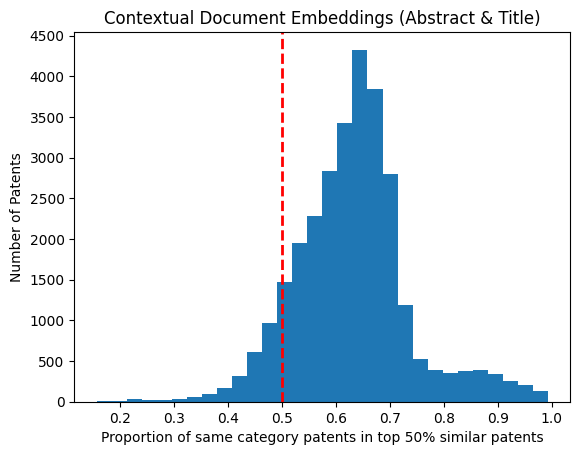

In [19]:
import matplotlib.pyplot as plt
plt.hist(all_ordered, bins = 30)
plt.title("Contextual Document Embeddings (Abstract & Title)")
plt.ylabel("Number of Patents")
plt.xlabel("Proportion of same category patents in top 50% similar patents")
plt.yticks([0, 500, 1000, 1500, 2000, 2500, 3000, 3500, 4000, 4500])
plt.xticks([0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1])
plt.axvline(x=0.5, color='red', linestyle='--', linewidth=2, label='x=0.5')

# Define the path to save the plot
save_path = '/content/drive/MyDrive/68611project/cde_abstract_title.png'

# Save the plot as a PNG image to Google Drive
plt.savefig(save_path)

plt.show()

